In [147]:
# encoding=utf8
from __future__ import print_function
import argparse
import math
import random
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data

from VAE import ConvVAE, MLPVAE, MLPAE
from tSNE import tSNE
from tsne import tsne
from sklearn.decomposition import PCA, KernelPCA
from sklearn.manifold import TSNE
from sklearn import svm
import gpytorch

from scipy.special import logsumexp, kl_div
from scipy.spatial import distance
from scipy.stats import norm

from sys import stdout
import pickle
import time
import os

n_seed = 111111
random.seed(n_seed)
np.random.seed(n_seed)
use_cuda = torch.cuda.is_available()
device   = torch.device("cuda" if use_cuda else "cpu")
torch.manual_seed(n_seed)
if device == "cuda":
    torch.cuda.manual_seed(n_seed)

In [148]:
def magnetization(dataset):
    m = torch.mean(dataset, (2,3))
    return(m)

In [149]:
def b2s(b):
    s = b.astype(int)*2-1
    return(s)

In [150]:
def displace_periodic_matrix(matrix):
    matrix_down = np.zeros(matrix.shape)
    matrix_down[1:,:] = matrix[:-1,:]
    matrix_down[0,:] = matrix[-1,:]
    matrix_down = matrix_down[np.newaxis,:]
    #
    matrix_up = np.zeros(matrix.shape)
    matrix_up[:-1,:] = matrix[1:,:]
    matrix_up[-1,:] = matrix[0,:]
    matrix_up = matrix_up[np.newaxis,:]
    #
    matrix_left = np.zeros(matrix.shape)
    matrix_left[:,:-1] = matrix[:,1:]
    matrix_left[:,-1] = matrix[:,0]
    matrix_left = matrix_left[np.newaxis,:]
    #
    matrix_right = np.zeros(matrix.shape)
    matrix_right[:,1:] = matrix[:,:-1]
    matrix_right[:,0] = matrix[:,-1]
    matrix_right = matrix_right[np.newaxis,:]
    #
    displacements = np.concatenate((matrix_down, matrix_up, matrix_left, matrix_right), axis = 0)
    return(displacements)

def calculate_energy(configuration):
#     configuration = b2s(binary_configuration)
    displacements = displace_periodic_matrix(configuration)
    energy = -np.sum(configuration*np.sum(displacements, axis = 0))/2
    return(energy)

In [151]:
def gaussian_kernel(xi,xj,sigma_=15):
    return np.exp(-((xi-xj)**2).sum()/(2*sigma_**2))

In [152]:
L                      = 32 
N                      = L*L
Tmin                   = 1.6
Tmax                   = 2.9
batch_1_size           = 3000
nSamples               = 6600
min_energy             = -2*N
n_energies             = int(-min_energy/2)-1
nTemps                 = 1000
GP_training_iter_f_PCA = 350
GP_training_iter_e_PCA = 100
nTemps_coarse          = 28
nSamples_coarse        = nSamples // nTemps_coarse

In [153]:
def f2c(x_fine):
    indices = np.arange(nTemps_coarse) * nSamples_coarse
    x_coarse = x_fine[indices,:]
    return x_coarse

In [154]:
dataset = b2s(pickle.load(open('spins_nConfig6600.p','rb')).astype(np.uint8))
dataset_1 = dataset[:batch_1_size,:]
dataset_2 = dataset[batch_1_size:,:]
dataset_torch = 0.5*(torch.FloatTensor(dataset).view(dataset.shape[0], 1, 32, 32)+1)
temps = np.loadtxt('temperatures_nConfig6600_py3.txt')[:nSamples]
temps_1 = temps[:batch_1_size]
temps_2 = temps[batch_1_size:]
magnetizations = np.squeeze(magnetization(2*dataset_torch-1).cpu().numpy())
# del dataset_torch

# Metropolis analysis

In [155]:
energies = np.zeros([nSamples,1])
for sample in range(0,nSamples):
    configuration = dataset[sample,:].reshape([32,32])
    energies[sample,0] = calculate_energy(configuration)
# energy_indexes = np.floor(energies-min_energy)

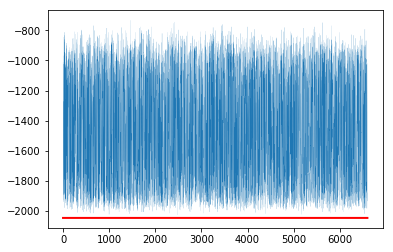

In [156]:
plt.plot(energies,linewidth=0.1)
plt.plot(np.ones(dataset.shape[0])*min_energy,'r',linewidth=2)
plt.show()
plt.close()

In [157]:
energy_bins = np.linspace(min_energy+2,-min_energy-2, n_energies+1)
energy_bins[0] -= 8
energy_bins[-1] += 8
energy_vector = ((energy_bins[1:]+energy_bins[0:-1])/2).astype(int).reshape(-1,1)

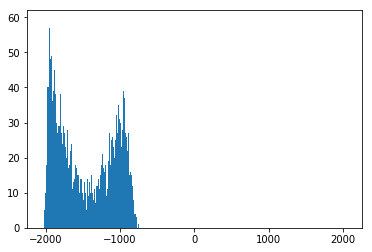

In [158]:
plt.hist(energies, bins=energy_vector.reshape(-1))
plt.show()
plt.close()

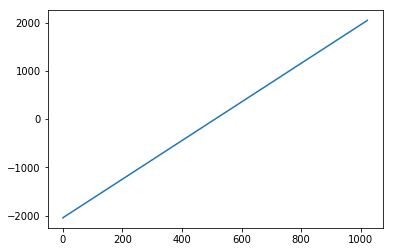

In [159]:
plt.plot(energy_vector)
plt.show()
plt.close()

In [160]:
log_density_of_states = np.loadtxt('log_density_of_states.txt')

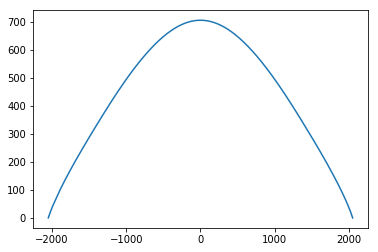

In [161]:
plt.plot(energy_vector, log_density_of_states)
plt.show()
plt.close()

In [162]:
logZ = logsumexp(-(energy_vector/temps).T + log_density_of_states, axis=1)

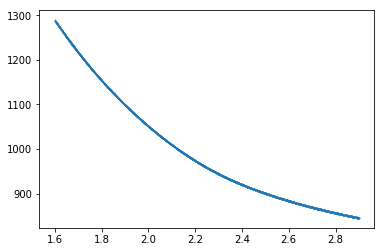

In [163]:
plt.scatter(temps, logZ, s=0.1)
plt.show()
plt.close()

In [164]:
pE_T = np.exp((-(energy_vector/np.sort(temps)).T + log_density_of_states) - logZ.reshape([-1,1]))
pE_T /= pE_T.sum(1, keepdims=True)
pE = pE_T.mean(0)

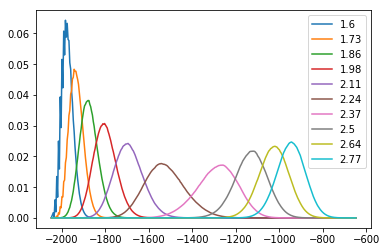

In [165]:
fig = plt.figure()
for i in range(0,10):
    plt.plot(energy_vector[:350], pE_T[i*nSamples//10,:350], label=str(np.round(np.sort(temps)[i*nSamples//10], 2)))
plt.legend()
plt.show()
plt.close()

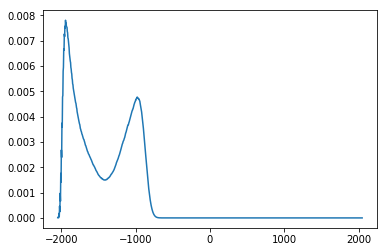

In [166]:
plt.plot(energy_vector, pE)
plt.show()
plt.close()

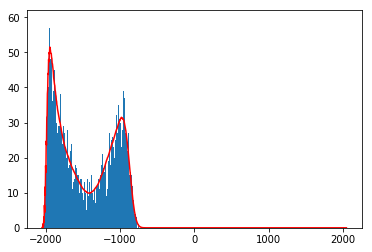

In [167]:
plt.hist(energies, bins=energy_vector.reshape(-1))
plt.plot(energy_vector, pE*nSamples, 'r')
plt.show()
plt.close()

In [168]:
pE_metropolis = np.histogram(energies, bins=energy_bins.reshape(-1))[0]/nSamples

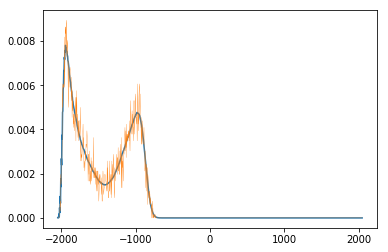

In [169]:
plt.plot(energy_vector, pE)
plt.plot(energy_vector, pE_metropolis, linewidth=0.3)
plt.show()
plt.close()

In [170]:
KLdiv_metropolis = kl_div(pE_metropolis, pE).sum()

In [171]:
print("KL-div Met: %.6e" % KLdiv_metropolis)

KL-div Met: 2.067468e-02


In [172]:
llklhood_metropolis = (-energies.reshape(-1)/temps-logZ).sum()

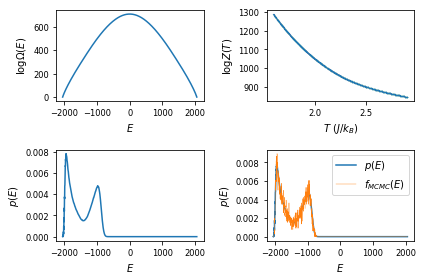

In [173]:
images = []
fig2, ax2 = plt.subplots(nrows=2, ncols=2)
images.append(ax2[0,0].plot(energy_vector, log_density_of_states))
ax2[0,0].set_xlabel('$E$')
ax2[0,0].set_ylabel(r'$\log\Omega(E)$')
ax2[0,0].tick_params(labelsize='small')
images.append(ax2[0,1].scatter(temps, logZ, s=0.005))
ax2[0,1].set_xlabel(r'$T$ ($J/k_B$)')
ax2[0,1].set_ylabel(r'$\log Z(T)$')
ax2[0,1].tick_params(labelsize='small')
images.append(ax2[1,0].plot(energy_vector, pE))
ax2[1,0].set_xlabel(r'$E$')
ax2[1,0].set_ylabel(r'$p(E)$')
ax2[1,0].tick_params(labelsize='small')
images.append(ax2[1,1].plot(energy_vector, pE, label='$p(E)$'))
images.append(ax2[1,1].plot(energy_vector, pE_metropolis, linewidth=0.4, label=r'$f_{MCMC}(E)$'))
ax2[1,1].set_xlabel('$E$')
ax2[1,1].set_ylabel('$p(E)$')
ax2[1,1].legend()
ax2[1,1].tick_params(labelsize='small')
# plt.gca().set_aspect('equal', adjustable='box')
fig2.tight_layout()
plt.savefig('pE.png',dpi=300)
plt.show()
plt.close()

# PCA analysis

In [174]:
# pca = PCA()
# pca = pca.fit(PCA_dataset)
# projected_samples_PCA = pca.fit_transform(PCA_dataset)

# eigenvectors = pca.components_

# nComponents2plot = 6
# lattice_indices = np.linspace(1,N,N, dtype=np.int32)
# red_lattice_indices = np.linspace(1,N,N, dtype=np.int32)
# fig = plt.figure(figsize=(10,5))
# fig.subplots_adjust(left=0.03, right=0.97, hspace=0.23, wspace=0.05)
# for component in range(0, nComponents2plot):
#     ax = fig.add_subplot(2, 3, component+1)
#     im= ax.imshow(eigenvectors[component,:].reshape(L,L).T)
#     ax.set_title(r'Component ' + str(component+1), {'fontsize': 11})
# #     fig.colorbar(im, ax)
# plt.tight_layout()
# plt.savefig('PCs_ising.jpg', dpi = 500)
# plt.close() 

# fig = plt.figure()
# plt.hist(projected_samples_PCA[:,0], bins=50)
# plt.show()
# plt.close()

In [175]:
dataset_centered = dataset - dataset.mean(0)

In [176]:
S_PCA = np.dot(dataset_centered.T, dataset_centered)/nSamples
del dataset_centered

In [177]:
U_PCA, SV_PCA, _ = np.linalg.svd(S_PCA)

In [178]:
SV_higher = SV_PCA[np.log(SV_PCA)>1]
SV_lower = SV_PCA[np.log(SV_PCA)<=1]
t_PCA = SV_higher.shape[0]
print(t_PCA)

26


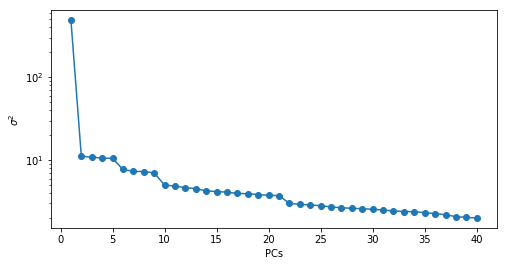

In [179]:
plt.figure(figsize=(8,4))
ind = np.arange(1, 41)
plt.semilogy(ind, SV_PCA[:40],'o-')
plt.ylabel(r'$\sigma^2$')
plt.xlabel('PCs')
plt.savefig('PCs_Ising_sigma2', dpi=300)
plt.show()
plt.close()

In [180]:
nComponents2plot = 6
lattice_indices = np.linspace(1,N,N, dtype=np.int32)
red_lattice_indices = np.linspace(1,N,N, dtype=np.int32)
fig = plt.figure(figsize=(10,5))
fig.subplots_adjust(left=0.03, right=0.97, hspace=0.23, wspace=0.05)
for component in range(0, nComponents2plot):
    ax = fig.add_subplot(2, 3, component+1)
    im= ax.imshow(U_PCA[:,component].reshape(L,L).T, vmin=U_PCA[:,:nComponents2plot].min(), 
                    vmax=U_PCA[:,:nComponents2plot].max())
    ax.set_title(r'PC ' + str(component+1), {'fontsize': 11})
#     fig.colorbar(im, ax)
plt.tight_layout()
plt.savefig('PCs_ising_imshow.jpg', dpi = 500)
plt.close() 

In [181]:
mean = dataset.mean(0).reshape([-1,1])
sigma2 = SV_lower.mean()
W = U_PCA[:,:t_PCA]@(np.diag(SV_higher-sigma2)**0.5)

cov_PCA = sigma2*np.eye(N) + (W @ W.T)
mean_PCA = np.copy(mean)

In [182]:
X_PCA = np.random.multivariate_normal(mean_PCA.reshape(-1), cov_PCA, size=nSamples).clip(-1,1)
X_PCA = (X_PCA + 1)*0.5
r = np.random.rand(*X_PCA.shape)
X_PCA = X_PCA > r
X_PCA = 2*X_PCA - 1

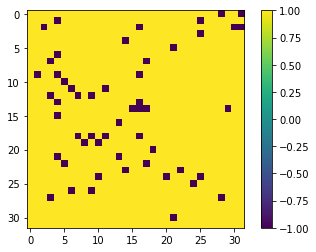

In [183]:
plt.imshow(X_PCA[30,:].reshape([L,L]))
plt.colorbar()
plt.show()
plt.close()

In [184]:
sample_temps = np.linspace(Tmin, Tmax, nTemps).reshape([-1,1])
sample_logZ = logsumexp(-(energy_vector/sample_temps.reshape(-1)).T + log_density_of_states, axis=1)

In [185]:
energies_PCA = np.zeros([nSamples,1])
for sample in range(0,nSamples):
    configuration = X_PCA[sample,:].reshape([L,L])
    energies_PCA[sample,0] = calculate_energy(configuration)

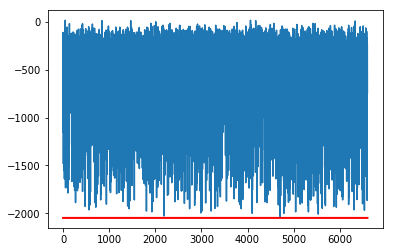

In [186]:
plt.plot(energies_PCA)
plt.plot(np.ones(nSamples)*min_energy,'r',linewidth=2)
plt.show()
plt.close()

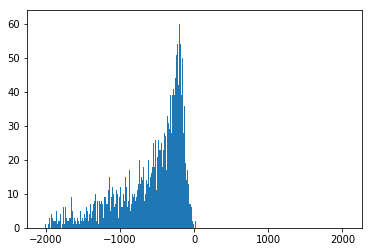

In [187]:
plt.hist(energies_PCA, bins=energy_bins)
plt.show()
plt.close()

In [188]:
conditional_llklhoods_PCA = logsumexp(-energies_PCA/sample_temps.reshape(-1) - sample_logZ, axis=1)
llklhood_PCA = (conditional_llklhoods_PCA + np.log(1/nTemps)).sum()

pE_PCA = np.histogram(energies_PCA, bins=energy_bins.reshape(-1))[0]/nSamples
KLdiv_PCA = kl_div(pE_PCA, pE).sum()

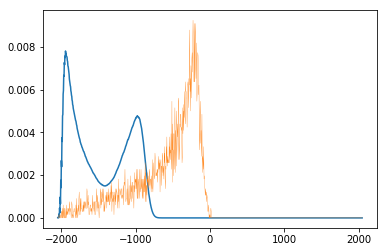

In [189]:
plt.plot(energy_vector, pE)
plt.plot(energy_vector, pE_PCA, linewidth=0.3)
plt.show()
plt.close()

In [190]:
sigma2_1pc = SV_PCA[1:].mean()
W_1pc = (U_PCA[:,0]*((SV_PCA[0]-sigma2_1pc)**0.5)).reshape([-1,1])
cov_PCA_1pc = sigma2_1pc + (W_1pc @ W_1pc.T)
mean_PCA_1pc = np.copy(mean)

X_PCA_1pc = np.random.multivariate_normal(mean_PCA_1pc.reshape(-1), cov_PCA_1pc, size=nSamples).clip(-1,1)
X_PCA_1pc = (X_PCA_1pc + 1)*0.5
r_PCA_1pc = np.random.rand(*X_PCA_1pc.shape)
X_PCA_1pc = X_PCA_1pc > r_PCA_1pc
X_PCA_1pc = 2*X_PCA_1pc - 1

energies_PCA_1pc = np.zeros([nSamples,1])
for sample in range(0,nSamples):
    configuration = X_PCA_1pc[sample,:].reshape([L,L])
    energies_PCA_1pc[sample,0] = calculate_energy(configuration)
    
conditional_llklhoods_PCA_1pc = logsumexp(-energies_PCA_1pc/sample_temps.reshape(-1) - sample_logZ, axis=1)
llklhood_PCA_1pc = (conditional_llklhoods_PCA_1pc + np.log(1/nTemps)).sum()

pE_PCA_1pc = np.histogram(energies_PCA_1pc, bins=energy_bins.reshape(-1))[0]/nSamples
KLdiv_PCA_1pc = kl_div(pE_PCA_1pc, pE).sum()

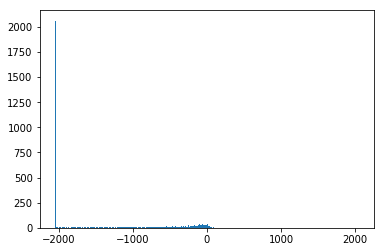

In [191]:
plt.hist(energies_PCA_1pc, bins=energy_bins)
plt.show()
plt.close()

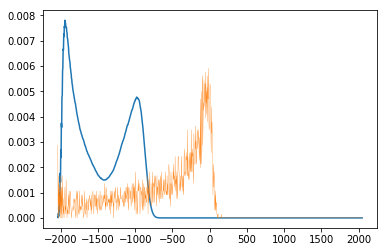

In [192]:
plt.plot(energy_vector[1:], pE[1:])
plt.plot(energy_vector[1:], pE_PCA_1pc[1:], linewidth=0.3)
plt.show()
plt.close()

In [193]:
X_PCA_1pc_no_noise = (mean_PCA_1pc.reshape(-1) + 1)*0.5
X_PCA_1pc_no_noise = X_PCA_1pc_no_noise > r_PCA_1pc
X_PCA_1pc_no_noise = 2*X_PCA_1pc_no_noise - 1

energies_PCA_1pc_no_noise = np.zeros([nSamples,1])
for sample in range(0,nSamples):
    configuration = X_PCA_1pc_no_noise[sample,:].reshape([L,L])
    energies_PCA_1pc_no_noise[sample,0] = calculate_energy(configuration)

conditional_llklhoods_PCA_1pc_no_noise = logsumexp(-energies_PCA_1pc_no_noise/sample_temps.reshape(-1) - sample_logZ, axis=1)
llklhood_PCA_1pc_no_noise = (conditional_llklhoods_PCA_1pc_no_noise + np.log(1/nTemps)).sum()

pE_PCA_1pc_no_noise = np.histogram(energies_PCA_1pc_no_noise, bins=energy_bins.reshape(-1))[0]/nSamples
KLdiv_PCA_1pc_no_noise = kl_div(pE_PCA_1pc_no_noise, pE).sum()

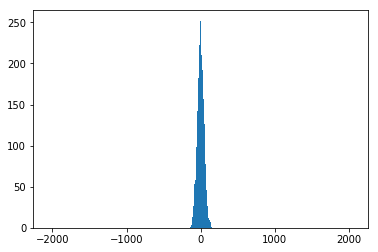

In [194]:
plt.hist(energies_PCA_1pc_no_noise, bins=energy_bins)
plt.show()
plt.close()

In [195]:
print("LogL Met: %.6e" % llklhood_metropolis)
print("LogL PCA (26pc): %.6e" % llklhood_PCA)
print("LogL PCA (1pc): %.6e" % llklhood_PCA_1pc)
print("LogL PCA (1pc-wn): %.6e" % llklhood_PCA_1pc_no_noise)

LogL Met: -1.958874e+06
LogL PCA (26pc): -4.231167e+06
LogL PCA (1pc): -2.895459e+06
LogL PCA (1pc-wn): -5.612849e+06


In [196]:
print("KL-div Met: %.6e" % KLdiv_metropolis)
print("KL-div PCA (26pc): %.6e" % KLdiv_PCA)
print("KL-div PCA (1pc): %.6e" % KLdiv_PCA_1pc)
print("KL-div PCA (1pc-wn): %.6e" % KLdiv_PCA_1pc_no_noise)

KL-div Met: 2.067468e-02
KL-div PCA (26pc): 3.813381e+01
KL-div PCA (1pc): 3.995142e+01
KL-div PCA (1pc-wn): 1.406707e+02


In [197]:
P = (dataset_1 - mean.reshape(-1)) @ U_PCA[:,:t_PCA]
Y_PPCA = (P - (np.ones([P.shape[0],1]) @ mean.T) @ U_PCA[:,:t_PCA]) @ np.diag((SV_higher-sigma2)**(-0.5))
P_2 = (dataset_2 - mean.reshape(-1)) @ U_PCA[:,:t_PCA]
Y_PPCA_2 = (P_2 - (np.ones([P_2.shape[0],1]) @ mean.T) @ U_PCA[:,:t_PCA]) @ np.diag((SV_higher-sigma2)**(-0.5))

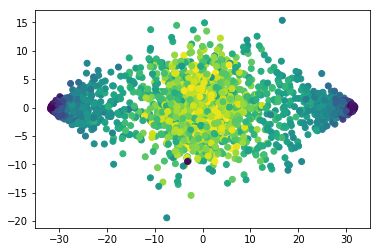

In [198]:
plt.scatter(P[:,0], P[:,1], c=temps_1)
plt.show()
plt.close()

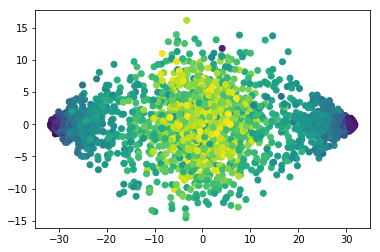

In [199]:
plt.scatter(P_2[:,0], P_2[:,1], c=temps_2)
plt.show()
plt.close()

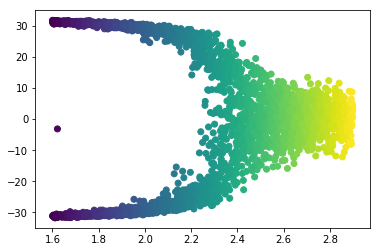

In [200]:
plt.scatter(temps_1, P[:,0], c=temps_1)
plt.show()
plt.close()

In [201]:
X_svm_PCA_train = np.array([[1.6, 30],[1.6,-30]])
labels_train = [0, 1]
X_svm_PCA_test = np.concatenate([temps_1.reshape([-1,1]), P[:,0].reshape([-1,1])], 1)
clf = svm.SVC()
clf.fit(X_svm_PCA_train, labels_train)

/home/researcher/miniconda3/lib/python3.7/site-packages/sklearn/svm/base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='rbf', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

In [202]:
labels_test = clf.predict(X_svm_PCA_test)
X_svm_PCA_test_2 = np.concatenate([temps_2.reshape([-1,1]), P_2[:,0].reshape([-1,1])], 1)
labels_test_2 = clf.predict(X_svm_PCA_test_2)

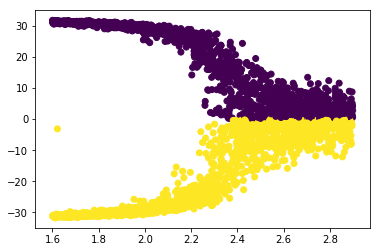

In [203]:
plt.scatter(temps_1, P[:,0], c=labels_test)
plt.show()
plt.close()

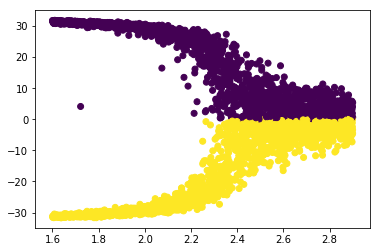

In [204]:
plt.scatter(temps_2, P_2[:,0], c=labels_test_2)
plt.show()
plt.close()

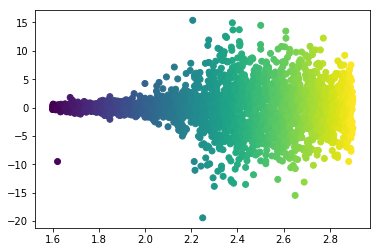

In [205]:
plt.scatter(temps_1, P[:,1], c=temps_1)
plt.show()
plt.close()

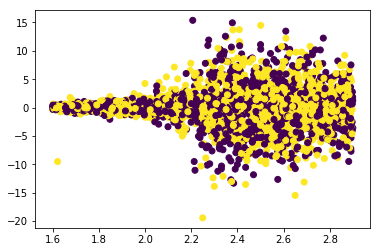

In [206]:
plt.scatter(temps_1, P[:,1], c=labels_test)
plt.show()
plt.close()

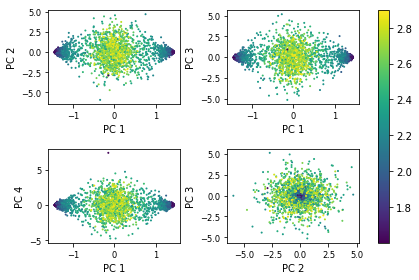

In [207]:
images = []
fig2, ax2 = plt.subplots(nrows=2, ncols=2)
images.append(ax2[0,0].scatter(Y_PPCA[:,0], Y_PPCA[:,1], c=temps_1, s=1))
ax2[0,0].set_xlabel('PC 1')
ax2[0,0].set_ylabel('PC 2')
ax2[0,0].tick_params(labelsize='small')
images.append(ax2[0,1].scatter(Y_PPCA[:,0], Y_PPCA[:,2], c=temps_1, s=1))
ax2[0,1].set_xlabel('PC 1')
ax2[0,1].set_ylabel('PC 3')
ax2[0,1].tick_params(labelsize='small')
images.append(ax2[1,0].scatter(Y_PPCA[:,0], Y_PPCA[:,3], c=temps_1, s=1))
ax2[1,0].set_xlabel('PC 1')
ax2[1,0].set_ylabel('PC 4')
ax2[1,0].tick_params(labelsize='small')
images.append(ax2[1,1].scatter(Y_PPCA[:,1], Y_PPCA[:,2], c=temps_1, s=1))
ax2[1,1].set_xlabel('PC 2')
ax2[1,1].set_ylabel('PC 3')
ax2[1,1].tick_params(labelsize='small')
# plt.gca().set_aspect('equal', adjustable='box')
fig2.tight_layout()
fig2.colorbar(images[0], ax=ax2, orientation='vertical', fraction=.1)
plt.savefig('PCs_Ising.png',dpi=300)
plt.show()
plt.close()

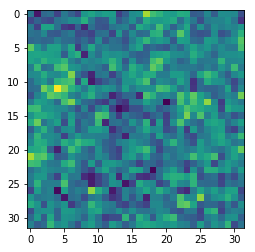

In [208]:
plt.imshow(U_PCA[:,0].reshape([L,L]))
plt.show()
plt.close()

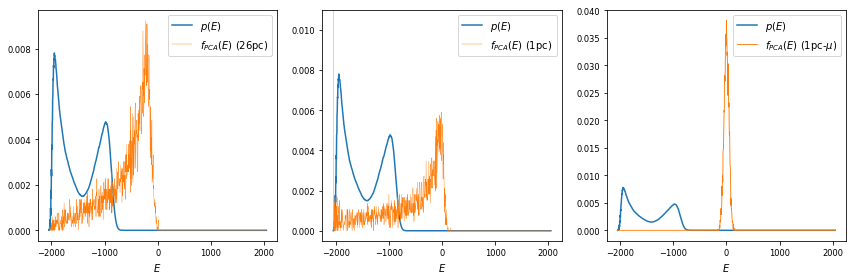

In [209]:
images = []
fig2, ax2 = plt.subplots(nrows=1, ncols=3, figsize=(12,4))
images.append(ax2[0].plot(energy_vector, pE, label='$p(E)$'))
images.append(ax2[0].plot(energy_vector, pE_PCA, linewidth=0.4, label=r'$f_{PCA}(E)$ (26pc)'))
ax2[0].set_xlabel('$E$')
# ax2[0].set_ylabel('$p(E)$')
ax2[0].legend()
ax2[0].tick_params(labelsize='small')
images.append(ax2[1].plot(energy_vector, pE, label='$p(E)$'))
images.append(ax2[1].plot(energy_vector, pE_PCA_1pc, linewidth=0.4, label=r'$f_{PCA}(E)$ (1pc)'))
ax2[1].set_xlabel('$E$')
ax2[1].set_ylim(-0.0005,0.011)
# ax2[1].set_ylabel('$p(E)$')
ax2[1].legend()
ax2[1].tick_params(labelsize='small')
images.append(ax2[2].plot(energy_vector, pE, label='$p(E)$'))
images.append(ax2[2].plot(energy_vector, pE_PCA_1pc_no_noise, linewidth=0.9, label=r'$f_{PCA}(E)$ (1pc-$\mu$)'))
ax2[2].set_xlabel('$E$')
# ax2[2].set_ylabel('$p(E)$')
ax2[2].legend()
ax2[2].tick_params(labelsize='small')
# plt.gca().set_aspect('equal', adjustable='box')
fig2.tight_layout()
plt.savefig('pE_PCA.png',dpi=500)
plt.show()
plt.close()

# KPCA Analysis

In [267]:
O = (np.ones([batch_1_size,1]) @ np.ones([1, batch_1_size]))/batch_1_size
O_mixed = (np.ones([nSamples-batch_1_size,1]) @ np.ones([1, batch_1_size]))/batch_1_size

In [268]:
H = np.eye(batch_1_size) - O
del O

In [269]:
sigma_ = 16
K = np.eye(batch_1_size)
for i in range(0, batch_1_size):
    for j in range(0, i-1):
        K[i,j] = gaussian_kernel(dataset_1[i,:], dataset_1[j,:], sigma_=sigma_)
K = (K+K.T)-np.eye(batch_1_size)

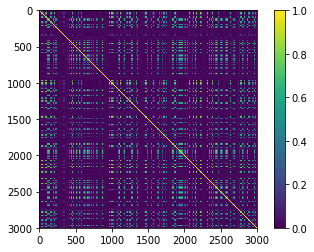

In [270]:
plt.imshow(K)
plt.colorbar()
plt.show()
plt.close()

In [271]:
HKH = H@(K@H)/batch_1_size

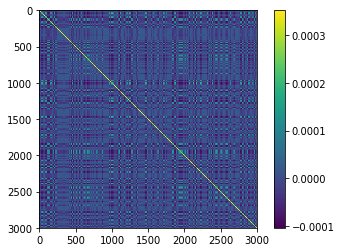

In [272]:
plt.imshow(HKH)
plt.colorbar()
plt.show()
plt.close()

In [273]:
U_K, A_K, _ = np.linalg.svd(HKH)

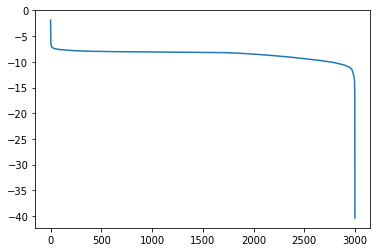

In [274]:
plt.plot(np.log(A_K))
plt.show()
plt.close()

In [275]:
A_K_higher = A_K[np.log(A_K)>-7]
A_K_lower = A_K[np.log(A_K)<=-7]
t_K = A_K_higher.shape[0]
print(t_K)

12


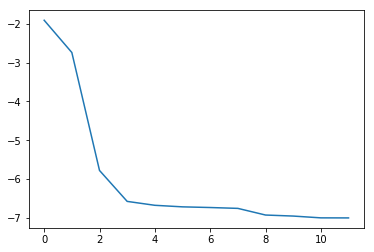

In [276]:
plt.plot(np.log(A_K_higher))
plt.show()
plt.close()

In [277]:
sigma2_K = A_K_lower.mean()
W_K = U_K[:,:t_K]@(np.diag(A_K_higher-sigma2_K)**0.5)

In [278]:
Y_KPCA = U_K[:,:t_K]
print(Y_KPCA.shape)

(3000, 12)


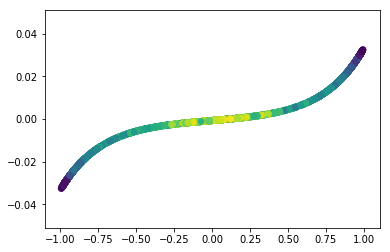

In [279]:
plt.scatter(magnetizations[:batch_1_size], Y_KPCA[:,0], c=temps_1)
plt.show()
plt.close()

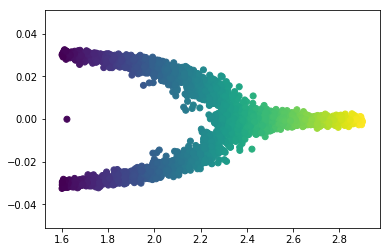

In [280]:
plt.scatter(temps_1, Y_KPCA[:,0], c=temps_1)
plt.show()
plt.close()

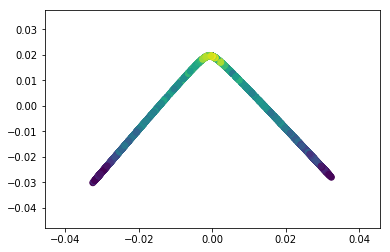

In [281]:
plt.scatter(Y_KPCA[:,0], Y_KPCA[:,1], c=temps_1)
plt.show()
plt.close()

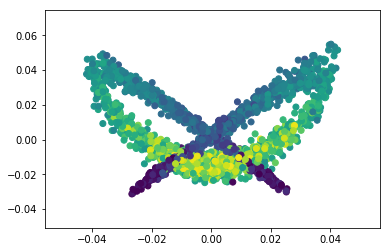

In [282]:
plt.scatter(Y_KPCA[:,2], Y_KPCA[:,3], c=temps_1)
plt.show()
plt.close()

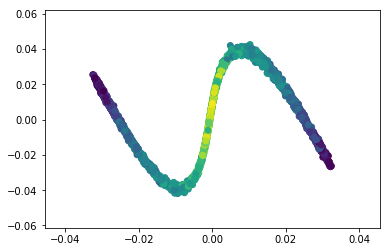

In [283]:
plt.scatter(Y_KPCA[:,0], Y_KPCA[:,2], c=temps_1)
plt.show()
plt.close()

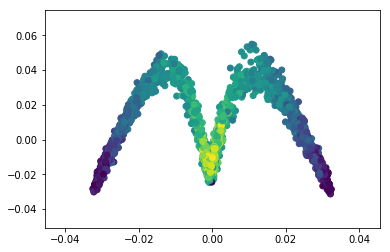

In [284]:
plt.scatter(Y_KPCA[:,0], Y_KPCA[:,3], c=temps_1)
plt.show()
plt.close()

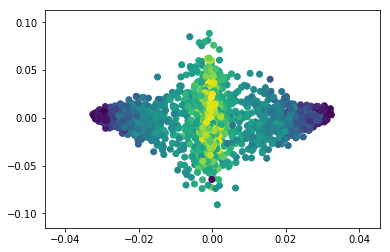

In [285]:
plt.scatter(Y_KPCA[:,0], Y_KPCA[:,4], c=temps_1)
plt.show()
plt.close()

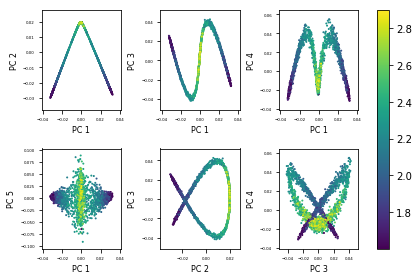

In [286]:
images = []
fig2, ax2 = plt.subplots(nrows=2, ncols=3)
images.append(ax2[0,0].scatter(Y_KPCA[:,0], Y_KPCA[:,1], c=temps_1, s=1))
ax2[0,0].set_xlabel('PC 1', fontsize=8)
ax2[0,0].set_ylabel('PC 2', fontsize=8)
ax2[0,0].tick_params(labelsize=4)
images.append(ax2[0,1].scatter(Y_KPCA[:,0], Y_KPCA[:,2], c=temps_1, s=1))
ax2[0,1].set_xlabel('PC 1', fontsize=8)
ax2[0,1].set_ylabel('PC 3', fontsize=8)
ax2[0,1].tick_params(labelsize=4)
images.append(ax2[0,2].scatter(Y_KPCA[:,0], Y_KPCA[:,3], c=temps_1, s=1))
ax2[0,2].set_xlabel('PC 1', fontsize=8)
ax2[0,2].set_ylabel('PC 4', fontsize=8)
ax2[0,2].tick_params(labelsize=4)
images.append(ax2[1,0].scatter(Y_KPCA[:,0], Y_KPCA[:,4], c=temps_1, s=1))
ax2[1,0].set_xlabel('PC 1', fontsize=8)
ax2[1,0].set_ylabel('PC 5', fontsize=8)
ax2[1,0].tick_params(labelsize=4)
images.append(ax2[1,1].scatter(Y_KPCA[:,1], Y_KPCA[:,2], c=temps_1, s=1))
ax2[1,1].set_xlabel('PC 2', fontsize=8)
ax2[1,1].set_ylabel('PC 3', fontsize=8)
ax2[1,1].tick_params(labelsize=4)
images.append(ax2[1,2].scatter(Y_KPCA[:,2], Y_KPCA[:,3], c=temps_1, s=1))
ax2[1,2].set_xlabel('PC 3', fontsize=8)
ax2[1,2].set_ylabel('PC 4', fontsize=8)
ax2[1,2].tick_params(labelsize=4)
# plt.gca().set_aspect('equal', adjustable='box')
fig2.tight_layout()
fig2.colorbar(images[0], ax=ax2, orientation='vertical', fraction=.1)
plt.savefig('KPCs_Ising.png',dpi=300)
plt.show()
plt.close()

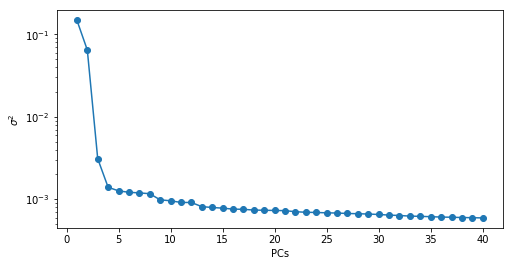

In [287]:
plt.figure(figsize=(8,4))
ind = np.arange(1, 41)
plt.semilogy(ind, A_K[:40],'o-')
plt.ylabel(r'$\sigma^2$')
plt.xlabel('PCs')
plt.savefig('KPCs_Ising_sigma2', dpi=300)
plt.show()
plt.close()

In [288]:
ne_PCA = SV_PCA[0:4].sum()/SV_PCA.sum()*100
ne_KPCA = A_K[0:4].sum()/A_K.sum()*100
print("Variance explained by first 4 pcs (PCA): %.3f" % (ne_PCA))
print("Variance explained by first 4 pcs (KPCA): %.3f" % (ne_KPCA))

Variance explained by first 4 pcs (PCA): 50.559
Variance explained by first 4 pcs (KPCA): 22.467


In [289]:
class MLP(nn.Module):
    def __init__(self, n_channels, input_dim, output_dim, h1=256, h2=1024, mode='continuous'):
        super().__init__()  
        self.n_channels = n_channels    
        self.input_dim = input_dim  
        self.output_dim = output_dim
        self.mode = mode
        if mode == 'continuous':
            self.loss_func = nn.MSELoss()
        else:
            self.loss_func = nn.BCELoss()        
        self.batch_size = 50
        self.num_epochs = 100
        self.verbose = True

        self.l1 =  nn.Linear(n_channels*input_dim, h1)
        self.l2 = nn.Linear(h1, h2)
        self.l3 = nn.Linear(h2, output_dim)
        self.l3.weight.data.uniform_(-3e-3, 3e-3)
        self.l3.bias.data.uniform_(-3e-3, 3e-3)
        
        self.optimizer = optim.Adam(self.parameters(), lr = 3e-3)

    def forward(self, x):
        x = F.leaky_relu(self.l1(x))        
        x = F.leaky_relu(self.l2(x))
        x = self.l3(x)
        if self.mode != 'continuous':
            x = torch.sigmoid(x)
        return x
    
    def train(self, x, y):  
        losses = []       
        
        for epoch in range(0, self.num_epochs):
            for i in range(0, x.shape[0]//self.batch_size):
                batch = random.sample(list(np.arange(0,x.shape[0])), self.batch_size)
                self.zero_grad()
                output = self(x[batch,:])
                loss = self.loss_func(output, y[batch,:])
                loss.backward()
                self.optimizer.step()
                losses.append(loss.item())

                if (i+1) % (x.shape[0]//self.batch_size) == 0 and self.verbose:
                    print('[%d/%d][%d/%d]\tLoss: %.6f' % (epoch, self.num_epochs, i, x.shape[0]//self.batch_size, loss.item()))                  
        return(losses)

In [290]:
K_mixed = np.zeros([nSamples-batch_1_size, batch_1_size])
for i in range(0, nSamples-batch_1_size):
    for j in range(0, batch_1_size):
        K_mixed[i,j] = gaussian_kernel(dataset_2[i,:], dataset_1[j,:], sigma_=sigma_)

In [291]:
np.savetxt('K_mixed', K_mixed)

In [292]:
K_mixed_centered = (K_mixed - (O_mixed @ K)) @ H
del K
del HKH
del K_mixed
del H

In [293]:
Y_KPCA_2 = (K_mixed_centered @ (Y_KPCA @ np.diag(A_K_higher**(-1))))/batch_1_size

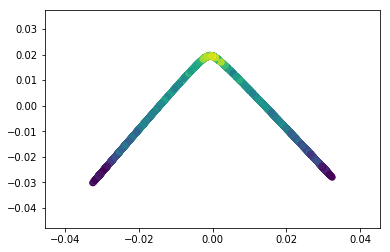

In [294]:
plt.scatter(Y_KPCA_2[:,0], Y_KPCA_2[:,1], c=temps_2)
plt.scatter(Y_KPCA[:,0], Y_KPCA[:,1], c=temps_1)
plt.show()
plt.close()

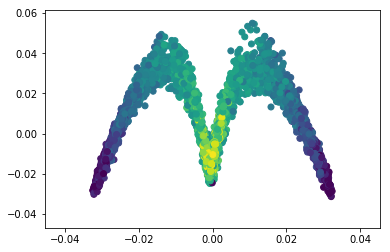

In [295]:
plt.scatter(Y_KPCA_2[:,0], Y_KPCA_2[:,3], c=temps_2)
plt.scatter(Y_KPCA[:,0], Y_KPCA[:,3], c=temps_1)
plt.show()
plt.close()

In [296]:
x_train_KPCA = torch.FloatTensor((Y_KPCA[:,:5] - Y_KPCA[:,:5].mean(0))/Y_KPCA[:,:5].std(0)).to(device)
y_train_KPCA = torch.FloatTensor(0.5*(dataset_1+1)).to(device)
x_test_KPCA = torch.FloatTensor((Y_KPCA_2[:3000,:5] - Y_KPCA[:,:5].mean(0))/Y_KPCA[:,:5].std(0)).to(device)
y_test_KPCA = torch.FloatTensor(0.5*(dataset_2[:3000,:]+1)).to(device)
x_testt_KPCA = torch.FloatTensor((Y_KPCA_2[3000:,:5] - Y_KPCA[:,:5].mean(0))/Y_KPCA[:,:5].std(0)).to(device)
y_testt_KPCA = torch.FloatTensor(0.5*(dataset_2[3000:,:]+1)).to(device)

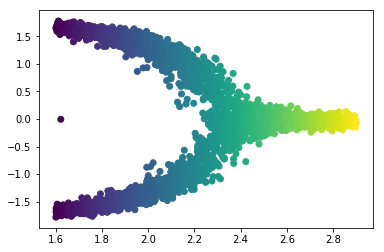

In [297]:
plt.scatter(temps_1, x_train_KPCA.cpu().numpy()[:,0], c=temps_1)
plt.show()
plt.close()

In [84]:
# pi_KPCA = MLP(1, x_train_KPCA.shape[1], N, mode='discrete').to(device)

In [323]:
# torch.save(pi_KPCA,'pi_KPCA_def.pt')

In [298]:
# pi_KPCA.optimizer = optim.Adam(pi_KPCA.parameters(), lr = 3e-4, weight_decay=0)
# pi_KPCA.batch_size = 2000
# pi_KPCA.num_epochs = 1
pi_KPCA = torch.load('pi_KPCA_def.pt')
# pi_KPCA.eval()

/home/researcher/miniconda3/lib/python3.7/site-packages/torch/serialization.py:454: SourceChangeWarning: source code of class 'torch.nn.modules.loss.BCELoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/home/researcher/miniconda3/lib/python3.7/site-packages/torch/serialization.py:454: SourceChangeWarning: source code of class 'torch.nn.modules.linear.Linear' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)


In [307]:
for i in range(0,128000): # 5 times 3e-4, 1 time 3e-5, 1 time 3e-6 with bs 1000, 10 times 3e-4, 1 time 3e-5 with bs 2000
    print("Iteration "+str(i+1))
#     if ((i+1) % 6 == 0) or ((i+2) % 6 == 0) or ((i+3) % 6 == 0):
    if (i+1) % 2 == 0:
        pi_KPCA.train(x_train_KPCA, y_train_KPCA)
    else:
        pi_KPCA.train(x_test_KPCA, y_test_KPCA)

Iteration 1
[0/1][0/1]	Loss: 0.135593
Iteration 2
[0/1][0/1]	Loss: 0.105526
Iteration 3
[0/1][0/1]	Loss: 0.137215
Iteration 4
[0/1][0/1]	Loss: 0.110585
Iteration 5
[0/1][0/1]	Loss: 0.136083
Iteration 6
[0/1][0/1]	Loss: 0.104297
Iteration 7
[0/1][0/1]	Loss: 0.137980
Iteration 8
[0/1][0/1]	Loss: 0.107980
Iteration 9
[0/1][0/1]	Loss: 0.131235
Iteration 10
[0/1][0/1]	Loss: 0.105884
Iteration 11
[0/1][0/1]	Loss: 0.138156
Iteration 12
[0/1][0/1]	Loss: 0.105692
Iteration 13
[0/1][0/1]	Loss: 0.135923
Iteration 14
[0/1][0/1]	Loss: 0.108895
Iteration 15
[0/1][0/1]	Loss: 0.136331
Iteration 16
[0/1][0/1]	Loss: 0.106528
Iteration 17
[0/1][0/1]	Loss: 0.138729
Iteration 18
[0/1][0/1]	Loss: 0.106234
Iteration 19
[0/1][0/1]	Loss: 0.135492
Iteration 20
[0/1][0/1]	Loss: 0.105985
Iteration 21
[0/1][0/1]	Loss: 0.141107
Iteration 22
[0/1][0/1]	Loss: 0.105848
Iteration 23
[0/1][0/1]	Loss: 0.136465
Iteration 24
[0/1][0/1]	Loss: 0.105984
Iteration 25
[0/1][0/1]	Loss: 0.137844
Iteration 26
[0/1][0/1]	Loss: 0.10

[0/1][0/1]	Loss: 0.105081
Iteration 211
[0/1][0/1]	Loss: 0.140828
Iteration 212
[0/1][0/1]	Loss: 0.107750
Iteration 213
[0/1][0/1]	Loss: 0.139151
Iteration 214
[0/1][0/1]	Loss: 0.108618
Iteration 215
[0/1][0/1]	Loss: 0.138782
Iteration 216
[0/1][0/1]	Loss: 0.113047
Iteration 217
[0/1][0/1]	Loss: 0.139332
Iteration 218
[0/1][0/1]	Loss: 0.106708
Iteration 219
[0/1][0/1]	Loss: 0.138553
Iteration 220
[0/1][0/1]	Loss: 0.109471
Iteration 221
[0/1][0/1]	Loss: 0.138144
Iteration 222
[0/1][0/1]	Loss: 0.114701
Iteration 223
[0/1][0/1]	Loss: 0.137992
Iteration 224
[0/1][0/1]	Loss: 0.110237
Iteration 225
[0/1][0/1]	Loss: 0.141910
Iteration 226
[0/1][0/1]	Loss: 0.110275
Iteration 227
[0/1][0/1]	Loss: 0.139939
Iteration 228
[0/1][0/1]	Loss: 0.115919
Iteration 229
[0/1][0/1]	Loss: 0.137612
Iteration 230
[0/1][0/1]	Loss: 0.111698
Iteration 231
[0/1][0/1]	Loss: 0.141113
Iteration 232
[0/1][0/1]	Loss: 0.109100
Iteration 233
[0/1][0/1]	Loss: 0.145456
Iteration 234
[0/1][0/1]	Loss: 0.111349
Iteration 235


[0/1][0/1]	Loss: 0.109132
Iteration 439
[0/1][0/1]	Loss: 0.137000
Iteration 440
[0/1][0/1]	Loss: 0.104453
Iteration 441
[0/1][0/1]	Loss: 0.136725
Iteration 442
[0/1][0/1]	Loss: 0.109937
Iteration 443
[0/1][0/1]	Loss: 0.133385
Iteration 444
[0/1][0/1]	Loss: 0.106935
Iteration 445
[0/1][0/1]	Loss: 0.137603
Iteration 446
[0/1][0/1]	Loss: 0.107774
Iteration 447
[0/1][0/1]	Loss: 0.135453
Iteration 448
[0/1][0/1]	Loss: 0.106934
Iteration 449
[0/1][0/1]	Loss: 0.140357
Iteration 450
[0/1][0/1]	Loss: 0.105005
Iteration 451
[0/1][0/1]	Loss: 0.134650
Iteration 452
[0/1][0/1]	Loss: 0.106394
Iteration 453
[0/1][0/1]	Loss: 0.137133
Iteration 454
[0/1][0/1]	Loss: 0.107043
Iteration 455
[0/1][0/1]	Loss: 0.137786
Iteration 456
[0/1][0/1]	Loss: 0.105431
Iteration 457
[0/1][0/1]	Loss: 0.138005
Iteration 458
[0/1][0/1]	Loss: 0.109286
Iteration 459
[0/1][0/1]	Loss: 0.136995
Iteration 460
[0/1][0/1]	Loss: 0.107858
Iteration 461
[0/1][0/1]	Loss: 0.136826
Iteration 462
[0/1][0/1]	Loss: 0.109314
Iteration 463


[0/1][0/1]	Loss: 0.137421
Iteration 644
[0/1][0/1]	Loss: 0.108277
Iteration 645
[0/1][0/1]	Loss: 0.138375
Iteration 646
[0/1][0/1]	Loss: 0.108087
Iteration 647
[0/1][0/1]	Loss: 0.140066
Iteration 648
[0/1][0/1]	Loss: 0.107290
Iteration 649
[0/1][0/1]	Loss: 0.137725
Iteration 650
[0/1][0/1]	Loss: 0.104107
Iteration 651
[0/1][0/1]	Loss: 0.137225
Iteration 652
[0/1][0/1]	Loss: 0.107732
Iteration 653
[0/1][0/1]	Loss: 0.137043
Iteration 654
[0/1][0/1]	Loss: 0.107867
Iteration 655
[0/1][0/1]	Loss: 0.137330
Iteration 656
[0/1][0/1]	Loss: 0.106421
Iteration 657
[0/1][0/1]	Loss: 0.136462
Iteration 658
[0/1][0/1]	Loss: 0.106524
Iteration 659
[0/1][0/1]	Loss: 0.138682
Iteration 660
[0/1][0/1]	Loss: 0.107441
Iteration 661
[0/1][0/1]	Loss: 0.139009
Iteration 662
[0/1][0/1]	Loss: 0.110704
Iteration 663
[0/1][0/1]	Loss: 0.135205
Iteration 664
[0/1][0/1]	Loss: 0.109218
Iteration 665
[0/1][0/1]	Loss: 0.136780
Iteration 666
[0/1][0/1]	Loss: 0.109049
Iteration 667
[0/1][0/1]	Loss: 0.137894
Iteration 668


[0/1][0/1]	Loss: 0.107166
Iteration 861
[0/1][0/1]	Loss: 0.136127
Iteration 862
[0/1][0/1]	Loss: 0.109282
Iteration 863
[0/1][0/1]	Loss: 0.140481
Iteration 864
[0/1][0/1]	Loss: 0.105676
Iteration 865
[0/1][0/1]	Loss: 0.134820
Iteration 866
[0/1][0/1]	Loss: 0.106987
Iteration 867
[0/1][0/1]	Loss: 0.134275
Iteration 868
[0/1][0/1]	Loss: 0.106057
Iteration 869
[0/1][0/1]	Loss: 0.134810
Iteration 870
[0/1][0/1]	Loss: 0.110976
Iteration 871
[0/1][0/1]	Loss: 0.134558
Iteration 872
[0/1][0/1]	Loss: 0.106650
Iteration 873
[0/1][0/1]	Loss: 0.137300
Iteration 874
[0/1][0/1]	Loss: 0.108539
Iteration 875
[0/1][0/1]	Loss: 0.138654
Iteration 876
[0/1][0/1]	Loss: 0.108133
Iteration 877
[0/1][0/1]	Loss: 0.135804
Iteration 878
[0/1][0/1]	Loss: 0.108094
Iteration 879
[0/1][0/1]	Loss: 0.137628
Iteration 880
[0/1][0/1]	Loss: 0.105838
Iteration 881
[0/1][0/1]	Loss: 0.137245
Iteration 882
[0/1][0/1]	Loss: 0.106499
Iteration 883
[0/1][0/1]	Loss: 0.135275
Iteration 884
[0/1][0/1]	Loss: 0.104315
Iteration 885


[0/1][0/1]	Loss: 0.137587
Iteration 1068
[0/1][0/1]	Loss: 0.107249
Iteration 1069
[0/1][0/1]	Loss: 0.135488
Iteration 1070
[0/1][0/1]	Loss: 0.105737
Iteration 1071
[0/1][0/1]	Loss: 0.138439
Iteration 1072
[0/1][0/1]	Loss: 0.110706
Iteration 1073
[0/1][0/1]	Loss: 0.136073
Iteration 1074
[0/1][0/1]	Loss: 0.108367
Iteration 1075
[0/1][0/1]	Loss: 0.140242
Iteration 1076
[0/1][0/1]	Loss: 0.110074
Iteration 1077
[0/1][0/1]	Loss: 0.140798
Iteration 1078
[0/1][0/1]	Loss: 0.107531
Iteration 1079
[0/1][0/1]	Loss: 0.136768
Iteration 1080
[0/1][0/1]	Loss: 0.108074
Iteration 1081
[0/1][0/1]	Loss: 0.136342
Iteration 1082
[0/1][0/1]	Loss: 0.106735
Iteration 1083
[0/1][0/1]	Loss: 0.135016
Iteration 1084
[0/1][0/1]	Loss: 0.109269
Iteration 1085
[0/1][0/1]	Loss: 0.135077
Iteration 1086
[0/1][0/1]	Loss: 0.106946
Iteration 1087
[0/1][0/1]	Loss: 0.136909
Iteration 1088
[0/1][0/1]	Loss: 0.109672
Iteration 1089
[0/1][0/1]	Loss: 0.137401
Iteration 1090
[0/1][0/1]	Loss: 0.108698
Iteration 1091
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.141359
Iteration 1304
[0/1][0/1]	Loss: 0.107505
Iteration 1305
[0/1][0/1]	Loss: 0.134298
Iteration 1306
[0/1][0/1]	Loss: 0.106251
Iteration 1307
[0/1][0/1]	Loss: 0.137242
Iteration 1308
[0/1][0/1]	Loss: 0.109355
Iteration 1309
[0/1][0/1]	Loss: 0.141929
Iteration 1310
[0/1][0/1]	Loss: 0.108122
Iteration 1311
[0/1][0/1]	Loss: 0.137755
Iteration 1312
[0/1][0/1]	Loss: 0.104831
Iteration 1313
[0/1][0/1]	Loss: 0.135721
Iteration 1314
[0/1][0/1]	Loss: 0.103410
Iteration 1315
[0/1][0/1]	Loss: 0.136761
Iteration 1316
[0/1][0/1]	Loss: 0.105000
Iteration 1317
[0/1][0/1]	Loss: 0.137288
Iteration 1318
[0/1][0/1]	Loss: 0.109793
Iteration 1319
[0/1][0/1]	Loss: 0.135563
Iteration 1320
[0/1][0/1]	Loss: 0.108218
Iteration 1321
[0/1][0/1]	Loss: 0.139838
Iteration 1322
[0/1][0/1]	Loss: 0.107705
Iteration 1323
[0/1][0/1]	Loss: 0.137085
Iteration 1324
[0/1][0/1]	Loss: 0.105037
Iteration 1325
[0/1][0/1]	Loss: 0.135378
Iteration 1326
[0/1][0/1]	Loss: 0.108185
Iteration 1327
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.104828
Iteration 1505
[0/1][0/1]	Loss: 0.137728
Iteration 1506
[0/1][0/1]	Loss: 0.109352
Iteration 1507
[0/1][0/1]	Loss: 0.137358
Iteration 1508
[0/1][0/1]	Loss: 0.104492
Iteration 1509
[0/1][0/1]	Loss: 0.138633
Iteration 1510
[0/1][0/1]	Loss: 0.108646
Iteration 1511
[0/1][0/1]	Loss: 0.139592
Iteration 1512
[0/1][0/1]	Loss: 0.105192
Iteration 1513
[0/1][0/1]	Loss: 0.135423
Iteration 1514
[0/1][0/1]	Loss: 0.107782
Iteration 1515
[0/1][0/1]	Loss: 0.135673
Iteration 1516
[0/1][0/1]	Loss: 0.107620
Iteration 1517
[0/1][0/1]	Loss: 0.136532
Iteration 1518
[0/1][0/1]	Loss: 0.107544
Iteration 1519
[0/1][0/1]	Loss: 0.134168
Iteration 1520
[0/1][0/1]	Loss: 0.105846
Iteration 1521
[0/1][0/1]	Loss: 0.135327
Iteration 1522
[0/1][0/1]	Loss: 0.106789
Iteration 1523
[0/1][0/1]	Loss: 0.141348
Iteration 1524
[0/1][0/1]	Loss: 0.106417
Iteration 1525
[0/1][0/1]	Loss: 0.140131
Iteration 1526
[0/1][0/1]	Loss: 0.106625
Iteration 1527
[0/1][0/1]	Loss: 0.137858
Iteration 1528
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.137486
Iteration 1724
[0/1][0/1]	Loss: 0.107986
Iteration 1725
[0/1][0/1]	Loss: 0.135255
Iteration 1726
[0/1][0/1]	Loss: 0.110034
Iteration 1727
[0/1][0/1]	Loss: 0.136505
Iteration 1728
[0/1][0/1]	Loss: 0.105060
Iteration 1729
[0/1][0/1]	Loss: 0.137120
Iteration 1730
[0/1][0/1]	Loss: 0.106207
Iteration 1731
[0/1][0/1]	Loss: 0.137005
Iteration 1732
[0/1][0/1]	Loss: 0.107437
Iteration 1733
[0/1][0/1]	Loss: 0.139656
Iteration 1734
[0/1][0/1]	Loss: 0.109191
Iteration 1735
[0/1][0/1]	Loss: 0.133558
Iteration 1736
[0/1][0/1]	Loss: 0.105973
Iteration 1737
[0/1][0/1]	Loss: 0.137582
Iteration 1738
[0/1][0/1]	Loss: 0.106130
Iteration 1739
[0/1][0/1]	Loss: 0.135667
Iteration 1740
[0/1][0/1]	Loss: 0.106347
Iteration 1741
[0/1][0/1]	Loss: 0.136657
Iteration 1742
[0/1][0/1]	Loss: 0.107457
Iteration 1743
[0/1][0/1]	Loss: 0.140608
Iteration 1744
[0/1][0/1]	Loss: 0.107813
Iteration 1745
[0/1][0/1]	Loss: 0.136869
Iteration 1746
[0/1][0/1]	Loss: 0.106283
Iteration 1747
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.136604
Iteration 1936
[0/1][0/1]	Loss: 0.105661
Iteration 1937
[0/1][0/1]	Loss: 0.136052
Iteration 1938
[0/1][0/1]	Loss: 0.108770
Iteration 1939
[0/1][0/1]	Loss: 0.139074
Iteration 1940
[0/1][0/1]	Loss: 0.105806
Iteration 1941
[0/1][0/1]	Loss: 0.136520
Iteration 1942
[0/1][0/1]	Loss: 0.104015
Iteration 1943
[0/1][0/1]	Loss: 0.137491
Iteration 1944
[0/1][0/1]	Loss: 0.107038
Iteration 1945
[0/1][0/1]	Loss: 0.138250
Iteration 1946
[0/1][0/1]	Loss: 0.108012
Iteration 1947
[0/1][0/1]	Loss: 0.139473
Iteration 1948
[0/1][0/1]	Loss: 0.109250
Iteration 1949
[0/1][0/1]	Loss: 0.136917
Iteration 1950
[0/1][0/1]	Loss: 0.106820
Iteration 1951
[0/1][0/1]	Loss: 0.139748
Iteration 1952
[0/1][0/1]	Loss: 0.107399
Iteration 1953
[0/1][0/1]	Loss: 0.134816
Iteration 1954
[0/1][0/1]	Loss: 0.108304
Iteration 1955
[0/1][0/1]	Loss: 0.132406
Iteration 1956
[0/1][0/1]	Loss: 0.106460
Iteration 1957
[0/1][0/1]	Loss: 0.137558
Iteration 1958
[0/1][0/1]	Loss: 0.104652
Iteration 1959
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.135328
Iteration 2152
[0/1][0/1]	Loss: 0.110548
Iteration 2153
[0/1][0/1]	Loss: 0.143343
Iteration 2154
[0/1][0/1]	Loss: 0.107514
Iteration 2155
[0/1][0/1]	Loss: 0.135179
Iteration 2156
[0/1][0/1]	Loss: 0.110539
Iteration 2157
[0/1][0/1]	Loss: 0.136505
Iteration 2158
[0/1][0/1]	Loss: 0.108814
Iteration 2159
[0/1][0/1]	Loss: 0.138810
Iteration 2160
[0/1][0/1]	Loss: 0.104821
Iteration 2161
[0/1][0/1]	Loss: 0.138920
Iteration 2162
[0/1][0/1]	Loss: 0.104806
Iteration 2163
[0/1][0/1]	Loss: 0.138113
Iteration 2164
[0/1][0/1]	Loss: 0.108989
Iteration 2165
[0/1][0/1]	Loss: 0.137947
Iteration 2166
[0/1][0/1]	Loss: 0.111583
Iteration 2167
[0/1][0/1]	Loss: 0.136688
Iteration 2168
[0/1][0/1]	Loss: 0.108345
Iteration 2169
[0/1][0/1]	Loss: 0.138997
Iteration 2170
[0/1][0/1]	Loss: 0.106092
Iteration 2171
[0/1][0/1]	Loss: 0.138628
Iteration 2172
[0/1][0/1]	Loss: 0.107064
Iteration 2173
[0/1][0/1]	Loss: 0.139845
Iteration 2174
[0/1][0/1]	Loss: 0.105408
Iteration 2175
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.134862
Iteration 2374
[0/1][0/1]	Loss: 0.105800
Iteration 2375
[0/1][0/1]	Loss: 0.135384
Iteration 2376
[0/1][0/1]	Loss: 0.108514
Iteration 2377
[0/1][0/1]	Loss: 0.133008
Iteration 2378
[0/1][0/1]	Loss: 0.108963
Iteration 2379
[0/1][0/1]	Loss: 0.139211
Iteration 2380
[0/1][0/1]	Loss: 0.105406
Iteration 2381
[0/1][0/1]	Loss: 0.137514
Iteration 2382
[0/1][0/1]	Loss: 0.105593
Iteration 2383
[0/1][0/1]	Loss: 0.139911
Iteration 2384
[0/1][0/1]	Loss: 0.108110
Iteration 2385
[0/1][0/1]	Loss: 0.137857
Iteration 2386
[0/1][0/1]	Loss: 0.105672
Iteration 2387
[0/1][0/1]	Loss: 0.138793
Iteration 2388
[0/1][0/1]	Loss: 0.108662
Iteration 2389
[0/1][0/1]	Loss: 0.138450
Iteration 2390
[0/1][0/1]	Loss: 0.109161
Iteration 2391
[0/1][0/1]	Loss: 0.137679
Iteration 2392
[0/1][0/1]	Loss: 0.109310
Iteration 2393
[0/1][0/1]	Loss: 0.136730
Iteration 2394
[0/1][0/1]	Loss: 0.107376
Iteration 2395
[0/1][0/1]	Loss: 0.140486
Iteration 2396
[0/1][0/1]	Loss: 0.106958
Iteration 2397
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.108494
Iteration 2597
[0/1][0/1]	Loss: 0.139082
Iteration 2598
[0/1][0/1]	Loss: 0.108434
Iteration 2599
[0/1][0/1]	Loss: 0.138422
Iteration 2600
[0/1][0/1]	Loss: 0.105123
Iteration 2601
[0/1][0/1]	Loss: 0.137251
Iteration 2602
[0/1][0/1]	Loss: 0.104026
Iteration 2603
[0/1][0/1]	Loss: 0.134661
Iteration 2604
[0/1][0/1]	Loss: 0.105045
Iteration 2605
[0/1][0/1]	Loss: 0.139671
Iteration 2606
[0/1][0/1]	Loss: 0.106444
Iteration 2607
[0/1][0/1]	Loss: 0.135517
Iteration 2608
[0/1][0/1]	Loss: 0.106136
Iteration 2609
[0/1][0/1]	Loss: 0.137639
Iteration 2610
[0/1][0/1]	Loss: 0.105062
Iteration 2611
[0/1][0/1]	Loss: 0.136919
Iteration 2612
[0/1][0/1]	Loss: 0.107252
Iteration 2613
[0/1][0/1]	Loss: 0.140200
Iteration 2614
[0/1][0/1]	Loss: 0.107097
Iteration 2615
[0/1][0/1]	Loss: 0.135022
Iteration 2616
[0/1][0/1]	Loss: 0.107321
Iteration 2617
[0/1][0/1]	Loss: 0.139875
Iteration 2618
[0/1][0/1]	Loss: 0.108394
Iteration 2619
[0/1][0/1]	Loss: 0.136210
Iteration 2620
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.106263
Iteration 2815
[0/1][0/1]	Loss: 0.135881
Iteration 2816
[0/1][0/1]	Loss: 0.108756
Iteration 2817
[0/1][0/1]	Loss: 0.136869
Iteration 2818
[0/1][0/1]	Loss: 0.108034
Iteration 2819
[0/1][0/1]	Loss: 0.138714
Iteration 2820
[0/1][0/1]	Loss: 0.106774
Iteration 2821
[0/1][0/1]	Loss: 0.137671
Iteration 2822
[0/1][0/1]	Loss: 0.107548
Iteration 2823
[0/1][0/1]	Loss: 0.136342
Iteration 2824
[0/1][0/1]	Loss: 0.109432
Iteration 2825
[0/1][0/1]	Loss: 0.139165
Iteration 2826
[0/1][0/1]	Loss: 0.106271
Iteration 2827
[0/1][0/1]	Loss: 0.136473
Iteration 2828
[0/1][0/1]	Loss: 0.107046
Iteration 2829
[0/1][0/1]	Loss: 0.137808
Iteration 2830
[0/1][0/1]	Loss: 0.105814
Iteration 2831
[0/1][0/1]	Loss: 0.136355
Iteration 2832
[0/1][0/1]	Loss: 0.105036
Iteration 2833
[0/1][0/1]	Loss: 0.139946
Iteration 2834
[0/1][0/1]	Loss: 0.108002
Iteration 2835
[0/1][0/1]	Loss: 0.136299
Iteration 2836
[0/1][0/1]	Loss: 0.110686
Iteration 2837
[0/1][0/1]	Loss: 0.136121
Iteration 2838
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.139253
Iteration 3018
[0/1][0/1]	Loss: 0.106658
Iteration 3019
[0/1][0/1]	Loss: 0.139774
Iteration 3020
[0/1][0/1]	Loss: 0.108117
Iteration 3021
[0/1][0/1]	Loss: 0.134482
Iteration 3022
[0/1][0/1]	Loss: 0.105851
Iteration 3023
[0/1][0/1]	Loss: 0.134540
Iteration 3024
[0/1][0/1]	Loss: 0.102942
Iteration 3025
[0/1][0/1]	Loss: 0.137376
Iteration 3026
[0/1][0/1]	Loss: 0.108634
Iteration 3027
[0/1][0/1]	Loss: 0.136016
Iteration 3028
[0/1][0/1]	Loss: 0.109611
Iteration 3029
[0/1][0/1]	Loss: 0.133709
Iteration 3030
[0/1][0/1]	Loss: 0.104295
Iteration 3031
[0/1][0/1]	Loss: 0.138035
Iteration 3032
[0/1][0/1]	Loss: 0.103663
Iteration 3033
[0/1][0/1]	Loss: 0.135550
Iteration 3034
[0/1][0/1]	Loss: 0.106256
Iteration 3035
[0/1][0/1]	Loss: 0.134237
Iteration 3036
[0/1][0/1]	Loss: 0.106607
Iteration 3037
[0/1][0/1]	Loss: 0.136433
Iteration 3038
[0/1][0/1]	Loss: 0.106741
Iteration 3039
[0/1][0/1]	Loss: 0.138779
Iteration 3040
[0/1][0/1]	Loss: 0.105723
Iteration 3041
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.107945
Iteration 3235
[0/1][0/1]	Loss: 0.134530
Iteration 3236
[0/1][0/1]	Loss: 0.108281
Iteration 3237
[0/1][0/1]	Loss: 0.138541
Iteration 3238
[0/1][0/1]	Loss: 0.104020
Iteration 3239
[0/1][0/1]	Loss: 0.139139
Iteration 3240
[0/1][0/1]	Loss: 0.108193
Iteration 3241
[0/1][0/1]	Loss: 0.136926
Iteration 3242
[0/1][0/1]	Loss: 0.106190
Iteration 3243
[0/1][0/1]	Loss: 0.138211
Iteration 3244
[0/1][0/1]	Loss: 0.108537
Iteration 3245
[0/1][0/1]	Loss: 0.135761
Iteration 3246
[0/1][0/1]	Loss: 0.106900
Iteration 3247
[0/1][0/1]	Loss: 0.137127
Iteration 3248
[0/1][0/1]	Loss: 0.108423
Iteration 3249
[0/1][0/1]	Loss: 0.136050
Iteration 3250
[0/1][0/1]	Loss: 0.105549
Iteration 3251
[0/1][0/1]	Loss: 0.134724
Iteration 3252
[0/1][0/1]	Loss: 0.111150
Iteration 3253
[0/1][0/1]	Loss: 0.138417
Iteration 3254
[0/1][0/1]	Loss: 0.107043
Iteration 3255
[0/1][0/1]	Loss: 0.138240
Iteration 3256
[0/1][0/1]	Loss: 0.109655
Iteration 3257
[0/1][0/1]	Loss: 0.137181
Iteration 3258
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.136235
Iteration 3448
[0/1][0/1]	Loss: 0.107644
Iteration 3449
[0/1][0/1]	Loss: 0.136085
Iteration 3450
[0/1][0/1]	Loss: 0.108509
Iteration 3451
[0/1][0/1]	Loss: 0.139568
Iteration 3452
[0/1][0/1]	Loss: 0.108819
Iteration 3453
[0/1][0/1]	Loss: 0.137424
Iteration 3454
[0/1][0/1]	Loss: 0.108446
Iteration 3455
[0/1][0/1]	Loss: 0.137550
Iteration 3456
[0/1][0/1]	Loss: 0.109023
Iteration 3457
[0/1][0/1]	Loss: 0.139303
Iteration 3458
[0/1][0/1]	Loss: 0.104907
Iteration 3459
[0/1][0/1]	Loss: 0.136414
Iteration 3460
[0/1][0/1]	Loss: 0.107118
Iteration 3461
[0/1][0/1]	Loss: 0.138616
Iteration 3462
[0/1][0/1]	Loss: 0.109069
Iteration 3463
[0/1][0/1]	Loss: 0.135256
Iteration 3464
[0/1][0/1]	Loss: 0.109510
Iteration 3465
[0/1][0/1]	Loss: 0.139569
Iteration 3466
[0/1][0/1]	Loss: 0.109232
Iteration 3467
[0/1][0/1]	Loss: 0.140554
Iteration 3468
[0/1][0/1]	Loss: 0.108472
Iteration 3469
[0/1][0/1]	Loss: 0.141628
Iteration 3470
[0/1][0/1]	Loss: 0.110735
Iteration 3471
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.106040
Iteration 3677
[0/1][0/1]	Loss: 0.139649
Iteration 3678
[0/1][0/1]	Loss: 0.106511
Iteration 3679
[0/1][0/1]	Loss: 0.137771
Iteration 3680
[0/1][0/1]	Loss: 0.107193
Iteration 3681
[0/1][0/1]	Loss: 0.138200
Iteration 3682
[0/1][0/1]	Loss: 0.106906
Iteration 3683
[0/1][0/1]	Loss: 0.136132
Iteration 3684
[0/1][0/1]	Loss: 0.108908
Iteration 3685
[0/1][0/1]	Loss: 0.136152
Iteration 3686
[0/1][0/1]	Loss: 0.106242
Iteration 3687
[0/1][0/1]	Loss: 0.139736
Iteration 3688
[0/1][0/1]	Loss: 0.105023
Iteration 3689
[0/1][0/1]	Loss: 0.135695
Iteration 3690
[0/1][0/1]	Loss: 0.105617
Iteration 3691
[0/1][0/1]	Loss: 0.138369
Iteration 3692
[0/1][0/1]	Loss: 0.107772
Iteration 3693
[0/1][0/1]	Loss: 0.135507
Iteration 3694
[0/1][0/1]	Loss: 0.107450
Iteration 3695
[0/1][0/1]	Loss: 0.134670
Iteration 3696
[0/1][0/1]	Loss: 0.109855
Iteration 3697
[0/1][0/1]	Loss: 0.134546
Iteration 3698
[0/1][0/1]	Loss: 0.107138
Iteration 3699
[0/1][0/1]	Loss: 0.135280
Iteration 3700
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.110053
Iteration 3887
[0/1][0/1]	Loss: 0.138563
Iteration 3888
[0/1][0/1]	Loss: 0.107620
Iteration 3889
[0/1][0/1]	Loss: 0.136513
Iteration 3890
[0/1][0/1]	Loss: 0.104989
Iteration 3891
[0/1][0/1]	Loss: 0.134169
Iteration 3892
[0/1][0/1]	Loss: 0.104570
Iteration 3893
[0/1][0/1]	Loss: 0.135390
Iteration 3894
[0/1][0/1]	Loss: 0.103671
Iteration 3895
[0/1][0/1]	Loss: 0.137014
Iteration 3896
[0/1][0/1]	Loss: 0.106719
Iteration 3897
[0/1][0/1]	Loss: 0.137967
Iteration 3898
[0/1][0/1]	Loss: 0.107979
Iteration 3899
[0/1][0/1]	Loss: 0.137184
Iteration 3900
[0/1][0/1]	Loss: 0.105904
Iteration 3901
[0/1][0/1]	Loss: 0.136202
Iteration 3902
[0/1][0/1]	Loss: 0.105668
Iteration 3903
[0/1][0/1]	Loss: 0.138809
Iteration 3904
[0/1][0/1]	Loss: 0.102215
Iteration 3905
[0/1][0/1]	Loss: 0.139355
Iteration 3906
[0/1][0/1]	Loss: 0.107726
Iteration 3907
[0/1][0/1]	Loss: 0.134382
Iteration 3908
[0/1][0/1]	Loss: 0.107232
Iteration 3909
[0/1][0/1]	Loss: 0.137299
Iteration 3910
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.107138
Iteration 4087
[0/1][0/1]	Loss: 0.138335
Iteration 4088
[0/1][0/1]	Loss: 0.106922
Iteration 4089
[0/1][0/1]	Loss: 0.136947
Iteration 4090
[0/1][0/1]	Loss: 0.105840
Iteration 4091
[0/1][0/1]	Loss: 0.137014
Iteration 4092
[0/1][0/1]	Loss: 0.106830
Iteration 4093
[0/1][0/1]	Loss: 0.136165
Iteration 4094
[0/1][0/1]	Loss: 0.104872
Iteration 4095
[0/1][0/1]	Loss: 0.138191
Iteration 4096
[0/1][0/1]	Loss: 0.107492
Iteration 4097
[0/1][0/1]	Loss: 0.140279
Iteration 4098
[0/1][0/1]	Loss: 0.105135
Iteration 4099
[0/1][0/1]	Loss: 0.137999
Iteration 4100
[0/1][0/1]	Loss: 0.105356
Iteration 4101
[0/1][0/1]	Loss: 0.137384
Iteration 4102
[0/1][0/1]	Loss: 0.104979
Iteration 4103
[0/1][0/1]	Loss: 0.138030
Iteration 4104
[0/1][0/1]	Loss: 0.107345
Iteration 4105
[0/1][0/1]	Loss: 0.135234
Iteration 4106
[0/1][0/1]	Loss: 0.102488
Iteration 4107
[0/1][0/1]	Loss: 0.136120
Iteration 4108
[0/1][0/1]	Loss: 0.109379
Iteration 4109
[0/1][0/1]	Loss: 0.136847
Iteration 4110
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.104606
Iteration 4303
[0/1][0/1]	Loss: 0.139490
Iteration 4304
[0/1][0/1]	Loss: 0.108135
Iteration 4305
[0/1][0/1]	Loss: 0.138259
Iteration 4306
[0/1][0/1]	Loss: 0.106868
Iteration 4307
[0/1][0/1]	Loss: 0.136527
Iteration 4308
[0/1][0/1]	Loss: 0.110006
Iteration 4309
[0/1][0/1]	Loss: 0.137712
Iteration 4310
[0/1][0/1]	Loss: 0.104788
Iteration 4311
[0/1][0/1]	Loss: 0.137144
Iteration 4312
[0/1][0/1]	Loss: 0.105642
Iteration 4313
[0/1][0/1]	Loss: 0.135398
Iteration 4314
[0/1][0/1]	Loss: 0.106852
Iteration 4315
[0/1][0/1]	Loss: 0.133955
Iteration 4316
[0/1][0/1]	Loss: 0.108000
Iteration 4317
[0/1][0/1]	Loss: 0.137505
Iteration 4318
[0/1][0/1]	Loss: 0.105829
Iteration 4319
[0/1][0/1]	Loss: 0.140043
Iteration 4320
[0/1][0/1]	Loss: 0.108031
Iteration 4321
[0/1][0/1]	Loss: 0.136450
Iteration 4322
[0/1][0/1]	Loss: 0.106447
Iteration 4323
[0/1][0/1]	Loss: 0.135725
Iteration 4324
[0/1][0/1]	Loss: 0.104835
Iteration 4325
[0/1][0/1]	Loss: 0.134358
Iteration 4326
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.135854
Iteration 4540
[0/1][0/1]	Loss: 0.107308
Iteration 4541
[0/1][0/1]	Loss: 0.138626
Iteration 4542
[0/1][0/1]	Loss: 0.107581
Iteration 4543
[0/1][0/1]	Loss: 0.138649
Iteration 4544
[0/1][0/1]	Loss: 0.106448
Iteration 4545
[0/1][0/1]	Loss: 0.137211
Iteration 4546
[0/1][0/1]	Loss: 0.110163
Iteration 4547
[0/1][0/1]	Loss: 0.140751
Iteration 4548
[0/1][0/1]	Loss: 0.107949
Iteration 4549
[0/1][0/1]	Loss: 0.140314
Iteration 4550
[0/1][0/1]	Loss: 0.108695
Iteration 4551
[0/1][0/1]	Loss: 0.134363
Iteration 4552
[0/1][0/1]	Loss: 0.107580
Iteration 4553
[0/1][0/1]	Loss: 0.138829
Iteration 4554
[0/1][0/1]	Loss: 0.109231
Iteration 4555
[0/1][0/1]	Loss: 0.141345
Iteration 4556
[0/1][0/1]	Loss: 0.108498
Iteration 4557
[0/1][0/1]	Loss: 0.138663
Iteration 4558
[0/1][0/1]	Loss: 0.110763
Iteration 4559
[0/1][0/1]	Loss: 0.138121
Iteration 4560
[0/1][0/1]	Loss: 0.106334
Iteration 4561
[0/1][0/1]	Loss: 0.141717
Iteration 4562
[0/1][0/1]	Loss: 0.108635
Iteration 4563
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.138777
Iteration 4742
[0/1][0/1]	Loss: 0.107776
Iteration 4743
[0/1][0/1]	Loss: 0.137606
Iteration 4744
[0/1][0/1]	Loss: 0.104768
Iteration 4745
[0/1][0/1]	Loss: 0.135344
Iteration 4746
[0/1][0/1]	Loss: 0.107031
Iteration 4747
[0/1][0/1]	Loss: 0.135910
Iteration 4748
[0/1][0/1]	Loss: 0.108369
Iteration 4749
[0/1][0/1]	Loss: 0.136626
Iteration 4750
[0/1][0/1]	Loss: 0.106334
Iteration 4751
[0/1][0/1]	Loss: 0.139454
Iteration 4752
[0/1][0/1]	Loss: 0.107912
Iteration 4753
[0/1][0/1]	Loss: 0.137514
Iteration 4754
[0/1][0/1]	Loss: 0.105289
Iteration 4755
[0/1][0/1]	Loss: 0.136646
Iteration 4756
[0/1][0/1]	Loss: 0.106047
Iteration 4757
[0/1][0/1]	Loss: 0.140560
Iteration 4758
[0/1][0/1]	Loss: 0.109611
Iteration 4759
[0/1][0/1]	Loss: 0.136691
Iteration 4760
[0/1][0/1]	Loss: 0.108751
Iteration 4761
[0/1][0/1]	Loss: 0.134128
Iteration 4762
[0/1][0/1]	Loss: 0.104777
Iteration 4763
[0/1][0/1]	Loss: 0.134691
Iteration 4764
[0/1][0/1]	Loss: 0.106352
Iteration 4765
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.135630
Iteration 4942
[0/1][0/1]	Loss: 0.105371
Iteration 4943
[0/1][0/1]	Loss: 0.134905
Iteration 4944
[0/1][0/1]	Loss: 0.108228
Iteration 4945
[0/1][0/1]	Loss: 0.137827
Iteration 4946
[0/1][0/1]	Loss: 0.107092
Iteration 4947
[0/1][0/1]	Loss: 0.139516
Iteration 4948
[0/1][0/1]	Loss: 0.107494
Iteration 4949
[0/1][0/1]	Loss: 0.133692
Iteration 4950
[0/1][0/1]	Loss: 0.104008
Iteration 4951
[0/1][0/1]	Loss: 0.140802
Iteration 4952
[0/1][0/1]	Loss: 0.104844
Iteration 4953
[0/1][0/1]	Loss: 0.136240
Iteration 4954
[0/1][0/1]	Loss: 0.105896
Iteration 4955
[0/1][0/1]	Loss: 0.135175
Iteration 4956
[0/1][0/1]	Loss: 0.107419
Iteration 4957
[0/1][0/1]	Loss: 0.138917
Iteration 4958
[0/1][0/1]	Loss: 0.104703
Iteration 4959
[0/1][0/1]	Loss: 0.134198
Iteration 4960
[0/1][0/1]	Loss: 0.108708
Iteration 4961
[0/1][0/1]	Loss: 0.135790
Iteration 4962
[0/1][0/1]	Loss: 0.108010
Iteration 4963
[0/1][0/1]	Loss: 0.138293
Iteration 4964
[0/1][0/1]	Loss: 0.105106
Iteration 4965
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.137293
Iteration 5154
[0/1][0/1]	Loss: 0.104808
Iteration 5155
[0/1][0/1]	Loss: 0.138975
Iteration 5156
[0/1][0/1]	Loss: 0.106706
Iteration 5157
[0/1][0/1]	Loss: 0.139589
Iteration 5158
[0/1][0/1]	Loss: 0.105051
Iteration 5159
[0/1][0/1]	Loss: 0.139199
Iteration 5160
[0/1][0/1]	Loss: 0.104285
Iteration 5161
[0/1][0/1]	Loss: 0.134453
Iteration 5162
[0/1][0/1]	Loss: 0.102655
Iteration 5163
[0/1][0/1]	Loss: 0.132992
Iteration 5164
[0/1][0/1]	Loss: 0.109062
Iteration 5165
[0/1][0/1]	Loss: 0.134520
Iteration 5166
[0/1][0/1]	Loss: 0.105647
Iteration 5167
[0/1][0/1]	Loss: 0.136451
Iteration 5168
[0/1][0/1]	Loss: 0.105281
Iteration 5169
[0/1][0/1]	Loss: 0.134163
Iteration 5170
[0/1][0/1]	Loss: 0.104661
Iteration 5171
[0/1][0/1]	Loss: 0.136639
Iteration 5172
[0/1][0/1]	Loss: 0.104848
Iteration 5173
[0/1][0/1]	Loss: 0.136445
Iteration 5174
[0/1][0/1]	Loss: 0.104424
Iteration 5175
[0/1][0/1]	Loss: 0.137545
Iteration 5176
[0/1][0/1]	Loss: 0.105358
Iteration 5177
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.137586
Iteration 5358
[0/1][0/1]	Loss: 0.106593
Iteration 5359
[0/1][0/1]	Loss: 0.140139
Iteration 5360
[0/1][0/1]	Loss: 0.102858
Iteration 5361
[0/1][0/1]	Loss: 0.134189
Iteration 5362
[0/1][0/1]	Loss: 0.104166
Iteration 5363
[0/1][0/1]	Loss: 0.133133
Iteration 5364
[0/1][0/1]	Loss: 0.106826
Iteration 5365
[0/1][0/1]	Loss: 0.135471
Iteration 5366
[0/1][0/1]	Loss: 0.107961
Iteration 5367
[0/1][0/1]	Loss: 0.136306
Iteration 5368
[0/1][0/1]	Loss: 0.109097
Iteration 5369
[0/1][0/1]	Loss: 0.137166
Iteration 5370
[0/1][0/1]	Loss: 0.108666
Iteration 5371
[0/1][0/1]	Loss: 0.134612
Iteration 5372
[0/1][0/1]	Loss: 0.108937
Iteration 5373
[0/1][0/1]	Loss: 0.138095
Iteration 5374
[0/1][0/1]	Loss: 0.110633
Iteration 5375
[0/1][0/1]	Loss: 0.136255
Iteration 5376
[0/1][0/1]	Loss: 0.107028
Iteration 5377
[0/1][0/1]	Loss: 0.139608
Iteration 5378
[0/1][0/1]	Loss: 0.103256
Iteration 5379
[0/1][0/1]	Loss: 0.136322
Iteration 5380
[0/1][0/1]	Loss: 0.110059
Iteration 5381
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.133183
Iteration 5564
[0/1][0/1]	Loss: 0.107813
Iteration 5565
[0/1][0/1]	Loss: 0.136883
Iteration 5566
[0/1][0/1]	Loss: 0.104399
Iteration 5567
[0/1][0/1]	Loss: 0.137668
Iteration 5568
[0/1][0/1]	Loss: 0.105850
Iteration 5569
[0/1][0/1]	Loss: 0.141316
Iteration 5570
[0/1][0/1]	Loss: 0.105862
Iteration 5571
[0/1][0/1]	Loss: 0.137850
Iteration 5572
[0/1][0/1]	Loss: 0.105267
Iteration 5573
[0/1][0/1]	Loss: 0.135308
Iteration 5574
[0/1][0/1]	Loss: 0.107974
Iteration 5575
[0/1][0/1]	Loss: 0.135602
Iteration 5576
[0/1][0/1]	Loss: 0.105716
Iteration 5577
[0/1][0/1]	Loss: 0.137644
Iteration 5578
[0/1][0/1]	Loss: 0.110574
Iteration 5579
[0/1][0/1]	Loss: 0.137690
Iteration 5580
[0/1][0/1]	Loss: 0.104786
Iteration 5581
[0/1][0/1]	Loss: 0.137427
Iteration 5582
[0/1][0/1]	Loss: 0.105963
Iteration 5583
[0/1][0/1]	Loss: 0.137077
Iteration 5584
[0/1][0/1]	Loss: 0.110640
Iteration 5585
[0/1][0/1]	Loss: 0.137534
Iteration 5586
[0/1][0/1]	Loss: 0.108413
Iteration 5587
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.138582
Iteration 5766
[0/1][0/1]	Loss: 0.104812
Iteration 5767
[0/1][0/1]	Loss: 0.134105
Iteration 5768
[0/1][0/1]	Loss: 0.106264
Iteration 5769
[0/1][0/1]	Loss: 0.136156
Iteration 5770
[0/1][0/1]	Loss: 0.107077
Iteration 5771
[0/1][0/1]	Loss: 0.138023
Iteration 5772
[0/1][0/1]	Loss: 0.107610
Iteration 5773
[0/1][0/1]	Loss: 0.138192
Iteration 5774
[0/1][0/1]	Loss: 0.113397
Iteration 5775
[0/1][0/1]	Loss: 0.138047
Iteration 5776
[0/1][0/1]	Loss: 0.105147
Iteration 5777
[0/1][0/1]	Loss: 0.140186
Iteration 5778
[0/1][0/1]	Loss: 0.106093
Iteration 5779
[0/1][0/1]	Loss: 0.136628
Iteration 5780
[0/1][0/1]	Loss: 0.108349
Iteration 5781
[0/1][0/1]	Loss: 0.138855
Iteration 5782
[0/1][0/1]	Loss: 0.104477
Iteration 5783
[0/1][0/1]	Loss: 0.138609
Iteration 5784
[0/1][0/1]	Loss: 0.108903
Iteration 5785
[0/1][0/1]	Loss: 0.136459
Iteration 5786
[0/1][0/1]	Loss: 0.105082
Iteration 5787
[0/1][0/1]	Loss: 0.137962
Iteration 5788
[0/1][0/1]	Loss: 0.107742
Iteration 5789
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.139255
Iteration 5984
[0/1][0/1]	Loss: 0.108931
Iteration 5985
[0/1][0/1]	Loss: 0.136300
Iteration 5986
[0/1][0/1]	Loss: 0.106630
Iteration 5987
[0/1][0/1]	Loss: 0.139031
Iteration 5988
[0/1][0/1]	Loss: 0.105943
Iteration 5989
[0/1][0/1]	Loss: 0.137720
Iteration 5990
[0/1][0/1]	Loss: 0.107087
Iteration 5991
[0/1][0/1]	Loss: 0.138896
Iteration 5992
[0/1][0/1]	Loss: 0.106078
Iteration 5993
[0/1][0/1]	Loss: 0.139477
Iteration 5994
[0/1][0/1]	Loss: 0.109318
Iteration 5995
[0/1][0/1]	Loss: 0.138204
Iteration 5996
[0/1][0/1]	Loss: 0.107693
Iteration 5997
[0/1][0/1]	Loss: 0.140964
Iteration 5998
[0/1][0/1]	Loss: 0.105692
Iteration 5999
[0/1][0/1]	Loss: 0.138856
Iteration 6000
[0/1][0/1]	Loss: 0.106164
Iteration 6001
[0/1][0/1]	Loss: 0.136105
Iteration 6002
[0/1][0/1]	Loss: 0.108098
Iteration 6003
[0/1][0/1]	Loss: 0.134436
Iteration 6004
[0/1][0/1]	Loss: 0.109753
Iteration 6005
[0/1][0/1]	Loss: 0.134891
Iteration 6006
[0/1][0/1]	Loss: 0.105409
Iteration 6007
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.135185
Iteration 6202
[0/1][0/1]	Loss: 0.107023
Iteration 6203
[0/1][0/1]	Loss: 0.138767
Iteration 6204
[0/1][0/1]	Loss: 0.105878
Iteration 6205
[0/1][0/1]	Loss: 0.136874
Iteration 6206
[0/1][0/1]	Loss: 0.104466
Iteration 6207
[0/1][0/1]	Loss: 0.138599
Iteration 6208
[0/1][0/1]	Loss: 0.106489
Iteration 6209
[0/1][0/1]	Loss: 0.137700
Iteration 6210
[0/1][0/1]	Loss: 0.106632
Iteration 6211
[0/1][0/1]	Loss: 0.136130
Iteration 6212
[0/1][0/1]	Loss: 0.107336
Iteration 6213
[0/1][0/1]	Loss: 0.136655
Iteration 6214
[0/1][0/1]	Loss: 0.108154
Iteration 6215
[0/1][0/1]	Loss: 0.138841
Iteration 6216
[0/1][0/1]	Loss: 0.105487
Iteration 6217
[0/1][0/1]	Loss: 0.139023
Iteration 6218
[0/1][0/1]	Loss: 0.110030
Iteration 6219
[0/1][0/1]	Loss: 0.136923
Iteration 6220
[0/1][0/1]	Loss: 0.106551
Iteration 6221
[0/1][0/1]	Loss: 0.134256
Iteration 6222
[0/1][0/1]	Loss: 0.105092
Iteration 6223
[0/1][0/1]	Loss: 0.136136
Iteration 6224
[0/1][0/1]	Loss: 0.106254
Iteration 6225
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.136758
Iteration 6440
[0/1][0/1]	Loss: 0.104550
Iteration 6441
[0/1][0/1]	Loss: 0.131577
Iteration 6442
[0/1][0/1]	Loss: 0.107551
Iteration 6443
[0/1][0/1]	Loss: 0.139643
Iteration 6444
[0/1][0/1]	Loss: 0.108457
Iteration 6445
[0/1][0/1]	Loss: 0.131582
Iteration 6446
[0/1][0/1]	Loss: 0.105727
Iteration 6447
[0/1][0/1]	Loss: 0.136118
Iteration 6448
[0/1][0/1]	Loss: 0.107290
Iteration 6449
[0/1][0/1]	Loss: 0.136744
Iteration 6450
[0/1][0/1]	Loss: 0.107287
Iteration 6451
[0/1][0/1]	Loss: 0.140319
Iteration 6452
[0/1][0/1]	Loss: 0.106191
Iteration 6453
[0/1][0/1]	Loss: 0.134225
Iteration 6454
[0/1][0/1]	Loss: 0.107479
Iteration 6455
[0/1][0/1]	Loss: 0.136506
Iteration 6456
[0/1][0/1]	Loss: 0.105825
Iteration 6457
[0/1][0/1]	Loss: 0.135356
Iteration 6458
[0/1][0/1]	Loss: 0.107651
Iteration 6459
[0/1][0/1]	Loss: 0.138147
Iteration 6460
[0/1][0/1]	Loss: 0.107619
Iteration 6461
[0/1][0/1]	Loss: 0.133963
Iteration 6462
[0/1][0/1]	Loss: 0.105848
Iteration 6463
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.137715
Iteration 6650
[0/1][0/1]	Loss: 0.110105
Iteration 6651
[0/1][0/1]	Loss: 0.138861
Iteration 6652
[0/1][0/1]	Loss: 0.107203
Iteration 6653
[0/1][0/1]	Loss: 0.138840
Iteration 6654
[0/1][0/1]	Loss: 0.109953
Iteration 6655
[0/1][0/1]	Loss: 0.137576
Iteration 6656
[0/1][0/1]	Loss: 0.104181
Iteration 6657
[0/1][0/1]	Loss: 0.139758
Iteration 6658
[0/1][0/1]	Loss: 0.106172
Iteration 6659
[0/1][0/1]	Loss: 0.136662
Iteration 6660
[0/1][0/1]	Loss: 0.109218
Iteration 6661
[0/1][0/1]	Loss: 0.140761
Iteration 6662
[0/1][0/1]	Loss: 0.110454
Iteration 6663
[0/1][0/1]	Loss: 0.133955
Iteration 6664
[0/1][0/1]	Loss: 0.106135
Iteration 6665
[0/1][0/1]	Loss: 0.137317
Iteration 6666
[0/1][0/1]	Loss: 0.106116
Iteration 6667
[0/1][0/1]	Loss: 0.137207
Iteration 6668
[0/1][0/1]	Loss: 0.108172
Iteration 6669
[0/1][0/1]	Loss: 0.136589
Iteration 6670
[0/1][0/1]	Loss: 0.105160
Iteration 6671
[0/1][0/1]	Loss: 0.138129
Iteration 6672
[0/1][0/1]	Loss: 0.105768
Iteration 6673
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.137982
Iteration 6870
[0/1][0/1]	Loss: 0.108384
Iteration 6871
[0/1][0/1]	Loss: 0.140352
Iteration 6872
[0/1][0/1]	Loss: 0.108219
Iteration 6873
[0/1][0/1]	Loss: 0.136123
Iteration 6874
[0/1][0/1]	Loss: 0.106239
Iteration 6875
[0/1][0/1]	Loss: 0.131604
Iteration 6876
[0/1][0/1]	Loss: 0.109777
Iteration 6877
[0/1][0/1]	Loss: 0.138250
Iteration 6878
[0/1][0/1]	Loss: 0.109079
Iteration 6879
[0/1][0/1]	Loss: 0.139547
Iteration 6880
[0/1][0/1]	Loss: 0.106827
Iteration 6881
[0/1][0/1]	Loss: 0.139996
Iteration 6882
[0/1][0/1]	Loss: 0.109619
Iteration 6883
[0/1][0/1]	Loss: 0.132642
Iteration 6884
[0/1][0/1]	Loss: 0.106487
Iteration 6885
[0/1][0/1]	Loss: 0.136779
Iteration 6886
[0/1][0/1]	Loss: 0.107060
Iteration 6887
[0/1][0/1]	Loss: 0.135421
Iteration 6888
[0/1][0/1]	Loss: 0.106149
Iteration 6889
[0/1][0/1]	Loss: 0.137590
Iteration 6890
[0/1][0/1]	Loss: 0.106857
Iteration 6891
[0/1][0/1]	Loss: 0.137322
Iteration 6892
[0/1][0/1]	Loss: 0.106464
Iteration 6893
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.134204
Iteration 7094
[0/1][0/1]	Loss: 0.106446
Iteration 7095
[0/1][0/1]	Loss: 0.136289
Iteration 7096
[0/1][0/1]	Loss: 0.107332
Iteration 7097
[0/1][0/1]	Loss: 0.136232
Iteration 7098
[0/1][0/1]	Loss: 0.108366
Iteration 7099
[0/1][0/1]	Loss: 0.137289
Iteration 7100
[0/1][0/1]	Loss: 0.106734
Iteration 7101
[0/1][0/1]	Loss: 0.136797
Iteration 7102
[0/1][0/1]	Loss: 0.107826
Iteration 7103
[0/1][0/1]	Loss: 0.136068
Iteration 7104
[0/1][0/1]	Loss: 0.107649
Iteration 7105
[0/1][0/1]	Loss: 0.139096
Iteration 7106
[0/1][0/1]	Loss: 0.110162
Iteration 7107
[0/1][0/1]	Loss: 0.140453
Iteration 7108
[0/1][0/1]	Loss: 0.108489
Iteration 7109
[0/1][0/1]	Loss: 0.138899
Iteration 7110
[0/1][0/1]	Loss: 0.107009
Iteration 7111
[0/1][0/1]	Loss: 0.134479
Iteration 7112
[0/1][0/1]	Loss: 0.105551
Iteration 7113
[0/1][0/1]	Loss: 0.135555
Iteration 7114
[0/1][0/1]	Loss: 0.108101
Iteration 7115
[0/1][0/1]	Loss: 0.133593
Iteration 7116
[0/1][0/1]	Loss: 0.106652
Iteration 7117
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.137077
Iteration 7308
[0/1][0/1]	Loss: 0.109419
Iteration 7309
[0/1][0/1]	Loss: 0.138690
Iteration 7310
[0/1][0/1]	Loss: 0.104589
Iteration 7311
[0/1][0/1]	Loss: 0.135537
Iteration 7312
[0/1][0/1]	Loss: 0.107840
Iteration 7313
[0/1][0/1]	Loss: 0.136765
Iteration 7314
[0/1][0/1]	Loss: 0.107766
Iteration 7315
[0/1][0/1]	Loss: 0.137266
Iteration 7316
[0/1][0/1]	Loss: 0.108182
Iteration 7317
[0/1][0/1]	Loss: 0.135731
Iteration 7318
[0/1][0/1]	Loss: 0.107874
Iteration 7319
[0/1][0/1]	Loss: 0.136137
Iteration 7320
[0/1][0/1]	Loss: 0.106278
Iteration 7321
[0/1][0/1]	Loss: 0.137988
Iteration 7322
[0/1][0/1]	Loss: 0.107258
Iteration 7323
[0/1][0/1]	Loss: 0.138651
Iteration 7324
[0/1][0/1]	Loss: 0.109410
Iteration 7325
[0/1][0/1]	Loss: 0.139470
Iteration 7326
[0/1][0/1]	Loss: 0.106756
Iteration 7327
[0/1][0/1]	Loss: 0.136600
Iteration 7328
[0/1][0/1]	Loss: 0.106568
Iteration 7329
[0/1][0/1]	Loss: 0.135499
Iteration 7330
[0/1][0/1]	Loss: 0.105810
Iteration 7331
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.136851
Iteration 7522
[0/1][0/1]	Loss: 0.106371
Iteration 7523
[0/1][0/1]	Loss: 0.135685
Iteration 7524
[0/1][0/1]	Loss: 0.105183
Iteration 7525
[0/1][0/1]	Loss: 0.136996
Iteration 7526
[0/1][0/1]	Loss: 0.106959
Iteration 7527
[0/1][0/1]	Loss: 0.130780
Iteration 7528
[0/1][0/1]	Loss: 0.107910
Iteration 7529
[0/1][0/1]	Loss: 0.133904
Iteration 7530
[0/1][0/1]	Loss: 0.103570
Iteration 7531
[0/1][0/1]	Loss: 0.135431
Iteration 7532
[0/1][0/1]	Loss: 0.106231
Iteration 7533
[0/1][0/1]	Loss: 0.134588
Iteration 7534
[0/1][0/1]	Loss: 0.106442
Iteration 7535
[0/1][0/1]	Loss: 0.139429
Iteration 7536
[0/1][0/1]	Loss: 0.109039
Iteration 7537
[0/1][0/1]	Loss: 0.137322
Iteration 7538
[0/1][0/1]	Loss: 0.108202
Iteration 7539
[0/1][0/1]	Loss: 0.138855
Iteration 7540
[0/1][0/1]	Loss: 0.106683
Iteration 7541
[0/1][0/1]	Loss: 0.137912
Iteration 7542
[0/1][0/1]	Loss: 0.106808
Iteration 7543
[0/1][0/1]	Loss: 0.137463
Iteration 7544
[0/1][0/1]	Loss: 0.104742
Iteration 7545
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.105421
Iteration 7737
[0/1][0/1]	Loss: 0.138384
Iteration 7738
[0/1][0/1]	Loss: 0.106486
Iteration 7739
[0/1][0/1]	Loss: 0.138538
Iteration 7740
[0/1][0/1]	Loss: 0.107459
Iteration 7741
[0/1][0/1]	Loss: 0.134826
Iteration 7742
[0/1][0/1]	Loss: 0.106393
Iteration 7743
[0/1][0/1]	Loss: 0.137734
Iteration 7744
[0/1][0/1]	Loss: 0.105953
Iteration 7745
[0/1][0/1]	Loss: 0.136330
Iteration 7746
[0/1][0/1]	Loss: 0.104900
Iteration 7747
[0/1][0/1]	Loss: 0.137413
Iteration 7748
[0/1][0/1]	Loss: 0.103248
Iteration 7749
[0/1][0/1]	Loss: 0.136941
Iteration 7750
[0/1][0/1]	Loss: 0.106775
Iteration 7751
[0/1][0/1]	Loss: 0.138882
Iteration 7752
[0/1][0/1]	Loss: 0.107079
Iteration 7753
[0/1][0/1]	Loss: 0.137905
Iteration 7754
[0/1][0/1]	Loss: 0.107230
Iteration 7755
[0/1][0/1]	Loss: 0.134749
Iteration 7756
[0/1][0/1]	Loss: 0.107508
Iteration 7757
[0/1][0/1]	Loss: 0.135350
Iteration 7758
[0/1][0/1]	Loss: 0.107248
Iteration 7759
[0/1][0/1]	Loss: 0.134850
Iteration 7760
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.106547
Iteration 7953
[0/1][0/1]	Loss: 0.137028
Iteration 7954
[0/1][0/1]	Loss: 0.108090
Iteration 7955
[0/1][0/1]	Loss: 0.134010
Iteration 7956
[0/1][0/1]	Loss: 0.104612
Iteration 7957
[0/1][0/1]	Loss: 0.136008
Iteration 7958
[0/1][0/1]	Loss: 0.105123
Iteration 7959
[0/1][0/1]	Loss: 0.137971
Iteration 7960
[0/1][0/1]	Loss: 0.107704
Iteration 7961
[0/1][0/1]	Loss: 0.137182
Iteration 7962
[0/1][0/1]	Loss: 0.105121
Iteration 7963
[0/1][0/1]	Loss: 0.137614
Iteration 7964
[0/1][0/1]	Loss: 0.105588
Iteration 7965
[0/1][0/1]	Loss: 0.136813
Iteration 7966
[0/1][0/1]	Loss: 0.108026
Iteration 7967
[0/1][0/1]	Loss: 0.138007
Iteration 7968
[0/1][0/1]	Loss: 0.108570
Iteration 7969
[0/1][0/1]	Loss: 0.136785
Iteration 7970
[0/1][0/1]	Loss: 0.105083
Iteration 7971
[0/1][0/1]	Loss: 0.135189
Iteration 7972
[0/1][0/1]	Loss: 0.106013
Iteration 7973
[0/1][0/1]	Loss: 0.137295
Iteration 7974
[0/1][0/1]	Loss: 0.104912
Iteration 7975
[0/1][0/1]	Loss: 0.137405
Iteration 7976
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.109170
Iteration 8165
[0/1][0/1]	Loss: 0.139760
Iteration 8166
[0/1][0/1]	Loss: 0.105946
Iteration 8167
[0/1][0/1]	Loss: 0.137366
Iteration 8168
[0/1][0/1]	Loss: 0.109517
Iteration 8169
[0/1][0/1]	Loss: 0.140036
Iteration 8170
[0/1][0/1]	Loss: 0.109721
Iteration 8171
[0/1][0/1]	Loss: 0.137007
Iteration 8172
[0/1][0/1]	Loss: 0.107923
Iteration 8173
[0/1][0/1]	Loss: 0.137165
Iteration 8174
[0/1][0/1]	Loss: 0.107782
Iteration 8175
[0/1][0/1]	Loss: 0.138146
Iteration 8176
[0/1][0/1]	Loss: 0.104727
Iteration 8177
[0/1][0/1]	Loss: 0.139873
Iteration 8178
[0/1][0/1]	Loss: 0.109673
Iteration 8179
[0/1][0/1]	Loss: 0.137313
Iteration 8180
[0/1][0/1]	Loss: 0.106712
Iteration 8181
[0/1][0/1]	Loss: 0.137240
Iteration 8182
[0/1][0/1]	Loss: 0.107274
Iteration 8183
[0/1][0/1]	Loss: 0.135639
Iteration 8184
[0/1][0/1]	Loss: 0.108533
Iteration 8185
[0/1][0/1]	Loss: 0.136691
Iteration 8186
[0/1][0/1]	Loss: 0.107975
Iteration 8187
[0/1][0/1]	Loss: 0.138936
Iteration 8188
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.107441
Iteration 8403
[0/1][0/1]	Loss: 0.135080
Iteration 8404
[0/1][0/1]	Loss: 0.108547
Iteration 8405
[0/1][0/1]	Loss: 0.141405
Iteration 8406
[0/1][0/1]	Loss: 0.106195
Iteration 8407
[0/1][0/1]	Loss: 0.137692
Iteration 8408
[0/1][0/1]	Loss: 0.106739
Iteration 8409
[0/1][0/1]	Loss: 0.135644
Iteration 8410
[0/1][0/1]	Loss: 0.108774
Iteration 8411
[0/1][0/1]	Loss: 0.133502
Iteration 8412
[0/1][0/1]	Loss: 0.103782
Iteration 8413
[0/1][0/1]	Loss: 0.136340
Iteration 8414
[0/1][0/1]	Loss: 0.106134
Iteration 8415
[0/1][0/1]	Loss: 0.135738
Iteration 8416
[0/1][0/1]	Loss: 0.108067
Iteration 8417
[0/1][0/1]	Loss: 0.136584
Iteration 8418
[0/1][0/1]	Loss: 0.107738
Iteration 8419
[0/1][0/1]	Loss: 0.138813
Iteration 8420
[0/1][0/1]	Loss: 0.106696
Iteration 8421
[0/1][0/1]	Loss: 0.137118
Iteration 8422
[0/1][0/1]	Loss: 0.105491
Iteration 8423
[0/1][0/1]	Loss: 0.135734
Iteration 8424
[0/1][0/1]	Loss: 0.106457
Iteration 8425
[0/1][0/1]	Loss: 0.141502
Iteration 8426
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.138589
Iteration 8614
[0/1][0/1]	Loss: 0.106365
Iteration 8615
[0/1][0/1]	Loss: 0.134164
Iteration 8616
[0/1][0/1]	Loss: 0.104370
Iteration 8617
[0/1][0/1]	Loss: 0.138076
Iteration 8618
[0/1][0/1]	Loss: 0.109312
Iteration 8619
[0/1][0/1]	Loss: 0.138402
Iteration 8620
[0/1][0/1]	Loss: 0.107188
Iteration 8621
[0/1][0/1]	Loss: 0.138014
Iteration 8622
[0/1][0/1]	Loss: 0.104680
Iteration 8623
[0/1][0/1]	Loss: 0.134580
Iteration 8624
[0/1][0/1]	Loss: 0.104722
Iteration 8625
[0/1][0/1]	Loss: 0.132804
Iteration 8626
[0/1][0/1]	Loss: 0.105771
Iteration 8627
[0/1][0/1]	Loss: 0.139095
Iteration 8628
[0/1][0/1]	Loss: 0.102986
Iteration 8629
[0/1][0/1]	Loss: 0.137170
Iteration 8630
[0/1][0/1]	Loss: 0.106895
Iteration 8631
[0/1][0/1]	Loss: 0.137293
Iteration 8632
[0/1][0/1]	Loss: 0.105934
Iteration 8633
[0/1][0/1]	Loss: 0.135954
Iteration 8634
[0/1][0/1]	Loss: 0.108571
Iteration 8635
[0/1][0/1]	Loss: 0.135436
Iteration 8636
[0/1][0/1]	Loss: 0.108600
Iteration 8637
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.108094
Iteration 8841
[0/1][0/1]	Loss: 0.140608
Iteration 8842
[0/1][0/1]	Loss: 0.107492
Iteration 8843
[0/1][0/1]	Loss: 0.138391
Iteration 8844
[0/1][0/1]	Loss: 0.106978
Iteration 8845
[0/1][0/1]	Loss: 0.133873
Iteration 8846
[0/1][0/1]	Loss: 0.108780
Iteration 8847
[0/1][0/1]	Loss: 0.136748
Iteration 8848
[0/1][0/1]	Loss: 0.109357
Iteration 8849
[0/1][0/1]	Loss: 0.139073
Iteration 8850
[0/1][0/1]	Loss: 0.109164
Iteration 8851
[0/1][0/1]	Loss: 0.140703
Iteration 8852
[0/1][0/1]	Loss: 0.107694
Iteration 8853
[0/1][0/1]	Loss: 0.134123
Iteration 8854
[0/1][0/1]	Loss: 0.110169
Iteration 8855
[0/1][0/1]	Loss: 0.138260
Iteration 8856
[0/1][0/1]	Loss: 0.110495
Iteration 8857
[0/1][0/1]	Loss: 0.136595
Iteration 8858
[0/1][0/1]	Loss: 0.107609
Iteration 8859
[0/1][0/1]	Loss: 0.138220
Iteration 8860
[0/1][0/1]	Loss: 0.104748
Iteration 8861
[0/1][0/1]	Loss: 0.137326
Iteration 8862
[0/1][0/1]	Loss: 0.109841
Iteration 8863
[0/1][0/1]	Loss: 0.135651
Iteration 8864
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.108415
Iteration 9061
[0/1][0/1]	Loss: 0.137701
Iteration 9062
[0/1][0/1]	Loss: 0.108140
Iteration 9063
[0/1][0/1]	Loss: 0.136703
Iteration 9064
[0/1][0/1]	Loss: 0.110314
Iteration 9065
[0/1][0/1]	Loss: 0.135958
Iteration 9066
[0/1][0/1]	Loss: 0.109873
Iteration 9067
[0/1][0/1]	Loss: 0.135339
Iteration 9068
[0/1][0/1]	Loss: 0.108200
Iteration 9069
[0/1][0/1]	Loss: 0.140886
Iteration 9070
[0/1][0/1]	Loss: 0.108337
Iteration 9071
[0/1][0/1]	Loss: 0.138538
Iteration 9072
[0/1][0/1]	Loss: 0.110386
Iteration 9073
[0/1][0/1]	Loss: 0.139886
Iteration 9074
[0/1][0/1]	Loss: 0.106454
Iteration 9075
[0/1][0/1]	Loss: 0.139243
Iteration 9076
[0/1][0/1]	Loss: 0.106431
Iteration 9077
[0/1][0/1]	Loss: 0.135749
Iteration 9078
[0/1][0/1]	Loss: 0.106642
Iteration 9079
[0/1][0/1]	Loss: 0.139647
Iteration 9080
[0/1][0/1]	Loss: 0.107087
Iteration 9081
[0/1][0/1]	Loss: 0.139468
Iteration 9082
[0/1][0/1]	Loss: 0.104007
Iteration 9083
[0/1][0/1]	Loss: 0.139584
Iteration 9084
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.111155
Iteration 9261
[0/1][0/1]	Loss: 0.137963
Iteration 9262
[0/1][0/1]	Loss: 0.105772
Iteration 9263
[0/1][0/1]	Loss: 0.139895
Iteration 9264
[0/1][0/1]	Loss: 0.111201
Iteration 9265
[0/1][0/1]	Loss: 0.140121
Iteration 9266
[0/1][0/1]	Loss: 0.107437
Iteration 9267
[0/1][0/1]	Loss: 0.134872
Iteration 9268
[0/1][0/1]	Loss: 0.108108
Iteration 9269
[0/1][0/1]	Loss: 0.139087
Iteration 9270
[0/1][0/1]	Loss: 0.105593
Iteration 9271
[0/1][0/1]	Loss: 0.138383
Iteration 9272
[0/1][0/1]	Loss: 0.105816
Iteration 9273
[0/1][0/1]	Loss: 0.133388
Iteration 9274
[0/1][0/1]	Loss: 0.107260
Iteration 9275
[0/1][0/1]	Loss: 0.138286
Iteration 9276
[0/1][0/1]	Loss: 0.107482
Iteration 9277
[0/1][0/1]	Loss: 0.136991
Iteration 9278
[0/1][0/1]	Loss: 0.107332
Iteration 9279
[0/1][0/1]	Loss: 0.137645
Iteration 9280
[0/1][0/1]	Loss: 0.109264
Iteration 9281
[0/1][0/1]	Loss: 0.136860
Iteration 9282
[0/1][0/1]	Loss: 0.105707
Iteration 9283
[0/1][0/1]	Loss: 0.138558
Iteration 9284
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.107503
Iteration 9477
[0/1][0/1]	Loss: 0.132955
Iteration 9478
[0/1][0/1]	Loss: 0.104793
Iteration 9479
[0/1][0/1]	Loss: 0.138502
Iteration 9480
[0/1][0/1]	Loss: 0.108979
Iteration 9481
[0/1][0/1]	Loss: 0.139825
Iteration 9482
[0/1][0/1]	Loss: 0.111437
Iteration 9483
[0/1][0/1]	Loss: 0.139173
Iteration 9484
[0/1][0/1]	Loss: 0.107862
Iteration 9485
[0/1][0/1]	Loss: 0.141637
Iteration 9486
[0/1][0/1]	Loss: 0.105608
Iteration 9487
[0/1][0/1]	Loss: 0.135580
Iteration 9488
[0/1][0/1]	Loss: 0.107777
Iteration 9489
[0/1][0/1]	Loss: 0.139464
Iteration 9490
[0/1][0/1]	Loss: 0.108664
Iteration 9491
[0/1][0/1]	Loss: 0.138458
Iteration 9492
[0/1][0/1]	Loss: 0.105666
Iteration 9493
[0/1][0/1]	Loss: 0.136160
Iteration 9494
[0/1][0/1]	Loss: 0.109155
Iteration 9495
[0/1][0/1]	Loss: 0.139158
Iteration 9496
[0/1][0/1]	Loss: 0.106613
Iteration 9497
[0/1][0/1]	Loss: 0.140501
Iteration 9498
[0/1][0/1]	Loss: 0.105108
Iteration 9499
[0/1][0/1]	Loss: 0.136122
Iteration 9500
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.135661
Iteration 9688
[0/1][0/1]	Loss: 0.107833
Iteration 9689
[0/1][0/1]	Loss: 0.137094
Iteration 9690
[0/1][0/1]	Loss: 0.105219
Iteration 9691
[0/1][0/1]	Loss: 0.136218
Iteration 9692
[0/1][0/1]	Loss: 0.107109
Iteration 9693
[0/1][0/1]	Loss: 0.138053
Iteration 9694
[0/1][0/1]	Loss: 0.107238
Iteration 9695
[0/1][0/1]	Loss: 0.136812
Iteration 9696
[0/1][0/1]	Loss: 0.104425
Iteration 9697
[0/1][0/1]	Loss: 0.137682
Iteration 9698
[0/1][0/1]	Loss: 0.106554
Iteration 9699
[0/1][0/1]	Loss: 0.138361
Iteration 9700
[0/1][0/1]	Loss: 0.103646
Iteration 9701
[0/1][0/1]	Loss: 0.139961
Iteration 9702
[0/1][0/1]	Loss: 0.106215
Iteration 9703
[0/1][0/1]	Loss: 0.137375
Iteration 9704
[0/1][0/1]	Loss: 0.104611
Iteration 9705
[0/1][0/1]	Loss: 0.132197
Iteration 9706
[0/1][0/1]	Loss: 0.107581
Iteration 9707
[0/1][0/1]	Loss: 0.134225
Iteration 9708
[0/1][0/1]	Loss: 0.108427
Iteration 9709
[0/1][0/1]	Loss: 0.136560
Iteration 9710
[0/1][0/1]	Loss: 0.107474
Iteration 9711
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.139771
Iteration 9898
[0/1][0/1]	Loss: 0.107289
Iteration 9899
[0/1][0/1]	Loss: 0.135868
Iteration 9900
[0/1][0/1]	Loss: 0.107834
Iteration 9901
[0/1][0/1]	Loss: 0.138947
Iteration 9902
[0/1][0/1]	Loss: 0.105238
Iteration 9903
[0/1][0/1]	Loss: 0.137599
Iteration 9904
[0/1][0/1]	Loss: 0.106743
Iteration 9905
[0/1][0/1]	Loss: 0.140490
Iteration 9906
[0/1][0/1]	Loss: 0.109176
Iteration 9907
[0/1][0/1]	Loss: 0.135978
Iteration 9908
[0/1][0/1]	Loss: 0.108935
Iteration 9909
[0/1][0/1]	Loss: 0.134403
Iteration 9910
[0/1][0/1]	Loss: 0.109609
Iteration 9911
[0/1][0/1]	Loss: 0.135439
Iteration 9912
[0/1][0/1]	Loss: 0.107501
Iteration 9913
[0/1][0/1]	Loss: 0.136273
Iteration 9914
[0/1][0/1]	Loss: 0.105566
Iteration 9915
[0/1][0/1]	Loss: 0.137311
Iteration 9916
[0/1][0/1]	Loss: 0.105963
Iteration 9917
[0/1][0/1]	Loss: 0.135852
Iteration 9918
[0/1][0/1]	Loss: 0.106677
Iteration 9919
[0/1][0/1]	Loss: 0.138800
Iteration 9920
[0/1][0/1]	Loss: 0.108147
Iteration 9921
[0/1][0/1]	Loss:

[0/1][0/1]	Loss: 0.138852
Iteration 10112
[0/1][0/1]	Loss: 0.108364
Iteration 10113
[0/1][0/1]	Loss: 0.135752
Iteration 10114
[0/1][0/1]	Loss: 0.106410
Iteration 10115
[0/1][0/1]	Loss: 0.135461
Iteration 10116
[0/1][0/1]	Loss: 0.107149
Iteration 10117
[0/1][0/1]	Loss: 0.137586
Iteration 10118
[0/1][0/1]	Loss: 0.108413
Iteration 10119
[0/1][0/1]	Loss: 0.135659
Iteration 10120
[0/1][0/1]	Loss: 0.108566
Iteration 10121
[0/1][0/1]	Loss: 0.134759
Iteration 10122
[0/1][0/1]	Loss: 0.104765
Iteration 10123
[0/1][0/1]	Loss: 0.140188
Iteration 10124
[0/1][0/1]	Loss: 0.105689
Iteration 10125
[0/1][0/1]	Loss: 0.135459
Iteration 10126
[0/1][0/1]	Loss: 0.105683
Iteration 10127
[0/1][0/1]	Loss: 0.142006
Iteration 10128
[0/1][0/1]	Loss: 0.108600
Iteration 10129
[0/1][0/1]	Loss: 0.138657
Iteration 10130
[0/1][0/1]	Loss: 0.105170
Iteration 10131
[0/1][0/1]	Loss: 0.137420
Iteration 10132
[0/1][0/1]	Loss: 0.108108
Iteration 10133
[0/1][0/1]	Loss: 0.138335
Iteration 10134
[0/1][0/1]	Loss: 0.110167
Iteratio

[0/1][0/1]	Loss: 0.108609
Iteration 10325
[0/1][0/1]	Loss: 0.139290
Iteration 10326
[0/1][0/1]	Loss: 0.108431
Iteration 10327
[0/1][0/1]	Loss: 0.135936
Iteration 10328
[0/1][0/1]	Loss: 0.108655
Iteration 10329
[0/1][0/1]	Loss: 0.134544
Iteration 10330
[0/1][0/1]	Loss: 0.105904
Iteration 10331
[0/1][0/1]	Loss: 0.138335
Iteration 10332
[0/1][0/1]	Loss: 0.104603
Iteration 10333
[0/1][0/1]	Loss: 0.136876
Iteration 10334
[0/1][0/1]	Loss: 0.104842
Iteration 10335
[0/1][0/1]	Loss: 0.135973
Iteration 10336
[0/1][0/1]	Loss: 0.108050
Iteration 10337
[0/1][0/1]	Loss: 0.136600
Iteration 10338
[0/1][0/1]	Loss: 0.107442
Iteration 10339
[0/1][0/1]	Loss: 0.136954
Iteration 10340
[0/1][0/1]	Loss: 0.103547
Iteration 10341
[0/1][0/1]	Loss: 0.135318
Iteration 10342
[0/1][0/1]	Loss: 0.105512
Iteration 10343
[0/1][0/1]	Loss: 0.137368
Iteration 10344
[0/1][0/1]	Loss: 0.106773
Iteration 10345
[0/1][0/1]	Loss: 0.136402
Iteration 10346
[0/1][0/1]	Loss: 0.104780
Iteration 10347
[0/1][0/1]	Loss: 0.134361
Iteratio

[0/1][0/1]	Loss: 0.136965
Iteration 10556
[0/1][0/1]	Loss: 0.105802
Iteration 10557
[0/1][0/1]	Loss: 0.134860
Iteration 10558
[0/1][0/1]	Loss: 0.107816
Iteration 10559
[0/1][0/1]	Loss: 0.138460
Iteration 10560
[0/1][0/1]	Loss: 0.107225
Iteration 10561
[0/1][0/1]	Loss: 0.134198
Iteration 10562
[0/1][0/1]	Loss: 0.108564
Iteration 10563
[0/1][0/1]	Loss: 0.134961
Iteration 10564
[0/1][0/1]	Loss: 0.107534
Iteration 10565
[0/1][0/1]	Loss: 0.133326
Iteration 10566
[0/1][0/1]	Loss: 0.107686
Iteration 10567
[0/1][0/1]	Loss: 0.142234
Iteration 10568
[0/1][0/1]	Loss: 0.105714
Iteration 10569
[0/1][0/1]	Loss: 0.134351
Iteration 10570
[0/1][0/1]	Loss: 0.103712
Iteration 10571
[0/1][0/1]	Loss: 0.138341
Iteration 10572
[0/1][0/1]	Loss: 0.107291
Iteration 10573
[0/1][0/1]	Loss: 0.137051
Iteration 10574
[0/1][0/1]	Loss: 0.105139
Iteration 10575
[0/1][0/1]	Loss: 0.136591
Iteration 10576
[0/1][0/1]	Loss: 0.106515
Iteration 10577
[0/1][0/1]	Loss: 0.137878
Iteration 10578
[0/1][0/1]	Loss: 0.107117
Iteratio

[0/1][0/1]	Loss: 0.107342
Iteration 10773
[0/1][0/1]	Loss: 0.134596
Iteration 10774
[0/1][0/1]	Loss: 0.106920
Iteration 10775
[0/1][0/1]	Loss: 0.135193
Iteration 10776
[0/1][0/1]	Loss: 0.110603
Iteration 10777
[0/1][0/1]	Loss: 0.137711
Iteration 10778
[0/1][0/1]	Loss: 0.107026
Iteration 10779
[0/1][0/1]	Loss: 0.138699
Iteration 10780
[0/1][0/1]	Loss: 0.110231
Iteration 10781
[0/1][0/1]	Loss: 0.134737
Iteration 10782
[0/1][0/1]	Loss: 0.106241
Iteration 10783
[0/1][0/1]	Loss: 0.135319
Iteration 10784
[0/1][0/1]	Loss: 0.106073
Iteration 10785
[0/1][0/1]	Loss: 0.136687
Iteration 10786
[0/1][0/1]	Loss: 0.108949
Iteration 10787
[0/1][0/1]	Loss: 0.135481
Iteration 10788
[0/1][0/1]	Loss: 0.106871
Iteration 10789
[0/1][0/1]	Loss: 0.137835
Iteration 10790
[0/1][0/1]	Loss: 0.106038
Iteration 10791
[0/1][0/1]	Loss: 0.136296
Iteration 10792
[0/1][0/1]	Loss: 0.107607
Iteration 10793
[0/1][0/1]	Loss: 0.136725
Iteration 10794
[0/1][0/1]	Loss: 0.107187
Iteration 10795
[0/1][0/1]	Loss: 0.138191
Iteratio

[0/1][0/1]	Loss: 0.106069
Iteration 10979
[0/1][0/1]	Loss: 0.140233
Iteration 10980
[0/1][0/1]	Loss: 0.105283
Iteration 10981
[0/1][0/1]	Loss: 0.138047
Iteration 10982
[0/1][0/1]	Loss: 0.105916
Iteration 10983
[0/1][0/1]	Loss: 0.138081
Iteration 10984
[0/1][0/1]	Loss: 0.107764
Iteration 10985
[0/1][0/1]	Loss: 0.137392
Iteration 10986
[0/1][0/1]	Loss: 0.109615
Iteration 10987
[0/1][0/1]	Loss: 0.136832
Iteration 10988
[0/1][0/1]	Loss: 0.106430
Iteration 10989
[0/1][0/1]	Loss: 0.139917
Iteration 10990
[0/1][0/1]	Loss: 0.106044
Iteration 10991
[0/1][0/1]	Loss: 0.133473
Iteration 10992
[0/1][0/1]	Loss: 0.107101
Iteration 10993
[0/1][0/1]	Loss: 0.138180
Iteration 10994
[0/1][0/1]	Loss: 0.108082
Iteration 10995
[0/1][0/1]	Loss: 0.132085
Iteration 10996
[0/1][0/1]	Loss: 0.113008
Iteration 10997
[0/1][0/1]	Loss: 0.137282
Iteration 10998
[0/1][0/1]	Loss: 0.105243
Iteration 10999
[0/1][0/1]	Loss: 0.137527
Iteration 11000
[0/1][0/1]	Loss: 0.105001
Iteration 11001
[0/1][0/1]	Loss: 0.138521
Iteratio

[0/1][0/1]	Loss: 0.104436
Iteration 11175
[0/1][0/1]	Loss: 0.139917
Iteration 11176
[0/1][0/1]	Loss: 0.105433
Iteration 11177
[0/1][0/1]	Loss: 0.137200
Iteration 11178
[0/1][0/1]	Loss: 0.104806
Iteration 11179
[0/1][0/1]	Loss: 0.136621
Iteration 11180
[0/1][0/1]	Loss: 0.111136
Iteration 11181
[0/1][0/1]	Loss: 0.135976
Iteration 11182
[0/1][0/1]	Loss: 0.104751
Iteration 11183
[0/1][0/1]	Loss: 0.137882
Iteration 11184
[0/1][0/1]	Loss: 0.108365
Iteration 11185
[0/1][0/1]	Loss: 0.137821
Iteration 11186
[0/1][0/1]	Loss: 0.106672
Iteration 11187
[0/1][0/1]	Loss: 0.134522
Iteration 11188
[0/1][0/1]	Loss: 0.102496
Iteration 11189
[0/1][0/1]	Loss: 0.139182
Iteration 11190
[0/1][0/1]	Loss: 0.106466
Iteration 11191
[0/1][0/1]	Loss: 0.135116
Iteration 11192
[0/1][0/1]	Loss: 0.108233
Iteration 11193
[0/1][0/1]	Loss: 0.140534
Iteration 11194
[0/1][0/1]	Loss: 0.103334
Iteration 11195
[0/1][0/1]	Loss: 0.136218
Iteration 11196
[0/1][0/1]	Loss: 0.106269
Iteration 11197
[0/1][0/1]	Loss: 0.137168
Iteratio

[0/1][0/1]	Loss: 0.111191
Iteration 11379
[0/1][0/1]	Loss: 0.137428
Iteration 11380
[0/1][0/1]	Loss: 0.110281
Iteration 11381
[0/1][0/1]	Loss: 0.140583
Iteration 11382
[0/1][0/1]	Loss: 0.108182
Iteration 11383
[0/1][0/1]	Loss: 0.140696
Iteration 11384
[0/1][0/1]	Loss: 0.108151
Iteration 11385
[0/1][0/1]	Loss: 0.137762
Iteration 11386
[0/1][0/1]	Loss: 0.107556
Iteration 11387
[0/1][0/1]	Loss: 0.137893
Iteration 11388
[0/1][0/1]	Loss: 0.106115
Iteration 11389
[0/1][0/1]	Loss: 0.139953
Iteration 11390
[0/1][0/1]	Loss: 0.104394
Iteration 11391
[0/1][0/1]	Loss: 0.137033
Iteration 11392
[0/1][0/1]	Loss: 0.106974
Iteration 11393
[0/1][0/1]	Loss: 0.137219
Iteration 11394
[0/1][0/1]	Loss: 0.105377
Iteration 11395
[0/1][0/1]	Loss: 0.135272
Iteration 11396
[0/1][0/1]	Loss: 0.106393
Iteration 11397
[0/1][0/1]	Loss: 0.137577
Iteration 11398
[0/1][0/1]	Loss: 0.104633
Iteration 11399
[0/1][0/1]	Loss: 0.138814
Iteration 11400
[0/1][0/1]	Loss: 0.107972
Iteration 11401
[0/1][0/1]	Loss: 0.137997
Iteratio

[0/1][0/1]	Loss: 0.108656
Iteration 11599
[0/1][0/1]	Loss: 0.133634
Iteration 11600
[0/1][0/1]	Loss: 0.103002
Iteration 11601
[0/1][0/1]	Loss: 0.135189
Iteration 11602
[0/1][0/1]	Loss: 0.105945
Iteration 11603
[0/1][0/1]	Loss: 0.133622
Iteration 11604
[0/1][0/1]	Loss: 0.105770
Iteration 11605
[0/1][0/1]	Loss: 0.139635
Iteration 11606
[0/1][0/1]	Loss: 0.104666
Iteration 11607
[0/1][0/1]	Loss: 0.138984
Iteration 11608
[0/1][0/1]	Loss: 0.106402
Iteration 11609
[0/1][0/1]	Loss: 0.137376
Iteration 11610
[0/1][0/1]	Loss: 0.105128
Iteration 11611
[0/1][0/1]	Loss: 0.138470
Iteration 11612
[0/1][0/1]	Loss: 0.109128
Iteration 11613
[0/1][0/1]	Loss: 0.134797
Iteration 11614
[0/1][0/1]	Loss: 0.106786
Iteration 11615
[0/1][0/1]	Loss: 0.135518
Iteration 11616
[0/1][0/1]	Loss: 0.106909
Iteration 11617
[0/1][0/1]	Loss: 0.139666
Iteration 11618
[0/1][0/1]	Loss: 0.106943
Iteration 11619
[0/1][0/1]	Loss: 0.138692
Iteration 11620
[0/1][0/1]	Loss: 0.106253
Iteration 11621
[0/1][0/1]	Loss: 0.133141
Iteratio

[0/1][0/1]	Loss: 0.107814
Iteration 11829
[0/1][0/1]	Loss: 0.137453
Iteration 11830
[0/1][0/1]	Loss: 0.108573
Iteration 11831
[0/1][0/1]	Loss: 0.136902
Iteration 11832
[0/1][0/1]	Loss: 0.107858
Iteration 11833
[0/1][0/1]	Loss: 0.138653
Iteration 11834
[0/1][0/1]	Loss: 0.103733
Iteration 11835
[0/1][0/1]	Loss: 0.134653
Iteration 11836
[0/1][0/1]	Loss: 0.109595
Iteration 11837
[0/1][0/1]	Loss: 0.131144
Iteration 11838
[0/1][0/1]	Loss: 0.105804
Iteration 11839
[0/1][0/1]	Loss: 0.137400
Iteration 11840
[0/1][0/1]	Loss: 0.101563
Iteration 11841
[0/1][0/1]	Loss: 0.136747
Iteration 11842
[0/1][0/1]	Loss: 0.109047
Iteration 11843
[0/1][0/1]	Loss: 0.137115
Iteration 11844
[0/1][0/1]	Loss: 0.107783
Iteration 11845
[0/1][0/1]	Loss: 0.139010
Iteration 11846
[0/1][0/1]	Loss: 0.104956
Iteration 11847
[0/1][0/1]	Loss: 0.138464
Iteration 11848
[0/1][0/1]	Loss: 0.108189
Iteration 11849
[0/1][0/1]	Loss: 0.136183
Iteration 11850
[0/1][0/1]	Loss: 0.107759
Iteration 11851
[0/1][0/1]	Loss: 0.137117
Iteratio

[0/1][0/1]	Loss: 0.136857
Iteration 12044
[0/1][0/1]	Loss: 0.106947
Iteration 12045
[0/1][0/1]	Loss: 0.137879
Iteration 12046
[0/1][0/1]	Loss: 0.104563
Iteration 12047
[0/1][0/1]	Loss: 0.136504
Iteration 12048
[0/1][0/1]	Loss: 0.104718
Iteration 12049
[0/1][0/1]	Loss: 0.136482
Iteration 12050
[0/1][0/1]	Loss: 0.103592
Iteration 12051
[0/1][0/1]	Loss: 0.138607
Iteration 12052
[0/1][0/1]	Loss: 0.106049
Iteration 12053
[0/1][0/1]	Loss: 0.138830
Iteration 12054
[0/1][0/1]	Loss: 0.106804
Iteration 12055
[0/1][0/1]	Loss: 0.140763
Iteration 12056
[0/1][0/1]	Loss: 0.105993
Iteration 12057
[0/1][0/1]	Loss: 0.134514
Iteration 12058
[0/1][0/1]	Loss: 0.106925
Iteration 12059
[0/1][0/1]	Loss: 0.137123
Iteration 12060
[0/1][0/1]	Loss: 0.108848
Iteration 12061
[0/1][0/1]	Loss: 0.133109
Iteration 12062
[0/1][0/1]	Loss: 0.108646
Iteration 12063
[0/1][0/1]	Loss: 0.137657
Iteration 12064
[0/1][0/1]	Loss: 0.108214
Iteration 12065
[0/1][0/1]	Loss: 0.136193
Iteration 12066
[0/1][0/1]	Loss: 0.107043
Iteratio

[0/1][0/1]	Loss: 0.136916
Iteration 12244
[0/1][0/1]	Loss: 0.108236
Iteration 12245
[0/1][0/1]	Loss: 0.136617
Iteration 12246
[0/1][0/1]	Loss: 0.109262
Iteration 12247
[0/1][0/1]	Loss: 0.134887
Iteration 12248
[0/1][0/1]	Loss: 0.110348
Iteration 12249
[0/1][0/1]	Loss: 0.137051
Iteration 12250
[0/1][0/1]	Loss: 0.109202
Iteration 12251
[0/1][0/1]	Loss: 0.137872
Iteration 12252
[0/1][0/1]	Loss: 0.108218
Iteration 12253
[0/1][0/1]	Loss: 0.135249
Iteration 12254
[0/1][0/1]	Loss: 0.108602
Iteration 12255
[0/1][0/1]	Loss: 0.138585
Iteration 12256
[0/1][0/1]	Loss: 0.106418
Iteration 12257
[0/1][0/1]	Loss: 0.136607
Iteration 12258
[0/1][0/1]	Loss: 0.105925
Iteration 12259
[0/1][0/1]	Loss: 0.136339
Iteration 12260
[0/1][0/1]	Loss: 0.107371
Iteration 12261
[0/1][0/1]	Loss: 0.136923
Iteration 12262
[0/1][0/1]	Loss: 0.107301
Iteration 12263
[0/1][0/1]	Loss: 0.133844
Iteration 12264
[0/1][0/1]	Loss: 0.106018
Iteration 12265
[0/1][0/1]	Loss: 0.140231
Iteration 12266
[0/1][0/1]	Loss: 0.105238
Iteratio

[0/1][0/1]	Loss: 0.136762
Iteration 12456
[0/1][0/1]	Loss: 0.108131
Iteration 12457
[0/1][0/1]	Loss: 0.138020
Iteration 12458
[0/1][0/1]	Loss: 0.107850
Iteration 12459
[0/1][0/1]	Loss: 0.133540
Iteration 12460
[0/1][0/1]	Loss: 0.109014
Iteration 12461
[0/1][0/1]	Loss: 0.138404
Iteration 12462
[0/1][0/1]	Loss: 0.109996
Iteration 12463
[0/1][0/1]	Loss: 0.138516
Iteration 12464
[0/1][0/1]	Loss: 0.108702
Iteration 12465
[0/1][0/1]	Loss: 0.135717
Iteration 12466
[0/1][0/1]	Loss: 0.102536
Iteration 12467
[0/1][0/1]	Loss: 0.136625
Iteration 12468
[0/1][0/1]	Loss: 0.109485
Iteration 12469
[0/1][0/1]	Loss: 0.134284
Iteration 12470
[0/1][0/1]	Loss: 0.106965
Iteration 12471
[0/1][0/1]	Loss: 0.137244
Iteration 12472
[0/1][0/1]	Loss: 0.107417
Iteration 12473
[0/1][0/1]	Loss: 0.134283
Iteration 12474
[0/1][0/1]	Loss: 0.106567
Iteration 12475
[0/1][0/1]	Loss: 0.135654
Iteration 12476
[0/1][0/1]	Loss: 0.104446
Iteration 12477
[0/1][0/1]	Loss: 0.140319
Iteration 12478
[0/1][0/1]	Loss: 0.108086
Iteratio

[0/1][0/1]	Loss: 0.110058
Iteration 12667
[0/1][0/1]	Loss: 0.138592
Iteration 12668
[0/1][0/1]	Loss: 0.108463
Iteration 12669
[0/1][0/1]	Loss: 0.135650
Iteration 12670
[0/1][0/1]	Loss: 0.105565
Iteration 12671
[0/1][0/1]	Loss: 0.140259
Iteration 12672
[0/1][0/1]	Loss: 0.108033
Iteration 12673
[0/1][0/1]	Loss: 0.142323
Iteration 12674
[0/1][0/1]	Loss: 0.104945
Iteration 12675
[0/1][0/1]	Loss: 0.134835
Iteration 12676
[0/1][0/1]	Loss: 0.107535
Iteration 12677
[0/1][0/1]	Loss: 0.138600
Iteration 12678
[0/1][0/1]	Loss: 0.106442
Iteration 12679
[0/1][0/1]	Loss: 0.135529
Iteration 12680
[0/1][0/1]	Loss: 0.105657
Iteration 12681
[0/1][0/1]	Loss: 0.139630
Iteration 12682
[0/1][0/1]	Loss: 0.107122
Iteration 12683
[0/1][0/1]	Loss: 0.138336
Iteration 12684
[0/1][0/1]	Loss: 0.110175
Iteration 12685
[0/1][0/1]	Loss: 0.139661
Iteration 12686
[0/1][0/1]	Loss: 0.110172
Iteration 12687
[0/1][0/1]	Loss: 0.135979
Iteration 12688
[0/1][0/1]	Loss: 0.107623
Iteration 12689
[0/1][0/1]	Loss: 0.141004
Iteratio

[0/1][0/1]	Loss: 0.135428
Iteration 12900
[0/1][0/1]	Loss: 0.106219
Iteration 12901
[0/1][0/1]	Loss: 0.131400
Iteration 12902
[0/1][0/1]	Loss: 0.108217
Iteration 12903
[0/1][0/1]	Loss: 0.139841
Iteration 12904
[0/1][0/1]	Loss: 0.103287
Iteration 12905
[0/1][0/1]	Loss: 0.135522
Iteration 12906
[0/1][0/1]	Loss: 0.107185
Iteration 12907
[0/1][0/1]	Loss: 0.139072
Iteration 12908
[0/1][0/1]	Loss: 0.108695
Iteration 12909
[0/1][0/1]	Loss: 0.136103
Iteration 12910
[0/1][0/1]	Loss: 0.106021
Iteration 12911
[0/1][0/1]	Loss: 0.136796
Iteration 12912
[0/1][0/1]	Loss: 0.107596
Iteration 12913
[0/1][0/1]	Loss: 0.139919
Iteration 12914
[0/1][0/1]	Loss: 0.105780
Iteration 12915
[0/1][0/1]	Loss: 0.138471
Iteration 12916
[0/1][0/1]	Loss: 0.106750
Iteration 12917
[0/1][0/1]	Loss: 0.136736
Iteration 12918
[0/1][0/1]	Loss: 0.102841
Iteration 12919
[0/1][0/1]	Loss: 0.135567
Iteration 12920
[0/1][0/1]	Loss: 0.108029
Iteration 12921
[0/1][0/1]	Loss: 0.133290
Iteration 12922
[0/1][0/1]	Loss: 0.107629
Iteratio

[0/1][0/1]	Loss: 0.142666
Iteration 13106
[0/1][0/1]	Loss: 0.114973
Iteration 13107
[0/1][0/1]	Loss: 0.142448
Iteration 13108
[0/1][0/1]	Loss: 0.109919
Iteration 13109
[0/1][0/1]	Loss: 0.144887
Iteration 13110
[0/1][0/1]	Loss: 0.110713
Iteration 13111
[0/1][0/1]	Loss: 0.138138
Iteration 13112
[0/1][0/1]	Loss: 0.110268
Iteration 13113
[0/1][0/1]	Loss: 0.138441
Iteration 13114
[0/1][0/1]	Loss: 0.109900
Iteration 13115
[0/1][0/1]	Loss: 0.141104
Iteration 13116
[0/1][0/1]	Loss: 0.109398
Iteration 13117
[0/1][0/1]	Loss: 0.139593
Iteration 13118
[0/1][0/1]	Loss: 0.107888
Iteration 13119
[0/1][0/1]	Loss: 0.136756
Iteration 13120
[0/1][0/1]	Loss: 0.106092
Iteration 13121
[0/1][0/1]	Loss: 0.141014
Iteration 13122
[0/1][0/1]	Loss: 0.109560
Iteration 13123
[0/1][0/1]	Loss: 0.140741
Iteration 13124
[0/1][0/1]	Loss: 0.108723
Iteration 13125
[0/1][0/1]	Loss: 0.136704
Iteration 13126
[0/1][0/1]	Loss: 0.105826
Iteration 13127
[0/1][0/1]	Loss: 0.137511
Iteration 13128
[0/1][0/1]	Loss: 0.109122
Iteratio

[0/1][0/1]	Loss: 0.137121
Iteration 13302
[0/1][0/1]	Loss: 0.103249
Iteration 13303
[0/1][0/1]	Loss: 0.133242
Iteration 13304
[0/1][0/1]	Loss: 0.106654
Iteration 13305
[0/1][0/1]	Loss: 0.134936
Iteration 13306
[0/1][0/1]	Loss: 0.106259
Iteration 13307
[0/1][0/1]	Loss: 0.137125
Iteration 13308
[0/1][0/1]	Loss: 0.106604
Iteration 13309
[0/1][0/1]	Loss: 0.138154
Iteration 13310
[0/1][0/1]	Loss: 0.107139
Iteration 13311
[0/1][0/1]	Loss: 0.141114
Iteration 13312
[0/1][0/1]	Loss: 0.105301
Iteration 13313
[0/1][0/1]	Loss: 0.137659
Iteration 13314
[0/1][0/1]	Loss: 0.107414
Iteration 13315
[0/1][0/1]	Loss: 0.136309
Iteration 13316
[0/1][0/1]	Loss: 0.107117
Iteration 13317
[0/1][0/1]	Loss: 0.140244
Iteration 13318
[0/1][0/1]	Loss: 0.107855
Iteration 13319
[0/1][0/1]	Loss: 0.137653
Iteration 13320
[0/1][0/1]	Loss: 0.107284
Iteration 13321
[0/1][0/1]	Loss: 0.134790
Iteration 13322
[0/1][0/1]	Loss: 0.106826
Iteration 13323
[0/1][0/1]	Loss: 0.137237
Iteration 13324
[0/1][0/1]	Loss: 0.103141
Iteratio

[0/1][0/1]	Loss: 0.136832
Iteration 13512
[0/1][0/1]	Loss: 0.105190
Iteration 13513
[0/1][0/1]	Loss: 0.139861
Iteration 13514
[0/1][0/1]	Loss: 0.107581
Iteration 13515
[0/1][0/1]	Loss: 0.137797
Iteration 13516
[0/1][0/1]	Loss: 0.109748
Iteration 13517
[0/1][0/1]	Loss: 0.136191
Iteration 13518
[0/1][0/1]	Loss: 0.109006
Iteration 13519
[0/1][0/1]	Loss: 0.136816
Iteration 13520
[0/1][0/1]	Loss: 0.106908
Iteration 13521
[0/1][0/1]	Loss: 0.136564
Iteration 13522
[0/1][0/1]	Loss: 0.105308
Iteration 13523
[0/1][0/1]	Loss: 0.136903
Iteration 13524
[0/1][0/1]	Loss: 0.109844
Iteration 13525
[0/1][0/1]	Loss: 0.141136
Iteration 13526
[0/1][0/1]	Loss: 0.105468
Iteration 13527
[0/1][0/1]	Loss: 0.136604
Iteration 13528
[0/1][0/1]	Loss: 0.107306
Iteration 13529
[0/1][0/1]	Loss: 0.137356
Iteration 13530
[0/1][0/1]	Loss: 0.108878
Iteration 13531
[0/1][0/1]	Loss: 0.139589
Iteration 13532
[0/1][0/1]	Loss: 0.105385
Iteration 13533
[0/1][0/1]	Loss: 0.136339
Iteration 13534
[0/1][0/1]	Loss: 0.105395
Iteratio

[0/1][0/1]	Loss: 0.110227
Iteration 13727
[0/1][0/1]	Loss: 0.135907
Iteration 13728
[0/1][0/1]	Loss: 0.108081
Iteration 13729
[0/1][0/1]	Loss: 0.140401
Iteration 13730
[0/1][0/1]	Loss: 0.106884
Iteration 13731
[0/1][0/1]	Loss: 0.137323
Iteration 13732
[0/1][0/1]	Loss: 0.109871
Iteration 13733
[0/1][0/1]	Loss: 0.136023
Iteration 13734
[0/1][0/1]	Loss: 0.109538
Iteration 13735
[0/1][0/1]	Loss: 0.137829
Iteration 13736
[0/1][0/1]	Loss: 0.107865
Iteration 13737
[0/1][0/1]	Loss: 0.136176
Iteration 13738
[0/1][0/1]	Loss: 0.105871
Iteration 13739
[0/1][0/1]	Loss: 0.138797
Iteration 13740
[0/1][0/1]	Loss: 0.107253
Iteration 13741
[0/1][0/1]	Loss: 0.136411
Iteration 13742
[0/1][0/1]	Loss: 0.105336
Iteration 13743
[0/1][0/1]	Loss: 0.135564
Iteration 13744
[0/1][0/1]	Loss: 0.106562
Iteration 13745
[0/1][0/1]	Loss: 0.137108
Iteration 13746
[0/1][0/1]	Loss: 0.108984
Iteration 13747
[0/1][0/1]	Loss: 0.138940
Iteration 13748
[0/1][0/1]	Loss: 0.105912
Iteration 13749
[0/1][0/1]	Loss: 0.136668
Iteratio

[0/1][0/1]	Loss: 0.141924
Iteration 13934
[0/1][0/1]	Loss: 0.104384
Iteration 13935
[0/1][0/1]	Loss: 0.137565
Iteration 13936
[0/1][0/1]	Loss: 0.107831
Iteration 13937
[0/1][0/1]	Loss: 0.136599
Iteration 13938
[0/1][0/1]	Loss: 0.108166
Iteration 13939
[0/1][0/1]	Loss: 0.135901
Iteration 13940
[0/1][0/1]	Loss: 0.106392
Iteration 13941
[0/1][0/1]	Loss: 0.134809
Iteration 13942
[0/1][0/1]	Loss: 0.105654
Iteration 13943
[0/1][0/1]	Loss: 0.136816
Iteration 13944
[0/1][0/1]	Loss: 0.108581
Iteration 13945
[0/1][0/1]	Loss: 0.134101
Iteration 13946
[0/1][0/1]	Loss: 0.107557
Iteration 13947
[0/1][0/1]	Loss: 0.138286
Iteration 13948
[0/1][0/1]	Loss: 0.107778
Iteration 13949
[0/1][0/1]	Loss: 0.137640
Iteration 13950
[0/1][0/1]	Loss: 0.106572
Iteration 13951
[0/1][0/1]	Loss: 0.136682
Iteration 13952
[0/1][0/1]	Loss: 0.102708
Iteration 13953
[0/1][0/1]	Loss: 0.136421
Iteration 13954
[0/1][0/1]	Loss: 0.109534
Iteration 13955
[0/1][0/1]	Loss: 0.134016
Iteration 13956
[0/1][0/1]	Loss: 0.105802
Iteratio

[0/1][0/1]	Loss: 0.107023
Iteration 14135
[0/1][0/1]	Loss: 0.137424
Iteration 14136
[0/1][0/1]	Loss: 0.109308
Iteration 14137
[0/1][0/1]	Loss: 0.138370
Iteration 14138
[0/1][0/1]	Loss: 0.106834
Iteration 14139
[0/1][0/1]	Loss: 0.136183
Iteration 14140
[0/1][0/1]	Loss: 0.110162
Iteration 14141
[0/1][0/1]	Loss: 0.134867
Iteration 14142
[0/1][0/1]	Loss: 0.106549
Iteration 14143
[0/1][0/1]	Loss: 0.140131
Iteration 14144
[0/1][0/1]	Loss: 0.108066
Iteration 14145
[0/1][0/1]	Loss: 0.138605
Iteration 14146
[0/1][0/1]	Loss: 0.109044
Iteration 14147
[0/1][0/1]	Loss: 0.141317
Iteration 14148
[0/1][0/1]	Loss: 0.104080
Iteration 14149
[0/1][0/1]	Loss: 0.138726
Iteration 14150
[0/1][0/1]	Loss: 0.109111
Iteration 14151
[0/1][0/1]	Loss: 0.137881
Iteration 14152
[0/1][0/1]	Loss: 0.109287
Iteration 14153
[0/1][0/1]	Loss: 0.138604
Iteration 14154
[0/1][0/1]	Loss: 0.105547
Iteration 14155
[0/1][0/1]	Loss: 0.134803
Iteration 14156
[0/1][0/1]	Loss: 0.108064
Iteration 14157
[0/1][0/1]	Loss: 0.140592
Iteratio

[0/1][0/1]	Loss: 0.135666
Iteration 14346
[0/1][0/1]	Loss: 0.104797
Iteration 14347
[0/1][0/1]	Loss: 0.137044
Iteration 14348
[0/1][0/1]	Loss: 0.105884
Iteration 14349
[0/1][0/1]	Loss: 0.135264
Iteration 14350
[0/1][0/1]	Loss: 0.110022
Iteration 14351
[0/1][0/1]	Loss: 0.137781
Iteration 14352
[0/1][0/1]	Loss: 0.106909
Iteration 14353
[0/1][0/1]	Loss: 0.137641
Iteration 14354
[0/1][0/1]	Loss: 0.108469
Iteration 14355
[0/1][0/1]	Loss: 0.138225
Iteration 14356
[0/1][0/1]	Loss: 0.104733
Iteration 14357
[0/1][0/1]	Loss: 0.134305
Iteration 14358
[0/1][0/1]	Loss: 0.106542
Iteration 14359
[0/1][0/1]	Loss: 0.142095
Iteration 14360
[0/1][0/1]	Loss: 0.107282
Iteration 14361
[0/1][0/1]	Loss: 0.133734
Iteration 14362
[0/1][0/1]	Loss: 0.105496
Iteration 14363
[0/1][0/1]	Loss: 0.134972
Iteration 14364
[0/1][0/1]	Loss: 0.105461
Iteration 14365
[0/1][0/1]	Loss: 0.135401
Iteration 14366
[0/1][0/1]	Loss: 0.107177
Iteration 14367
[0/1][0/1]	Loss: 0.134330
Iteration 14368
[0/1][0/1]	Loss: 0.106762
Iteratio

[0/1][0/1]	Loss: 0.135517
Iteration 14550
[0/1][0/1]	Loss: 0.107237
Iteration 14551
[0/1][0/1]	Loss: 0.137239
Iteration 14552
[0/1][0/1]	Loss: 0.107674
Iteration 14553
[0/1][0/1]	Loss: 0.133475
Iteration 14554
[0/1][0/1]	Loss: 0.105962
Iteration 14555
[0/1][0/1]	Loss: 0.139691
Iteration 14556
[0/1][0/1]	Loss: 0.110279
Iteration 14557
[0/1][0/1]	Loss: 0.133510
Iteration 14558
[0/1][0/1]	Loss: 0.107605
Iteration 14559
[0/1][0/1]	Loss: 0.138679
Iteration 14560
[0/1][0/1]	Loss: 0.107074
Iteration 14561
[0/1][0/1]	Loss: 0.138466
Iteration 14562
[0/1][0/1]	Loss: 0.107255
Iteration 14563
[0/1][0/1]	Loss: 0.139759
Iteration 14564
[0/1][0/1]	Loss: 0.106537
Iteration 14565
[0/1][0/1]	Loss: 0.137216
Iteration 14566
[0/1][0/1]	Loss: 0.108788
Iteration 14567
[0/1][0/1]	Loss: 0.138572
Iteration 14568
[0/1][0/1]	Loss: 0.106987
Iteration 14569
[0/1][0/1]	Loss: 0.140424
Iteration 14570
[0/1][0/1]	Loss: 0.105147
Iteration 14571
[0/1][0/1]	Loss: 0.137433
Iteration 14572
[0/1][0/1]	Loss: 0.105404
Iteratio

[0/1][0/1]	Loss: 0.136735
Iteration 14760
[0/1][0/1]	Loss: 0.105903
Iteration 14761
[0/1][0/1]	Loss: 0.133288
Iteration 14762
[0/1][0/1]	Loss: 0.105916
Iteration 14763
[0/1][0/1]	Loss: 0.137099
Iteration 14764
[0/1][0/1]	Loss: 0.103251
Iteration 14765
[0/1][0/1]	Loss: 0.139474
Iteration 14766
[0/1][0/1]	Loss: 0.108581
Iteration 14767
[0/1][0/1]	Loss: 0.136018
Iteration 14768
[0/1][0/1]	Loss: 0.104629
Iteration 14769
[0/1][0/1]	Loss: 0.134923
Iteration 14770
[0/1][0/1]	Loss: 0.104131
Iteration 14771
[0/1][0/1]	Loss: 0.137792
Iteration 14772
[0/1][0/1]	Loss: 0.107340
Iteration 14773
[0/1][0/1]	Loss: 0.134718
Iteration 14774
[0/1][0/1]	Loss: 0.110056
Iteration 14775
[0/1][0/1]	Loss: 0.137991
Iteration 14776
[0/1][0/1]	Loss: 0.109803
Iteration 14777
[0/1][0/1]	Loss: 0.133927
Iteration 14778
[0/1][0/1]	Loss: 0.107142
Iteration 14779
[0/1][0/1]	Loss: 0.137846
Iteration 14780
[0/1][0/1]	Loss: 0.109932
Iteration 14781
[0/1][0/1]	Loss: 0.136825
Iteration 14782
[0/1][0/1]	Loss: 0.106841
Iteratio

[0/1][0/1]	Loss: 0.134526
Iteration 14968
[0/1][0/1]	Loss: 0.105630
Iteration 14969
[0/1][0/1]	Loss: 0.140631
Iteration 14970
[0/1][0/1]	Loss: 0.106565
Iteration 14971
[0/1][0/1]	Loss: 0.137855
Iteration 14972
[0/1][0/1]	Loss: 0.103151
Iteration 14973
[0/1][0/1]	Loss: 0.135424
Iteration 14974
[0/1][0/1]	Loss: 0.106611
Iteration 14975
[0/1][0/1]	Loss: 0.135930
Iteration 14976
[0/1][0/1]	Loss: 0.104748
Iteration 14977
[0/1][0/1]	Loss: 0.134265
Iteration 14978
[0/1][0/1]	Loss: 0.105545
Iteration 14979
[0/1][0/1]	Loss: 0.133395
Iteration 14980
[0/1][0/1]	Loss: 0.104657
Iteration 14981
[0/1][0/1]	Loss: 0.133834
Iteration 14982
[0/1][0/1]	Loss: 0.105349
Iteration 14983
[0/1][0/1]	Loss: 0.137467
Iteration 14984
[0/1][0/1]	Loss: 0.106824
Iteration 14985
[0/1][0/1]	Loss: 0.134765
Iteration 14986
[0/1][0/1]	Loss: 0.107102
Iteration 14987
[0/1][0/1]	Loss: 0.137892
Iteration 14988
[0/1][0/1]	Loss: 0.102771
Iteration 14989
[0/1][0/1]	Loss: 0.138616
Iteration 14990
[0/1][0/1]	Loss: 0.105562
Iteratio

[0/1][0/1]	Loss: 0.140634
Iteration 15178
[0/1][0/1]	Loss: 0.107907
Iteration 15179
[0/1][0/1]	Loss: 0.136522
Iteration 15180
[0/1][0/1]	Loss: 0.106551
Iteration 15181
[0/1][0/1]	Loss: 0.138477
Iteration 15182
[0/1][0/1]	Loss: 0.108053
Iteration 15183
[0/1][0/1]	Loss: 0.134604
Iteration 15184
[0/1][0/1]	Loss: 0.108353
Iteration 15185
[0/1][0/1]	Loss: 0.135007
Iteration 15186
[0/1][0/1]	Loss: 0.110576
Iteration 15187
[0/1][0/1]	Loss: 0.138351
Iteration 15188
[0/1][0/1]	Loss: 0.106165
Iteration 15189
[0/1][0/1]	Loss: 0.140730
Iteration 15190
[0/1][0/1]	Loss: 0.108026
Iteration 15191
[0/1][0/1]	Loss: 0.135358
Iteration 15192
[0/1][0/1]	Loss: 0.108201
Iteration 15193
[0/1][0/1]	Loss: 0.137158
Iteration 15194
[0/1][0/1]	Loss: 0.108396
Iteration 15195
[0/1][0/1]	Loss: 0.135824
Iteration 15196
[0/1][0/1]	Loss: 0.111955
Iteration 15197
[0/1][0/1]	Loss: 0.137120
Iteration 15198
[0/1][0/1]	Loss: 0.109104
Iteration 15199
[0/1][0/1]	Loss: 0.138599
Iteration 15200
[0/1][0/1]	Loss: 0.109025
Iteratio

[0/1][0/1]	Loss: 0.104551
Iteration 15391
[0/1][0/1]	Loss: 0.138045
Iteration 15392
[0/1][0/1]	Loss: 0.105917
Iteration 15393
[0/1][0/1]	Loss: 0.135677
Iteration 15394
[0/1][0/1]	Loss: 0.107932
Iteration 15395
[0/1][0/1]	Loss: 0.138648
Iteration 15396
[0/1][0/1]	Loss: 0.107781
Iteration 15397
[0/1][0/1]	Loss: 0.139333
Iteration 15398
[0/1][0/1]	Loss: 0.110562
Iteration 15399
[0/1][0/1]	Loss: 0.135995
Iteration 15400
[0/1][0/1]	Loss: 0.105040
Iteration 15401
[0/1][0/1]	Loss: 0.136684
Iteration 15402
[0/1][0/1]	Loss: 0.106521
Iteration 15403
[0/1][0/1]	Loss: 0.135517
Iteration 15404
[0/1][0/1]	Loss: 0.104103
Iteration 15405
[0/1][0/1]	Loss: 0.133767
Iteration 15406
[0/1][0/1]	Loss: 0.105435
Iteration 15407
[0/1][0/1]	Loss: 0.134907
Iteration 15408
[0/1][0/1]	Loss: 0.106149
Iteration 15409
[0/1][0/1]	Loss: 0.137271
Iteration 15410
[0/1][0/1]	Loss: 0.107546
Iteration 15411
[0/1][0/1]	Loss: 0.137186
Iteration 15412
[0/1][0/1]	Loss: 0.105623
Iteration 15413
[0/1][0/1]	Loss: 0.134598
Iteratio

[0/1][0/1]	Loss: 0.135252
Iteration 15618
[0/1][0/1]	Loss: 0.103718
Iteration 15619
[0/1][0/1]	Loss: 0.137967
Iteration 15620
[0/1][0/1]	Loss: 0.104943
Iteration 15621
[0/1][0/1]	Loss: 0.136237
Iteration 15622
[0/1][0/1]	Loss: 0.108858
Iteration 15623
[0/1][0/1]	Loss: 0.136277
Iteration 15624
[0/1][0/1]	Loss: 0.105868
Iteration 15625
[0/1][0/1]	Loss: 0.137372
Iteration 15626
[0/1][0/1]	Loss: 0.106764
Iteration 15627
[0/1][0/1]	Loss: 0.134133
Iteration 15628
[0/1][0/1]	Loss: 0.107365
Iteration 15629
[0/1][0/1]	Loss: 0.133988
Iteration 15630
[0/1][0/1]	Loss: 0.107672
Iteration 15631
[0/1][0/1]	Loss: 0.134369
Iteration 15632
[0/1][0/1]	Loss: 0.108850
Iteration 15633
[0/1][0/1]	Loss: 0.137966
Iteration 15634
[0/1][0/1]	Loss: 0.103392
Iteration 15635
[0/1][0/1]	Loss: 0.135381
Iteration 15636
[0/1][0/1]	Loss: 0.107430
Iteration 15637
[0/1][0/1]	Loss: 0.136876
Iteration 15638
[0/1][0/1]	Loss: 0.103695
Iteration 15639
[0/1][0/1]	Loss: 0.135620
Iteration 15640
[0/1][0/1]	Loss: 0.108880
Iteratio

[0/1][0/1]	Loss: 0.108931
Iteration 15829
[0/1][0/1]	Loss: 0.134457
Iteration 15830
[0/1][0/1]	Loss: 0.110835
Iteration 15831
[0/1][0/1]	Loss: 0.137474
Iteration 15832
[0/1][0/1]	Loss: 0.107694
Iteration 15833
[0/1][0/1]	Loss: 0.138598
Iteration 15834
[0/1][0/1]	Loss: 0.108715
Iteration 15835
[0/1][0/1]	Loss: 0.139825
Iteration 15836
[0/1][0/1]	Loss: 0.111253
Iteration 15837
[0/1][0/1]	Loss: 0.139426
Iteration 15838
[0/1][0/1]	Loss: 0.110572
Iteration 15839
[0/1][0/1]	Loss: 0.136519
Iteration 15840
[0/1][0/1]	Loss: 0.110807
Iteration 15841
[0/1][0/1]	Loss: 0.138536
Iteration 15842
[0/1][0/1]	Loss: 0.105902
Iteration 15843
[0/1][0/1]	Loss: 0.135304
Iteration 15844
[0/1][0/1]	Loss: 0.105369
Iteration 15845
[0/1][0/1]	Loss: 0.137830
Iteration 15846
[0/1][0/1]	Loss: 0.109008
Iteration 15847
[0/1][0/1]	Loss: 0.138423
Iteration 15848
[0/1][0/1]	Loss: 0.107956
Iteration 15849
[0/1][0/1]	Loss: 0.137173
Iteration 15850
[0/1][0/1]	Loss: 0.107012
Iteration 15851
[0/1][0/1]	Loss: 0.137202
Iteratio

[0/1][0/1]	Loss: 0.136953
Iteration 16034
[0/1][0/1]	Loss: 0.106679
Iteration 16035
[0/1][0/1]	Loss: 0.135784
Iteration 16036
[0/1][0/1]	Loss: 0.105271
Iteration 16037
[0/1][0/1]	Loss: 0.133298
Iteration 16038
[0/1][0/1]	Loss: 0.106434
Iteration 16039
[0/1][0/1]	Loss: 0.134983
Iteration 16040
[0/1][0/1]	Loss: 0.108439
Iteration 16041
[0/1][0/1]	Loss: 0.134279
Iteration 16042
[0/1][0/1]	Loss: 0.106176
Iteration 16043
[0/1][0/1]	Loss: 0.135913
Iteration 16044
[0/1][0/1]	Loss: 0.106293
Iteration 16045
[0/1][0/1]	Loss: 0.138457
Iteration 16046
[0/1][0/1]	Loss: 0.107290
Iteration 16047
[0/1][0/1]	Loss: 0.137779
Iteration 16048
[0/1][0/1]	Loss: 0.107242
Iteration 16049
[0/1][0/1]	Loss: 0.135973
Iteration 16050
[0/1][0/1]	Loss: 0.109797
Iteration 16051
[0/1][0/1]	Loss: 0.132856
Iteration 16052
[0/1][0/1]	Loss: 0.106960
Iteration 16053
[0/1][0/1]	Loss: 0.135258
Iteration 16054
[0/1][0/1]	Loss: 0.107255
Iteration 16055
[0/1][0/1]	Loss: 0.137819
Iteration 16056
[0/1][0/1]	Loss: 0.106781
Iteratio

[0/1][0/1]	Loss: 0.106589
Iteration 16239
[0/1][0/1]	Loss: 0.137327
Iteration 16240
[0/1][0/1]	Loss: 0.109969
Iteration 16241
[0/1][0/1]	Loss: 0.135973
Iteration 16242
[0/1][0/1]	Loss: 0.105707
Iteration 16243
[0/1][0/1]	Loss: 0.137398
Iteration 16244
[0/1][0/1]	Loss: 0.107249
Iteration 16245
[0/1][0/1]	Loss: 0.139094
Iteration 16246
[0/1][0/1]	Loss: 0.106513
Iteration 16247
[0/1][0/1]	Loss: 0.134629
Iteration 16248
[0/1][0/1]	Loss: 0.108031
Iteration 16249
[0/1][0/1]	Loss: 0.136468
Iteration 16250
[0/1][0/1]	Loss: 0.110033
Iteration 16251
[0/1][0/1]	Loss: 0.137595
Iteration 16252
[0/1][0/1]	Loss: 0.104940
Iteration 16253
[0/1][0/1]	Loss: 0.139821
Iteration 16254
[0/1][0/1]	Loss: 0.109803
Iteration 16255
[0/1][0/1]	Loss: 0.136730
Iteration 16256
[0/1][0/1]	Loss: 0.105948
Iteration 16257
[0/1][0/1]	Loss: 0.139592
Iteration 16258
[0/1][0/1]	Loss: 0.106786
Iteration 16259
[0/1][0/1]	Loss: 0.135588
Iteration 16260
[0/1][0/1]	Loss: 0.104236
Iteration 16261
[0/1][0/1]	Loss: 0.138541
Iteratio

[0/1][0/1]	Loss: 0.135328
Iteration 16444
[0/1][0/1]	Loss: 0.110217
Iteration 16445
[0/1][0/1]	Loss: 0.138866
Iteration 16446
[0/1][0/1]	Loss: 0.104728
Iteration 16447
[0/1][0/1]	Loss: 0.136784
Iteration 16448
[0/1][0/1]	Loss: 0.108410
Iteration 16449
[0/1][0/1]	Loss: 0.134214
Iteration 16450
[0/1][0/1]	Loss: 0.105946
Iteration 16451
[0/1][0/1]	Loss: 0.137801
Iteration 16452
[0/1][0/1]	Loss: 0.104523
Iteration 16453
[0/1][0/1]	Loss: 0.138838
Iteration 16454
[0/1][0/1]	Loss: 0.107964
Iteration 16455
[0/1][0/1]	Loss: 0.135530
Iteration 16456
[0/1][0/1]	Loss: 0.104489
Iteration 16457
[0/1][0/1]	Loss: 0.136975
Iteration 16458
[0/1][0/1]	Loss: 0.107656
Iteration 16459
[0/1][0/1]	Loss: 0.138045
Iteration 16460
[0/1][0/1]	Loss: 0.104919
Iteration 16461
[0/1][0/1]	Loss: 0.138380
Iteration 16462
[0/1][0/1]	Loss: 0.105312
Iteration 16463
[0/1][0/1]	Loss: 0.137951
Iteration 16464
[0/1][0/1]	Loss: 0.107963
Iteration 16465
[0/1][0/1]	Loss: 0.139508
Iteration 16466
[0/1][0/1]	Loss: 0.108532
Iteratio

[0/1][0/1]	Loss: 0.139717
Iteration 16674
[0/1][0/1]	Loss: 0.106668
Iteration 16675
[0/1][0/1]	Loss: 0.136274
Iteration 16676
[0/1][0/1]	Loss: 0.107916
Iteration 16677
[0/1][0/1]	Loss: 0.136999
Iteration 16678
[0/1][0/1]	Loss: 0.107390
Iteration 16679
[0/1][0/1]	Loss: 0.136823
Iteration 16680
[0/1][0/1]	Loss: 0.108058
Iteration 16681
[0/1][0/1]	Loss: 0.140413
Iteration 16682
[0/1][0/1]	Loss: 0.108191
Iteration 16683
[0/1][0/1]	Loss: 0.134090
Iteration 16684
[0/1][0/1]	Loss: 0.105739
Iteration 16685
[0/1][0/1]	Loss: 0.141514
Iteration 16686
[0/1][0/1]	Loss: 0.109052
Iteration 16687
[0/1][0/1]	Loss: 0.136658
Iteration 16688
[0/1][0/1]	Loss: 0.109594
Iteration 16689
[0/1][0/1]	Loss: 0.136298
Iteration 16690
[0/1][0/1]	Loss: 0.105029
Iteration 16691
[0/1][0/1]	Loss: 0.139693
Iteration 16692
[0/1][0/1]	Loss: 0.106970
Iteration 16693
[0/1][0/1]	Loss: 0.136644
Iteration 16694
[0/1][0/1]	Loss: 0.107190
Iteration 16695
[0/1][0/1]	Loss: 0.135918
Iteration 16696
[0/1][0/1]	Loss: 0.110175
Iteratio

[0/1][0/1]	Loss: 0.107558
Iteration 16875
[0/1][0/1]	Loss: 0.139824
Iteration 16876
[0/1][0/1]	Loss: 0.107538
Iteration 16877
[0/1][0/1]	Loss: 0.137868
Iteration 16878
[0/1][0/1]	Loss: 0.104823
Iteration 16879
[0/1][0/1]	Loss: 0.137773
Iteration 16880
[0/1][0/1]	Loss: 0.110103
Iteration 16881
[0/1][0/1]	Loss: 0.137341
Iteration 16882
[0/1][0/1]	Loss: 0.105733
Iteration 16883
[0/1][0/1]	Loss: 0.138965
Iteration 16884
[0/1][0/1]	Loss: 0.105736
Iteration 16885
[0/1][0/1]	Loss: 0.141078
Iteration 16886
[0/1][0/1]	Loss: 0.107596
Iteration 16887
[0/1][0/1]	Loss: 0.137542
Iteration 16888
[0/1][0/1]	Loss: 0.108910
Iteration 16889
[0/1][0/1]	Loss: 0.138625
Iteration 16890
[0/1][0/1]	Loss: 0.109784
Iteration 16891
[0/1][0/1]	Loss: 0.138425
Iteration 16892
[0/1][0/1]	Loss: 0.109960
Iteration 16893
[0/1][0/1]	Loss: 0.139013
Iteration 16894
[0/1][0/1]	Loss: 0.109729
Iteration 16895
[0/1][0/1]	Loss: 0.139439
Iteration 16896
[0/1][0/1]	Loss: 0.106671
Iteration 16897
[0/1][0/1]	Loss: 0.137789
Iteratio

[0/1][0/1]	Loss: 0.104582
Iteration 17089
[0/1][0/1]	Loss: 0.139579
Iteration 17090
[0/1][0/1]	Loss: 0.109026
Iteration 17091
[0/1][0/1]	Loss: 0.138346
Iteration 17092
[0/1][0/1]	Loss: 0.109532
Iteration 17093
[0/1][0/1]	Loss: 0.137834
Iteration 17094
[0/1][0/1]	Loss: 0.107303
Iteration 17095
[0/1][0/1]	Loss: 0.136260
Iteration 17096
[0/1][0/1]	Loss: 0.107133
Iteration 17097
[0/1][0/1]	Loss: 0.138994
Iteration 17098
[0/1][0/1]	Loss: 0.108976
Iteration 17099
[0/1][0/1]	Loss: 0.141547
Iteration 17100
[0/1][0/1]	Loss: 0.108808
Iteration 17101
[0/1][0/1]	Loss: 0.138588
Iteration 17102
[0/1][0/1]	Loss: 0.109872
Iteration 17103
[0/1][0/1]	Loss: 0.136104
Iteration 17104
[0/1][0/1]	Loss: 0.107707
Iteration 17105
[0/1][0/1]	Loss: 0.139873
Iteration 17106
[0/1][0/1]	Loss: 0.108935
Iteration 17107
[0/1][0/1]	Loss: 0.139466
Iteration 17108
[0/1][0/1]	Loss: 0.107015
Iteration 17109
[0/1][0/1]	Loss: 0.133432
Iteration 17110
[0/1][0/1]	Loss: 0.110284
Iteration 17111
[0/1][0/1]	Loss: 0.134021
Iteratio

[0/1][0/1]	Loss: 0.139045
Iteration 17324
[0/1][0/1]	Loss: 0.106564
Iteration 17325
[0/1][0/1]	Loss: 0.137229
Iteration 17326
[0/1][0/1]	Loss: 0.108575
Iteration 17327
[0/1][0/1]	Loss: 0.138753
Iteration 17328
[0/1][0/1]	Loss: 0.109928
Iteration 17329
[0/1][0/1]	Loss: 0.138756
Iteration 17330
[0/1][0/1]	Loss: 0.105861
Iteration 17331
[0/1][0/1]	Loss: 0.139072
Iteration 17332
[0/1][0/1]	Loss: 0.107594
Iteration 17333
[0/1][0/1]	Loss: 0.131286
Iteration 17334
[0/1][0/1]	Loss: 0.106372
Iteration 17335
[0/1][0/1]	Loss: 0.137956
Iteration 17336
[0/1][0/1]	Loss: 0.106766
Iteration 17337
[0/1][0/1]	Loss: 0.139344
Iteration 17338
[0/1][0/1]	Loss: 0.109602
Iteration 17339
[0/1][0/1]	Loss: 0.141195
Iteration 17340
[0/1][0/1]	Loss: 0.108694
Iteration 17341
[0/1][0/1]	Loss: 0.136952
Iteration 17342
[0/1][0/1]	Loss: 0.106232
Iteration 17343
[0/1][0/1]	Loss: 0.137189
Iteration 17344
[0/1][0/1]	Loss: 0.106857
Iteration 17345
[0/1][0/1]	Loss: 0.134512
Iteration 17346
[0/1][0/1]	Loss: 0.107566
Iteratio

[0/1][0/1]	Loss: 0.141652
Iteration 17522
[0/1][0/1]	Loss: 0.107489
Iteration 17523
[0/1][0/1]	Loss: 0.136845
Iteration 17524
[0/1][0/1]	Loss: 0.109408
Iteration 17525
[0/1][0/1]	Loss: 0.136998
Iteration 17526
[0/1][0/1]	Loss: 0.110133
Iteration 17527
[0/1][0/1]	Loss: 0.139640
Iteration 17528
[0/1][0/1]	Loss: 0.107152
Iteration 17529
[0/1][0/1]	Loss: 0.136539
Iteration 17530
[0/1][0/1]	Loss: 0.109737
Iteration 17531
[0/1][0/1]	Loss: 0.135436
Iteration 17532
[0/1][0/1]	Loss: 0.109075
Iteration 17533
[0/1][0/1]	Loss: 0.140306
Iteration 17534
[0/1][0/1]	Loss: 0.109865
Iteration 17535
[0/1][0/1]	Loss: 0.138678
Iteration 17536
[0/1][0/1]	Loss: 0.109810
Iteration 17537
[0/1][0/1]	Loss: 0.138145
Iteration 17538
[0/1][0/1]	Loss: 0.112759
Iteration 17539
[0/1][0/1]	Loss: 0.139932
Iteration 17540
[0/1][0/1]	Loss: 0.108667
Iteration 17541
[0/1][0/1]	Loss: 0.136883
Iteration 17542
[0/1][0/1]	Loss: 0.108140
Iteration 17543
[0/1][0/1]	Loss: 0.141369
Iteration 17544
[0/1][0/1]	Loss: 0.108047
Iteratio

[0/1][0/1]	Loss: 0.104682
Iteration 17733
[0/1][0/1]	Loss: 0.137742
Iteration 17734
[0/1][0/1]	Loss: 0.106847
Iteration 17735
[0/1][0/1]	Loss: 0.137527
Iteration 17736
[0/1][0/1]	Loss: 0.108651
Iteration 17737
[0/1][0/1]	Loss: 0.138616
Iteration 17738
[0/1][0/1]	Loss: 0.106060
Iteration 17739
[0/1][0/1]	Loss: 0.134544
Iteration 17740
[0/1][0/1]	Loss: 0.107296
Iteration 17741
[0/1][0/1]	Loss: 0.133212
Iteration 17742
[0/1][0/1]	Loss: 0.101272
Iteration 17743
[0/1][0/1]	Loss: 0.136874
Iteration 17744
[0/1][0/1]	Loss: 0.107383
Iteration 17745
[0/1][0/1]	Loss: 0.137738
Iteration 17746
[0/1][0/1]	Loss: 0.107372
Iteration 17747
[0/1][0/1]	Loss: 0.134061
Iteration 17748
[0/1][0/1]	Loss: 0.108049
Iteration 17749
[0/1][0/1]	Loss: 0.135761
Iteration 17750
[0/1][0/1]	Loss: 0.109512
Iteration 17751
[0/1][0/1]	Loss: 0.136093
Iteration 17752
[0/1][0/1]	Loss: 0.106205
Iteration 17753
[0/1][0/1]	Loss: 0.134298
Iteration 17754
[0/1][0/1]	Loss: 0.107852
Iteration 17755
[0/1][0/1]	Loss: 0.134940
Iteratio

[0/1][0/1]	Loss: 0.135400
Iteration 17932
[0/1][0/1]	Loss: 0.102648
Iteration 17933
[0/1][0/1]	Loss: 0.138045
Iteration 17934
[0/1][0/1]	Loss: 0.106447
Iteration 17935
[0/1][0/1]	Loss: 0.138224
Iteration 17936
[0/1][0/1]	Loss: 0.104558
Iteration 17937
[0/1][0/1]	Loss: 0.136852
Iteration 17938
[0/1][0/1]	Loss: 0.105546
Iteration 17939
[0/1][0/1]	Loss: 0.136275
Iteration 17940
[0/1][0/1]	Loss: 0.102976
Iteration 17941
[0/1][0/1]	Loss: 0.135596
Iteration 17942
[0/1][0/1]	Loss: 0.107623
Iteration 17943
[0/1][0/1]	Loss: 0.135024
Iteration 17944
[0/1][0/1]	Loss: 0.106694
Iteration 17945
[0/1][0/1]	Loss: 0.137594
Iteration 17946
[0/1][0/1]	Loss: 0.106401
Iteration 17947
[0/1][0/1]	Loss: 0.134937
Iteration 17948
[0/1][0/1]	Loss: 0.108085
Iteration 17949
[0/1][0/1]	Loss: 0.133635
Iteration 17950
[0/1][0/1]	Loss: 0.105996
Iteration 17951
[0/1][0/1]	Loss: 0.136100
Iteration 17952
[0/1][0/1]	Loss: 0.108660
Iteration 17953
[0/1][0/1]	Loss: 0.135314
Iteration 17954
[0/1][0/1]	Loss: 0.107256
Iteratio

[0/1][0/1]	Loss: 0.137943
Iteration 18138
[0/1][0/1]	Loss: 0.105173
Iteration 18139
[0/1][0/1]	Loss: 0.141145
Iteration 18140
[0/1][0/1]	Loss: 0.106827
Iteration 18141
[0/1][0/1]	Loss: 0.136949
Iteration 18142
[0/1][0/1]	Loss: 0.106617
Iteration 18143
[0/1][0/1]	Loss: 0.135321
Iteration 18144
[0/1][0/1]	Loss: 0.107433
Iteration 18145
[0/1][0/1]	Loss: 0.133523
Iteration 18146
[0/1][0/1]	Loss: 0.107064
Iteration 18147
[0/1][0/1]	Loss: 0.138469
Iteration 18148
[0/1][0/1]	Loss: 0.105907
Iteration 18149
[0/1][0/1]	Loss: 0.135418
Iteration 18150
[0/1][0/1]	Loss: 0.108033
Iteration 18151
[0/1][0/1]	Loss: 0.132131
Iteration 18152
[0/1][0/1]	Loss: 0.105456
Iteration 18153
[0/1][0/1]	Loss: 0.134940
Iteration 18154
[0/1][0/1]	Loss: 0.106375
Iteration 18155
[0/1][0/1]	Loss: 0.133235
Iteration 18156
[0/1][0/1]	Loss: 0.107996
Iteration 18157
[0/1][0/1]	Loss: 0.137531
Iteration 18158
[0/1][0/1]	Loss: 0.106630
Iteration 18159
[0/1][0/1]	Loss: 0.133786
Iteration 18160
[0/1][0/1]	Loss: 0.106450
Iteratio

[0/1][0/1]	Loss: 0.107291
Iteration 18347
[0/1][0/1]	Loss: 0.136586
Iteration 18348
[0/1][0/1]	Loss: 0.105905
Iteration 18349
[0/1][0/1]	Loss: 0.135416
Iteration 18350
[0/1][0/1]	Loss: 0.106674
Iteration 18351
[0/1][0/1]	Loss: 0.135797
Iteration 18352
[0/1][0/1]	Loss: 0.109541
Iteration 18353
[0/1][0/1]	Loss: 0.133285
Iteration 18354
[0/1][0/1]	Loss: 0.106590
Iteration 18355
[0/1][0/1]	Loss: 0.136894
Iteration 18356
[0/1][0/1]	Loss: 0.110466
Iteration 18357
[0/1][0/1]	Loss: 0.135711
Iteration 18358
[0/1][0/1]	Loss: 0.106488
Iteration 18359
[0/1][0/1]	Loss: 0.137280
Iteration 18360
[0/1][0/1]	Loss: 0.109635
Iteration 18361
[0/1][0/1]	Loss: 0.136927
Iteration 18362
[0/1][0/1]	Loss: 0.105450
Iteration 18363
[0/1][0/1]	Loss: 0.136436
Iteration 18364
[0/1][0/1]	Loss: 0.104939
Iteration 18365
[0/1][0/1]	Loss: 0.135640
Iteration 18366
[0/1][0/1]	Loss: 0.107183
Iteration 18367
[0/1][0/1]	Loss: 0.137350
Iteration 18368
[0/1][0/1]	Loss: 0.106208
Iteration 18369
[0/1][0/1]	Loss: 0.137306
Iteratio

[0/1][0/1]	Loss: 0.104241
Iteration 18553
[0/1][0/1]	Loss: 0.141437
Iteration 18554
[0/1][0/1]	Loss: 0.108841
Iteration 18555
[0/1][0/1]	Loss: 0.136717
Iteration 18556
[0/1][0/1]	Loss: 0.106904
Iteration 18557
[0/1][0/1]	Loss: 0.137391
Iteration 18558
[0/1][0/1]	Loss: 0.105182
Iteration 18559
[0/1][0/1]	Loss: 0.137425
Iteration 18560
[0/1][0/1]	Loss: 0.107239
Iteration 18561
[0/1][0/1]	Loss: 0.136506
Iteration 18562
[0/1][0/1]	Loss: 0.107709
Iteration 18563
[0/1][0/1]	Loss: 0.138540
Iteration 18564
[0/1][0/1]	Loss: 0.105976
Iteration 18565
[0/1][0/1]	Loss: 0.136813
Iteration 18566
[0/1][0/1]	Loss: 0.110245
Iteration 18567
[0/1][0/1]	Loss: 0.136289
Iteration 18568
[0/1][0/1]	Loss: 0.105824
Iteration 18569
[0/1][0/1]	Loss: 0.136322
Iteration 18570
[0/1][0/1]	Loss: 0.105331
Iteration 18571
[0/1][0/1]	Loss: 0.138937
Iteration 18572
[0/1][0/1]	Loss: 0.108450
Iteration 18573
[0/1][0/1]	Loss: 0.137321
Iteration 18574
[0/1][0/1]	Loss: 0.105971
Iteration 18575
[0/1][0/1]	Loss: 0.137783
Iteratio

[0/1][0/1]	Loss: 0.137065
Iteration 18768
[0/1][0/1]	Loss: 0.108769
Iteration 18769
[0/1][0/1]	Loss: 0.138761
Iteration 18770
[0/1][0/1]	Loss: 0.109795
Iteration 18771
[0/1][0/1]	Loss: 0.137240
Iteration 18772
[0/1][0/1]	Loss: 0.110033
Iteration 18773
[0/1][0/1]	Loss: 0.137051
Iteration 18774
[0/1][0/1]	Loss: 0.107840
Iteration 18775
[0/1][0/1]	Loss: 0.133852
Iteration 18776
[0/1][0/1]	Loss: 0.109722
Iteration 18777
[0/1][0/1]	Loss: 0.139383
Iteration 18778
[0/1][0/1]	Loss: 0.104587
Iteration 18779
[0/1][0/1]	Loss: 0.134716
Iteration 18780
[0/1][0/1]	Loss: 0.107299
Iteration 18781
[0/1][0/1]	Loss: 0.137548
Iteration 18782
[0/1][0/1]	Loss: 0.110238
Iteration 18783
[0/1][0/1]	Loss: 0.136589
Iteration 18784
[0/1][0/1]	Loss: 0.110441
Iteration 18785
[0/1][0/1]	Loss: 0.134786
Iteration 18786
[0/1][0/1]	Loss: 0.107069
Iteration 18787
[0/1][0/1]	Loss: 0.137032
Iteration 18788
[0/1][0/1]	Loss: 0.106642
Iteration 18789
[0/1][0/1]	Loss: 0.136911
Iteration 18790
[0/1][0/1]	Loss: 0.108522
Iteratio

[0/1][0/1]	Loss: 0.106210
Iteration 18983
[0/1][0/1]	Loss: 0.133529
Iteration 18984
[0/1][0/1]	Loss: 0.111051
Iteration 18985
[0/1][0/1]	Loss: 0.138757
Iteration 18986
[0/1][0/1]	Loss: 0.104301
Iteration 18987
[0/1][0/1]	Loss: 0.136221
Iteration 18988
[0/1][0/1]	Loss: 0.109602
Iteration 18989
[0/1][0/1]	Loss: 0.140582
Iteration 18990
[0/1][0/1]	Loss: 0.106851
Iteration 18991
[0/1][0/1]	Loss: 0.137391
Iteration 18992
[0/1][0/1]	Loss: 0.110366
Iteration 18993
[0/1][0/1]	Loss: 0.137507
Iteration 18994
[0/1][0/1]	Loss: 0.107166
Iteration 18995
[0/1][0/1]	Loss: 0.138641
Iteration 18996
[0/1][0/1]	Loss: 0.109712
Iteration 18997
[0/1][0/1]	Loss: 0.137526
Iteration 18998
[0/1][0/1]	Loss: 0.108671
Iteration 18999
[0/1][0/1]	Loss: 0.137167
Iteration 19000
[0/1][0/1]	Loss: 0.108344
Iteration 19001
[0/1][0/1]	Loss: 0.138252
Iteration 19002
[0/1][0/1]	Loss: 0.110063
Iteration 19003
[0/1][0/1]	Loss: 0.139812
Iteration 19004
[0/1][0/1]	Loss: 0.103742
Iteration 19005
[0/1][0/1]	Loss: 0.138167
Iteratio

[0/1][0/1]	Loss: 0.139646
Iteration 19198
[0/1][0/1]	Loss: 0.109938
Iteration 19199
[0/1][0/1]	Loss: 0.137631
Iteration 19200
[0/1][0/1]	Loss: 0.109095
Iteration 19201
[0/1][0/1]	Loss: 0.138568
Iteration 19202
[0/1][0/1]	Loss: 0.110016
Iteration 19203
[0/1][0/1]	Loss: 0.137889
Iteration 19204
[0/1][0/1]	Loss: 0.105116
Iteration 19205
[0/1][0/1]	Loss: 0.138335
Iteration 19206
[0/1][0/1]	Loss: 0.103778
Iteration 19207
[0/1][0/1]	Loss: 0.134988
Iteration 19208
[0/1][0/1]	Loss: 0.106086
Iteration 19209
[0/1][0/1]	Loss: 0.139066
Iteration 19210
[0/1][0/1]	Loss: 0.107955
Iteration 19211
[0/1][0/1]	Loss: 0.135559
Iteration 19212
[0/1][0/1]	Loss: 0.109004
Iteration 19213
[0/1][0/1]	Loss: 0.136354
Iteration 19214
[0/1][0/1]	Loss: 0.103227
Iteration 19215
[0/1][0/1]	Loss: 0.138337
Iteration 19216
[0/1][0/1]	Loss: 0.105820
Iteration 19217
[0/1][0/1]	Loss: 0.138253
Iteration 19218
[0/1][0/1]	Loss: 0.103385
Iteration 19219
[0/1][0/1]	Loss: 0.135864
Iteration 19220
[0/1][0/1]	Loss: 0.108096
Iteratio

[0/1][0/1]	Loss: 0.138380
Iteration 19410
[0/1][0/1]	Loss: 0.106343
Iteration 19411
[0/1][0/1]	Loss: 0.136670
Iteration 19412
[0/1][0/1]	Loss: 0.108172
Iteration 19413
[0/1][0/1]	Loss: 0.140254
Iteration 19414
[0/1][0/1]	Loss: 0.104919
Iteration 19415
[0/1][0/1]	Loss: 0.133154
Iteration 19416
[0/1][0/1]	Loss: 0.107308
Iteration 19417
[0/1][0/1]	Loss: 0.131999
Iteration 19418
[0/1][0/1]	Loss: 0.106725
Iteration 19419
[0/1][0/1]	Loss: 0.138491
Iteration 19420
[0/1][0/1]	Loss: 0.111077
Iteration 19421
[0/1][0/1]	Loss: 0.140139
Iteration 19422
[0/1][0/1]	Loss: 0.109039
Iteration 19423
[0/1][0/1]	Loss: 0.138942
Iteration 19424
[0/1][0/1]	Loss: 0.109986
Iteration 19425
[0/1][0/1]	Loss: 0.137347
Iteration 19426
[0/1][0/1]	Loss: 0.106200
Iteration 19427
[0/1][0/1]	Loss: 0.137853
Iteration 19428
[0/1][0/1]	Loss: 0.109475
Iteration 19429
[0/1][0/1]	Loss: 0.134986
Iteration 19430
[0/1][0/1]	Loss: 0.106205
Iteration 19431
[0/1][0/1]	Loss: 0.135453
Iteration 19432
[0/1][0/1]	Loss: 0.105702
Iteratio

[0/1][0/1]	Loss: 0.137880
Iteration 19638
[0/1][0/1]	Loss: 0.105560
Iteration 19639
[0/1][0/1]	Loss: 0.138172
Iteration 19640
[0/1][0/1]	Loss: 0.111014
Iteration 19641
[0/1][0/1]	Loss: 0.137330
Iteration 19642
[0/1][0/1]	Loss: 0.106519
Iteration 19643
[0/1][0/1]	Loss: 0.135005
Iteration 19644
[0/1][0/1]	Loss: 0.108783
Iteration 19645
[0/1][0/1]	Loss: 0.134160
Iteration 19646
[0/1][0/1]	Loss: 0.102691
Iteration 19647
[0/1][0/1]	Loss: 0.136311
Iteration 19648
[0/1][0/1]	Loss: 0.107432
Iteration 19649
[0/1][0/1]	Loss: 0.135951
Iteration 19650
[0/1][0/1]	Loss: 0.104950
Iteration 19651
[0/1][0/1]	Loss: 0.132009
Iteration 19652
[0/1][0/1]	Loss: 0.107531
Iteration 19653
[0/1][0/1]	Loss: 0.135314
Iteration 19654
[0/1][0/1]	Loss: 0.104978
Iteration 19655
[0/1][0/1]	Loss: 0.133996
Iteration 19656
[0/1][0/1]	Loss: 0.106571
Iteration 19657
[0/1][0/1]	Loss: 0.134834
Iteration 19658
[0/1][0/1]	Loss: 0.108305
Iteration 19659
[0/1][0/1]	Loss: 0.137233
Iteration 19660
[0/1][0/1]	Loss: 0.105956
Iteratio

[0/1][0/1]	Loss: 0.136876
Iteration 19840
[0/1][0/1]	Loss: 0.110048
Iteration 19841
[0/1][0/1]	Loss: 0.132933
Iteration 19842
[0/1][0/1]	Loss: 0.108886
Iteration 19843
[0/1][0/1]	Loss: 0.134358
Iteration 19844
[0/1][0/1]	Loss: 0.107328
Iteration 19845
[0/1][0/1]	Loss: 0.136552
Iteration 19846
[0/1][0/1]	Loss: 0.107431
Iteration 19847
[0/1][0/1]	Loss: 0.138156
Iteration 19848
[0/1][0/1]	Loss: 0.105648
Iteration 19849
[0/1][0/1]	Loss: 0.140022
Iteration 19850
[0/1][0/1]	Loss: 0.107332
Iteration 19851
[0/1][0/1]	Loss: 0.137543
Iteration 19852
[0/1][0/1]	Loss: 0.106219
Iteration 19853
[0/1][0/1]	Loss: 0.137026
Iteration 19854
[0/1][0/1]	Loss: 0.109019
Iteration 19855
[0/1][0/1]	Loss: 0.136802
Iteration 19856
[0/1][0/1]	Loss: 0.104009
Iteration 19857
[0/1][0/1]	Loss: 0.134887
Iteration 19858
[0/1][0/1]	Loss: 0.106155
Iteration 19859
[0/1][0/1]	Loss: 0.136056
Iteration 19860
[0/1][0/1]	Loss: 0.107163
Iteration 19861
[0/1][0/1]	Loss: 0.141088
Iteration 19862
[0/1][0/1]	Loss: 0.109011
Iteratio

[0/1][0/1]	Loss: 0.104011
Iteration 20047
[0/1][0/1]	Loss: 0.136071
Iteration 20048
[0/1][0/1]	Loss: 0.107836
Iteration 20049
[0/1][0/1]	Loss: 0.135794
Iteration 20050
[0/1][0/1]	Loss: 0.109072
Iteration 20051
[0/1][0/1]	Loss: 0.136840
Iteration 20052
[0/1][0/1]	Loss: 0.105259
Iteration 20053
[0/1][0/1]	Loss: 0.137568
Iteration 20054
[0/1][0/1]	Loss: 0.108873
Iteration 20055
[0/1][0/1]	Loss: 0.133058
Iteration 20056
[0/1][0/1]	Loss: 0.106175
Iteration 20057
[0/1][0/1]	Loss: 0.135267
Iteration 20058
[0/1][0/1]	Loss: 0.108021
Iteration 20059
[0/1][0/1]	Loss: 0.136604
Iteration 20060
[0/1][0/1]	Loss: 0.104595
Iteration 20061
[0/1][0/1]	Loss: 0.135902
Iteration 20062
[0/1][0/1]	Loss: 0.105666
Iteration 20063
[0/1][0/1]	Loss: 0.133492
Iteration 20064
[0/1][0/1]	Loss: 0.105594
Iteration 20065
[0/1][0/1]	Loss: 0.137591
Iteration 20066
[0/1][0/1]	Loss: 0.105857
Iteration 20067
[0/1][0/1]	Loss: 0.136296
Iteration 20068
[0/1][0/1]	Loss: 0.109708
Iteration 20069
[0/1][0/1]	Loss: 0.134256
Iteratio

[0/1][0/1]	Loss: 0.106671
Iteration 20259
[0/1][0/1]	Loss: 0.135861
Iteration 20260
[0/1][0/1]	Loss: 0.104973
Iteration 20261
[0/1][0/1]	Loss: 0.132711
Iteration 20262
[0/1][0/1]	Loss: 0.107573
Iteration 20263
[0/1][0/1]	Loss: 0.137892
Iteration 20264
[0/1][0/1]	Loss: 0.107273
Iteration 20265
[0/1][0/1]	Loss: 0.139331
Iteration 20266
[0/1][0/1]	Loss: 0.105602
Iteration 20267
[0/1][0/1]	Loss: 0.140612
Iteration 20268
[0/1][0/1]	Loss: 0.106858
Iteration 20269
[0/1][0/1]	Loss: 0.135159
Iteration 20270
[0/1][0/1]	Loss: 0.106353
Iteration 20271
[0/1][0/1]	Loss: 0.135639
Iteration 20272
[0/1][0/1]	Loss: 0.107827
Iteration 20273
[0/1][0/1]	Loss: 0.139589
Iteration 20274
[0/1][0/1]	Loss: 0.105731
Iteration 20275
[0/1][0/1]	Loss: 0.137231
Iteration 20276
[0/1][0/1]	Loss: 0.105692
Iteration 20277
[0/1][0/1]	Loss: 0.135737
Iteration 20278
[0/1][0/1]	Loss: 0.108186
Iteration 20279
[0/1][0/1]	Loss: 0.134957
Iteration 20280
[0/1][0/1]	Loss: 0.110777
Iteration 20281
[0/1][0/1]	Loss: 0.133678
Iteratio

[0/1][0/1]	Loss: 0.110898
Iteration 20467
[0/1][0/1]	Loss: 0.136580
Iteration 20468
[0/1][0/1]	Loss: 0.105855
Iteration 20469
[0/1][0/1]	Loss: 0.137863
Iteration 20470
[0/1][0/1]	Loss: 0.109584
Iteration 20471
[0/1][0/1]	Loss: 0.138815
Iteration 20472
[0/1][0/1]	Loss: 0.106753
Iteration 20473
[0/1][0/1]	Loss: 0.137250
Iteration 20474
[0/1][0/1]	Loss: 0.108447
Iteration 20475
[0/1][0/1]	Loss: 0.135744
Iteration 20476
[0/1][0/1]	Loss: 0.107891
Iteration 20477
[0/1][0/1]	Loss: 0.139945
Iteration 20478
[0/1][0/1]	Loss: 0.109686
Iteration 20479
[0/1][0/1]	Loss: 0.140878
Iteration 20480
[0/1][0/1]	Loss: 0.109872
Iteration 20481
[0/1][0/1]	Loss: 0.133694
Iteration 20482
[0/1][0/1]	Loss: 0.104937
Iteration 20483
[0/1][0/1]	Loss: 0.138620
Iteration 20484
[0/1][0/1]	Loss: 0.108641
Iteration 20485
[0/1][0/1]	Loss: 0.135741
Iteration 20486
[0/1][0/1]	Loss: 0.104250
Iteration 20487
[0/1][0/1]	Loss: 0.138385
Iteration 20488
[0/1][0/1]	Loss: 0.107003
Iteration 20489
[0/1][0/1]	Loss: 0.136331
Iteratio

[0/1][0/1]	Loss: 0.133817
Iteration 20668
[0/1][0/1]	Loss: 0.110926
Iteration 20669
[0/1][0/1]	Loss: 0.139683
Iteration 20670
[0/1][0/1]	Loss: 0.107952
Iteration 20671
[0/1][0/1]	Loss: 0.134901
Iteration 20672
[0/1][0/1]	Loss: 0.105381
Iteration 20673
[0/1][0/1]	Loss: 0.138937
Iteration 20674
[0/1][0/1]	Loss: 0.106079
Iteration 20675
[0/1][0/1]	Loss: 0.132672
Iteration 20676
[0/1][0/1]	Loss: 0.107885
Iteration 20677
[0/1][0/1]	Loss: 0.136013
Iteration 20678
[0/1][0/1]	Loss: 0.105007
Iteration 20679
[0/1][0/1]	Loss: 0.135152
Iteration 20680
[0/1][0/1]	Loss: 0.106254
Iteration 20681
[0/1][0/1]	Loss: 0.137394
Iteration 20682
[0/1][0/1]	Loss: 0.105749
Iteration 20683
[0/1][0/1]	Loss: 0.135491
Iteration 20684
[0/1][0/1]	Loss: 0.109161
Iteration 20685
[0/1][0/1]	Loss: 0.137367
Iteration 20686
[0/1][0/1]	Loss: 0.104714
Iteration 20687
[0/1][0/1]	Loss: 0.133661
Iteration 20688
[0/1][0/1]	Loss: 0.106625
Iteration 20689
[0/1][0/1]	Loss: 0.136964
Iteration 20690
[0/1][0/1]	Loss: 0.109476
Iteratio

[0/1][0/1]	Loss: 0.106200
Iteration 20879
[0/1][0/1]	Loss: 0.138257
Iteration 20880
[0/1][0/1]	Loss: 0.106364
Iteration 20881
[0/1][0/1]	Loss: 0.135505
Iteration 20882
[0/1][0/1]	Loss: 0.104112
Iteration 20883
[0/1][0/1]	Loss: 0.135026
Iteration 20884
[0/1][0/1]	Loss: 0.107013
Iteration 20885
[0/1][0/1]	Loss: 0.135744
Iteration 20886
[0/1][0/1]	Loss: 0.105717
Iteration 20887
[0/1][0/1]	Loss: 0.134104
Iteration 20888
[0/1][0/1]	Loss: 0.107204
Iteration 20889
[0/1][0/1]	Loss: 0.136657
Iteration 20890
[0/1][0/1]	Loss: 0.103374
Iteration 20891
[0/1][0/1]	Loss: 0.136494
Iteration 20892
[0/1][0/1]	Loss: 0.105517
Iteration 20893
[0/1][0/1]	Loss: 0.138165
Iteration 20894
[0/1][0/1]	Loss: 0.107182
Iteration 20895
[0/1][0/1]	Loss: 0.135876
Iteration 20896
[0/1][0/1]	Loss: 0.107715
Iteration 20897
[0/1][0/1]	Loss: 0.136725
Iteration 20898
[0/1][0/1]	Loss: 0.102363
Iteration 20899
[0/1][0/1]	Loss: 0.136350
Iteration 20900
[0/1][0/1]	Loss: 0.106217
Iteration 20901
[0/1][0/1]	Loss: 0.136208
Iteratio

[0/1][0/1]	Loss: 0.136611
Iteration 21084
[0/1][0/1]	Loss: 0.106321
Iteration 21085
[0/1][0/1]	Loss: 0.136690
Iteration 21086
[0/1][0/1]	Loss: 0.108349
Iteration 21087
[0/1][0/1]	Loss: 0.137671
Iteration 21088
[0/1][0/1]	Loss: 0.105565
Iteration 21089
[0/1][0/1]	Loss: 0.134566
Iteration 21090
[0/1][0/1]	Loss: 0.106991
Iteration 21091
[0/1][0/1]	Loss: 0.135652
Iteration 21092
[0/1][0/1]	Loss: 0.107436
Iteration 21093
[0/1][0/1]	Loss: 0.135476
Iteration 21094
[0/1][0/1]	Loss: 0.106294
Iteration 21095
[0/1][0/1]	Loss: 0.136757
Iteration 21096
[0/1][0/1]	Loss: 0.107733
Iteration 21097
[0/1][0/1]	Loss: 0.140461
Iteration 21098
[0/1][0/1]	Loss: 0.103919
Iteration 21099
[0/1][0/1]	Loss: 0.140718
Iteration 21100
[0/1][0/1]	Loss: 0.104045
Iteration 21101
[0/1][0/1]	Loss: 0.139839
Iteration 21102
[0/1][0/1]	Loss: 0.104860
Iteration 21103
[0/1][0/1]	Loss: 0.135842
Iteration 21104
[0/1][0/1]	Loss: 0.105204
Iteration 21105
[0/1][0/1]	Loss: 0.138103
Iteration 21106
[0/1][0/1]	Loss: 0.104089
Iteratio

[0/1][0/1]	Loss: 0.106267
Iteration 21291
[0/1][0/1]	Loss: 0.139214
Iteration 21292
[0/1][0/1]	Loss: 0.105767
Iteration 21293
[0/1][0/1]	Loss: 0.134181
Iteration 21294
[0/1][0/1]	Loss: 0.107123
Iteration 21295
[0/1][0/1]	Loss: 0.137981
Iteration 21296
[0/1][0/1]	Loss: 0.108100
Iteration 21297
[0/1][0/1]	Loss: 0.134442
Iteration 21298
[0/1][0/1]	Loss: 0.106487
Iteration 21299
[0/1][0/1]	Loss: 0.139297
Iteration 21300
[0/1][0/1]	Loss: 0.106336
Iteration 21301
[0/1][0/1]	Loss: 0.137454
Iteration 21302
[0/1][0/1]	Loss: 0.106220
Iteration 21303
[0/1][0/1]	Loss: 0.134925
Iteration 21304
[0/1][0/1]	Loss: 0.106349
Iteration 21305
[0/1][0/1]	Loss: 0.137886
Iteration 21306
[0/1][0/1]	Loss: 0.106386
Iteration 21307
[0/1][0/1]	Loss: 0.139443
Iteration 21308
[0/1][0/1]	Loss: 0.107471
Iteration 21309
[0/1][0/1]	Loss: 0.134178
Iteration 21310
[0/1][0/1]	Loss: 0.108313
Iteration 21311
[0/1][0/1]	Loss: 0.137620
Iteration 21312
[0/1][0/1]	Loss: 0.106386
Iteration 21313
[0/1][0/1]	Loss: 0.134439
Iteratio

[0/1][0/1]	Loss: 0.107606
Iteration 21493
[0/1][0/1]	Loss: 0.136457
Iteration 21494
[0/1][0/1]	Loss: 0.108084
Iteration 21495
[0/1][0/1]	Loss: 0.135926
Iteration 21496
[0/1][0/1]	Loss: 0.107066
Iteration 21497
[0/1][0/1]	Loss: 0.134734
Iteration 21498
[0/1][0/1]	Loss: 0.105044
Iteration 21499
[0/1][0/1]	Loss: 0.138436
Iteration 21500
[0/1][0/1]	Loss: 0.108149
Iteration 21501
[0/1][0/1]	Loss: 0.136801
Iteration 21502
[0/1][0/1]	Loss: 0.107237
Iteration 21503
[0/1][0/1]	Loss: 0.139132
Iteration 21504
[0/1][0/1]	Loss: 0.109505
Iteration 21505
[0/1][0/1]	Loss: 0.141637
Iteration 21506
[0/1][0/1]	Loss: 0.109098
Iteration 21507
[0/1][0/1]	Loss: 0.135304
Iteration 21508
[0/1][0/1]	Loss: 0.107811
Iteration 21509
[0/1][0/1]	Loss: 0.137709
Iteration 21510
[0/1][0/1]	Loss: 0.107264
Iteration 21511
[0/1][0/1]	Loss: 0.139466
Iteration 21512
[0/1][0/1]	Loss: 0.109044
Iteration 21513
[0/1][0/1]	Loss: 0.138730
Iteration 21514
[0/1][0/1]	Loss: 0.105664
Iteration 21515
[0/1][0/1]	Loss: 0.137905
Iteratio

[0/1][0/1]	Loss: 0.134132
Iteration 21702
[0/1][0/1]	Loss: 0.104677
Iteration 21703
[0/1][0/1]	Loss: 0.138909
Iteration 21704
[0/1][0/1]	Loss: 0.106124
Iteration 21705
[0/1][0/1]	Loss: 0.140770
Iteration 21706
[0/1][0/1]	Loss: 0.105993
Iteration 21707
[0/1][0/1]	Loss: 0.138887
Iteration 21708
[0/1][0/1]	Loss: 0.105489
Iteration 21709
[0/1][0/1]	Loss: 0.137313
Iteration 21710
[0/1][0/1]	Loss: 0.105377
Iteration 21711
[0/1][0/1]	Loss: 0.137460
Iteration 21712
[0/1][0/1]	Loss: 0.105512
Iteration 21713
[0/1][0/1]	Loss: 0.136559
Iteration 21714
[0/1][0/1]	Loss: 0.107072
Iteration 21715
[0/1][0/1]	Loss: 0.140939
Iteration 21716
[0/1][0/1]	Loss: 0.107686
Iteration 21717
[0/1][0/1]	Loss: 0.136613
Iteration 21718
[0/1][0/1]	Loss: 0.103606
Iteration 21719
[0/1][0/1]	Loss: 0.136826
Iteration 21720
[0/1][0/1]	Loss: 0.109996
Iteration 21721
[0/1][0/1]	Loss: 0.136301
Iteration 21722
[0/1][0/1]	Loss: 0.106312
Iteration 21723
[0/1][0/1]	Loss: 0.135018
Iteration 21724
[0/1][0/1]	Loss: 0.107112
Iteratio

[0/1][0/1]	Loss: 0.108136
Iteration 21917
[0/1][0/1]	Loss: 0.132972
Iteration 21918
[0/1][0/1]	Loss: 0.106028
Iteration 21919
[0/1][0/1]	Loss: 0.134323
Iteration 21920
[0/1][0/1]	Loss: 0.108087
Iteration 21921
[0/1][0/1]	Loss: 0.136261
Iteration 21922
[0/1][0/1]	Loss: 0.106909
Iteration 21923
[0/1][0/1]	Loss: 0.136790
Iteration 21924
[0/1][0/1]	Loss: 0.106971
Iteration 21925
[0/1][0/1]	Loss: 0.134961
Iteration 21926
[0/1][0/1]	Loss: 0.105386
Iteration 21927
[0/1][0/1]	Loss: 0.138055
Iteration 21928
[0/1][0/1]	Loss: 0.107145
Iteration 21929
[0/1][0/1]	Loss: 0.135190
Iteration 21930
[0/1][0/1]	Loss: 0.104223
Iteration 21931
[0/1][0/1]	Loss: 0.137493
Iteration 21932
[0/1][0/1]	Loss: 0.104603
Iteration 21933
[0/1][0/1]	Loss: 0.135124
Iteration 21934
[0/1][0/1]	Loss: 0.109368
Iteration 21935
[0/1][0/1]	Loss: 0.138057
Iteration 21936
[0/1][0/1]	Loss: 0.105818
Iteration 21937
[0/1][0/1]	Loss: 0.136413
Iteration 21938
[0/1][0/1]	Loss: 0.106904
Iteration 21939
[0/1][0/1]	Loss: 0.136020
Iteratio

[0/1][0/1]	Loss: 0.137084
Iteration 22132
[0/1][0/1]	Loss: 0.104081
Iteration 22133
[0/1][0/1]	Loss: 0.132815
Iteration 22134
[0/1][0/1]	Loss: 0.106346
Iteration 22135
[0/1][0/1]	Loss: 0.136839
Iteration 22136
[0/1][0/1]	Loss: 0.105517
Iteration 22137
[0/1][0/1]	Loss: 0.135302
Iteration 22138
[0/1][0/1]	Loss: 0.104870
Iteration 22139
[0/1][0/1]	Loss: 0.134955
Iteration 22140
[0/1][0/1]	Loss: 0.107421
Iteration 22141
[0/1][0/1]	Loss: 0.136794
Iteration 22142
[0/1][0/1]	Loss: 0.107228
Iteration 22143
[0/1][0/1]	Loss: 0.132097
Iteration 22144
[0/1][0/1]	Loss: 0.109878
Iteration 22145
[0/1][0/1]	Loss: 0.137286
Iteration 22146
[0/1][0/1]	Loss: 0.106012
Iteration 22147
[0/1][0/1]	Loss: 0.135285
Iteration 22148
[0/1][0/1]	Loss: 0.109373
Iteration 22149
[0/1][0/1]	Loss: 0.136666
Iteration 22150
[0/1][0/1]	Loss: 0.109431
Iteration 22151
[0/1][0/1]	Loss: 0.133933
Iteration 22152
[0/1][0/1]	Loss: 0.107334
Iteration 22153
[0/1][0/1]	Loss: 0.137283
Iteration 22154
[0/1][0/1]	Loss: 0.107467
Iteratio

[0/1][0/1]	Loss: 0.135360
Iteration 22348
[0/1][0/1]	Loss: 0.109281
Iteration 22349
[0/1][0/1]	Loss: 0.138773
Iteration 22350
[0/1][0/1]	Loss: 0.105191
Iteration 22351
[0/1][0/1]	Loss: 0.139871
Iteration 22352
[0/1][0/1]	Loss: 0.106460
Iteration 22353
[0/1][0/1]	Loss: 0.139489
Iteration 22354
[0/1][0/1]	Loss: 0.105330
Iteration 22355
[0/1][0/1]	Loss: 0.138910
Iteration 22356
[0/1][0/1]	Loss: 0.109100
Iteration 22357
[0/1][0/1]	Loss: 0.139200
Iteration 22358
[0/1][0/1]	Loss: 0.107983
Iteration 22359
[0/1][0/1]	Loss: 0.133369
Iteration 22360
[0/1][0/1]	Loss: 0.108408
Iteration 22361
[0/1][0/1]	Loss: 0.139839
Iteration 22362
[0/1][0/1]	Loss: 0.108396
Iteration 22363
[0/1][0/1]	Loss: 0.138568
Iteration 22364
[0/1][0/1]	Loss: 0.107927
Iteration 22365
[0/1][0/1]	Loss: 0.136677
Iteration 22366
[0/1][0/1]	Loss: 0.105730
Iteration 22367
[0/1][0/1]	Loss: 0.139075
Iteration 22368
[0/1][0/1]	Loss: 0.104671
Iteration 22369
[0/1][0/1]	Loss: 0.136589
Iteration 22370
[0/1][0/1]	Loss: 0.107952
Iteratio

[0/1][0/1]	Loss: 0.106788
Iteration 22563
[0/1][0/1]	Loss: 0.137474
Iteration 22564
[0/1][0/1]	Loss: 0.103904
Iteration 22565
[0/1][0/1]	Loss: 0.136668
Iteration 22566
[0/1][0/1]	Loss: 0.105559
Iteration 22567
[0/1][0/1]	Loss: 0.132979
Iteration 22568
[0/1][0/1]	Loss: 0.103498
Iteration 22569
[0/1][0/1]	Loss: 0.138384
Iteration 22570
[0/1][0/1]	Loss: 0.106621
Iteration 22571
[0/1][0/1]	Loss: 0.135029
Iteration 22572
[0/1][0/1]	Loss: 0.106973
Iteration 22573
[0/1][0/1]	Loss: 0.135308
Iteration 22574
[0/1][0/1]	Loss: 0.106318
Iteration 22575
[0/1][0/1]	Loss: 0.138086
Iteration 22576
[0/1][0/1]	Loss: 0.106670
Iteration 22577
[0/1][0/1]	Loss: 0.134659
Iteration 22578
[0/1][0/1]	Loss: 0.106261
Iteration 22579
[0/1][0/1]	Loss: 0.136539
Iteration 22580
[0/1][0/1]	Loss: 0.104073
Iteration 22581
[0/1][0/1]	Loss: 0.135102
Iteration 22582
[0/1][0/1]	Loss: 0.106079
Iteration 22583
[0/1][0/1]	Loss: 0.136985
Iteration 22584
[0/1][0/1]	Loss: 0.105358
Iteration 22585
[0/1][0/1]	Loss: 0.136094
Iteratio

[0/1][0/1]	Loss: 0.105775
Iteration 22779
[0/1][0/1]	Loss: 0.137520
Iteration 22780
[0/1][0/1]	Loss: 0.106286
Iteration 22781
[0/1][0/1]	Loss: 0.137649
Iteration 22782
[0/1][0/1]	Loss: 0.102121
Iteration 22783
[0/1][0/1]	Loss: 0.132570
Iteration 22784
[0/1][0/1]	Loss: 0.110808
Iteration 22785
[0/1][0/1]	Loss: 0.135445
Iteration 22786
[0/1][0/1]	Loss: 0.104713
Iteration 22787
[0/1][0/1]	Loss: 0.137318
Iteration 22788
[0/1][0/1]	Loss: 0.105013
Iteration 22789
[0/1][0/1]	Loss: 0.138149
Iteration 22790
[0/1][0/1]	Loss: 0.104390
Iteration 22791
[0/1][0/1]	Loss: 0.135215
Iteration 22792
[0/1][0/1]	Loss: 0.103061
Iteration 22793
[0/1][0/1]	Loss: 0.137800
Iteration 22794
[0/1][0/1]	Loss: 0.106820
Iteration 22795
[0/1][0/1]	Loss: 0.135976
Iteration 22796
[0/1][0/1]	Loss: 0.105854
Iteration 22797
[0/1][0/1]	Loss: 0.137470
Iteration 22798
[0/1][0/1]	Loss: 0.106963
Iteration 22799
[0/1][0/1]	Loss: 0.136466
Iteration 22800
[0/1][0/1]	Loss: 0.103463
Iteration 22801
[0/1][0/1]	Loss: 0.137511
Iteratio

[0/1][0/1]	Loss: 0.109801
Iteration 22995
[0/1][0/1]	Loss: 0.134802
Iteration 22996
[0/1][0/1]	Loss: 0.108884
Iteration 22997
[0/1][0/1]	Loss: 0.136844
Iteration 22998
[0/1][0/1]	Loss: 0.109448
Iteration 22999
[0/1][0/1]	Loss: 0.135779
Iteration 23000
[0/1][0/1]	Loss: 0.107736
Iteration 23001
[0/1][0/1]	Loss: 0.136198
Iteration 23002
[0/1][0/1]	Loss: 0.105280
Iteration 23003
[0/1][0/1]	Loss: 0.132898
Iteration 23004
[0/1][0/1]	Loss: 0.106188
Iteration 23005
[0/1][0/1]	Loss: 0.136945
Iteration 23006
[0/1][0/1]	Loss: 0.107457
Iteration 23007
[0/1][0/1]	Loss: 0.140551
Iteration 23008
[0/1][0/1]	Loss: 0.105469
Iteration 23009
[0/1][0/1]	Loss: 0.139302
Iteration 23010
[0/1][0/1]	Loss: 0.108744
Iteration 23011
[0/1][0/1]	Loss: 0.136052
Iteration 23012
[0/1][0/1]	Loss: 0.106537
Iteration 23013
[0/1][0/1]	Loss: 0.139810
Iteration 23014
[0/1][0/1]	Loss: 0.106663
Iteration 23015
[0/1][0/1]	Loss: 0.140668
Iteration 23016
[0/1][0/1]	Loss: 0.108553
Iteration 23017
[0/1][0/1]	Loss: 0.137878
Iteratio

[0/1][0/1]	Loss: 0.139003
Iteration 23212
[0/1][0/1]	Loss: 0.104510
Iteration 23213
[0/1][0/1]	Loss: 0.135781
Iteration 23214
[0/1][0/1]	Loss: 0.101879
Iteration 23215
[0/1][0/1]	Loss: 0.136555
Iteration 23216
[0/1][0/1]	Loss: 0.107888
Iteration 23217
[0/1][0/1]	Loss: 0.136328
Iteration 23218
[0/1][0/1]	Loss: 0.107185
Iteration 23219
[0/1][0/1]	Loss: 0.136778
Iteration 23220
[0/1][0/1]	Loss: 0.107964
Iteration 23221
[0/1][0/1]	Loss: 0.136894
Iteration 23222
[0/1][0/1]	Loss: 0.106312
Iteration 23223
[0/1][0/1]	Loss: 0.136424
Iteration 23224
[0/1][0/1]	Loss: 0.103859
Iteration 23225
[0/1][0/1]	Loss: 0.137300
Iteration 23226
[0/1][0/1]	Loss: 0.105407
Iteration 23227
[0/1][0/1]	Loss: 0.135237
Iteration 23228
[0/1][0/1]	Loss: 0.107231
Iteration 23229
[0/1][0/1]	Loss: 0.133835
Iteration 23230
[0/1][0/1]	Loss: 0.108362
Iteration 23231
[0/1][0/1]	Loss: 0.134941
Iteration 23232
[0/1][0/1]	Loss: 0.109411
Iteration 23233
[0/1][0/1]	Loss: 0.135171
Iteration 23234
[0/1][0/1]	Loss: 0.104546
Iteratio

[0/1][0/1]	Loss: 0.104461
Iteration 23427
[0/1][0/1]	Loss: 0.141308
Iteration 23428
[0/1][0/1]	Loss: 0.108433
Iteration 23429
[0/1][0/1]	Loss: 0.139457
Iteration 23430
[0/1][0/1]	Loss: 0.109114
Iteration 23431
[0/1][0/1]	Loss: 0.133075
Iteration 23432
[0/1][0/1]	Loss: 0.107650
Iteration 23433
[0/1][0/1]	Loss: 0.138866
Iteration 23434
[0/1][0/1]	Loss: 0.106125
Iteration 23435
[0/1][0/1]	Loss: 0.140527
Iteration 23436
[0/1][0/1]	Loss: 0.106083
Iteration 23437
[0/1][0/1]	Loss: 0.138611
Iteration 23438
[0/1][0/1]	Loss: 0.106938
Iteration 23439
[0/1][0/1]	Loss: 0.135342
Iteration 23440
[0/1][0/1]	Loss: 0.107731
Iteration 23441
[0/1][0/1]	Loss: 0.135658
Iteration 23442
[0/1][0/1]	Loss: 0.108293
Iteration 23443
[0/1][0/1]	Loss: 0.140281
Iteration 23444
[0/1][0/1]	Loss: 0.106543
Iteration 23445
[0/1][0/1]	Loss: 0.141980
Iteration 23446
[0/1][0/1]	Loss: 0.105449
Iteration 23447
[0/1][0/1]	Loss: 0.135525
Iteration 23448
[0/1][0/1]	Loss: 0.108367
Iteration 23449
[0/1][0/1]	Loss: 0.139856
Iteratio

[0/1][0/1]	Loss: 0.136308
Iteration 23642
[0/1][0/1]	Loss: 0.105720
Iteration 23643
[0/1][0/1]	Loss: 0.137970
Iteration 23644
[0/1][0/1]	Loss: 0.109681
Iteration 23645
[0/1][0/1]	Loss: 0.140204
Iteration 23646
[0/1][0/1]	Loss: 0.107326
Iteration 23647
[0/1][0/1]	Loss: 0.137055
Iteration 23648
[0/1][0/1]	Loss: 0.107732
Iteration 23649
[0/1][0/1]	Loss: 0.137477
Iteration 23650
[0/1][0/1]	Loss: 0.108234
Iteration 23651
[0/1][0/1]	Loss: 0.136040
Iteration 23652
[0/1][0/1]	Loss: 0.104642
Iteration 23653
[0/1][0/1]	Loss: 0.138582
Iteration 23654
[0/1][0/1]	Loss: 0.108794
Iteration 23655
[0/1][0/1]	Loss: 0.137201
Iteration 23656
[0/1][0/1]	Loss: 0.104799
Iteration 23657
[0/1][0/1]	Loss: 0.138516
Iteration 23658
[0/1][0/1]	Loss: 0.107137
Iteration 23659
[0/1][0/1]	Loss: 0.134397
Iteration 23660
[0/1][0/1]	Loss: 0.106934
Iteration 23661
[0/1][0/1]	Loss: 0.134316
Iteration 23662
[0/1][0/1]	Loss: 0.107531
Iteration 23663
[0/1][0/1]	Loss: 0.137189
Iteration 23664
[0/1][0/1]	Loss: 0.107163
Iteratio

[0/1][0/1]	Loss: 0.107610
Iteration 23857
[0/1][0/1]	Loss: 0.138392
Iteration 23858
[0/1][0/1]	Loss: 0.110583
Iteration 23859
[0/1][0/1]	Loss: 0.137148
Iteration 23860
[0/1][0/1]	Loss: 0.108120
Iteration 23861
[0/1][0/1]	Loss: 0.137396
Iteration 23862
[0/1][0/1]	Loss: 0.107515
Iteration 23863
[0/1][0/1]	Loss: 0.137533
Iteration 23864
[0/1][0/1]	Loss: 0.106028
Iteration 23865
[0/1][0/1]	Loss: 0.137936
Iteration 23866
[0/1][0/1]	Loss: 0.107529
Iteration 23867
[0/1][0/1]	Loss: 0.138021
Iteration 23868
[0/1][0/1]	Loss: 0.109624
Iteration 23869
[0/1][0/1]	Loss: 0.133696
Iteration 23870
[0/1][0/1]	Loss: 0.105618
Iteration 23871
[0/1][0/1]	Loss: 0.138385
Iteration 23872
[0/1][0/1]	Loss: 0.104842
Iteration 23873
[0/1][0/1]	Loss: 0.141286
Iteration 23874
[0/1][0/1]	Loss: 0.109253
Iteration 23875
[0/1][0/1]	Loss: 0.133604
Iteration 23876
[0/1][0/1]	Loss: 0.107212
Iteration 23877
[0/1][0/1]	Loss: 0.137537
Iteration 23878
[0/1][0/1]	Loss: 0.104037
Iteration 23879
[0/1][0/1]	Loss: 0.140163
Iteratio

[0/1][0/1]	Loss: 0.106355
Iteration 24063
[0/1][0/1]	Loss: 0.137525
Iteration 24064
[0/1][0/1]	Loss: 0.108704
Iteration 24065
[0/1][0/1]	Loss: 0.140090
Iteration 24066
[0/1][0/1]	Loss: 0.107767
Iteration 24067
[0/1][0/1]	Loss: 0.142755
Iteration 24068
[0/1][0/1]	Loss: 0.107279
Iteration 24069
[0/1][0/1]	Loss: 0.140593
Iteration 24070
[0/1][0/1]	Loss: 0.104096
Iteration 24071
[0/1][0/1]	Loss: 0.137012
Iteration 24072
[0/1][0/1]	Loss: 0.106248
Iteration 24073
[0/1][0/1]	Loss: 0.137259
Iteration 24074
[0/1][0/1]	Loss: 0.105298
Iteration 24075
[0/1][0/1]	Loss: 0.133297
Iteration 24076
[0/1][0/1]	Loss: 0.109055
Iteration 24077
[0/1][0/1]	Loss: 0.137165
Iteration 24078
[0/1][0/1]	Loss: 0.108744
Iteration 24079
[0/1][0/1]	Loss: 0.141940
Iteration 24080
[0/1][0/1]	Loss: 0.105668
Iteration 24081
[0/1][0/1]	Loss: 0.139984
Iteration 24082
[0/1][0/1]	Loss: 0.105823
Iteration 24083
[0/1][0/1]	Loss: 0.137680
Iteration 24084
[0/1][0/1]	Loss: 0.108698
Iteration 24085
[0/1][0/1]	Loss: 0.135888
Iteratio

[0/1][0/1]	Loss: 0.138566
Iteration 24280
[0/1][0/1]	Loss: 0.103841
Iteration 24281
[0/1][0/1]	Loss: 0.137929
Iteration 24282
[0/1][0/1]	Loss: 0.108197
Iteration 24283
[0/1][0/1]	Loss: 0.134820
Iteration 24284
[0/1][0/1]	Loss: 0.107312
Iteration 24285
[0/1][0/1]	Loss: 0.137474
Iteration 24286
[0/1][0/1]	Loss: 0.109136
Iteration 24287
[0/1][0/1]	Loss: 0.134377
Iteration 24288
[0/1][0/1]	Loss: 0.100981
Iteration 24289
[0/1][0/1]	Loss: 0.138133
Iteration 24290
[0/1][0/1]	Loss: 0.106428
Iteration 24291
[0/1][0/1]	Loss: 0.136796
Iteration 24292
[0/1][0/1]	Loss: 0.108096
Iteration 24293
[0/1][0/1]	Loss: 0.138693
Iteration 24294
[0/1][0/1]	Loss: 0.109780
Iteration 24295
[0/1][0/1]	Loss: 0.135860
Iteration 24296
[0/1][0/1]	Loss: 0.106110
Iteration 24297
[0/1][0/1]	Loss: 0.138909
Iteration 24298
[0/1][0/1]	Loss: 0.104320
Iteration 24299
[0/1][0/1]	Loss: 0.137163
Iteration 24300
[0/1][0/1]	Loss: 0.108771
Iteration 24301
[0/1][0/1]	Loss: 0.138205
Iteration 24302
[0/1][0/1]	Loss: 0.106901
Iteratio

[0/1][0/1]	Loss: 0.133128
Iteration 24494
[0/1][0/1]	Loss: 0.106354
Iteration 24495
[0/1][0/1]	Loss: 0.131085
Iteration 24496
[0/1][0/1]	Loss: 0.106001
Iteration 24497
[0/1][0/1]	Loss: 0.135561
Iteration 24498
[0/1][0/1]	Loss: 0.106524
Iteration 24499
[0/1][0/1]	Loss: 0.136357
Iteration 24500
[0/1][0/1]	Loss: 0.101454
Iteration 24501
[0/1][0/1]	Loss: 0.138071
Iteration 24502
[0/1][0/1]	Loss: 0.106327
Iteration 24503
[0/1][0/1]	Loss: 0.135624
Iteration 24504
[0/1][0/1]	Loss: 0.105544
Iteration 24505
[0/1][0/1]	Loss: 0.136573
Iteration 24506
[0/1][0/1]	Loss: 0.105589
Iteration 24507
[0/1][0/1]	Loss: 0.136225
Iteration 24508
[0/1][0/1]	Loss: 0.107853
Iteration 24509
[0/1][0/1]	Loss: 0.138607
Iteration 24510
[0/1][0/1]	Loss: 0.107912
Iteration 24511
[0/1][0/1]	Loss: 0.139590
Iteration 24512
[0/1][0/1]	Loss: 0.108045
Iteration 24513
[0/1][0/1]	Loss: 0.134849
Iteration 24514
[0/1][0/1]	Loss: 0.108256
Iteration 24515
[0/1][0/1]	Loss: 0.139869
Iteration 24516
[0/1][0/1]	Loss: 0.104915
Iteratio

[0/1][0/1]	Loss: 0.133801
Iteration 24710
[0/1][0/1]	Loss: 0.106114
Iteration 24711
[0/1][0/1]	Loss: 0.133211
Iteration 24712
[0/1][0/1]	Loss: 0.106074
Iteration 24713
[0/1][0/1]	Loss: 0.136275
Iteration 24714
[0/1][0/1]	Loss: 0.106885
Iteration 24715
[0/1][0/1]	Loss: 0.136639
Iteration 24716
[0/1][0/1]	Loss: 0.107918
Iteration 24717
[0/1][0/1]	Loss: 0.138756
Iteration 24718
[0/1][0/1]	Loss: 0.105648
Iteration 24719
[0/1][0/1]	Loss: 0.134424
Iteration 24720
[0/1][0/1]	Loss: 0.107650
Iteration 24721
[0/1][0/1]	Loss: 0.137218
Iteration 24722
[0/1][0/1]	Loss: 0.107323
Iteration 24723
[0/1][0/1]	Loss: 0.136442
Iteration 24724
[0/1][0/1]	Loss: 0.104343
Iteration 24725
[0/1][0/1]	Loss: 0.134653
Iteration 24726
[0/1][0/1]	Loss: 0.104486
Iteration 24727
[0/1][0/1]	Loss: 0.137707
Iteration 24728
[0/1][0/1]	Loss: 0.104622
Iteration 24729
[0/1][0/1]	Loss: 0.134257
Iteration 24730
[0/1][0/1]	Loss: 0.102420
Iteration 24731
[0/1][0/1]	Loss: 0.133164
Iteration 24732
[0/1][0/1]	Loss: 0.109952
Iteratio

[0/1][0/1]	Loss: 0.108748
Iteration 24923
[0/1][0/1]	Loss: 0.135437
Iteration 24924
[0/1][0/1]	Loss: 0.105690
Iteration 24925
[0/1][0/1]	Loss: 0.140172
Iteration 24926
[0/1][0/1]	Loss: 0.106081
Iteration 24927
[0/1][0/1]	Loss: 0.134989
Iteration 24928
[0/1][0/1]	Loss: 0.108497
Iteration 24929
[0/1][0/1]	Loss: 0.137512
Iteration 24930
[0/1][0/1]	Loss: 0.106315
Iteration 24931
[0/1][0/1]	Loss: 0.132906
Iteration 24932
[0/1][0/1]	Loss: 0.106603
Iteration 24933
[0/1][0/1]	Loss: 0.136854
Iteration 24934
[0/1][0/1]	Loss: 0.105072
Iteration 24935
[0/1][0/1]	Loss: 0.135170
Iteration 24936
[0/1][0/1]	Loss: 0.106788
Iteration 24937
[0/1][0/1]	Loss: 0.136475
Iteration 24938
[0/1][0/1]	Loss: 0.108930
Iteration 24939
[0/1][0/1]	Loss: 0.138274
Iteration 24940
[0/1][0/1]	Loss: 0.106783
Iteration 24941
[0/1][0/1]	Loss: 0.139949
Iteration 24942
[0/1][0/1]	Loss: 0.104934
Iteration 24943
[0/1][0/1]	Loss: 0.133985
Iteration 24944
[0/1][0/1]	Loss: 0.107098
Iteration 24945
[0/1][0/1]	Loss: 0.138765
Iteratio

[0/1][0/1]	Loss: 0.108832
Iteration 25139
[0/1][0/1]	Loss: 0.138766
Iteration 25140
[0/1][0/1]	Loss: 0.107481
Iteration 25141
[0/1][0/1]	Loss: 0.133875
Iteration 25142
[0/1][0/1]	Loss: 0.108107
Iteration 25143
[0/1][0/1]	Loss: 0.135856
Iteration 25144
[0/1][0/1]	Loss: 0.107252
Iteration 25145
[0/1][0/1]	Loss: 0.134360
Iteration 25146
[0/1][0/1]	Loss: 0.105515
Iteration 25147
[0/1][0/1]	Loss: 0.134631
Iteration 25148
[0/1][0/1]	Loss: 0.105840
Iteration 25149
[0/1][0/1]	Loss: 0.137226
Iteration 25150
[0/1][0/1]	Loss: 0.106882
Iteration 25151
[0/1][0/1]	Loss: 0.135971
Iteration 25152
[0/1][0/1]	Loss: 0.108949
Iteration 25153
[0/1][0/1]	Loss: 0.136690
Iteration 25154
[0/1][0/1]	Loss: 0.106260
Iteration 25155
[0/1][0/1]	Loss: 0.136802
Iteration 25156
[0/1][0/1]	Loss: 0.106755
Iteration 25157
[0/1][0/1]	Loss: 0.135297
Iteration 25158
[0/1][0/1]	Loss: 0.104493
Iteration 25159
[0/1][0/1]	Loss: 0.136433
Iteration 25160
[0/1][0/1]	Loss: 0.107186
Iteration 25161
[0/1][0/1]	Loss: 0.137255
Iteratio

[0/1][0/1]	Loss: 0.101655
Iteration 25355
[0/1][0/1]	Loss: 0.137166
Iteration 25356
[0/1][0/1]	Loss: 0.106922
Iteration 25357
[0/1][0/1]	Loss: 0.133268
Iteration 25358
[0/1][0/1]	Loss: 0.104084
Iteration 25359
[0/1][0/1]	Loss: 0.136474
Iteration 25360
[0/1][0/1]	Loss: 0.105915
Iteration 25361
[0/1][0/1]	Loss: 0.133604
Iteration 25362
[0/1][0/1]	Loss: 0.106229
Iteration 25363
[0/1][0/1]	Loss: 0.135468
Iteration 25364
[0/1][0/1]	Loss: 0.105451
Iteration 25365
[0/1][0/1]	Loss: 0.136790
Iteration 25366
[0/1][0/1]	Loss: 0.105422
Iteration 25367
[0/1][0/1]	Loss: 0.135355
Iteration 25368
[0/1][0/1]	Loss: 0.107234
Iteration 25369
[0/1][0/1]	Loss: 0.137163
Iteration 25370
[0/1][0/1]	Loss: 0.109177
Iteration 25371
[0/1][0/1]	Loss: 0.137378
Iteration 25372
[0/1][0/1]	Loss: 0.107307
Iteration 25373
[0/1][0/1]	Loss: 0.140692
Iteration 25374
[0/1][0/1]	Loss: 0.107164
Iteration 25375
[0/1][0/1]	Loss: 0.133975
Iteration 25376
[0/1][0/1]	Loss: 0.105617
Iteration 25377
[0/1][0/1]	Loss: 0.137190
Iteratio

[0/1][0/1]	Loss: 0.140136
Iteration 25564
[0/1][0/1]	Loss: 0.108961
Iteration 25565
[0/1][0/1]	Loss: 0.139306
Iteration 25566
[0/1][0/1]	Loss: 0.108020
Iteration 25567
[0/1][0/1]	Loss: 0.139215
Iteration 25568
[0/1][0/1]	Loss: 0.107103
Iteration 25569
[0/1][0/1]	Loss: 0.140751
Iteration 25570
[0/1][0/1]	Loss: 0.108785
Iteration 25571
[0/1][0/1]	Loss: 0.134829
Iteration 25572
[0/1][0/1]	Loss: 0.104240
Iteration 25573
[0/1][0/1]	Loss: 0.136283
Iteration 25574
[0/1][0/1]	Loss: 0.110020
Iteration 25575
[0/1][0/1]	Loss: 0.136162
Iteration 25576
[0/1][0/1]	Loss: 0.108696
Iteration 25577
[0/1][0/1]	Loss: 0.138853
Iteration 25578
[0/1][0/1]	Loss: 0.106573
Iteration 25579
[0/1][0/1]	Loss: 0.135534
Iteration 25580
[0/1][0/1]	Loss: 0.108181
Iteration 25581
[0/1][0/1]	Loss: 0.135738
Iteration 25582
[0/1][0/1]	Loss: 0.109889
Iteration 25583
[0/1][0/1]	Loss: 0.136714
Iteration 25584
[0/1][0/1]	Loss: 0.108207
Iteration 25585
[0/1][0/1]	Loss: 0.137641
Iteration 25586
[0/1][0/1]	Loss: 0.108827
Iteratio

[0/1][0/1]	Loss: 0.106515
Iteration 25773
[0/1][0/1]	Loss: 0.133592
Iteration 25774
[0/1][0/1]	Loss: 0.109061
Iteration 25775
[0/1][0/1]	Loss: 0.140260
Iteration 25776
[0/1][0/1]	Loss: 0.107415
Iteration 25777
[0/1][0/1]	Loss: 0.137492
Iteration 25778
[0/1][0/1]	Loss: 0.106928
Iteration 25779
[0/1][0/1]	Loss: 0.136879
Iteration 25780
[0/1][0/1]	Loss: 0.106948
Iteration 25781
[0/1][0/1]	Loss: 0.135271
Iteration 25782
[0/1][0/1]	Loss: 0.107037
Iteration 25783
[0/1][0/1]	Loss: 0.137801
Iteration 25784
[0/1][0/1]	Loss: 0.105552
Iteration 25785
[0/1][0/1]	Loss: 0.138319
Iteration 25786
[0/1][0/1]	Loss: 0.106687
Iteration 25787
[0/1][0/1]	Loss: 0.136904
Iteration 25788
[0/1][0/1]	Loss: 0.106795
Iteration 25789
[0/1][0/1]	Loss: 0.136873
Iteration 25790
[0/1][0/1]	Loss: 0.107065
Iteration 25791
[0/1][0/1]	Loss: 0.138483
Iteration 25792
[0/1][0/1]	Loss: 0.107800
Iteration 25793
[0/1][0/1]	Loss: 0.137255
Iteration 25794
[0/1][0/1]	Loss: 0.106905
Iteration 25795
[0/1][0/1]	Loss: 0.137728
Iteratio

[0/1][0/1]	Loss: 0.107192
Iteration 25969
[0/1][0/1]	Loss: 0.138390
Iteration 25970
[0/1][0/1]	Loss: 0.105972
Iteration 25971
[0/1][0/1]	Loss: 0.135357
Iteration 25972
[0/1][0/1]	Loss: 0.106029
Iteration 25973
[0/1][0/1]	Loss: 0.136545
Iteration 25974
[0/1][0/1]	Loss: 0.110057
Iteration 25975
[0/1][0/1]	Loss: 0.135914
Iteration 25976
[0/1][0/1]	Loss: 0.107513
Iteration 25977
[0/1][0/1]	Loss: 0.135783
Iteration 25978
[0/1][0/1]	Loss: 0.103046
Iteration 25979
[0/1][0/1]	Loss: 0.136794
Iteration 25980
[0/1][0/1]	Loss: 0.107840
Iteration 25981
[0/1][0/1]	Loss: 0.133710
Iteration 25982
[0/1][0/1]	Loss: 0.105354
Iteration 25983
[0/1][0/1]	Loss: 0.137008
Iteration 25984
[0/1][0/1]	Loss: 0.106843
Iteration 25985
[0/1][0/1]	Loss: 0.133175
Iteration 25986
[0/1][0/1]	Loss: 0.107982
Iteration 25987
[0/1][0/1]	Loss: 0.136424
Iteration 25988
[0/1][0/1]	Loss: 0.108501
Iteration 25989
[0/1][0/1]	Loss: 0.134382
Iteration 25990
[0/1][0/1]	Loss: 0.107190
Iteration 25991
[0/1][0/1]	Loss: 0.136435
Iteratio

[0/1][0/1]	Loss: 0.135702
Iteration 26176
[0/1][0/1]	Loss: 0.103274
Iteration 26177
[0/1][0/1]	Loss: 0.138668
Iteration 26178
[0/1][0/1]	Loss: 0.105153
Iteration 26179
[0/1][0/1]	Loss: 0.135902
Iteration 26180
[0/1][0/1]	Loss: 0.106386
Iteration 26181
[0/1][0/1]	Loss: 0.135663
Iteration 26182
[0/1][0/1]	Loss: 0.105931
Iteration 26183
[0/1][0/1]	Loss: 0.140436
Iteration 26184
[0/1][0/1]	Loss: 0.104003
Iteration 26185
[0/1][0/1]	Loss: 0.138402
Iteration 26186
[0/1][0/1]	Loss: 0.105267
Iteration 26187
[0/1][0/1]	Loss: 0.135521
Iteration 26188
[0/1][0/1]	Loss: 0.108260
Iteration 26189
[0/1][0/1]	Loss: 0.135292
Iteration 26190
[0/1][0/1]	Loss: 0.102714
Iteration 26191
[0/1][0/1]	Loss: 0.137304
Iteration 26192
[0/1][0/1]	Loss: 0.106614
Iteration 26193
[0/1][0/1]	Loss: 0.132664
Iteration 26194
[0/1][0/1]	Loss: 0.110038
Iteration 26195
[0/1][0/1]	Loss: 0.135090
Iteration 26196
[0/1][0/1]	Loss: 0.105272
Iteration 26197
[0/1][0/1]	Loss: 0.136089
Iteration 26198
[0/1][0/1]	Loss: 0.111461
Iteratio

[0/1][0/1]	Loss: 0.105916
Iteration 26379
[0/1][0/1]	Loss: 0.136050
Iteration 26380
[0/1][0/1]	Loss: 0.104097
Iteration 26381
[0/1][0/1]	Loss: 0.135673
Iteration 26382
[0/1][0/1]	Loss: 0.109201
Iteration 26383
[0/1][0/1]	Loss: 0.134817
Iteration 26384
[0/1][0/1]	Loss: 0.107517
Iteration 26385
[0/1][0/1]	Loss: 0.136121
Iteration 26386
[0/1][0/1]	Loss: 0.105012
Iteration 26387
[0/1][0/1]	Loss: 0.136116
Iteration 26388
[0/1][0/1]	Loss: 0.106520
Iteration 26389
[0/1][0/1]	Loss: 0.137174
Iteration 26390
[0/1][0/1]	Loss: 0.107042
Iteration 26391
[0/1][0/1]	Loss: 0.138271
Iteration 26392
[0/1][0/1]	Loss: 0.104222
Iteration 26393
[0/1][0/1]	Loss: 0.138652
Iteration 26394
[0/1][0/1]	Loss: 0.106618
Iteration 26395
[0/1][0/1]	Loss: 0.138257
Iteration 26396
[0/1][0/1]	Loss: 0.104352
Iteration 26397
[0/1][0/1]	Loss: 0.136668
Iteration 26398
[0/1][0/1]	Loss: 0.105671
Iteration 26399
[0/1][0/1]	Loss: 0.135811
Iteration 26400
[0/1][0/1]	Loss: 0.105729
Iteration 26401
[0/1][0/1]	Loss: 0.136542
Iteratio

[0/1][0/1]	Loss: 0.133035
Iteration 26590
[0/1][0/1]	Loss: 0.104738
Iteration 26591
[0/1][0/1]	Loss: 0.134356
Iteration 26592
[0/1][0/1]	Loss: 0.107092
Iteration 26593
[0/1][0/1]	Loss: 0.134317
Iteration 26594
[0/1][0/1]	Loss: 0.106624
Iteration 26595
[0/1][0/1]	Loss: 0.137710
Iteration 26596
[0/1][0/1]	Loss: 0.108220
Iteration 26597
[0/1][0/1]	Loss: 0.136781
Iteration 26598
[0/1][0/1]	Loss: 0.104457
Iteration 26599
[0/1][0/1]	Loss: 0.136918
Iteration 26600
[0/1][0/1]	Loss: 0.104892
Iteration 26601
[0/1][0/1]	Loss: 0.135445
Iteration 26602
[0/1][0/1]	Loss: 0.105528
Iteration 26603
[0/1][0/1]	Loss: 0.138458
Iteration 26604
[0/1][0/1]	Loss: 0.108136
Iteration 26605
[0/1][0/1]	Loss: 0.133959
Iteration 26606
[0/1][0/1]	Loss: 0.104221
Iteration 26607
[0/1][0/1]	Loss: 0.137927
Iteration 26608
[0/1][0/1]	Loss: 0.102773
Iteration 26609
[0/1][0/1]	Loss: 0.134995
Iteration 26610
[0/1][0/1]	Loss: 0.105525
Iteration 26611
[0/1][0/1]	Loss: 0.132118
Iteration 26612
[0/1][0/1]	Loss: 0.105436
Iteratio

[0/1][0/1]	Loss: 0.109102
Iteration 26795
[0/1][0/1]	Loss: 0.140682
Iteration 26796
[0/1][0/1]	Loss: 0.108970
Iteration 26797
[0/1][0/1]	Loss: 0.136632
Iteration 26798
[0/1][0/1]	Loss: 0.113847
Iteration 26799
[0/1][0/1]	Loss: 0.134127
Iteration 26800
[0/1][0/1]	Loss: 0.109399
Iteration 26801
[0/1][0/1]	Loss: 0.138847
Iteration 26802
[0/1][0/1]	Loss: 0.110362
Iteration 26803
[0/1][0/1]	Loss: 0.140328
Iteration 26804
[0/1][0/1]	Loss: 0.110300
Iteration 26805
[0/1][0/1]	Loss: 0.139990
Iteration 26806
[0/1][0/1]	Loss: 0.109180
Iteration 26807
[0/1][0/1]	Loss: 0.135277
Iteration 26808
[0/1][0/1]	Loss: 0.108945
Iteration 26809
[0/1][0/1]	Loss: 0.137855
Iteration 26810
[0/1][0/1]	Loss: 0.110075
Iteration 26811
[0/1][0/1]	Loss: 0.141409
Iteration 26812
[0/1][0/1]	Loss: 0.108104
Iteration 26813
[0/1][0/1]	Loss: 0.141886
Iteration 26814
[0/1][0/1]	Loss: 0.108717
Iteration 26815
[0/1][0/1]	Loss: 0.140960
Iteration 26816
[0/1][0/1]	Loss: 0.110203
Iteration 26817
[0/1][0/1]	Loss: 0.141152
Iteratio

[0/1][0/1]	Loss: 0.134530
Iteration 27002
[0/1][0/1]	Loss: 0.105610
Iteration 27003
[0/1][0/1]	Loss: 0.140136
Iteration 27004
[0/1][0/1]	Loss: 0.105644
Iteration 27005
[0/1][0/1]	Loss: 0.134972
Iteration 27006
[0/1][0/1]	Loss: 0.105179
Iteration 27007
[0/1][0/1]	Loss: 0.133355
Iteration 27008
[0/1][0/1]	Loss: 0.107800
Iteration 27009
[0/1][0/1]	Loss: 0.137475
Iteration 27010
[0/1][0/1]	Loss: 0.104897
Iteration 27011
[0/1][0/1]	Loss: 0.138095
Iteration 27012
[0/1][0/1]	Loss: 0.106638
Iteration 27013
[0/1][0/1]	Loss: 0.137197
Iteration 27014
[0/1][0/1]	Loss: 0.105542
Iteration 27015
[0/1][0/1]	Loss: 0.137466
Iteration 27016
[0/1][0/1]	Loss: 0.104074
Iteration 27017
[0/1][0/1]	Loss: 0.134155
Iteration 27018
[0/1][0/1]	Loss: 0.104314
Iteration 27019
[0/1][0/1]	Loss: 0.134898
Iteration 27020
[0/1][0/1]	Loss: 0.107505
Iteration 27021
[0/1][0/1]	Loss: 0.139602
Iteration 27022
[0/1][0/1]	Loss: 0.109004
Iteration 27023
[0/1][0/1]	Loss: 0.135737
Iteration 27024
[0/1][0/1]	Loss: 0.108599
Iteratio

[0/1][0/1]	Loss: 0.108361
Iteration 27205
[0/1][0/1]	Loss: 0.134848
Iteration 27206
[0/1][0/1]	Loss: 0.106678
Iteration 27207
[0/1][0/1]	Loss: 0.138476
Iteration 27208
[0/1][0/1]	Loss: 0.107816
Iteration 27209
[0/1][0/1]	Loss: 0.132479
Iteration 27210
[0/1][0/1]	Loss: 0.108149
Iteration 27211
[0/1][0/1]	Loss: 0.134715
Iteration 27212
[0/1][0/1]	Loss: 0.107356
Iteration 27213
[0/1][0/1]	Loss: 0.137734
Iteration 27214
[0/1][0/1]	Loss: 0.106929
Iteration 27215
[0/1][0/1]	Loss: 0.137617
Iteration 27216
[0/1][0/1]	Loss: 0.105922
Iteration 27217
[0/1][0/1]	Loss: 0.137940
Iteration 27218
[0/1][0/1]	Loss: 0.105079
Iteration 27219
[0/1][0/1]	Loss: 0.138571
Iteration 27220
[0/1][0/1]	Loss: 0.108891
Iteration 27221
[0/1][0/1]	Loss: 0.137137
Iteration 27222
[0/1][0/1]	Loss: 0.104236
Iteration 27223
[0/1][0/1]	Loss: 0.135511
Iteration 27224
[0/1][0/1]	Loss: 0.104767
Iteration 27225
[0/1][0/1]	Loss: 0.133821
Iteration 27226
[0/1][0/1]	Loss: 0.106163
Iteration 27227
[0/1][0/1]	Loss: 0.136108
Iteratio

[0/1][0/1]	Loss: 0.138278
Iteration 27410
[0/1][0/1]	Loss: 0.105724
Iteration 27411
[0/1][0/1]	Loss: 0.138610
Iteration 27412
[0/1][0/1]	Loss: 0.104866
Iteration 27413
[0/1][0/1]	Loss: 0.136210
Iteration 27414
[0/1][0/1]	Loss: 0.103029
Iteration 27415
[0/1][0/1]	Loss: 0.135310
Iteration 27416
[0/1][0/1]	Loss: 0.107725
Iteration 27417
[0/1][0/1]	Loss: 0.134932
Iteration 27418
[0/1][0/1]	Loss: 0.111065
Iteration 27419
[0/1][0/1]	Loss: 0.134395
Iteration 27420
[0/1][0/1]	Loss: 0.106024
Iteration 27421
[0/1][0/1]	Loss: 0.135505
Iteration 27422
[0/1][0/1]	Loss: 0.108367
Iteration 27423
[0/1][0/1]	Loss: 0.136325
Iteration 27424
[0/1][0/1]	Loss: 0.108942
Iteration 27425
[0/1][0/1]	Loss: 0.137564
Iteration 27426
[0/1][0/1]	Loss: 0.105817
Iteration 27427
[0/1][0/1]	Loss: 0.139749
Iteration 27428
[0/1][0/1]	Loss: 0.107368
Iteration 27429
[0/1][0/1]	Loss: 0.138490
Iteration 27430
[0/1][0/1]	Loss: 0.106165
Iteration 27431
[0/1][0/1]	Loss: 0.139880
Iteration 27432
[0/1][0/1]	Loss: 0.103978
Iteratio

[0/1][0/1]	Loss: 0.138902
Iteration 27612
[0/1][0/1]	Loss: 0.106495
Iteration 27613
[0/1][0/1]	Loss: 0.136335
Iteration 27614
[0/1][0/1]	Loss: 0.108051
Iteration 27615
[0/1][0/1]	Loss: 0.141460
Iteration 27616
[0/1][0/1]	Loss: 0.106089
Iteration 27617
[0/1][0/1]	Loss: 0.135742
Iteration 27618
[0/1][0/1]	Loss: 0.109452
Iteration 27619
[0/1][0/1]	Loss: 0.137697
Iteration 27620
[0/1][0/1]	Loss: 0.106697
Iteration 27621
[0/1][0/1]	Loss: 0.134053
Iteration 27622
[0/1][0/1]	Loss: 0.107993
Iteration 27623
[0/1][0/1]	Loss: 0.137471
Iteration 27624
[0/1][0/1]	Loss: 0.106824
Iteration 27625
[0/1][0/1]	Loss: 0.138393
Iteration 27626
[0/1][0/1]	Loss: 0.107982
Iteration 27627
[0/1][0/1]	Loss: 0.138223
Iteration 27628
[0/1][0/1]	Loss: 0.105436
Iteration 27629
[0/1][0/1]	Loss: 0.135417
Iteration 27630
[0/1][0/1]	Loss: 0.105612
Iteration 27631
[0/1][0/1]	Loss: 0.135712
Iteration 27632
[0/1][0/1]	Loss: 0.108121
Iteration 27633
[0/1][0/1]	Loss: 0.136302
Iteration 27634
[0/1][0/1]	Loss: 0.106102
Iteratio

[0/1][0/1]	Loss: 0.106143
Iteration 27825
[0/1][0/1]	Loss: 0.132550
Iteration 27826
[0/1][0/1]	Loss: 0.105321
Iteration 27827
[0/1][0/1]	Loss: 0.137746
Iteration 27828
[0/1][0/1]	Loss: 0.106977
Iteration 27829
[0/1][0/1]	Loss: 0.136527
Iteration 27830
[0/1][0/1]	Loss: 0.107063
Iteration 27831
[0/1][0/1]	Loss: 0.137501
Iteration 27832
[0/1][0/1]	Loss: 0.108093
Iteration 27833
[0/1][0/1]	Loss: 0.134003
Iteration 27834
[0/1][0/1]	Loss: 0.103344
Iteration 27835
[0/1][0/1]	Loss: 0.135548
Iteration 27836
[0/1][0/1]	Loss: 0.106178
Iteration 27837
[0/1][0/1]	Loss: 0.134491
Iteration 27838
[0/1][0/1]	Loss: 0.108472
Iteration 27839
[0/1][0/1]	Loss: 0.135461
Iteration 27840
[0/1][0/1]	Loss: 0.105935
Iteration 27841
[0/1][0/1]	Loss: 0.140339
Iteration 27842
[0/1][0/1]	Loss: 0.104208
Iteration 27843
[0/1][0/1]	Loss: 0.135379
Iteration 27844
[0/1][0/1]	Loss: 0.108546
Iteration 27845
[0/1][0/1]	Loss: 0.136656
Iteration 27846
[0/1][0/1]	Loss: 0.103536
Iteration 27847
[0/1][0/1]	Loss: 0.136119
Iteratio

[0/1][0/1]	Loss: 0.107731
Iteration 28031
[0/1][0/1]	Loss: 0.136839
Iteration 28032
[0/1][0/1]	Loss: 0.105961
Iteration 28033
[0/1][0/1]	Loss: 0.137535
Iteration 28034
[0/1][0/1]	Loss: 0.109279
Iteration 28035
[0/1][0/1]	Loss: 0.138307
Iteration 28036
[0/1][0/1]	Loss: 0.108078
Iteration 28037
[0/1][0/1]	Loss: 0.135784
Iteration 28038
[0/1][0/1]	Loss: 0.107849
Iteration 28039
[0/1][0/1]	Loss: 0.142453
Iteration 28040
[0/1][0/1]	Loss: 0.107736
Iteration 28041
[0/1][0/1]	Loss: 0.139196
Iteration 28042
[0/1][0/1]	Loss: 0.107827
Iteration 28043
[0/1][0/1]	Loss: 0.135558
Iteration 28044
[0/1][0/1]	Loss: 0.107952
Iteration 28045
[0/1][0/1]	Loss: 0.136301
Iteration 28046
[0/1][0/1]	Loss: 0.110284
Iteration 28047
[0/1][0/1]	Loss: 0.136245
Iteration 28048
[0/1][0/1]	Loss: 0.107585
Iteration 28049
[0/1][0/1]	Loss: 0.138226
Iteration 28050
[0/1][0/1]	Loss: 0.108128
Iteration 28051
[0/1][0/1]	Loss: 0.138851
Iteration 28052
[0/1][0/1]	Loss: 0.106360
Iteration 28053
[0/1][0/1]	Loss: 0.138810
Iteratio

[0/1][0/1]	Loss: 0.136527
Iteration 28246
[0/1][0/1]	Loss: 0.106552
Iteration 28247
[0/1][0/1]	Loss: 0.139062
Iteration 28248
[0/1][0/1]	Loss: 0.107689
Iteration 28249
[0/1][0/1]	Loss: 0.135259
Iteration 28250
[0/1][0/1]	Loss: 0.103691
Iteration 28251
[0/1][0/1]	Loss: 0.137953
Iteration 28252
[0/1][0/1]	Loss: 0.108642
Iteration 28253
[0/1][0/1]	Loss: 0.137062
Iteration 28254
[0/1][0/1]	Loss: 0.104210
Iteration 28255
[0/1][0/1]	Loss: 0.138988
Iteration 28256
[0/1][0/1]	Loss: 0.107926
Iteration 28257
[0/1][0/1]	Loss: 0.137975
Iteration 28258
[0/1][0/1]	Loss: 0.107277
Iteration 28259
[0/1][0/1]	Loss: 0.140303
Iteration 28260
[0/1][0/1]	Loss: 0.106787
Iteration 28261
[0/1][0/1]	Loss: 0.138473
Iteration 28262
[0/1][0/1]	Loss: 0.107082
Iteration 28263
[0/1][0/1]	Loss: 0.139537
Iteration 28264
[0/1][0/1]	Loss: 0.106955
Iteration 28265
[0/1][0/1]	Loss: 0.135112
Iteration 28266
[0/1][0/1]	Loss: 0.105458
Iteration 28267
[0/1][0/1]	Loss: 0.136171
Iteration 28268
[0/1][0/1]	Loss: 0.108073
Iteratio

[0/1][0/1]	Loss: 0.104302
Iteration 28461
[0/1][0/1]	Loss: 0.134843
Iteration 28462
[0/1][0/1]	Loss: 0.105477
Iteration 28463
[0/1][0/1]	Loss: 0.135379
Iteration 28464
[0/1][0/1]	Loss: 0.107212
Iteration 28465
[0/1][0/1]	Loss: 0.135619
Iteration 28466
[0/1][0/1]	Loss: 0.106196
Iteration 28467
[0/1][0/1]	Loss: 0.134865
Iteration 28468
[0/1][0/1]	Loss: 0.104562
Iteration 28469
[0/1][0/1]	Loss: 0.134791
Iteration 28470
[0/1][0/1]	Loss: 0.107154
Iteration 28471
[0/1][0/1]	Loss: 0.134152
Iteration 28472
[0/1][0/1]	Loss: 0.106830
Iteration 28473
[0/1][0/1]	Loss: 0.138914
Iteration 28474
[0/1][0/1]	Loss: 0.105280
Iteration 28475
[0/1][0/1]	Loss: 0.136106
Iteration 28476
[0/1][0/1]	Loss: 0.102886
Iteration 28477
[0/1][0/1]	Loss: 0.136980
Iteration 28478
[0/1][0/1]	Loss: 0.107838
Iteration 28479
[0/1][0/1]	Loss: 0.136545
Iteration 28480
[0/1][0/1]	Loss: 0.104129
Iteration 28481
[0/1][0/1]	Loss: 0.138564
Iteration 28482
[0/1][0/1]	Loss: 0.106798
Iteration 28483
[0/1][0/1]	Loss: 0.135751
Iteratio

[0/1][0/1]	Loss: 0.137189
Iteration 28660
[0/1][0/1]	Loss: 0.109295
Iteration 28661
[0/1][0/1]	Loss: 0.140306
Iteration 28662
[0/1][0/1]	Loss: 0.106464
Iteration 28663
[0/1][0/1]	Loss: 0.137526
Iteration 28664
[0/1][0/1]	Loss: 0.109086
Iteration 28665
[0/1][0/1]	Loss: 0.140115
Iteration 28666
[0/1][0/1]	Loss: 0.108634
Iteration 28667
[0/1][0/1]	Loss: 0.139293
Iteration 28668
[0/1][0/1]	Loss: 0.109873
Iteration 28669
[0/1][0/1]	Loss: 0.138385
Iteration 28670
[0/1][0/1]	Loss: 0.110503
Iteration 28671
[0/1][0/1]	Loss: 0.137605
Iteration 28672
[0/1][0/1]	Loss: 0.108107
Iteration 28673
[0/1][0/1]	Loss: 0.141171
Iteration 28674
[0/1][0/1]	Loss: 0.106381
Iteration 28675
[0/1][0/1]	Loss: 0.139614
Iteration 28676
[0/1][0/1]	Loss: 0.106406
Iteration 28677
[0/1][0/1]	Loss: 0.136927
Iteration 28678
[0/1][0/1]	Loss: 0.109343
Iteration 28679
[0/1][0/1]	Loss: 0.133107
Iteration 28680
[0/1][0/1]	Loss: 0.106043
Iteration 28681
[0/1][0/1]	Loss: 0.138171
Iteration 28682
[0/1][0/1]	Loss: 0.106439
Iteratio

[0/1][0/1]	Loss: 0.107036
Iteration 28861
[0/1][0/1]	Loss: 0.138878
Iteration 28862
[0/1][0/1]	Loss: 0.106910
Iteration 28863
[0/1][0/1]	Loss: 0.137510
Iteration 28864
[0/1][0/1]	Loss: 0.110897
Iteration 28865
[0/1][0/1]	Loss: 0.137267
Iteration 28866
[0/1][0/1]	Loss: 0.108767
Iteration 28867
[0/1][0/1]	Loss: 0.135104
Iteration 28868
[0/1][0/1]	Loss: 0.107839
Iteration 28869
[0/1][0/1]	Loss: 0.139533
Iteration 28870
[0/1][0/1]	Loss: 0.106055
Iteration 28871
[0/1][0/1]	Loss: 0.139095
Iteration 28872
[0/1][0/1]	Loss: 0.105765
Iteration 28873
[0/1][0/1]	Loss: 0.135732
Iteration 28874
[0/1][0/1]	Loss: 0.107063
Iteration 28875
[0/1][0/1]	Loss: 0.136435
Iteration 28876
[0/1][0/1]	Loss: 0.104586
Iteration 28877
[0/1][0/1]	Loss: 0.135156
Iteration 28878
[0/1][0/1]	Loss: 0.105850
Iteration 28879
[0/1][0/1]	Loss: 0.138123
Iteration 28880
[0/1][0/1]	Loss: 0.105501
Iteration 28881
[0/1][0/1]	Loss: 0.139837
Iteration 28882
[0/1][0/1]	Loss: 0.105543
Iteration 28883
[0/1][0/1]	Loss: 0.135341
Iteratio

[0/1][0/1]	Loss: 0.108116
Iteration 29097
[0/1][0/1]	Loss: 0.137078
Iteration 29098
[0/1][0/1]	Loss: 0.109608
Iteration 29099
[0/1][0/1]	Loss: 0.142342
Iteration 29100
[0/1][0/1]	Loss: 0.108716
Iteration 29101
[0/1][0/1]	Loss: 0.136381
Iteration 29102
[0/1][0/1]	Loss: 0.109180
Iteration 29103
[0/1][0/1]	Loss: 0.136891
Iteration 29104
[0/1][0/1]	Loss: 0.109447
Iteration 29105
[0/1][0/1]	Loss: 0.139793
Iteration 29106
[0/1][0/1]	Loss: 0.106342
Iteration 29107
[0/1][0/1]	Loss: 0.137156
Iteration 29108
[0/1][0/1]	Loss: 0.107221
Iteration 29109
[0/1][0/1]	Loss: 0.138520
Iteration 29110
[0/1][0/1]	Loss: 0.110716
Iteration 29111
[0/1][0/1]	Loss: 0.134248
Iteration 29112
[0/1][0/1]	Loss: 0.108511
Iteration 29113
[0/1][0/1]	Loss: 0.140054
Iteration 29114
[0/1][0/1]	Loss: 0.106381
Iteration 29115
[0/1][0/1]	Loss: 0.141210
Iteration 29116
[0/1][0/1]	Loss: 0.110709
Iteration 29117
[0/1][0/1]	Loss: 0.139859
Iteration 29118
[0/1][0/1]	Loss: 0.107270
Iteration 29119
[0/1][0/1]	Loss: 0.138398
Iteratio

[0/1][0/1]	Loss: 0.103951
Iteration 29307
[0/1][0/1]	Loss: 0.134157
Iteration 29308
[0/1][0/1]	Loss: 0.107565
Iteration 29309
[0/1][0/1]	Loss: 0.140574
Iteration 29310
[0/1][0/1]	Loss: 0.106181
Iteration 29311
[0/1][0/1]	Loss: 0.140887
Iteration 29312
[0/1][0/1]	Loss: 0.103587
Iteration 29313
[0/1][0/1]	Loss: 0.137565
Iteration 29314
[0/1][0/1]	Loss: 0.102985
Iteration 29315
[0/1][0/1]	Loss: 0.138443
Iteration 29316
[0/1][0/1]	Loss: 0.106286
Iteration 29317
[0/1][0/1]	Loss: 0.136097
Iteration 29318
[0/1][0/1]	Loss: 0.106901
Iteration 29319
[0/1][0/1]	Loss: 0.137267
Iteration 29320
[0/1][0/1]	Loss: 0.108909
Iteration 29321
[0/1][0/1]	Loss: 0.140280
Iteration 29322
[0/1][0/1]	Loss: 0.106398
Iteration 29323
[0/1][0/1]	Loss: 0.139715
Iteration 29324
[0/1][0/1]	Loss: 0.107181
Iteration 29325
[0/1][0/1]	Loss: 0.137058
Iteration 29326
[0/1][0/1]	Loss: 0.108426
Iteration 29327
[0/1][0/1]	Loss: 0.135608
Iteration 29328
[0/1][0/1]	Loss: 0.107391
Iteration 29329
[0/1][0/1]	Loss: 0.134257
Iteratio

[0/1][0/1]	Loss: 0.135464
Iteration 29538
[0/1][0/1]	Loss: 0.109946
Iteration 29539
[0/1][0/1]	Loss: 0.137082
Iteration 29540
[0/1][0/1]	Loss: 0.107081
Iteration 29541
[0/1][0/1]	Loss: 0.135568
Iteration 29542
[0/1][0/1]	Loss: 0.108330
Iteration 29543
[0/1][0/1]	Loss: 0.140048
Iteration 29544
[0/1][0/1]	Loss: 0.109779
Iteration 29545
[0/1][0/1]	Loss: 0.135076
Iteration 29546
[0/1][0/1]	Loss: 0.104247
Iteration 29547
[0/1][0/1]	Loss: 0.133310
Iteration 29548
[0/1][0/1]	Loss: 0.109899
Iteration 29549
[0/1][0/1]	Loss: 0.139840
Iteration 29550
[0/1][0/1]	Loss: 0.108053
Iteration 29551
[0/1][0/1]	Loss: 0.134805
Iteration 29552
[0/1][0/1]	Loss: 0.106130
Iteration 29553
[0/1][0/1]	Loss: 0.136997
Iteration 29554
[0/1][0/1]	Loss: 0.107955
Iteration 29555
[0/1][0/1]	Loss: 0.134968
Iteration 29556
[0/1][0/1]	Loss: 0.107196
Iteration 29557
[0/1][0/1]	Loss: 0.138425
Iteration 29558
[0/1][0/1]	Loss: 0.106266
Iteration 29559
[0/1][0/1]	Loss: 0.135741
Iteration 29560
[0/1][0/1]	Loss: 0.106705
Iteratio

[0/1][0/1]	Loss: 0.108853
Iteration 29753
[0/1][0/1]	Loss: 0.132439
Iteration 29754
[0/1][0/1]	Loss: 0.105328
Iteration 29755
[0/1][0/1]	Loss: 0.136964
Iteration 29756
[0/1][0/1]	Loss: 0.107537
Iteration 29757
[0/1][0/1]	Loss: 0.139642
Iteration 29758
[0/1][0/1]	Loss: 0.106336
Iteration 29759
[0/1][0/1]	Loss: 0.138755
Iteration 29760
[0/1][0/1]	Loss: 0.109262
Iteration 29761
[0/1][0/1]	Loss: 0.133478
Iteration 29762
[0/1][0/1]	Loss: 0.104717
Iteration 29763
[0/1][0/1]	Loss: 0.136329
Iteration 29764
[0/1][0/1]	Loss: 0.108942
Iteration 29765
[0/1][0/1]	Loss: 0.134853
Iteration 29766
[0/1][0/1]	Loss: 0.107022
Iteration 29767
[0/1][0/1]	Loss: 0.134632
Iteration 29768
[0/1][0/1]	Loss: 0.108457
Iteration 29769
[0/1][0/1]	Loss: 0.139165
Iteration 29770
[0/1][0/1]	Loss: 0.104404
Iteration 29771
[0/1][0/1]	Loss: 0.135286
Iteration 29772
[0/1][0/1]	Loss: 0.110142
Iteration 29773
[0/1][0/1]	Loss: 0.137017
Iteration 29774
[0/1][0/1]	Loss: 0.103486
Iteration 29775
[0/1][0/1]	Loss: 0.137179
Iteratio

[0/1][0/1]	Loss: 0.107034
Iteration 29967
[0/1][0/1]	Loss: 0.137461
Iteration 29968
[0/1][0/1]	Loss: 0.106828
Iteration 29969
[0/1][0/1]	Loss: 0.134413
Iteration 29970
[0/1][0/1]	Loss: 0.104380
Iteration 29971
[0/1][0/1]	Loss: 0.139405
Iteration 29972
[0/1][0/1]	Loss: 0.103575
Iteration 29973
[0/1][0/1]	Loss: 0.135996
Iteration 29974
[0/1][0/1]	Loss: 0.106495
Iteration 29975
[0/1][0/1]	Loss: 0.138697
Iteration 29976
[0/1][0/1]	Loss: 0.106754
Iteration 29977
[0/1][0/1]	Loss: 0.134901
Iteration 29978
[0/1][0/1]	Loss: 0.103883
Iteration 29979
[0/1][0/1]	Loss: 0.135720
Iteration 29980
[0/1][0/1]	Loss: 0.107389
Iteration 29981
[0/1][0/1]	Loss: 0.135247
Iteration 29982
[0/1][0/1]	Loss: 0.105440
Iteration 29983
[0/1][0/1]	Loss: 0.135100
Iteration 29984
[0/1][0/1]	Loss: 0.108842
Iteration 29985
[0/1][0/1]	Loss: 0.136924
Iteration 29986
[0/1][0/1]	Loss: 0.110196
Iteration 29987
[0/1][0/1]	Loss: 0.136678
Iteration 29988
[0/1][0/1]	Loss: 0.105319
Iteration 29989
[0/1][0/1]	Loss: 0.135190
Iteratio

[0/1][0/1]	Loss: 0.135694
Iteration 30182
[0/1][0/1]	Loss: 0.105923
Iteration 30183
[0/1][0/1]	Loss: 0.137666
Iteration 30184
[0/1][0/1]	Loss: 0.109413
Iteration 30185
[0/1][0/1]	Loss: 0.135448
Iteration 30186
[0/1][0/1]	Loss: 0.107201
Iteration 30187
[0/1][0/1]	Loss: 0.138463
Iteration 30188
[0/1][0/1]	Loss: 0.106334
Iteration 30189
[0/1][0/1]	Loss: 0.134690
Iteration 30190
[0/1][0/1]	Loss: 0.108611
Iteration 30191
[0/1][0/1]	Loss: 0.135523
Iteration 30192
[0/1][0/1]	Loss: 0.104916
Iteration 30193
[0/1][0/1]	Loss: 0.139048
Iteration 30194
[0/1][0/1]	Loss: 0.106121
Iteration 30195
[0/1][0/1]	Loss: 0.140231
Iteration 30196
[0/1][0/1]	Loss: 0.101645
Iteration 30197
[0/1][0/1]	Loss: 0.132644
Iteration 30198
[0/1][0/1]	Loss: 0.106728
Iteration 30199
[0/1][0/1]	Loss: 0.134152
Iteration 30200
[0/1][0/1]	Loss: 0.107796
Iteration 30201
[0/1][0/1]	Loss: 0.135932
Iteration 30202
[0/1][0/1]	Loss: 0.105335
Iteration 30203
[0/1][0/1]	Loss: 0.135958
Iteration 30204
[0/1][0/1]	Loss: 0.105591
Iteratio

[0/1][0/1]	Loss: 0.105720
Iteration 30391
[0/1][0/1]	Loss: 0.136313
Iteration 30392
[0/1][0/1]	Loss: 0.109305
Iteration 30393
[0/1][0/1]	Loss: 0.136073
Iteration 30394
[0/1][0/1]	Loss: 0.106660
Iteration 30395
[0/1][0/1]	Loss: 0.136118
Iteration 30396
[0/1][0/1]	Loss: 0.107136
Iteration 30397
[0/1][0/1]	Loss: 0.141043
Iteration 30398
[0/1][0/1]	Loss: 0.107313
Iteration 30399
[0/1][0/1]	Loss: 0.140234
Iteration 30400
[0/1][0/1]	Loss: 0.106038
Iteration 30401
[0/1][0/1]	Loss: 0.140373
Iteration 30402
[0/1][0/1]	Loss: 0.109776
Iteration 30403
[0/1][0/1]	Loss: 0.136689
Iteration 30404
[0/1][0/1]	Loss: 0.107259
Iteration 30405
[0/1][0/1]	Loss: 0.138253
Iteration 30406
[0/1][0/1]	Loss: 0.106665
Iteration 30407
[0/1][0/1]	Loss: 0.136386
Iteration 30408
[0/1][0/1]	Loss: 0.109559
Iteration 30409
[0/1][0/1]	Loss: 0.139279
Iteration 30410
[0/1][0/1]	Loss: 0.106221
Iteration 30411
[0/1][0/1]	Loss: 0.137703
Iteration 30412
[0/1][0/1]	Loss: 0.107757
Iteration 30413
[0/1][0/1]	Loss: 0.136866
Iteratio

[0/1][0/1]	Loss: 0.107205
Iteration 30595
[0/1][0/1]	Loss: 0.136446
Iteration 30596
[0/1][0/1]	Loss: 0.107540
Iteration 30597
[0/1][0/1]	Loss: 0.136911
Iteration 30598
[0/1][0/1]	Loss: 0.108585
Iteration 30599
[0/1][0/1]	Loss: 0.137869
Iteration 30600
[0/1][0/1]	Loss: 0.106110
Iteration 30601
[0/1][0/1]	Loss: 0.135035
Iteration 30602
[0/1][0/1]	Loss: 0.105232
Iteration 30603
[0/1][0/1]	Loss: 0.136246
Iteration 30604
[0/1][0/1]	Loss: 0.107907
Iteration 30605
[0/1][0/1]	Loss: 0.136620
Iteration 30606
[0/1][0/1]	Loss: 0.108830
Iteration 30607
[0/1][0/1]	Loss: 0.138867
Iteration 30608
[0/1][0/1]	Loss: 0.103654
Iteration 30609
[0/1][0/1]	Loss: 0.136322
Iteration 30610
[0/1][0/1]	Loss: 0.106506
Iteration 30611
[0/1][0/1]	Loss: 0.137288
Iteration 30612
[0/1][0/1]	Loss: 0.109580
Iteration 30613
[0/1][0/1]	Loss: 0.137264
Iteration 30614
[0/1][0/1]	Loss: 0.108976
Iteration 30615
[0/1][0/1]	Loss: 0.132954
Iteration 30616
[0/1][0/1]	Loss: 0.108273
Iteration 30617
[0/1][0/1]	Loss: 0.139513
Iteratio

[0/1][0/1]	Loss: 0.104437
Iteration 30791
[0/1][0/1]	Loss: 0.137740
Iteration 30792
[0/1][0/1]	Loss: 0.107830
Iteration 30793
[0/1][0/1]	Loss: 0.137918
Iteration 30794
[0/1][0/1]	Loss: 0.105534
Iteration 30795
[0/1][0/1]	Loss: 0.138214
Iteration 30796
[0/1][0/1]	Loss: 0.105783
Iteration 30797
[0/1][0/1]	Loss: 0.135946
Iteration 30798
[0/1][0/1]	Loss: 0.106724
Iteration 30799
[0/1][0/1]	Loss: 0.136224
Iteration 30800
[0/1][0/1]	Loss: 0.109922
Iteration 30801
[0/1][0/1]	Loss: 0.136674
Iteration 30802
[0/1][0/1]	Loss: 0.107835
Iteration 30803
[0/1][0/1]	Loss: 0.137138
Iteration 30804
[0/1][0/1]	Loss: 0.104122
Iteration 30805
[0/1][0/1]	Loss: 0.137371
Iteration 30806
[0/1][0/1]	Loss: 0.106129
Iteration 30807
[0/1][0/1]	Loss: 0.138364
Iteration 30808
[0/1][0/1]	Loss: 0.106788
Iteration 30809
[0/1][0/1]	Loss: 0.135606
Iteration 30810
[0/1][0/1]	Loss: 0.107324
Iteration 30811
[0/1][0/1]	Loss: 0.138071
Iteration 30812
[0/1][0/1]	Loss: 0.104313
Iteration 30813
[0/1][0/1]	Loss: 0.137856
Iteratio

[0/1][0/1]	Loss: 0.111422
Iteration 31001
[0/1][0/1]	Loss: 0.153870
Iteration 31002
[0/1][0/1]	Loss: 0.112621
Iteration 31003
[0/1][0/1]	Loss: 0.145835
Iteration 31004
[0/1][0/1]	Loss: 0.116342
Iteration 31005
[0/1][0/1]	Loss: 0.137966
Iteration 31006
[0/1][0/1]	Loss: 0.112234
Iteration 31007
[0/1][0/1]	Loss: 0.141474
Iteration 31008
[0/1][0/1]	Loss: 0.108547
Iteration 31009
[0/1][0/1]	Loss: 0.136935
Iteration 31010
[0/1][0/1]	Loss: 0.110409
Iteration 31011
[0/1][0/1]	Loss: 0.139122
Iteration 31012
[0/1][0/1]	Loss: 0.110768
Iteration 31013
[0/1][0/1]	Loss: 0.139404
Iteration 31014
[0/1][0/1]	Loss: 0.107452
Iteration 31015
[0/1][0/1]	Loss: 0.141768
Iteration 31016
[0/1][0/1]	Loss: 0.110888
Iteration 31017
[0/1][0/1]	Loss: 0.145112
Iteration 31018
[0/1][0/1]	Loss: 0.109270
Iteration 31019
[0/1][0/1]	Loss: 0.140718
Iteration 31020
[0/1][0/1]	Loss: 0.106373
Iteration 31021
[0/1][0/1]	Loss: 0.138917
Iteration 31022
[0/1][0/1]	Loss: 0.108742
Iteration 31023
[0/1][0/1]	Loss: 0.137783
Iteratio

[0/1][0/1]	Loss: 0.136166
Iteration 31208
[0/1][0/1]	Loss: 0.105763
Iteration 31209
[0/1][0/1]	Loss: 0.140139
Iteration 31210
[0/1][0/1]	Loss: 0.106193
Iteration 31211
[0/1][0/1]	Loss: 0.136953
Iteration 31212
[0/1][0/1]	Loss: 0.105045
Iteration 31213
[0/1][0/1]	Loss: 0.135594
Iteration 31214
[0/1][0/1]	Loss: 0.107138
Iteration 31215
[0/1][0/1]	Loss: 0.140514
Iteration 31216
[0/1][0/1]	Loss: 0.108166
Iteration 31217
[0/1][0/1]	Loss: 0.137501
Iteration 31218
[0/1][0/1]	Loss: 0.107326
Iteration 31219
[0/1][0/1]	Loss: 0.138400
Iteration 31220
[0/1][0/1]	Loss: 0.107739
Iteration 31221
[0/1][0/1]	Loss: 0.140814
Iteration 31222
[0/1][0/1]	Loss: 0.109281
Iteration 31223
[0/1][0/1]	Loss: 0.138424
Iteration 31224
[0/1][0/1]	Loss: 0.104626
Iteration 31225
[0/1][0/1]	Loss: 0.138327
Iteration 31226
[0/1][0/1]	Loss: 0.108541
Iteration 31227
[0/1][0/1]	Loss: 0.136942
Iteration 31228
[0/1][0/1]	Loss: 0.105079
Iteration 31229
[0/1][0/1]	Loss: 0.136896
Iteration 31230
[0/1][0/1]	Loss: 0.107842
Iteratio

[0/1][0/1]	Loss: 0.135236
Iteration 31414
[0/1][0/1]	Loss: 0.107142
Iteration 31415
[0/1][0/1]	Loss: 0.137019
Iteration 31416
[0/1][0/1]	Loss: 0.106762
Iteration 31417
[0/1][0/1]	Loss: 0.140237
Iteration 31418
[0/1][0/1]	Loss: 0.106360
Iteration 31419
[0/1][0/1]	Loss: 0.139650
Iteration 31420
[0/1][0/1]	Loss: 0.104833
Iteration 31421
[0/1][0/1]	Loss: 0.136067
Iteration 31422
[0/1][0/1]	Loss: 0.108882
Iteration 31423
[0/1][0/1]	Loss: 0.136475
Iteration 31424
[0/1][0/1]	Loss: 0.107629
Iteration 31425
[0/1][0/1]	Loss: 0.138450
Iteration 31426
[0/1][0/1]	Loss: 0.109995
Iteration 31427
[0/1][0/1]	Loss: 0.136193
Iteration 31428
[0/1][0/1]	Loss: 0.107519
Iteration 31429
[0/1][0/1]	Loss: 0.136514
Iteration 31430
[0/1][0/1]	Loss: 0.103904
Iteration 31431
[0/1][0/1]	Loss: 0.136576
Iteration 31432
[0/1][0/1]	Loss: 0.105285
Iteration 31433
[0/1][0/1]	Loss: 0.133778
Iteration 31434
[0/1][0/1]	Loss: 0.104451
Iteration 31435
[0/1][0/1]	Loss: 0.136875
Iteration 31436
[0/1][0/1]	Loss: 0.107559
Iteratio

[0/1][0/1]	Loss: 0.108287
Iteration 31629
[0/1][0/1]	Loss: 0.136096
Iteration 31630
[0/1][0/1]	Loss: 0.104915
Iteration 31631
[0/1][0/1]	Loss: 0.136359
Iteration 31632
[0/1][0/1]	Loss: 0.106301
Iteration 31633
[0/1][0/1]	Loss: 0.135509
Iteration 31634
[0/1][0/1]	Loss: 0.107851
Iteration 31635
[0/1][0/1]	Loss: 0.136153
Iteration 31636
[0/1][0/1]	Loss: 0.107348
Iteration 31637
[0/1][0/1]	Loss: 0.139026
Iteration 31638
[0/1][0/1]	Loss: 0.105891
Iteration 31639
[0/1][0/1]	Loss: 0.135228
Iteration 31640
[0/1][0/1]	Loss: 0.102950
Iteration 31641
[0/1][0/1]	Loss: 0.137501
Iteration 31642
[0/1][0/1]	Loss: 0.107716
Iteration 31643
[0/1][0/1]	Loss: 0.138171
Iteration 31644
[0/1][0/1]	Loss: 0.107532
Iteration 31645
[0/1][0/1]	Loss: 0.136909
Iteration 31646
[0/1][0/1]	Loss: 0.107669
Iteration 31647
[0/1][0/1]	Loss: 0.136816
Iteration 31648
[0/1][0/1]	Loss: 0.107810
Iteration 31649
[0/1][0/1]	Loss: 0.136545
Iteration 31650
[0/1][0/1]	Loss: 0.107262
Iteration 31651
[0/1][0/1]	Loss: 0.137085
Iteratio

[0/1][0/1]	Loss: 0.105098
Iteration 31843
[0/1][0/1]	Loss: 0.134657
Iteration 31844
[0/1][0/1]	Loss: 0.105556
Iteration 31845
[0/1][0/1]	Loss: 0.142674
Iteration 31846
[0/1][0/1]	Loss: 0.106468
Iteration 31847
[0/1][0/1]	Loss: 0.135149
Iteration 31848
[0/1][0/1]	Loss: 0.108439
Iteration 31849
[0/1][0/1]	Loss: 0.138220
Iteration 31850
[0/1][0/1]	Loss: 0.105889
Iteration 31851
[0/1][0/1]	Loss: 0.137849
Iteration 31852
[0/1][0/1]	Loss: 0.109061
Iteration 31853
[0/1][0/1]	Loss: 0.137371
Iteration 31854
[0/1][0/1]	Loss: 0.105048
Iteration 31855
[0/1][0/1]	Loss: 0.134622
Iteration 31856
[0/1][0/1]	Loss: 0.105407
Iteration 31857
[0/1][0/1]	Loss: 0.138596
Iteration 31858
[0/1][0/1]	Loss: 0.109438
Iteration 31859
[0/1][0/1]	Loss: 0.138565
Iteration 31860
[0/1][0/1]	Loss: 0.105025
Iteration 31861
[0/1][0/1]	Loss: 0.137690
Iteration 31862
[0/1][0/1]	Loss: 0.104899
Iteration 31863
[0/1][0/1]	Loss: 0.135363
Iteration 31864
[0/1][0/1]	Loss: 0.106976
Iteration 31865
[0/1][0/1]	Loss: 0.140804
Iteratio

[0/1][0/1]	Loss: 0.133457
Iteration 32058
[0/1][0/1]	Loss: 0.107442
Iteration 32059
[0/1][0/1]	Loss: 0.135322
Iteration 32060
[0/1][0/1]	Loss: 0.106429
Iteration 32061
[0/1][0/1]	Loss: 0.135707
Iteration 32062
[0/1][0/1]	Loss: 0.109548
Iteration 32063
[0/1][0/1]	Loss: 0.136294
Iteration 32064
[0/1][0/1]	Loss: 0.104781
Iteration 32065
[0/1][0/1]	Loss: 0.138655
Iteration 32066
[0/1][0/1]	Loss: 0.104398
Iteration 32067
[0/1][0/1]	Loss: 0.135867
Iteration 32068
[0/1][0/1]	Loss: 0.101069
Iteration 32069
[0/1][0/1]	Loss: 0.136326
Iteration 32070
[0/1][0/1]	Loss: 0.106462
Iteration 32071
[0/1][0/1]	Loss: 0.136387
Iteration 32072
[0/1][0/1]	Loss: 0.106053
Iteration 32073
[0/1][0/1]	Loss: 0.136971
Iteration 32074
[0/1][0/1]	Loss: 0.110162
Iteration 32075
[0/1][0/1]	Loss: 0.136334
Iteration 32076
[0/1][0/1]	Loss: 0.107965
Iteration 32077
[0/1][0/1]	Loss: 0.136445
Iteration 32078
[0/1][0/1]	Loss: 0.106095
Iteration 32079
[0/1][0/1]	Loss: 0.135419
Iteration 32080
[0/1][0/1]	Loss: 0.105451
Iteratio

[0/1][0/1]	Loss: 0.140364
Iteration 32272
[0/1][0/1]	Loss: 0.109514
Iteration 32273
[0/1][0/1]	Loss: 0.141501
Iteration 32274
[0/1][0/1]	Loss: 0.107484
Iteration 32275
[0/1][0/1]	Loss: 0.140797
Iteration 32276
[0/1][0/1]	Loss: 0.111817
Iteration 32277
[0/1][0/1]	Loss: 0.140727
Iteration 32278
[0/1][0/1]	Loss: 0.115590
Iteration 32279
[0/1][0/1]	Loss: 0.140224
Iteration 32280
[0/1][0/1]	Loss: 0.112311
Iteration 32281
[0/1][0/1]	Loss: 0.141867
Iteration 32282
[0/1][0/1]	Loss: 0.110354
Iteration 32283
[0/1][0/1]	Loss: 0.138350
Iteration 32284
[0/1][0/1]	Loss: 0.108881
Iteration 32285
[0/1][0/1]	Loss: 0.142230
Iteration 32286
[0/1][0/1]	Loss: 0.107059
Iteration 32287
[0/1][0/1]	Loss: 0.141135
Iteration 32288
[0/1][0/1]	Loss: 0.111405
Iteration 32289
[0/1][0/1]	Loss: 0.137245
Iteration 32290
[0/1][0/1]	Loss: 0.111430
Iteration 32291
[0/1][0/1]	Loss: 0.139033
Iteration 32292
[0/1][0/1]	Loss: 0.108939
Iteration 32293
[0/1][0/1]	Loss: 0.139437
Iteration 32294
[0/1][0/1]	Loss: 0.108330
Iteratio

[0/1][0/1]	Loss: 0.134972
Iteration 32484
[0/1][0/1]	Loss: 0.107087
Iteration 32485
[0/1][0/1]	Loss: 0.133448
Iteration 32486
[0/1][0/1]	Loss: 0.105589
Iteration 32487
[0/1][0/1]	Loss: 0.137099
Iteration 32488
[0/1][0/1]	Loss: 0.108581
Iteration 32489
[0/1][0/1]	Loss: 0.137158
Iteration 32490
[0/1][0/1]	Loss: 0.106992
Iteration 32491
[0/1][0/1]	Loss: 0.137180
Iteration 32492
[0/1][0/1]	Loss: 0.106190
Iteration 32493
[0/1][0/1]	Loss: 0.134716
Iteration 32494
[0/1][0/1]	Loss: 0.106054
Iteration 32495
[0/1][0/1]	Loss: 0.136100
Iteration 32496
[0/1][0/1]	Loss: 0.105995
Iteration 32497
[0/1][0/1]	Loss: 0.137096
Iteration 32498
[0/1][0/1]	Loss: 0.106018
Iteration 32499
[0/1][0/1]	Loss: 0.136500
Iteration 32500
[0/1][0/1]	Loss: 0.107719
Iteration 32501
[0/1][0/1]	Loss: 0.135462
Iteration 32502
[0/1][0/1]	Loss: 0.106952
Iteration 32503
[0/1][0/1]	Loss: 0.136142
Iteration 32504
[0/1][0/1]	Loss: 0.104651
Iteration 32505
[0/1][0/1]	Loss: 0.136873
Iteration 32506
[0/1][0/1]	Loss: 0.103370
Iteratio

[0/1][0/1]	Loss: 0.136532
Iteration 32714
[0/1][0/1]	Loss: 0.107808
Iteration 32715
[0/1][0/1]	Loss: 0.134297
Iteration 32716
[0/1][0/1]	Loss: 0.104487
Iteration 32717
[0/1][0/1]	Loss: 0.139691
Iteration 32718
[0/1][0/1]	Loss: 0.105512
Iteration 32719
[0/1][0/1]	Loss: 0.136875
Iteration 32720
[0/1][0/1]	Loss: 0.101860
Iteration 32721
[0/1][0/1]	Loss: 0.134604
Iteration 32722
[0/1][0/1]	Loss: 0.104493
Iteration 32723
[0/1][0/1]	Loss: 0.135664
Iteration 32724
[0/1][0/1]	Loss: 0.103100
Iteration 32725
[0/1][0/1]	Loss: 0.136714
Iteration 32726
[0/1][0/1]	Loss: 0.106044
Iteration 32727
[0/1][0/1]	Loss: 0.137265
Iteration 32728
[0/1][0/1]	Loss: 0.107112
Iteration 32729
[0/1][0/1]	Loss: 0.136005
Iteration 32730
[0/1][0/1]	Loss: 0.105360
Iteration 32731
[0/1][0/1]	Loss: 0.132689
Iteration 32732
[0/1][0/1]	Loss: 0.105941
Iteration 32733
[0/1][0/1]	Loss: 0.138651
Iteration 32734
[0/1][0/1]	Loss: 0.104669
Iteration 32735
[0/1][0/1]	Loss: 0.137384
Iteration 32736
[0/1][0/1]	Loss: 0.106142
Iteratio

[0/1][0/1]	Loss: 0.136153
Iteration 32926
[0/1][0/1]	Loss: 0.104841
Iteration 32927
[0/1][0/1]	Loss: 0.136816
Iteration 32928
[0/1][0/1]	Loss: 0.106277
Iteration 32929
[0/1][0/1]	Loss: 0.135426
Iteration 32930
[0/1][0/1]	Loss: 0.105899
Iteration 32931
[0/1][0/1]	Loss: 0.138815
Iteration 32932
[0/1][0/1]	Loss: 0.109421
Iteration 32933
[0/1][0/1]	Loss: 0.135771
Iteration 32934
[0/1][0/1]	Loss: 0.108518
Iteration 32935
[0/1][0/1]	Loss: 0.134364
Iteration 32936
[0/1][0/1]	Loss: 0.106347
Iteration 32937
[0/1][0/1]	Loss: 0.137439
Iteration 32938
[0/1][0/1]	Loss: 0.105565
Iteration 32939
[0/1][0/1]	Loss: 0.135086
Iteration 32940
[0/1][0/1]	Loss: 0.104720
Iteration 32941
[0/1][0/1]	Loss: 0.138122
Iteration 32942
[0/1][0/1]	Loss: 0.103491
Iteration 32943
[0/1][0/1]	Loss: 0.132538
Iteration 32944
[0/1][0/1]	Loss: 0.106823
Iteration 32945
[0/1][0/1]	Loss: 0.133944
Iteration 32946
[0/1][0/1]	Loss: 0.107486
Iteration 32947
[0/1][0/1]	Loss: 0.136498
Iteration 32948
[0/1][0/1]	Loss: 0.104829
Iteratio

[0/1][0/1]	Loss: 0.135715
Iteration 33124
[0/1][0/1]	Loss: 0.108810
Iteration 33125
[0/1][0/1]	Loss: 0.137495
Iteration 33126
[0/1][0/1]	Loss: 0.108690
Iteration 33127
[0/1][0/1]	Loss: 0.138952
Iteration 33128
[0/1][0/1]	Loss: 0.106326
Iteration 33129
[0/1][0/1]	Loss: 0.135841
Iteration 33130
[0/1][0/1]	Loss: 0.108990
Iteration 33131
[0/1][0/1]	Loss: 0.134895
Iteration 33132
[0/1][0/1]	Loss: 0.108026
Iteration 33133
[0/1][0/1]	Loss: 0.135382
Iteration 33134
[0/1][0/1]	Loss: 0.107582
Iteration 33135
[0/1][0/1]	Loss: 0.133643
Iteration 33136
[0/1][0/1]	Loss: 0.106264
Iteration 33137
[0/1][0/1]	Loss: 0.135849
Iteration 33138
[0/1][0/1]	Loss: 0.105617
Iteration 33139
[0/1][0/1]	Loss: 0.135970
Iteration 33140
[0/1][0/1]	Loss: 0.108025
Iteration 33141
[0/1][0/1]	Loss: 0.134178
Iteration 33142
[0/1][0/1]	Loss: 0.106764
Iteration 33143
[0/1][0/1]	Loss: 0.135360
Iteration 33144
[0/1][0/1]	Loss: 0.108964
Iteration 33145
[0/1][0/1]	Loss: 0.135827
Iteration 33146
[0/1][0/1]	Loss: 0.104481
Iteratio

[0/1][0/1]	Loss: 0.136022
Iteration 33338
[0/1][0/1]	Loss: 0.108038
Iteration 33339
[0/1][0/1]	Loss: 0.140263
Iteration 33340
[0/1][0/1]	Loss: 0.106667
Iteration 33341
[0/1][0/1]	Loss: 0.136929
Iteration 33342
[0/1][0/1]	Loss: 0.106390
Iteration 33343
[0/1][0/1]	Loss: 0.135863
Iteration 33344
[0/1][0/1]	Loss: 0.109467
Iteration 33345
[0/1][0/1]	Loss: 0.136404
Iteration 33346
[0/1][0/1]	Loss: 0.108930
Iteration 33347
[0/1][0/1]	Loss: 0.140530
Iteration 33348
[0/1][0/1]	Loss: 0.110100
Iteration 33349
[0/1][0/1]	Loss: 0.137876
Iteration 33350
[0/1][0/1]	Loss: 0.110374
Iteration 33351
[0/1][0/1]	Loss: 0.140594
Iteration 33352
[0/1][0/1]	Loss: 0.108014
Iteration 33353
[0/1][0/1]	Loss: 0.136011
Iteration 33354
[0/1][0/1]	Loss: 0.105725
Iteration 33355
[0/1][0/1]	Loss: 0.140544
Iteration 33356
[0/1][0/1]	Loss: 0.107245
Iteration 33357
[0/1][0/1]	Loss: 0.137754
Iteration 33358
[0/1][0/1]	Loss: 0.109754
Iteration 33359
[0/1][0/1]	Loss: 0.140896
Iteration 33360
[0/1][0/1]	Loss: 0.109195
Iteratio

[0/1][0/1]	Loss: 0.136311
Iteration 33554
[0/1][0/1]	Loss: 0.107335
Iteration 33555
[0/1][0/1]	Loss: 0.135646
Iteration 33556
[0/1][0/1]	Loss: 0.108305
Iteration 33557
[0/1][0/1]	Loss: 0.136401
Iteration 33558
[0/1][0/1]	Loss: 0.104571
Iteration 33559
[0/1][0/1]	Loss: 0.140374
Iteration 33560
[0/1][0/1]	Loss: 0.109057
Iteration 33561
[0/1][0/1]	Loss: 0.137970
Iteration 33562
[0/1][0/1]	Loss: 0.106116
Iteration 33563
[0/1][0/1]	Loss: 0.140590
Iteration 33564
[0/1][0/1]	Loss: 0.106016
Iteration 33565
[0/1][0/1]	Loss: 0.135533
Iteration 33566
[0/1][0/1]	Loss: 0.104296
Iteration 33567
[0/1][0/1]	Loss: 0.140661
Iteration 33568
[0/1][0/1]	Loss: 0.107215
Iteration 33569
[0/1][0/1]	Loss: 0.138237
Iteration 33570
[0/1][0/1]	Loss: 0.106710
Iteration 33571
[0/1][0/1]	Loss: 0.135251
Iteration 33572
[0/1][0/1]	Loss: 0.106900
Iteration 33573
[0/1][0/1]	Loss: 0.142442
Iteration 33574
[0/1][0/1]	Loss: 0.107445
Iteration 33575
[0/1][0/1]	Loss: 0.135722
Iteration 33576
[0/1][0/1]	Loss: 0.105654
Iteratio

[0/1][0/1]	Loss: 0.105886
Iteration 33769
[0/1][0/1]	Loss: 0.134993
Iteration 33770
[0/1][0/1]	Loss: 0.106309
Iteration 33771
[0/1][0/1]	Loss: 0.135217
Iteration 33772
[0/1][0/1]	Loss: 0.107587
Iteration 33773
[0/1][0/1]	Loss: 0.136644
Iteration 33774
[0/1][0/1]	Loss: 0.104222
Iteration 33775
[0/1][0/1]	Loss: 0.136241
Iteration 33776
[0/1][0/1]	Loss: 0.106776
Iteration 33777
[0/1][0/1]	Loss: 0.134137
Iteration 33778
[0/1][0/1]	Loss: 0.103310
Iteration 33779
[0/1][0/1]	Loss: 0.133568
Iteration 33780
[0/1][0/1]	Loss: 0.105844
Iteration 33781
[0/1][0/1]	Loss: 0.136127
Iteration 33782
[0/1][0/1]	Loss: 0.104768
Iteration 33783
[0/1][0/1]	Loss: 0.133498
Iteration 33784
[0/1][0/1]	Loss: 0.108365
Iteration 33785
[0/1][0/1]	Loss: 0.141492
Iteration 33786
[0/1][0/1]	Loss: 0.105795
Iteration 33787
[0/1][0/1]	Loss: 0.134096
Iteration 33788
[0/1][0/1]	Loss: 0.104986
Iteration 33789
[0/1][0/1]	Loss: 0.135418
Iteration 33790
[0/1][0/1]	Loss: 0.110028
Iteration 33791
[0/1][0/1]	Loss: 0.134660
Iteratio

[0/1][0/1]	Loss: 0.103645
Iteration 33979
[0/1][0/1]	Loss: 0.138050
Iteration 33980
[0/1][0/1]	Loss: 0.108956
Iteration 33981
[0/1][0/1]	Loss: 0.133701
Iteration 33982
[0/1][0/1]	Loss: 0.110086
Iteration 33983
[0/1][0/1]	Loss: 0.139582
Iteration 33984
[0/1][0/1]	Loss: 0.105582
Iteration 33985
[0/1][0/1]	Loss: 0.136152
Iteration 33986
[0/1][0/1]	Loss: 0.107902
Iteration 33987
[0/1][0/1]	Loss: 0.133882
Iteration 33988
[0/1][0/1]	Loss: 0.102993
Iteration 33989
[0/1][0/1]	Loss: 0.136908
Iteration 33990
[0/1][0/1]	Loss: 0.106474
Iteration 33991
[0/1][0/1]	Loss: 0.138679
Iteration 33992
[0/1][0/1]	Loss: 0.106713
Iteration 33993
[0/1][0/1]	Loss: 0.138865
Iteration 33994
[0/1][0/1]	Loss: 0.106114
Iteration 33995
[0/1][0/1]	Loss: 0.135313
Iteration 33996
[0/1][0/1]	Loss: 0.104387
Iteration 33997
[0/1][0/1]	Loss: 0.136282
Iteration 33998
[0/1][0/1]	Loss: 0.104229
Iteration 33999
[0/1][0/1]	Loss: 0.131092
Iteration 34000
[0/1][0/1]	Loss: 0.106096
Iteration 34001
[0/1][0/1]	Loss: 0.135098
Iteratio

[0/1][0/1]	Loss: 0.136116
Iteration 34182
[0/1][0/1]	Loss: 0.105529
Iteration 34183
[0/1][0/1]	Loss: 0.136459
Iteration 34184
[0/1][0/1]	Loss: 0.103596
Iteration 34185
[0/1][0/1]	Loss: 0.136431
Iteration 34186
[0/1][0/1]	Loss: 0.104032
Iteration 34187
[0/1][0/1]	Loss: 0.132703
Iteration 34188
[0/1][0/1]	Loss: 0.104505
Iteration 34189
[0/1][0/1]	Loss: 0.138386
Iteration 34190
[0/1][0/1]	Loss: 0.105866
Iteration 34191
[0/1][0/1]	Loss: 0.135744
Iteration 34192
[0/1][0/1]	Loss: 0.106646
Iteration 34193
[0/1][0/1]	Loss: 0.137938
Iteration 34194
[0/1][0/1]	Loss: 0.104266
Iteration 34195
[0/1][0/1]	Loss: 0.136188
Iteration 34196
[0/1][0/1]	Loss: 0.107092
Iteration 34197
[0/1][0/1]	Loss: 0.137187
Iteration 34198
[0/1][0/1]	Loss: 0.105802
Iteration 34199
[0/1][0/1]	Loss: 0.133436
Iteration 34200
[0/1][0/1]	Loss: 0.103899
Iteration 34201
[0/1][0/1]	Loss: 0.136935
Iteration 34202
[0/1][0/1]	Loss: 0.107613
Iteration 34203
[0/1][0/1]	Loss: 0.134795
Iteration 34204
[0/1][0/1]	Loss: 0.105310
Iteratio

[0/1][0/1]	Loss: 0.105753
Iteration 34381
[0/1][0/1]	Loss: 0.133885
Iteration 34382
[0/1][0/1]	Loss: 0.104401
Iteration 34383
[0/1][0/1]	Loss: 0.137740
Iteration 34384
[0/1][0/1]	Loss: 0.107041
Iteration 34385
[0/1][0/1]	Loss: 0.137846
Iteration 34386
[0/1][0/1]	Loss: 0.105409
Iteration 34387
[0/1][0/1]	Loss: 0.136119
Iteration 34388
[0/1][0/1]	Loss: 0.104317
Iteration 34389
[0/1][0/1]	Loss: 0.139249
Iteration 34390
[0/1][0/1]	Loss: 0.108673
Iteration 34391
[0/1][0/1]	Loss: 0.134926
Iteration 34392
[0/1][0/1]	Loss: 0.109758
Iteration 34393
[0/1][0/1]	Loss: 0.137417
Iteration 34394
[0/1][0/1]	Loss: 0.103601
Iteration 34395
[0/1][0/1]	Loss: 0.142851
Iteration 34396
[0/1][0/1]	Loss: 0.107904
Iteration 34397
[0/1][0/1]	Loss: 0.136772
Iteration 34398
[0/1][0/1]	Loss: 0.108187
Iteration 34399
[0/1][0/1]	Loss: 0.140164
Iteration 34400
[0/1][0/1]	Loss: 0.107218
Iteration 34401
[0/1][0/1]	Loss: 0.136421
Iteration 34402
[0/1][0/1]	Loss: 0.106412
Iteration 34403
[0/1][0/1]	Loss: 0.135425
Iteratio

[0/1][0/1]	Loss: 0.137933
Iteration 34588
[0/1][0/1]	Loss: 0.109405
Iteration 34589
[0/1][0/1]	Loss: 0.138033
Iteration 34590
[0/1][0/1]	Loss: 0.105088
Iteration 34591
[0/1][0/1]	Loss: 0.135459
Iteration 34592
[0/1][0/1]	Loss: 0.106073
Iteration 34593
[0/1][0/1]	Loss: 0.138503
Iteration 34594
[0/1][0/1]	Loss: 0.107089
Iteration 34595
[0/1][0/1]	Loss: 0.136203
Iteration 34596
[0/1][0/1]	Loss: 0.109958
Iteration 34597
[0/1][0/1]	Loss: 0.136740
Iteration 34598
[0/1][0/1]	Loss: 0.112790
Iteration 34599
[0/1][0/1]	Loss: 0.137882
Iteration 34600
[0/1][0/1]	Loss: 0.105911
Iteration 34601
[0/1][0/1]	Loss: 0.140125
Iteration 34602
[0/1][0/1]	Loss: 0.109076
Iteration 34603
[0/1][0/1]	Loss: 0.136410
Iteration 34604
[0/1][0/1]	Loss: 0.109129
Iteration 34605
[0/1][0/1]	Loss: 0.141438
Iteration 34606
[0/1][0/1]	Loss: 0.107793
Iteration 34607
[0/1][0/1]	Loss: 0.138510
Iteration 34608
[0/1][0/1]	Loss: 0.110770
Iteration 34609
[0/1][0/1]	Loss: 0.138557
Iteration 34610
[0/1][0/1]	Loss: 0.107350
Iteratio

[0/1][0/1]	Loss: 0.107822
Iteration 34797
[0/1][0/1]	Loss: 0.137118
Iteration 34798
[0/1][0/1]	Loss: 0.108311
Iteration 34799
[0/1][0/1]	Loss: 0.134328
Iteration 34800
[0/1][0/1]	Loss: 0.107642
Iteration 34801
[0/1][0/1]	Loss: 0.138386
Iteration 34802
[0/1][0/1]	Loss: 0.105240
Iteration 34803
[0/1][0/1]	Loss: 0.139963
Iteration 34804
[0/1][0/1]	Loss: 0.105102
Iteration 34805
[0/1][0/1]	Loss: 0.136871
Iteration 34806
[0/1][0/1]	Loss: 0.102871
Iteration 34807
[0/1][0/1]	Loss: 0.138153
Iteration 34808
[0/1][0/1]	Loss: 0.103530
Iteration 34809
[0/1][0/1]	Loss: 0.136866
Iteration 34810
[0/1][0/1]	Loss: 0.108958
Iteration 34811
[0/1][0/1]	Loss: 0.136872
Iteration 34812
[0/1][0/1]	Loss: 0.106096
Iteration 34813
[0/1][0/1]	Loss: 0.135177
Iteration 34814
[0/1][0/1]	Loss: 0.104911
Iteration 34815
[0/1][0/1]	Loss: 0.136796
Iteration 34816
[0/1][0/1]	Loss: 0.105821
Iteration 34817
[0/1][0/1]	Loss: 0.140698
Iteration 34818
[0/1][0/1]	Loss: 0.107187
Iteration 34819
[0/1][0/1]	Loss: 0.136557
Iteratio

[0/1][0/1]	Loss: 0.107522
Iteration 35009
[0/1][0/1]	Loss: 0.136746
Iteration 35010
[0/1][0/1]	Loss: 0.107697
Iteration 35011
[0/1][0/1]	Loss: 0.135567
Iteration 35012
[0/1][0/1]	Loss: 0.107151
Iteration 35013
[0/1][0/1]	Loss: 0.137528
Iteration 35014
[0/1][0/1]	Loss: 0.110102
Iteration 35015
[0/1][0/1]	Loss: 0.134389
Iteration 35016
[0/1][0/1]	Loss: 0.109228
Iteration 35017
[0/1][0/1]	Loss: 0.135910
Iteration 35018
[0/1][0/1]	Loss: 0.105848
Iteration 35019
[0/1][0/1]	Loss: 0.136639
Iteration 35020
[0/1][0/1]	Loss: 0.105519
Iteration 35021
[0/1][0/1]	Loss: 0.138573
Iteration 35022
[0/1][0/1]	Loss: 0.108434
Iteration 35023
[0/1][0/1]	Loss: 0.137203
Iteration 35024
[0/1][0/1]	Loss: 0.105384
Iteration 35025
[0/1][0/1]	Loss: 0.138902
Iteration 35026
[0/1][0/1]	Loss: 0.106784
Iteration 35027
[0/1][0/1]	Loss: 0.139661
Iteration 35028
[0/1][0/1]	Loss: 0.107145
Iteration 35029
[0/1][0/1]	Loss: 0.138158
Iteration 35030
[0/1][0/1]	Loss: 0.106454
Iteration 35031
[0/1][0/1]	Loss: 0.136032
Iteratio

[0/1][0/1]	Loss: 0.136953
Iteration 35210
[0/1][0/1]	Loss: 0.104862
Iteration 35211
[0/1][0/1]	Loss: 0.135900
Iteration 35212
[0/1][0/1]	Loss: 0.107362
Iteration 35213
[0/1][0/1]	Loss: 0.141144
Iteration 35214
[0/1][0/1]	Loss: 0.110305
Iteration 35215
[0/1][0/1]	Loss: 0.138353
Iteration 35216
[0/1][0/1]	Loss: 0.107539
Iteration 35217
[0/1][0/1]	Loss: 0.137174
Iteration 35218
[0/1][0/1]	Loss: 0.105487
Iteration 35219
[0/1][0/1]	Loss: 0.139653
Iteration 35220
[0/1][0/1]	Loss: 0.108235
Iteration 35221
[0/1][0/1]	Loss: 0.135733
Iteration 35222
[0/1][0/1]	Loss: 0.107466
Iteration 35223
[0/1][0/1]	Loss: 0.138437
Iteration 35224
[0/1][0/1]	Loss: 0.106696
Iteration 35225
[0/1][0/1]	Loss: 0.134722
Iteration 35226
[0/1][0/1]	Loss: 0.104753
Iteration 35227
[0/1][0/1]	Loss: 0.138462
Iteration 35228
[0/1][0/1]	Loss: 0.106331
Iteration 35229
[0/1][0/1]	Loss: 0.141425
Iteration 35230
[0/1][0/1]	Loss: 0.105425
Iteration 35231
[0/1][0/1]	Loss: 0.138420
Iteration 35232
[0/1][0/1]	Loss: 0.108510
Iteratio

[0/1][0/1]	Loss: 0.133612
Iteration 35444
[0/1][0/1]	Loss: 0.106235
Iteration 35445
[0/1][0/1]	Loss: 0.134714
Iteration 35446
[0/1][0/1]	Loss: 0.105436
Iteration 35447
[0/1][0/1]	Loss: 0.137925
Iteration 35448
[0/1][0/1]	Loss: 0.106208
Iteration 35449
[0/1][0/1]	Loss: 0.132980
Iteration 35450
[0/1][0/1]	Loss: 0.105827
Iteration 35451
[0/1][0/1]	Loss: 0.138934
Iteration 35452
[0/1][0/1]	Loss: 0.107510
Iteration 35453
[0/1][0/1]	Loss: 0.140496
Iteration 35454
[0/1][0/1]	Loss: 0.105349
Iteration 35455
[0/1][0/1]	Loss: 0.138637
Iteration 35456
[0/1][0/1]	Loss: 0.109125
Iteration 35457
[0/1][0/1]	Loss: 0.137992
Iteration 35458
[0/1][0/1]	Loss: 0.106248
Iteration 35459
[0/1][0/1]	Loss: 0.133564
Iteration 35460
[0/1][0/1]	Loss: 0.105306
Iteration 35461
[0/1][0/1]	Loss: 0.137902
Iteration 35462
[0/1][0/1]	Loss: 0.103109
Iteration 35463
[0/1][0/1]	Loss: 0.132630
Iteration 35464
[0/1][0/1]	Loss: 0.107053
Iteration 35465
[0/1][0/1]	Loss: 0.135058
Iteration 35466
[0/1][0/1]	Loss: 0.107903
Iteratio

[0/1][0/1]	Loss: 0.108721
Iteration 35643
[0/1][0/1]	Loss: 0.136228
Iteration 35644
[0/1][0/1]	Loss: 0.107271
Iteration 35645
[0/1][0/1]	Loss: 0.137835
Iteration 35646
[0/1][0/1]	Loss: 0.107052
Iteration 35647
[0/1][0/1]	Loss: 0.137901
Iteration 35648
[0/1][0/1]	Loss: 0.106941
Iteration 35649
[0/1][0/1]	Loss: 0.136385
Iteration 35650
[0/1][0/1]	Loss: 0.104866
Iteration 35651
[0/1][0/1]	Loss: 0.136897
Iteration 35652
[0/1][0/1]	Loss: 0.106901
Iteration 35653
[0/1][0/1]	Loss: 0.138202
Iteration 35654
[0/1][0/1]	Loss: 0.109005
Iteration 35655
[0/1][0/1]	Loss: 0.136232
Iteration 35656
[0/1][0/1]	Loss: 0.108153
Iteration 35657
[0/1][0/1]	Loss: 0.139501
Iteration 35658
[0/1][0/1]	Loss: 0.105570
Iteration 35659
[0/1][0/1]	Loss: 0.138840
Iteration 35660
[0/1][0/1]	Loss: 0.107442
Iteration 35661
[0/1][0/1]	Loss: 0.134831
Iteration 35662
[0/1][0/1]	Loss: 0.105798
Iteration 35663
[0/1][0/1]	Loss: 0.137236
Iteration 35664
[0/1][0/1]	Loss: 0.108179
Iteration 35665
[0/1][0/1]	Loss: 0.139932
Iteratio

[0/1][0/1]	Loss: 0.134707
Iteration 35846
[0/1][0/1]	Loss: 0.104238
Iteration 35847
[0/1][0/1]	Loss: 0.136551
Iteration 35848
[0/1][0/1]	Loss: 0.107985
Iteration 35849
[0/1][0/1]	Loss: 0.134850
Iteration 35850
[0/1][0/1]	Loss: 0.105478
Iteration 35851
[0/1][0/1]	Loss: 0.136601
Iteration 35852
[0/1][0/1]	Loss: 0.102862
Iteration 35853
[0/1][0/1]	Loss: 0.136645
Iteration 35854
[0/1][0/1]	Loss: 0.108242
Iteration 35855
[0/1][0/1]	Loss: 0.134540
Iteration 35856
[0/1][0/1]	Loss: 0.104308
Iteration 35857
[0/1][0/1]	Loss: 0.137478
Iteration 35858
[0/1][0/1]	Loss: 0.106332
Iteration 35859
[0/1][0/1]	Loss: 0.132519
Iteration 35860
[0/1][0/1]	Loss: 0.105674
Iteration 35861
[0/1][0/1]	Loss: 0.136146
Iteration 35862
[0/1][0/1]	Loss: 0.106522
Iteration 35863
[0/1][0/1]	Loss: 0.134166
Iteration 35864
[0/1][0/1]	Loss: 0.105996
Iteration 35865
[0/1][0/1]	Loss: 0.135657
Iteration 35866
[0/1][0/1]	Loss: 0.106660
Iteration 35867
[0/1][0/1]	Loss: 0.136811
Iteration 35868
[0/1][0/1]	Loss: 0.107331
Iteratio

[0/1][0/1]	Loss: 0.137313
Iteration 36054
[0/1][0/1]	Loss: 0.108117
Iteration 36055
[0/1][0/1]	Loss: 0.138820
Iteration 36056
[0/1][0/1]	Loss: 0.107874
Iteration 36057
[0/1][0/1]	Loss: 0.136743
Iteration 36058
[0/1][0/1]	Loss: 0.104619
Iteration 36059
[0/1][0/1]	Loss: 0.134480
Iteration 36060
[0/1][0/1]	Loss: 0.105812
Iteration 36061
[0/1][0/1]	Loss: 0.134415
Iteration 36062
[0/1][0/1]	Loss: 0.107063
Iteration 36063
[0/1][0/1]	Loss: 0.137170
Iteration 36064
[0/1][0/1]	Loss: 0.106651
Iteration 36065
[0/1][0/1]	Loss: 0.137562
Iteration 36066
[0/1][0/1]	Loss: 0.109835
Iteration 36067
[0/1][0/1]	Loss: 0.136848
Iteration 36068
[0/1][0/1]	Loss: 0.111007
Iteration 36069
[0/1][0/1]	Loss: 0.135682
Iteration 36070
[0/1][0/1]	Loss: 0.105491
Iteration 36071
[0/1][0/1]	Loss: 0.138625
Iteration 36072
[0/1][0/1]	Loss: 0.106128
Iteration 36073
[0/1][0/1]	Loss: 0.134774
Iteration 36074
[0/1][0/1]	Loss: 0.109817
Iteration 36075
[0/1][0/1]	Loss: 0.137463
Iteration 36076
[0/1][0/1]	Loss: 0.104926
Iteratio

[0/1][0/1]	Loss: 0.138864
Iteration 36250
[0/1][0/1]	Loss: 0.104570
Iteration 36251
[0/1][0/1]	Loss: 0.134690
Iteration 36252
[0/1][0/1]	Loss: 0.109877
Iteration 36253
[0/1][0/1]	Loss: 0.132273
Iteration 36254
[0/1][0/1]	Loss: 0.108541
Iteration 36255
[0/1][0/1]	Loss: 0.135152
Iteration 36256
[0/1][0/1]	Loss: 0.105465
Iteration 36257
[0/1][0/1]	Loss: 0.138192
Iteration 36258
[0/1][0/1]	Loss: 0.104988
Iteration 36259
[0/1][0/1]	Loss: 0.135489
Iteration 36260
[0/1][0/1]	Loss: 0.108938
Iteration 36261
[0/1][0/1]	Loss: 0.135999
Iteration 36262
[0/1][0/1]	Loss: 0.105212
Iteration 36263
[0/1][0/1]	Loss: 0.132462
Iteration 36264
[0/1][0/1]	Loss: 0.104823
Iteration 36265
[0/1][0/1]	Loss: 0.136318
Iteration 36266
[0/1][0/1]	Loss: 0.107746
Iteration 36267
[0/1][0/1]	Loss: 0.137344
Iteration 36268
[0/1][0/1]	Loss: 0.108999
Iteration 36269
[0/1][0/1]	Loss: 0.136498
Iteration 36270
[0/1][0/1]	Loss: 0.104466
Iteration 36271
[0/1][0/1]	Loss: 0.133358
Iteration 36272
[0/1][0/1]	Loss: 0.105035
Iteratio

[0/1][0/1]	Loss: 0.135812
Iteration 36478
[0/1][0/1]	Loss: 0.106257
Iteration 36479
[0/1][0/1]	Loss: 0.138368
Iteration 36480
[0/1][0/1]	Loss: 0.105217
Iteration 36481
[0/1][0/1]	Loss: 0.135758
Iteration 36482
[0/1][0/1]	Loss: 0.106101
Iteration 36483
[0/1][0/1]	Loss: 0.138746
Iteration 36484
[0/1][0/1]	Loss: 0.109033
Iteration 36485
[0/1][0/1]	Loss: 0.138312
Iteration 36486
[0/1][0/1]	Loss: 0.109802
Iteration 36487
[0/1][0/1]	Loss: 0.134344
Iteration 36488
[0/1][0/1]	Loss: 0.105401
Iteration 36489
[0/1][0/1]	Loss: 0.137724
Iteration 36490
[0/1][0/1]	Loss: 0.106165
Iteration 36491
[0/1][0/1]	Loss: 0.136235
Iteration 36492
[0/1][0/1]	Loss: 0.107945
Iteration 36493
[0/1][0/1]	Loss: 0.134710
Iteration 36494
[0/1][0/1]	Loss: 0.105283
Iteration 36495
[0/1][0/1]	Loss: 0.136712
Iteration 36496
[0/1][0/1]	Loss: 0.106540
Iteration 36497
[0/1][0/1]	Loss: 0.137368
Iteration 36498
[0/1][0/1]	Loss: 0.106760
Iteration 36499
[0/1][0/1]	Loss: 0.137557
Iteration 36500
[0/1][0/1]	Loss: 0.104431
Iteratio

[0/1][0/1]	Loss: 0.103256
Iteration 36715
[0/1][0/1]	Loss: 0.133949
Iteration 36716
[0/1][0/1]	Loss: 0.104620
Iteration 36717
[0/1][0/1]	Loss: 0.138255
Iteration 36718
[0/1][0/1]	Loss: 0.106022
Iteration 36719
[0/1][0/1]	Loss: 0.136667
Iteration 36720
[0/1][0/1]	Loss: 0.103049
Iteration 36721
[0/1][0/1]	Loss: 0.135387
Iteration 36722
[0/1][0/1]	Loss: 0.108385
Iteration 36723
[0/1][0/1]	Loss: 0.135038
Iteration 36724
[0/1][0/1]	Loss: 0.105818
Iteration 36725
[0/1][0/1]	Loss: 0.134062
Iteration 36726
[0/1][0/1]	Loss: 0.107313
Iteration 36727
[0/1][0/1]	Loss: 0.136601
Iteration 36728
[0/1][0/1]	Loss: 0.108496
Iteration 36729
[0/1][0/1]	Loss: 0.137421
Iteration 36730
[0/1][0/1]	Loss: 0.106810
Iteration 36731
[0/1][0/1]	Loss: 0.136631
Iteration 36732
[0/1][0/1]	Loss: 0.105199
Iteration 36733
[0/1][0/1]	Loss: 0.136041
Iteration 36734
[0/1][0/1]	Loss: 0.106238
Iteration 36735
[0/1][0/1]	Loss: 0.135870
Iteration 36736
[0/1][0/1]	Loss: 0.107316
Iteration 36737
[0/1][0/1]	Loss: 0.137588
Iteratio

[0/1][0/1]	Loss: 0.104174
Iteration 36931
[0/1][0/1]	Loss: 0.137792
Iteration 36932
[0/1][0/1]	Loss: 0.106451
Iteration 36933
[0/1][0/1]	Loss: 0.138978
Iteration 36934
[0/1][0/1]	Loss: 0.106287
Iteration 36935
[0/1][0/1]	Loss: 0.136317
Iteration 36936
[0/1][0/1]	Loss: 0.105383
Iteration 36937
[0/1][0/1]	Loss: 0.139061
Iteration 36938
[0/1][0/1]	Loss: 0.107746
Iteration 36939
[0/1][0/1]	Loss: 0.141691
Iteration 36940
[0/1][0/1]	Loss: 0.107657
Iteration 36941
[0/1][0/1]	Loss: 0.139952
Iteration 36942
[0/1][0/1]	Loss: 0.107444
Iteration 36943
[0/1][0/1]	Loss: 0.139554
Iteration 36944
[0/1][0/1]	Loss: 0.105819
Iteration 36945
[0/1][0/1]	Loss: 0.136893
Iteration 36946
[0/1][0/1]	Loss: 0.106518
Iteration 36947
[0/1][0/1]	Loss: 0.135794
Iteration 36948
[0/1][0/1]	Loss: 0.107182
Iteration 36949
[0/1][0/1]	Loss: 0.137364
Iteration 36950
[0/1][0/1]	Loss: 0.103409
Iteration 36951
[0/1][0/1]	Loss: 0.132427
Iteration 36952
[0/1][0/1]	Loss: 0.106492
Iteration 36953
[0/1][0/1]	Loss: 0.134254
Iteratio

[0/1][0/1]	Loss: 0.107538
Iteration 37129
[0/1][0/1]	Loss: 0.138268
Iteration 37130
[0/1][0/1]	Loss: 0.108653
Iteration 37131
[0/1][0/1]	Loss: 0.138901
Iteration 37132
[0/1][0/1]	Loss: 0.104547
Iteration 37133
[0/1][0/1]	Loss: 0.137973
Iteration 37134
[0/1][0/1]	Loss: 0.110085
Iteration 37135
[0/1][0/1]	Loss: 0.134272
Iteration 37136
[0/1][0/1]	Loss: 0.108515
Iteration 37137
[0/1][0/1]	Loss: 0.139399
Iteration 37138
[0/1][0/1]	Loss: 0.105408
Iteration 37139
[0/1][0/1]	Loss: 0.139760
Iteration 37140
[0/1][0/1]	Loss: 0.108056
Iteration 37141
[0/1][0/1]	Loss: 0.136306
Iteration 37142
[0/1][0/1]	Loss: 0.108488
Iteration 37143
[0/1][0/1]	Loss: 0.138391
Iteration 37144
[0/1][0/1]	Loss: 0.108404
Iteration 37145
[0/1][0/1]	Loss: 0.137186
Iteration 37146
[0/1][0/1]	Loss: 0.108740
Iteration 37147
[0/1][0/1]	Loss: 0.136607
Iteration 37148
[0/1][0/1]	Loss: 0.107398
Iteration 37149
[0/1][0/1]	Loss: 0.134907
Iteration 37150
[0/1][0/1]	Loss: 0.108892
Iteration 37151
[0/1][0/1]	Loss: 0.138555
Iteratio

[0/1][0/1]	Loss: 0.134687
Iteration 37332
[0/1][0/1]	Loss: 0.106615
Iteration 37333
[0/1][0/1]	Loss: 0.136833
Iteration 37334
[0/1][0/1]	Loss: 0.105892
Iteration 37335
[0/1][0/1]	Loss: 0.140209
Iteration 37336
[0/1][0/1]	Loss: 0.106366
Iteration 37337
[0/1][0/1]	Loss: 0.133848
Iteration 37338
[0/1][0/1]	Loss: 0.104980
Iteration 37339
[0/1][0/1]	Loss: 0.134594
Iteration 37340
[0/1][0/1]	Loss: 0.105362
Iteration 37341
[0/1][0/1]	Loss: 0.132108
Iteration 37342
[0/1][0/1]	Loss: 0.108676
Iteration 37343
[0/1][0/1]	Loss: 0.135430
Iteration 37344
[0/1][0/1]	Loss: 0.106020
Iteration 37345
[0/1][0/1]	Loss: 0.135009
Iteration 37346
[0/1][0/1]	Loss: 0.105651
Iteration 37347
[0/1][0/1]	Loss: 0.136827
Iteration 37348
[0/1][0/1]	Loss: 0.105280
Iteration 37349
[0/1][0/1]	Loss: 0.135151
Iteration 37350
[0/1][0/1]	Loss: 0.104261
Iteration 37351
[0/1][0/1]	Loss: 0.131941
Iteration 37352
[0/1][0/1]	Loss: 0.106207
Iteration 37353
[0/1][0/1]	Loss: 0.140397
Iteration 37354
[0/1][0/1]	Loss: 0.108775
Iteratio

[0/1][0/1]	Loss: 0.105701
Iteration 37563
[0/1][0/1]	Loss: 0.138554
Iteration 37564
[0/1][0/1]	Loss: 0.106108
Iteration 37565
[0/1][0/1]	Loss: 0.131180
Iteration 37566
[0/1][0/1]	Loss: 0.106302
Iteration 37567
[0/1][0/1]	Loss: 0.137756
Iteration 37568
[0/1][0/1]	Loss: 0.109283
Iteration 37569
[0/1][0/1]	Loss: 0.137260
Iteration 37570
[0/1][0/1]	Loss: 0.104048
Iteration 37571
[0/1][0/1]	Loss: 0.135872
Iteration 37572
[0/1][0/1]	Loss: 0.106715
Iteration 37573
[0/1][0/1]	Loss: 0.137693
Iteration 37574
[0/1][0/1]	Loss: 0.103916
Iteration 37575
[0/1][0/1]	Loss: 0.136935
Iteration 37576
[0/1][0/1]	Loss: 0.106606
Iteration 37577
[0/1][0/1]	Loss: 0.134869
Iteration 37578
[0/1][0/1]	Loss: 0.105068
Iteration 37579
[0/1][0/1]	Loss: 0.138862
Iteration 37580
[0/1][0/1]	Loss: 0.105342
Iteration 37581
[0/1][0/1]	Loss: 0.137562
Iteration 37582
[0/1][0/1]	Loss: 0.108555
Iteration 37583
[0/1][0/1]	Loss: 0.137015
Iteration 37584
[0/1][0/1]	Loss: 0.107137
Iteration 37585
[0/1][0/1]	Loss: 0.136791
Iteratio

[0/1][0/1]	Loss: 0.106976
Iteration 37787
[0/1][0/1]	Loss: 0.133520
Iteration 37788
[0/1][0/1]	Loss: 0.110138
Iteration 37789
[0/1][0/1]	Loss: 0.134811
Iteration 37790
[0/1][0/1]	Loss: 0.105427
Iteration 37791
[0/1][0/1]	Loss: 0.139994
Iteration 37792
[0/1][0/1]	Loss: 0.104492
Iteration 37793
[0/1][0/1]	Loss: 0.138145
Iteration 37794
[0/1][0/1]	Loss: 0.107870
Iteration 37795
[0/1][0/1]	Loss: 0.139412
Iteration 37796
[0/1][0/1]	Loss: 0.109491
Iteration 37797
[0/1][0/1]	Loss: 0.136133
Iteration 37798
[0/1][0/1]	Loss: 0.108986
Iteration 37799
[0/1][0/1]	Loss: 0.138674
Iteration 37800
[0/1][0/1]	Loss: 0.108006
Iteration 37801
[0/1][0/1]	Loss: 0.139939
Iteration 37802
[0/1][0/1]	Loss: 0.104334
Iteration 37803
[0/1][0/1]	Loss: 0.135942
Iteration 37804
[0/1][0/1]	Loss: 0.105590
Iteration 37805
[0/1][0/1]	Loss: 0.136033
Iteration 37806
[0/1][0/1]	Loss: 0.104128
Iteration 37807
[0/1][0/1]	Loss: 0.138814
Iteration 37808
[0/1][0/1]	Loss: 0.103622
Iteration 37809
[0/1][0/1]	Loss: 0.139362
Iteratio

[0/1][0/1]	Loss: 0.109535
Iteration 37989
[0/1][0/1]	Loss: 0.135391
Iteration 37990
[0/1][0/1]	Loss: 0.108351
Iteration 37991
[0/1][0/1]	Loss: 0.134724
Iteration 37992
[0/1][0/1]	Loss: 0.103551
Iteration 37993
[0/1][0/1]	Loss: 0.135737
Iteration 37994
[0/1][0/1]	Loss: 0.104416
Iteration 37995
[0/1][0/1]	Loss: 0.135301
Iteration 37996
[0/1][0/1]	Loss: 0.103733
Iteration 37997
[0/1][0/1]	Loss: 0.134687
Iteration 37998
[0/1][0/1]	Loss: 0.105127
Iteration 37999
[0/1][0/1]	Loss: 0.137206
Iteration 38000
[0/1][0/1]	Loss: 0.106553
Iteration 38001
[0/1][0/1]	Loss: 0.138232
Iteration 38002
[0/1][0/1]	Loss: 0.104508
Iteration 38003
[0/1][0/1]	Loss: 0.135226
Iteration 38004
[0/1][0/1]	Loss: 0.103154
Iteration 38005
[0/1][0/1]	Loss: 0.133713
Iteration 38006
[0/1][0/1]	Loss: 0.108385
Iteration 38007
[0/1][0/1]	Loss: 0.134717
Iteration 38008
[0/1][0/1]	Loss: 0.110174
Iteration 38009
[0/1][0/1]	Loss: 0.136653
Iteration 38010
[0/1][0/1]	Loss: 0.106711
Iteration 38011
[0/1][0/1]	Loss: 0.136893
Iteratio

[0/1][0/1]	Loss: 0.108298
Iteration 38199
[0/1][0/1]	Loss: 0.136779
Iteration 38200
[0/1][0/1]	Loss: 0.109151
Iteration 38201
[0/1][0/1]	Loss: 0.136291
Iteration 38202
[0/1][0/1]	Loss: 0.103925
Iteration 38203
[0/1][0/1]	Loss: 0.137112
Iteration 38204
[0/1][0/1]	Loss: 0.108299
Iteration 38205
[0/1][0/1]	Loss: 0.136081
Iteration 38206
[0/1][0/1]	Loss: 0.106792
Iteration 38207
[0/1][0/1]	Loss: 0.134193
Iteration 38208
[0/1][0/1]	Loss: 0.108294
Iteration 38209
[0/1][0/1]	Loss: 0.136526
Iteration 38210
[0/1][0/1]	Loss: 0.108710
Iteration 38211
[0/1][0/1]	Loss: 0.136235
Iteration 38212
[0/1][0/1]	Loss: 0.104529
Iteration 38213
[0/1][0/1]	Loss: 0.130716
Iteration 38214
[0/1][0/1]	Loss: 0.106150
Iteration 38215
[0/1][0/1]	Loss: 0.134834
Iteration 38216
[0/1][0/1]	Loss: 0.107199
Iteration 38217
[0/1][0/1]	Loss: 0.141730
Iteration 38218
[0/1][0/1]	Loss: 0.106597
Iteration 38219
[0/1][0/1]	Loss: 0.137377
Iteration 38220
[0/1][0/1]	Loss: 0.109160
Iteration 38221
[0/1][0/1]	Loss: 0.136709
Iteratio

[0/1][0/1]	Loss: 0.109359
Iteration 38399
[0/1][0/1]	Loss: 0.137273
Iteration 38400
[0/1][0/1]	Loss: 0.104434
Iteration 38401
[0/1][0/1]	Loss: 0.140615
Iteration 38402
[0/1][0/1]	Loss: 0.108011
Iteration 38403
[0/1][0/1]	Loss: 0.141994
Iteration 38404
[0/1][0/1]	Loss: 0.103643
Iteration 38405
[0/1][0/1]	Loss: 0.139546
Iteration 38406
[0/1][0/1]	Loss: 0.106230
Iteration 38407
[0/1][0/1]	Loss: 0.136253
Iteration 38408
[0/1][0/1]	Loss: 0.110217
Iteration 38409
[0/1][0/1]	Loss: 0.142030
Iteration 38410
[0/1][0/1]	Loss: 0.107952
Iteration 38411
[0/1][0/1]	Loss: 0.138887
Iteration 38412
[0/1][0/1]	Loss: 0.109729
Iteration 38413
[0/1][0/1]	Loss: 0.135483
Iteration 38414
[0/1][0/1]	Loss: 0.105102
Iteration 38415
[0/1][0/1]	Loss: 0.136142
Iteration 38416
[0/1][0/1]	Loss: 0.105569
Iteration 38417
[0/1][0/1]	Loss: 0.136675
Iteration 38418
[0/1][0/1]	Loss: 0.104630
Iteration 38419
[0/1][0/1]	Loss: 0.133443
Iteration 38420
[0/1][0/1]	Loss: 0.109851
Iteration 38421
[0/1][0/1]	Loss: 0.136908
Iteratio

[0/1][0/1]	Loss: 0.137576
Iteration 38614
[0/1][0/1]	Loss: 0.107474
Iteration 38615
[0/1][0/1]	Loss: 0.140268
Iteration 38616
[0/1][0/1]	Loss: 0.108716
Iteration 38617
[0/1][0/1]	Loss: 0.137707
Iteration 38618
[0/1][0/1]	Loss: 0.106711
Iteration 38619
[0/1][0/1]	Loss: 0.134286
Iteration 38620
[0/1][0/1]	Loss: 0.107917
Iteration 38621
[0/1][0/1]	Loss: 0.139245
Iteration 38622
[0/1][0/1]	Loss: 0.107545
Iteration 38623
[0/1][0/1]	Loss: 0.136299
Iteration 38624
[0/1][0/1]	Loss: 0.106176
Iteration 38625
[0/1][0/1]	Loss: 0.133542
Iteration 38626
[0/1][0/1]	Loss: 0.106400
Iteration 38627
[0/1][0/1]	Loss: 0.137652
Iteration 38628
[0/1][0/1]	Loss: 0.104289
Iteration 38629
[0/1][0/1]	Loss: 0.133524
Iteration 38630
[0/1][0/1]	Loss: 0.106426
Iteration 38631
[0/1][0/1]	Loss: 0.137137
Iteration 38632
[0/1][0/1]	Loss: 0.106149
Iteration 38633
[0/1][0/1]	Loss: 0.137962
Iteration 38634
[0/1][0/1]	Loss: 0.107750
Iteration 38635
[0/1][0/1]	Loss: 0.137740
Iteration 38636
[0/1][0/1]	Loss: 0.107098
Iteratio

[0/1][0/1]	Loss: 0.105331
Iteration 38819
[0/1][0/1]	Loss: 0.137088
Iteration 38820
[0/1][0/1]	Loss: 0.104717
Iteration 38821
[0/1][0/1]	Loss: 0.140600
Iteration 38822
[0/1][0/1]	Loss: 0.106834
Iteration 38823
[0/1][0/1]	Loss: 0.135970
Iteration 38824
[0/1][0/1]	Loss: 0.106133
Iteration 38825
[0/1][0/1]	Loss: 0.136757
Iteration 38826
[0/1][0/1]	Loss: 0.105634
Iteration 38827
[0/1][0/1]	Loss: 0.137588
Iteration 38828
[0/1][0/1]	Loss: 0.106800
Iteration 38829
[0/1][0/1]	Loss: 0.135603
Iteration 38830
[0/1][0/1]	Loss: 0.103927
Iteration 38831
[0/1][0/1]	Loss: 0.137071
Iteration 38832
[0/1][0/1]	Loss: 0.108568
Iteration 38833
[0/1][0/1]	Loss: 0.136750
Iteration 38834
[0/1][0/1]	Loss: 0.106954
Iteration 38835
[0/1][0/1]	Loss: 0.134791
Iteration 38836
[0/1][0/1]	Loss: 0.108590
Iteration 38837
[0/1][0/1]	Loss: 0.137420
Iteration 38838
[0/1][0/1]	Loss: 0.103724
Iteration 38839
[0/1][0/1]	Loss: 0.139102
Iteration 38840
[0/1][0/1]	Loss: 0.106299
Iteration 38841
[0/1][0/1]	Loss: 0.138770
Iteratio

[0/1][0/1]	Loss: 0.107049
Iteration 39027
[0/1][0/1]	Loss: 0.136499
Iteration 39028
[0/1][0/1]	Loss: 0.104356
Iteration 39029
[0/1][0/1]	Loss: 0.133186
Iteration 39030
[0/1][0/1]	Loss: 0.106716
Iteration 39031
[0/1][0/1]	Loss: 0.136986
Iteration 39032
[0/1][0/1]	Loss: 0.106208
Iteration 39033
[0/1][0/1]	Loss: 0.133028
Iteration 39034
[0/1][0/1]	Loss: 0.105588
Iteration 39035
[0/1][0/1]	Loss: 0.138423
Iteration 39036
[0/1][0/1]	Loss: 0.104412
Iteration 39037
[0/1][0/1]	Loss: 0.137423
Iteration 39038
[0/1][0/1]	Loss: 0.105964
Iteration 39039
[0/1][0/1]	Loss: 0.134758
Iteration 39040
[0/1][0/1]	Loss: 0.105246
Iteration 39041
[0/1][0/1]	Loss: 0.136314
Iteration 39042
[0/1][0/1]	Loss: 0.104760
Iteration 39043
[0/1][0/1]	Loss: 0.134344
Iteration 39044
[0/1][0/1]	Loss: 0.104741
Iteration 39045
[0/1][0/1]	Loss: 0.137013
Iteration 39046
[0/1][0/1]	Loss: 0.106779
Iteration 39047
[0/1][0/1]	Loss: 0.134645
Iteration 39048
[0/1][0/1]	Loss: 0.107809
Iteration 39049
[0/1][0/1]	Loss: 0.135316
Iteratio

Iteration 39231
[0/1][0/1]	Loss: 0.133742
Iteration 39232
[0/1][0/1]	Loss: 0.108075
Iteration 39233
[0/1][0/1]	Loss: 0.135290
Iteration 39234
[0/1][0/1]	Loss: 0.104980
Iteration 39235
[0/1][0/1]	Loss: 0.136852
Iteration 39236
[0/1][0/1]	Loss: 0.102794
Iteration 39237
[0/1][0/1]	Loss: 0.132187
Iteration 39238
[0/1][0/1]	Loss: 0.107712
Iteration 39239
[0/1][0/1]	Loss: 0.138591
Iteration 39240
[0/1][0/1]	Loss: 0.105916
Iteration 39241
[0/1][0/1]	Loss: 0.136054
Iteration 39242
[0/1][0/1]	Loss: 0.106818
Iteration 39243
[0/1][0/1]	Loss: 0.134657
Iteration 39244
[0/1][0/1]	Loss: 0.107645
Iteration 39245
[0/1][0/1]	Loss: 0.135883
Iteration 39246
[0/1][0/1]	Loss: 0.102088
Iteration 39247
[0/1][0/1]	Loss: 0.139782
Iteration 39248
[0/1][0/1]	Loss: 0.106235
Iteration 39249
[0/1][0/1]	Loss: 0.137697
Iteration 39250
[0/1][0/1]	Loss: 0.105087
Iteration 39251
[0/1][0/1]	Loss: 0.136449
Iteration 39252
[0/1][0/1]	Loss: 0.107814
Iteration 39253
[0/1][0/1]	Loss: 0.136343
Iteration 39254
[0/1][0/1]	Loss: 0

[0/1][0/1]	Loss: 0.133236
Iteration 39436
[0/1][0/1]	Loss: 0.104381
Iteration 39437
[0/1][0/1]	Loss: 0.135160
Iteration 39438
[0/1][0/1]	Loss: 0.104943
Iteration 39439
[0/1][0/1]	Loss: 0.136826
Iteration 39440
[0/1][0/1]	Loss: 0.107833
Iteration 39441
[0/1][0/1]	Loss: 0.137151
Iteration 39442
[0/1][0/1]	Loss: 0.105470
Iteration 39443
[0/1][0/1]	Loss: 0.135800
Iteration 39444
[0/1][0/1]	Loss: 0.107151
Iteration 39445
[0/1][0/1]	Loss: 0.135491
Iteration 39446
[0/1][0/1]	Loss: 0.103131
Iteration 39447
[0/1][0/1]	Loss: 0.138313
Iteration 39448
[0/1][0/1]	Loss: 0.106200
Iteration 39449
[0/1][0/1]	Loss: 0.136778
Iteration 39450
[0/1][0/1]	Loss: 0.105018
Iteration 39451
[0/1][0/1]	Loss: 0.134554
Iteration 39452
[0/1][0/1]	Loss: 0.107010
Iteration 39453
[0/1][0/1]	Loss: 0.135480
Iteration 39454
[0/1][0/1]	Loss: 0.105870
Iteration 39455
[0/1][0/1]	Loss: 0.135435
Iteration 39456
[0/1][0/1]	Loss: 0.107104
Iteration 39457
[0/1][0/1]	Loss: 0.137143
Iteration 39458
[0/1][0/1]	Loss: 0.104560
Iteratio

[0/1][0/1]	Loss: 0.132767
Iteration 39646
[0/1][0/1]	Loss: 0.106021
Iteration 39647
[0/1][0/1]	Loss: 0.140093
Iteration 39648
[0/1][0/1]	Loss: 0.107971
Iteration 39649
[0/1][0/1]	Loss: 0.136722
Iteration 39650
[0/1][0/1]	Loss: 0.109743
Iteration 39651
[0/1][0/1]	Loss: 0.134618
Iteration 39652
[0/1][0/1]	Loss: 0.107154
Iteration 39653
[0/1][0/1]	Loss: 0.139295
Iteration 39654
[0/1][0/1]	Loss: 0.108395
Iteration 39655
[0/1][0/1]	Loss: 0.139683
Iteration 39656
[0/1][0/1]	Loss: 0.107910
Iteration 39657
[0/1][0/1]	Loss: 0.141082
Iteration 39658
[0/1][0/1]	Loss: 0.108344
Iteration 39659
[0/1][0/1]	Loss: 0.139254
Iteration 39660
[0/1][0/1]	Loss: 0.110032
Iteration 39661
[0/1][0/1]	Loss: 0.136251
Iteration 39662
[0/1][0/1]	Loss: 0.108857
Iteration 39663
[0/1][0/1]	Loss: 0.139731
Iteration 39664
[0/1][0/1]	Loss: 0.109441
Iteration 39665
[0/1][0/1]	Loss: 0.135622
Iteration 39666
[0/1][0/1]	Loss: 0.107672
Iteration 39667
[0/1][0/1]	Loss: 0.138256
Iteration 39668
[0/1][0/1]	Loss: 0.105490
Iteratio

[0/1][0/1]	Loss: 0.134483
Iteration 39884
[0/1][0/1]	Loss: 0.107948
Iteration 39885
[0/1][0/1]	Loss: 0.138261
Iteration 39886
[0/1][0/1]	Loss: 0.106939
Iteration 39887
[0/1][0/1]	Loss: 0.137586
Iteration 39888
[0/1][0/1]	Loss: 0.108231
Iteration 39889
[0/1][0/1]	Loss: 0.137144
Iteration 39890
[0/1][0/1]	Loss: 0.106450
Iteration 39891
[0/1][0/1]	Loss: 0.136152
Iteration 39892
[0/1][0/1]	Loss: 0.103934
Iteration 39893
[0/1][0/1]	Loss: 0.137070
Iteration 39894
[0/1][0/1]	Loss: 0.107393
Iteration 39895
[0/1][0/1]	Loss: 0.137174
Iteration 39896
[0/1][0/1]	Loss: 0.105137
Iteration 39897
[0/1][0/1]	Loss: 0.136461
Iteration 39898
[0/1][0/1]	Loss: 0.107892
Iteration 39899
[0/1][0/1]	Loss: 0.136196
Iteration 39900
[0/1][0/1]	Loss: 0.104765
Iteration 39901
[0/1][0/1]	Loss: 0.136997
Iteration 39902
[0/1][0/1]	Loss: 0.104637
Iteration 39903
[0/1][0/1]	Loss: 0.136660
Iteration 39904
[0/1][0/1]	Loss: 0.107141
Iteration 39905
[0/1][0/1]	Loss: 0.135266
Iteration 39906
[0/1][0/1]	Loss: 0.105167
Iteratio

[0/1][0/1]	Loss: 0.106543
Iteration 40093
[0/1][0/1]	Loss: 0.137465
Iteration 40094
[0/1][0/1]	Loss: 0.105443
Iteration 40095
[0/1][0/1]	Loss: 0.135386
Iteration 40096
[0/1][0/1]	Loss: 0.104713
Iteration 40097
[0/1][0/1]	Loss: 0.135254
Iteration 40098
[0/1][0/1]	Loss: 0.107525
Iteration 40099
[0/1][0/1]	Loss: 0.136590
Iteration 40100
[0/1][0/1]	Loss: 0.105466
Iteration 40101
[0/1][0/1]	Loss: 0.137691
Iteration 40102
[0/1][0/1]	Loss: 0.105935
Iteration 40103
[0/1][0/1]	Loss: 0.134582
Iteration 40104
[0/1][0/1]	Loss: 0.107215
Iteration 40105
[0/1][0/1]	Loss: 0.135451
Iteration 40106
[0/1][0/1]	Loss: 0.103938
Iteration 40107
[0/1][0/1]	Loss: 0.136103
Iteration 40108
[0/1][0/1]	Loss: 0.107394
Iteration 40109
[0/1][0/1]	Loss: 0.134649
Iteration 40110
[0/1][0/1]	Loss: 0.103501
Iteration 40111
[0/1][0/1]	Loss: 0.130880
Iteration 40112
[0/1][0/1]	Loss: 0.107858
Iteration 40113
[0/1][0/1]	Loss: 0.137160
Iteration 40114
[0/1][0/1]	Loss: 0.105961
Iteration 40115
[0/1][0/1]	Loss: 0.136047
Iteratio

[0/1][0/1]	Loss: 0.108992
Iteration 40293
[0/1][0/1]	Loss: 0.146749
Iteration 40294
[0/1][0/1]	Loss: 0.112433
Iteration 40295
[0/1][0/1]	Loss: 0.142551
Iteration 40296
[0/1][0/1]	Loss: 0.117775
Iteration 40297
[0/1][0/1]	Loss: 0.142632
Iteration 40298
[0/1][0/1]	Loss: 0.118303
Iteration 40299
[0/1][0/1]	Loss: 0.148194
Iteration 40300
[0/1][0/1]	Loss: 0.112971
Iteration 40301
[0/1][0/1]	Loss: 0.148650
Iteration 40302
[0/1][0/1]	Loss: 0.117575
Iteration 40303
[0/1][0/1]	Loss: 0.146141
Iteration 40304
[0/1][0/1]	Loss: 0.116858
Iteration 40305
[0/1][0/1]	Loss: 0.144496
Iteration 40306
[0/1][0/1]	Loss: 0.115667
Iteration 40307
[0/1][0/1]	Loss: 0.139808
Iteration 40308
[0/1][0/1]	Loss: 0.118410
Iteration 40309
[0/1][0/1]	Loss: 0.147227
Iteration 40310
[0/1][0/1]	Loss: 0.112082
Iteration 40311
[0/1][0/1]	Loss: 0.150712
Iteration 40312
[0/1][0/1]	Loss: 0.111313
Iteration 40313
[0/1][0/1]	Loss: 0.143098
Iteration 40314
[0/1][0/1]	Loss: 0.113320
Iteration 40315
[0/1][0/1]	Loss: 0.140111
Iteratio

[0/1][0/1]	Loss: 0.104685
Iteration 40507
[0/1][0/1]	Loss: 0.133916
Iteration 40508
[0/1][0/1]	Loss: 0.106271
Iteration 40509
[0/1][0/1]	Loss: 0.137827
Iteration 40510
[0/1][0/1]	Loss: 0.109163
Iteration 40511
[0/1][0/1]	Loss: 0.134916
Iteration 40512
[0/1][0/1]	Loss: 0.107387
Iteration 40513
[0/1][0/1]	Loss: 0.134241
Iteration 40514
[0/1][0/1]	Loss: 0.106809
Iteration 40515
[0/1][0/1]	Loss: 0.134316
Iteration 40516
[0/1][0/1]	Loss: 0.103079
Iteration 40517
[0/1][0/1]	Loss: 0.137554
Iteration 40518
[0/1][0/1]	Loss: 0.106814
Iteration 40519
[0/1][0/1]	Loss: 0.134301
Iteration 40520
[0/1][0/1]	Loss: 0.107419
Iteration 40521
[0/1][0/1]	Loss: 0.136597
Iteration 40522
[0/1][0/1]	Loss: 0.102196
Iteration 40523
[0/1][0/1]	Loss: 0.136568
Iteration 40524
[0/1][0/1]	Loss: 0.103887
Iteration 40525
[0/1][0/1]	Loss: 0.135243
Iteration 40526
[0/1][0/1]	Loss: 0.105754
Iteration 40527
[0/1][0/1]	Loss: 0.135161
Iteration 40528
[0/1][0/1]	Loss: 0.104674
Iteration 40529
[0/1][0/1]	Loss: 0.132517
Iteratio

[0/1][0/1]	Loss: 0.107917
Iteration 40723
[0/1][0/1]	Loss: 0.135499
Iteration 40724
[0/1][0/1]	Loss: 0.106815
Iteration 40725
[0/1][0/1]	Loss: 0.135286
Iteration 40726
[0/1][0/1]	Loss: 0.103926
Iteration 40727
[0/1][0/1]	Loss: 0.134054
Iteration 40728
[0/1][0/1]	Loss: 0.107832
Iteration 40729
[0/1][0/1]	Loss: 0.133906
Iteration 40730
[0/1][0/1]	Loss: 0.108614
Iteration 40731
[0/1][0/1]	Loss: 0.136851
Iteration 40732
[0/1][0/1]	Loss: 0.105748
Iteration 40733
[0/1][0/1]	Loss: 0.136377
Iteration 40734
[0/1][0/1]	Loss: 0.108480
Iteration 40735
[0/1][0/1]	Loss: 0.139959
Iteration 40736
[0/1][0/1]	Loss: 0.104345
Iteration 40737
[0/1][0/1]	Loss: 0.135958
Iteration 40738
[0/1][0/1]	Loss: 0.106698
Iteration 40739
[0/1][0/1]	Loss: 0.133622
Iteration 40740
[0/1][0/1]	Loss: 0.106505
Iteration 40741
[0/1][0/1]	Loss: 0.136521
Iteration 40742
[0/1][0/1]	Loss: 0.106385
Iteration 40743
[0/1][0/1]	Loss: 0.137086
Iteration 40744
[0/1][0/1]	Loss: 0.107332
Iteration 40745
[0/1][0/1]	Loss: 0.141570
Iteratio

[0/1][0/1]	Loss: 0.136501
Iteration 40938
[0/1][0/1]	Loss: 0.108164
Iteration 40939
[0/1][0/1]	Loss: 0.136856
Iteration 40940
[0/1][0/1]	Loss: 0.106784
Iteration 40941
[0/1][0/1]	Loss: 0.139487
Iteration 40942
[0/1][0/1]	Loss: 0.106337
Iteration 40943
[0/1][0/1]	Loss: 0.136997
Iteration 40944
[0/1][0/1]	Loss: 0.110355
Iteration 40945
[0/1][0/1]	Loss: 0.139868
Iteration 40946
[0/1][0/1]	Loss: 0.108228
Iteration 40947
[0/1][0/1]	Loss: 0.136031
Iteration 40948
[0/1][0/1]	Loss: 0.106476
Iteration 40949
[0/1][0/1]	Loss: 0.135779
Iteration 40950
[0/1][0/1]	Loss: 0.107272
Iteration 40951
[0/1][0/1]	Loss: 0.134071
Iteration 40952
[0/1][0/1]	Loss: 0.106462
Iteration 40953
[0/1][0/1]	Loss: 0.135339
Iteration 40954
[0/1][0/1]	Loss: 0.109159
Iteration 40955
[0/1][0/1]	Loss: 0.137927
Iteration 40956
[0/1][0/1]	Loss: 0.109516
Iteration 40957
[0/1][0/1]	Loss: 0.140103
Iteration 40958
[0/1][0/1]	Loss: 0.107209
Iteration 40959
[0/1][0/1]	Loss: 0.140107
Iteration 40960
[0/1][0/1]	Loss: 0.106627
Iteratio

[0/1][0/1]	Loss: 0.106934
Iteration 41151
[0/1][0/1]	Loss: 0.136632
Iteration 41152
[0/1][0/1]	Loss: 0.105752
Iteration 41153
[0/1][0/1]	Loss: 0.135511
Iteration 41154
[0/1][0/1]	Loss: 0.103870
Iteration 41155
[0/1][0/1]	Loss: 0.136645
Iteration 41156
[0/1][0/1]	Loss: 0.105944
Iteration 41157
[0/1][0/1]	Loss: 0.137140
Iteration 41158
[0/1][0/1]	Loss: 0.106485
Iteration 41159
[0/1][0/1]	Loss: 0.133396
Iteration 41160
[0/1][0/1]	Loss: 0.106931
Iteration 41161
[0/1][0/1]	Loss: 0.136012
Iteration 41162
[0/1][0/1]	Loss: 0.106993
Iteration 41163
[0/1][0/1]	Loss: 0.134961
Iteration 41164
[0/1][0/1]	Loss: 0.106948
Iteration 41165
[0/1][0/1]	Loss: 0.138546
Iteration 41166
[0/1][0/1]	Loss: 0.105131
Iteration 41167
[0/1][0/1]	Loss: 0.134923
Iteration 41168
[0/1][0/1]	Loss: 0.111209
Iteration 41169
[0/1][0/1]	Loss: 0.132615
Iteration 41170
[0/1][0/1]	Loss: 0.104848
Iteration 41171
[0/1][0/1]	Loss: 0.135042
Iteration 41172
[0/1][0/1]	Loss: 0.108267
Iteration 41173
[0/1][0/1]	Loss: 0.138624
Iteratio

[0/1][0/1]	Loss: 0.140109
Iteration 41366
[0/1][0/1]	Loss: 0.106500
Iteration 41367
[0/1][0/1]	Loss: 0.136342
Iteration 41368
[0/1][0/1]	Loss: 0.106850
Iteration 41369
[0/1][0/1]	Loss: 0.136884
Iteration 41370
[0/1][0/1]	Loss: 0.110824
Iteration 41371
[0/1][0/1]	Loss: 0.138092
Iteration 41372
[0/1][0/1]	Loss: 0.105895
Iteration 41373
[0/1][0/1]	Loss: 0.134918
Iteration 41374
[0/1][0/1]	Loss: 0.107057
Iteration 41375
[0/1][0/1]	Loss: 0.137448
Iteration 41376
[0/1][0/1]	Loss: 0.106077
Iteration 41377
[0/1][0/1]	Loss: 0.138058
Iteration 41378
[0/1][0/1]	Loss: 0.106385
Iteration 41379
[0/1][0/1]	Loss: 0.135611
Iteration 41380
[0/1][0/1]	Loss: 0.104271
Iteration 41381
[0/1][0/1]	Loss: 0.137921
Iteration 41382
[0/1][0/1]	Loss: 0.108011
Iteration 41383
[0/1][0/1]	Loss: 0.135487
Iteration 41384
[0/1][0/1]	Loss: 0.105897
Iteration 41385
[0/1][0/1]	Loss: 0.138108
Iteration 41386
[0/1][0/1]	Loss: 0.106788
Iteration 41387
[0/1][0/1]	Loss: 0.135622
Iteration 41388
[0/1][0/1]	Loss: 0.106739
Iteratio

[0/1][0/1]	Loss: 0.104415
Iteration 41581
[0/1][0/1]	Loss: 0.140742
Iteration 41582
[0/1][0/1]	Loss: 0.111822
Iteration 41583
[0/1][0/1]	Loss: 0.131268
Iteration 41584
[0/1][0/1]	Loss: 0.107299
Iteration 41585
[0/1][0/1]	Loss: 0.134102
Iteration 41586
[0/1][0/1]	Loss: 0.105526
Iteration 41587
[0/1][0/1]	Loss: 0.135739
Iteration 41588
[0/1][0/1]	Loss: 0.106623
Iteration 41589
[0/1][0/1]	Loss: 0.136100
Iteration 41590
[0/1][0/1]	Loss: 0.108022
Iteration 41591
[0/1][0/1]	Loss: 0.132741
Iteration 41592
[0/1][0/1]	Loss: 0.106339
Iteration 41593
[0/1][0/1]	Loss: 0.134823
Iteration 41594
[0/1][0/1]	Loss: 0.103908
Iteration 41595
[0/1][0/1]	Loss: 0.136751
Iteration 41596
[0/1][0/1]	Loss: 0.109176
Iteration 41597
[0/1][0/1]	Loss: 0.138915
Iteration 41598
[0/1][0/1]	Loss: 0.104170
Iteration 41599
[0/1][0/1]	Loss: 0.133730
Iteration 41600
[0/1][0/1]	Loss: 0.105001
Iteration 41601
[0/1][0/1]	Loss: 0.138242
Iteration 41602
[0/1][0/1]	Loss: 0.107401
Iteration 41603
[0/1][0/1]	Loss: 0.135343
Iteratio

[0/1][0/1]	Loss: 0.137627
Iteration 41792
[0/1][0/1]	Loss: 0.109214
Iteration 41793
[0/1][0/1]	Loss: 0.134408
Iteration 41794
[0/1][0/1]	Loss: 0.106195
Iteration 41795
[0/1][0/1]	Loss: 0.133426
Iteration 41796
[0/1][0/1]	Loss: 0.107181
Iteration 41797
[0/1][0/1]	Loss: 0.140877
Iteration 41798
[0/1][0/1]	Loss: 0.103029
Iteration 41799
[0/1][0/1]	Loss: 0.138283
Iteration 41800
[0/1][0/1]	Loss: 0.104441
Iteration 41801
[0/1][0/1]	Loss: 0.132991
Iteration 41802
[0/1][0/1]	Loss: 0.104313
Iteration 41803
[0/1][0/1]	Loss: 0.136764
Iteration 41804
[0/1][0/1]	Loss: 0.104422
Iteration 41805
[0/1][0/1]	Loss: 0.136425
Iteration 41806
[0/1][0/1]	Loss: 0.106561
Iteration 41807
[0/1][0/1]	Loss: 0.133057
Iteration 41808
[0/1][0/1]	Loss: 0.106116
Iteration 41809
[0/1][0/1]	Loss: 0.133737
Iteration 41810
[0/1][0/1]	Loss: 0.107880
Iteration 41811
[0/1][0/1]	Loss: 0.140677
Iteration 41812
[0/1][0/1]	Loss: 0.109085
Iteration 41813
[0/1][0/1]	Loss: 0.135547
Iteration 41814
[0/1][0/1]	Loss: 0.108446
Iteratio

[0/1][0/1]	Loss: 0.108567
Iteration 42007
[0/1][0/1]	Loss: 0.139608
Iteration 42008
[0/1][0/1]	Loss: 0.109293
Iteration 42009
[0/1][0/1]	Loss: 0.136848
Iteration 42010
[0/1][0/1]	Loss: 0.110484
Iteration 42011
[0/1][0/1]	Loss: 0.136338
Iteration 42012
[0/1][0/1]	Loss: 0.110679
Iteration 42013
[0/1][0/1]	Loss: 0.139462
Iteration 42014
[0/1][0/1]	Loss: 0.107126
Iteration 42015
[0/1][0/1]	Loss: 0.140293
Iteration 42016
[0/1][0/1]	Loss: 0.108431
Iteration 42017
[0/1][0/1]	Loss: 0.136024
Iteration 42018
[0/1][0/1]	Loss: 0.110027
Iteration 42019
[0/1][0/1]	Loss: 0.135165
Iteration 42020
[0/1][0/1]	Loss: 0.111611
Iteration 42021
[0/1][0/1]	Loss: 0.136320
Iteration 42022
[0/1][0/1]	Loss: 0.105545
Iteration 42023
[0/1][0/1]	Loss: 0.138579
Iteration 42024
[0/1][0/1]	Loss: 0.110265
Iteration 42025
[0/1][0/1]	Loss: 0.137656
Iteration 42026
[0/1][0/1]	Loss: 0.108981
Iteration 42027
[0/1][0/1]	Loss: 0.136835
Iteration 42028
[0/1][0/1]	Loss: 0.106324
Iteration 42029
[0/1][0/1]	Loss: 0.136159
Iteratio

[0/1][0/1]	Loss: 0.136832
Iteration 42222
[0/1][0/1]	Loss: 0.109575
Iteration 42223
[0/1][0/1]	Loss: 0.135698
Iteration 42224
[0/1][0/1]	Loss: 0.109013
Iteration 42225
[0/1][0/1]	Loss: 0.140013
Iteration 42226
[0/1][0/1]	Loss: 0.102262
Iteration 42227
[0/1][0/1]	Loss: 0.138439
Iteration 42228
[0/1][0/1]	Loss: 0.106806
Iteration 42229
[0/1][0/1]	Loss: 0.136412
Iteration 42230
[0/1][0/1]	Loss: 0.106203
Iteration 42231
[0/1][0/1]	Loss: 0.134169
Iteration 42232
[0/1][0/1]	Loss: 0.107928
Iteration 42233
[0/1][0/1]	Loss: 0.133376
Iteration 42234
[0/1][0/1]	Loss: 0.107448
Iteration 42235
[0/1][0/1]	Loss: 0.141602
Iteration 42236
[0/1][0/1]	Loss: 0.107030
Iteration 42237
[0/1][0/1]	Loss: 0.135377
Iteration 42238
[0/1][0/1]	Loss: 0.107059
Iteration 42239
[0/1][0/1]	Loss: 0.137154
Iteration 42240
[0/1][0/1]	Loss: 0.112559
Iteration 42241
[0/1][0/1]	Loss: 0.138929
Iteration 42242
[0/1][0/1]	Loss: 0.106978
Iteration 42243
[0/1][0/1]	Loss: 0.135342
Iteration 42244
[0/1][0/1]	Loss: 0.106361
Iteratio

[0/1][0/1]	Loss: 0.106333
Iteration 42437
[0/1][0/1]	Loss: 0.137011
Iteration 42438
[0/1][0/1]	Loss: 0.106024
Iteration 42439
[0/1][0/1]	Loss: 0.132042
Iteration 42440
[0/1][0/1]	Loss: 0.105367
Iteration 42441
[0/1][0/1]	Loss: 0.137924
Iteration 42442
[0/1][0/1]	Loss: 0.104941
Iteration 42443
[0/1][0/1]	Loss: 0.136442
Iteration 42444
[0/1][0/1]	Loss: 0.104764
Iteration 42445
[0/1][0/1]	Loss: 0.138144
Iteration 42446
[0/1][0/1]	Loss: 0.108859
Iteration 42447
[0/1][0/1]	Loss: 0.137422
Iteration 42448
[0/1][0/1]	Loss: 0.108071
Iteration 42449
[0/1][0/1]	Loss: 0.134067
Iteration 42450
[0/1][0/1]	Loss: 0.105909
Iteration 42451
[0/1][0/1]	Loss: 0.135150
Iteration 42452
[0/1][0/1]	Loss: 0.106689
Iteration 42453
[0/1][0/1]	Loss: 0.135149
Iteration 42454
[0/1][0/1]	Loss: 0.103154
Iteration 42455
[0/1][0/1]	Loss: 0.137262
Iteration 42456
[0/1][0/1]	Loss: 0.102562
Iteration 42457
[0/1][0/1]	Loss: 0.135774
Iteration 42458
[0/1][0/1]	Loss: 0.106062
Iteration 42459
[0/1][0/1]	Loss: 0.135986
Iteratio

[0/1][0/1]	Loss: 0.136292
Iteration 42642
[0/1][0/1]	Loss: 0.107067
Iteration 42643
[0/1][0/1]	Loss: 0.136013
Iteration 42644
[0/1][0/1]	Loss: 0.107722
Iteration 42645
[0/1][0/1]	Loss: 0.135647
Iteration 42646
[0/1][0/1]	Loss: 0.107498
Iteration 42647
[0/1][0/1]	Loss: 0.135889
Iteration 42648
[0/1][0/1]	Loss: 0.105144
Iteration 42649
[0/1][0/1]	Loss: 0.137334
Iteration 42650
[0/1][0/1]	Loss: 0.107331
Iteration 42651
[0/1][0/1]	Loss: 0.133221
Iteration 42652
[0/1][0/1]	Loss: 0.104644
Iteration 42653
[0/1][0/1]	Loss: 0.139084
Iteration 42654
[0/1][0/1]	Loss: 0.104983
Iteration 42655
[0/1][0/1]	Loss: 0.136703
Iteration 42656
[0/1][0/1]	Loss: 0.106866
Iteration 42657
[0/1][0/1]	Loss: 0.135263
Iteration 42658
[0/1][0/1]	Loss: 0.108128
Iteration 42659
[0/1][0/1]	Loss: 0.138343
Iteration 42660
[0/1][0/1]	Loss: 0.104725
Iteration 42661
[0/1][0/1]	Loss: 0.134883
Iteration 42662
[0/1][0/1]	Loss: 0.105977
Iteration 42663
[0/1][0/1]	Loss: 0.134670
Iteration 42664
[0/1][0/1]	Loss: 0.107859
Iteratio

[0/1][0/1]	Loss: 0.134279
Iteration 42850
[0/1][0/1]	Loss: 0.106078
Iteration 42851
[0/1][0/1]	Loss: 0.139962
Iteration 42852
[0/1][0/1]	Loss: 0.104585
Iteration 42853
[0/1][0/1]	Loss: 0.137898
Iteration 42854
[0/1][0/1]	Loss: 0.109749
Iteration 42855
[0/1][0/1]	Loss: 0.136309
Iteration 42856
[0/1][0/1]	Loss: 0.105262
Iteration 42857
[0/1][0/1]	Loss: 0.138335
Iteration 42858
[0/1][0/1]	Loss: 0.107090
Iteration 42859
[0/1][0/1]	Loss: 0.135125
Iteration 42860
[0/1][0/1]	Loss: 0.109526
Iteration 42861
[0/1][0/1]	Loss: 0.137467
Iteration 42862
[0/1][0/1]	Loss: 0.108048
Iteration 42863
[0/1][0/1]	Loss: 0.135265
Iteration 42864
[0/1][0/1]	Loss: 0.105183
Iteration 42865
[0/1][0/1]	Loss: 0.140138
Iteration 42866
[0/1][0/1]	Loss: 0.110468
Iteration 42867
[0/1][0/1]	Loss: 0.133651
Iteration 42868
[0/1][0/1]	Loss: 0.105426
Iteration 42869
[0/1][0/1]	Loss: 0.136330
Iteration 42870
[0/1][0/1]	Loss: 0.108458
Iteration 42871
[0/1][0/1]	Loss: 0.137539
Iteration 42872
[0/1][0/1]	Loss: 0.107650
Iteratio

[0/1][0/1]	Loss: 0.136402
Iteration 43066
[0/1][0/1]	Loss: 0.106094
Iteration 43067
[0/1][0/1]	Loss: 0.135077
Iteration 43068
[0/1][0/1]	Loss: 0.107017
Iteration 43069
[0/1][0/1]	Loss: 0.140671
Iteration 43070
[0/1][0/1]	Loss: 0.106542
Iteration 43071
[0/1][0/1]	Loss: 0.135780
Iteration 43072
[0/1][0/1]	Loss: 0.106700
Iteration 43073
[0/1][0/1]	Loss: 0.133558
Iteration 43074
[0/1][0/1]	Loss: 0.106522
Iteration 43075
[0/1][0/1]	Loss: 0.137440
Iteration 43076
[0/1][0/1]	Loss: 0.104973
Iteration 43077
[0/1][0/1]	Loss: 0.135069
Iteration 43078
[0/1][0/1]	Loss: 0.106405
Iteration 43079
[0/1][0/1]	Loss: 0.133085
Iteration 43080
[0/1][0/1]	Loss: 0.105795
Iteration 43081
[0/1][0/1]	Loss: 0.136047
Iteration 43082
[0/1][0/1]	Loss: 0.109022
Iteration 43083
[0/1][0/1]	Loss: 0.134386
Iteration 43084
[0/1][0/1]	Loss: 0.105922
Iteration 43085
[0/1][0/1]	Loss: 0.137525
Iteration 43086
[0/1][0/1]	Loss: 0.105685
Iteration 43087
[0/1][0/1]	Loss: 0.136240
Iteration 43088
[0/1][0/1]	Loss: 0.107767
Iteratio

[0/1][0/1]	Loss: 0.137166
Iteration 43294
[0/1][0/1]	Loss: 0.105815
Iteration 43295
[0/1][0/1]	Loss: 0.138234
Iteration 43296
[0/1][0/1]	Loss: 0.106860
Iteration 43297
[0/1][0/1]	Loss: 0.139370
Iteration 43298
[0/1][0/1]	Loss: 0.106362
Iteration 43299
[0/1][0/1]	Loss: 0.137133
Iteration 43300
[0/1][0/1]	Loss: 0.107463
Iteration 43301
[0/1][0/1]	Loss: 0.135232
Iteration 43302
[0/1][0/1]	Loss: 0.108393
Iteration 43303
[0/1][0/1]	Loss: 0.135908
Iteration 43304
[0/1][0/1]	Loss: 0.107665
Iteration 43305
[0/1][0/1]	Loss: 0.138046
Iteration 43306
[0/1][0/1]	Loss: 0.110301
Iteration 43307
[0/1][0/1]	Loss: 0.135639
Iteration 43308
[0/1][0/1]	Loss: 0.105120
Iteration 43309
[0/1][0/1]	Loss: 0.140943
Iteration 43310
[0/1][0/1]	Loss: 0.107765
Iteration 43311
[0/1][0/1]	Loss: 0.140632
Iteration 43312
[0/1][0/1]	Loss: 0.105853
Iteration 43313
[0/1][0/1]	Loss: 0.138024
Iteration 43314
[0/1][0/1]	Loss: 0.106617
Iteration 43315
[0/1][0/1]	Loss: 0.139645
Iteration 43316
[0/1][0/1]	Loss: 0.102777
Iteratio

[0/1][0/1]	Loss: 0.134889
Iteration 43508
[0/1][0/1]	Loss: 0.108494
Iteration 43509
[0/1][0/1]	Loss: 0.131813
Iteration 43510
[0/1][0/1]	Loss: 0.104234
Iteration 43511
[0/1][0/1]	Loss: 0.135412
Iteration 43512
[0/1][0/1]	Loss: 0.106080
Iteration 43513
[0/1][0/1]	Loss: 0.135544
Iteration 43514
[0/1][0/1]	Loss: 0.104993
Iteration 43515
[0/1][0/1]	Loss: 0.138002
Iteration 43516
[0/1][0/1]	Loss: 0.102708
Iteration 43517
[0/1][0/1]	Loss: 0.137192
Iteration 43518
[0/1][0/1]	Loss: 0.106502
Iteration 43519
[0/1][0/1]	Loss: 0.134476
Iteration 43520
[0/1][0/1]	Loss: 0.106179
Iteration 43521
[0/1][0/1]	Loss: 0.133887
Iteration 43522
[0/1][0/1]	Loss: 0.107327
Iteration 43523
[0/1][0/1]	Loss: 0.135825
Iteration 43524
[0/1][0/1]	Loss: 0.105681
Iteration 43525
[0/1][0/1]	Loss: 0.136258
Iteration 43526
[0/1][0/1]	Loss: 0.106754
Iteration 43527
[0/1][0/1]	Loss: 0.136825
Iteration 43528
[0/1][0/1]	Loss: 0.104753
Iteration 43529
[0/1][0/1]	Loss: 0.137666
Iteration 43530
[0/1][0/1]	Loss: 0.109008
Iteratio

[0/1][0/1]	Loss: 0.105747
Iteration 43717
[0/1][0/1]	Loss: 0.133217
Iteration 43718
[0/1][0/1]	Loss: 0.106952
Iteration 43719
[0/1][0/1]	Loss: 0.134470
Iteration 43720
[0/1][0/1]	Loss: 0.103465
Iteration 43721
[0/1][0/1]	Loss: 0.135881
Iteration 43722
[0/1][0/1]	Loss: 0.106758
Iteration 43723
[0/1][0/1]	Loss: 0.134893
Iteration 43724
[0/1][0/1]	Loss: 0.105009
Iteration 43725
[0/1][0/1]	Loss: 0.136554
Iteration 43726
[0/1][0/1]	Loss: 0.108675
Iteration 43727
[0/1][0/1]	Loss: 0.137623
Iteration 43728
[0/1][0/1]	Loss: 0.104054
Iteration 43729
[0/1][0/1]	Loss: 0.136439
Iteration 43730
[0/1][0/1]	Loss: 0.105193
Iteration 43731
[0/1][0/1]	Loss: 0.136706
Iteration 43732
[0/1][0/1]	Loss: 0.105504
Iteration 43733
[0/1][0/1]	Loss: 0.135419
Iteration 43734
[0/1][0/1]	Loss: 0.104210
Iteration 43735
[0/1][0/1]	Loss: 0.135540
Iteration 43736
[0/1][0/1]	Loss: 0.108806
Iteration 43737
[0/1][0/1]	Loss: 0.134736
Iteration 43738
[0/1][0/1]	Loss: 0.109526
Iteration 43739
[0/1][0/1]	Loss: 0.133917
Iteratio

[0/1][0/1]	Loss: 0.135039
Iteration 43932
[0/1][0/1]	Loss: 0.107632
Iteration 43933
[0/1][0/1]	Loss: 0.135957
Iteration 43934
[0/1][0/1]	Loss: 0.102792
Iteration 43935
[0/1][0/1]	Loss: 0.138568
Iteration 43936
[0/1][0/1]	Loss: 0.106607
Iteration 43937
[0/1][0/1]	Loss: 0.139681
Iteration 43938
[0/1][0/1]	Loss: 0.104712
Iteration 43939
[0/1][0/1]	Loss: 0.132959
Iteration 43940
[0/1][0/1]	Loss: 0.106190
Iteration 43941
[0/1][0/1]	Loss: 0.133595
Iteration 43942
[0/1][0/1]	Loss: 0.105949
Iteration 43943
[0/1][0/1]	Loss: 0.139152
Iteration 43944
[0/1][0/1]	Loss: 0.108038
Iteration 43945
[0/1][0/1]	Loss: 0.134952
Iteration 43946
[0/1][0/1]	Loss: 0.105749
Iteration 43947
[0/1][0/1]	Loss: 0.132883
Iteration 43948
[0/1][0/1]	Loss: 0.106391
Iteration 43949
[0/1][0/1]	Loss: 0.136936
Iteration 43950
[0/1][0/1]	Loss: 0.109065
Iteration 43951
[0/1][0/1]	Loss: 0.137014
Iteration 43952
[0/1][0/1]	Loss: 0.106826
Iteration 43953
[0/1][0/1]	Loss: 0.133443
Iteration 43954
[0/1][0/1]	Loss: 0.102972
Iteratio

[0/1][0/1]	Loss: 0.136835
Iteration 44146
[0/1][0/1]	Loss: 0.106551
Iteration 44147
[0/1][0/1]	Loss: 0.136865
Iteration 44148
[0/1][0/1]	Loss: 0.104378
Iteration 44149
[0/1][0/1]	Loss: 0.135135
Iteration 44150
[0/1][0/1]	Loss: 0.108333
Iteration 44151
[0/1][0/1]	Loss: 0.135133
Iteration 44152
[0/1][0/1]	Loss: 0.106069
Iteration 44153
[0/1][0/1]	Loss: 0.134703
Iteration 44154
[0/1][0/1]	Loss: 0.103538
Iteration 44155
[0/1][0/1]	Loss: 0.132818
Iteration 44156
[0/1][0/1]	Loss: 0.108013
Iteration 44157
[0/1][0/1]	Loss: 0.136705
Iteration 44158
[0/1][0/1]	Loss: 0.107930
Iteration 44159
[0/1][0/1]	Loss: 0.134033
Iteration 44160
[0/1][0/1]	Loss: 0.106222
Iteration 44161
[0/1][0/1]	Loss: 0.134701
Iteration 44162
[0/1][0/1]	Loss: 0.106949
Iteration 44163
[0/1][0/1]	Loss: 0.134349
Iteration 44164
[0/1][0/1]	Loss: 0.107603
Iteration 44165
[0/1][0/1]	Loss: 0.139080
Iteration 44166
[0/1][0/1]	Loss: 0.105254
Iteration 44167
[0/1][0/1]	Loss: 0.137324
Iteration 44168
[0/1][0/1]	Loss: 0.106723
Iteratio

[0/1][0/1]	Loss: 0.136742
Iteration 44358
[0/1][0/1]	Loss: 0.106091
Iteration 44359
[0/1][0/1]	Loss: 0.137155
Iteration 44360
[0/1][0/1]	Loss: 0.103510
Iteration 44361
[0/1][0/1]	Loss: 0.139682
Iteration 44362
[0/1][0/1]	Loss: 0.105511
Iteration 44363
[0/1][0/1]	Loss: 0.133888
Iteration 44364
[0/1][0/1]	Loss: 0.107265
Iteration 44365
[0/1][0/1]	Loss: 0.133853
Iteration 44366
[0/1][0/1]	Loss: 0.110031
Iteration 44367
[0/1][0/1]	Loss: 0.138856
Iteration 44368
[0/1][0/1]	Loss: 0.107513
Iteration 44369
[0/1][0/1]	Loss: 0.136867
Iteration 44370
[0/1][0/1]	Loss: 0.107057
Iteration 44371
[0/1][0/1]	Loss: 0.134984
Iteration 44372
[0/1][0/1]	Loss: 0.101979
Iteration 44373
[0/1][0/1]	Loss: 0.134769
Iteration 44374
[0/1][0/1]	Loss: 0.104879
Iteration 44375
[0/1][0/1]	Loss: 0.133900
Iteration 44376
[0/1][0/1]	Loss: 0.107400
Iteration 44377
[0/1][0/1]	Loss: 0.138376
Iteration 44378
[0/1][0/1]	Loss: 0.106038
Iteration 44379
[0/1][0/1]	Loss: 0.136287
Iteration 44380
[0/1][0/1]	Loss: 0.111706
Iteratio

[0/1][0/1]	Loss: 0.138162
Iteration 44572
[0/1][0/1]	Loss: 0.105317
Iteration 44573
[0/1][0/1]	Loss: 0.134971
Iteration 44574
[0/1][0/1]	Loss: 0.105456
Iteration 44575
[0/1][0/1]	Loss: 0.138064
Iteration 44576
[0/1][0/1]	Loss: 0.105418
Iteration 44577
[0/1][0/1]	Loss: 0.134802
Iteration 44578
[0/1][0/1]	Loss: 0.103955
Iteration 44579
[0/1][0/1]	Loss: 0.131934
Iteration 44580
[0/1][0/1]	Loss: 0.108613
Iteration 44581
[0/1][0/1]	Loss: 0.137101
Iteration 44582
[0/1][0/1]	Loss: 0.106855
Iteration 44583
[0/1][0/1]	Loss: 0.137811
Iteration 44584
[0/1][0/1]	Loss: 0.105480
Iteration 44585
[0/1][0/1]	Loss: 0.135834
Iteration 44586
[0/1][0/1]	Loss: 0.105693
Iteration 44587
[0/1][0/1]	Loss: 0.134241
Iteration 44588
[0/1][0/1]	Loss: 0.108445
Iteration 44589
[0/1][0/1]	Loss: 0.137894
Iteration 44590
[0/1][0/1]	Loss: 0.106357
Iteration 44591
[0/1][0/1]	Loss: 0.136006
Iteration 44592
[0/1][0/1]	Loss: 0.103339
Iteration 44593
[0/1][0/1]	Loss: 0.133180
Iteration 44594
[0/1][0/1]	Loss: 0.107338
Iteratio

[0/1][0/1]	Loss: 0.135418
Iteration 44798
[0/1][0/1]	Loss: 0.107922
Iteration 44799
[0/1][0/1]	Loss: 0.135100
Iteration 44800
[0/1][0/1]	Loss: 0.108912
Iteration 44801
[0/1][0/1]	Loss: 0.138544
Iteration 44802
[0/1][0/1]	Loss: 0.107898
Iteration 44803
[0/1][0/1]	Loss: 0.136394
Iteration 44804
[0/1][0/1]	Loss: 0.107535
Iteration 44805
[0/1][0/1]	Loss: 0.136049
Iteration 44806
[0/1][0/1]	Loss: 0.106695
Iteration 44807
[0/1][0/1]	Loss: 0.137719
Iteration 44808
[0/1][0/1]	Loss: 0.106439
Iteration 44809
[0/1][0/1]	Loss: 0.135397
Iteration 44810
[0/1][0/1]	Loss: 0.107641
Iteration 44811
[0/1][0/1]	Loss: 0.135657
Iteration 44812
[0/1][0/1]	Loss: 0.104963
Iteration 44813
[0/1][0/1]	Loss: 0.135266
Iteration 44814
[0/1][0/1]	Loss: 0.102634
Iteration 44815
[0/1][0/1]	Loss: 0.135277
Iteration 44816
[0/1][0/1]	Loss: 0.105181
Iteration 44817
[0/1][0/1]	Loss: 0.132951
Iteration 44818
[0/1][0/1]	Loss: 0.107378
Iteration 44819
[0/1][0/1]	Loss: 0.134956
Iteration 44820
[0/1][0/1]	Loss: 0.106662
Iteratio

[0/1][0/1]	Loss: 0.137554
Iteration 45002
[0/1][0/1]	Loss: 0.104159
Iteration 45003
[0/1][0/1]	Loss: 0.134924
Iteration 45004
[0/1][0/1]	Loss: 0.106976
Iteration 45005
[0/1][0/1]	Loss: 0.137919
Iteration 45006
[0/1][0/1]	Loss: 0.104910
Iteration 45007
[0/1][0/1]	Loss: 0.134718
Iteration 45008
[0/1][0/1]	Loss: 0.103234
Iteration 45009
[0/1][0/1]	Loss: 0.134383
Iteration 45010
[0/1][0/1]	Loss: 0.106071
Iteration 45011
[0/1][0/1]	Loss: 0.139338
Iteration 45012
[0/1][0/1]	Loss: 0.104219
Iteration 45013
[0/1][0/1]	Loss: 0.136000
Iteration 45014
[0/1][0/1]	Loss: 0.106020
Iteration 45015
[0/1][0/1]	Loss: 0.139023
Iteration 45016
[0/1][0/1]	Loss: 0.106559
Iteration 45017
[0/1][0/1]	Loss: 0.133060
Iteration 45018
[0/1][0/1]	Loss: 0.107571
Iteration 45019
[0/1][0/1]	Loss: 0.133620
Iteration 45020
[0/1][0/1]	Loss: 0.104388
Iteration 45021
[0/1][0/1]	Loss: 0.138709
Iteration 45022
[0/1][0/1]	Loss: 0.105620
Iteration 45023
[0/1][0/1]	Loss: 0.134435
Iteration 45024
[0/1][0/1]	Loss: 0.105072
Iteratio

[0/1][0/1]	Loss: 0.140113
Iteration 45210
[0/1][0/1]	Loss: 0.104668
Iteration 45211
[0/1][0/1]	Loss: 0.138703
Iteration 45212
[0/1][0/1]	Loss: 0.109635
Iteration 45213
[0/1][0/1]	Loss: 0.133574
Iteration 45214
[0/1][0/1]	Loss: 0.106102
Iteration 45215
[0/1][0/1]	Loss: 0.137867
Iteration 45216
[0/1][0/1]	Loss: 0.108279
Iteration 45217
[0/1][0/1]	Loss: 0.136012
Iteration 45218
[0/1][0/1]	Loss: 0.103719
Iteration 45219
[0/1][0/1]	Loss: 0.136406
Iteration 45220
[0/1][0/1]	Loss: 0.107577
Iteration 45221
[0/1][0/1]	Loss: 0.137437
Iteration 45222
[0/1][0/1]	Loss: 0.109664
Iteration 45223
[0/1][0/1]	Loss: 0.136560
Iteration 45224
[0/1][0/1]	Loss: 0.107345
Iteration 45225
[0/1][0/1]	Loss: 0.143124
Iteration 45226
[0/1][0/1]	Loss: 0.106291
Iteration 45227
[0/1][0/1]	Loss: 0.135434
Iteration 45228
[0/1][0/1]	Loss: 0.105931
Iteration 45229
[0/1][0/1]	Loss: 0.139265
Iteration 45230
[0/1][0/1]	Loss: 0.107735
Iteration 45231
[0/1][0/1]	Loss: 0.137662
Iteration 45232
[0/1][0/1]	Loss: 0.107155
Iteratio

[0/1][0/1]	Loss: 0.134784
Iteration 45414
[0/1][0/1]	Loss: 0.107538
Iteration 45415
[0/1][0/1]	Loss: 0.134343
Iteration 45416
[0/1][0/1]	Loss: 0.106127
Iteration 45417
[0/1][0/1]	Loss: 0.136568
Iteration 45418
[0/1][0/1]	Loss: 0.107419
Iteration 45419
[0/1][0/1]	Loss: 0.136471
Iteration 45420
[0/1][0/1]	Loss: 0.107007
Iteration 45421
[0/1][0/1]	Loss: 0.134600
Iteration 45422
[0/1][0/1]	Loss: 0.106317
Iteration 45423
[0/1][0/1]	Loss: 0.137559
Iteration 45424
[0/1][0/1]	Loss: 0.104578
Iteration 45425
[0/1][0/1]	Loss: 0.141788
Iteration 45426
[0/1][0/1]	Loss: 0.107619
Iteration 45427
[0/1][0/1]	Loss: 0.135954
Iteration 45428
[0/1][0/1]	Loss: 0.104279
Iteration 45429
[0/1][0/1]	Loss: 0.134923
Iteration 45430
[0/1][0/1]	Loss: 0.106161
Iteration 45431
[0/1][0/1]	Loss: 0.138785
Iteration 45432
[0/1][0/1]	Loss: 0.104757
Iteration 45433
[0/1][0/1]	Loss: 0.136676
Iteration 45434
[0/1][0/1]	Loss: 0.105228
Iteration 45435
[0/1][0/1]	Loss: 0.135742
Iteration 45436
[0/1][0/1]	Loss: 0.106583
Iteratio

[0/1][0/1]	Loss: 0.137918
Iteration 45626
[0/1][0/1]	Loss: 0.106073
Iteration 45627
[0/1][0/1]	Loss: 0.133288
Iteration 45628
[0/1][0/1]	Loss: 0.108089
Iteration 45629
[0/1][0/1]	Loss: 0.136194
Iteration 45630
[0/1][0/1]	Loss: 0.106608
Iteration 45631
[0/1][0/1]	Loss: 0.135797
Iteration 45632
[0/1][0/1]	Loss: 0.105547
Iteration 45633
[0/1][0/1]	Loss: 0.135849
Iteration 45634
[0/1][0/1]	Loss: 0.106871
Iteration 45635
[0/1][0/1]	Loss: 0.132383
Iteration 45636
[0/1][0/1]	Loss: 0.106783
Iteration 45637
[0/1][0/1]	Loss: 0.134702
Iteration 45638
[0/1][0/1]	Loss: 0.108869
Iteration 45639
[0/1][0/1]	Loss: 0.134543
Iteration 45640
[0/1][0/1]	Loss: 0.105601
Iteration 45641
[0/1][0/1]	Loss: 0.134336
Iteration 45642
[0/1][0/1]	Loss: 0.103749
Iteration 45643
[0/1][0/1]	Loss: 0.134169
Iteration 45644
[0/1][0/1]	Loss: 0.107893
Iteration 45645
[0/1][0/1]	Loss: 0.138603
Iteration 45646
[0/1][0/1]	Loss: 0.106176
Iteration 45647
[0/1][0/1]	Loss: 0.134876
Iteration 45648
[0/1][0/1]	Loss: 0.109780
Iteratio

[0/1][0/1]	Loss: 0.104754
Iteration 45857
[0/1][0/1]	Loss: 0.138390
Iteration 45858
[0/1][0/1]	Loss: 0.105497
Iteration 45859
[0/1][0/1]	Loss: 0.136550
Iteration 45860
[0/1][0/1]	Loss: 0.105284
Iteration 45861
[0/1][0/1]	Loss: 0.137176
Iteration 45862
[0/1][0/1]	Loss: 0.105854
Iteration 45863
[0/1][0/1]	Loss: 0.136522
Iteration 45864
[0/1][0/1]	Loss: 0.106770
Iteration 45865
[0/1][0/1]	Loss: 0.135426
Iteration 45866
[0/1][0/1]	Loss: 0.106621
Iteration 45867
[0/1][0/1]	Loss: 0.135883
Iteration 45868
[0/1][0/1]	Loss: 0.105406
Iteration 45869
[0/1][0/1]	Loss: 0.134221
Iteration 45870
[0/1][0/1]	Loss: 0.102615
Iteration 45871
[0/1][0/1]	Loss: 0.139848
Iteration 45872
[0/1][0/1]	Loss: 0.106515
Iteration 45873
[0/1][0/1]	Loss: 0.136736
Iteration 45874
[0/1][0/1]	Loss: 0.107898
Iteration 45875
[0/1][0/1]	Loss: 0.137386
Iteration 45876
[0/1][0/1]	Loss: 0.103779
Iteration 45877
[0/1][0/1]	Loss: 0.138270
Iteration 45878
[0/1][0/1]	Loss: 0.106564
Iteration 45879
[0/1][0/1]	Loss: 0.137968
Iteratio

[0/1][0/1]	Loss: 0.103211
Iteration 46059
[0/1][0/1]	Loss: 0.136256
Iteration 46060
[0/1][0/1]	Loss: 0.104818
Iteration 46061
[0/1][0/1]	Loss: 0.134270
Iteration 46062
[0/1][0/1]	Loss: 0.106408
Iteration 46063
[0/1][0/1]	Loss: 0.136877
Iteration 46064
[0/1][0/1]	Loss: 0.106351
Iteration 46065
[0/1][0/1]	Loss: 0.138435
Iteration 46066
[0/1][0/1]	Loss: 0.103453
Iteration 46067
[0/1][0/1]	Loss: 0.133680
Iteration 46068
[0/1][0/1]	Loss: 0.106998
Iteration 46069
[0/1][0/1]	Loss: 0.136278
Iteration 46070
[0/1][0/1]	Loss: 0.106977
Iteration 46071
[0/1][0/1]	Loss: 0.133924
Iteration 46072
[0/1][0/1]	Loss: 0.103671
Iteration 46073
[0/1][0/1]	Loss: 0.136187
Iteration 46074
[0/1][0/1]	Loss: 0.104320
Iteration 46075
[0/1][0/1]	Loss: 0.137066
Iteration 46076
[0/1][0/1]	Loss: 0.106067
Iteration 46077
[0/1][0/1]	Loss: 0.135147
Iteration 46078
[0/1][0/1]	Loss: 0.103990
Iteration 46079
[0/1][0/1]	Loss: 0.136471
Iteration 46080
[0/1][0/1]	Loss: 0.103842
Iteration 46081
[0/1][0/1]	Loss: 0.139208
Iteratio

[0/1][0/1]	Loss: 0.105844
Iteration 46269
[0/1][0/1]	Loss: 0.133630
Iteration 46270
[0/1][0/1]	Loss: 0.108290
Iteration 46271
[0/1][0/1]	Loss: 0.133384
Iteration 46272
[0/1][0/1]	Loss: 0.108737
Iteration 46273
[0/1][0/1]	Loss: 0.135497
Iteration 46274
[0/1][0/1]	Loss: 0.109805
Iteration 46275
[0/1][0/1]	Loss: 0.138625
Iteration 46276
[0/1][0/1]	Loss: 0.105206
Iteration 46277
[0/1][0/1]	Loss: 0.140803
Iteration 46278
[0/1][0/1]	Loss: 0.104309
Iteration 46279
[0/1][0/1]	Loss: 0.139353
Iteration 46280
[0/1][0/1]	Loss: 0.107094
Iteration 46281
[0/1][0/1]	Loss: 0.136751
Iteration 46282
[0/1][0/1]	Loss: 0.106377
Iteration 46283
[0/1][0/1]	Loss: 0.135525
Iteration 46284
[0/1][0/1]	Loss: 0.105001
Iteration 46285
[0/1][0/1]	Loss: 0.134322
Iteration 46286
[0/1][0/1]	Loss: 0.105184
Iteration 46287
[0/1][0/1]	Loss: 0.135676
Iteration 46288
[0/1][0/1]	Loss: 0.107704
Iteration 46289
[0/1][0/1]	Loss: 0.137574
Iteration 46290
[0/1][0/1]	Loss: 0.106565
Iteration 46291
[0/1][0/1]	Loss: 0.133138
Iteratio

[0/1][0/1]	Loss: 0.136781
Iteration 46490
[0/1][0/1]	Loss: 0.103649
Iteration 46491
[0/1][0/1]	Loss: 0.136191
Iteration 46492
[0/1][0/1]	Loss: 0.106158
Iteration 46493
[0/1][0/1]	Loss: 0.132713
Iteration 46494
[0/1][0/1]	Loss: 0.110923
Iteration 46495
[0/1][0/1]	Loss: 0.135372
Iteration 46496
[0/1][0/1]	Loss: 0.107501
Iteration 46497
[0/1][0/1]	Loss: 0.137000
Iteration 46498
[0/1][0/1]	Loss: 0.105539
Iteration 46499
[0/1][0/1]	Loss: 0.136180
Iteration 46500
[0/1][0/1]	Loss: 0.107388
Iteration 46501
[0/1][0/1]	Loss: 0.137247
Iteration 46502
[0/1][0/1]	Loss: 0.108988
Iteration 46503
[0/1][0/1]	Loss: 0.136949
Iteration 46504
[0/1][0/1]	Loss: 0.109107
Iteration 46505
[0/1][0/1]	Loss: 0.134026
Iteration 46506
[0/1][0/1]	Loss: 0.106685
Iteration 46507
[0/1][0/1]	Loss: 0.133528
Iteration 46508
[0/1][0/1]	Loss: 0.106609
Iteration 46509
[0/1][0/1]	Loss: 0.136532
Iteration 46510
[0/1][0/1]	Loss: 0.108918
Iteration 46511
[0/1][0/1]	Loss: 0.139124
Iteration 46512
[0/1][0/1]	Loss: 0.107432
Iteratio

[0/1][0/1]	Loss: 0.135867
Iteration 46700
[0/1][0/1]	Loss: 0.106743
Iteration 46701
[0/1][0/1]	Loss: 0.136344
Iteration 46702
[0/1][0/1]	Loss: 0.106931
Iteration 46703
[0/1][0/1]	Loss: 0.134471
Iteration 46704
[0/1][0/1]	Loss: 0.105393
Iteration 46705
[0/1][0/1]	Loss: 0.138517
Iteration 46706
[0/1][0/1]	Loss: 0.105795
Iteration 46707
[0/1][0/1]	Loss: 0.135649
Iteration 46708
[0/1][0/1]	Loss: 0.105596
Iteration 46709
[0/1][0/1]	Loss: 0.135845
Iteration 46710
[0/1][0/1]	Loss: 0.103894
Iteration 46711
[0/1][0/1]	Loss: 0.136983
Iteration 46712
[0/1][0/1]	Loss: 0.106422
Iteration 46713
[0/1][0/1]	Loss: 0.136172
Iteration 46714
[0/1][0/1]	Loss: 0.106403
Iteration 46715
[0/1][0/1]	Loss: 0.135159
Iteration 46716
[0/1][0/1]	Loss: 0.106563
Iteration 46717
[0/1][0/1]	Loss: 0.134605
Iteration 46718
[0/1][0/1]	Loss: 0.105517
Iteration 46719
[0/1][0/1]	Loss: 0.133545
Iteration 46720
[0/1][0/1]	Loss: 0.106019
Iteration 46721
[0/1][0/1]	Loss: 0.137640
Iteration 46722
[0/1][0/1]	Loss: 0.105039
Iteratio

[0/1][0/1]	Loss: 0.108184
Iteration 46901
[0/1][0/1]	Loss: 0.136268
Iteration 46902
[0/1][0/1]	Loss: 0.104585
Iteration 46903
[0/1][0/1]	Loss: 0.133917
Iteration 46904
[0/1][0/1]	Loss: 0.105541
Iteration 46905
[0/1][0/1]	Loss: 0.137167
Iteration 46906
[0/1][0/1]	Loss: 0.106768
Iteration 46907
[0/1][0/1]	Loss: 0.137746
Iteration 46908
[0/1][0/1]	Loss: 0.106730
Iteration 46909
[0/1][0/1]	Loss: 0.131228
Iteration 46910
[0/1][0/1]	Loss: 0.105573
Iteration 46911
[0/1][0/1]	Loss: 0.135670
Iteration 46912
[0/1][0/1]	Loss: 0.104109
Iteration 46913
[0/1][0/1]	Loss: 0.137610
Iteration 46914
[0/1][0/1]	Loss: 0.106203
Iteration 46915
[0/1][0/1]	Loss: 0.139257
Iteration 46916
[0/1][0/1]	Loss: 0.108821
Iteration 46917
[0/1][0/1]	Loss: 0.132874
Iteration 46918
[0/1][0/1]	Loss: 0.108721
Iteration 46919
[0/1][0/1]	Loss: 0.136183
Iteration 46920
[0/1][0/1]	Loss: 0.105139
Iteration 46921
[0/1][0/1]	Loss: 0.136326
Iteration 46922
[0/1][0/1]	Loss: 0.105962
Iteration 46923
[0/1][0/1]	Loss: 0.140772
Iteratio

[0/1][0/1]	Loss: 0.137663
Iteration 47110
[0/1][0/1]	Loss: 0.108929
Iteration 47111
[0/1][0/1]	Loss: 0.139343
Iteration 47112
[0/1][0/1]	Loss: 0.111639
Iteration 47113
[0/1][0/1]	Loss: 0.141977
Iteration 47114
[0/1][0/1]	Loss: 0.111908
Iteration 47115
[0/1][0/1]	Loss: 0.142501
Iteration 47116
[0/1][0/1]	Loss: 0.110735
Iteration 47117
[0/1][0/1]	Loss: 0.138907
Iteration 47118
[0/1][0/1]	Loss: 0.106776
Iteration 47119
[0/1][0/1]	Loss: 0.139188
Iteration 47120
[0/1][0/1]	Loss: 0.110354
Iteration 47121
[0/1][0/1]	Loss: 0.138420
Iteration 47122
[0/1][0/1]	Loss: 0.104924
Iteration 47123
[0/1][0/1]	Loss: 0.137849
Iteration 47124
[0/1][0/1]	Loss: 0.108560
Iteration 47125
[0/1][0/1]	Loss: 0.137829
Iteration 47126
[0/1][0/1]	Loss: 0.107588
Iteration 47127
[0/1][0/1]	Loss: 0.139705
Iteration 47128
[0/1][0/1]	Loss: 0.110448
Iteration 47129
[0/1][0/1]	Loss: 0.136140
Iteration 47130
[0/1][0/1]	Loss: 0.105333
Iteration 47131
[0/1][0/1]	Loss: 0.138520
Iteration 47132
[0/1][0/1]	Loss: 0.108469
Iteratio

[0/1][0/1]	Loss: 0.137078
Iteration 47312
[0/1][0/1]	Loss: 0.104940
Iteration 47313
[0/1][0/1]	Loss: 0.138225
Iteration 47314
[0/1][0/1]	Loss: 0.102751
Iteration 47315
[0/1][0/1]	Loss: 0.134895
Iteration 47316
[0/1][0/1]	Loss: 0.108065
Iteration 47317
[0/1][0/1]	Loss: 0.139029
Iteration 47318
[0/1][0/1]	Loss: 0.108270
Iteration 47319
[0/1][0/1]	Loss: 0.139440
Iteration 47320
[0/1][0/1]	Loss: 0.106317
Iteration 47321
[0/1][0/1]	Loss: 0.139044
Iteration 47322
[0/1][0/1]	Loss: 0.103764
Iteration 47323
[0/1][0/1]	Loss: 0.136865
Iteration 47324
[0/1][0/1]	Loss: 0.107435
Iteration 47325
[0/1][0/1]	Loss: 0.135623
Iteration 47326
[0/1][0/1]	Loss: 0.104939
Iteration 47327
[0/1][0/1]	Loss: 0.137917
Iteration 47328
[0/1][0/1]	Loss: 0.104792
Iteration 47329
[0/1][0/1]	Loss: 0.138377
Iteration 47330
[0/1][0/1]	Loss: 0.110176
Iteration 47331
[0/1][0/1]	Loss: 0.133910
Iteration 47332
[0/1][0/1]	Loss: 0.108528
Iteration 47333
[0/1][0/1]	Loss: 0.134359
Iteration 47334
[0/1][0/1]	Loss: 0.104488
Iteratio

[0/1][0/1]	Loss: 0.105665
Iteration 47531
[0/1][0/1]	Loss: 0.135070
Iteration 47532
[0/1][0/1]	Loss: 0.105535
Iteration 47533
[0/1][0/1]	Loss: 0.135724
Iteration 47534
[0/1][0/1]	Loss: 0.105638
Iteration 47535
[0/1][0/1]	Loss: 0.134095
Iteration 47536
[0/1][0/1]	Loss: 0.107513
Iteration 47537
[0/1][0/1]	Loss: 0.134702
Iteration 47538
[0/1][0/1]	Loss: 0.106304
Iteration 47539
[0/1][0/1]	Loss: 0.134249
Iteration 47540
[0/1][0/1]	Loss: 0.108018
Iteration 47541
[0/1][0/1]	Loss: 0.137845
Iteration 47542
[0/1][0/1]	Loss: 0.104594
Iteration 47543
[0/1][0/1]	Loss: 0.136463
Iteration 47544
[0/1][0/1]	Loss: 0.107659
Iteration 47545
[0/1][0/1]	Loss: 0.134664
Iteration 47546
[0/1][0/1]	Loss: 0.107495
Iteration 47547
[0/1][0/1]	Loss: 0.138394
Iteration 47548
[0/1][0/1]	Loss: 0.105816
Iteration 47549
[0/1][0/1]	Loss: 0.136257
Iteration 47550
[0/1][0/1]	Loss: 0.106198
Iteration 47551
[0/1][0/1]	Loss: 0.136707
Iteration 47552
[0/1][0/1]	Loss: 0.107190
Iteration 47553
[0/1][0/1]	Loss: 0.134576
Iteratio

[0/1][0/1]	Loss: 0.109559
Iteration 47733
[0/1][0/1]	Loss: 0.134425
Iteration 47734
[0/1][0/1]	Loss: 0.107681
Iteration 47735
[0/1][0/1]	Loss: 0.135482
Iteration 47736
[0/1][0/1]	Loss: 0.106631
Iteration 47737
[0/1][0/1]	Loss: 0.134803
Iteration 47738
[0/1][0/1]	Loss: 0.106346
Iteration 47739
[0/1][0/1]	Loss: 0.136790
Iteration 47740
[0/1][0/1]	Loss: 0.108418
Iteration 47741
[0/1][0/1]	Loss: 0.136602
Iteration 47742
[0/1][0/1]	Loss: 0.107389
Iteration 47743
[0/1][0/1]	Loss: 0.134159
Iteration 47744
[0/1][0/1]	Loss: 0.106289
Iteration 47745
[0/1][0/1]	Loss: 0.133491
Iteration 47746
[0/1][0/1]	Loss: 0.105380
Iteration 47747
[0/1][0/1]	Loss: 0.136047
Iteration 47748
[0/1][0/1]	Loss: 0.108558
Iteration 47749
[0/1][0/1]	Loss: 0.137380
Iteration 47750
[0/1][0/1]	Loss: 0.106584
Iteration 47751
[0/1][0/1]	Loss: 0.139931
Iteration 47752
[0/1][0/1]	Loss: 0.109177
Iteration 47753
[0/1][0/1]	Loss: 0.136237
Iteration 47754
[0/1][0/1]	Loss: 0.107267
Iteration 47755
[0/1][0/1]	Loss: 0.137931
Iteratio

[0/1][0/1]	Loss: 0.106343
Iteration 47939
[0/1][0/1]	Loss: 0.132321
Iteration 47940
[0/1][0/1]	Loss: 0.107814
Iteration 47941
[0/1][0/1]	Loss: 0.138537
Iteration 47942
[0/1][0/1]	Loss: 0.106265
Iteration 47943
[0/1][0/1]	Loss: 0.138882
Iteration 47944
[0/1][0/1]	Loss: 0.105219
Iteration 47945
[0/1][0/1]	Loss: 0.134210
Iteration 47946
[0/1][0/1]	Loss: 0.106923
Iteration 47947
[0/1][0/1]	Loss: 0.138416
Iteration 47948
[0/1][0/1]	Loss: 0.108348
Iteration 47949
[0/1][0/1]	Loss: 0.142574
Iteration 47950
[0/1][0/1]	Loss: 0.105524
Iteration 47951
[0/1][0/1]	Loss: 0.140941
Iteration 47952
[0/1][0/1]	Loss: 0.108900
Iteration 47953
[0/1][0/1]	Loss: 0.135137
Iteration 47954
[0/1][0/1]	Loss: 0.109519
Iteration 47955
[0/1][0/1]	Loss: 0.137969
Iteration 47956
[0/1][0/1]	Loss: 0.106162
Iteration 47957
[0/1][0/1]	Loss: 0.137493
Iteration 47958
[0/1][0/1]	Loss: 0.108440
Iteration 47959
[0/1][0/1]	Loss: 0.138526
Iteration 47960
[0/1][0/1]	Loss: 0.108281
Iteration 47961
[0/1][0/1]	Loss: 0.136582
Iteratio

[0/1][0/1]	Loss: 0.138255
Iteration 48142
[0/1][0/1]	Loss: 0.106465
Iteration 48143
[0/1][0/1]	Loss: 0.136371
Iteration 48144
[0/1][0/1]	Loss: 0.107010
Iteration 48145
[0/1][0/1]	Loss: 0.134706
Iteration 48146
[0/1][0/1]	Loss: 0.108094
Iteration 48147
[0/1][0/1]	Loss: 0.135283
Iteration 48148
[0/1][0/1]	Loss: 0.105717
Iteration 48149
[0/1][0/1]	Loss: 0.136374
Iteration 48150
[0/1][0/1]	Loss: 0.107351
Iteration 48151
[0/1][0/1]	Loss: 0.135568
Iteration 48152
[0/1][0/1]	Loss: 0.104833
Iteration 48153
[0/1][0/1]	Loss: 0.139705
Iteration 48154
[0/1][0/1]	Loss: 0.107444
Iteration 48155
[0/1][0/1]	Loss: 0.136010
Iteration 48156
[0/1][0/1]	Loss: 0.107738
Iteration 48157
[0/1][0/1]	Loss: 0.135406
Iteration 48158
[0/1][0/1]	Loss: 0.105173
Iteration 48159
[0/1][0/1]	Loss: 0.136247
Iteration 48160
[0/1][0/1]	Loss: 0.106497
Iteration 48161
[0/1][0/1]	Loss: 0.134496
Iteration 48162
[0/1][0/1]	Loss: 0.105438
Iteration 48163
[0/1][0/1]	Loss: 0.136315
Iteration 48164
[0/1][0/1]	Loss: 0.109213
Iteratio

[0/1][0/1]	Loss: 0.138585
Iteration 48346
[0/1][0/1]	Loss: 0.107852
Iteration 48347
[0/1][0/1]	Loss: 0.136209
Iteration 48348
[0/1][0/1]	Loss: 0.107179
Iteration 48349
[0/1][0/1]	Loss: 0.137302
Iteration 48350
[0/1][0/1]	Loss: 0.108173
Iteration 48351
[0/1][0/1]	Loss: 0.139080
Iteration 48352
[0/1][0/1]	Loss: 0.106268
Iteration 48353
[0/1][0/1]	Loss: 0.136288
Iteration 48354
[0/1][0/1]	Loss: 0.105408
Iteration 48355
[0/1][0/1]	Loss: 0.139465
Iteration 48356
[0/1][0/1]	Loss: 0.105850
Iteration 48357
[0/1][0/1]	Loss: 0.137920
Iteration 48358
[0/1][0/1]	Loss: 0.104320
Iteration 48359
[0/1][0/1]	Loss: 0.137061
Iteration 48360
[0/1][0/1]	Loss: 0.106590
Iteration 48361
[0/1][0/1]	Loss: 0.137952
Iteration 48362
[0/1][0/1]	Loss: 0.105935
Iteration 48363
[0/1][0/1]	Loss: 0.134707
Iteration 48364
[0/1][0/1]	Loss: 0.107110
Iteration 48365
[0/1][0/1]	Loss: 0.136025
Iteration 48366
[0/1][0/1]	Loss: 0.105762
Iteration 48367
[0/1][0/1]	Loss: 0.136193
Iteration 48368
[0/1][0/1]	Loss: 0.106640
Iteratio

[0/1][0/1]	Loss: 0.137438
Iteration 48560
[0/1][0/1]	Loss: 0.105205
Iteration 48561
[0/1][0/1]	Loss: 0.133907
Iteration 48562
[0/1][0/1]	Loss: 0.105588
Iteration 48563
[0/1][0/1]	Loss: 0.140616
Iteration 48564
[0/1][0/1]	Loss: 0.108277
Iteration 48565
[0/1][0/1]	Loss: 0.133446
Iteration 48566
[0/1][0/1]	Loss: 0.107934
Iteration 48567
[0/1][0/1]	Loss: 0.140948
Iteration 48568
[0/1][0/1]	Loss: 0.108830
Iteration 48569
[0/1][0/1]	Loss: 0.133892
Iteration 48570
[0/1][0/1]	Loss: 0.107012
Iteration 48571
[0/1][0/1]	Loss: 0.138472
Iteration 48572
[0/1][0/1]	Loss: 0.105245
Iteration 48573
[0/1][0/1]	Loss: 0.136832
Iteration 48574
[0/1][0/1]	Loss: 0.107423
Iteration 48575
[0/1][0/1]	Loss: 0.137063
Iteration 48576
[0/1][0/1]	Loss: 0.106419
Iteration 48577
[0/1][0/1]	Loss: 0.138977
Iteration 48578
[0/1][0/1]	Loss: 0.106271
Iteration 48579
[0/1][0/1]	Loss: 0.133955
Iteration 48580
[0/1][0/1]	Loss: 0.107090
Iteration 48581
[0/1][0/1]	Loss: 0.134477
Iteration 48582
[0/1][0/1]	Loss: 0.104873
Iteratio

[0/1][0/1]	Loss: 0.103158
Iteration 48789
[0/1][0/1]	Loss: 0.131686
Iteration 48790
[0/1][0/1]	Loss: 0.104820
Iteration 48791
[0/1][0/1]	Loss: 0.133926
Iteration 48792
[0/1][0/1]	Loss: 0.103837
Iteration 48793
[0/1][0/1]	Loss: 0.133831
Iteration 48794
[0/1][0/1]	Loss: 0.102626
Iteration 48795
[0/1][0/1]	Loss: 0.132387
Iteration 48796
[0/1][0/1]	Loss: 0.106308
Iteration 48797
[0/1][0/1]	Loss: 0.133282
Iteration 48798
[0/1][0/1]	Loss: 0.106434
Iteration 48799
[0/1][0/1]	Loss: 0.135489
Iteration 48800
[0/1][0/1]	Loss: 0.104434
Iteration 48801
[0/1][0/1]	Loss: 0.136031
Iteration 48802
[0/1][0/1]	Loss: 0.105402
Iteration 48803
[0/1][0/1]	Loss: 0.136389
Iteration 48804
[0/1][0/1]	Loss: 0.106969
Iteration 48805
[0/1][0/1]	Loss: 0.136304
Iteration 48806
[0/1][0/1]	Loss: 0.103246
Iteration 48807
[0/1][0/1]	Loss: 0.136312
Iteration 48808
[0/1][0/1]	Loss: 0.106525
Iteration 48809
[0/1][0/1]	Loss: 0.138703
Iteration 48810
[0/1][0/1]	Loss: 0.106189
Iteration 48811
[0/1][0/1]	Loss: 0.135360
Iteratio

[0/1][0/1]	Loss: 0.137824
Iteration 49014
[0/1][0/1]	Loss: 0.105475
Iteration 49015
[0/1][0/1]	Loss: 0.136302
Iteration 49016
[0/1][0/1]	Loss: 0.105156
Iteration 49017
[0/1][0/1]	Loss: 0.134712
Iteration 49018
[0/1][0/1]	Loss: 0.106796
Iteration 49019
[0/1][0/1]	Loss: 0.135283
Iteration 49020
[0/1][0/1]	Loss: 0.104484
Iteration 49021
[0/1][0/1]	Loss: 0.136321
Iteration 49022
[0/1][0/1]	Loss: 0.105538
Iteration 49023
[0/1][0/1]	Loss: 0.137940
Iteration 49024
[0/1][0/1]	Loss: 0.105805
Iteration 49025
[0/1][0/1]	Loss: 0.135307
Iteration 49026
[0/1][0/1]	Loss: 0.104759
Iteration 49027
[0/1][0/1]	Loss: 0.134999
Iteration 49028
[0/1][0/1]	Loss: 0.102765
Iteration 49029
[0/1][0/1]	Loss: 0.136514
Iteration 49030
[0/1][0/1]	Loss: 0.103854
Iteration 49031
[0/1][0/1]	Loss: 0.134041
Iteration 49032
[0/1][0/1]	Loss: 0.102351
Iteration 49033
[0/1][0/1]	Loss: 0.135084
Iteration 49034
[0/1][0/1]	Loss: 0.106084
Iteration 49035
[0/1][0/1]	Loss: 0.134675
Iteration 49036
[0/1][0/1]	Loss: 0.104355
Iteratio

[0/1][0/1]	Loss: 0.106311
Iteration 49227
[0/1][0/1]	Loss: 0.138496
Iteration 49228
[0/1][0/1]	Loss: 0.105764
Iteration 49229
[0/1][0/1]	Loss: 0.138367
Iteration 49230
[0/1][0/1]	Loss: 0.105240
Iteration 49231
[0/1][0/1]	Loss: 0.136889
Iteration 49232
[0/1][0/1]	Loss: 0.105562
Iteration 49233
[0/1][0/1]	Loss: 0.135219
Iteration 49234
[0/1][0/1]	Loss: 0.106320
Iteration 49235
[0/1][0/1]	Loss: 0.139281
Iteration 49236
[0/1][0/1]	Loss: 0.106793
Iteration 49237
[0/1][0/1]	Loss: 0.136785
Iteration 49238
[0/1][0/1]	Loss: 0.101577
Iteration 49239
[0/1][0/1]	Loss: 0.133943
Iteration 49240
[0/1][0/1]	Loss: 0.108268
Iteration 49241
[0/1][0/1]	Loss: 0.136452
Iteration 49242
[0/1][0/1]	Loss: 0.105187
Iteration 49243
[0/1][0/1]	Loss: 0.138119
Iteration 49244
[0/1][0/1]	Loss: 0.109685
Iteration 49245
[0/1][0/1]	Loss: 0.135359
Iteration 49246
[0/1][0/1]	Loss: 0.105304
Iteration 49247
[0/1][0/1]	Loss: 0.137467
Iteration 49248
[0/1][0/1]	Loss: 0.104814
Iteration 49249
[0/1][0/1]	Loss: 0.137585
Iteratio

[0/1][0/1]	Loss: 0.108883
Iteration 49435
[0/1][0/1]	Loss: 0.137668
Iteration 49436
[0/1][0/1]	Loss: 0.106573
Iteration 49437
[0/1][0/1]	Loss: 0.133793
Iteration 49438
[0/1][0/1]	Loss: 0.106647
Iteration 49439
[0/1][0/1]	Loss: 0.136502
Iteration 49440
[0/1][0/1]	Loss: 0.103540
Iteration 49441
[0/1][0/1]	Loss: 0.136105
Iteration 49442
[0/1][0/1]	Loss: 0.106344
Iteration 49443
[0/1][0/1]	Loss: 0.136936
Iteration 49444
[0/1][0/1]	Loss: 0.105337
Iteration 49445
[0/1][0/1]	Loss: 0.136386
Iteration 49446
[0/1][0/1]	Loss: 0.103920
Iteration 49447
[0/1][0/1]	Loss: 0.134720
Iteration 49448
[0/1][0/1]	Loss: 0.107212
Iteration 49449
[0/1][0/1]	Loss: 0.133109
Iteration 49450
[0/1][0/1]	Loss: 0.106134
Iteration 49451
[0/1][0/1]	Loss: 0.138600
Iteration 49452
[0/1][0/1]	Loss: 0.107956
Iteration 49453
[0/1][0/1]	Loss: 0.137527
Iteration 49454
[0/1][0/1]	Loss: 0.104946
Iteration 49455
[0/1][0/1]	Loss: 0.135027
Iteration 49456
[0/1][0/1]	Loss: 0.104257
Iteration 49457
[0/1][0/1]	Loss: 0.138615
Iteratio

[0/1][0/1]	Loss: 0.133931
Iteration 49636
[0/1][0/1]	Loss: 0.106882
Iteration 49637
[0/1][0/1]	Loss: 0.134040
Iteration 49638
[0/1][0/1]	Loss: 0.105706
Iteration 49639
[0/1][0/1]	Loss: 0.138778
Iteration 49640
[0/1][0/1]	Loss: 0.104181
Iteration 49641
[0/1][0/1]	Loss: 0.138685
Iteration 49642
[0/1][0/1]	Loss: 0.107657
Iteration 49643
[0/1][0/1]	Loss: 0.140607
Iteration 49644
[0/1][0/1]	Loss: 0.107334
Iteration 49645
[0/1][0/1]	Loss: 0.135891
Iteration 49646
[0/1][0/1]	Loss: 0.103987
Iteration 49647
[0/1][0/1]	Loss: 0.134934
Iteration 49648
[0/1][0/1]	Loss: 0.108349
Iteration 49649
[0/1][0/1]	Loss: 0.135383
Iteration 49650
[0/1][0/1]	Loss: 0.103462
Iteration 49651
[0/1][0/1]	Loss: 0.136575
Iteration 49652
[0/1][0/1]	Loss: 0.103942
Iteration 49653
[0/1][0/1]	Loss: 0.137542
Iteration 49654
[0/1][0/1]	Loss: 0.104117
Iteration 49655
[0/1][0/1]	Loss: 0.132084
Iteration 49656
[0/1][0/1]	Loss: 0.107407
Iteration 49657
[0/1][0/1]	Loss: 0.138040
Iteration 49658
[0/1][0/1]	Loss: 0.106047
Iteratio

[0/1][0/1]	Loss: 0.135369
Iteration 49850
[0/1][0/1]	Loss: 0.110287
Iteration 49851
[0/1][0/1]	Loss: 0.135969
Iteration 49852
[0/1][0/1]	Loss: 0.106910
Iteration 49853
[0/1][0/1]	Loss: 0.139247
Iteration 49854
[0/1][0/1]	Loss: 0.106994
Iteration 49855
[0/1][0/1]	Loss: 0.135223
Iteration 49856
[0/1][0/1]	Loss: 0.105629
Iteration 49857
[0/1][0/1]	Loss: 0.137478
Iteration 49858
[0/1][0/1]	Loss: 0.108037
Iteration 49859
[0/1][0/1]	Loss: 0.134480
Iteration 49860
[0/1][0/1]	Loss: 0.106300
Iteration 49861
[0/1][0/1]	Loss: 0.136768
Iteration 49862
[0/1][0/1]	Loss: 0.107075
Iteration 49863
[0/1][0/1]	Loss: 0.132836
Iteration 49864
[0/1][0/1]	Loss: 0.108600
Iteration 49865
[0/1][0/1]	Loss: 0.134403
Iteration 49866
[0/1][0/1]	Loss: 0.104241
Iteration 49867
[0/1][0/1]	Loss: 0.131014
Iteration 49868
[0/1][0/1]	Loss: 0.103366
Iteration 49869
[0/1][0/1]	Loss: 0.130969
Iteration 49870
[0/1][0/1]	Loss: 0.106296
Iteration 49871
[0/1][0/1]	Loss: 0.132727
Iteration 49872
[0/1][0/1]	Loss: 0.107510
Iteratio

[0/1][0/1]	Loss: 0.135836
Iteration 50074
[0/1][0/1]	Loss: 0.107929
Iteration 50075
[0/1][0/1]	Loss: 0.137940
Iteration 50076
[0/1][0/1]	Loss: 0.105157
Iteration 50077
[0/1][0/1]	Loss: 0.136819
Iteration 50078
[0/1][0/1]	Loss: 0.106797
Iteration 50079
[0/1][0/1]	Loss: 0.133600
Iteration 50080
[0/1][0/1]	Loss: 0.106402
Iteration 50081
[0/1][0/1]	Loss: 0.138731
Iteration 50082
[0/1][0/1]	Loss: 0.106530
Iteration 50083
[0/1][0/1]	Loss: 0.136424
Iteration 50084
[0/1][0/1]	Loss: 0.105267
Iteration 50085
[0/1][0/1]	Loss: 0.131864
Iteration 50086
[0/1][0/1]	Loss: 0.105037
Iteration 50087
[0/1][0/1]	Loss: 0.139066
Iteration 50088
[0/1][0/1]	Loss: 0.105387
Iteration 50089
[0/1][0/1]	Loss: 0.140641
Iteration 50090
[0/1][0/1]	Loss: 0.107691
Iteration 50091
[0/1][0/1]	Loss: 0.137182
Iteration 50092
[0/1][0/1]	Loss: 0.106392
Iteration 50093
[0/1][0/1]	Loss: 0.137602
Iteration 50094
[0/1][0/1]	Loss: 0.106981
Iteration 50095
[0/1][0/1]	Loss: 0.140200
Iteration 50096
[0/1][0/1]	Loss: 0.103622
Iteratio

[0/1][0/1]	Loss: 0.140520
Iteration 50292
[0/1][0/1]	Loss: 0.107998
Iteration 50293
[0/1][0/1]	Loss: 0.131504
Iteration 50294
[0/1][0/1]	Loss: 0.103329
Iteration 50295
[0/1][0/1]	Loss: 0.135360
Iteration 50296
[0/1][0/1]	Loss: 0.104845
Iteration 50297
[0/1][0/1]	Loss: 0.137494
Iteration 50298
[0/1][0/1]	Loss: 0.107039
Iteration 50299
[0/1][0/1]	Loss: 0.139084
Iteration 50300
[0/1][0/1]	Loss: 0.107236
Iteration 50301
[0/1][0/1]	Loss: 0.133089
Iteration 50302
[0/1][0/1]	Loss: 0.109333
Iteration 50303
[0/1][0/1]	Loss: 0.134973
Iteration 50304
[0/1][0/1]	Loss: 0.112095
Iteration 50305
[0/1][0/1]	Loss: 0.135640
Iteration 50306
[0/1][0/1]	Loss: 0.106302
Iteration 50307
[0/1][0/1]	Loss: 0.134676
Iteration 50308
[0/1][0/1]	Loss: 0.106864
Iteration 50309
[0/1][0/1]	Loss: 0.137148
Iteration 50310
[0/1][0/1]	Loss: 0.104690
Iteration 50311
[0/1][0/1]	Loss: 0.136323
Iteration 50312
[0/1][0/1]	Loss: 0.105702
Iteration 50313
[0/1][0/1]	Loss: 0.137068
Iteration 50314
[0/1][0/1]	Loss: 0.108086
Iteratio

[0/1][0/1]	Loss: 0.129351
Iteration 50502
[0/1][0/1]	Loss: 0.105091
Iteration 50503
[0/1][0/1]	Loss: 0.137006
Iteration 50504
[0/1][0/1]	Loss: 0.105683
Iteration 50505
[0/1][0/1]	Loss: 0.138288
Iteration 50506
[0/1][0/1]	Loss: 0.104581
Iteration 50507
[0/1][0/1]	Loss: 0.134174
Iteration 50508
[0/1][0/1]	Loss: 0.107239
Iteration 50509
[0/1][0/1]	Loss: 0.135181
Iteration 50510
[0/1][0/1]	Loss: 0.107221
Iteration 50511
[0/1][0/1]	Loss: 0.139431
Iteration 50512
[0/1][0/1]	Loss: 0.107970
Iteration 50513
[0/1][0/1]	Loss: 0.135508
Iteration 50514
[0/1][0/1]	Loss: 0.106169
Iteration 50515
[0/1][0/1]	Loss: 0.134597
Iteration 50516
[0/1][0/1]	Loss: 0.107573
Iteration 50517
[0/1][0/1]	Loss: 0.136433
Iteration 50518
[0/1][0/1]	Loss: 0.106886
Iteration 50519
[0/1][0/1]	Loss: 0.135917
Iteration 50520
[0/1][0/1]	Loss: 0.107108
Iteration 50521
[0/1][0/1]	Loss: 0.131565
Iteration 50522
[0/1][0/1]	Loss: 0.107933
Iteration 50523
[0/1][0/1]	Loss: 0.132544
Iteration 50524
[0/1][0/1]	Loss: 0.105360
Iteratio

[0/1][0/1]	Loss: 0.140154
Iteration 50712
[0/1][0/1]	Loss: 0.107350
Iteration 50713
[0/1][0/1]	Loss: 0.139943
Iteration 50714
[0/1][0/1]	Loss: 0.104739
Iteration 50715
[0/1][0/1]	Loss: 0.137127
Iteration 50716
[0/1][0/1]	Loss: 0.107831
Iteration 50717
[0/1][0/1]	Loss: 0.136550
Iteration 50718
[0/1][0/1]	Loss: 0.105512
Iteration 50719
[0/1][0/1]	Loss: 0.133932
Iteration 50720
[0/1][0/1]	Loss: 0.107909
Iteration 50721
[0/1][0/1]	Loss: 0.135732
Iteration 50722
[0/1][0/1]	Loss: 0.108358
Iteration 50723
[0/1][0/1]	Loss: 0.137640
Iteration 50724
[0/1][0/1]	Loss: 0.106434
Iteration 50725
[0/1][0/1]	Loss: 0.137570
Iteration 50726
[0/1][0/1]	Loss: 0.105753
Iteration 50727
[0/1][0/1]	Loss: 0.134842
Iteration 50728
[0/1][0/1]	Loss: 0.105582
Iteration 50729
[0/1][0/1]	Loss: 0.140415
Iteration 50730
[0/1][0/1]	Loss: 0.106410
Iteration 50731
[0/1][0/1]	Loss: 0.139793
Iteration 50732
[0/1][0/1]	Loss: 0.104292
Iteration 50733
[0/1][0/1]	Loss: 0.135043
Iteration 50734
[0/1][0/1]	Loss: 0.107082
Iteratio

[0/1][0/1]	Loss: 0.104390
Iteration 50935
[0/1][0/1]	Loss: 0.134890
Iteration 50936
[0/1][0/1]	Loss: 0.106680
Iteration 50937
[0/1][0/1]	Loss: 0.133420
Iteration 50938
[0/1][0/1]	Loss: 0.107647
Iteration 50939
[0/1][0/1]	Loss: 0.136422
Iteration 50940
[0/1][0/1]	Loss: 0.105758
Iteration 50941
[0/1][0/1]	Loss: 0.137572
Iteration 50942
[0/1][0/1]	Loss: 0.104998
Iteration 50943
[0/1][0/1]	Loss: 0.137069
Iteration 50944
[0/1][0/1]	Loss: 0.107566
Iteration 50945
[0/1][0/1]	Loss: 0.135255
Iteration 50946
[0/1][0/1]	Loss: 0.108224
Iteration 50947
[0/1][0/1]	Loss: 0.139179
Iteration 50948
[0/1][0/1]	Loss: 0.105684
Iteration 50949
[0/1][0/1]	Loss: 0.134251
Iteration 50950
[0/1][0/1]	Loss: 0.104215
Iteration 50951
[0/1][0/1]	Loss: 0.133848
Iteration 50952
[0/1][0/1]	Loss: 0.107484
Iteration 50953
[0/1][0/1]	Loss: 0.135016
Iteration 50954
[0/1][0/1]	Loss: 0.104575
Iteration 50955
[0/1][0/1]	Loss: 0.140658
Iteration 50956
[0/1][0/1]	Loss: 0.106513
Iteration 50957
[0/1][0/1]	Loss: 0.134613
Iteratio

[0/1][0/1]	Loss: 0.136325
Iteration 51132
[0/1][0/1]	Loss: 0.106555
Iteration 51133
[0/1][0/1]	Loss: 0.139307
Iteration 51134
[0/1][0/1]	Loss: 0.109715
Iteration 51135
[0/1][0/1]	Loss: 0.134187
Iteration 51136
[0/1][0/1]	Loss: 0.111035
Iteration 51137
[0/1][0/1]	Loss: 0.136898
Iteration 51138
[0/1][0/1]	Loss: 0.104103
Iteration 51139
[0/1][0/1]	Loss: 0.136189
Iteration 51140
[0/1][0/1]	Loss: 0.106810
Iteration 51141
[0/1][0/1]	Loss: 0.135164
Iteration 51142
[0/1][0/1]	Loss: 0.108282
Iteration 51143
[0/1][0/1]	Loss: 0.137642
Iteration 51144
[0/1][0/1]	Loss: 0.110620
Iteration 51145
[0/1][0/1]	Loss: 0.135748
Iteration 51146
[0/1][0/1]	Loss: 0.107169
Iteration 51147
[0/1][0/1]	Loss: 0.136871
Iteration 51148
[0/1][0/1]	Loss: 0.103258
Iteration 51149
[0/1][0/1]	Loss: 0.134453
Iteration 51150
[0/1][0/1]	Loss: 0.106729
Iteration 51151
[0/1][0/1]	Loss: 0.135053
Iteration 51152
[0/1][0/1]	Loss: 0.107013
Iteration 51153
[0/1][0/1]	Loss: 0.136038
Iteration 51154
[0/1][0/1]	Loss: 0.103813
Iteratio

[0/1][0/1]	Loss: 0.135980
Iteration 51328
[0/1][0/1]	Loss: 0.104476
Iteration 51329
[0/1][0/1]	Loss: 0.138468
Iteration 51330
[0/1][0/1]	Loss: 0.107589
Iteration 51331
[0/1][0/1]	Loss: 0.136804
Iteration 51332
[0/1][0/1]	Loss: 0.107927
Iteration 51333
[0/1][0/1]	Loss: 0.138910
Iteration 51334
[0/1][0/1]	Loss: 0.108864
Iteration 51335
[0/1][0/1]	Loss: 0.138842
Iteration 51336
[0/1][0/1]	Loss: 0.104432
Iteration 51337
[0/1][0/1]	Loss: 0.141426
Iteration 51338
[0/1][0/1]	Loss: 0.106754
Iteration 51339
[0/1][0/1]	Loss: 0.138461
Iteration 51340
[0/1][0/1]	Loss: 0.107603
Iteration 51341
[0/1][0/1]	Loss: 0.135040
Iteration 51342
[0/1][0/1]	Loss: 0.107952
Iteration 51343
[0/1][0/1]	Loss: 0.139126
Iteration 51344
[0/1][0/1]	Loss: 0.107837
Iteration 51345
[0/1][0/1]	Loss: 0.135568
Iteration 51346
[0/1][0/1]	Loss: 0.107940
Iteration 51347
[0/1][0/1]	Loss: 0.139447
Iteration 51348
[0/1][0/1]	Loss: 0.103293
Iteration 51349
[0/1][0/1]	Loss: 0.136608
Iteration 51350
[0/1][0/1]	Loss: 0.105861
Iteratio

[0/1][0/1]	Loss: 0.104913
Iteration 51531
[0/1][0/1]	Loss: 0.137080
Iteration 51532
[0/1][0/1]	Loss: 0.105897
Iteration 51533
[0/1][0/1]	Loss: 0.134656
Iteration 51534
[0/1][0/1]	Loss: 0.104795
Iteration 51535
[0/1][0/1]	Loss: 0.135230
Iteration 51536
[0/1][0/1]	Loss: 0.106507
Iteration 51537
[0/1][0/1]	Loss: 0.137119
Iteration 51538
[0/1][0/1]	Loss: 0.104681
Iteration 51539
[0/1][0/1]	Loss: 0.134331
Iteration 51540
[0/1][0/1]	Loss: 0.107131
Iteration 51541
[0/1][0/1]	Loss: 0.136909
Iteration 51542
[0/1][0/1]	Loss: 0.104798
Iteration 51543
[0/1][0/1]	Loss: 0.134661
Iteration 51544
[0/1][0/1]	Loss: 0.101262
Iteration 51545
[0/1][0/1]	Loss: 0.131915
Iteration 51546
[0/1][0/1]	Loss: 0.108124
Iteration 51547
[0/1][0/1]	Loss: 0.136869
Iteration 51548
[0/1][0/1]	Loss: 0.105979
Iteration 51549
[0/1][0/1]	Loss: 0.137837
Iteration 51550
[0/1][0/1]	Loss: 0.108872
Iteration 51551
[0/1][0/1]	Loss: 0.136148
Iteration 51552
[0/1][0/1]	Loss: 0.103803
Iteration 51553
[0/1][0/1]	Loss: 0.135651
Iteratio

[0/1][0/1]	Loss: 0.142599
Iteration 51740
[0/1][0/1]	Loss: 0.107148
Iteration 51741
[0/1][0/1]	Loss: 0.133631
Iteration 51742
[0/1][0/1]	Loss: 0.106543
Iteration 51743
[0/1][0/1]	Loss: 0.131490
Iteration 51744
[0/1][0/1]	Loss: 0.106971
Iteration 51745
[0/1][0/1]	Loss: 0.137084
Iteration 51746
[0/1][0/1]	Loss: 0.104142
Iteration 51747
[0/1][0/1]	Loss: 0.136977
Iteration 51748
[0/1][0/1]	Loss: 0.109286
Iteration 51749
[0/1][0/1]	Loss: 0.139592
Iteration 51750
[0/1][0/1]	Loss: 0.103190
Iteration 51751
[0/1][0/1]	Loss: 0.141045
Iteration 51752
[0/1][0/1]	Loss: 0.105810
Iteration 51753
[0/1][0/1]	Loss: 0.136950
Iteration 51754
[0/1][0/1]	Loss: 0.107830
Iteration 51755
[0/1][0/1]	Loss: 0.138083
Iteration 51756
[0/1][0/1]	Loss: 0.106093
Iteration 51757
[0/1][0/1]	Loss: 0.136095
Iteration 51758
[0/1][0/1]	Loss: 0.108495
Iteration 51759
[0/1][0/1]	Loss: 0.137265
Iteration 51760
[0/1][0/1]	Loss: 0.106510
Iteration 51761
[0/1][0/1]	Loss: 0.137499
Iteration 51762
[0/1][0/1]	Loss: 0.105171
Iteratio

[0/1][0/1]	Loss: 0.135771
Iteration 51956
[0/1][0/1]	Loss: 0.106605
Iteration 51957
[0/1][0/1]	Loss: 0.134374
Iteration 51958
[0/1][0/1]	Loss: 0.108397
Iteration 51959
[0/1][0/1]	Loss: 0.137185
Iteration 51960
[0/1][0/1]	Loss: 0.102684
Iteration 51961
[0/1][0/1]	Loss: 0.136031
Iteration 51962
[0/1][0/1]	Loss: 0.104787
Iteration 51963
[0/1][0/1]	Loss: 0.139146
Iteration 51964
[0/1][0/1]	Loss: 0.103894
Iteration 51965
[0/1][0/1]	Loss: 0.135072
Iteration 51966
[0/1][0/1]	Loss: 0.104343
Iteration 51967
[0/1][0/1]	Loss: 0.136202
Iteration 51968
[0/1][0/1]	Loss: 0.103955
Iteration 51969
[0/1][0/1]	Loss: 0.137231
Iteration 51970
[0/1][0/1]	Loss: 0.106964
Iteration 51971
[0/1][0/1]	Loss: 0.132999
Iteration 51972
[0/1][0/1]	Loss: 0.103613
Iteration 51973
[0/1][0/1]	Loss: 0.137667
Iteration 51974
[0/1][0/1]	Loss: 0.103694
Iteration 51975
[0/1][0/1]	Loss: 0.134534
Iteration 51976
[0/1][0/1]	Loss: 0.108672
Iteration 51977
[0/1][0/1]	Loss: 0.137669
Iteration 51978
[0/1][0/1]	Loss: 0.106593
Iteratio

[0/1][0/1]	Loss: 0.107450
Iteration 52173
[0/1][0/1]	Loss: 0.134337
Iteration 52174
[0/1][0/1]	Loss: 0.107208
Iteration 52175
[0/1][0/1]	Loss: 0.138330
Iteration 52176
[0/1][0/1]	Loss: 0.105350
Iteration 52177
[0/1][0/1]	Loss: 0.139771
Iteration 52178
[0/1][0/1]	Loss: 0.105538
Iteration 52179
[0/1][0/1]	Loss: 0.136056
Iteration 52180
[0/1][0/1]	Loss: 0.107141
Iteration 52181
[0/1][0/1]	Loss: 0.135739
Iteration 52182
[0/1][0/1]	Loss: 0.108958
Iteration 52183
[0/1][0/1]	Loss: 0.135080
Iteration 52184
[0/1][0/1]	Loss: 0.106637
Iteration 52185
[0/1][0/1]	Loss: 0.138370
Iteration 52186
[0/1][0/1]	Loss: 0.108306
Iteration 52187
[0/1][0/1]	Loss: 0.135825
Iteration 52188
[0/1][0/1]	Loss: 0.107118
Iteration 52189
[0/1][0/1]	Loss: 0.135332
Iteration 52190
[0/1][0/1]	Loss: 0.105558
Iteration 52191
[0/1][0/1]	Loss: 0.135031
Iteration 52192
[0/1][0/1]	Loss: 0.108073
Iteration 52193
[0/1][0/1]	Loss: 0.138282
Iteration 52194
[0/1][0/1]	Loss: 0.109531
Iteration 52195
[0/1][0/1]	Loss: 0.133930
Iteratio

[0/1][0/1]	Loss: 0.137669
Iteration 52392
[0/1][0/1]	Loss: 0.107393
Iteration 52393
[0/1][0/1]	Loss: 0.134995
Iteration 52394
[0/1][0/1]	Loss: 0.105285
Iteration 52395
[0/1][0/1]	Loss: 0.129639
Iteration 52396
[0/1][0/1]	Loss: 0.103846
Iteration 52397
[0/1][0/1]	Loss: 0.137473
Iteration 52398
[0/1][0/1]	Loss: 0.105712
Iteration 52399
[0/1][0/1]	Loss: 0.133406
Iteration 52400
[0/1][0/1]	Loss: 0.106277
Iteration 52401
[0/1][0/1]	Loss: 0.136432
Iteration 52402
[0/1][0/1]	Loss: 0.104812
Iteration 52403
[0/1][0/1]	Loss: 0.136292
Iteration 52404
[0/1][0/1]	Loss: 0.106205
Iteration 52405
[0/1][0/1]	Loss: 0.134028
Iteration 52406
[0/1][0/1]	Loss: 0.105972
Iteration 52407
[0/1][0/1]	Loss: 0.134722
Iteration 52408
[0/1][0/1]	Loss: 0.104108
Iteration 52409
[0/1][0/1]	Loss: 0.137901
Iteration 52410
[0/1][0/1]	Loss: 0.105940
Iteration 52411
[0/1][0/1]	Loss: 0.134909
Iteration 52412
[0/1][0/1]	Loss: 0.105218
Iteration 52413
[0/1][0/1]	Loss: 0.136792
Iteration 52414
[0/1][0/1]	Loss: 0.104515
Iteratio

[0/1][0/1]	Loss: 0.134688
Iteration 52610
[0/1][0/1]	Loss: 0.105981
Iteration 52611
[0/1][0/1]	Loss: 0.135012
Iteration 52612
[0/1][0/1]	Loss: 0.103670
Iteration 52613
[0/1][0/1]	Loss: 0.135603
Iteration 52614
[0/1][0/1]	Loss: 0.104465
Iteration 52615
[0/1][0/1]	Loss: 0.132397
Iteration 52616
[0/1][0/1]	Loss: 0.105467
Iteration 52617
[0/1][0/1]	Loss: 0.133844
Iteration 52618
[0/1][0/1]	Loss: 0.106914
Iteration 52619
[0/1][0/1]	Loss: 0.134478
Iteration 52620
[0/1][0/1]	Loss: 0.103580
Iteration 52621
[0/1][0/1]	Loss: 0.137168
Iteration 52622
[0/1][0/1]	Loss: 0.106080
Iteration 52623
[0/1][0/1]	Loss: 0.135758
Iteration 52624
[0/1][0/1]	Loss: 0.102876
Iteration 52625
[0/1][0/1]	Loss: 0.136469
Iteration 52626
[0/1][0/1]	Loss: 0.104564
Iteration 52627
[0/1][0/1]	Loss: 0.134071
Iteration 52628
[0/1][0/1]	Loss: 0.107574
Iteration 52629
[0/1][0/1]	Loss: 0.137261
Iteration 52630
[0/1][0/1]	Loss: 0.105187
Iteration 52631
[0/1][0/1]	Loss: 0.135547
Iteration 52632
[0/1][0/1]	Loss: 0.104931
Iteratio

[0/1][0/1]	Loss: 0.107764
Iteration 52827
[0/1][0/1]	Loss: 0.136072
Iteration 52828
[0/1][0/1]	Loss: 0.109265
Iteration 52829
[0/1][0/1]	Loss: 0.135470
Iteration 52830
[0/1][0/1]	Loss: 0.107076
Iteration 52831
[0/1][0/1]	Loss: 0.133198
Iteration 52832
[0/1][0/1]	Loss: 0.104572
Iteration 52833
[0/1][0/1]	Loss: 0.135580
Iteration 52834
[0/1][0/1]	Loss: 0.106828
Iteration 52835
[0/1][0/1]	Loss: 0.136551
Iteration 52836
[0/1][0/1]	Loss: 0.104798
Iteration 52837
[0/1][0/1]	Loss: 0.135888
Iteration 52838
[0/1][0/1]	Loss: 0.106168
Iteration 52839
[0/1][0/1]	Loss: 0.134843
Iteration 52840
[0/1][0/1]	Loss: 0.109208
Iteration 52841
[0/1][0/1]	Loss: 0.136243
Iteration 52842
[0/1][0/1]	Loss: 0.106060
Iteration 52843
[0/1][0/1]	Loss: 0.136128
Iteration 52844
[0/1][0/1]	Loss: 0.105769
Iteration 52845
[0/1][0/1]	Loss: 0.135822
Iteration 52846
[0/1][0/1]	Loss: 0.105525
Iteration 52847
[0/1][0/1]	Loss: 0.138949
Iteration 52848
[0/1][0/1]	Loss: 0.105053
Iteration 52849
[0/1][0/1]	Loss: 0.138677
Iteratio

[0/1][0/1]	Loss: 0.104141
Iteration 53039
[0/1][0/1]	Loss: 0.136187
Iteration 53040
[0/1][0/1]	Loss: 0.102150
Iteration 53041
[0/1][0/1]	Loss: 0.137639
Iteration 53042
[0/1][0/1]	Loss: 0.107205
Iteration 53043
[0/1][0/1]	Loss: 0.135056
Iteration 53044
[0/1][0/1]	Loss: 0.108617
Iteration 53045
[0/1][0/1]	Loss: 0.136945
Iteration 53046
[0/1][0/1]	Loss: 0.107915
Iteration 53047
[0/1][0/1]	Loss: 0.137559
Iteration 53048
[0/1][0/1]	Loss: 0.107395
Iteration 53049
[0/1][0/1]	Loss: 0.133887
Iteration 53050
[0/1][0/1]	Loss: 0.107839
Iteration 53051
[0/1][0/1]	Loss: 0.139605
Iteration 53052
[0/1][0/1]	Loss: 0.104247
Iteration 53053
[0/1][0/1]	Loss: 0.137454
Iteration 53054
[0/1][0/1]	Loss: 0.106688
Iteration 53055
[0/1][0/1]	Loss: 0.135031
Iteration 53056
[0/1][0/1]	Loss: 0.107539
Iteration 53057
[0/1][0/1]	Loss: 0.138352
Iteration 53058
[0/1][0/1]	Loss: 0.106838
Iteration 53059
[0/1][0/1]	Loss: 0.138124
Iteration 53060
[0/1][0/1]	Loss: 0.106384
Iteration 53061
[0/1][0/1]	Loss: 0.134822
Iteratio

[0/1][0/1]	Loss: 0.106953
Iteration 53255
[0/1][0/1]	Loss: 0.136338
Iteration 53256
[0/1][0/1]	Loss: 0.107675
Iteration 53257
[0/1][0/1]	Loss: 0.142185
Iteration 53258
[0/1][0/1]	Loss: 0.106391
Iteration 53259
[0/1][0/1]	Loss: 0.138618
Iteration 53260
[0/1][0/1]	Loss: 0.106719
Iteration 53261
[0/1][0/1]	Loss: 0.139383
Iteration 53262
[0/1][0/1]	Loss: 0.107156
Iteration 53263
[0/1][0/1]	Loss: 0.136619
Iteration 53264
[0/1][0/1]	Loss: 0.106607
Iteration 53265
[0/1][0/1]	Loss: 0.139200
Iteration 53266
[0/1][0/1]	Loss: 0.105581
Iteration 53267
[0/1][0/1]	Loss: 0.138619
Iteration 53268
[0/1][0/1]	Loss: 0.105117
Iteration 53269
[0/1][0/1]	Loss: 0.139473
Iteration 53270
[0/1][0/1]	Loss: 0.105084
Iteration 53271
[0/1][0/1]	Loss: 0.134726
Iteration 53272
[0/1][0/1]	Loss: 0.108927
Iteration 53273
[0/1][0/1]	Loss: 0.134794
Iteration 53274
[0/1][0/1]	Loss: 0.109496
Iteration 53275
[0/1][0/1]	Loss: 0.134694
Iteration 53276
[0/1][0/1]	Loss: 0.107492
Iteration 53277
[0/1][0/1]	Loss: 0.134101
Iteratio

[0/1][0/1]	Loss: 0.135004
Iteration 53474
[0/1][0/1]	Loss: 0.105393
Iteration 53475
[0/1][0/1]	Loss: 0.136100
Iteration 53476
[0/1][0/1]	Loss: 0.106318
Iteration 53477
[0/1][0/1]	Loss: 0.135958
Iteration 53478
[0/1][0/1]	Loss: 0.105125
Iteration 53479
[0/1][0/1]	Loss: 0.135815
Iteration 53480
[0/1][0/1]	Loss: 0.104299
Iteration 53481
[0/1][0/1]	Loss: 0.137655
Iteration 53482
[0/1][0/1]	Loss: 0.103461
Iteration 53483
[0/1][0/1]	Loss: 0.137066
Iteration 53484
[0/1][0/1]	Loss: 0.106726
Iteration 53485
[0/1][0/1]	Loss: 0.136096
Iteration 53486
[0/1][0/1]	Loss: 0.107580
Iteration 53487
[0/1][0/1]	Loss: 0.138135
Iteration 53488
[0/1][0/1]	Loss: 0.106402
Iteration 53489
[0/1][0/1]	Loss: 0.136871
Iteration 53490
[0/1][0/1]	Loss: 0.105044
Iteration 53491
[0/1][0/1]	Loss: 0.136433
Iteration 53492
[0/1][0/1]	Loss: 0.107513
Iteration 53493
[0/1][0/1]	Loss: 0.137948
Iteration 53494
[0/1][0/1]	Loss: 0.104901
Iteration 53495
[0/1][0/1]	Loss: 0.134303
Iteration 53496
[0/1][0/1]	Loss: 0.103783
Iteratio

[0/1][0/1]	Loss: 0.105141
Iteration 53695
[0/1][0/1]	Loss: 0.132533
Iteration 53696
[0/1][0/1]	Loss: 0.105116
Iteration 53697
[0/1][0/1]	Loss: 0.136651
Iteration 53698
[0/1][0/1]	Loss: 0.108769
Iteration 53699
[0/1][0/1]	Loss: 0.138831
Iteration 53700
[0/1][0/1]	Loss: 0.110382
Iteration 53701
[0/1][0/1]	Loss: 0.135629
Iteration 53702
[0/1][0/1]	Loss: 0.105980
Iteration 53703
[0/1][0/1]	Loss: 0.136584
Iteration 53704
[0/1][0/1]	Loss: 0.108214
Iteration 53705
[0/1][0/1]	Loss: 0.137923
Iteration 53706
[0/1][0/1]	Loss: 0.106712
Iteration 53707
[0/1][0/1]	Loss: 0.134213
Iteration 53708
[0/1][0/1]	Loss: 0.107488
Iteration 53709
[0/1][0/1]	Loss: 0.139611
Iteration 53710
[0/1][0/1]	Loss: 0.105555
Iteration 53711
[0/1][0/1]	Loss: 0.136310
Iteration 53712
[0/1][0/1]	Loss: 0.107238
Iteration 53713
[0/1][0/1]	Loss: 0.140178
Iteration 53714
[0/1][0/1]	Loss: 0.104730
Iteration 53715
[0/1][0/1]	Loss: 0.138493
Iteration 53716
[0/1][0/1]	Loss: 0.107460
Iteration 53717
[0/1][0/1]	Loss: 0.132464
Iteratio

[0/1][0/1]	Loss: 0.104416
Iteration 53913
[0/1][0/1]	Loss: 0.139689
Iteration 53914
[0/1][0/1]	Loss: 0.106856
Iteration 53915
[0/1][0/1]	Loss: 0.134981
Iteration 53916
[0/1][0/1]	Loss: 0.108868
Iteration 53917
[0/1][0/1]	Loss: 0.136970
Iteration 53918
[0/1][0/1]	Loss: 0.110115
Iteration 53919
[0/1][0/1]	Loss: 0.135879
Iteration 53920
[0/1][0/1]	Loss: 0.106314
Iteration 53921
[0/1][0/1]	Loss: 0.135334
Iteration 53922
[0/1][0/1]	Loss: 0.104595
Iteration 53923
[0/1][0/1]	Loss: 0.138101
Iteration 53924
[0/1][0/1]	Loss: 0.106069
Iteration 53925
[0/1][0/1]	Loss: 0.140131
Iteration 53926
[0/1][0/1]	Loss: 0.107694
Iteration 53927
[0/1][0/1]	Loss: 0.136685
Iteration 53928
[0/1][0/1]	Loss: 0.107189
Iteration 53929
[0/1][0/1]	Loss: 0.138351
Iteration 53930
[0/1][0/1]	Loss: 0.107985
Iteration 53931
[0/1][0/1]	Loss: 0.136993
Iteration 53932
[0/1][0/1]	Loss: 0.105891
Iteration 53933
[0/1][0/1]	Loss: 0.134858
Iteration 53934
[0/1][0/1]	Loss: 0.107709
Iteration 53935
[0/1][0/1]	Loss: 0.137232
Iteratio

[0/1][0/1]	Loss: 0.137919
Iteration 54130
[0/1][0/1]	Loss: 0.107681
Iteration 54131
[0/1][0/1]	Loss: 0.137603
Iteration 54132
[0/1][0/1]	Loss: 0.106123
Iteration 54133
[0/1][0/1]	Loss: 0.137756
Iteration 54134
[0/1][0/1]	Loss: 0.104829
Iteration 54135
[0/1][0/1]	Loss: 0.136084
Iteration 54136
[0/1][0/1]	Loss: 0.106518
Iteration 54137
[0/1][0/1]	Loss: 0.137513
Iteration 54138
[0/1][0/1]	Loss: 0.104602
Iteration 54139
[0/1][0/1]	Loss: 0.136200
Iteration 54140
[0/1][0/1]	Loss: 0.109199
Iteration 54141
[0/1][0/1]	Loss: 0.136633
Iteration 54142
[0/1][0/1]	Loss: 0.105190
Iteration 54143
[0/1][0/1]	Loss: 0.139514
Iteration 54144
[0/1][0/1]	Loss: 0.103288
Iteration 54145
[0/1][0/1]	Loss: 0.137973
Iteration 54146
[0/1][0/1]	Loss: 0.104366
Iteration 54147
[0/1][0/1]	Loss: 0.135860
Iteration 54148
[0/1][0/1]	Loss: 0.107395
Iteration 54149
[0/1][0/1]	Loss: 0.138419
Iteration 54150
[0/1][0/1]	Loss: 0.104755
Iteration 54151
[0/1][0/1]	Loss: 0.140180
Iteration 54152
[0/1][0/1]	Loss: 0.108375
Iteratio

[0/1][0/1]	Loss: 0.108893
Iteration 54349
[0/1][0/1]	Loss: 0.140856
Iteration 54350
[0/1][0/1]	Loss: 0.105251
Iteration 54351
[0/1][0/1]	Loss: 0.136770
Iteration 54352
[0/1][0/1]	Loss: 0.108323
Iteration 54353
[0/1][0/1]	Loss: 0.133995
Iteration 54354
[0/1][0/1]	Loss: 0.107778
Iteration 54355
[0/1][0/1]	Loss: 0.133637
Iteration 54356
[0/1][0/1]	Loss: 0.104919
Iteration 54357
[0/1][0/1]	Loss: 0.134231
Iteration 54358
[0/1][0/1]	Loss: 0.108465
Iteration 54359
[0/1][0/1]	Loss: 0.134225
Iteration 54360
[0/1][0/1]	Loss: 0.103348
Iteration 54361
[0/1][0/1]	Loss: 0.135251
Iteration 54362
[0/1][0/1]	Loss: 0.106363
Iteration 54363
[0/1][0/1]	Loss: 0.139083
Iteration 54364
[0/1][0/1]	Loss: 0.102336
Iteration 54365
[0/1][0/1]	Loss: 0.133342
Iteration 54366
[0/1][0/1]	Loss: 0.105311
Iteration 54367
[0/1][0/1]	Loss: 0.139530
Iteration 54368
[0/1][0/1]	Loss: 0.104967
Iteration 54369
[0/1][0/1]	Loss: 0.135809
Iteration 54370
[0/1][0/1]	Loss: 0.107387
Iteration 54371
[0/1][0/1]	Loss: 0.138258
Iteratio

[0/1][0/1]	Loss: 0.105178
Iteration 54569
[0/1][0/1]	Loss: 0.135532
Iteration 54570
[0/1][0/1]	Loss: 0.108266
Iteration 54571
[0/1][0/1]	Loss: 0.136992
Iteration 54572
[0/1][0/1]	Loss: 0.109300
Iteration 54573
[0/1][0/1]	Loss: 0.135960
Iteration 54574
[0/1][0/1]	Loss: 0.108291
Iteration 54575
[0/1][0/1]	Loss: 0.135124
Iteration 54576
[0/1][0/1]	Loss: 0.105575
Iteration 54577
[0/1][0/1]	Loss: 0.135862
Iteration 54578
[0/1][0/1]	Loss: 0.107043
Iteration 54579
[0/1][0/1]	Loss: 0.136384
Iteration 54580
[0/1][0/1]	Loss: 0.107295
Iteration 54581
[0/1][0/1]	Loss: 0.139095
Iteration 54582
[0/1][0/1]	Loss: 0.107078
Iteration 54583
[0/1][0/1]	Loss: 0.135317
Iteration 54584
[0/1][0/1]	Loss: 0.105535
Iteration 54585
[0/1][0/1]	Loss: 0.136627
Iteration 54586
[0/1][0/1]	Loss: 0.108941
Iteration 54587
[0/1][0/1]	Loss: 0.139593
Iteration 54588
[0/1][0/1]	Loss: 0.108108
Iteration 54589
[0/1][0/1]	Loss: 0.136822
Iteration 54590
[0/1][0/1]	Loss: 0.107534
Iteration 54591
[0/1][0/1]	Loss: 0.137410
Iteratio

[0/1][0/1]	Loss: 0.107505
Iteration 54783
[0/1][0/1]	Loss: 0.137003
Iteration 54784
[0/1][0/1]	Loss: 0.104384
Iteration 54785
[0/1][0/1]	Loss: 0.137545
Iteration 54786
[0/1][0/1]	Loss: 0.108701
Iteration 54787
[0/1][0/1]	Loss: 0.139484
Iteration 54788
[0/1][0/1]	Loss: 0.106923
Iteration 54789
[0/1][0/1]	Loss: 0.135056
Iteration 54790
[0/1][0/1]	Loss: 0.108403
Iteration 54791
[0/1][0/1]	Loss: 0.132904
Iteration 54792
[0/1][0/1]	Loss: 0.106799
Iteration 54793
[0/1][0/1]	Loss: 0.138302
Iteration 54794
[0/1][0/1]	Loss: 0.106573
Iteration 54795
[0/1][0/1]	Loss: 0.138969
Iteration 54796
[0/1][0/1]	Loss: 0.105238
Iteration 54797
[0/1][0/1]	Loss: 0.135570
Iteration 54798
[0/1][0/1]	Loss: 0.107056
Iteration 54799
[0/1][0/1]	Loss: 0.136782
Iteration 54800
[0/1][0/1]	Loss: 0.104277
Iteration 54801
[0/1][0/1]	Loss: 0.134744
Iteration 54802
[0/1][0/1]	Loss: 0.104994
Iteration 54803
[0/1][0/1]	Loss: 0.138285
Iteration 54804
[0/1][0/1]	Loss: 0.103083
Iteration 54805
[0/1][0/1]	Loss: 0.135565
Iteratio

[0/1][0/1]	Loss: 0.137484
Iteration 55002
[0/1][0/1]	Loss: 0.106193
Iteration 55003
[0/1][0/1]	Loss: 0.136946
Iteration 55004
[0/1][0/1]	Loss: 0.109870
Iteration 55005
[0/1][0/1]	Loss: 0.136289
Iteration 55006
[0/1][0/1]	Loss: 0.105491
Iteration 55007
[0/1][0/1]	Loss: 0.134360
Iteration 55008
[0/1][0/1]	Loss: 0.110012
Iteration 55009
[0/1][0/1]	Loss: 0.131261
Iteration 55010
[0/1][0/1]	Loss: 0.107632
Iteration 55011
[0/1][0/1]	Loss: 0.140440
Iteration 55012
[0/1][0/1]	Loss: 0.107618
Iteration 55013
[0/1][0/1]	Loss: 0.139693
Iteration 55014
[0/1][0/1]	Loss: 0.107287
Iteration 55015
[0/1][0/1]	Loss: 0.135228
Iteration 55016
[0/1][0/1]	Loss: 0.108347
Iteration 55017
[0/1][0/1]	Loss: 0.135566
Iteration 55018
[0/1][0/1]	Loss: 0.108974
Iteration 55019
[0/1][0/1]	Loss: 0.140020
Iteration 55020
[0/1][0/1]	Loss: 0.104132
Iteration 55021
[0/1][0/1]	Loss: 0.138077
Iteration 55022
[0/1][0/1]	Loss: 0.108171
Iteration 55023
[0/1][0/1]	Loss: 0.136899
Iteration 55024
[0/1][0/1]	Loss: 0.112019
Iteratio

[0/1][0/1]	Loss: 0.106656
Iteration 55223
[0/1][0/1]	Loss: 0.135306
Iteration 55224
[0/1][0/1]	Loss: 0.106054
Iteration 55225
[0/1][0/1]	Loss: 0.138593
Iteration 55226
[0/1][0/1]	Loss: 0.108510
Iteration 55227
[0/1][0/1]	Loss: 0.137553
Iteration 55228
[0/1][0/1]	Loss: 0.106289
Iteration 55229
[0/1][0/1]	Loss: 0.138578
Iteration 55230
[0/1][0/1]	Loss: 0.108050
Iteration 55231
[0/1][0/1]	Loss: 0.142790
Iteration 55232
[0/1][0/1]	Loss: 0.107262
Iteration 55233
[0/1][0/1]	Loss: 0.140808
Iteration 55234
[0/1][0/1]	Loss: 0.106525
Iteration 55235
[0/1][0/1]	Loss: 0.135955
Iteration 55236
[0/1][0/1]	Loss: 0.108675
Iteration 55237
[0/1][0/1]	Loss: 0.135430
Iteration 55238
[0/1][0/1]	Loss: 0.108068
Iteration 55239
[0/1][0/1]	Loss: 0.134875
Iteration 55240
[0/1][0/1]	Loss: 0.107549
Iteration 55241
[0/1][0/1]	Loss: 0.140760
Iteration 55242
[0/1][0/1]	Loss: 0.105407
Iteration 55243
[0/1][0/1]	Loss: 0.140388
Iteration 55244
[0/1][0/1]	Loss: 0.107625
Iteration 55245
[0/1][0/1]	Loss: 0.137583
Iteratio

[0/1][0/1]	Loss: 0.132397
Iteration 55442
[0/1][0/1]	Loss: 0.108022
Iteration 55443
[0/1][0/1]	Loss: 0.139331
Iteration 55444
[0/1][0/1]	Loss: 0.106841
Iteration 55445
[0/1][0/1]	Loss: 0.135769
Iteration 55446
[0/1][0/1]	Loss: 0.107778
Iteration 55447
[0/1][0/1]	Loss: 0.133265
Iteration 55448
[0/1][0/1]	Loss: 0.104574
Iteration 55449
[0/1][0/1]	Loss: 0.130309
Iteration 55450
[0/1][0/1]	Loss: 0.104864
Iteration 55451
[0/1][0/1]	Loss: 0.137926
Iteration 55452
[0/1][0/1]	Loss: 0.105646
Iteration 55453
[0/1][0/1]	Loss: 0.136488
Iteration 55454
[0/1][0/1]	Loss: 0.104760
Iteration 55455
[0/1][0/1]	Loss: 0.138525
Iteration 55456
[0/1][0/1]	Loss: 0.108027
Iteration 55457
[0/1][0/1]	Loss: 0.135819
Iteration 55458
[0/1][0/1]	Loss: 0.106711
Iteration 55459
[0/1][0/1]	Loss: 0.138199
Iteration 55460
[0/1][0/1]	Loss: 0.103398
Iteration 55461
[0/1][0/1]	Loss: 0.134451
Iteration 55462
[0/1][0/1]	Loss: 0.104344
Iteration 55463
[0/1][0/1]	Loss: 0.140129
Iteration 55464
[0/1][0/1]	Loss: 0.106359
Iteratio

[0/1][0/1]	Loss: 0.107342
Iteration 55663
[0/1][0/1]	Loss: 0.135538
Iteration 55664
[0/1][0/1]	Loss: 0.106566
Iteration 55665
[0/1][0/1]	Loss: 0.133377
Iteration 55666
[0/1][0/1]	Loss: 0.107807
Iteration 55667
[0/1][0/1]	Loss: 0.138130
Iteration 55668
[0/1][0/1]	Loss: 0.104721
Iteration 55669
[0/1][0/1]	Loss: 0.136178
Iteration 55670
[0/1][0/1]	Loss: 0.106855
Iteration 55671
[0/1][0/1]	Loss: 0.135376
Iteration 55672
[0/1][0/1]	Loss: 0.105865
Iteration 55673
[0/1][0/1]	Loss: 0.136547
Iteration 55674
[0/1][0/1]	Loss: 0.106025
Iteration 55675
[0/1][0/1]	Loss: 0.133722
Iteration 55676
[0/1][0/1]	Loss: 0.105657
Iteration 55677
[0/1][0/1]	Loss: 0.135378
Iteration 55678
[0/1][0/1]	Loss: 0.105897
Iteration 55679
[0/1][0/1]	Loss: 0.135796
Iteration 55680
[0/1][0/1]	Loss: 0.105318
Iteration 55681
[0/1][0/1]	Loss: 0.135531
Iteration 55682
[0/1][0/1]	Loss: 0.107893
Iteration 55683
[0/1][0/1]	Loss: 0.137906
Iteration 55684
[0/1][0/1]	Loss: 0.105431
Iteration 55685
[0/1][0/1]	Loss: 0.134273
Iteratio

[0/1][0/1]	Loss: 0.107615
Iteration 55881
[0/1][0/1]	Loss: 0.135545
Iteration 55882
[0/1][0/1]	Loss: 0.106950
Iteration 55883
[0/1][0/1]	Loss: 0.136074
Iteration 55884
[0/1][0/1]	Loss: 0.106935
Iteration 55885
[0/1][0/1]	Loss: 0.137304
Iteration 55886
[0/1][0/1]	Loss: 0.105440
Iteration 55887
[0/1][0/1]	Loss: 0.134983
Iteration 55888
[0/1][0/1]	Loss: 0.108250
Iteration 55889
[0/1][0/1]	Loss: 0.132499
Iteration 55890
[0/1][0/1]	Loss: 0.106743
Iteration 55891
[0/1][0/1]	Loss: 0.138380
Iteration 55892
[0/1][0/1]	Loss: 0.108616
Iteration 55893
[0/1][0/1]	Loss: 0.136085
Iteration 55894
[0/1][0/1]	Loss: 0.107155
Iteration 55895
[0/1][0/1]	Loss: 0.138911
Iteration 55896
[0/1][0/1]	Loss: 0.105462
Iteration 55897
[0/1][0/1]	Loss: 0.134762
Iteration 55898
[0/1][0/1]	Loss: 0.107513
Iteration 55899
[0/1][0/1]	Loss: 0.136973
Iteration 55900
[0/1][0/1]	Loss: 0.107711
Iteration 55901
[0/1][0/1]	Loss: 0.134214
Iteration 55902
[0/1][0/1]	Loss: 0.110124
Iteration 55903
[0/1][0/1]	Loss: 0.136881
Iteratio

[0/1][0/1]	Loss: 0.108655
Iteration 56099
[0/1][0/1]	Loss: 0.138373
Iteration 56100
[0/1][0/1]	Loss: 0.109044
Iteration 56101
[0/1][0/1]	Loss: 0.136550
Iteration 56102
[0/1][0/1]	Loss: 0.103528
Iteration 56103
[0/1][0/1]	Loss: 0.139554
Iteration 56104
[0/1][0/1]	Loss: 0.106312
Iteration 56105
[0/1][0/1]	Loss: 0.137081
Iteration 56106
[0/1][0/1]	Loss: 0.107651
Iteration 56107
[0/1][0/1]	Loss: 0.137671
Iteration 56108
[0/1][0/1]	Loss: 0.107021
Iteration 56109
[0/1][0/1]	Loss: 0.137061
Iteration 56110
[0/1][0/1]	Loss: 0.103616
Iteration 56111
[0/1][0/1]	Loss: 0.135420
Iteration 56112
[0/1][0/1]	Loss: 0.107190
Iteration 56113
[0/1][0/1]	Loss: 0.137825
Iteration 56114
[0/1][0/1]	Loss: 0.108906
Iteration 56115
[0/1][0/1]	Loss: 0.135737
Iteration 56116
[0/1][0/1]	Loss: 0.109039
Iteration 56117
[0/1][0/1]	Loss: 0.137163
Iteration 56118
[0/1][0/1]	Loss: 0.111338
Iteration 56119
[0/1][0/1]	Loss: 0.138962
Iteration 56120
[0/1][0/1]	Loss: 0.108373
Iteration 56121
[0/1][0/1]	Loss: 0.141195
Iteratio

[0/1][0/1]	Loss: 0.106010
Iteration 56319
[0/1][0/1]	Loss: 0.132193
Iteration 56320
[0/1][0/1]	Loss: 0.106940
Iteration 56321
[0/1][0/1]	Loss: 0.137064
Iteration 56322
[0/1][0/1]	Loss: 0.107302
Iteration 56323
[0/1][0/1]	Loss: 0.134810
Iteration 56324
[0/1][0/1]	Loss: 0.106646
Iteration 56325
[0/1][0/1]	Loss: 0.135721
Iteration 56326
[0/1][0/1]	Loss: 0.107503
Iteration 56327
[0/1][0/1]	Loss: 0.135695
Iteration 56328
[0/1][0/1]	Loss: 0.103045
Iteration 56329
[0/1][0/1]	Loss: 0.135440
Iteration 56330
[0/1][0/1]	Loss: 0.105777
Iteration 56331
[0/1][0/1]	Loss: 0.135848
Iteration 56332
[0/1][0/1]	Loss: 0.106184
Iteration 56333
[0/1][0/1]	Loss: 0.138926
Iteration 56334
[0/1][0/1]	Loss: 0.107781
Iteration 56335
[0/1][0/1]	Loss: 0.134119
Iteration 56336
[0/1][0/1]	Loss: 0.105773
Iteration 56337
[0/1][0/1]	Loss: 0.137066
Iteration 56338
[0/1][0/1]	Loss: 0.106182
Iteration 56339
[0/1][0/1]	Loss: 0.137839
Iteration 56340
[0/1][0/1]	Loss: 0.109266
Iteration 56341
[0/1][0/1]	Loss: 0.138980
Iteratio

[0/1][0/1]	Loss: 0.137808
Iteration 56538
[0/1][0/1]	Loss: 0.107888
Iteration 56539
[0/1][0/1]	Loss: 0.136403
Iteration 56540
[0/1][0/1]	Loss: 0.108895
Iteration 56541
[0/1][0/1]	Loss: 0.138205
Iteration 56542
[0/1][0/1]	Loss: 0.107073
Iteration 56543
[0/1][0/1]	Loss: 0.140162
Iteration 56544
[0/1][0/1]	Loss: 0.105196
Iteration 56545
[0/1][0/1]	Loss: 0.136473
Iteration 56546
[0/1][0/1]	Loss: 0.106692
Iteration 56547
[0/1][0/1]	Loss: 0.140412
Iteration 56548
[0/1][0/1]	Loss: 0.106607
Iteration 56549
[0/1][0/1]	Loss: 0.132158
Iteration 56550
[0/1][0/1]	Loss: 0.108818
Iteration 56551
[0/1][0/1]	Loss: 0.137858
Iteration 56552
[0/1][0/1]	Loss: 0.106095
Iteration 56553
[0/1][0/1]	Loss: 0.138645
Iteration 56554
[0/1][0/1]	Loss: 0.108311
Iteration 56555
[0/1][0/1]	Loss: 0.136727
Iteration 56556
[0/1][0/1]	Loss: 0.106747
Iteration 56557
[0/1][0/1]	Loss: 0.132094
Iteration 56558
[0/1][0/1]	Loss: 0.107925
Iteration 56559
[0/1][0/1]	Loss: 0.137112
Iteration 56560
[0/1][0/1]	Loss: 0.104876
Iteratio

[0/1][0/1]	Loss: 0.134241
Iteration 56754
[0/1][0/1]	Loss: 0.104672
Iteration 56755
[0/1][0/1]	Loss: 0.135120
Iteration 56756
[0/1][0/1]	Loss: 0.106209
Iteration 56757
[0/1][0/1]	Loss: 0.136865
Iteration 56758
[0/1][0/1]	Loss: 0.108996
Iteration 56759
[0/1][0/1]	Loss: 0.136093
Iteration 56760
[0/1][0/1]	Loss: 0.105937
Iteration 56761
[0/1][0/1]	Loss: 0.132524
Iteration 56762
[0/1][0/1]	Loss: 0.104989
Iteration 56763
[0/1][0/1]	Loss: 0.134069
Iteration 56764
[0/1][0/1]	Loss: 0.104186
Iteration 56765
[0/1][0/1]	Loss: 0.135689
Iteration 56766
[0/1][0/1]	Loss: 0.109908
Iteration 56767
[0/1][0/1]	Loss: 0.136687
Iteration 56768
[0/1][0/1]	Loss: 0.109177
Iteration 56769
[0/1][0/1]	Loss: 0.133371
Iteration 56770
[0/1][0/1]	Loss: 0.104501
Iteration 56771
[0/1][0/1]	Loss: 0.139212
Iteration 56772
[0/1][0/1]	Loss: 0.104876
Iteration 56773
[0/1][0/1]	Loss: 0.136614
Iteration 56774
[0/1][0/1]	Loss: 0.106714
Iteration 56775
[0/1][0/1]	Loss: 0.136435
Iteration 56776
[0/1][0/1]	Loss: 0.109117
Iteratio

[0/1][0/1]	Loss: 0.105799
Iteration 56973
[0/1][0/1]	Loss: 0.137043
Iteration 56974
[0/1][0/1]	Loss: 0.105966
Iteration 56975
[0/1][0/1]	Loss: 0.137408
Iteration 56976
[0/1][0/1]	Loss: 0.105560
Iteration 56977
[0/1][0/1]	Loss: 0.135710
Iteration 56978
[0/1][0/1]	Loss: 0.108362
Iteration 56979
[0/1][0/1]	Loss: 0.137207
Iteration 56980
[0/1][0/1]	Loss: 0.108290
Iteration 56981
[0/1][0/1]	Loss: 0.134533
Iteration 56982
[0/1][0/1]	Loss: 0.106322
Iteration 56983
[0/1][0/1]	Loss: 0.133853
Iteration 56984
[0/1][0/1]	Loss: 0.108809
Iteration 56985
[0/1][0/1]	Loss: 0.134788
Iteration 56986
[0/1][0/1]	Loss: 0.108293
Iteration 56987
[0/1][0/1]	Loss: 0.133554
Iteration 56988
[0/1][0/1]	Loss: 0.104516
Iteration 56989
[0/1][0/1]	Loss: 0.136435
Iteration 56990
[0/1][0/1]	Loss: 0.104806
Iteration 56991
[0/1][0/1]	Loss: 0.136589
Iteration 56992
[0/1][0/1]	Loss: 0.103920
Iteration 56993
[0/1][0/1]	Loss: 0.134995
Iteration 56994
[0/1][0/1]	Loss: 0.104443
Iteration 56995
[0/1][0/1]	Loss: 0.133131
Iteratio

[0/1][0/1]	Loss: 0.137521
Iteration 57188
[0/1][0/1]	Loss: 0.105418
Iteration 57189
[0/1][0/1]	Loss: 0.134560
Iteration 57190
[0/1][0/1]	Loss: 0.108494
Iteration 57191
[0/1][0/1]	Loss: 0.137612
Iteration 57192
[0/1][0/1]	Loss: 0.108977
Iteration 57193
[0/1][0/1]	Loss: 0.136459
Iteration 57194
[0/1][0/1]	Loss: 0.104065
Iteration 57195
[0/1][0/1]	Loss: 0.133624
Iteration 57196
[0/1][0/1]	Loss: 0.108641
Iteration 57197
[0/1][0/1]	Loss: 0.136620
Iteration 57198
[0/1][0/1]	Loss: 0.107797
Iteration 57199
[0/1][0/1]	Loss: 0.137041
Iteration 57200
[0/1][0/1]	Loss: 0.106786
Iteration 57201
[0/1][0/1]	Loss: 0.132078
Iteration 57202
[0/1][0/1]	Loss: 0.106065
Iteration 57203
[0/1][0/1]	Loss: 0.134241
Iteration 57204
[0/1][0/1]	Loss: 0.105704
Iteration 57205
[0/1][0/1]	Loss: 0.139878
Iteration 57206
[0/1][0/1]	Loss: 0.105353
Iteration 57207
[0/1][0/1]	Loss: 0.136197
Iteration 57208
[0/1][0/1]	Loss: 0.108036
Iteration 57209
[0/1][0/1]	Loss: 0.139321
Iteration 57210
[0/1][0/1]	Loss: 0.113392
Iteratio

[0/1][0/1]	Loss: 0.105880
Iteration 57405
[0/1][0/1]	Loss: 0.134043
Iteration 57406
[0/1][0/1]	Loss: 0.106666
Iteration 57407
[0/1][0/1]	Loss: 0.137267
Iteration 57408
[0/1][0/1]	Loss: 0.108791
Iteration 57409
[0/1][0/1]	Loss: 0.140710
Iteration 57410
[0/1][0/1]	Loss: 0.109302
Iteration 57411
[0/1][0/1]	Loss: 0.136119
Iteration 57412
[0/1][0/1]	Loss: 0.108822
Iteration 57413
[0/1][0/1]	Loss: 0.133936
Iteration 57414
[0/1][0/1]	Loss: 0.109828
Iteration 57415
[0/1][0/1]	Loss: 0.138637
Iteration 57416
[0/1][0/1]	Loss: 0.107609
Iteration 57417
[0/1][0/1]	Loss: 0.138638
Iteration 57418
[0/1][0/1]	Loss: 0.110905
Iteration 57419
[0/1][0/1]	Loss: 0.141814
Iteration 57420
[0/1][0/1]	Loss: 0.105670
Iteration 57421
[0/1][0/1]	Loss: 0.136540
Iteration 57422
[0/1][0/1]	Loss: 0.106483
Iteration 57423
[0/1][0/1]	Loss: 0.139456
Iteration 57424
[0/1][0/1]	Loss: 0.107575
Iteration 57425
[0/1][0/1]	Loss: 0.136863
Iteration 57426
[0/1][0/1]	Loss: 0.107050
Iteration 57427
[0/1][0/1]	Loss: 0.141809
Iteratio

[0/1][0/1]	Loss: 0.108071
Iteration 57627
[0/1][0/1]	Loss: 0.134261
Iteration 57628
[0/1][0/1]	Loss: 0.104000
Iteration 57629
[0/1][0/1]	Loss: 0.134759
Iteration 57630
[0/1][0/1]	Loss: 0.103185
Iteration 57631
[0/1][0/1]	Loss: 0.136923
Iteration 57632
[0/1][0/1]	Loss: 0.105495
Iteration 57633
[0/1][0/1]	Loss: 0.137043
Iteration 57634
[0/1][0/1]	Loss: 0.107041
Iteration 57635
[0/1][0/1]	Loss: 0.131117
Iteration 57636
[0/1][0/1]	Loss: 0.101881
Iteration 57637
[0/1][0/1]	Loss: 0.134838
Iteration 57638
[0/1][0/1]	Loss: 0.106630
Iteration 57639
[0/1][0/1]	Loss: 0.137400
Iteration 57640
[0/1][0/1]	Loss: 0.107729
Iteration 57641
[0/1][0/1]	Loss: 0.134159
Iteration 57642
[0/1][0/1]	Loss: 0.104139
Iteration 57643
[0/1][0/1]	Loss: 0.137526
Iteration 57644
[0/1][0/1]	Loss: 0.105835
Iteration 57645
[0/1][0/1]	Loss: 0.134069
Iteration 57646
[0/1][0/1]	Loss: 0.103938
Iteration 57647
[0/1][0/1]	Loss: 0.131739
Iteration 57648
[0/1][0/1]	Loss: 0.107751
Iteration 57649
[0/1][0/1]	Loss: 0.137888
Iteratio

[0/1][0/1]	Loss: 0.132163
Iteration 57848
[0/1][0/1]	Loss: 0.107654
Iteration 57849
[0/1][0/1]	Loss: 0.136256
Iteration 57850
[0/1][0/1]	Loss: 0.105870
Iteration 57851
[0/1][0/1]	Loss: 0.136020
Iteration 57852
[0/1][0/1]	Loss: 0.107184
Iteration 57853
[0/1][0/1]	Loss: 0.139250
Iteration 57854
[0/1][0/1]	Loss: 0.104622
Iteration 57855
[0/1][0/1]	Loss: 0.134205
Iteration 57856
[0/1][0/1]	Loss: 0.106799
Iteration 57857
[0/1][0/1]	Loss: 0.137833
Iteration 57858
[0/1][0/1]	Loss: 0.109680
Iteration 57859
[0/1][0/1]	Loss: 0.134454
Iteration 57860
[0/1][0/1]	Loss: 0.104431
Iteration 57861
[0/1][0/1]	Loss: 0.137257
Iteration 57862
[0/1][0/1]	Loss: 0.105699
Iteration 57863
[0/1][0/1]	Loss: 0.140773
Iteration 57864
[0/1][0/1]	Loss: 0.106709
Iteration 57865
[0/1][0/1]	Loss: 0.138382
Iteration 57866
[0/1][0/1]	Loss: 0.107655
Iteration 57867
[0/1][0/1]	Loss: 0.134110
Iteration 57868
[0/1][0/1]	Loss: 0.104420
Iteration 57869
[0/1][0/1]	Loss: 0.131946
Iteration 57870
[0/1][0/1]	Loss: 0.105671
Iteratio

[0/1][0/1]	Loss: 0.109688
Iteration 58063
[0/1][0/1]	Loss: 0.132898
Iteration 58064
[0/1][0/1]	Loss: 0.106968
Iteration 58065
[0/1][0/1]	Loss: 0.138497
Iteration 58066
[0/1][0/1]	Loss: 0.110047
Iteration 58067
[0/1][0/1]	Loss: 0.133230
Iteration 58068
[0/1][0/1]	Loss: 0.105149
Iteration 58069
[0/1][0/1]	Loss: 0.138441
Iteration 58070
[0/1][0/1]	Loss: 0.108161
Iteration 58071
[0/1][0/1]	Loss: 0.135327
Iteration 58072
[0/1][0/1]	Loss: 0.105513
Iteration 58073
[0/1][0/1]	Loss: 0.138064
Iteration 58074
[0/1][0/1]	Loss: 0.105514
Iteration 58075
[0/1][0/1]	Loss: 0.134076
Iteration 58076
[0/1][0/1]	Loss: 0.106031
Iteration 58077
[0/1][0/1]	Loss: 0.135691
Iteration 58078
[0/1][0/1]	Loss: 0.106983
Iteration 58079
[0/1][0/1]	Loss: 0.138819
Iteration 58080
[0/1][0/1]	Loss: 0.103080
Iteration 58081
[0/1][0/1]	Loss: 0.139958
Iteration 58082
[0/1][0/1]	Loss: 0.109463
Iteration 58083
[0/1][0/1]	Loss: 0.139518
Iteration 58084
[0/1][0/1]	Loss: 0.106555
Iteration 58085
[0/1][0/1]	Loss: 0.136235
Iteratio

[0/1][0/1]	Loss: 0.106459
Iteration 58283
[0/1][0/1]	Loss: 0.132159
Iteration 58284
[0/1][0/1]	Loss: 0.109286
Iteration 58285
[0/1][0/1]	Loss: 0.134990
Iteration 58286
[0/1][0/1]	Loss: 0.104915
Iteration 58287
[0/1][0/1]	Loss: 0.134926
Iteration 58288
[0/1][0/1]	Loss: 0.106815
Iteration 58289
[0/1][0/1]	Loss: 0.137427
Iteration 58290
[0/1][0/1]	Loss: 0.104914
Iteration 58291
[0/1][0/1]	Loss: 0.136680
Iteration 58292
[0/1][0/1]	Loss: 0.103055
Iteration 58293
[0/1][0/1]	Loss: 0.130935
Iteration 58294
[0/1][0/1]	Loss: 0.110834
Iteration 58295
[0/1][0/1]	Loss: 0.138976
Iteration 58296
[0/1][0/1]	Loss: 0.106529
Iteration 58297
[0/1][0/1]	Loss: 0.138295
Iteration 58298
[0/1][0/1]	Loss: 0.106121
Iteration 58299
[0/1][0/1]	Loss: 0.136331
Iteration 58300
[0/1][0/1]	Loss: 0.105530
Iteration 58301
[0/1][0/1]	Loss: 0.135059
Iteration 58302
[0/1][0/1]	Loss: 0.106044
Iteration 58303
[0/1][0/1]	Loss: 0.134851
Iteration 58304
[0/1][0/1]	Loss: 0.110162
Iteration 58305
[0/1][0/1]	Loss: 0.138259
Iteratio

[0/1][0/1]	Loss: 0.107302
Iteration 58503
[0/1][0/1]	Loss: 0.135805
Iteration 58504
[0/1][0/1]	Loss: 0.105632
Iteration 58505
[0/1][0/1]	Loss: 0.133904
Iteration 58506
[0/1][0/1]	Loss: 0.105950
Iteration 58507
[0/1][0/1]	Loss: 0.137566
Iteration 58508
[0/1][0/1]	Loss: 0.102596
Iteration 58509
[0/1][0/1]	Loss: 0.136720
Iteration 58510
[0/1][0/1]	Loss: 0.103808
Iteration 58511
[0/1][0/1]	Loss: 0.136309
Iteration 58512
[0/1][0/1]	Loss: 0.107752
Iteration 58513
[0/1][0/1]	Loss: 0.137427
Iteration 58514
[0/1][0/1]	Loss: 0.104490
Iteration 58515
[0/1][0/1]	Loss: 0.138825
Iteration 58516
[0/1][0/1]	Loss: 0.106567
Iteration 58517
[0/1][0/1]	Loss: 0.135313
Iteration 58518
[0/1][0/1]	Loss: 0.104974
Iteration 58519
[0/1][0/1]	Loss: 0.135495
Iteration 58520
[0/1][0/1]	Loss: 0.107570
Iteration 58521
[0/1][0/1]	Loss: 0.138365
Iteration 58522
[0/1][0/1]	Loss: 0.105974
Iteration 58523
[0/1][0/1]	Loss: 0.138556
Iteration 58524
[0/1][0/1]	Loss: 0.105642
Iteration 58525
[0/1][0/1]	Loss: 0.137873
Iteratio

[0/1][0/1]	Loss: 0.107173
Iteration 58725
[0/1][0/1]	Loss: 0.140882
Iteration 58726
[0/1][0/1]	Loss: 0.107972
Iteration 58727
[0/1][0/1]	Loss: 0.135101
Iteration 58728
[0/1][0/1]	Loss: 0.106027
Iteration 58729
[0/1][0/1]	Loss: 0.136071
Iteration 58730
[0/1][0/1]	Loss: 0.108431
Iteration 58731
[0/1][0/1]	Loss: 0.133165
Iteration 58732
[0/1][0/1]	Loss: 0.106331
Iteration 58733
[0/1][0/1]	Loss: 0.138424
Iteration 58734
[0/1][0/1]	Loss: 0.104974
Iteration 58735
[0/1][0/1]	Loss: 0.135007
Iteration 58736
[0/1][0/1]	Loss: 0.108607
Iteration 58737
[0/1][0/1]	Loss: 0.134315
Iteration 58738
[0/1][0/1]	Loss: 0.110254
Iteration 58739
[0/1][0/1]	Loss: 0.138644
Iteration 58740
[0/1][0/1]	Loss: 0.105367
Iteration 58741
[0/1][0/1]	Loss: 0.138137
Iteration 58742
[0/1][0/1]	Loss: 0.107933
Iteration 58743
[0/1][0/1]	Loss: 0.137098
Iteration 58744
[0/1][0/1]	Loss: 0.107537
Iteration 58745
[0/1][0/1]	Loss: 0.138071
Iteration 58746
[0/1][0/1]	Loss: 0.106908
Iteration 58747
[0/1][0/1]	Loss: 0.136782
Iteratio

[0/1][0/1]	Loss: 0.134757
Iteration 58944
[0/1][0/1]	Loss: 0.108446
Iteration 58945
[0/1][0/1]	Loss: 0.139437
Iteration 58946
[0/1][0/1]	Loss: 0.104384
Iteration 58947
[0/1][0/1]	Loss: 0.136151
Iteration 58948
[0/1][0/1]	Loss: 0.105911
Iteration 58949
[0/1][0/1]	Loss: 0.135842
Iteration 58950
[0/1][0/1]	Loss: 0.106353
Iteration 58951
[0/1][0/1]	Loss: 0.138536
Iteration 58952
[0/1][0/1]	Loss: 0.103596
Iteration 58953
[0/1][0/1]	Loss: 0.135360
Iteration 58954
[0/1][0/1]	Loss: 0.106236
Iteration 58955
[0/1][0/1]	Loss: 0.133648
Iteration 58956
[0/1][0/1]	Loss: 0.105516
Iteration 58957
[0/1][0/1]	Loss: 0.137821
Iteration 58958
[0/1][0/1]	Loss: 0.104905
Iteration 58959
[0/1][0/1]	Loss: 0.133121
Iteration 58960
[0/1][0/1]	Loss: 0.104924
Iteration 58961
[0/1][0/1]	Loss: 0.135213
Iteration 58962
[0/1][0/1]	Loss: 0.107053
Iteration 58963
[0/1][0/1]	Loss: 0.140659
Iteration 58964
[0/1][0/1]	Loss: 0.106307
Iteration 58965
[0/1][0/1]	Loss: 0.136414
Iteration 58966
[0/1][0/1]	Loss: 0.104700
Iteratio

[0/1][0/1]	Loss: 0.138186
Iteration 59166
[0/1][0/1]	Loss: 0.105010
Iteration 59167
[0/1][0/1]	Loss: 0.137892
Iteration 59168
[0/1][0/1]	Loss: 0.104399
Iteration 59169
[0/1][0/1]	Loss: 0.134221
Iteration 59170
[0/1][0/1]	Loss: 0.104638
Iteration 59171
[0/1][0/1]	Loss: 0.138021
Iteration 59172
[0/1][0/1]	Loss: 0.107223
Iteration 59173
[0/1][0/1]	Loss: 0.136802
Iteration 59174
[0/1][0/1]	Loss: 0.109662
Iteration 59175
[0/1][0/1]	Loss: 0.139652
Iteration 59176
[0/1][0/1]	Loss: 0.105110
Iteration 59177
[0/1][0/1]	Loss: 0.138547
Iteration 59178
[0/1][0/1]	Loss: 0.107499
Iteration 59179
[0/1][0/1]	Loss: 0.134759
Iteration 59180
[0/1][0/1]	Loss: 0.105222
Iteration 59181
[0/1][0/1]	Loss: 0.136630
Iteration 59182
[0/1][0/1]	Loss: 0.107027
Iteration 59183
[0/1][0/1]	Loss: 0.138915
Iteration 59184
[0/1][0/1]	Loss: 0.105666
Iteration 59185
[0/1][0/1]	Loss: 0.136155
Iteration 59186
[0/1][0/1]	Loss: 0.105409
Iteration 59187
[0/1][0/1]	Loss: 0.135436
Iteration 59188
[0/1][0/1]	Loss: 0.106346
Iteratio

[0/1][0/1]	Loss: 0.136324
Iteration 59388
[0/1][0/1]	Loss: 0.104722
Iteration 59389
[0/1][0/1]	Loss: 0.135244
Iteration 59390
[0/1][0/1]	Loss: 0.110353
Iteration 59391
[0/1][0/1]	Loss: 0.141819
Iteration 59392
[0/1][0/1]	Loss: 0.107174
Iteration 59393
[0/1][0/1]	Loss: 0.139491
Iteration 59394
[0/1][0/1]	Loss: 0.103162
Iteration 59395
[0/1][0/1]	Loss: 0.137974
Iteration 59396
[0/1][0/1]	Loss: 0.105181
Iteration 59397
[0/1][0/1]	Loss: 0.134088
Iteration 59398
[0/1][0/1]	Loss: 0.104171
Iteration 59399
[0/1][0/1]	Loss: 0.139644
Iteration 59400
[0/1][0/1]	Loss: 0.108051
Iteration 59401
[0/1][0/1]	Loss: 0.137971
Iteration 59402
[0/1][0/1]	Loss: 0.103468
Iteration 59403
[0/1][0/1]	Loss: 0.132708
Iteration 59404
[0/1][0/1]	Loss: 0.107356
Iteration 59405
[0/1][0/1]	Loss: 0.137974
Iteration 59406
[0/1][0/1]	Loss: 0.107185
Iteration 59407
[0/1][0/1]	Loss: 0.136403
Iteration 59408
[0/1][0/1]	Loss: 0.106362
Iteration 59409
[0/1][0/1]	Loss: 0.136010
Iteration 59410
[0/1][0/1]	Loss: 0.106992
Iteratio

[0/1][0/1]	Loss: 0.136467
Iteration 59612
[0/1][0/1]	Loss: 0.107157
Iteration 59613
[0/1][0/1]	Loss: 0.140169
Iteration 59614
[0/1][0/1]	Loss: 0.107217
Iteration 59615
[0/1][0/1]	Loss: 0.135466
Iteration 59616
[0/1][0/1]	Loss: 0.105863
Iteration 59617
[0/1][0/1]	Loss: 0.138329
Iteration 59618
[0/1][0/1]	Loss: 0.104622
Iteration 59619
[0/1][0/1]	Loss: 0.134647
Iteration 59620
[0/1][0/1]	Loss: 0.104270
Iteration 59621
[0/1][0/1]	Loss: 0.136716
Iteration 59622
[0/1][0/1]	Loss: 0.108567
Iteration 59623
[0/1][0/1]	Loss: 0.139133
Iteration 59624
[0/1][0/1]	Loss: 0.103654
Iteration 59625
[0/1][0/1]	Loss: 0.139771
Iteration 59626
[0/1][0/1]	Loss: 0.104787
Iteration 59627
[0/1][0/1]	Loss: 0.136512
Iteration 59628
[0/1][0/1]	Loss: 0.106622
Iteration 59629
[0/1][0/1]	Loss: 0.135652
Iteration 59630
[0/1][0/1]	Loss: 0.106702
Iteration 59631
[0/1][0/1]	Loss: 0.137547
Iteration 59632
[0/1][0/1]	Loss: 0.106948
Iteration 59633
[0/1][0/1]	Loss: 0.138764
Iteration 59634
[0/1][0/1]	Loss: 0.106437
Iteratio

[0/1][0/1]	Loss: 0.134773
Iteration 59830
[0/1][0/1]	Loss: 0.102467
Iteration 59831
[0/1][0/1]	Loss: 0.136775
Iteration 59832
[0/1][0/1]	Loss: 0.106309
Iteration 59833
[0/1][0/1]	Loss: 0.135046
Iteration 59834
[0/1][0/1]	Loss: 0.110130
Iteration 59835
[0/1][0/1]	Loss: 0.134146
Iteration 59836
[0/1][0/1]	Loss: 0.105846
Iteration 59837
[0/1][0/1]	Loss: 0.133515
Iteration 59838
[0/1][0/1]	Loss: 0.110073
Iteration 59839
[0/1][0/1]	Loss: 0.135487
Iteration 59840
[0/1][0/1]	Loss: 0.104556
Iteration 59841
[0/1][0/1]	Loss: 0.137146
Iteration 59842
[0/1][0/1]	Loss: 0.104901
Iteration 59843
[0/1][0/1]	Loss: 0.134159
Iteration 59844
[0/1][0/1]	Loss: 0.103989
Iteration 59845
[0/1][0/1]	Loss: 0.134432
Iteration 59846
[0/1][0/1]	Loss: 0.103358
Iteration 59847
[0/1][0/1]	Loss: 0.136017
Iteration 59848
[0/1][0/1]	Loss: 0.108597
Iteration 59849
[0/1][0/1]	Loss: 0.134759
Iteration 59850
[0/1][0/1]	Loss: 0.107172
Iteration 59851
[0/1][0/1]	Loss: 0.136126
Iteration 59852
[0/1][0/1]	Loss: 0.106989
Iteratio

[0/1][0/1]	Loss: 0.107018
Iteration 60049
[0/1][0/1]	Loss: 0.136916
Iteration 60050
[0/1][0/1]	Loss: 0.104906
Iteration 60051
[0/1][0/1]	Loss: 0.138838
Iteration 60052
[0/1][0/1]	Loss: 0.109989
Iteration 60053
[0/1][0/1]	Loss: 0.136630
Iteration 60054
[0/1][0/1]	Loss: 0.108055
Iteration 60055
[0/1][0/1]	Loss: 0.140734
Iteration 60056
[0/1][0/1]	Loss: 0.109892
Iteration 60057
[0/1][0/1]	Loss: 0.136919
Iteration 60058
[0/1][0/1]	Loss: 0.108594
Iteration 60059
[0/1][0/1]	Loss: 0.133371
Iteration 60060
[0/1][0/1]	Loss: 0.106330
Iteration 60061
[0/1][0/1]	Loss: 0.139483
Iteration 60062
[0/1][0/1]	Loss: 0.105405
Iteration 60063
[0/1][0/1]	Loss: 0.139045
Iteration 60064
[0/1][0/1]	Loss: 0.112546
Iteration 60065
[0/1][0/1]	Loss: 0.140162
Iteration 60066
[0/1][0/1]	Loss: 0.109791
Iteration 60067
[0/1][0/1]	Loss: 0.138150
Iteration 60068
[0/1][0/1]	Loss: 0.111990
Iteration 60069
[0/1][0/1]	Loss: 0.146374
Iteration 60070
[0/1][0/1]	Loss: 0.105445
Iteration 60071
[0/1][0/1]	Loss: 0.140704
Iteratio

[0/1][0/1]	Loss: 0.134122
Iteration 60270
[0/1][0/1]	Loss: 0.103820
Iteration 60271
[0/1][0/1]	Loss: 0.135234
Iteration 60272
[0/1][0/1]	Loss: 0.105740
Iteration 60273
[0/1][0/1]	Loss: 0.134119
Iteration 60274
[0/1][0/1]	Loss: 0.102768
Iteration 60275
[0/1][0/1]	Loss: 0.138936
Iteration 60276
[0/1][0/1]	Loss: 0.104034
Iteration 60277
[0/1][0/1]	Loss: 0.133606
Iteration 60278
[0/1][0/1]	Loss: 0.106788
Iteration 60279
[0/1][0/1]	Loss: 0.134878
Iteration 60280
[0/1][0/1]	Loss: 0.106580
Iteration 60281
[0/1][0/1]	Loss: 0.136005
Iteration 60282
[0/1][0/1]	Loss: 0.105902
Iteration 60283
[0/1][0/1]	Loss: 0.136319
Iteration 60284
[0/1][0/1]	Loss: 0.104822
Iteration 60285
[0/1][0/1]	Loss: 0.134846
Iteration 60286
[0/1][0/1]	Loss: 0.101172
Iteration 60287
[0/1][0/1]	Loss: 0.137299
Iteration 60288
[0/1][0/1]	Loss: 0.106869
Iteration 60289
[0/1][0/1]	Loss: 0.137704
Iteration 60290
[0/1][0/1]	Loss: 0.106624
Iteration 60291
[0/1][0/1]	Loss: 0.136709
Iteration 60292
[0/1][0/1]	Loss: 0.106098
Iteratio

[0/1][0/1]	Loss: 0.107174
Iteration 60483
[0/1][0/1]	Loss: 0.136322
Iteration 60484
[0/1][0/1]	Loss: 0.106551
Iteration 60485
[0/1][0/1]	Loss: 0.138617
Iteration 60486
[0/1][0/1]	Loss: 0.107667
Iteration 60487
[0/1][0/1]	Loss: 0.138987
Iteration 60488
[0/1][0/1]	Loss: 0.106713
Iteration 60489
[0/1][0/1]	Loss: 0.136557
Iteration 60490
[0/1][0/1]	Loss: 0.108349
Iteration 60491
[0/1][0/1]	Loss: 0.138038
Iteration 60492
[0/1][0/1]	Loss: 0.107184
Iteration 60493
[0/1][0/1]	Loss: 0.132245
Iteration 60494
[0/1][0/1]	Loss: 0.107504
Iteration 60495
[0/1][0/1]	Loss: 0.137422
Iteration 60496
[0/1][0/1]	Loss: 0.105433
Iteration 60497
[0/1][0/1]	Loss: 0.138910
Iteration 60498
[0/1][0/1]	Loss: 0.105871
Iteration 60499
[0/1][0/1]	Loss: 0.140402
Iteration 60500
[0/1][0/1]	Loss: 0.106665
Iteration 60501
[0/1][0/1]	Loss: 0.140016
Iteration 60502
[0/1][0/1]	Loss: 0.108588
Iteration 60503
[0/1][0/1]	Loss: 0.135180
Iteration 60504
[0/1][0/1]	Loss: 0.105971
Iteration 60505
[0/1][0/1]	Loss: 0.139307
Iteratio

[0/1][0/1]	Loss: 0.109711
Iteration 60701
[0/1][0/1]	Loss: 0.140341
Iteration 60702
[0/1][0/1]	Loss: 0.107942
Iteration 60703
[0/1][0/1]	Loss: 0.138103
Iteration 60704
[0/1][0/1]	Loss: 0.106223
Iteration 60705
[0/1][0/1]	Loss: 0.139780
Iteration 60706
[0/1][0/1]	Loss: 0.104092
Iteration 60707
[0/1][0/1]	Loss: 0.134840
Iteration 60708
[0/1][0/1]	Loss: 0.105623
Iteration 60709
[0/1][0/1]	Loss: 0.135391
Iteration 60710
[0/1][0/1]	Loss: 0.107059
Iteration 60711
[0/1][0/1]	Loss: 0.140093
Iteration 60712
[0/1][0/1]	Loss: 0.109945
Iteration 60713
[0/1][0/1]	Loss: 0.136729
Iteration 60714
[0/1][0/1]	Loss: 0.107589
Iteration 60715
[0/1][0/1]	Loss: 0.136794
Iteration 60716
[0/1][0/1]	Loss: 0.105830
Iteration 60717
[0/1][0/1]	Loss: 0.137587
Iteration 60718
[0/1][0/1]	Loss: 0.108514
Iteration 60719
[0/1][0/1]	Loss: 0.135168
Iteration 60720
[0/1][0/1]	Loss: 0.108102
Iteration 60721
[0/1][0/1]	Loss: 0.134061
Iteration 60722
[0/1][0/1]	Loss: 0.108303
Iteration 60723
[0/1][0/1]	Loss: 0.139302
Iteratio

[0/1][0/1]	Loss: 0.136980
Iteration 60926
[0/1][0/1]	Loss: 0.102081
Iteration 60927
[0/1][0/1]	Loss: 0.136696
Iteration 60928
[0/1][0/1]	Loss: 0.102175
Iteration 60929
[0/1][0/1]	Loss: 0.136451
Iteration 60930
[0/1][0/1]	Loss: 0.105733
Iteration 60931
[0/1][0/1]	Loss: 0.137011
Iteration 60932
[0/1][0/1]	Loss: 0.108931
Iteration 60933
[0/1][0/1]	Loss: 0.135456
Iteration 60934
[0/1][0/1]	Loss: 0.106632
Iteration 60935
[0/1][0/1]	Loss: 0.140058
Iteration 60936
[0/1][0/1]	Loss: 0.109513
Iteration 60937
[0/1][0/1]	Loss: 0.134744
Iteration 60938
[0/1][0/1]	Loss: 0.103682
Iteration 60939
[0/1][0/1]	Loss: 0.134555
Iteration 60940
[0/1][0/1]	Loss: 0.108771
Iteration 60941
[0/1][0/1]	Loss: 0.134121
Iteration 60942
[0/1][0/1]	Loss: 0.109652
Iteration 60943
[0/1][0/1]	Loss: 0.138340
Iteration 60944
[0/1][0/1]	Loss: 0.104795
Iteration 60945
[0/1][0/1]	Loss: 0.136364
Iteration 60946
[0/1][0/1]	Loss: 0.106161
Iteration 60947
[0/1][0/1]	Loss: 0.138883
Iteration 60948
[0/1][0/1]	Loss: 0.105691
Iteratio

[0/1][0/1]	Loss: 0.106590
Iteration 61139
[0/1][0/1]	Loss: 0.134331
Iteration 61140
[0/1][0/1]	Loss: 0.107815
Iteration 61141
[0/1][0/1]	Loss: 0.135644
Iteration 61142
[0/1][0/1]	Loss: 0.105697
Iteration 61143
[0/1][0/1]	Loss: 0.133090
Iteration 61144
[0/1][0/1]	Loss: 0.106379
Iteration 61145
[0/1][0/1]	Loss: 0.133531
Iteration 61146
[0/1][0/1]	Loss: 0.107505
Iteration 61147
[0/1][0/1]	Loss: 0.134295
Iteration 61148
[0/1][0/1]	Loss: 0.107096
Iteration 61149
[0/1][0/1]	Loss: 0.134074
Iteration 61150
[0/1][0/1]	Loss: 0.106305
Iteration 61151
[0/1][0/1]	Loss: 0.138193
Iteration 61152
[0/1][0/1]	Loss: 0.102710
Iteration 61153
[0/1][0/1]	Loss: 0.137610
Iteration 61154
[0/1][0/1]	Loss: 0.107198
Iteration 61155
[0/1][0/1]	Loss: 0.135968
Iteration 61156
[0/1][0/1]	Loss: 0.105298
Iteration 61157
[0/1][0/1]	Loss: 0.139007
Iteration 61158
[0/1][0/1]	Loss: 0.106337
Iteration 61159
[0/1][0/1]	Loss: 0.135613
Iteration 61160
[0/1][0/1]	Loss: 0.108989
Iteration 61161
[0/1][0/1]	Loss: 0.137109
Iteratio

[0/1][0/1]	Loss: 0.133477
Iteration 61354
[0/1][0/1]	Loss: 0.103798
Iteration 61355
[0/1][0/1]	Loss: 0.132579
Iteration 61356
[0/1][0/1]	Loss: 0.103749
Iteration 61357
[0/1][0/1]	Loss: 0.137255
Iteration 61358
[0/1][0/1]	Loss: 0.108720
Iteration 61359
[0/1][0/1]	Loss: 0.136621
Iteration 61360
[0/1][0/1]	Loss: 0.105553
Iteration 61361
[0/1][0/1]	Loss: 0.135777
Iteration 61362
[0/1][0/1]	Loss: 0.105857
Iteration 61363
[0/1][0/1]	Loss: 0.134616
Iteration 61364
[0/1][0/1]	Loss: 0.107774
Iteration 61365
[0/1][0/1]	Loss: 0.138717
Iteration 61366
[0/1][0/1]	Loss: 0.103870
Iteration 61367
[0/1][0/1]	Loss: 0.138386
Iteration 61368
[0/1][0/1]	Loss: 0.105932
Iteration 61369
[0/1][0/1]	Loss: 0.135369
Iteration 61370
[0/1][0/1]	Loss: 0.104962
Iteration 61371
[0/1][0/1]	Loss: 0.135149
Iteration 61372
[0/1][0/1]	Loss: 0.104674
Iteration 61373
[0/1][0/1]	Loss: 0.139758
Iteration 61374
[0/1][0/1]	Loss: 0.108537
Iteration 61375
[0/1][0/1]	Loss: 0.135365
Iteration 61376
[0/1][0/1]	Loss: 0.108647
Iteratio

[0/1][0/1]	Loss: 0.135602
Iteration 61574
[0/1][0/1]	Loss: 0.107008
Iteration 61575
[0/1][0/1]	Loss: 0.138311
Iteration 61576
[0/1][0/1]	Loss: 0.106206
Iteration 61577
[0/1][0/1]	Loss: 0.137363
Iteration 61578
[0/1][0/1]	Loss: 0.107595
Iteration 61579
[0/1][0/1]	Loss: 0.132364
Iteration 61580
[0/1][0/1]	Loss: 0.107361
Iteration 61581
[0/1][0/1]	Loss: 0.132251
Iteration 61582
[0/1][0/1]	Loss: 0.104921
Iteration 61583
[0/1][0/1]	Loss: 0.139160
Iteration 61584
[0/1][0/1]	Loss: 0.104309
Iteration 61585
[0/1][0/1]	Loss: 0.135593
Iteration 61586
[0/1][0/1]	Loss: 0.107332
Iteration 61587
[0/1][0/1]	Loss: 0.135855
Iteration 61588
[0/1][0/1]	Loss: 0.102877
Iteration 61589
[0/1][0/1]	Loss: 0.138278
Iteration 61590
[0/1][0/1]	Loss: 0.108970
Iteration 61591
[0/1][0/1]	Loss: 0.133143
Iteration 61592
[0/1][0/1]	Loss: 0.104784
Iteration 61593
[0/1][0/1]	Loss: 0.134421
Iteration 61594
[0/1][0/1]	Loss: 0.102695
Iteration 61595
[0/1][0/1]	Loss: 0.136167
Iteration 61596
[0/1][0/1]	Loss: 0.105152
Iteratio

[0/1][0/1]	Loss: 0.106788
Iteration 61795
[0/1][0/1]	Loss: 0.134593
Iteration 61796
[0/1][0/1]	Loss: 0.104921
Iteration 61797
[0/1][0/1]	Loss: 0.138427
Iteration 61798
[0/1][0/1]	Loss: 0.108373
Iteration 61799
[0/1][0/1]	Loss: 0.139355
Iteration 61800
[0/1][0/1]	Loss: 0.105995
Iteration 61801
[0/1][0/1]	Loss: 0.138808
Iteration 61802
[0/1][0/1]	Loss: 0.105791
Iteration 61803
[0/1][0/1]	Loss: 0.136618
Iteration 61804
[0/1][0/1]	Loss: 0.108562
Iteration 61805
[0/1][0/1]	Loss: 0.134686
Iteration 61806
[0/1][0/1]	Loss: 0.105532
Iteration 61807
[0/1][0/1]	Loss: 0.133700
Iteration 61808
[0/1][0/1]	Loss: 0.103722
Iteration 61809
[0/1][0/1]	Loss: 0.135353
Iteration 61810
[0/1][0/1]	Loss: 0.107544
Iteration 61811
[0/1][0/1]	Loss: 0.133306
Iteration 61812
[0/1][0/1]	Loss: 0.107411
Iteration 61813
[0/1][0/1]	Loss: 0.135226
Iteration 61814
[0/1][0/1]	Loss: 0.105284
Iteration 61815
[0/1][0/1]	Loss: 0.135346
Iteration 61816
[0/1][0/1]	Loss: 0.107159
Iteration 61817
[0/1][0/1]	Loss: 0.135148
Iteratio

[0/1][0/1]	Loss: 0.135680
Iteration 62012
[0/1][0/1]	Loss: 0.105773
Iteration 62013
[0/1][0/1]	Loss: 0.135970
Iteration 62014
[0/1][0/1]	Loss: 0.102960
Iteration 62015
[0/1][0/1]	Loss: 0.134302
Iteration 62016
[0/1][0/1]	Loss: 0.106066
Iteration 62017
[0/1][0/1]	Loss: 0.135674
Iteration 62018
[0/1][0/1]	Loss: 0.106915
Iteration 62019
[0/1][0/1]	Loss: 0.136929
Iteration 62020
[0/1][0/1]	Loss: 0.106596
Iteration 62021
[0/1][0/1]	Loss: 0.136567
Iteration 62022
[0/1][0/1]	Loss: 0.104350
Iteration 62023
[0/1][0/1]	Loss: 0.138124
Iteration 62024
[0/1][0/1]	Loss: 0.106218
Iteration 62025
[0/1][0/1]	Loss: 0.137189
Iteration 62026
[0/1][0/1]	Loss: 0.112064
Iteration 62027
[0/1][0/1]	Loss: 0.138651
Iteration 62028
[0/1][0/1]	Loss: 0.105889
Iteration 62029
[0/1][0/1]	Loss: 0.139979
Iteration 62030
[0/1][0/1]	Loss: 0.103905
Iteration 62031
[0/1][0/1]	Loss: 0.136056
Iteration 62032
[0/1][0/1]	Loss: 0.105668
Iteration 62033
[0/1][0/1]	Loss: 0.133732
Iteration 62034
[0/1][0/1]	Loss: 0.107177
Iteratio

[0/1][0/1]	Loss: 0.104901
Iteration 62219
[0/1][0/1]	Loss: 0.134952
Iteration 62220
[0/1][0/1]	Loss: 0.105358
Iteration 62221
[0/1][0/1]	Loss: 0.134761
Iteration 62222
[0/1][0/1]	Loss: 0.107167
Iteration 62223
[0/1][0/1]	Loss: 0.136408
Iteration 62224
[0/1][0/1]	Loss: 0.104719
Iteration 62225
[0/1][0/1]	Loss: 0.135879
Iteration 62226
[0/1][0/1]	Loss: 0.106709
Iteration 62227
[0/1][0/1]	Loss: 0.135197
Iteration 62228
[0/1][0/1]	Loss: 0.104683
Iteration 62229
[0/1][0/1]	Loss: 0.136386
Iteration 62230
[0/1][0/1]	Loss: 0.104766
Iteration 62231
[0/1][0/1]	Loss: 0.136313
Iteration 62232
[0/1][0/1]	Loss: 0.106782
Iteration 62233
[0/1][0/1]	Loss: 0.135385
Iteration 62234
[0/1][0/1]	Loss: 0.105896
Iteration 62235
[0/1][0/1]	Loss: 0.133584
Iteration 62236
[0/1][0/1]	Loss: 0.103979
Iteration 62237
[0/1][0/1]	Loss: 0.136778
Iteration 62238
[0/1][0/1]	Loss: 0.108456
Iteration 62239
[0/1][0/1]	Loss: 0.133667
Iteration 62240
[0/1][0/1]	Loss: 0.104366
Iteration 62241
[0/1][0/1]	Loss: 0.133574
Iteratio

[0/1][0/1]	Loss: 0.137049
Iteration 62434
[0/1][0/1]	Loss: 0.105998
Iteration 62435
[0/1][0/1]	Loss: 0.138604
Iteration 62436
[0/1][0/1]	Loss: 0.110246
Iteration 62437
[0/1][0/1]	Loss: 0.138973
Iteration 62438
[0/1][0/1]	Loss: 0.110582
Iteration 62439
[0/1][0/1]	Loss: 0.134691
Iteration 62440
[0/1][0/1]	Loss: 0.108401
Iteration 62441
[0/1][0/1]	Loss: 0.139494
Iteration 62442
[0/1][0/1]	Loss: 0.107272
Iteration 62443
[0/1][0/1]	Loss: 0.137378
Iteration 62444
[0/1][0/1]	Loss: 0.106495
Iteration 62445
[0/1][0/1]	Loss: 0.140025
Iteration 62446
[0/1][0/1]	Loss: 0.107865
Iteration 62447
[0/1][0/1]	Loss: 0.138971
Iteration 62448
[0/1][0/1]	Loss: 0.106714
Iteration 62449
[0/1][0/1]	Loss: 0.134351
Iteration 62450
[0/1][0/1]	Loss: 0.106481
Iteration 62451
[0/1][0/1]	Loss: 0.133436
Iteration 62452
[0/1][0/1]	Loss: 0.106999
Iteration 62453
[0/1][0/1]	Loss: 0.141425
Iteration 62454
[0/1][0/1]	Loss: 0.107602
Iteration 62455
[0/1][0/1]	Loss: 0.137440
Iteration 62456
[0/1][0/1]	Loss: 0.107644
Iteratio

[0/1][0/1]	Loss: 0.106930
Iteration 62633
[0/1][0/1]	Loss: 0.138214
Iteration 62634
[0/1][0/1]	Loss: 0.104779
Iteration 62635
[0/1][0/1]	Loss: 0.136974
Iteration 62636
[0/1][0/1]	Loss: 0.106134
Iteration 62637
[0/1][0/1]	Loss: 0.134791
Iteration 62638
[0/1][0/1]	Loss: 0.109453
Iteration 62639
[0/1][0/1]	Loss: 0.136316
Iteration 62640
[0/1][0/1]	Loss: 0.106557
Iteration 62641
[0/1][0/1]	Loss: 0.139737
Iteration 62642
[0/1][0/1]	Loss: 0.108000
Iteration 62643
[0/1][0/1]	Loss: 0.139356
Iteration 62644
[0/1][0/1]	Loss: 0.105812
Iteration 62645
[0/1][0/1]	Loss: 0.139895
Iteration 62646
[0/1][0/1]	Loss: 0.105616
Iteration 62647
[0/1][0/1]	Loss: 0.135256
Iteration 62648
[0/1][0/1]	Loss: 0.108646
Iteration 62649
[0/1][0/1]	Loss: 0.134690
Iteration 62650
[0/1][0/1]	Loss: 0.106531
Iteration 62651
[0/1][0/1]	Loss: 0.139099
Iteration 62652
[0/1][0/1]	Loss: 0.107900
Iteration 62653
[0/1][0/1]	Loss: 0.141383
Iteration 62654
[0/1][0/1]	Loss: 0.106850
Iteration 62655
[0/1][0/1]	Loss: 0.134184
Iteratio

[0/1][0/1]	Loss: 0.135131
Iteration 62846
[0/1][0/1]	Loss: 0.106160
Iteration 62847
[0/1][0/1]	Loss: 0.135376
Iteration 62848
[0/1][0/1]	Loss: 0.107500
Iteration 62849
[0/1][0/1]	Loss: 0.142185
Iteration 62850
[0/1][0/1]	Loss: 0.105813
Iteration 62851
[0/1][0/1]	Loss: 0.136357
Iteration 62852
[0/1][0/1]	Loss: 0.108537
Iteration 62853
[0/1][0/1]	Loss: 0.134626
Iteration 62854
[0/1][0/1]	Loss: 0.105605
Iteration 62855
[0/1][0/1]	Loss: 0.138260
Iteration 62856
[0/1][0/1]	Loss: 0.103465
Iteration 62857
[0/1][0/1]	Loss: 0.131500
Iteration 62858
[0/1][0/1]	Loss: 0.106910
Iteration 62859
[0/1][0/1]	Loss: 0.137217
Iteration 62860
[0/1][0/1]	Loss: 0.107928
Iteration 62861
[0/1][0/1]	Loss: 0.139082
Iteration 62862
[0/1][0/1]	Loss: 0.110807
Iteration 62863
[0/1][0/1]	Loss: 0.136406
Iteration 62864
[0/1][0/1]	Loss: 0.104387
Iteration 62865
[0/1][0/1]	Loss: 0.134457
Iteration 62866
[0/1][0/1]	Loss: 0.105680
Iteration 62867
[0/1][0/1]	Loss: 0.138727
Iteration 62868
[0/1][0/1]	Loss: 0.106163
Iteratio

[0/1][0/1]	Loss: 0.136080
Iteration 63054
[0/1][0/1]	Loss: 0.106420
Iteration 63055
[0/1][0/1]	Loss: 0.132510
Iteration 63056
[0/1][0/1]	Loss: 0.108760
Iteration 63057
[0/1][0/1]	Loss: 0.135503
Iteration 63058
[0/1][0/1]	Loss: 0.103963
Iteration 63059
[0/1][0/1]	Loss: 0.135498
Iteration 63060
[0/1][0/1]	Loss: 0.103147
Iteration 63061
[0/1][0/1]	Loss: 0.137678
Iteration 63062
[0/1][0/1]	Loss: 0.104249
Iteration 63063
[0/1][0/1]	Loss: 0.139041
Iteration 63064
[0/1][0/1]	Loss: 0.106437
Iteration 63065
[0/1][0/1]	Loss: 0.135470
Iteration 63066
[0/1][0/1]	Loss: 0.106238
Iteration 63067
[0/1][0/1]	Loss: 0.137638
Iteration 63068
[0/1][0/1]	Loss: 0.103229
Iteration 63069
[0/1][0/1]	Loss: 0.134794
Iteration 63070
[0/1][0/1]	Loss: 0.104558
Iteration 63071
[0/1][0/1]	Loss: 0.133607
Iteration 63072
[0/1][0/1]	Loss: 0.106406
Iteration 63073
[0/1][0/1]	Loss: 0.133096
Iteration 63074
[0/1][0/1]	Loss: 0.105749
Iteration 63075
[0/1][0/1]	Loss: 0.139975
Iteration 63076
[0/1][0/1]	Loss: 0.106301
Iteratio

[0/1][0/1]	Loss: 0.106364
Iteration 63261
[0/1][0/1]	Loss: 0.134785
Iteration 63262
[0/1][0/1]	Loss: 0.107397
Iteration 63263
[0/1][0/1]	Loss: 0.134140
Iteration 63264
[0/1][0/1]	Loss: 0.107010
Iteration 63265
[0/1][0/1]	Loss: 0.136367
Iteration 63266
[0/1][0/1]	Loss: 0.107077
Iteration 63267
[0/1][0/1]	Loss: 0.135987
Iteration 63268
[0/1][0/1]	Loss: 0.107328
Iteration 63269
[0/1][0/1]	Loss: 0.132836
Iteration 63270
[0/1][0/1]	Loss: 0.106443
Iteration 63271
[0/1][0/1]	Loss: 0.138625
Iteration 63272
[0/1][0/1]	Loss: 0.106440
Iteration 63273
[0/1][0/1]	Loss: 0.136100
Iteration 63274
[0/1][0/1]	Loss: 0.107196
Iteration 63275
[0/1][0/1]	Loss: 0.134961
Iteration 63276
[0/1][0/1]	Loss: 0.107527
Iteration 63277
[0/1][0/1]	Loss: 0.133991
Iteration 63278
[0/1][0/1]	Loss: 0.104707
Iteration 63279
[0/1][0/1]	Loss: 0.134191
Iteration 63280
[0/1][0/1]	Loss: 0.103558
Iteration 63281
[0/1][0/1]	Loss: 0.136491
Iteration 63282
[0/1][0/1]	Loss: 0.106975
Iteration 63283
[0/1][0/1]	Loss: 0.135039
Iteratio

[0/1][0/1]	Loss: 0.106655
Iteration 63467
[0/1][0/1]	Loss: 0.138784
Iteration 63468
[0/1][0/1]	Loss: 0.105278
Iteration 63469
[0/1][0/1]	Loss: 0.141589
Iteration 63470
[0/1][0/1]	Loss: 0.108165
Iteration 63471
[0/1][0/1]	Loss: 0.134039
Iteration 63472
[0/1][0/1]	Loss: 0.105998
Iteration 63473
[0/1][0/1]	Loss: 0.137395
Iteration 63474
[0/1][0/1]	Loss: 0.105234
Iteration 63475
[0/1][0/1]	Loss: 0.139100
Iteration 63476
[0/1][0/1]	Loss: 0.109475
Iteration 63477
[0/1][0/1]	Loss: 0.137008
Iteration 63478
[0/1][0/1]	Loss: 0.106228
Iteration 63479
[0/1][0/1]	Loss: 0.137609
Iteration 63480
[0/1][0/1]	Loss: 0.107493
Iteration 63481
[0/1][0/1]	Loss: 0.138611
Iteration 63482
[0/1][0/1]	Loss: 0.108361
Iteration 63483
[0/1][0/1]	Loss: 0.140427
Iteration 63484
[0/1][0/1]	Loss: 0.103667
Iteration 63485
[0/1][0/1]	Loss: 0.138810
Iteration 63486
[0/1][0/1]	Loss: 0.104558
Iteration 63487
[0/1][0/1]	Loss: 0.136029
Iteration 63488
[0/1][0/1]	Loss: 0.106461
Iteration 63489
[0/1][0/1]	Loss: 0.136204
Iteratio

[0/1][0/1]	Loss: 0.135675
Iteration 63684
[0/1][0/1]	Loss: 0.108378
Iteration 63685
[0/1][0/1]	Loss: 0.138200
Iteration 63686
[0/1][0/1]	Loss: 0.106123
Iteration 63687
[0/1][0/1]	Loss: 0.136214
Iteration 63688
[0/1][0/1]	Loss: 0.109734
Iteration 63689
[0/1][0/1]	Loss: 0.132385
Iteration 63690
[0/1][0/1]	Loss: 0.106322
Iteration 63691
[0/1][0/1]	Loss: 0.133486
Iteration 63692
[0/1][0/1]	Loss: 0.108084
Iteration 63693
[0/1][0/1]	Loss: 0.134492
Iteration 63694
[0/1][0/1]	Loss: 0.106865
Iteration 63695
[0/1][0/1]	Loss: 0.136811
Iteration 63696
[0/1][0/1]	Loss: 0.107181
Iteration 63697
[0/1][0/1]	Loss: 0.136572
Iteration 63698
[0/1][0/1]	Loss: 0.105856
Iteration 63699
[0/1][0/1]	Loss: 0.135774
Iteration 63700
[0/1][0/1]	Loss: 0.106909
Iteration 63701
[0/1][0/1]	Loss: 0.137297
Iteration 63702
[0/1][0/1]	Loss: 0.106465
Iteration 63703
[0/1][0/1]	Loss: 0.138550
Iteration 63704
[0/1][0/1]	Loss: 0.106892
Iteration 63705
[0/1][0/1]	Loss: 0.135075
Iteration 63706
[0/1][0/1]	Loss: 0.107217
Iteratio

[0/1][0/1]	Loss: 0.136020
Iteration 63904
[0/1][0/1]	Loss: 0.108384
Iteration 63905
[0/1][0/1]	Loss: 0.135874
Iteration 63906
[0/1][0/1]	Loss: 0.107811
Iteration 63907
[0/1][0/1]	Loss: 0.135757
Iteration 63908
[0/1][0/1]	Loss: 0.106337
Iteration 63909
[0/1][0/1]	Loss: 0.138246
Iteration 63910
[0/1][0/1]	Loss: 0.106591
Iteration 63911
[0/1][0/1]	Loss: 0.137111
Iteration 63912
[0/1][0/1]	Loss: 0.109033
Iteration 63913
[0/1][0/1]	Loss: 0.138464
Iteration 63914
[0/1][0/1]	Loss: 0.108778
Iteration 63915
[0/1][0/1]	Loss: 0.135065
Iteration 63916
[0/1][0/1]	Loss: 0.105943
Iteration 63917
[0/1][0/1]	Loss: 0.135878
Iteration 63918
[0/1][0/1]	Loss: 0.106400
Iteration 63919
[0/1][0/1]	Loss: 0.135895
Iteration 63920
[0/1][0/1]	Loss: 0.105541
Iteration 63921
[0/1][0/1]	Loss: 0.135290
Iteration 63922
[0/1][0/1]	Loss: 0.105304
Iteration 63923
[0/1][0/1]	Loss: 0.136895
Iteration 63924
[0/1][0/1]	Loss: 0.107641
Iteration 63925
[0/1][0/1]	Loss: 0.136578
Iteration 63926
[0/1][0/1]	Loss: 0.109797
Iteratio

[0/1][0/1]	Loss: 0.106978
Iteration 64123
[0/1][0/1]	Loss: 0.135462
Iteration 64124
[0/1][0/1]	Loss: 0.107983
Iteration 64125
[0/1][0/1]	Loss: 0.136973
Iteration 64126
[0/1][0/1]	Loss: 0.105571
Iteration 64127
[0/1][0/1]	Loss: 0.135172
Iteration 64128
[0/1][0/1]	Loss: 0.109067
Iteration 64129
[0/1][0/1]	Loss: 0.134392
Iteration 64130
[0/1][0/1]	Loss: 0.104351
Iteration 64131
[0/1][0/1]	Loss: 0.139764
Iteration 64132
[0/1][0/1]	Loss: 0.105869
Iteration 64133
[0/1][0/1]	Loss: 0.140264
Iteration 64134
[0/1][0/1]	Loss: 0.108001
Iteration 64135
[0/1][0/1]	Loss: 0.137244
Iteration 64136
[0/1][0/1]	Loss: 0.107563
Iteration 64137
[0/1][0/1]	Loss: 0.136325
Iteration 64138
[0/1][0/1]	Loss: 0.105611
Iteration 64139
[0/1][0/1]	Loss: 0.135871
Iteration 64140
[0/1][0/1]	Loss: 0.104709
Iteration 64141
[0/1][0/1]	Loss: 0.136796
Iteration 64142
[0/1][0/1]	Loss: 0.108869
Iteration 64143
[0/1][0/1]	Loss: 0.134089
Iteration 64144
[0/1][0/1]	Loss: 0.107360
Iteration 64145
[0/1][0/1]	Loss: 0.133070
Iteratio

[0/1][0/1]	Loss: 0.138302
Iteration 64338
[0/1][0/1]	Loss: 0.106358
Iteration 64339
[0/1][0/1]	Loss: 0.137987
Iteration 64340
[0/1][0/1]	Loss: 0.104272
Iteration 64341
[0/1][0/1]	Loss: 0.135095
Iteration 64342
[0/1][0/1]	Loss: 0.107149
Iteration 64343
[0/1][0/1]	Loss: 0.136979
Iteration 64344
[0/1][0/1]	Loss: 0.107027
Iteration 64345
[0/1][0/1]	Loss: 0.133544
Iteration 64346
[0/1][0/1]	Loss: 0.104031
Iteration 64347
[0/1][0/1]	Loss: 0.134898
Iteration 64348
[0/1][0/1]	Loss: 0.103688
Iteration 64349
[0/1][0/1]	Loss: 0.137123
Iteration 64350
[0/1][0/1]	Loss: 0.104126
Iteration 64351
[0/1][0/1]	Loss: 0.137089
Iteration 64352
[0/1][0/1]	Loss: 0.106012
Iteration 64353
[0/1][0/1]	Loss: 0.135112
Iteration 64354
[0/1][0/1]	Loss: 0.102691
Iteration 64355
[0/1][0/1]	Loss: 0.134796
Iteration 64356
[0/1][0/1]	Loss: 0.104464
Iteration 64357
[0/1][0/1]	Loss: 0.135518
Iteration 64358
[0/1][0/1]	Loss: 0.108488
Iteration 64359
[0/1][0/1]	Loss: 0.136185
Iteration 64360
[0/1][0/1]	Loss: 0.102574
Iteratio

[0/1][0/1]	Loss: 0.134161
Iteration 64550
[0/1][0/1]	Loss: 0.107567
Iteration 64551
[0/1][0/1]	Loss: 0.138523
Iteration 64552
[0/1][0/1]	Loss: 0.109331
Iteration 64553
[0/1][0/1]	Loss: 0.137490
Iteration 64554
[0/1][0/1]	Loss: 0.107521
Iteration 64555
[0/1][0/1]	Loss: 0.135674
Iteration 64556
[0/1][0/1]	Loss: 0.104675
Iteration 64557
[0/1][0/1]	Loss: 0.140094
Iteration 64558
[0/1][0/1]	Loss: 0.104330
Iteration 64559
[0/1][0/1]	Loss: 0.135492
Iteration 64560
[0/1][0/1]	Loss: 0.105789
Iteration 64561
[0/1][0/1]	Loss: 0.137632
Iteration 64562
[0/1][0/1]	Loss: 0.105903
Iteration 64563
[0/1][0/1]	Loss: 0.135699
Iteration 64564
[0/1][0/1]	Loss: 0.103743
Iteration 64565
[0/1][0/1]	Loss: 0.135275
Iteration 64566
[0/1][0/1]	Loss: 0.106535
Iteration 64567
[0/1][0/1]	Loss: 0.134776
Iteration 64568
[0/1][0/1]	Loss: 0.106081
Iteration 64569
[0/1][0/1]	Loss: 0.134368
Iteration 64570
[0/1][0/1]	Loss: 0.102482
Iteration 64571
[0/1][0/1]	Loss: 0.136252
Iteration 64572
[0/1][0/1]	Loss: 0.106622
Iteratio

[0/1][0/1]	Loss: 0.106046
Iteration 64763
[0/1][0/1]	Loss: 0.136892
Iteration 64764
[0/1][0/1]	Loss: 0.105521
Iteration 64765
[0/1][0/1]	Loss: 0.138264
Iteration 64766
[0/1][0/1]	Loss: 0.104889
Iteration 64767
[0/1][0/1]	Loss: 0.138152
Iteration 64768
[0/1][0/1]	Loss: 0.104004
Iteration 64769
[0/1][0/1]	Loss: 0.138157
Iteration 64770
[0/1][0/1]	Loss: 0.105168
Iteration 64771
[0/1][0/1]	Loss: 0.134345
Iteration 64772
[0/1][0/1]	Loss: 0.105536
Iteration 64773
[0/1][0/1]	Loss: 0.135198
Iteration 64774
[0/1][0/1]	Loss: 0.108849
Iteration 64775
[0/1][0/1]	Loss: 0.135887
Iteration 64776
[0/1][0/1]	Loss: 0.109947
Iteration 64777
[0/1][0/1]	Loss: 0.138979
Iteration 64778
[0/1][0/1]	Loss: 0.105919
Iteration 64779
[0/1][0/1]	Loss: 0.136909
Iteration 64780
[0/1][0/1]	Loss: 0.105421
Iteration 64781
[0/1][0/1]	Loss: 0.135242
Iteration 64782
[0/1][0/1]	Loss: 0.108633
Iteration 64783
[0/1][0/1]	Loss: 0.138026
Iteration 64784
[0/1][0/1]	Loss: 0.105024
Iteration 64785
[0/1][0/1]	Loss: 0.135865
Iteratio

[0/1][0/1]	Loss: 0.104872
Iteration 64979
[0/1][0/1]	Loss: 0.134592
Iteration 64980
[0/1][0/1]	Loss: 0.105477
Iteration 64981
[0/1][0/1]	Loss: 0.134509
Iteration 64982
[0/1][0/1]	Loss: 0.105338
Iteration 64983
[0/1][0/1]	Loss: 0.137418
Iteration 64984
[0/1][0/1]	Loss: 0.104340
Iteration 64985
[0/1][0/1]	Loss: 0.136827
Iteration 64986
[0/1][0/1]	Loss: 0.106226
Iteration 64987
[0/1][0/1]	Loss: 0.135846
Iteration 64988
[0/1][0/1]	Loss: 0.105069
Iteration 64989
[0/1][0/1]	Loss: 0.134881
Iteration 64990
[0/1][0/1]	Loss: 0.104409
Iteration 64991
[0/1][0/1]	Loss: 0.136743
Iteration 64992
[0/1][0/1]	Loss: 0.103269
Iteration 64993
[0/1][0/1]	Loss: 0.136765
Iteration 64994
[0/1][0/1]	Loss: 0.106790
Iteration 64995
[0/1][0/1]	Loss: 0.135605
Iteration 64996
[0/1][0/1]	Loss: 0.107265
Iteration 64997
[0/1][0/1]	Loss: 0.134770
Iteration 64998
[0/1][0/1]	Loss: 0.107278
Iteration 64999
[0/1][0/1]	Loss: 0.135657
Iteration 65000
[0/1][0/1]	Loss: 0.104462
Iteration 65001
[0/1][0/1]	Loss: 0.134598
Iteratio

[0/1][0/1]	Loss: 0.133946
Iteration 65198
[0/1][0/1]	Loss: 0.108988
Iteration 65199
[0/1][0/1]	Loss: 0.132292
Iteration 65200
[0/1][0/1]	Loss: 0.104454
Iteration 65201
[0/1][0/1]	Loss: 0.135326
Iteration 65202
[0/1][0/1]	Loss: 0.100814
Iteration 65203
[0/1][0/1]	Loss: 0.133195
Iteration 65204
[0/1][0/1]	Loss: 0.106099
Iteration 65205
[0/1][0/1]	Loss: 0.136010
Iteration 65206
[0/1][0/1]	Loss: 0.105319
Iteration 65207
[0/1][0/1]	Loss: 0.135614
Iteration 65208
[0/1][0/1]	Loss: 0.104723
Iteration 65209
[0/1][0/1]	Loss: 0.133420
Iteration 65210
[0/1][0/1]	Loss: 0.106566
Iteration 65211
[0/1][0/1]	Loss: 0.133831
Iteration 65212
[0/1][0/1]	Loss: 0.106692
Iteration 65213
[0/1][0/1]	Loss: 0.136760
Iteration 65214
[0/1][0/1]	Loss: 0.104658
Iteration 65215
[0/1][0/1]	Loss: 0.136598
Iteration 65216
[0/1][0/1]	Loss: 0.106216
Iteration 65217
[0/1][0/1]	Loss: 0.134990
Iteration 65218
[0/1][0/1]	Loss: 0.105089
Iteration 65219
[0/1][0/1]	Loss: 0.136729
Iteration 65220
[0/1][0/1]	Loss: 0.104903
Iteratio

[0/1][0/1]	Loss: 0.108002
Iteration 65415
[0/1][0/1]	Loss: 0.139955
Iteration 65416
[0/1][0/1]	Loss: 0.105071
Iteration 65417
[0/1][0/1]	Loss: 0.136254
Iteration 65418
[0/1][0/1]	Loss: 0.107313
Iteration 65419
[0/1][0/1]	Loss: 0.136827
Iteration 65420
[0/1][0/1]	Loss: 0.106369
Iteration 65421
[0/1][0/1]	Loss: 0.134422
Iteration 65422
[0/1][0/1]	Loss: 0.107345
Iteration 65423
[0/1][0/1]	Loss: 0.137421
Iteration 65424
[0/1][0/1]	Loss: 0.107885
Iteration 65425
[0/1][0/1]	Loss: 0.140651
Iteration 65426
[0/1][0/1]	Loss: 0.107732
Iteration 65427
[0/1][0/1]	Loss: 0.138280
Iteration 65428
[0/1][0/1]	Loss: 0.108529
Iteration 65429
[0/1][0/1]	Loss: 0.139808
Iteration 65430
[0/1][0/1]	Loss: 0.111058
Iteration 65431
[0/1][0/1]	Loss: 0.141014
Iteration 65432
[0/1][0/1]	Loss: 0.106613
Iteration 65433
[0/1][0/1]	Loss: 0.139169
Iteration 65434
[0/1][0/1]	Loss: 0.106986
Iteration 65435
[0/1][0/1]	Loss: 0.137501
Iteration 65436
[0/1][0/1]	Loss: 0.104190
Iteration 65437
[0/1][0/1]	Loss: 0.136289
Iteratio

[0/1][0/1]	Loss: 0.104878
Iteration 65635
[0/1][0/1]	Loss: 0.134923
Iteration 65636
[0/1][0/1]	Loss: 0.105211
Iteration 65637
[0/1][0/1]	Loss: 0.135367
Iteration 65638
[0/1][0/1]	Loss: 0.106501
Iteration 65639
[0/1][0/1]	Loss: 0.134278
Iteration 65640
[0/1][0/1]	Loss: 0.105026
Iteration 65641
[0/1][0/1]	Loss: 0.138215
Iteration 65642
[0/1][0/1]	Loss: 0.108804
Iteration 65643
[0/1][0/1]	Loss: 0.134134
Iteration 65644
[0/1][0/1]	Loss: 0.103538
Iteration 65645
[0/1][0/1]	Loss: 0.138117
Iteration 65646
[0/1][0/1]	Loss: 0.106390
Iteration 65647
[0/1][0/1]	Loss: 0.135276
Iteration 65648
[0/1][0/1]	Loss: 0.105756
Iteration 65649
[0/1][0/1]	Loss: 0.135228
Iteration 65650
[0/1][0/1]	Loss: 0.105388
Iteration 65651
[0/1][0/1]	Loss: 0.131798
Iteration 65652
[0/1][0/1]	Loss: 0.105067
Iteration 65653
[0/1][0/1]	Loss: 0.138876
Iteration 65654
[0/1][0/1]	Loss: 0.107027
Iteration 65655
[0/1][0/1]	Loss: 0.135305
Iteration 65656
[0/1][0/1]	Loss: 0.103844
Iteration 65657
[0/1][0/1]	Loss: 0.137552
Iteratio

[0/1][0/1]	Loss: 0.104720
Iteration 65855
[0/1][0/1]	Loss: 0.134560
Iteration 65856
[0/1][0/1]	Loss: 0.105942
Iteration 65857
[0/1][0/1]	Loss: 0.137825
Iteration 65858
[0/1][0/1]	Loss: 0.108811
Iteration 65859
[0/1][0/1]	Loss: 0.134835
Iteration 65860
[0/1][0/1]	Loss: 0.104595
Iteration 65861
[0/1][0/1]	Loss: 0.136319
Iteration 65862
[0/1][0/1]	Loss: 0.103175
Iteration 65863
[0/1][0/1]	Loss: 0.136420
Iteration 65864
[0/1][0/1]	Loss: 0.108242
Iteration 65865
[0/1][0/1]	Loss: 0.134356
Iteration 65866
[0/1][0/1]	Loss: 0.104335
Iteration 65867
[0/1][0/1]	Loss: 0.138101
Iteration 65868
[0/1][0/1]	Loss: 0.105308
Iteration 65869
[0/1][0/1]	Loss: 0.136666
Iteration 65870
[0/1][0/1]	Loss: 0.107630
Iteration 65871
[0/1][0/1]	Loss: 0.138642
Iteration 65872
[0/1][0/1]	Loss: 0.106235
Iteration 65873
[0/1][0/1]	Loss: 0.134148
Iteration 65874
[0/1][0/1]	Loss: 0.105854
Iteration 65875
[0/1][0/1]	Loss: 0.134739
Iteration 65876
[0/1][0/1]	Loss: 0.105960
Iteration 65877
[0/1][0/1]	Loss: 0.133535
Iteratio

[0/1][0/1]	Loss: 0.134954
Iteration 66072
[0/1][0/1]	Loss: 0.102022
Iteration 66073
[0/1][0/1]	Loss: 0.133452
Iteration 66074
[0/1][0/1]	Loss: 0.106845
Iteration 66075
[0/1][0/1]	Loss: 0.135123
Iteration 66076
[0/1][0/1]	Loss: 0.106938
Iteration 66077
[0/1][0/1]	Loss: 0.132144
Iteration 66078
[0/1][0/1]	Loss: 0.104972
Iteration 66079
[0/1][0/1]	Loss: 0.132680
Iteration 66080
[0/1][0/1]	Loss: 0.109586
Iteration 66081
[0/1][0/1]	Loss: 0.137753
Iteration 66082
[0/1][0/1]	Loss: 0.106061
Iteration 66083
[0/1][0/1]	Loss: 0.133440
Iteration 66084
[0/1][0/1]	Loss: 0.105872
Iteration 66085
[0/1][0/1]	Loss: 0.134730
Iteration 66086
[0/1][0/1]	Loss: 0.103591
Iteration 66087
[0/1][0/1]	Loss: 0.132061
Iteration 66088
[0/1][0/1]	Loss: 0.105221
Iteration 66089
[0/1][0/1]	Loss: 0.135373
Iteration 66090
[0/1][0/1]	Loss: 0.107050
Iteration 66091
[0/1][0/1]	Loss: 0.135209
Iteration 66092
[0/1][0/1]	Loss: 0.103923
Iteration 66093
[0/1][0/1]	Loss: 0.131917
Iteration 66094
[0/1][0/1]	Loss: 0.105965
Iteratio

[0/1][0/1]	Loss: 0.134768
Iteration 66288
[0/1][0/1]	Loss: 0.105337
Iteration 66289
[0/1][0/1]	Loss: 0.138872
Iteration 66290
[0/1][0/1]	Loss: 0.108854
Iteration 66291
[0/1][0/1]	Loss: 0.133509
Iteration 66292
[0/1][0/1]	Loss: 0.105633
Iteration 66293
[0/1][0/1]	Loss: 0.136050
Iteration 66294
[0/1][0/1]	Loss: 0.106581
Iteration 66295
[0/1][0/1]	Loss: 0.134246
Iteration 66296
[0/1][0/1]	Loss: 0.106074
Iteration 66297
[0/1][0/1]	Loss: 0.137136
Iteration 66298
[0/1][0/1]	Loss: 0.107566
Iteration 66299
[0/1][0/1]	Loss: 0.136846
Iteration 66300
[0/1][0/1]	Loss: 0.105609
Iteration 66301
[0/1][0/1]	Loss: 0.134618
Iteration 66302
[0/1][0/1]	Loss: 0.101009
Iteration 66303
[0/1][0/1]	Loss: 0.134904
Iteration 66304
[0/1][0/1]	Loss: 0.104465
Iteration 66305
[0/1][0/1]	Loss: 0.134461
Iteration 66306
[0/1][0/1]	Loss: 0.104828
Iteration 66307
[0/1][0/1]	Loss: 0.133374
Iteration 66308
[0/1][0/1]	Loss: 0.105843
Iteration 66309
[0/1][0/1]	Loss: 0.136360
Iteration 66310
[0/1][0/1]	Loss: 0.106133
Iteratio

[0/1][0/1]	Loss: 0.105947
Iteration 66509
[0/1][0/1]	Loss: 0.135822
Iteration 66510
[0/1][0/1]	Loss: 0.103368
Iteration 66511
[0/1][0/1]	Loss: 0.137390
Iteration 66512
[0/1][0/1]	Loss: 0.107439
Iteration 66513
[0/1][0/1]	Loss: 0.136360
Iteration 66514
[0/1][0/1]	Loss: 0.105176
Iteration 66515
[0/1][0/1]	Loss: 0.138791
Iteration 66516
[0/1][0/1]	Loss: 0.102976
Iteration 66517
[0/1][0/1]	Loss: 0.137068
Iteration 66518
[0/1][0/1]	Loss: 0.104305
Iteration 66519
[0/1][0/1]	Loss: 0.139948
Iteration 66520
[0/1][0/1]	Loss: 0.107889
Iteration 66521
[0/1][0/1]	Loss: 0.134720
Iteration 66522
[0/1][0/1]	Loss: 0.103906
Iteration 66523
[0/1][0/1]	Loss: 0.138921
Iteration 66524
[0/1][0/1]	Loss: 0.106975
Iteration 66525
[0/1][0/1]	Loss: 0.137334
Iteration 66526
[0/1][0/1]	Loss: 0.106384
Iteration 66527
[0/1][0/1]	Loss: 0.132095
Iteration 66528
[0/1][0/1]	Loss: 0.109540
Iteration 66529
[0/1][0/1]	Loss: 0.136933
Iteration 66530
[0/1][0/1]	Loss: 0.105606
Iteration 66531
[0/1][0/1]	Loss: 0.133992
Iteratio

[0/1][0/1]	Loss: 0.135625
Iteration 66730
[0/1][0/1]	Loss: 0.105669
Iteration 66731
[0/1][0/1]	Loss: 0.136392
Iteration 66732
[0/1][0/1]	Loss: 0.106636
Iteration 66733
[0/1][0/1]	Loss: 0.133872
Iteration 66734
[0/1][0/1]	Loss: 0.107362
Iteration 66735
[0/1][0/1]	Loss: 0.138518
Iteration 66736
[0/1][0/1]	Loss: 0.108750
Iteration 66737
[0/1][0/1]	Loss: 0.137558
Iteration 66738
[0/1][0/1]	Loss: 0.106780
Iteration 66739
[0/1][0/1]	Loss: 0.137246
Iteration 66740
[0/1][0/1]	Loss: 0.107512
Iteration 66741
[0/1][0/1]	Loss: 0.137919
Iteration 66742
[0/1][0/1]	Loss: 0.107266
Iteration 66743
[0/1][0/1]	Loss: 0.135413
Iteration 66744
[0/1][0/1]	Loss: 0.110515
Iteration 66745
[0/1][0/1]	Loss: 0.138719
Iteration 66746
[0/1][0/1]	Loss: 0.107670
Iteration 66747
[0/1][0/1]	Loss: 0.142863
Iteration 66748
[0/1][0/1]	Loss: 0.108935
Iteration 66749
[0/1][0/1]	Loss: 0.141094
Iteration 66750
[0/1][0/1]	Loss: 0.115677
Iteration 66751
[0/1][0/1]	Loss: 0.138183
Iteration 66752
[0/1][0/1]	Loss: 0.115245
Iteratio

[0/1][0/1]	Loss: 0.106023
Iteration 66941
[0/1][0/1]	Loss: 0.136818
Iteration 66942
[0/1][0/1]	Loss: 0.105863
Iteration 66943
[0/1][0/1]	Loss: 0.132232
Iteration 66944
[0/1][0/1]	Loss: 0.104904
Iteration 66945
[0/1][0/1]	Loss: 0.135096
Iteration 66946
[0/1][0/1]	Loss: 0.107518
Iteration 66947
[0/1][0/1]	Loss: 0.138892
Iteration 66948
[0/1][0/1]	Loss: 0.104093
Iteration 66949
[0/1][0/1]	Loss: 0.134335
Iteration 66950
[0/1][0/1]	Loss: 0.102374
Iteration 66951
[0/1][0/1]	Loss: 0.134385
Iteration 66952
[0/1][0/1]	Loss: 0.104087
Iteration 66953
[0/1][0/1]	Loss: 0.137053
Iteration 66954
[0/1][0/1]	Loss: 0.106676
Iteration 66955
[0/1][0/1]	Loss: 0.135725
Iteration 66956
[0/1][0/1]	Loss: 0.104910
Iteration 66957
[0/1][0/1]	Loss: 0.130767
Iteration 66958
[0/1][0/1]	Loss: 0.105803
Iteration 66959
[0/1][0/1]	Loss: 0.140177
Iteration 66960
[0/1][0/1]	Loss: 0.105051
Iteration 66961
[0/1][0/1]	Loss: 0.132892
Iteration 66962
[0/1][0/1]	Loss: 0.106606
Iteration 66963
[0/1][0/1]	Loss: 0.135232
Iteratio

[0/1][0/1]	Loss: 0.132260
Iteration 67152
[0/1][0/1]	Loss: 0.104742
Iteration 67153
[0/1][0/1]	Loss: 0.135830
Iteration 67154
[0/1][0/1]	Loss: 0.105514
Iteration 67155
[0/1][0/1]	Loss: 0.137863
Iteration 67156
[0/1][0/1]	Loss: 0.106538
Iteration 67157
[0/1][0/1]	Loss: 0.138021
Iteration 67158
[0/1][0/1]	Loss: 0.107044
Iteration 67159
[0/1][0/1]	Loss: 0.138346
Iteration 67160
[0/1][0/1]	Loss: 0.104493
Iteration 67161
[0/1][0/1]	Loss: 0.137758
Iteration 67162
[0/1][0/1]	Loss: 0.104804
Iteration 67163
[0/1][0/1]	Loss: 0.135259
Iteration 67164
[0/1][0/1]	Loss: 0.105901
Iteration 67165
[0/1][0/1]	Loss: 0.135583
Iteration 67166
[0/1][0/1]	Loss: 0.106495
Iteration 67167
[0/1][0/1]	Loss: 0.136324
Iteration 67168
[0/1][0/1]	Loss: 0.104432
Iteration 67169
[0/1][0/1]	Loss: 0.134328
Iteration 67170
[0/1][0/1]	Loss: 0.105808
Iteration 67171
[0/1][0/1]	Loss: 0.136865
Iteration 67172
[0/1][0/1]	Loss: 0.104508
Iteration 67173
[0/1][0/1]	Loss: 0.139613
Iteration 67174
[0/1][0/1]	Loss: 0.107203
Iteratio

[0/1][0/1]	Loss: 0.135750
Iteration 67368
[0/1][0/1]	Loss: 0.106292
Iteration 67369
[0/1][0/1]	Loss: 0.140265
Iteration 67370
[0/1][0/1]	Loss: 0.109376
Iteration 67371
[0/1][0/1]	Loss: 0.136453
Iteration 67372
[0/1][0/1]	Loss: 0.105803
Iteration 67373
[0/1][0/1]	Loss: 0.138454
Iteration 67374
[0/1][0/1]	Loss: 0.105214
Iteration 67375
[0/1][0/1]	Loss: 0.137093
Iteration 67376
[0/1][0/1]	Loss: 0.104954
Iteration 67377
[0/1][0/1]	Loss: 0.137357
Iteration 67378
[0/1][0/1]	Loss: 0.104050
Iteration 67379
[0/1][0/1]	Loss: 0.134241
Iteration 67380
[0/1][0/1]	Loss: 0.108359
Iteration 67381
[0/1][0/1]	Loss: 0.136880
Iteration 67382
[0/1][0/1]	Loss: 0.104110
Iteration 67383
[0/1][0/1]	Loss: 0.136232
Iteration 67384
[0/1][0/1]	Loss: 0.108091
Iteration 67385
[0/1][0/1]	Loss: 0.138072
Iteration 67386
[0/1][0/1]	Loss: 0.106284
Iteration 67387
[0/1][0/1]	Loss: 0.135588
Iteration 67388
[0/1][0/1]	Loss: 0.106470
Iteration 67389
[0/1][0/1]	Loss: 0.136819
Iteration 67390
[0/1][0/1]	Loss: 0.101980
Iteratio

[0/1][0/1]	Loss: 0.138026
Iteration 67586
[0/1][0/1]	Loss: 0.105396
Iteration 67587
[0/1][0/1]	Loss: 0.136912
Iteration 67588
[0/1][0/1]	Loss: 0.107156
Iteration 67589
[0/1][0/1]	Loss: 0.135603
Iteration 67590
[0/1][0/1]	Loss: 0.105951
Iteration 67591
[0/1][0/1]	Loss: 0.136096
Iteration 67592
[0/1][0/1]	Loss: 0.107468
Iteration 67593
[0/1][0/1]	Loss: 0.135548
Iteration 67594
[0/1][0/1]	Loss: 0.104595
Iteration 67595
[0/1][0/1]	Loss: 0.138209
Iteration 67596
[0/1][0/1]	Loss: 0.107842
Iteration 67597
[0/1][0/1]	Loss: 0.135696
Iteration 67598
[0/1][0/1]	Loss: 0.107877
Iteration 67599
[0/1][0/1]	Loss: 0.139487
Iteration 67600
[0/1][0/1]	Loss: 0.105252
Iteration 67601
[0/1][0/1]	Loss: 0.137994
Iteration 67602
[0/1][0/1]	Loss: 0.107802
Iteration 67603
[0/1][0/1]	Loss: 0.133550
Iteration 67604
[0/1][0/1]	Loss: 0.106154
Iteration 67605
[0/1][0/1]	Loss: 0.137182
Iteration 67606
[0/1][0/1]	Loss: 0.106295
Iteration 67607
[0/1][0/1]	Loss: 0.137731
Iteration 67608
[0/1][0/1]	Loss: 0.105683
Iteratio

[0/1][0/1]	Loss: 0.136512
Iteration 67802
[0/1][0/1]	Loss: 0.103374
Iteration 67803
[0/1][0/1]	Loss: 0.138635
Iteration 67804
[0/1][0/1]	Loss: 0.105863
Iteration 67805
[0/1][0/1]	Loss: 0.133110
Iteration 67806
[0/1][0/1]	Loss: 0.105060
Iteration 67807
[0/1][0/1]	Loss: 0.137225
Iteration 67808
[0/1][0/1]	Loss: 0.107141
Iteration 67809
[0/1][0/1]	Loss: 0.135255
Iteration 67810
[0/1][0/1]	Loss: 0.105262
Iteration 67811
[0/1][0/1]	Loss: 0.135673
Iteration 67812
[0/1][0/1]	Loss: 0.106819
Iteration 67813
[0/1][0/1]	Loss: 0.137127
Iteration 67814
[0/1][0/1]	Loss: 0.109632
Iteration 67815
[0/1][0/1]	Loss: 0.136243
Iteration 67816
[0/1][0/1]	Loss: 0.109530
Iteration 67817
[0/1][0/1]	Loss: 0.138508
Iteration 67818
[0/1][0/1]	Loss: 0.106631
Iteration 67819
[0/1][0/1]	Loss: 0.132439
Iteration 67820
[0/1][0/1]	Loss: 0.105359
Iteration 67821
[0/1][0/1]	Loss: 0.134914
Iteration 67822
[0/1][0/1]	Loss: 0.104516
Iteration 67823
[0/1][0/1]	Loss: 0.137815
Iteration 67824
[0/1][0/1]	Loss: 0.107128
Iteratio

[0/1][0/1]	Loss: 0.135597
Iteration 68022
[0/1][0/1]	Loss: 0.108227
Iteration 68023
[0/1][0/1]	Loss: 0.131738
Iteration 68024
[0/1][0/1]	Loss: 0.105947
Iteration 68025
[0/1][0/1]	Loss: 0.139184
Iteration 68026
[0/1][0/1]	Loss: 0.103839
Iteration 68027
[0/1][0/1]	Loss: 0.136356
Iteration 68028
[0/1][0/1]	Loss: 0.104710
Iteration 68029
[0/1][0/1]	Loss: 0.133001
Iteration 68030
[0/1][0/1]	Loss: 0.105883
Iteration 68031
[0/1][0/1]	Loss: 0.134120
Iteration 68032
[0/1][0/1]	Loss: 0.103924
Iteration 68033
[0/1][0/1]	Loss: 0.134930
Iteration 68034
[0/1][0/1]	Loss: 0.104026
Iteration 68035
[0/1][0/1]	Loss: 0.134140
Iteration 68036
[0/1][0/1]	Loss: 0.102070
Iteration 68037
[0/1][0/1]	Loss: 0.135155
Iteration 68038
[0/1][0/1]	Loss: 0.107241
Iteration 68039
[0/1][0/1]	Loss: 0.135944
Iteration 68040
[0/1][0/1]	Loss: 0.105578
Iteration 68041
[0/1][0/1]	Loss: 0.133935
Iteration 68042
[0/1][0/1]	Loss: 0.102624
Iteration 68043
[0/1][0/1]	Loss: 0.136119
Iteration 68044
[0/1][0/1]	Loss: 0.104802
Iteratio

[0/1][0/1]	Loss: 0.107043
Iteration 68237
[0/1][0/1]	Loss: 0.134579
Iteration 68238
[0/1][0/1]	Loss: 0.107898
Iteration 68239
[0/1][0/1]	Loss: 0.141114
Iteration 68240
[0/1][0/1]	Loss: 0.106066
Iteration 68241
[0/1][0/1]	Loss: 0.134304
Iteration 68242
[0/1][0/1]	Loss: 0.106671
Iteration 68243
[0/1][0/1]	Loss: 0.132852
Iteration 68244
[0/1][0/1]	Loss: 0.105652
Iteration 68245
[0/1][0/1]	Loss: 0.135657
Iteration 68246
[0/1][0/1]	Loss: 0.107363
Iteration 68247
[0/1][0/1]	Loss: 0.135470
Iteration 68248
[0/1][0/1]	Loss: 0.107541
Iteration 68249
[0/1][0/1]	Loss: 0.138017
Iteration 68250
[0/1][0/1]	Loss: 0.105773
Iteration 68251
[0/1][0/1]	Loss: 0.135395
Iteration 68252
[0/1][0/1]	Loss: 0.107392
Iteration 68253
[0/1][0/1]	Loss: 0.136762
Iteration 68254
[0/1][0/1]	Loss: 0.107120
Iteration 68255
[0/1][0/1]	Loss: 0.134942
Iteration 68256
[0/1][0/1]	Loss: 0.104841
Iteration 68257
[0/1][0/1]	Loss: 0.133664
Iteration 68258
[0/1][0/1]	Loss: 0.107751
Iteration 68259
[0/1][0/1]	Loss: 0.134338
Iteratio

[0/1][0/1]	Loss: 0.107564
Iteration 68449
[0/1][0/1]	Loss: 0.135835
Iteration 68450
[0/1][0/1]	Loss: 0.105679
Iteration 68451
[0/1][0/1]	Loss: 0.135522
Iteration 68452
[0/1][0/1]	Loss: 0.106418
Iteration 68453
[0/1][0/1]	Loss: 0.133905
Iteration 68454
[0/1][0/1]	Loss: 0.106368
Iteration 68455
[0/1][0/1]	Loss: 0.140356
Iteration 68456
[0/1][0/1]	Loss: 0.105447
Iteration 68457
[0/1][0/1]	Loss: 0.136642
Iteration 68458
[0/1][0/1]	Loss: 0.108048
Iteration 68459
[0/1][0/1]	Loss: 0.138861
Iteration 68460
[0/1][0/1]	Loss: 0.108448
Iteration 68461
[0/1][0/1]	Loss: 0.137808
Iteration 68462
[0/1][0/1]	Loss: 0.108352
Iteration 68463
[0/1][0/1]	Loss: 0.135825
Iteration 68464
[0/1][0/1]	Loss: 0.104371
Iteration 68465
[0/1][0/1]	Loss: 0.135594
Iteration 68466
[0/1][0/1]	Loss: 0.104470
Iteration 68467
[0/1][0/1]	Loss: 0.137333
Iteration 68468
[0/1][0/1]	Loss: 0.105144
Iteration 68469
[0/1][0/1]	Loss: 0.131962
Iteration 68470
[0/1][0/1]	Loss: 0.108372
Iteration 68471
[0/1][0/1]	Loss: 0.131523
Iteratio

[0/1][0/1]	Loss: 0.105351
Iteration 68669
[0/1][0/1]	Loss: 0.138140
Iteration 68670
[0/1][0/1]	Loss: 0.105255
Iteration 68671
[0/1][0/1]	Loss: 0.138666
Iteration 68672
[0/1][0/1]	Loss: 0.108077
Iteration 68673
[0/1][0/1]	Loss: 0.133669
Iteration 68674
[0/1][0/1]	Loss: 0.107132
Iteration 68675
[0/1][0/1]	Loss: 0.140506
Iteration 68676
[0/1][0/1]	Loss: 0.107089
Iteration 68677
[0/1][0/1]	Loss: 0.138423
Iteration 68678
[0/1][0/1]	Loss: 0.106893
Iteration 68679
[0/1][0/1]	Loss: 0.136601
Iteration 68680
[0/1][0/1]	Loss: 0.107201
Iteration 68681
[0/1][0/1]	Loss: 0.134665
Iteration 68682
[0/1][0/1]	Loss: 0.109811
Iteration 68683
[0/1][0/1]	Loss: 0.139292
Iteration 68684
[0/1][0/1]	Loss: 0.107913
Iteration 68685
[0/1][0/1]	Loss: 0.135605
Iteration 68686
[0/1][0/1]	Loss: 0.108591
Iteration 68687
[0/1][0/1]	Loss: 0.139725
Iteration 68688
[0/1][0/1]	Loss: 0.105724
Iteration 68689
[0/1][0/1]	Loss: 0.133379
Iteration 68690
[0/1][0/1]	Loss: 0.106777
Iteration 68691
[0/1][0/1]	Loss: 0.135342
Iteratio

[0/1][0/1]	Loss: 0.104945
Iteration 68887
[0/1][0/1]	Loss: 0.134633
Iteration 68888
[0/1][0/1]	Loss: 0.106008
Iteration 68889
[0/1][0/1]	Loss: 0.136226
Iteration 68890
[0/1][0/1]	Loss: 0.104637
Iteration 68891
[0/1][0/1]	Loss: 0.138376
Iteration 68892
[0/1][0/1]	Loss: 0.106080
Iteration 68893
[0/1][0/1]	Loss: 0.135358
Iteration 68894
[0/1][0/1]	Loss: 0.106004
Iteration 68895
[0/1][0/1]	Loss: 0.135393
Iteration 68896
[0/1][0/1]	Loss: 0.104378
Iteration 68897
[0/1][0/1]	Loss: 0.134031
Iteration 68898
[0/1][0/1]	Loss: 0.103367
Iteration 68899
[0/1][0/1]	Loss: 0.131409
Iteration 68900
[0/1][0/1]	Loss: 0.106652
Iteration 68901
[0/1][0/1]	Loss: 0.134967
Iteration 68902
[0/1][0/1]	Loss: 0.107938
Iteration 68903
[0/1][0/1]	Loss: 0.135053
Iteration 68904
[0/1][0/1]	Loss: 0.104978
Iteration 68905
[0/1][0/1]	Loss: 0.136612
Iteration 68906
[0/1][0/1]	Loss: 0.105401
Iteration 68907
[0/1][0/1]	Loss: 0.138067
Iteration 68908
[0/1][0/1]	Loss: 0.106561
Iteration 68909
[0/1][0/1]	Loss: 0.137151
Iteratio

[0/1][0/1]	Loss: 0.137790
Iteration 69106
[0/1][0/1]	Loss: 0.105309
Iteration 69107
[0/1][0/1]	Loss: 0.134296
Iteration 69108
[0/1][0/1]	Loss: 0.104117
Iteration 69109
[0/1][0/1]	Loss: 0.136804
Iteration 69110
[0/1][0/1]	Loss: 0.106976
Iteration 69111
[0/1][0/1]	Loss: 0.136065
Iteration 69112
[0/1][0/1]	Loss: 0.104066
Iteration 69113
[0/1][0/1]	Loss: 0.134366
Iteration 69114
[0/1][0/1]	Loss: 0.105231
Iteration 69115
[0/1][0/1]	Loss: 0.133020
Iteration 69116
[0/1][0/1]	Loss: 0.105197
Iteration 69117
[0/1][0/1]	Loss: 0.133174
Iteration 69118
[0/1][0/1]	Loss: 0.107674
Iteration 69119
[0/1][0/1]	Loss: 0.138332
Iteration 69120
[0/1][0/1]	Loss: 0.106245
Iteration 69121
[0/1][0/1]	Loss: 0.138266
Iteration 69122
[0/1][0/1]	Loss: 0.103234
Iteration 69123
[0/1][0/1]	Loss: 0.134268
Iteration 69124
[0/1][0/1]	Loss: 0.104235
Iteration 69125
[0/1][0/1]	Loss: 0.133038
Iteration 69126
[0/1][0/1]	Loss: 0.107596
Iteration 69127
[0/1][0/1]	Loss: 0.131590
Iteration 69128
[0/1][0/1]	Loss: 0.103018
Iteratio

[0/1][0/1]	Loss: 0.105698
Iteration 69323
[0/1][0/1]	Loss: 0.137748
Iteration 69324
[0/1][0/1]	Loss: 0.106538
Iteration 69325
[0/1][0/1]	Loss: 0.135108
Iteration 69326
[0/1][0/1]	Loss: 0.106560
Iteration 69327
[0/1][0/1]	Loss: 0.132531
Iteration 69328
[0/1][0/1]	Loss: 0.104522
Iteration 69329
[0/1][0/1]	Loss: 0.138617
Iteration 69330
[0/1][0/1]	Loss: 0.100836
Iteration 69331
[0/1][0/1]	Loss: 0.136784
Iteration 69332
[0/1][0/1]	Loss: 0.104994
Iteration 69333
[0/1][0/1]	Loss: 0.134956
Iteration 69334
[0/1][0/1]	Loss: 0.106467
Iteration 69335
[0/1][0/1]	Loss: 0.130492
Iteration 69336
[0/1][0/1]	Loss: 0.102873
Iteration 69337
[0/1][0/1]	Loss: 0.136286
Iteration 69338
[0/1][0/1]	Loss: 0.109937
Iteration 69339
[0/1][0/1]	Loss: 0.137661
Iteration 69340
[0/1][0/1]	Loss: 0.105360
Iteration 69341
[0/1][0/1]	Loss: 0.139634
Iteration 69342
[0/1][0/1]	Loss: 0.105546
Iteration 69343
[0/1][0/1]	Loss: 0.137915
Iteration 69344
[0/1][0/1]	Loss: 0.108040
Iteration 69345
[0/1][0/1]	Loss: 0.134126
Iteratio

[0/1][0/1]	Loss: 0.107376
Iteration 69543
[0/1][0/1]	Loss: 0.137652
Iteration 69544
[0/1][0/1]	Loss: 0.105756
Iteration 69545
[0/1][0/1]	Loss: 0.135408
Iteration 69546
[0/1][0/1]	Loss: 0.103611
Iteration 69547
[0/1][0/1]	Loss: 0.132923
Iteration 69548
[0/1][0/1]	Loss: 0.105406
Iteration 69549
[0/1][0/1]	Loss: 0.134557
Iteration 69550
[0/1][0/1]	Loss: 0.105285
Iteration 69551
[0/1][0/1]	Loss: 0.133825
Iteration 69552
[0/1][0/1]	Loss: 0.104715
Iteration 69553
[0/1][0/1]	Loss: 0.133614
Iteration 69554
[0/1][0/1]	Loss: 0.103801
Iteration 69555
[0/1][0/1]	Loss: 0.140168
Iteration 69556
[0/1][0/1]	Loss: 0.106547
Iteration 69557
[0/1][0/1]	Loss: 0.138024
Iteration 69558
[0/1][0/1]	Loss: 0.105031
Iteration 69559
[0/1][0/1]	Loss: 0.139893
Iteration 69560
[0/1][0/1]	Loss: 0.104691
Iteration 69561
[0/1][0/1]	Loss: 0.132462
Iteration 69562
[0/1][0/1]	Loss: 0.109622
Iteration 69563
[0/1][0/1]	Loss: 0.135361
Iteration 69564
[0/1][0/1]	Loss: 0.103644
Iteration 69565
[0/1][0/1]	Loss: 0.140552
Iteratio

[0/1][0/1]	Loss: 0.105639
Iteration 69763
[0/1][0/1]	Loss: 0.130987
Iteration 69764
[0/1][0/1]	Loss: 0.107021
Iteration 69765
[0/1][0/1]	Loss: 0.134709
Iteration 69766
[0/1][0/1]	Loss: 0.101279
Iteration 69767
[0/1][0/1]	Loss: 0.136645
Iteration 69768
[0/1][0/1]	Loss: 0.107491
Iteration 69769
[0/1][0/1]	Loss: 0.137226
Iteration 69770
[0/1][0/1]	Loss: 0.104634
Iteration 69771
[0/1][0/1]	Loss: 0.135542
Iteration 69772
[0/1][0/1]	Loss: 0.106213
Iteration 69773
[0/1][0/1]	Loss: 0.135385
Iteration 69774
[0/1][0/1]	Loss: 0.110142
Iteration 69775
[0/1][0/1]	Loss: 0.132745
Iteration 69776
[0/1][0/1]	Loss: 0.106620
Iteration 69777
[0/1][0/1]	Loss: 0.139236
Iteration 69778
[0/1][0/1]	Loss: 0.106054
Iteration 69779
[0/1][0/1]	Loss: 0.136404
Iteration 69780
[0/1][0/1]	Loss: 0.107905
Iteration 69781
[0/1][0/1]	Loss: 0.136422
Iteration 69782
[0/1][0/1]	Loss: 0.107010
Iteration 69783
[0/1][0/1]	Loss: 0.138682
Iteration 69784
[0/1][0/1]	Loss: 0.106377
Iteration 69785
[0/1][0/1]	Loss: 0.134315
Iteratio

[0/1][0/1]	Loss: 0.137206
Iteration 69984
[0/1][0/1]	Loss: 0.104584
Iteration 69985
[0/1][0/1]	Loss: 0.131139
Iteration 69986
[0/1][0/1]	Loss: 0.104315
Iteration 69987
[0/1][0/1]	Loss: 0.136679
Iteration 69988
[0/1][0/1]	Loss: 0.106068
Iteration 69989
[0/1][0/1]	Loss: 0.135695
Iteration 69990
[0/1][0/1]	Loss: 0.103564
Iteration 69991
[0/1][0/1]	Loss: 0.136557
Iteration 69992
[0/1][0/1]	Loss: 0.104843
Iteration 69993
[0/1][0/1]	Loss: 0.133785
Iteration 69994
[0/1][0/1]	Loss: 0.105539
Iteration 69995
[0/1][0/1]	Loss: 0.134591
Iteration 69996
[0/1][0/1]	Loss: 0.105965
Iteration 69997
[0/1][0/1]	Loss: 0.136482
Iteration 69998
[0/1][0/1]	Loss: 0.105628
Iteration 69999
[0/1][0/1]	Loss: 0.134856
Iteration 70000
[0/1][0/1]	Loss: 0.103746
Iteration 70001
[0/1][0/1]	Loss: 0.133995
Iteration 70002
[0/1][0/1]	Loss: 0.106952
Iteration 70003
[0/1][0/1]	Loss: 0.133602
Iteration 70004
[0/1][0/1]	Loss: 0.106402
Iteration 70005
[0/1][0/1]	Loss: 0.133182
Iteration 70006
[0/1][0/1]	Loss: 0.105490
Iteratio

[0/1][0/1]	Loss: 0.135286
Iteration 70202
[0/1][0/1]	Loss: 0.104116
Iteration 70203
[0/1][0/1]	Loss: 0.138853
Iteration 70204
[0/1][0/1]	Loss: 0.105766
Iteration 70205
[0/1][0/1]	Loss: 0.133827
Iteration 70206
[0/1][0/1]	Loss: 0.105278
Iteration 70207
[0/1][0/1]	Loss: 0.133995
Iteration 70208
[0/1][0/1]	Loss: 0.103372
Iteration 70209
[0/1][0/1]	Loss: 0.136545
Iteration 70210
[0/1][0/1]	Loss: 0.102387
Iteration 70211
[0/1][0/1]	Loss: 0.138397
Iteration 70212
[0/1][0/1]	Loss: 0.108191
Iteration 70213
[0/1][0/1]	Loss: 0.136654
Iteration 70214
[0/1][0/1]	Loss: 0.103846
Iteration 70215
[0/1][0/1]	Loss: 0.135400
Iteration 70216
[0/1][0/1]	Loss: 0.107899
Iteration 70217
[0/1][0/1]	Loss: 0.136096
Iteration 70218
[0/1][0/1]	Loss: 0.106001
Iteration 70219
[0/1][0/1]	Loss: 0.134530
Iteration 70220
[0/1][0/1]	Loss: 0.101208
Iteration 70221
[0/1][0/1]	Loss: 0.137001
Iteration 70222
[0/1][0/1]	Loss: 0.109017
Iteration 70223
[0/1][0/1]	Loss: 0.137602
Iteration 70224
[0/1][0/1]	Loss: 0.103384
Iteratio

[0/1][0/1]	Loss: 0.137811
Iteration 70420
[0/1][0/1]	Loss: 0.105184
Iteration 70421
[0/1][0/1]	Loss: 0.134583
Iteration 70422
[0/1][0/1]	Loss: 0.108108
Iteration 70423
[0/1][0/1]	Loss: 0.135362
Iteration 70424
[0/1][0/1]	Loss: 0.104888
Iteration 70425
[0/1][0/1]	Loss: 0.132563
Iteration 70426
[0/1][0/1]	Loss: 0.106766
Iteration 70427
[0/1][0/1]	Loss: 0.138206
Iteration 70428
[0/1][0/1]	Loss: 0.106460
Iteration 70429
[0/1][0/1]	Loss: 0.139925
Iteration 70430
[0/1][0/1]	Loss: 0.106917
Iteration 70431
[0/1][0/1]	Loss: 0.137112
Iteration 70432
[0/1][0/1]	Loss: 0.106827
Iteration 70433
[0/1][0/1]	Loss: 0.136122
Iteration 70434
[0/1][0/1]	Loss: 0.106412
Iteration 70435
[0/1][0/1]	Loss: 0.137509
Iteration 70436
[0/1][0/1]	Loss: 0.105682
Iteration 70437
[0/1][0/1]	Loss: 0.138726
Iteration 70438
[0/1][0/1]	Loss: 0.102412
Iteration 70439
[0/1][0/1]	Loss: 0.135681
Iteration 70440
[0/1][0/1]	Loss: 0.107731
Iteration 70441
[0/1][0/1]	Loss: 0.134940
Iteration 70442
[0/1][0/1]	Loss: 0.107792
Iteratio

[0/1][0/1]	Loss: 0.132307
Iteration 70640
[0/1][0/1]	Loss: 0.107033
Iteration 70641
[0/1][0/1]	Loss: 0.137878
Iteration 70642
[0/1][0/1]	Loss: 0.110506
Iteration 70643
[0/1][0/1]	Loss: 0.137548
Iteration 70644
[0/1][0/1]	Loss: 0.108139
Iteration 70645
[0/1][0/1]	Loss: 0.136903
Iteration 70646
[0/1][0/1]	Loss: 0.107338
Iteration 70647
[0/1][0/1]	Loss: 0.141244
Iteration 70648
[0/1][0/1]	Loss: 0.108377
Iteration 70649
[0/1][0/1]	Loss: 0.137966
Iteration 70650
[0/1][0/1]	Loss: 0.109143
Iteration 70651
[0/1][0/1]	Loss: 0.136572
Iteration 70652
[0/1][0/1]	Loss: 0.110654
Iteration 70653
[0/1][0/1]	Loss: 0.138326
Iteration 70654
[0/1][0/1]	Loss: 0.109599
Iteration 70655
[0/1][0/1]	Loss: 0.140886
Iteration 70656
[0/1][0/1]	Loss: 0.104203
Iteration 70657
[0/1][0/1]	Loss: 0.134304
Iteration 70658
[0/1][0/1]	Loss: 0.108193
Iteration 70659
[0/1][0/1]	Loss: 0.134648
Iteration 70660
[0/1][0/1]	Loss: 0.107701
Iteration 70661
[0/1][0/1]	Loss: 0.135461
Iteration 70662
[0/1][0/1]	Loss: 0.105758
Iteratio

[0/1][0/1]	Loss: 0.105791
Iteration 70853
[0/1][0/1]	Loss: 0.138935
Iteration 70854
[0/1][0/1]	Loss: 0.107100
Iteration 70855
[0/1][0/1]	Loss: 0.137591
Iteration 70856
[0/1][0/1]	Loss: 0.107050
Iteration 70857
[0/1][0/1]	Loss: 0.136781
Iteration 70858
[0/1][0/1]	Loss: 0.106925
Iteration 70859
[0/1][0/1]	Loss: 0.136891
Iteration 70860
[0/1][0/1]	Loss: 0.106069
Iteration 70861
[0/1][0/1]	Loss: 0.136152
Iteration 70862
[0/1][0/1]	Loss: 0.102815
Iteration 70863
[0/1][0/1]	Loss: 0.135727
Iteration 70864
[0/1][0/1]	Loss: 0.105689
Iteration 70865
[0/1][0/1]	Loss: 0.136134
Iteration 70866
[0/1][0/1]	Loss: 0.102245
Iteration 70867
[0/1][0/1]	Loss: 0.137036
Iteration 70868
[0/1][0/1]	Loss: 0.107878
Iteration 70869
[0/1][0/1]	Loss: 0.136432
Iteration 70870
[0/1][0/1]	Loss: 0.105670
Iteration 70871
[0/1][0/1]	Loss: 0.137438
Iteration 70872
[0/1][0/1]	Loss: 0.104293
Iteration 70873
[0/1][0/1]	Loss: 0.136739
Iteration 70874
[0/1][0/1]	Loss: 0.107086
Iteration 70875
[0/1][0/1]	Loss: 0.137746
Iteratio

[0/1][0/1]	Loss: 0.135947
Iteration 71074
[0/1][0/1]	Loss: 0.108262
Iteration 71075
[0/1][0/1]	Loss: 0.133816
Iteration 71076
[0/1][0/1]	Loss: 0.105002
Iteration 71077
[0/1][0/1]	Loss: 0.135566
Iteration 71078
[0/1][0/1]	Loss: 0.108268
Iteration 71079
[0/1][0/1]	Loss: 0.134424
Iteration 71080
[0/1][0/1]	Loss: 0.104210
Iteration 71081
[0/1][0/1]	Loss: 0.137873
Iteration 71082
[0/1][0/1]	Loss: 0.105282
Iteration 71083
[0/1][0/1]	Loss: 0.133149
Iteration 71084
[0/1][0/1]	Loss: 0.105867
Iteration 71085
[0/1][0/1]	Loss: 0.137265
Iteration 71086
[0/1][0/1]	Loss: 0.105492
Iteration 71087
[0/1][0/1]	Loss: 0.137148
Iteration 71088
[0/1][0/1]	Loss: 0.105246
Iteration 71089
[0/1][0/1]	Loss: 0.138092
Iteration 71090
[0/1][0/1]	Loss: 0.108835
Iteration 71091
[0/1][0/1]	Loss: 0.138861
Iteration 71092
[0/1][0/1]	Loss: 0.107457
Iteration 71093
[0/1][0/1]	Loss: 0.136015
Iteration 71094
[0/1][0/1]	Loss: 0.106841
Iteration 71095
[0/1][0/1]	Loss: 0.136325
Iteration 71096
[0/1][0/1]	Loss: 0.106676
Iteratio

[0/1][0/1]	Loss: 0.135135
Iteration 71294
[0/1][0/1]	Loss: 0.106865
Iteration 71295
[0/1][0/1]	Loss: 0.134285
Iteration 71296
[0/1][0/1]	Loss: 0.109695
Iteration 71297
[0/1][0/1]	Loss: 0.135278
Iteration 71298
[0/1][0/1]	Loss: 0.106137
Iteration 71299
[0/1][0/1]	Loss: 0.134809
Iteration 71300
[0/1][0/1]	Loss: 0.103123
Iteration 71301
[0/1][0/1]	Loss: 0.136221
Iteration 71302
[0/1][0/1]	Loss: 0.108479
Iteration 71303
[0/1][0/1]	Loss: 0.136271
Iteration 71304
[0/1][0/1]	Loss: 0.107505
Iteration 71305
[0/1][0/1]	Loss: 0.138653
Iteration 71306
[0/1][0/1]	Loss: 0.106315
Iteration 71307
[0/1][0/1]	Loss: 0.136847
Iteration 71308
[0/1][0/1]	Loss: 0.106187
Iteration 71309
[0/1][0/1]	Loss: 0.134477
Iteration 71310
[0/1][0/1]	Loss: 0.105152
Iteration 71311
[0/1][0/1]	Loss: 0.138633
Iteration 71312
[0/1][0/1]	Loss: 0.108525
Iteration 71313
[0/1][0/1]	Loss: 0.135917
Iteration 71314
[0/1][0/1]	Loss: 0.108705
Iteration 71315
[0/1][0/1]	Loss: 0.141245
Iteration 71316
[0/1][0/1]	Loss: 0.104987
Iteratio

[0/1][0/1]	Loss: 0.144454
Iteration 71514
[0/1][0/1]	Loss: 0.105012
Iteration 71515
[0/1][0/1]	Loss: 0.137154
Iteration 71516
[0/1][0/1]	Loss: 0.107894
Iteration 71517
[0/1][0/1]	Loss: 0.135211
Iteration 71518
[0/1][0/1]	Loss: 0.107867
Iteration 71519
[0/1][0/1]	Loss: 0.138884
Iteration 71520
[0/1][0/1]	Loss: 0.106552
Iteration 71521
[0/1][0/1]	Loss: 0.136605
Iteration 71522
[0/1][0/1]	Loss: 0.109044
Iteration 71523
[0/1][0/1]	Loss: 0.135721
Iteration 71524
[0/1][0/1]	Loss: 0.106300
Iteration 71525
[0/1][0/1]	Loss: 0.136045
Iteration 71526
[0/1][0/1]	Loss: 0.105457
Iteration 71527
[0/1][0/1]	Loss: 0.137679
Iteration 71528
[0/1][0/1]	Loss: 0.109117
Iteration 71529
[0/1][0/1]	Loss: 0.138102
Iteration 71530
[0/1][0/1]	Loss: 0.109409
Iteration 71531
[0/1][0/1]	Loss: 0.138824
Iteration 71532
[0/1][0/1]	Loss: 0.106026
Iteration 71533
[0/1][0/1]	Loss: 0.137972
Iteration 71534
[0/1][0/1]	Loss: 0.107761
Iteration 71535
[0/1][0/1]	Loss: 0.134619
Iteration 71536
[0/1][0/1]	Loss: 0.105374
Iteratio

[0/1][0/1]	Loss: 0.105242
Iteration 71733
[0/1][0/1]	Loss: 0.139257
Iteration 71734
[0/1][0/1]	Loss: 0.107235
Iteration 71735
[0/1][0/1]	Loss: 0.135837
Iteration 71736
[0/1][0/1]	Loss: 0.103665
Iteration 71737
[0/1][0/1]	Loss: 0.138073
Iteration 71738
[0/1][0/1]	Loss: 0.107291
Iteration 71739
[0/1][0/1]	Loss: 0.140138
Iteration 71740
[0/1][0/1]	Loss: 0.102696
Iteration 71741
[0/1][0/1]	Loss: 0.135318
Iteration 71742
[0/1][0/1]	Loss: 0.106007
Iteration 71743
[0/1][0/1]	Loss: 0.134318
Iteration 71744
[0/1][0/1]	Loss: 0.107745
Iteration 71745
[0/1][0/1]	Loss: 0.134533
Iteration 71746
[0/1][0/1]	Loss: 0.102377
Iteration 71747
[0/1][0/1]	Loss: 0.137392
Iteration 71748
[0/1][0/1]	Loss: 0.102913
Iteration 71749
[0/1][0/1]	Loss: 0.134273
Iteration 71750
[0/1][0/1]	Loss: 0.102843
Iteration 71751
[0/1][0/1]	Loss: 0.134730
Iteration 71752
[0/1][0/1]	Loss: 0.103734
Iteration 71753
[0/1][0/1]	Loss: 0.136498
Iteration 71754
[0/1][0/1]	Loss: 0.106483
Iteration 71755
[0/1][0/1]	Loss: 0.135367
Iteratio

[0/1][0/1]	Loss: 0.110153
Iteration 71949
[0/1][0/1]	Loss: 0.137685
Iteration 71950
[0/1][0/1]	Loss: 0.107243
Iteration 71951
[0/1][0/1]	Loss: 0.136149
Iteration 71952
[0/1][0/1]	Loss: 0.106592
Iteration 71953
[0/1][0/1]	Loss: 0.136937
Iteration 71954
[0/1][0/1]	Loss: 0.105120
Iteration 71955
[0/1][0/1]	Loss: 0.137384
Iteration 71956
[0/1][0/1]	Loss: 0.106117
Iteration 71957
[0/1][0/1]	Loss: 0.137551
Iteration 71958
[0/1][0/1]	Loss: 0.106649
Iteration 71959
[0/1][0/1]	Loss: 0.137058
Iteration 71960
[0/1][0/1]	Loss: 0.106909
Iteration 71961
[0/1][0/1]	Loss: 0.138933
Iteration 71962
[0/1][0/1]	Loss: 0.109117
Iteration 71963
[0/1][0/1]	Loss: 0.137904
Iteration 71964
[0/1][0/1]	Loss: 0.106315
Iteration 71965
[0/1][0/1]	Loss: 0.135872
Iteration 71966
[0/1][0/1]	Loss: 0.104869
Iteration 71967
[0/1][0/1]	Loss: 0.134920
Iteration 71968
[0/1][0/1]	Loss: 0.102464
Iteration 71969
[0/1][0/1]	Loss: 0.134094
Iteration 71970
[0/1][0/1]	Loss: 0.107933
Iteration 71971
[0/1][0/1]	Loss: 0.137371
Iteratio

[0/1][0/1]	Loss: 0.104560
Iteration 72167
[0/1][0/1]	Loss: 0.131952
Iteration 72168
[0/1][0/1]	Loss: 0.106634
Iteration 72169
[0/1][0/1]	Loss: 0.136592
Iteration 72170
[0/1][0/1]	Loss: 0.105311
Iteration 72171
[0/1][0/1]	Loss: 0.136852
Iteration 72172
[0/1][0/1]	Loss: 0.105106
Iteration 72173
[0/1][0/1]	Loss: 0.132733
Iteration 72174
[0/1][0/1]	Loss: 0.103757
Iteration 72175
[0/1][0/1]	Loss: 0.138269
Iteration 72176
[0/1][0/1]	Loss: 0.109489
Iteration 72177
[0/1][0/1]	Loss: 0.132714
Iteration 72178
[0/1][0/1]	Loss: 0.104602
Iteration 72179
[0/1][0/1]	Loss: 0.135914
Iteration 72180
[0/1][0/1]	Loss: 0.107383
Iteration 72181
[0/1][0/1]	Loss: 0.133720
Iteration 72182
[0/1][0/1]	Loss: 0.106762
Iteration 72183
[0/1][0/1]	Loss: 0.135282
Iteration 72184
[0/1][0/1]	Loss: 0.106642
Iteration 72185
[0/1][0/1]	Loss: 0.132378
Iteration 72186
[0/1][0/1]	Loss: 0.105634
Iteration 72187
[0/1][0/1]	Loss: 0.134533
Iteration 72188
[0/1][0/1]	Loss: 0.102199
Iteration 72189
[0/1][0/1]	Loss: 0.134719
Iteratio

[0/1][0/1]	Loss: 0.136379
Iteration 72380
[0/1][0/1]	Loss: 0.105142
Iteration 72381
[0/1][0/1]	Loss: 0.136927
Iteration 72382
[0/1][0/1]	Loss: 0.106583
Iteration 72383
[0/1][0/1]	Loss: 0.139146
Iteration 72384
[0/1][0/1]	Loss: 0.104793
Iteration 72385
[0/1][0/1]	Loss: 0.136213
Iteration 72386
[0/1][0/1]	Loss: 0.103184
Iteration 72387
[0/1][0/1]	Loss: 0.137106
Iteration 72388
[0/1][0/1]	Loss: 0.102292
Iteration 72389
[0/1][0/1]	Loss: 0.134886
Iteration 72390
[0/1][0/1]	Loss: 0.108425
Iteration 72391
[0/1][0/1]	Loss: 0.134803
Iteration 72392
[0/1][0/1]	Loss: 0.105934
Iteration 72393
[0/1][0/1]	Loss: 0.137996
Iteration 72394
[0/1][0/1]	Loss: 0.104932
Iteration 72395
[0/1][0/1]	Loss: 0.136774
Iteration 72396
[0/1][0/1]	Loss: 0.103875
Iteration 72397
[0/1][0/1]	Loss: 0.132627
Iteration 72398
[0/1][0/1]	Loss: 0.106681
Iteration 72399
[0/1][0/1]	Loss: 0.131687
Iteration 72400
[0/1][0/1]	Loss: 0.104846
Iteration 72401
[0/1][0/1]	Loss: 0.136717
Iteration 72402
[0/1][0/1]	Loss: 0.107541
Iteratio

[0/1][0/1]	Loss: 0.136020
Iteration 72592
[0/1][0/1]	Loss: 0.104641
Iteration 72593
[0/1][0/1]	Loss: 0.134599
Iteration 72594
[0/1][0/1]	Loss: 0.104382
Iteration 72595
[0/1][0/1]	Loss: 0.133027
Iteration 72596
[0/1][0/1]	Loss: 0.104922
Iteration 72597
[0/1][0/1]	Loss: 0.136498
Iteration 72598
[0/1][0/1]	Loss: 0.104584
Iteration 72599
[0/1][0/1]	Loss: 0.135098
Iteration 72600
[0/1][0/1]	Loss: 0.106653
Iteration 72601
[0/1][0/1]	Loss: 0.135121
Iteration 72602
[0/1][0/1]	Loss: 0.107232
Iteration 72603
[0/1][0/1]	Loss: 0.133419
Iteration 72604
[0/1][0/1]	Loss: 0.106156
Iteration 72605
[0/1][0/1]	Loss: 0.134738
Iteration 72606
[0/1][0/1]	Loss: 0.102238
Iteration 72607
[0/1][0/1]	Loss: 0.139668
Iteration 72608
[0/1][0/1]	Loss: 0.103404
Iteration 72609
[0/1][0/1]	Loss: 0.136718
Iteration 72610
[0/1][0/1]	Loss: 0.105285
Iteration 72611
[0/1][0/1]	Loss: 0.135449
Iteration 72612
[0/1][0/1]	Loss: 0.107348
Iteration 72613
[0/1][0/1]	Loss: 0.135745
Iteration 72614
[0/1][0/1]	Loss: 0.105476
Iteratio

[0/1][0/1]	Loss: 0.104075
Iteration 72813
[0/1][0/1]	Loss: 0.134182
Iteration 72814
[0/1][0/1]	Loss: 0.104327
Iteration 72815
[0/1][0/1]	Loss: 0.132896
Iteration 72816
[0/1][0/1]	Loss: 0.104986
Iteration 72817
[0/1][0/1]	Loss: 0.135800
Iteration 72818
[0/1][0/1]	Loss: 0.107695
Iteration 72819
[0/1][0/1]	Loss: 0.135350
Iteration 72820
[0/1][0/1]	Loss: 0.105858
Iteration 72821
[0/1][0/1]	Loss: 0.136940
Iteration 72822
[0/1][0/1]	Loss: 0.104710
Iteration 72823
[0/1][0/1]	Loss: 0.136776
Iteration 72824
[0/1][0/1]	Loss: 0.106536
Iteration 72825
[0/1][0/1]	Loss: 0.135132
Iteration 72826
[0/1][0/1]	Loss: 0.105011
Iteration 72827
[0/1][0/1]	Loss: 0.136877
Iteration 72828
[0/1][0/1]	Loss: 0.106569
Iteration 72829
[0/1][0/1]	Loss: 0.133911
Iteration 72830
[0/1][0/1]	Loss: 0.105634
Iteration 72831
[0/1][0/1]	Loss: 0.136286
Iteration 72832
[0/1][0/1]	Loss: 0.106124
Iteration 72833
[0/1][0/1]	Loss: 0.135726
Iteration 72834
[0/1][0/1]	Loss: 0.102734
Iteration 72835
[0/1][0/1]	Loss: 0.136244
Iteratio

[0/1][0/1]	Loss: 0.104636
Iteration 73037
[0/1][0/1]	Loss: 0.136928
Iteration 73038
[0/1][0/1]	Loss: 0.102706
Iteration 73039
[0/1][0/1]	Loss: 0.133966
Iteration 73040
[0/1][0/1]	Loss: 0.102891
Iteration 73041
[0/1][0/1]	Loss: 0.140540
Iteration 73042
[0/1][0/1]	Loss: 0.107105
Iteration 73043
[0/1][0/1]	Loss: 0.136026
Iteration 73044
[0/1][0/1]	Loss: 0.102981
Iteration 73045
[0/1][0/1]	Loss: 0.138824
Iteration 73046
[0/1][0/1]	Loss: 0.107972
Iteration 73047
[0/1][0/1]	Loss: 0.134993
Iteration 73048
[0/1][0/1]	Loss: 0.103825
Iteration 73049
[0/1][0/1]	Loss: 0.137979
Iteration 73050
[0/1][0/1]	Loss: 0.105598
Iteration 73051
[0/1][0/1]	Loss: 0.135381
Iteration 73052
[0/1][0/1]	Loss: 0.104000
Iteration 73053
[0/1][0/1]	Loss: 0.137215
Iteration 73054
[0/1][0/1]	Loss: 0.106110
Iteration 73055
[0/1][0/1]	Loss: 0.136635
Iteration 73056
[0/1][0/1]	Loss: 0.105296
Iteration 73057
[0/1][0/1]	Loss: 0.137427
Iteration 73058
[0/1][0/1]	Loss: 0.106069
Iteration 73059
[0/1][0/1]	Loss: 0.138279
Iteratio

[0/1][0/1]	Loss: 0.103888
Iteration 73257
[0/1][0/1]	Loss: 0.139167
Iteration 73258
[0/1][0/1]	Loss: 0.105887
Iteration 73259
[0/1][0/1]	Loss: 0.136486
Iteration 73260
[0/1][0/1]	Loss: 0.106188
Iteration 73261
[0/1][0/1]	Loss: 0.138229
Iteration 73262
[0/1][0/1]	Loss: 0.106063
Iteration 73263
[0/1][0/1]	Loss: 0.136453
Iteration 73264
[0/1][0/1]	Loss: 0.103192
Iteration 73265
[0/1][0/1]	Loss: 0.137426
Iteration 73266
[0/1][0/1]	Loss: 0.105272
Iteration 73267
[0/1][0/1]	Loss: 0.136001
Iteration 73268
[0/1][0/1]	Loss: 0.109266
Iteration 73269
[0/1][0/1]	Loss: 0.133935
Iteration 73270
[0/1][0/1]	Loss: 0.105780
Iteration 73271
[0/1][0/1]	Loss: 0.139590
Iteration 73272
[0/1][0/1]	Loss: 0.106424
Iteration 73273
[0/1][0/1]	Loss: 0.134749
Iteration 73274
[0/1][0/1]	Loss: 0.107767
Iteration 73275
[0/1][0/1]	Loss: 0.136047
Iteration 73276
[0/1][0/1]	Loss: 0.104941
Iteration 73277
[0/1][0/1]	Loss: 0.134598
Iteration 73278
[0/1][0/1]	Loss: 0.108189
Iteration 73279
[0/1][0/1]	Loss: 0.136824
Iteratio

[0/1][0/1]	Loss: 0.106341
Iteration 73473
[0/1][0/1]	Loss: 0.134547
Iteration 73474
[0/1][0/1]	Loss: 0.108217
Iteration 73475
[0/1][0/1]	Loss: 0.136708
Iteration 73476
[0/1][0/1]	Loss: 0.105820
Iteration 73477
[0/1][0/1]	Loss: 0.135020
Iteration 73478
[0/1][0/1]	Loss: 0.103940
Iteration 73479
[0/1][0/1]	Loss: 0.138412
Iteration 73480
[0/1][0/1]	Loss: 0.105883
Iteration 73481
[0/1][0/1]	Loss: 0.134655
Iteration 73482
[0/1][0/1]	Loss: 0.108885
Iteration 73483
[0/1][0/1]	Loss: 0.136769
Iteration 73484
[0/1][0/1]	Loss: 0.105575
Iteration 73485
[0/1][0/1]	Loss: 0.137463
Iteration 73486
[0/1][0/1]	Loss: 0.106118
Iteration 73487
[0/1][0/1]	Loss: 0.138669
Iteration 73488
[0/1][0/1]	Loss: 0.108402
Iteration 73489
[0/1][0/1]	Loss: 0.136275
Iteration 73490
[0/1][0/1]	Loss: 0.108207
Iteration 73491
[0/1][0/1]	Loss: 0.133941
Iteration 73492
[0/1][0/1]	Loss: 0.106429
Iteration 73493
[0/1][0/1]	Loss: 0.134971
Iteration 73494
[0/1][0/1]	Loss: 0.103090
Iteration 73495
[0/1][0/1]	Loss: 0.136828
Iteratio

[0/1][0/1]	Loss: 0.134594
Iteration 73694
[0/1][0/1]	Loss: 0.105628
Iteration 73695
[0/1][0/1]	Loss: 0.133454
Iteration 73696
[0/1][0/1]	Loss: 0.104964
Iteration 73697
[0/1][0/1]	Loss: 0.136892
Iteration 73698
[0/1][0/1]	Loss: 0.105637
Iteration 73699
[0/1][0/1]	Loss: 0.136419
Iteration 73700
[0/1][0/1]	Loss: 0.104986
Iteration 73701
[0/1][0/1]	Loss: 0.133504
Iteration 73702
[0/1][0/1]	Loss: 0.105957
Iteration 73703
[0/1][0/1]	Loss: 0.134432
Iteration 73704
[0/1][0/1]	Loss: 0.107584
Iteration 73705
[0/1][0/1]	Loss: 0.134806
Iteration 73706
[0/1][0/1]	Loss: 0.107926
Iteration 73707
[0/1][0/1]	Loss: 0.137323
Iteration 73708
[0/1][0/1]	Loss: 0.105872
Iteration 73709
[0/1][0/1]	Loss: 0.135892
Iteration 73710
[0/1][0/1]	Loss: 0.105238
Iteration 73711
[0/1][0/1]	Loss: 0.133682
Iteration 73712
[0/1][0/1]	Loss: 0.104553
Iteration 73713
[0/1][0/1]	Loss: 0.136729
Iteration 73714
[0/1][0/1]	Loss: 0.103633
Iteration 73715
[0/1][0/1]	Loss: 0.136990
Iteration 73716
[0/1][0/1]	Loss: 0.106607
Iteratio

[0/1][0/1]	Loss: 0.138590
Iteration 73914
[0/1][0/1]	Loss: 0.107852
Iteration 73915
[0/1][0/1]	Loss: 0.136417
Iteration 73916
[0/1][0/1]	Loss: 0.106261
Iteration 73917
[0/1][0/1]	Loss: 0.133281
Iteration 73918
[0/1][0/1]	Loss: 0.104950
Iteration 73919
[0/1][0/1]	Loss: 0.137763
Iteration 73920
[0/1][0/1]	Loss: 0.103816
Iteration 73921
[0/1][0/1]	Loss: 0.137742
Iteration 73922
[0/1][0/1]	Loss: 0.103769
Iteration 73923
[0/1][0/1]	Loss: 0.133920
Iteration 73924
[0/1][0/1]	Loss: 0.107131
Iteration 73925
[0/1][0/1]	Loss: 0.135166
Iteration 73926
[0/1][0/1]	Loss: 0.106173
Iteration 73927
[0/1][0/1]	Loss: 0.135802
Iteration 73928
[0/1][0/1]	Loss: 0.107776
Iteration 73929
[0/1][0/1]	Loss: 0.137519
Iteration 73930
[0/1][0/1]	Loss: 0.109960
Iteration 73931
[0/1][0/1]	Loss: 0.138758
Iteration 73932
[0/1][0/1]	Loss: 0.106304
Iteration 73933
[0/1][0/1]	Loss: 0.134008
Iteration 73934
[0/1][0/1]	Loss: 0.107630
Iteration 73935
[0/1][0/1]	Loss: 0.132189
Iteration 73936
[0/1][0/1]	Loss: 0.103382
Iteratio

[0/1][0/1]	Loss: 0.108348
Iteration 74127
[0/1][0/1]	Loss: 0.135834
Iteration 74128
[0/1][0/1]	Loss: 0.106308
Iteration 74129
[0/1][0/1]	Loss: 0.134265
Iteration 74130
[0/1][0/1]	Loss: 0.106833
Iteration 74131
[0/1][0/1]	Loss: 0.136328
Iteration 74132
[0/1][0/1]	Loss: 0.105319
Iteration 74133
[0/1][0/1]	Loss: 0.136155
Iteration 74134
[0/1][0/1]	Loss: 0.105493
Iteration 74135
[0/1][0/1]	Loss: 0.136393
Iteration 74136
[0/1][0/1]	Loss: 0.105731
Iteration 74137
[0/1][0/1]	Loss: 0.137586
Iteration 74138
[0/1][0/1]	Loss: 0.106565
Iteration 74139
[0/1][0/1]	Loss: 0.137387
Iteration 74140
[0/1][0/1]	Loss: 0.105190
Iteration 74141
[0/1][0/1]	Loss: 0.135429
Iteration 74142
[0/1][0/1]	Loss: 0.107053
Iteration 74143
[0/1][0/1]	Loss: 0.134787
Iteration 74144
[0/1][0/1]	Loss: 0.110195
Iteration 74145
[0/1][0/1]	Loss: 0.136250
Iteration 74146
[0/1][0/1]	Loss: 0.104254
Iteration 74147
[0/1][0/1]	Loss: 0.137828
Iteration 74148
[0/1][0/1]	Loss: 0.103000
Iteration 74149
[0/1][0/1]	Loss: 0.130889
Iteratio

[0/1][0/1]	Loss: 0.107413
Iteration 74347
[0/1][0/1]	Loss: 0.138435
Iteration 74348
[0/1][0/1]	Loss: 0.109537
Iteration 74349
[0/1][0/1]	Loss: 0.137682
Iteration 74350
[0/1][0/1]	Loss: 0.105990
Iteration 74351
[0/1][0/1]	Loss: 0.137458
Iteration 74352
[0/1][0/1]	Loss: 0.106092
Iteration 74353
[0/1][0/1]	Loss: 0.135496
Iteration 74354
[0/1][0/1]	Loss: 0.104036
Iteration 74355
[0/1][0/1]	Loss: 0.133678
Iteration 74356
[0/1][0/1]	Loss: 0.106286
Iteration 74357
[0/1][0/1]	Loss: 0.136157
Iteration 74358
[0/1][0/1]	Loss: 0.103557
Iteration 74359
[0/1][0/1]	Loss: 0.135601
Iteration 74360
[0/1][0/1]	Loss: 0.107906
Iteration 74361
[0/1][0/1]	Loss: 0.134373
Iteration 74362
[0/1][0/1]	Loss: 0.108776
Iteration 74363
[0/1][0/1]	Loss: 0.131455
Iteration 74364
[0/1][0/1]	Loss: 0.108488
Iteration 74365
[0/1][0/1]	Loss: 0.135313
Iteration 74366
[0/1][0/1]	Loss: 0.108342
Iteration 74367
[0/1][0/1]	Loss: 0.134658
Iteration 74368
[0/1][0/1]	Loss: 0.109652
Iteration 74369
[0/1][0/1]	Loss: 0.137461
Iteratio

[0/1][0/1]	Loss: 0.133846
Iteration 74566
[0/1][0/1]	Loss: 0.103913
Iteration 74567
[0/1][0/1]	Loss: 0.134888
Iteration 74568
[0/1][0/1]	Loss: 0.105051
Iteration 74569
[0/1][0/1]	Loss: 0.136867
Iteration 74570
[0/1][0/1]	Loss: 0.106935
Iteration 74571
[0/1][0/1]	Loss: 0.136333
Iteration 74572
[0/1][0/1]	Loss: 0.103359
Iteration 74573
[0/1][0/1]	Loss: 0.139909
Iteration 74574
[0/1][0/1]	Loss: 0.107342
Iteration 74575
[0/1][0/1]	Loss: 0.134399
Iteration 74576
[0/1][0/1]	Loss: 0.108066
Iteration 74577
[0/1][0/1]	Loss: 0.137870
Iteration 74578
[0/1][0/1]	Loss: 0.106317
Iteration 74579
[0/1][0/1]	Loss: 0.135775
Iteration 74580
[0/1][0/1]	Loss: 0.106982
Iteration 74581
[0/1][0/1]	Loss: 0.135464
Iteration 74582
[0/1][0/1]	Loss: 0.108642
Iteration 74583
[0/1][0/1]	Loss: 0.138583
Iteration 74584
[0/1][0/1]	Loss: 0.106037
Iteration 74585
[0/1][0/1]	Loss: 0.133778
Iteration 74586
[0/1][0/1]	Loss: 0.105092
Iteration 74587
[0/1][0/1]	Loss: 0.137710
Iteration 74588
[0/1][0/1]	Loss: 0.104399
Iteratio

[0/1][0/1]	Loss: 0.106977
Iteration 74779
[0/1][0/1]	Loss: 0.137578
Iteration 74780
[0/1][0/1]	Loss: 0.107295
Iteration 74781
[0/1][0/1]	Loss: 0.136979
Iteration 74782
[0/1][0/1]	Loss: 0.100973
Iteration 74783
[0/1][0/1]	Loss: 0.136371
Iteration 74784
[0/1][0/1]	Loss: 0.104616
Iteration 74785
[0/1][0/1]	Loss: 0.132928
Iteration 74786
[0/1][0/1]	Loss: 0.105460
Iteration 74787
[0/1][0/1]	Loss: 0.135230
Iteration 74788
[0/1][0/1]	Loss: 0.105417
Iteration 74789
[0/1][0/1]	Loss: 0.135183
Iteration 74790
[0/1][0/1]	Loss: 0.107436
Iteration 74791
[0/1][0/1]	Loss: 0.138874
Iteration 74792
[0/1][0/1]	Loss: 0.104189
Iteration 74793
[0/1][0/1]	Loss: 0.136663
Iteration 74794
[0/1][0/1]	Loss: 0.103676
Iteration 74795
[0/1][0/1]	Loss: 0.130738
Iteration 74796
[0/1][0/1]	Loss: 0.103020
Iteration 74797
[0/1][0/1]	Loss: 0.135414
Iteration 74798
[0/1][0/1]	Loss: 0.107207
Iteration 74799
[0/1][0/1]	Loss: 0.133911
Iteration 74800
[0/1][0/1]	Loss: 0.107760
Iteration 74801
[0/1][0/1]	Loss: 0.135414
Iteratio

[0/1][0/1]	Loss: 0.104592
Iteration 74995
[0/1][0/1]	Loss: 0.134544
Iteration 74996
[0/1][0/1]	Loss: 0.105552
Iteration 74997
[0/1][0/1]	Loss: 0.136972
Iteration 74998
[0/1][0/1]	Loss: 0.103554
Iteration 74999
[0/1][0/1]	Loss: 0.134260
Iteration 75000
[0/1][0/1]	Loss: 0.105268
Iteration 75001
[0/1][0/1]	Loss: 0.132369
Iteration 75002
[0/1][0/1]	Loss: 0.104858
Iteration 75003
[0/1][0/1]	Loss: 0.135401
Iteration 75004
[0/1][0/1]	Loss: 0.107140
Iteration 75005
[0/1][0/1]	Loss: 0.136360
Iteration 75006
[0/1][0/1]	Loss: 0.108772
Iteration 75007
[0/1][0/1]	Loss: 0.137171
Iteration 75008
[0/1][0/1]	Loss: 0.109011
Iteration 75009
[0/1][0/1]	Loss: 0.137087
Iteration 75010
[0/1][0/1]	Loss: 0.106086
Iteration 75011
[0/1][0/1]	Loss: 0.135939
Iteration 75012
[0/1][0/1]	Loss: 0.106446
Iteration 75013
[0/1][0/1]	Loss: 0.135350
Iteration 75014
[0/1][0/1]	Loss: 0.109304
Iteration 75015
[0/1][0/1]	Loss: 0.138528
Iteration 75016
[0/1][0/1]	Loss: 0.104984
Iteration 75017
[0/1][0/1]	Loss: 0.137295
Iteratio

[0/1][0/1]	Loss: 0.134425
Iteration 75206
[0/1][0/1]	Loss: 0.104121
Iteration 75207
[0/1][0/1]	Loss: 0.138093
Iteration 75208
[0/1][0/1]	Loss: 0.106757
Iteration 75209
[0/1][0/1]	Loss: 0.134970
Iteration 75210
[0/1][0/1]	Loss: 0.107672
Iteration 75211
[0/1][0/1]	Loss: 0.134160
Iteration 75212
[0/1][0/1]	Loss: 0.103426
Iteration 75213
[0/1][0/1]	Loss: 0.134862
Iteration 75214
[0/1][0/1]	Loss: 0.106098
Iteration 75215
[0/1][0/1]	Loss: 0.135461
Iteration 75216
[0/1][0/1]	Loss: 0.106490
Iteration 75217
[0/1][0/1]	Loss: 0.133569
Iteration 75218
[0/1][0/1]	Loss: 0.106326
Iteration 75219
[0/1][0/1]	Loss: 0.137975
Iteration 75220
[0/1][0/1]	Loss: 0.107223
Iteration 75221
[0/1][0/1]	Loss: 0.136488
Iteration 75222
[0/1][0/1]	Loss: 0.105905
Iteration 75223
[0/1][0/1]	Loss: 0.137843
Iteration 75224
[0/1][0/1]	Loss: 0.106295
Iteration 75225
[0/1][0/1]	Loss: 0.136121
Iteration 75226
[0/1][0/1]	Loss: 0.106483
Iteration 75227
[0/1][0/1]	Loss: 0.135078
Iteration 75228
[0/1][0/1]	Loss: 0.105736
Iteratio

[0/1][0/1]	Loss: 0.105486
Iteration 75419
[0/1][0/1]	Loss: 0.135784
Iteration 75420
[0/1][0/1]	Loss: 0.104729
Iteration 75421
[0/1][0/1]	Loss: 0.138176
Iteration 75422
[0/1][0/1]	Loss: 0.106308
Iteration 75423
[0/1][0/1]	Loss: 0.134672
Iteration 75424
[0/1][0/1]	Loss: 0.103344
Iteration 75425
[0/1][0/1]	Loss: 0.138679
Iteration 75426
[0/1][0/1]	Loss: 0.105760
Iteration 75427
[0/1][0/1]	Loss: 0.138113
Iteration 75428
[0/1][0/1]	Loss: 0.102797
Iteration 75429
[0/1][0/1]	Loss: 0.136909
Iteration 75430
[0/1][0/1]	Loss: 0.106435
Iteration 75431
[0/1][0/1]	Loss: 0.137980
Iteration 75432
[0/1][0/1]	Loss: 0.103288
Iteration 75433
[0/1][0/1]	Loss: 0.131706
Iteration 75434
[0/1][0/1]	Loss: 0.106838
Iteration 75435
[0/1][0/1]	Loss: 0.137739
Iteration 75436
[0/1][0/1]	Loss: 0.107675
Iteration 75437
[0/1][0/1]	Loss: 0.136122
Iteration 75438
[0/1][0/1]	Loss: 0.110008
Iteration 75439
[0/1][0/1]	Loss: 0.137496
Iteration 75440
[0/1][0/1]	Loss: 0.105585
Iteration 75441
[0/1][0/1]	Loss: 0.135671
Iteratio

[0/1][0/1]	Loss: 0.136762
Iteration 75636
[0/1][0/1]	Loss: 0.106590
Iteration 75637
[0/1][0/1]	Loss: 0.137372
Iteration 75638
[0/1][0/1]	Loss: 0.105948
Iteration 75639
[0/1][0/1]	Loss: 0.133828
Iteration 75640
[0/1][0/1]	Loss: 0.107053
Iteration 75641
[0/1][0/1]	Loss: 0.136474
Iteration 75642
[0/1][0/1]	Loss: 0.107568
Iteration 75643
[0/1][0/1]	Loss: 0.133598
Iteration 75644
[0/1][0/1]	Loss: 0.107337
Iteration 75645
[0/1][0/1]	Loss: 0.136860
Iteration 75646
[0/1][0/1]	Loss: 0.106332
Iteration 75647
[0/1][0/1]	Loss: 0.133621
Iteration 75648
[0/1][0/1]	Loss: 0.105967
Iteration 75649
[0/1][0/1]	Loss: 0.133643
Iteration 75650
[0/1][0/1]	Loss: 0.106056
Iteration 75651
[0/1][0/1]	Loss: 0.135888
Iteration 75652
[0/1][0/1]	Loss: 0.108001
Iteration 75653
[0/1][0/1]	Loss: 0.137195
Iteration 75654
[0/1][0/1]	Loss: 0.107877
Iteration 75655
[0/1][0/1]	Loss: 0.138634
Iteration 75656
[0/1][0/1]	Loss: 0.106550
Iteration 75657
[0/1][0/1]	Loss: 0.136006
Iteration 75658
[0/1][0/1]	Loss: 0.107690
Iteratio

[0/1][0/1]	Loss: 0.134829
Iteration 75854
[0/1][0/1]	Loss: 0.106602
Iteration 75855
[0/1][0/1]	Loss: 0.135937
Iteration 75856
[0/1][0/1]	Loss: 0.105231
Iteration 75857
[0/1][0/1]	Loss: 0.137975
Iteration 75858
[0/1][0/1]	Loss: 0.108218
Iteration 75859
[0/1][0/1]	Loss: 0.135241
Iteration 75860
[0/1][0/1]	Loss: 0.106154
Iteration 75861
[0/1][0/1]	Loss: 0.133192
Iteration 75862
[0/1][0/1]	Loss: 0.105300
Iteration 75863
[0/1][0/1]	Loss: 0.134991
Iteration 75864
[0/1][0/1]	Loss: 0.108237
Iteration 75865
[0/1][0/1]	Loss: 0.134437
Iteration 75866
[0/1][0/1]	Loss: 0.106425
Iteration 75867
[0/1][0/1]	Loss: 0.135021
Iteration 75868
[0/1][0/1]	Loss: 0.106598
Iteration 75869
[0/1][0/1]	Loss: 0.137354
Iteration 75870
[0/1][0/1]	Loss: 0.105919
Iteration 75871
[0/1][0/1]	Loss: 0.136405
Iteration 75872
[0/1][0/1]	Loss: 0.105359
Iteration 75873
[0/1][0/1]	Loss: 0.137908
Iteration 75874
[0/1][0/1]	Loss: 0.104680
Iteration 75875
[0/1][0/1]	Loss: 0.135486
Iteration 75876
[0/1][0/1]	Loss: 0.107423
Iteratio

[0/1][0/1]	Loss: 0.137753
Iteration 76074
[0/1][0/1]	Loss: 0.105615
Iteration 76075
[0/1][0/1]	Loss: 0.137612
Iteration 76076
[0/1][0/1]	Loss: 0.106487
Iteration 76077
[0/1][0/1]	Loss: 0.134204
Iteration 76078
[0/1][0/1]	Loss: 0.107933
Iteration 76079
[0/1][0/1]	Loss: 0.133933
Iteration 76080
[0/1][0/1]	Loss: 0.106561
Iteration 76081
[0/1][0/1]	Loss: 0.133452
Iteration 76082
[0/1][0/1]	Loss: 0.107119
Iteration 76083
[0/1][0/1]	Loss: 0.137100
Iteration 76084
[0/1][0/1]	Loss: 0.101477
Iteration 76085
[0/1][0/1]	Loss: 0.138309
Iteration 76086
[0/1][0/1]	Loss: 0.108382
Iteration 76087
[0/1][0/1]	Loss: 0.135004
Iteration 76088
[0/1][0/1]	Loss: 0.106073
Iteration 76089
[0/1][0/1]	Loss: 0.136923
Iteration 76090
[0/1][0/1]	Loss: 0.103718
Iteration 76091
[0/1][0/1]	Loss: 0.136044
Iteration 76092
[0/1][0/1]	Loss: 0.105829
Iteration 76093
[0/1][0/1]	Loss: 0.135764
Iteration 76094
[0/1][0/1]	Loss: 0.109426
Iteration 76095
[0/1][0/1]	Loss: 0.136419
Iteration 76096
[0/1][0/1]	Loss: 0.105418
Iteratio

[0/1][0/1]	Loss: 0.105645
Iteration 76287
[0/1][0/1]	Loss: 0.137535
Iteration 76288
[0/1][0/1]	Loss: 0.107382
Iteration 76289
[0/1][0/1]	Loss: 0.134036
Iteration 76290
[0/1][0/1]	Loss: 0.107301
Iteration 76291
[0/1][0/1]	Loss: 0.136809
Iteration 76292
[0/1][0/1]	Loss: 0.105349
Iteration 76293
[0/1][0/1]	Loss: 0.136473
Iteration 76294
[0/1][0/1]	Loss: 0.108278
Iteration 76295
[0/1][0/1]	Loss: 0.135550
Iteration 76296
[0/1][0/1]	Loss: 0.108188
Iteration 76297
[0/1][0/1]	Loss: 0.135539
Iteration 76298
[0/1][0/1]	Loss: 0.105306
Iteration 76299
[0/1][0/1]	Loss: 0.135814
Iteration 76300
[0/1][0/1]	Loss: 0.109260
Iteration 76301
[0/1][0/1]	Loss: 0.136232
Iteration 76302
[0/1][0/1]	Loss: 0.105056
Iteration 76303
[0/1][0/1]	Loss: 0.135365
Iteration 76304
[0/1][0/1]	Loss: 0.105822
Iteration 76305
[0/1][0/1]	Loss: 0.134221
Iteration 76306
[0/1][0/1]	Loss: 0.108733
Iteration 76307
[0/1][0/1]	Loss: 0.136074
Iteration 76308
[0/1][0/1]	Loss: 0.107476
Iteration 76309
[0/1][0/1]	Loss: 0.134806
Iteratio

[0/1][0/1]	Loss: 0.104905
Iteration 76501
[0/1][0/1]	Loss: 0.136251
Iteration 76502
[0/1][0/1]	Loss: 0.107933
Iteration 76503
[0/1][0/1]	Loss: 0.136243
Iteration 76504
[0/1][0/1]	Loss: 0.109766
Iteration 76505
[0/1][0/1]	Loss: 0.139648
Iteration 76506
[0/1][0/1]	Loss: 0.108519
Iteration 76507
[0/1][0/1]	Loss: 0.136499
Iteration 76508
[0/1][0/1]	Loss: 0.107997
Iteration 76509
[0/1][0/1]	Loss: 0.140299
Iteration 76510
[0/1][0/1]	Loss: 0.108186
Iteration 76511
[0/1][0/1]	Loss: 0.139030
Iteration 76512
[0/1][0/1]	Loss: 0.105708
Iteration 76513
[0/1][0/1]	Loss: 0.139270
Iteration 76514
[0/1][0/1]	Loss: 0.106293
Iteration 76515
[0/1][0/1]	Loss: 0.138192
Iteration 76516
[0/1][0/1]	Loss: 0.108088
Iteration 76517
[0/1][0/1]	Loss: 0.136680
Iteration 76518
[0/1][0/1]	Loss: 0.104657
Iteration 76519
[0/1][0/1]	Loss: 0.134425
Iteration 76520
[0/1][0/1]	Loss: 0.106464
Iteration 76521
[0/1][0/1]	Loss: 0.133349
Iteration 76522
[0/1][0/1]	Loss: 0.107595
Iteration 76523
[0/1][0/1]	Loss: 0.136840
Iteratio

[0/1][0/1]	Loss: 0.134074
Iteration 76720
[0/1][0/1]	Loss: 0.105651
Iteration 76721
[0/1][0/1]	Loss: 0.136152
Iteration 76722
[0/1][0/1]	Loss: 0.106199
Iteration 76723
[0/1][0/1]	Loss: 0.135272
Iteration 76724
[0/1][0/1]	Loss: 0.108933
Iteration 76725
[0/1][0/1]	Loss: 0.135314
Iteration 76726
[0/1][0/1]	Loss: 0.106022
Iteration 76727
[0/1][0/1]	Loss: 0.133268
Iteration 76728
[0/1][0/1]	Loss: 0.105044
Iteration 76729
[0/1][0/1]	Loss: 0.135796
Iteration 76730
[0/1][0/1]	Loss: 0.106965
Iteration 76731
[0/1][0/1]	Loss: 0.133443
Iteration 76732
[0/1][0/1]	Loss: 0.104830
Iteration 76733
[0/1][0/1]	Loss: 0.137924
Iteration 76734
[0/1][0/1]	Loss: 0.104092
Iteration 76735
[0/1][0/1]	Loss: 0.135249
Iteration 76736
[0/1][0/1]	Loss: 0.102296
Iteration 76737
[0/1][0/1]	Loss: 0.132216
Iteration 76738
[0/1][0/1]	Loss: 0.103241
Iteration 76739
[0/1][0/1]	Loss: 0.133323
Iteration 76740
[0/1][0/1]	Loss: 0.108225
Iteration 76741
[0/1][0/1]	Loss: 0.134572
Iteration 76742
[0/1][0/1]	Loss: 0.107066
Iteratio

[0/1][0/1]	Loss: 0.136719
Iteration 76936
[0/1][0/1]	Loss: 0.106954
Iteration 76937
[0/1][0/1]	Loss: 0.133857
Iteration 76938
[0/1][0/1]	Loss: 0.101007
Iteration 76939
[0/1][0/1]	Loss: 0.135885
Iteration 76940
[0/1][0/1]	Loss: 0.104923
Iteration 76941
[0/1][0/1]	Loss: 0.137735
Iteration 76942
[0/1][0/1]	Loss: 0.105992
Iteration 76943
[0/1][0/1]	Loss: 0.134810
Iteration 76944
[0/1][0/1]	Loss: 0.107156
Iteration 76945
[0/1][0/1]	Loss: 0.140849
Iteration 76946
[0/1][0/1]	Loss: 0.107964
Iteration 76947
[0/1][0/1]	Loss: 0.136543
Iteration 76948
[0/1][0/1]	Loss: 0.108157
Iteration 76949
[0/1][0/1]	Loss: 0.135094
Iteration 76950
[0/1][0/1]	Loss: 0.106169
Iteration 76951
[0/1][0/1]	Loss: 0.135297
Iteration 76952
[0/1][0/1]	Loss: 0.105877
Iteration 76953
[0/1][0/1]	Loss: 0.135731
Iteration 76954
[0/1][0/1]	Loss: 0.107715
Iteration 76955
[0/1][0/1]	Loss: 0.136036
Iteration 76956
[0/1][0/1]	Loss: 0.106602
Iteration 76957
[0/1][0/1]	Loss: 0.136279
Iteration 76958
[0/1][0/1]	Loss: 0.107866
Iteratio

[0/1][0/1]	Loss: 0.103938
Iteration 77153
[0/1][0/1]	Loss: 0.134516
Iteration 77154
[0/1][0/1]	Loss: 0.103061
Iteration 77155
[0/1][0/1]	Loss: 0.135823
Iteration 77156
[0/1][0/1]	Loss: 0.107877
Iteration 77157
[0/1][0/1]	Loss: 0.134140
Iteration 77158
[0/1][0/1]	Loss: 0.104671
Iteration 77159
[0/1][0/1]	Loss: 0.139116
Iteration 77160
[0/1][0/1]	Loss: 0.104598
Iteration 77161
[0/1][0/1]	Loss: 0.135294
Iteration 77162
[0/1][0/1]	Loss: 0.105337
Iteration 77163
[0/1][0/1]	Loss: 0.133204
Iteration 77164
[0/1][0/1]	Loss: 0.100907
Iteration 77165
[0/1][0/1]	Loss: 0.132626
Iteration 77166
[0/1][0/1]	Loss: 0.106530
Iteration 77167
[0/1][0/1]	Loss: 0.134168
Iteration 77168
[0/1][0/1]	Loss: 0.103144
Iteration 77169
[0/1][0/1]	Loss: 0.139044
Iteration 77170
[0/1][0/1]	Loss: 0.104467
Iteration 77171
[0/1][0/1]	Loss: 0.138657
Iteration 77172
[0/1][0/1]	Loss: 0.108215
Iteration 77173
[0/1][0/1]	Loss: 0.132364
Iteration 77174
[0/1][0/1]	Loss: 0.105844
Iteration 77175
[0/1][0/1]	Loss: 0.134556
Iteratio

[0/1][0/1]	Loss: 0.136634
Iteration 77378
[0/1][0/1]	Loss: 0.104772
Iteration 77379
[0/1][0/1]	Loss: 0.133142
Iteration 77380
[0/1][0/1]	Loss: 0.105220
Iteration 77381
[0/1][0/1]	Loss: 0.134428
Iteration 77382
[0/1][0/1]	Loss: 0.104779
Iteration 77383
[0/1][0/1]	Loss: 0.135850
Iteration 77384
[0/1][0/1]	Loss: 0.104666
Iteration 77385
[0/1][0/1]	Loss: 0.137787
Iteration 77386
[0/1][0/1]	Loss: 0.106244
Iteration 77387
[0/1][0/1]	Loss: 0.132573
Iteration 77388
[0/1][0/1]	Loss: 0.105058
Iteration 77389
[0/1][0/1]	Loss: 0.133553
Iteration 77390
[0/1][0/1]	Loss: 0.104493
Iteration 77391
[0/1][0/1]	Loss: 0.134315
Iteration 77392
[0/1][0/1]	Loss: 0.106187
Iteration 77393
[0/1][0/1]	Loss: 0.137817
Iteration 77394
[0/1][0/1]	Loss: 0.106490
Iteration 77395
[0/1][0/1]	Loss: 0.130805
Iteration 77396
[0/1][0/1]	Loss: 0.105789
Iteration 77397
[0/1][0/1]	Loss: 0.136146
Iteration 77398
[0/1][0/1]	Loss: 0.107920
Iteration 77399
[0/1][0/1]	Loss: 0.133462
Iteration 77400
[0/1][0/1]	Loss: 0.105420
Iteratio

[0/1][0/1]	Loss: 0.135508
Iteration 77600
[0/1][0/1]	Loss: 0.107481
Iteration 77601
[0/1][0/1]	Loss: 0.137311
Iteration 77602
[0/1][0/1]	Loss: 0.106699
Iteration 77603
[0/1][0/1]	Loss: 0.136773
Iteration 77604
[0/1][0/1]	Loss: 0.107637
Iteration 77605
[0/1][0/1]	Loss: 0.138112
Iteration 77606
[0/1][0/1]	Loss: 0.105267
Iteration 77607
[0/1][0/1]	Loss: 0.135370
Iteration 77608
[0/1][0/1]	Loss: 0.106060
Iteration 77609
[0/1][0/1]	Loss: 0.135329
Iteration 77610
[0/1][0/1]	Loss: 0.106978
Iteration 77611
[0/1][0/1]	Loss: 0.135420
Iteration 77612
[0/1][0/1]	Loss: 0.106237
Iteration 77613
[0/1][0/1]	Loss: 0.133742
Iteration 77614
[0/1][0/1]	Loss: 0.104254
Iteration 77615
[0/1][0/1]	Loss: 0.137266
Iteration 77616
[0/1][0/1]	Loss: 0.105833
Iteration 77617
[0/1][0/1]	Loss: 0.137378
Iteration 77618
[0/1][0/1]	Loss: 0.107635
Iteration 77619
[0/1][0/1]	Loss: 0.135737
Iteration 77620
[0/1][0/1]	Loss: 0.106374
Iteration 77621
[0/1][0/1]	Loss: 0.137437
Iteration 77622
[0/1][0/1]	Loss: 0.106141
Iteratio

[0/1][0/1]	Loss: 0.135393
Iteration 77812
[0/1][0/1]	Loss: 0.105761
Iteration 77813
[0/1][0/1]	Loss: 0.136425
Iteration 77814
[0/1][0/1]	Loss: 0.101389
Iteration 77815
[0/1][0/1]	Loss: 0.135746
Iteration 77816
[0/1][0/1]	Loss: 0.105478
Iteration 77817
[0/1][0/1]	Loss: 0.137283
Iteration 77818
[0/1][0/1]	Loss: 0.106172
Iteration 77819
[0/1][0/1]	Loss: 0.135834
Iteration 77820
[0/1][0/1]	Loss: 0.103961
Iteration 77821
[0/1][0/1]	Loss: 0.143900
Iteration 77822
[0/1][0/1]	Loss: 0.103935
Iteration 77823
[0/1][0/1]	Loss: 0.136215
Iteration 77824
[0/1][0/1]	Loss: 0.105151
Iteration 77825
[0/1][0/1]	Loss: 0.133516
Iteration 77826
[0/1][0/1]	Loss: 0.106820
Iteration 77827
[0/1][0/1]	Loss: 0.133171
Iteration 77828
[0/1][0/1]	Loss: 0.103369
Iteration 77829
[0/1][0/1]	Loss: 0.134522
Iteration 77830
[0/1][0/1]	Loss: 0.102377
Iteration 77831
[0/1][0/1]	Loss: 0.134227
Iteration 77832
[0/1][0/1]	Loss: 0.103095
Iteration 77833
[0/1][0/1]	Loss: 0.135282
Iteration 77834
[0/1][0/1]	Loss: 0.106927
Iteratio

[0/1][0/1]	Loss: 0.102724
Iteration 78029
[0/1][0/1]	Loss: 0.138268
Iteration 78030
[0/1][0/1]	Loss: 0.106563
Iteration 78031
[0/1][0/1]	Loss: 0.134463
Iteration 78032
[0/1][0/1]	Loss: 0.103016
Iteration 78033
[0/1][0/1]	Loss: 0.135155
Iteration 78034
[0/1][0/1]	Loss: 0.104701
Iteration 78035
[0/1][0/1]	Loss: 0.137243
Iteration 78036
[0/1][0/1]	Loss: 0.107422
Iteration 78037
[0/1][0/1]	Loss: 0.138208
Iteration 78038
[0/1][0/1]	Loss: 0.104557
Iteration 78039
[0/1][0/1]	Loss: 0.132466
Iteration 78040
[0/1][0/1]	Loss: 0.107321
Iteration 78041
[0/1][0/1]	Loss: 0.135511
Iteration 78042
[0/1][0/1]	Loss: 0.106028
Iteration 78043
[0/1][0/1]	Loss: 0.137632
Iteration 78044
[0/1][0/1]	Loss: 0.105132
Iteration 78045
[0/1][0/1]	Loss: 0.138720
Iteration 78046
[0/1][0/1]	Loss: 0.107437
Iteration 78047
[0/1][0/1]	Loss: 0.138061
Iteration 78048
[0/1][0/1]	Loss: 0.103775
Iteration 78049
[0/1][0/1]	Loss: 0.135709
Iteration 78050
[0/1][0/1]	Loss: 0.107088
Iteration 78051
[0/1][0/1]	Loss: 0.136688
Iteratio

[0/1][0/1]	Loss: 0.104464
Iteration 78251
[0/1][0/1]	Loss: 0.135906
Iteration 78252
[0/1][0/1]	Loss: 0.105343
Iteration 78253
[0/1][0/1]	Loss: 0.133176
Iteration 78254
[0/1][0/1]	Loss: 0.102621
Iteration 78255
[0/1][0/1]	Loss: 0.135015
Iteration 78256
[0/1][0/1]	Loss: 0.105289
Iteration 78257
[0/1][0/1]	Loss: 0.134370
Iteration 78258
[0/1][0/1]	Loss: 0.106624
Iteration 78259
[0/1][0/1]	Loss: 0.135281
Iteration 78260
[0/1][0/1]	Loss: 0.102770
Iteration 78261
[0/1][0/1]	Loss: 0.137363
Iteration 78262
[0/1][0/1]	Loss: 0.106192
Iteration 78263
[0/1][0/1]	Loss: 0.138240
Iteration 78264
[0/1][0/1]	Loss: 0.102059
Iteration 78265
[0/1][0/1]	Loss: 0.134987
Iteration 78266
[0/1][0/1]	Loss: 0.105545
Iteration 78267
[0/1][0/1]	Loss: 0.133957
Iteration 78268
[0/1][0/1]	Loss: 0.104930
Iteration 78269
[0/1][0/1]	Loss: 0.133688
Iteration 78270
[0/1][0/1]	Loss: 0.105976
Iteration 78271
[0/1][0/1]	Loss: 0.137084
Iteration 78272
[0/1][0/1]	Loss: 0.105872
Iteration 78273
[0/1][0/1]	Loss: 0.135224
Iteratio

[0/1][0/1]	Loss: 0.135988
Iteration 78470
[0/1][0/1]	Loss: 0.105799
Iteration 78471
[0/1][0/1]	Loss: 0.137674
Iteration 78472
[0/1][0/1]	Loss: 0.104737
Iteration 78473
[0/1][0/1]	Loss: 0.134962
Iteration 78474
[0/1][0/1]	Loss: 0.104045
Iteration 78475
[0/1][0/1]	Loss: 0.135367
Iteration 78476
[0/1][0/1]	Loss: 0.106293
Iteration 78477
[0/1][0/1]	Loss: 0.134413
Iteration 78478
[0/1][0/1]	Loss: 0.106738
Iteration 78479
[0/1][0/1]	Loss: 0.138798
Iteration 78480
[0/1][0/1]	Loss: 0.107213
Iteration 78481
[0/1][0/1]	Loss: 0.139092
Iteration 78482
[0/1][0/1]	Loss: 0.103016
Iteration 78483
[0/1][0/1]	Loss: 0.136839
Iteration 78484
[0/1][0/1]	Loss: 0.105280
Iteration 78485
[0/1][0/1]	Loss: 0.135552
Iteration 78486
[0/1][0/1]	Loss: 0.110376
Iteration 78487
[0/1][0/1]	Loss: 0.137538
Iteration 78488
[0/1][0/1]	Loss: 0.105492
Iteration 78489
[0/1][0/1]	Loss: 0.134170
Iteration 78490
[0/1][0/1]	Loss: 0.106930
Iteration 78491
[0/1][0/1]	Loss: 0.141245
Iteration 78492
[0/1][0/1]	Loss: 0.106542
Iteratio

[0/1][0/1]	Loss: 0.105804
Iteration 78689
[0/1][0/1]	Loss: 0.136562
Iteration 78690
[0/1][0/1]	Loss: 0.108585
Iteration 78691
[0/1][0/1]	Loss: 0.138378
Iteration 78692
[0/1][0/1]	Loss: 0.108325
Iteration 78693
[0/1][0/1]	Loss: 0.136913
Iteration 78694
[0/1][0/1]	Loss: 0.107480
Iteration 78695
[0/1][0/1]	Loss: 0.135299
Iteration 78696
[0/1][0/1]	Loss: 0.108880
Iteration 78697
[0/1][0/1]	Loss: 0.135525
Iteration 78698
[0/1][0/1]	Loss: 0.105802
Iteration 78699
[0/1][0/1]	Loss: 0.136965
Iteration 78700
[0/1][0/1]	Loss: 0.105732
Iteration 78701
[0/1][0/1]	Loss: 0.133862
Iteration 78702
[0/1][0/1]	Loss: 0.105451
Iteration 78703
[0/1][0/1]	Loss: 0.136084
Iteration 78704
[0/1][0/1]	Loss: 0.104814
Iteration 78705
[0/1][0/1]	Loss: 0.136192
Iteration 78706
[0/1][0/1]	Loss: 0.104206
Iteration 78707
[0/1][0/1]	Loss: 0.136561
Iteration 78708
[0/1][0/1]	Loss: 0.106673
Iteration 78709
[0/1][0/1]	Loss: 0.136075
Iteration 78710
[0/1][0/1]	Loss: 0.104198
Iteration 78711
[0/1][0/1]	Loss: 0.134207
Iteratio

[0/1][0/1]	Loss: 0.135659
Iteration 78894
[0/1][0/1]	Loss: 0.102355
Iteration 78895
[0/1][0/1]	Loss: 0.138336
Iteration 78896
[0/1][0/1]	Loss: 0.108264
Iteration 78897
[0/1][0/1]	Loss: 0.141011
Iteration 78898
[0/1][0/1]	Loss: 0.106588
Iteration 78899
[0/1][0/1]	Loss: 0.134194
Iteration 78900
[0/1][0/1]	Loss: 0.104454
Iteration 78901
[0/1][0/1]	Loss: 0.135226
Iteration 78902
[0/1][0/1]	Loss: 0.105916
Iteration 78903
[0/1][0/1]	Loss: 0.136125
Iteration 78904
[0/1][0/1]	Loss: 0.107389
Iteration 78905
[0/1][0/1]	Loss: 0.137585
Iteration 78906
[0/1][0/1]	Loss: 0.102622
Iteration 78907
[0/1][0/1]	Loss: 0.134071
Iteration 78908
[0/1][0/1]	Loss: 0.103579
Iteration 78909
[0/1][0/1]	Loss: 0.136627
Iteration 78910
[0/1][0/1]	Loss: 0.106832
Iteration 78911
[0/1][0/1]	Loss: 0.138036
Iteration 78912
[0/1][0/1]	Loss: 0.105726
Iteration 78913
[0/1][0/1]	Loss: 0.137790
Iteration 78914
[0/1][0/1]	Loss: 0.108295
Iteration 78915
[0/1][0/1]	Loss: 0.135151
Iteration 78916
[0/1][0/1]	Loss: 0.106723
Iteratio

[0/1][0/1]	Loss: 0.106864
Iteration 79093
[0/1][0/1]	Loss: 0.136946
Iteration 79094
[0/1][0/1]	Loss: 0.105049
Iteration 79095
[0/1][0/1]	Loss: 0.139230
Iteration 79096
[0/1][0/1]	Loss: 0.106479
Iteration 79097
[0/1][0/1]	Loss: 0.140128
Iteration 79098
[0/1][0/1]	Loss: 0.109014
Iteration 79099
[0/1][0/1]	Loss: 0.138617
Iteration 79100
[0/1][0/1]	Loss: 0.107039
Iteration 79101
[0/1][0/1]	Loss: 0.136329
Iteration 79102
[0/1][0/1]	Loss: 0.106722
Iteration 79103
[0/1][0/1]	Loss: 0.138710
Iteration 79104
[0/1][0/1]	Loss: 0.107567
Iteration 79105
[0/1][0/1]	Loss: 0.140057
Iteration 79106
[0/1][0/1]	Loss: 0.106345
Iteration 79107
[0/1][0/1]	Loss: 0.134370
Iteration 79108
[0/1][0/1]	Loss: 0.106942
Iteration 79109
[0/1][0/1]	Loss: 0.137530
Iteration 79110
[0/1][0/1]	Loss: 0.110193
Iteration 79111
[0/1][0/1]	Loss: 0.138173
Iteration 79112
[0/1][0/1]	Loss: 0.108668
Iteration 79113
[0/1][0/1]	Loss: 0.133924
Iteration 79114
[0/1][0/1]	Loss: 0.106512
Iteration 79115
[0/1][0/1]	Loss: 0.136245
Iteratio

[0/1][0/1]	Loss: 0.108655
Iteration 79299
[0/1][0/1]	Loss: 0.135503
Iteration 79300
[0/1][0/1]	Loss: 0.106748
Iteration 79301
[0/1][0/1]	Loss: 0.138684
Iteration 79302
[0/1][0/1]	Loss: 0.106689
Iteration 79303
[0/1][0/1]	Loss: 0.138969
Iteration 79304
[0/1][0/1]	Loss: 0.107737
Iteration 79305
[0/1][0/1]	Loss: 0.136249
Iteration 79306
[0/1][0/1]	Loss: 0.109299
Iteration 79307
[0/1][0/1]	Loss: 0.133447
Iteration 79308
[0/1][0/1]	Loss: 0.106885
Iteration 79309
[0/1][0/1]	Loss: 0.135986
Iteration 79310
[0/1][0/1]	Loss: 0.111422
Iteration 79311
[0/1][0/1]	Loss: 0.137281
Iteration 79312
[0/1][0/1]	Loss: 0.107387
Iteration 79313
[0/1][0/1]	Loss: 0.138620
Iteration 79314
[0/1][0/1]	Loss: 0.104184
Iteration 79315
[0/1][0/1]	Loss: 0.135506
Iteration 79316
[0/1][0/1]	Loss: 0.105724
Iteration 79317
[0/1][0/1]	Loss: 0.133836
Iteration 79318
[0/1][0/1]	Loss: 0.106413
Iteration 79319
[0/1][0/1]	Loss: 0.134339
Iteration 79320
[0/1][0/1]	Loss: 0.107460
Iteration 79321
[0/1][0/1]	Loss: 0.138867
Iteratio

[0/1][0/1]	Loss: 0.109064
Iteration 79509
[0/1][0/1]	Loss: 0.132708
Iteration 79510
[0/1][0/1]	Loss: 0.106700
Iteration 79511
[0/1][0/1]	Loss: 0.132055
Iteration 79512
[0/1][0/1]	Loss: 0.105048
Iteration 79513
[0/1][0/1]	Loss: 0.136683
Iteration 79514
[0/1][0/1]	Loss: 0.107331
Iteration 79515
[0/1][0/1]	Loss: 0.138205
Iteration 79516
[0/1][0/1]	Loss: 0.103837
Iteration 79517
[0/1][0/1]	Loss: 0.134368
Iteration 79518
[0/1][0/1]	Loss: 0.107604
Iteration 79519
[0/1][0/1]	Loss: 0.134289
Iteration 79520
[0/1][0/1]	Loss: 0.107220
Iteration 79521
[0/1][0/1]	Loss: 0.140686
Iteration 79522
[0/1][0/1]	Loss: 0.105932
Iteration 79523
[0/1][0/1]	Loss: 0.140909
Iteration 79524
[0/1][0/1]	Loss: 0.107031
Iteration 79525
[0/1][0/1]	Loss: 0.133907
Iteration 79526
[0/1][0/1]	Loss: 0.107700
Iteration 79527
[0/1][0/1]	Loss: 0.139800
Iteration 79528
[0/1][0/1]	Loss: 0.107317
Iteration 79529
[0/1][0/1]	Loss: 0.142396
Iteration 79530
[0/1][0/1]	Loss: 0.107630
Iteration 79531
[0/1][0/1]	Loss: 0.142820
Iteratio

[0/1][0/1]	Loss: 0.135280
Iteration 79718
[0/1][0/1]	Loss: 0.109484
Iteration 79719
[0/1][0/1]	Loss: 0.136240
Iteration 79720
[0/1][0/1]	Loss: 0.105715
Iteration 79721
[0/1][0/1]	Loss: 0.137149
Iteration 79722
[0/1][0/1]	Loss: 0.103524
Iteration 79723
[0/1][0/1]	Loss: 0.136237
Iteration 79724
[0/1][0/1]	Loss: 0.107255
Iteration 79725
[0/1][0/1]	Loss: 0.138318
Iteration 79726
[0/1][0/1]	Loss: 0.107739
Iteration 79727
[0/1][0/1]	Loss: 0.135914
Iteration 79728
[0/1][0/1]	Loss: 0.107202
Iteration 79729
[0/1][0/1]	Loss: 0.134881
Iteration 79730
[0/1][0/1]	Loss: 0.108142
Iteration 79731
[0/1][0/1]	Loss: 0.138078
Iteration 79732
[0/1][0/1]	Loss: 0.107830
Iteration 79733
[0/1][0/1]	Loss: 0.134804
Iteration 79734
[0/1][0/1]	Loss: 0.106132
Iteration 79735
[0/1][0/1]	Loss: 0.139406
Iteration 79736
[0/1][0/1]	Loss: 0.106164
Iteration 79737
[0/1][0/1]	Loss: 0.136888
Iteration 79738
[0/1][0/1]	Loss: 0.107580
Iteration 79739
[0/1][0/1]	Loss: 0.135418
Iteration 79740
[0/1][0/1]	Loss: 0.106645
Iteratio

[0/1][0/1]	Loss: 0.137598
Iteration 79926
[0/1][0/1]	Loss: 0.105616
Iteration 79927
[0/1][0/1]	Loss: 0.134242
Iteration 79928
[0/1][0/1]	Loss: 0.106924
Iteration 79929
[0/1][0/1]	Loss: 0.132998
Iteration 79930
[0/1][0/1]	Loss: 0.108053
Iteration 79931
[0/1][0/1]	Loss: 0.135275
Iteration 79932
[0/1][0/1]	Loss: 0.104709
Iteration 79933
[0/1][0/1]	Loss: 0.137491
Iteration 79934
[0/1][0/1]	Loss: 0.106720
Iteration 79935
[0/1][0/1]	Loss: 0.134422
Iteration 79936
[0/1][0/1]	Loss: 0.104637
Iteration 79937
[0/1][0/1]	Loss: 0.135615
Iteration 79938
[0/1][0/1]	Loss: 0.106052
Iteration 79939
[0/1][0/1]	Loss: 0.134384
Iteration 79940
[0/1][0/1]	Loss: 0.105428
Iteration 79941
[0/1][0/1]	Loss: 0.138711
Iteration 79942
[0/1][0/1]	Loss: 0.107425
Iteration 79943
[0/1][0/1]	Loss: 0.137895
Iteration 79944
[0/1][0/1]	Loss: 0.105173
Iteration 79945
[0/1][0/1]	Loss: 0.140347
Iteration 79946
[0/1][0/1]	Loss: 0.109179
Iteration 79947
[0/1][0/1]	Loss: 0.137690
Iteration 79948
[0/1][0/1]	Loss: 0.110173
Iteratio

[0/1][0/1]	Loss: 0.136985
Iteration 80146
[0/1][0/1]	Loss: 0.107159
Iteration 80147
[0/1][0/1]	Loss: 0.133836
Iteration 80148
[0/1][0/1]	Loss: 0.104636
Iteration 80149
[0/1][0/1]	Loss: 0.138613
Iteration 80150
[0/1][0/1]	Loss: 0.105825
Iteration 80151
[0/1][0/1]	Loss: 0.138063
Iteration 80152
[0/1][0/1]	Loss: 0.106437
Iteration 80153
[0/1][0/1]	Loss: 0.133853
Iteration 80154
[0/1][0/1]	Loss: 0.107946
Iteration 80155
[0/1][0/1]	Loss: 0.136398
Iteration 80156
[0/1][0/1]	Loss: 0.107017
Iteration 80157
[0/1][0/1]	Loss: 0.134720
Iteration 80158
[0/1][0/1]	Loss: 0.105192
Iteration 80159
[0/1][0/1]	Loss: 0.137155
Iteration 80160
[0/1][0/1]	Loss: 0.105675
Iteration 80161
[0/1][0/1]	Loss: 0.136264
Iteration 80162
[0/1][0/1]	Loss: 0.104578
Iteration 80163
[0/1][0/1]	Loss: 0.134364
Iteration 80164
[0/1][0/1]	Loss: 0.106473
Iteration 80165
[0/1][0/1]	Loss: 0.136928
Iteration 80166
[0/1][0/1]	Loss: 0.104677
Iteration 80167
[0/1][0/1]	Loss: 0.133845
Iteration 80168
[0/1][0/1]	Loss: 0.106328
Iteratio

[0/1][0/1]	Loss: 0.136230
Iteration 80370
[0/1][0/1]	Loss: 0.107856
Iteration 80371
[0/1][0/1]	Loss: 0.132217
Iteration 80372
[0/1][0/1]	Loss: 0.107239
Iteration 80373
[0/1][0/1]	Loss: 0.139829
Iteration 80374
[0/1][0/1]	Loss: 0.106006
Iteration 80375
[0/1][0/1]	Loss: 0.137659
Iteration 80376
[0/1][0/1]	Loss: 0.108675
Iteration 80377
[0/1][0/1]	Loss: 0.135640
Iteration 80378
[0/1][0/1]	Loss: 0.102787
Iteration 80379
[0/1][0/1]	Loss: 0.138144
Iteration 80380
[0/1][0/1]	Loss: 0.110134
Iteration 80381
[0/1][0/1]	Loss: 0.134275
Iteration 80382
[0/1][0/1]	Loss: 0.104128
Iteration 80383
[0/1][0/1]	Loss: 0.135986
Iteration 80384
[0/1][0/1]	Loss: 0.105617
Iteration 80385
[0/1][0/1]	Loss: 0.136609
Iteration 80386
[0/1][0/1]	Loss: 0.105067
Iteration 80387
[0/1][0/1]	Loss: 0.135601
Iteration 80388
[0/1][0/1]	Loss: 0.103916
Iteration 80389
[0/1][0/1]	Loss: 0.134309
Iteration 80390
[0/1][0/1]	Loss: 0.103737
Iteration 80391
[0/1][0/1]	Loss: 0.137725
Iteration 80392
[0/1][0/1]	Loss: 0.106304
Iteratio

[0/1][0/1]	Loss: 0.108844
Iteration 80591
[0/1][0/1]	Loss: 0.133890
Iteration 80592
[0/1][0/1]	Loss: 0.104929
Iteration 80593
[0/1][0/1]	Loss: 0.137223
Iteration 80594
[0/1][0/1]	Loss: 0.107954
Iteration 80595
[0/1][0/1]	Loss: 0.137351
Iteration 80596
[0/1][0/1]	Loss: 0.103584
Iteration 80597
[0/1][0/1]	Loss: 0.135549
Iteration 80598
[0/1][0/1]	Loss: 0.104316
Iteration 80599
[0/1][0/1]	Loss: 0.136468
Iteration 80600
[0/1][0/1]	Loss: 0.106523
Iteration 80601
[0/1][0/1]	Loss: 0.137308
Iteration 80602
[0/1][0/1]	Loss: 0.104760
Iteration 80603
[0/1][0/1]	Loss: 0.132134
Iteration 80604
[0/1][0/1]	Loss: 0.106016
Iteration 80605
[0/1][0/1]	Loss: 0.135046
Iteration 80606
[0/1][0/1]	Loss: 0.106004
Iteration 80607
[0/1][0/1]	Loss: 0.139204
Iteration 80608
[0/1][0/1]	Loss: 0.105956
Iteration 80609
[0/1][0/1]	Loss: 0.138445
Iteration 80610
[0/1][0/1]	Loss: 0.107780
Iteration 80611
[0/1][0/1]	Loss: 0.137977
Iteration 80612
[0/1][0/1]	Loss: 0.102527
Iteration 80613
[0/1][0/1]	Loss: 0.135755
Iteratio

[0/1][0/1]	Loss: 0.109385
Iteration 80807
[0/1][0/1]	Loss: 0.134926
Iteration 80808
[0/1][0/1]	Loss: 0.106660
Iteration 80809
[0/1][0/1]	Loss: 0.134586
Iteration 80810
[0/1][0/1]	Loss: 0.107158
Iteration 80811
[0/1][0/1]	Loss: 0.135994
Iteration 80812
[0/1][0/1]	Loss: 0.107345
Iteration 80813
[0/1][0/1]	Loss: 0.133041
Iteration 80814
[0/1][0/1]	Loss: 0.105724
Iteration 80815
[0/1][0/1]	Loss: 0.134048
Iteration 80816
[0/1][0/1]	Loss: 0.105836
Iteration 80817
[0/1][0/1]	Loss: 0.137789
Iteration 80818
[0/1][0/1]	Loss: 0.107274
Iteration 80819
[0/1][0/1]	Loss: 0.138573
Iteration 80820
[0/1][0/1]	Loss: 0.106142
Iteration 80821
[0/1][0/1]	Loss: 0.137283
Iteration 80822
[0/1][0/1]	Loss: 0.110357
Iteration 80823
[0/1][0/1]	Loss: 0.136505
Iteration 80824
[0/1][0/1]	Loss: 0.106605
Iteration 80825
[0/1][0/1]	Loss: 0.134585
Iteration 80826
[0/1][0/1]	Loss: 0.102921
Iteration 80827
[0/1][0/1]	Loss: 0.137232
Iteration 80828
[0/1][0/1]	Loss: 0.105895
Iteration 80829
[0/1][0/1]	Loss: 0.134511
Iteratio

[0/1][0/1]	Loss: 0.106877
Iteration 81009
[0/1][0/1]	Loss: 0.137325
Iteration 81010
[0/1][0/1]	Loss: 0.105886
Iteration 81011
[0/1][0/1]	Loss: 0.135437
Iteration 81012
[0/1][0/1]	Loss: 0.105919
Iteration 81013
[0/1][0/1]	Loss: 0.133330
Iteration 81014
[0/1][0/1]	Loss: 0.107054
Iteration 81015
[0/1][0/1]	Loss: 0.134703
Iteration 81016
[0/1][0/1]	Loss: 0.105889
Iteration 81017
[0/1][0/1]	Loss: 0.132772
Iteration 81018
[0/1][0/1]	Loss: 0.104788
Iteration 81019
[0/1][0/1]	Loss: 0.138434
Iteration 81020
[0/1][0/1]	Loss: 0.102032
Iteration 81021
[0/1][0/1]	Loss: 0.137994
Iteration 81022
[0/1][0/1]	Loss: 0.107082
Iteration 81023
[0/1][0/1]	Loss: 0.131231
Iteration 81024
[0/1][0/1]	Loss: 0.105018
Iteration 81025
[0/1][0/1]	Loss: 0.133958
Iteration 81026
[0/1][0/1]	Loss: 0.107469
Iteration 81027
[0/1][0/1]	Loss: 0.135410
Iteration 81028
[0/1][0/1]	Loss: 0.108116
Iteration 81029
[0/1][0/1]	Loss: 0.133197
Iteration 81030
[0/1][0/1]	Loss: 0.105587
Iteration 81031
[0/1][0/1]	Loss: 0.135927
Iteratio

[0/1][0/1]	Loss: 0.136108
Iteration 81210
[0/1][0/1]	Loss: 0.105918
Iteration 81211
[0/1][0/1]	Loss: 0.137199
Iteration 81212
[0/1][0/1]	Loss: 0.106404
Iteration 81213
[0/1][0/1]	Loss: 0.137777
Iteration 81214
[0/1][0/1]	Loss: 0.103935
Iteration 81215
[0/1][0/1]	Loss: 0.134633
Iteration 81216
[0/1][0/1]	Loss: 0.105380
Iteration 81217
[0/1][0/1]	Loss: 0.136343
Iteration 81218
[0/1][0/1]	Loss: 0.105773
Iteration 81219
[0/1][0/1]	Loss: 0.139298
Iteration 81220
[0/1][0/1]	Loss: 0.108643
Iteration 81221
[0/1][0/1]	Loss: 0.137470
Iteration 81222
[0/1][0/1]	Loss: 0.107880
Iteration 81223
[0/1][0/1]	Loss: 0.137030
Iteration 81224
[0/1][0/1]	Loss: 0.105526
Iteration 81225
[0/1][0/1]	Loss: 0.136105
Iteration 81226
[0/1][0/1]	Loss: 0.104958
Iteration 81227
[0/1][0/1]	Loss: 0.136678
Iteration 81228
[0/1][0/1]	Loss: 0.104660
Iteration 81229
[0/1][0/1]	Loss: 0.137610
Iteration 81230
[0/1][0/1]	Loss: 0.105752
Iteration 81231
[0/1][0/1]	Loss: 0.134885
Iteration 81232
[0/1][0/1]	Loss: 0.106312
Iteratio

[0/1][0/1]	Loss: 0.133776
Iteration 81430
[0/1][0/1]	Loss: 0.104117
Iteration 81431
[0/1][0/1]	Loss: 0.136072
Iteration 81432
[0/1][0/1]	Loss: 0.107029
Iteration 81433
[0/1][0/1]	Loss: 0.137065
Iteration 81434
[0/1][0/1]	Loss: 0.104522
Iteration 81435
[0/1][0/1]	Loss: 0.135256
Iteration 81436
[0/1][0/1]	Loss: 0.105715
Iteration 81437
[0/1][0/1]	Loss: 0.134292
Iteration 81438
[0/1][0/1]	Loss: 0.103114
Iteration 81439
[0/1][0/1]	Loss: 0.137668
Iteration 81440
[0/1][0/1]	Loss: 0.104869
Iteration 81441
[0/1][0/1]	Loss: 0.133596
Iteration 81442
[0/1][0/1]	Loss: 0.107173
Iteration 81443
[0/1][0/1]	Loss: 0.139983
Iteration 81444
[0/1][0/1]	Loss: 0.106204
Iteration 81445
[0/1][0/1]	Loss: 0.135409
Iteration 81446
[0/1][0/1]	Loss: 0.104269
Iteration 81447
[0/1][0/1]	Loss: 0.136492
Iteration 81448
[0/1][0/1]	Loss: 0.104469
Iteration 81449
[0/1][0/1]	Loss: 0.136581
Iteration 81450
[0/1][0/1]	Loss: 0.105414
Iteration 81451
[0/1][0/1]	Loss: 0.135199
Iteration 81452
[0/1][0/1]	Loss: 0.104551
Iteratio

[0/1][0/1]	Loss: 0.104805
Iteration 81651
[0/1][0/1]	Loss: 0.133417
Iteration 81652
[0/1][0/1]	Loss: 0.104846
Iteration 81653
[0/1][0/1]	Loss: 0.141029
Iteration 81654
[0/1][0/1]	Loss: 0.105665
Iteration 81655
[0/1][0/1]	Loss: 0.133315
Iteration 81656
[0/1][0/1]	Loss: 0.108625
Iteration 81657
[0/1][0/1]	Loss: 0.135916
Iteration 81658
[0/1][0/1]	Loss: 0.107935
Iteration 81659
[0/1][0/1]	Loss: 0.135928
Iteration 81660
[0/1][0/1]	Loss: 0.104956
Iteration 81661
[0/1][0/1]	Loss: 0.137008
Iteration 81662
[0/1][0/1]	Loss: 0.105728
Iteration 81663
[0/1][0/1]	Loss: 0.136610
Iteration 81664
[0/1][0/1]	Loss: 0.104574
Iteration 81665
[0/1][0/1]	Loss: 0.139618
Iteration 81666
[0/1][0/1]	Loss: 0.106515
Iteration 81667
[0/1][0/1]	Loss: 0.135781
Iteration 81668
[0/1][0/1]	Loss: 0.108130
Iteration 81669
[0/1][0/1]	Loss: 0.134073
Iteration 81670
[0/1][0/1]	Loss: 0.108446
Iteration 81671
[0/1][0/1]	Loss: 0.135293
Iteration 81672
[0/1][0/1]	Loss: 0.107531
Iteration 81673
[0/1][0/1]	Loss: 0.135267
Iteratio

[0/1][0/1]	Loss: 0.139591
Iteration 81872
[0/1][0/1]	Loss: 0.110372
Iteration 81873
[0/1][0/1]	Loss: 0.138024
Iteration 81874
[0/1][0/1]	Loss: 0.113195
Iteration 81875
[0/1][0/1]	Loss: 0.140406
Iteration 81876
[0/1][0/1]	Loss: 0.110405
Iteration 81877
[0/1][0/1]	Loss: 0.136568
Iteration 81878
[0/1][0/1]	Loss: 0.106959
Iteration 81879
[0/1][0/1]	Loss: 0.139435
Iteration 81880
[0/1][0/1]	Loss: 0.111895
Iteration 81881
[0/1][0/1]	Loss: 0.137145
Iteration 81882
[0/1][0/1]	Loss: 0.109754
Iteration 81883
[0/1][0/1]	Loss: 0.140043
Iteration 81884
[0/1][0/1]	Loss: 0.109364
Iteration 81885
[0/1][0/1]	Loss: 0.138945
Iteration 81886
[0/1][0/1]	Loss: 0.106058
Iteration 81887
[0/1][0/1]	Loss: 0.139695
Iteration 81888
[0/1][0/1]	Loss: 0.108015
Iteration 81889
[0/1][0/1]	Loss: 0.143254
Iteration 81890
[0/1][0/1]	Loss: 0.104258
Iteration 81891
[0/1][0/1]	Loss: 0.139528
Iteration 81892
[0/1][0/1]	Loss: 0.107312
Iteration 81893
[0/1][0/1]	Loss: 0.139517
Iteration 81894
[0/1][0/1]	Loss: 0.108008
Iteratio

[0/1][0/1]	Loss: 0.135225
Iteration 82088
[0/1][0/1]	Loss: 0.105153
Iteration 82089
[0/1][0/1]	Loss: 0.139243
Iteration 82090
[0/1][0/1]	Loss: 0.102975
Iteration 82091
[0/1][0/1]	Loss: 0.137248
Iteration 82092
[0/1][0/1]	Loss: 0.103653
Iteration 82093
[0/1][0/1]	Loss: 0.134727
Iteration 82094
[0/1][0/1]	Loss: 0.105121
Iteration 82095
[0/1][0/1]	Loss: 0.135237
Iteration 82096
[0/1][0/1]	Loss: 0.107480
Iteration 82097
[0/1][0/1]	Loss: 0.135028
Iteration 82098
[0/1][0/1]	Loss: 0.105405
Iteration 82099
[0/1][0/1]	Loss: 0.136930
Iteration 82100
[0/1][0/1]	Loss: 0.102896
Iteration 82101
[0/1][0/1]	Loss: 0.134932
Iteration 82102
[0/1][0/1]	Loss: 0.102285
Iteration 82103
[0/1][0/1]	Loss: 0.135622
Iteration 82104
[0/1][0/1]	Loss: 0.105562
Iteration 82105
[0/1][0/1]	Loss: 0.134093
Iteration 82106
[0/1][0/1]	Loss: 0.105225
Iteration 82107
[0/1][0/1]	Loss: 0.135734
Iteration 82108
[0/1][0/1]	Loss: 0.104348
Iteration 82109
[0/1][0/1]	Loss: 0.135128
Iteration 82110
[0/1][0/1]	Loss: 0.105600
Iteratio

[0/1][0/1]	Loss: 0.137678
Iteration 82306
[0/1][0/1]	Loss: 0.104453
Iteration 82307
[0/1][0/1]	Loss: 0.137639
Iteration 82308
[0/1][0/1]	Loss: 0.106061
Iteration 82309
[0/1][0/1]	Loss: 0.138103
Iteration 82310
[0/1][0/1]	Loss: 0.105785
Iteration 82311
[0/1][0/1]	Loss: 0.137688
Iteration 82312
[0/1][0/1]	Loss: 0.108443
Iteration 82313
[0/1][0/1]	Loss: 0.136854
Iteration 82314
[0/1][0/1]	Loss: 0.105978
Iteration 82315
[0/1][0/1]	Loss: 0.136061
Iteration 82316
[0/1][0/1]	Loss: 0.104840
Iteration 82317
[0/1][0/1]	Loss: 0.136981
Iteration 82318
[0/1][0/1]	Loss: 0.108155
Iteration 82319
[0/1][0/1]	Loss: 0.135657
Iteration 82320
[0/1][0/1]	Loss: 0.104207
Iteration 82321
[0/1][0/1]	Loss: 0.138295
Iteration 82322
[0/1][0/1]	Loss: 0.110908
Iteration 82323
[0/1][0/1]	Loss: 0.136206
Iteration 82324
[0/1][0/1]	Loss: 0.105519
Iteration 82325
[0/1][0/1]	Loss: 0.136846
Iteration 82326
[0/1][0/1]	Loss: 0.106168
Iteration 82327
[0/1][0/1]	Loss: 0.136321
Iteration 82328
[0/1][0/1]	Loss: 0.102160
Iteratio

[0/1][0/1]	Loss: 0.102569
Iteration 82521
[0/1][0/1]	Loss: 0.137076
Iteration 82522
[0/1][0/1]	Loss: 0.106320
Iteration 82523
[0/1][0/1]	Loss: 0.133958
Iteration 82524
[0/1][0/1]	Loss: 0.108073
Iteration 82525
[0/1][0/1]	Loss: 0.140747
Iteration 82526
[0/1][0/1]	Loss: 0.105149
Iteration 82527
[0/1][0/1]	Loss: 0.136802
Iteration 82528
[0/1][0/1]	Loss: 0.104359
Iteration 82529
[0/1][0/1]	Loss: 0.138098
Iteration 82530
[0/1][0/1]	Loss: 0.105029
Iteration 82531
[0/1][0/1]	Loss: 0.138644
Iteration 82532
[0/1][0/1]	Loss: 0.104215
Iteration 82533
[0/1][0/1]	Loss: 0.134964
Iteration 82534
[0/1][0/1]	Loss: 0.106394
Iteration 82535
[0/1][0/1]	Loss: 0.135731
Iteration 82536
[0/1][0/1]	Loss: 0.104893
Iteration 82537
[0/1][0/1]	Loss: 0.134083
Iteration 82538
[0/1][0/1]	Loss: 0.106186
Iteration 82539
[0/1][0/1]	Loss: 0.135954
Iteration 82540
[0/1][0/1]	Loss: 0.106956
Iteration 82541
[0/1][0/1]	Loss: 0.137230
Iteration 82542
[0/1][0/1]	Loss: 0.103134
Iteration 82543
[0/1][0/1]	Loss: 0.136022
Iteratio

[0/1][0/1]	Loss: 0.105052
Iteration 82743
[0/1][0/1]	Loss: 0.136424
Iteration 82744
[0/1][0/1]	Loss: 0.106251
Iteration 82745
[0/1][0/1]	Loss: 0.138331
Iteration 82746
[0/1][0/1]	Loss: 0.107571
Iteration 82747
[0/1][0/1]	Loss: 0.135601
Iteration 82748
[0/1][0/1]	Loss: 0.107697
Iteration 82749
[0/1][0/1]	Loss: 0.135819
Iteration 82750
[0/1][0/1]	Loss: 0.105476
Iteration 82751
[0/1][0/1]	Loss: 0.136808
Iteration 82752
[0/1][0/1]	Loss: 0.104266
Iteration 82753
[0/1][0/1]	Loss: 0.133669
Iteration 82754
[0/1][0/1]	Loss: 0.106549
Iteration 82755
[0/1][0/1]	Loss: 0.135968
Iteration 82756
[0/1][0/1]	Loss: 0.101651
Iteration 82757
[0/1][0/1]	Loss: 0.136331
Iteration 82758
[0/1][0/1]	Loss: 0.108545
Iteration 82759
[0/1][0/1]	Loss: 0.135006
Iteration 82760
[0/1][0/1]	Loss: 0.105787
Iteration 82761
[0/1][0/1]	Loss: 0.134506
Iteration 82762
[0/1][0/1]	Loss: 0.104958
Iteration 82763
[0/1][0/1]	Loss: 0.133458
Iteration 82764
[0/1][0/1]	Loss: 0.105204
Iteration 82765
[0/1][0/1]	Loss: 0.132263
Iteratio

[0/1][0/1]	Loss: 0.133719
Iteration 82962
[0/1][0/1]	Loss: 0.104985
Iteration 82963
[0/1][0/1]	Loss: 0.133355
Iteration 82964
[0/1][0/1]	Loss: 0.104939
Iteration 82965
[0/1][0/1]	Loss: 0.136882
Iteration 82966
[0/1][0/1]	Loss: 0.107200
Iteration 82967
[0/1][0/1]	Loss: 0.136594
Iteration 82968
[0/1][0/1]	Loss: 0.105897
Iteration 82969
[0/1][0/1]	Loss: 0.130185
Iteration 82970
[0/1][0/1]	Loss: 0.106883
Iteration 82971
[0/1][0/1]	Loss: 0.137428
Iteration 82972
[0/1][0/1]	Loss: 0.103356
Iteration 82973
[0/1][0/1]	Loss: 0.135301
Iteration 82974
[0/1][0/1]	Loss: 0.106978
Iteration 82975
[0/1][0/1]	Loss: 0.138129
Iteration 82976
[0/1][0/1]	Loss: 0.104730
Iteration 82977
[0/1][0/1]	Loss: 0.138374
Iteration 82978
[0/1][0/1]	Loss: 0.106594
Iteration 82979
[0/1][0/1]	Loss: 0.135997
Iteration 82980
[0/1][0/1]	Loss: 0.105267
Iteration 82981
[0/1][0/1]	Loss: 0.136676
Iteration 82982
[0/1][0/1]	Loss: 0.108307
Iteration 82983
[0/1][0/1]	Loss: 0.135172
Iteration 82984
[0/1][0/1]	Loss: 0.103682
Iteratio

[0/1][0/1]	Loss: 0.105452
Iteration 83179
[0/1][0/1]	Loss: 0.138421
Iteration 83180
[0/1][0/1]	Loss: 0.108816
Iteration 83181
[0/1][0/1]	Loss: 0.134377
Iteration 83182
[0/1][0/1]	Loss: 0.104621
Iteration 83183
[0/1][0/1]	Loss: 0.137179
Iteration 83184
[0/1][0/1]	Loss: 0.106263
Iteration 83185
[0/1][0/1]	Loss: 0.137525
Iteration 83186
[0/1][0/1]	Loss: 0.104477
Iteration 83187
[0/1][0/1]	Loss: 0.138352
Iteration 83188
[0/1][0/1]	Loss: 0.104285
Iteration 83189
[0/1][0/1]	Loss: 0.134860
Iteration 83190
[0/1][0/1]	Loss: 0.106534
Iteration 83191
[0/1][0/1]	Loss: 0.133865
Iteration 83192
[0/1][0/1]	Loss: 0.106874
Iteration 83193
[0/1][0/1]	Loss: 0.133447
Iteration 83194
[0/1][0/1]	Loss: 0.103883
Iteration 83195
[0/1][0/1]	Loss: 0.137661
Iteration 83196
[0/1][0/1]	Loss: 0.106884
Iteration 83197
[0/1][0/1]	Loss: 0.137108
Iteration 83198
[0/1][0/1]	Loss: 0.105563
Iteration 83199
[0/1][0/1]	Loss: 0.138646
Iteration 83200
[0/1][0/1]	Loss: 0.107339
Iteration 83201
[0/1][0/1]	Loss: 0.137400
Iteratio

[0/1][0/1]	Loss: 0.105762
Iteration 83393
[0/1][0/1]	Loss: 0.137469
Iteration 83394
[0/1][0/1]	Loss: 0.104969
Iteration 83395
[0/1][0/1]	Loss: 0.137022
Iteration 83396
[0/1][0/1]	Loss: 0.104395
Iteration 83397
[0/1][0/1]	Loss: 0.133364
Iteration 83398
[0/1][0/1]	Loss: 0.108780
Iteration 83399
[0/1][0/1]	Loss: 0.133667
Iteration 83400
[0/1][0/1]	Loss: 0.104942
Iteration 83401
[0/1][0/1]	Loss: 0.134147
Iteration 83402
[0/1][0/1]	Loss: 0.107227
Iteration 83403
[0/1][0/1]	Loss: 0.135456
Iteration 83404
[0/1][0/1]	Loss: 0.104864
Iteration 83405
[0/1][0/1]	Loss: 0.136932
Iteration 83406
[0/1][0/1]	Loss: 0.105763
Iteration 83407
[0/1][0/1]	Loss: 0.136496
Iteration 83408
[0/1][0/1]	Loss: 0.104465
Iteration 83409
[0/1][0/1]	Loss: 0.134224
Iteration 83410
[0/1][0/1]	Loss: 0.105082
Iteration 83411
[0/1][0/1]	Loss: 0.136041
Iteration 83412
[0/1][0/1]	Loss: 0.105076
Iteration 83413
[0/1][0/1]	Loss: 0.136303
Iteration 83414
[0/1][0/1]	Loss: 0.103773
Iteration 83415
[0/1][0/1]	Loss: 0.137009
Iteratio

[0/1][0/1]	Loss: 0.131566
Iteration 83608
[0/1][0/1]	Loss: 0.107221
Iteration 83609
[0/1][0/1]	Loss: 0.133685
Iteration 83610
[0/1][0/1]	Loss: 0.105813
Iteration 83611
[0/1][0/1]	Loss: 0.133811
Iteration 83612
[0/1][0/1]	Loss: 0.107293
Iteration 83613
[0/1][0/1]	Loss: 0.136977
Iteration 83614
[0/1][0/1]	Loss: 0.105148
Iteration 83615
[0/1][0/1]	Loss: 0.136467
Iteration 83616
[0/1][0/1]	Loss: 0.105154
Iteration 83617
[0/1][0/1]	Loss: 0.135928
Iteration 83618
[0/1][0/1]	Loss: 0.105594
Iteration 83619
[0/1][0/1]	Loss: 0.130029
Iteration 83620
[0/1][0/1]	Loss: 0.107298
Iteration 83621
[0/1][0/1]	Loss: 0.134962
Iteration 83622
[0/1][0/1]	Loss: 0.106100
Iteration 83623
[0/1][0/1]	Loss: 0.136377
Iteration 83624
[0/1][0/1]	Loss: 0.106242
Iteration 83625
[0/1][0/1]	Loss: 0.134106
Iteration 83626
[0/1][0/1]	Loss: 0.105298
Iteration 83627
[0/1][0/1]	Loss: 0.135383
Iteration 83628
[0/1][0/1]	Loss: 0.102244
Iteration 83629
[0/1][0/1]	Loss: 0.138299
Iteration 83630
[0/1][0/1]	Loss: 0.104427
Iteratio

[0/1][0/1]	Loss: 0.106152
Iteration 83823
[0/1][0/1]	Loss: 0.136078
Iteration 83824
[0/1][0/1]	Loss: 0.109043
Iteration 83825
[0/1][0/1]	Loss: 0.134475
Iteration 83826
[0/1][0/1]	Loss: 0.107479
Iteration 83827
[0/1][0/1]	Loss: 0.131341
Iteration 83828
[0/1][0/1]	Loss: 0.107968
Iteration 83829
[0/1][0/1]	Loss: 0.136739
Iteration 83830
[0/1][0/1]	Loss: 0.106476
Iteration 83831
[0/1][0/1]	Loss: 0.132332
Iteration 83832
[0/1][0/1]	Loss: 0.108413
Iteration 83833
[0/1][0/1]	Loss: 0.137188
Iteration 83834
[0/1][0/1]	Loss: 0.105631
Iteration 83835
[0/1][0/1]	Loss: 0.138767
Iteration 83836
[0/1][0/1]	Loss: 0.107337
Iteration 83837
[0/1][0/1]	Loss: 0.135852
Iteration 83838
[0/1][0/1]	Loss: 0.106485
Iteration 83839
[0/1][0/1]	Loss: 0.135975
Iteration 83840
[0/1][0/1]	Loss: 0.105207
Iteration 83841
[0/1][0/1]	Loss: 0.135965
Iteration 83842
[0/1][0/1]	Loss: 0.104491
Iteration 83843
[0/1][0/1]	Loss: 0.134904
Iteration 83844
[0/1][0/1]	Loss: 0.107002
Iteration 83845
[0/1][0/1]	Loss: 0.133335
Iteratio

[0/1][0/1]	Loss: 0.136893
Iteration 84038
[0/1][0/1]	Loss: 0.107715
Iteration 84039
[0/1][0/1]	Loss: 0.136972
Iteration 84040
[0/1][0/1]	Loss: 0.105464
Iteration 84041
[0/1][0/1]	Loss: 0.136547
Iteration 84042
[0/1][0/1]	Loss: 0.103511
Iteration 84043
[0/1][0/1]	Loss: 0.137430
Iteration 84044
[0/1][0/1]	Loss: 0.107400
Iteration 84045
[0/1][0/1]	Loss: 0.136966
Iteration 84046
[0/1][0/1]	Loss: 0.105120
Iteration 84047
[0/1][0/1]	Loss: 0.133792
Iteration 84048
[0/1][0/1]	Loss: 0.107308
Iteration 84049
[0/1][0/1]	Loss: 0.135119
Iteration 84050
[0/1][0/1]	Loss: 0.105575
Iteration 84051
[0/1][0/1]	Loss: 0.135643
Iteration 84052
[0/1][0/1]	Loss: 0.105115
Iteration 84053
[0/1][0/1]	Loss: 0.135101
Iteration 84054
[0/1][0/1]	Loss: 0.105327
Iteration 84055
[0/1][0/1]	Loss: 0.134463
Iteration 84056
[0/1][0/1]	Loss: 0.107377
Iteration 84057
[0/1][0/1]	Loss: 0.134908
Iteration 84058
[0/1][0/1]	Loss: 0.106516
Iteration 84059
[0/1][0/1]	Loss: 0.137432
Iteration 84060
[0/1][0/1]	Loss: 0.105045
Iteratio

[0/1][0/1]	Loss: 0.135568
Iteration 84252
[0/1][0/1]	Loss: 0.106637
Iteration 84253
[0/1][0/1]	Loss: 0.130296
Iteration 84254
[0/1][0/1]	Loss: 0.105570
Iteration 84255
[0/1][0/1]	Loss: 0.140574
Iteration 84256
[0/1][0/1]	Loss: 0.105148
Iteration 84257
[0/1][0/1]	Loss: 0.139348
Iteration 84258
[0/1][0/1]	Loss: 0.106101
Iteration 84259
[0/1][0/1]	Loss: 0.136722
Iteration 84260
[0/1][0/1]	Loss: 0.107522
Iteration 84261
[0/1][0/1]	Loss: 0.134096
Iteration 84262
[0/1][0/1]	Loss: 0.102060
Iteration 84263
[0/1][0/1]	Loss: 0.137511
Iteration 84264
[0/1][0/1]	Loss: 0.105529
Iteration 84265
[0/1][0/1]	Loss: 0.135551
Iteration 84266
[0/1][0/1]	Loss: 0.103579
Iteration 84267
[0/1][0/1]	Loss: 0.135684
Iteration 84268
[0/1][0/1]	Loss: 0.106174
Iteration 84269
[0/1][0/1]	Loss: 0.137613
Iteration 84270
[0/1][0/1]	Loss: 0.106670
Iteration 84271
[0/1][0/1]	Loss: 0.136392
Iteration 84272
[0/1][0/1]	Loss: 0.104594
Iteration 84273
[0/1][0/1]	Loss: 0.135991
Iteration 84274
[0/1][0/1]	Loss: 0.105286
Iteratio

[0/1][0/1]	Loss: 0.133540
Iteration 84466
[0/1][0/1]	Loss: 0.107464
Iteration 84467
[0/1][0/1]	Loss: 0.134115
Iteration 84468
[0/1][0/1]	Loss: 0.104531
Iteration 84469
[0/1][0/1]	Loss: 0.138881
Iteration 84470
[0/1][0/1]	Loss: 0.104379
Iteration 84471
[0/1][0/1]	Loss: 0.135068
Iteration 84472
[0/1][0/1]	Loss: 0.105968
Iteration 84473
[0/1][0/1]	Loss: 0.137094
Iteration 84474
[0/1][0/1]	Loss: 0.106746
Iteration 84475
[0/1][0/1]	Loss: 0.137013
Iteration 84476
[0/1][0/1]	Loss: 0.105927
Iteration 84477
[0/1][0/1]	Loss: 0.135933
Iteration 84478
[0/1][0/1]	Loss: 0.106126
Iteration 84479
[0/1][0/1]	Loss: 0.132983
Iteration 84480
[0/1][0/1]	Loss: 0.105406
Iteration 84481
[0/1][0/1]	Loss: 0.132742
Iteration 84482
[0/1][0/1]	Loss: 0.104953
Iteration 84483
[0/1][0/1]	Loss: 0.132001
Iteration 84484
[0/1][0/1]	Loss: 0.104593
Iteration 84485
[0/1][0/1]	Loss: 0.135850
Iteration 84486
[0/1][0/1]	Loss: 0.105081
Iteration 84487
[0/1][0/1]	Loss: 0.135556
Iteration 84488
[0/1][0/1]	Loss: 0.107123
Iteratio

[0/1][0/1]	Loss: 0.105055
Iteration 84685
[0/1][0/1]	Loss: 0.136705
Iteration 84686
[0/1][0/1]	Loss: 0.103980
Iteration 84687
[0/1][0/1]	Loss: 0.134993
Iteration 84688
[0/1][0/1]	Loss: 0.106397
Iteration 84689
[0/1][0/1]	Loss: 0.138794
Iteration 84690
[0/1][0/1]	Loss: 0.109678
Iteration 84691
[0/1][0/1]	Loss: 0.139005
Iteration 84692
[0/1][0/1]	Loss: 0.107503
Iteration 84693
[0/1][0/1]	Loss: 0.139714
Iteration 84694
[0/1][0/1]	Loss: 0.105143
Iteration 84695
[0/1][0/1]	Loss: 0.135558
Iteration 84696
[0/1][0/1]	Loss: 0.107133
Iteration 84697
[0/1][0/1]	Loss: 0.135298
Iteration 84698
[0/1][0/1]	Loss: 0.106140
Iteration 84699
[0/1][0/1]	Loss: 0.135752
Iteration 84700
[0/1][0/1]	Loss: 0.107400
Iteration 84701
[0/1][0/1]	Loss: 0.138619
Iteration 84702
[0/1][0/1]	Loss: 0.104908
Iteration 84703
[0/1][0/1]	Loss: 0.135650
Iteration 84704
[0/1][0/1]	Loss: 0.105003
Iteration 84705
[0/1][0/1]	Loss: 0.135672
Iteration 84706
[0/1][0/1]	Loss: 0.105185
Iteration 84707
[0/1][0/1]	Loss: 0.134124
Iteratio

[0/1][0/1]	Loss: 0.131375
Iteration 84900
[0/1][0/1]	Loss: 0.107695
Iteration 84901
[0/1][0/1]	Loss: 0.136009
Iteration 84902
[0/1][0/1]	Loss: 0.102517
Iteration 84903
[0/1][0/1]	Loss: 0.137467
Iteration 84904
[0/1][0/1]	Loss: 0.106454
Iteration 84905
[0/1][0/1]	Loss: 0.133042
Iteration 84906
[0/1][0/1]	Loss: 0.105044
Iteration 84907
[0/1][0/1]	Loss: 0.133255
Iteration 84908
[0/1][0/1]	Loss: 0.107329
Iteration 84909
[0/1][0/1]	Loss: 0.131328
Iteration 84910
[0/1][0/1]	Loss: 0.103604
Iteration 84911
[0/1][0/1]	Loss: 0.135558
Iteration 84912
[0/1][0/1]	Loss: 0.105354
Iteration 84913
[0/1][0/1]	Loss: 0.135583
Iteration 84914
[0/1][0/1]	Loss: 0.105512
Iteration 84915
[0/1][0/1]	Loss: 0.135690
Iteration 84916
[0/1][0/1]	Loss: 0.106054
Iteration 84917
[0/1][0/1]	Loss: 0.136687
Iteration 84918
[0/1][0/1]	Loss: 0.106423
Iteration 84919
[0/1][0/1]	Loss: 0.136639
Iteration 84920
[0/1][0/1]	Loss: 0.110370
Iteration 84921
[0/1][0/1]	Loss: 0.140659
Iteration 84922
[0/1][0/1]	Loss: 0.106658
Iteratio

[0/1][0/1]	Loss: 0.136084
Iteration 85110
[0/1][0/1]	Loss: 0.107438
Iteration 85111
[0/1][0/1]	Loss: 0.136954
Iteration 85112
[0/1][0/1]	Loss: 0.104166
Iteration 85113
[0/1][0/1]	Loss: 0.142702
Iteration 85114
[0/1][0/1]	Loss: 0.104263
Iteration 85115
[0/1][0/1]	Loss: 0.135912
Iteration 85116
[0/1][0/1]	Loss: 0.107627
Iteration 85117
[0/1][0/1]	Loss: 0.137264
Iteration 85118
[0/1][0/1]	Loss: 0.104421
Iteration 85119
[0/1][0/1]	Loss: 0.138283
Iteration 85120
[0/1][0/1]	Loss: 0.101868
Iteration 85121
[0/1][0/1]	Loss: 0.134855
Iteration 85122
[0/1][0/1]	Loss: 0.106040
Iteration 85123
[0/1][0/1]	Loss: 0.136316
Iteration 85124
[0/1][0/1]	Loss: 0.107923
Iteration 85125
[0/1][0/1]	Loss: 0.134106
Iteration 85126
[0/1][0/1]	Loss: 0.105822
Iteration 85127
[0/1][0/1]	Loss: 0.134660
Iteration 85128
[0/1][0/1]	Loss: 0.105663
Iteration 85129
[0/1][0/1]	Loss: 0.137929
Iteration 85130
[0/1][0/1]	Loss: 0.109636
Iteration 85131
[0/1][0/1]	Loss: 0.133429
Iteration 85132
[0/1][0/1]	Loss: 0.104266
Iteratio

[0/1][0/1]	Loss: 0.135664
Iteration 85330
[0/1][0/1]	Loss: 0.104869
Iteration 85331
[0/1][0/1]	Loss: 0.134267
Iteration 85332
[0/1][0/1]	Loss: 0.105629
Iteration 85333
[0/1][0/1]	Loss: 0.135143
Iteration 85334
[0/1][0/1]	Loss: 0.101800
Iteration 85335
[0/1][0/1]	Loss: 0.136699
Iteration 85336
[0/1][0/1]	Loss: 0.104912
Iteration 85337
[0/1][0/1]	Loss: 0.136270
Iteration 85338
[0/1][0/1]	Loss: 0.103873
Iteration 85339
[0/1][0/1]	Loss: 0.135091
Iteration 85340
[0/1][0/1]	Loss: 0.102512
Iteration 85341
[0/1][0/1]	Loss: 0.135876
Iteration 85342
[0/1][0/1]	Loss: 0.107475
Iteration 85343
[0/1][0/1]	Loss: 0.135585
Iteration 85344
[0/1][0/1]	Loss: 0.106135
Iteration 85345
[0/1][0/1]	Loss: 0.134643
Iteration 85346
[0/1][0/1]	Loss: 0.106040
Iteration 85347
[0/1][0/1]	Loss: 0.134424
Iteration 85348
[0/1][0/1]	Loss: 0.101619
Iteration 85349
[0/1][0/1]	Loss: 0.134474
Iteration 85350
[0/1][0/1]	Loss: 0.106550
Iteration 85351
[0/1][0/1]	Loss: 0.139515
Iteration 85352
[0/1][0/1]	Loss: 0.103878
Iteratio

[0/1][0/1]	Loss: 0.104098
Iteration 85551
[0/1][0/1]	Loss: 0.136515
Iteration 85552
[0/1][0/1]	Loss: 0.103778
Iteration 85553
[0/1][0/1]	Loss: 0.135317
Iteration 85554
[0/1][0/1]	Loss: 0.105174
Iteration 85555
[0/1][0/1]	Loss: 0.137287
Iteration 85556
[0/1][0/1]	Loss: 0.108497
Iteration 85557
[0/1][0/1]	Loss: 0.133712
Iteration 85558
[0/1][0/1]	Loss: 0.103690
Iteration 85559
[0/1][0/1]	Loss: 0.136501
Iteration 85560
[0/1][0/1]	Loss: 0.103532
Iteration 85561
[0/1][0/1]	Loss: 0.131262
Iteration 85562
[0/1][0/1]	Loss: 0.103535
Iteration 85563
[0/1][0/1]	Loss: 0.133111
Iteration 85564
[0/1][0/1]	Loss: 0.105706
Iteration 85565
[0/1][0/1]	Loss: 0.134928
Iteration 85566
[0/1][0/1]	Loss: 0.106313
Iteration 85567
[0/1][0/1]	Loss: 0.131143
Iteration 85568
[0/1][0/1]	Loss: 0.104924
Iteration 85569
[0/1][0/1]	Loss: 0.137628
Iteration 85570
[0/1][0/1]	Loss: 0.107266
Iteration 85571
[0/1][0/1]	Loss: 0.134778
Iteration 85572
[0/1][0/1]	Loss: 0.102451
Iteration 85573
[0/1][0/1]	Loss: 0.133619
Iteratio

[0/1][0/1]	Loss: 0.134933
Iteration 85766
[0/1][0/1]	Loss: 0.105469
Iteration 85767
[0/1][0/1]	Loss: 0.135760
Iteration 85768
[0/1][0/1]	Loss: 0.107238
Iteration 85769
[0/1][0/1]	Loss: 0.134552
Iteration 85770
[0/1][0/1]	Loss: 0.107499
Iteration 85771
[0/1][0/1]	Loss: 0.135162
Iteration 85772
[0/1][0/1]	Loss: 0.106732
Iteration 85773
[0/1][0/1]	Loss: 0.132411
Iteration 85774
[0/1][0/1]	Loss: 0.105588
Iteration 85775
[0/1][0/1]	Loss: 0.134870
Iteration 85776
[0/1][0/1]	Loss: 0.107528
Iteration 85777
[0/1][0/1]	Loss: 0.133848
Iteration 85778
[0/1][0/1]	Loss: 0.107561
Iteration 85779
[0/1][0/1]	Loss: 0.136751
Iteration 85780
[0/1][0/1]	Loss: 0.104009
Iteration 85781
[0/1][0/1]	Loss: 0.133307
Iteration 85782
[0/1][0/1]	Loss: 0.106892
Iteration 85783
[0/1][0/1]	Loss: 0.135423
Iteration 85784
[0/1][0/1]	Loss: 0.100674
Iteration 85785
[0/1][0/1]	Loss: 0.136316
Iteration 85786
[0/1][0/1]	Loss: 0.106601
Iteration 85787
[0/1][0/1]	Loss: 0.132772
Iteration 85788
[0/1][0/1]	Loss: 0.106371
Iteratio

[0/1][0/1]	Loss: 0.135603
Iteration 85982
[0/1][0/1]	Loss: 0.107992
Iteration 85983
[0/1][0/1]	Loss: 0.134121
Iteration 85984
[0/1][0/1]	Loss: 0.104339
Iteration 85985
[0/1][0/1]	Loss: 0.133881
Iteration 85986
[0/1][0/1]	Loss: 0.107128
Iteration 85987
[0/1][0/1]	Loss: 0.132352
Iteration 85988
[0/1][0/1]	Loss: 0.108853
Iteration 85989
[0/1][0/1]	Loss: 0.134693
Iteration 85990
[0/1][0/1]	Loss: 0.105461
Iteration 85991
[0/1][0/1]	Loss: 0.133710
Iteration 85992
[0/1][0/1]	Loss: 0.104940
Iteration 85993
[0/1][0/1]	Loss: 0.135976
Iteration 85994
[0/1][0/1]	Loss: 0.104579
Iteration 85995
[0/1][0/1]	Loss: 0.139567
Iteration 85996
[0/1][0/1]	Loss: 0.106693
Iteration 85997
[0/1][0/1]	Loss: 0.133488
Iteration 85998
[0/1][0/1]	Loss: 0.108023
Iteration 85999
[0/1][0/1]	Loss: 0.132981
Iteration 86000
[0/1][0/1]	Loss: 0.106803
Iteration 86001
[0/1][0/1]	Loss: 0.139356
Iteration 86002
[0/1][0/1]	Loss: 0.105745
Iteration 86003
[0/1][0/1]	Loss: 0.138579
Iteration 86004
[0/1][0/1]	Loss: 0.106491
Iteratio

[0/1][0/1]	Loss: 0.135185
Iteration 86200
[0/1][0/1]	Loss: 0.106152
Iteration 86201
[0/1][0/1]	Loss: 0.134172
Iteration 86202
[0/1][0/1]	Loss: 0.107734
Iteration 86203
[0/1][0/1]	Loss: 0.140786
Iteration 86204
[0/1][0/1]	Loss: 0.104279
Iteration 86205
[0/1][0/1]	Loss: 0.135130
Iteration 86206
[0/1][0/1]	Loss: 0.108153
Iteration 86207
[0/1][0/1]	Loss: 0.137559
Iteration 86208
[0/1][0/1]	Loss: 0.106612
Iteration 86209
[0/1][0/1]	Loss: 0.135501
Iteration 86210
[0/1][0/1]	Loss: 0.105214
Iteration 86211
[0/1][0/1]	Loss: 0.139021
Iteration 86212
[0/1][0/1]	Loss: 0.107112
Iteration 86213
[0/1][0/1]	Loss: 0.137345
Iteration 86214
[0/1][0/1]	Loss: 0.104377
Iteration 86215
[0/1][0/1]	Loss: 0.131070
Iteration 86216
[0/1][0/1]	Loss: 0.108596
Iteration 86217
[0/1][0/1]	Loss: 0.137750
Iteration 86218
[0/1][0/1]	Loss: 0.104957
Iteration 86219
[0/1][0/1]	Loss: 0.133378
Iteration 86220
[0/1][0/1]	Loss: 0.105980
Iteration 86221
[0/1][0/1]	Loss: 0.137199
Iteration 86222
[0/1][0/1]	Loss: 0.107681
Iteratio

[0/1][0/1]	Loss: 0.133596
Iteration 86416
[0/1][0/1]	Loss: 0.108643
Iteration 86417
[0/1][0/1]	Loss: 0.135530
Iteration 86418
[0/1][0/1]	Loss: 0.107917
Iteration 86419
[0/1][0/1]	Loss: 0.137923
Iteration 86420
[0/1][0/1]	Loss: 0.108925
Iteration 86421
[0/1][0/1]	Loss: 0.135761
Iteration 86422
[0/1][0/1]	Loss: 0.107804
Iteration 86423
[0/1][0/1]	Loss: 0.136030
Iteration 86424
[0/1][0/1]	Loss: 0.109035
Iteration 86425
[0/1][0/1]	Loss: 0.136864
Iteration 86426
[0/1][0/1]	Loss: 0.108631
Iteration 86427
[0/1][0/1]	Loss: 0.135543
Iteration 86428
[0/1][0/1]	Loss: 0.108113
Iteration 86429
[0/1][0/1]	Loss: 0.137023
Iteration 86430
[0/1][0/1]	Loss: 0.107701
Iteration 86431
[0/1][0/1]	Loss: 0.137532
Iteration 86432
[0/1][0/1]	Loss: 0.105983
Iteration 86433
[0/1][0/1]	Loss: 0.139335
Iteration 86434
[0/1][0/1]	Loss: 0.105299
Iteration 86435
[0/1][0/1]	Loss: 0.135014
Iteration 86436
[0/1][0/1]	Loss: 0.106255
Iteration 86437
[0/1][0/1]	Loss: 0.134519
Iteration 86438
[0/1][0/1]	Loss: 0.106189
Iteratio

[0/1][0/1]	Loss: 0.134344
Iteration 86632
[0/1][0/1]	Loss: 0.105372
Iteration 86633
[0/1][0/1]	Loss: 0.135641
Iteration 86634
[0/1][0/1]	Loss: 0.106387
Iteration 86635
[0/1][0/1]	Loss: 0.134224
Iteration 86636
[0/1][0/1]	Loss: 0.103268
Iteration 86637
[0/1][0/1]	Loss: 0.136149
Iteration 86638
[0/1][0/1]	Loss: 0.103085
Iteration 86639
[0/1][0/1]	Loss: 0.132228
Iteration 86640
[0/1][0/1]	Loss: 0.106220
Iteration 86641
[0/1][0/1]	Loss: 0.138441
Iteration 86642
[0/1][0/1]	Loss: 0.104704
Iteration 86643
[0/1][0/1]	Loss: 0.136158
Iteration 86644
[0/1][0/1]	Loss: 0.102894
Iteration 86645
[0/1][0/1]	Loss: 0.134294
Iteration 86646
[0/1][0/1]	Loss: 0.104293
Iteration 86647
[0/1][0/1]	Loss: 0.134658
Iteration 86648
[0/1][0/1]	Loss: 0.107695
Iteration 86649
[0/1][0/1]	Loss: 0.134124
Iteration 86650
[0/1][0/1]	Loss: 0.103429
Iteration 86651
[0/1][0/1]	Loss: 0.132628
Iteration 86652
[0/1][0/1]	Loss: 0.105856
Iteration 86653
[0/1][0/1]	Loss: 0.136174
Iteration 86654
[0/1][0/1]	Loss: 0.104037
Iteratio

[0/1][0/1]	Loss: 0.137714
Iteration 86848
[0/1][0/1]	Loss: 0.107054
Iteration 86849
[0/1][0/1]	Loss: 0.134189
Iteration 86850
[0/1][0/1]	Loss: 0.107749
Iteration 86851
[0/1][0/1]	Loss: 0.134979
Iteration 86852
[0/1][0/1]	Loss: 0.107301
Iteration 86853
[0/1][0/1]	Loss: 0.135138
Iteration 86854
[0/1][0/1]	Loss: 0.107874
Iteration 86855
[0/1][0/1]	Loss: 0.136287
Iteration 86856
[0/1][0/1]	Loss: 0.104543
Iteration 86857
[0/1][0/1]	Loss: 0.134053
Iteration 86858
[0/1][0/1]	Loss: 0.106515
Iteration 86859
[0/1][0/1]	Loss: 0.137787
Iteration 86860
[0/1][0/1]	Loss: 0.106066
Iteration 86861
[0/1][0/1]	Loss: 0.135311
Iteration 86862
[0/1][0/1]	Loss: 0.105383
Iteration 86863
[0/1][0/1]	Loss: 0.132534
Iteration 86864
[0/1][0/1]	Loss: 0.106320
Iteration 86865
[0/1][0/1]	Loss: 0.132921
Iteration 86866
[0/1][0/1]	Loss: 0.106293
Iteration 86867
[0/1][0/1]	Loss: 0.135325
Iteration 86868
[0/1][0/1]	Loss: 0.108442
Iteration 86869
[0/1][0/1]	Loss: 0.134573
Iteration 86870
[0/1][0/1]	Loss: 0.105110
Iteratio

[0/1][0/1]	Loss: 0.136113
Iteration 87066
[0/1][0/1]	Loss: 0.107229
Iteration 87067
[0/1][0/1]	Loss: 0.138349
Iteration 87068
[0/1][0/1]	Loss: 0.106571
Iteration 87069
[0/1][0/1]	Loss: 0.136009
Iteration 87070
[0/1][0/1]	Loss: 0.106102
Iteration 87071
[0/1][0/1]	Loss: 0.136648
Iteration 87072
[0/1][0/1]	Loss: 0.106169
Iteration 87073
[0/1][0/1]	Loss: 0.134687
Iteration 87074
[0/1][0/1]	Loss: 0.102971
Iteration 87075
[0/1][0/1]	Loss: 0.132855
Iteration 87076
[0/1][0/1]	Loss: 0.105974
Iteration 87077
[0/1][0/1]	Loss: 0.135448
Iteration 87078
[0/1][0/1]	Loss: 0.107437
Iteration 87079
[0/1][0/1]	Loss: 0.133365
Iteration 87080
[0/1][0/1]	Loss: 0.103268
Iteration 87081
[0/1][0/1]	Loss: 0.135095
Iteration 87082
[0/1][0/1]	Loss: 0.104868
Iteration 87083
[0/1][0/1]	Loss: 0.135095
Iteration 87084
[0/1][0/1]	Loss: 0.102495
Iteration 87085
[0/1][0/1]	Loss: 0.134967
Iteration 87086
[0/1][0/1]	Loss: 0.109717
Iteration 87087
[0/1][0/1]	Loss: 0.135356
Iteration 87088
[0/1][0/1]	Loss: 0.108966
Iteratio

[0/1][0/1]	Loss: 0.137420
Iteration 87282
[0/1][0/1]	Loss: 0.104296
Iteration 87283
[0/1][0/1]	Loss: 0.136056
Iteration 87284
[0/1][0/1]	Loss: 0.106430
Iteration 87285
[0/1][0/1]	Loss: 0.133191
Iteration 87286
[0/1][0/1]	Loss: 0.104555
Iteration 87287
[0/1][0/1]	Loss: 0.136789
Iteration 87288
[0/1][0/1]	Loss: 0.105089
Iteration 87289
[0/1][0/1]	Loss: 0.136447
Iteration 87290
[0/1][0/1]	Loss: 0.105458
Iteration 87291
[0/1][0/1]	Loss: 0.139123
Iteration 87292
[0/1][0/1]	Loss: 0.107151
Iteration 87293
[0/1][0/1]	Loss: 0.135003
Iteration 87294
[0/1][0/1]	Loss: 0.104484
Iteration 87295
[0/1][0/1]	Loss: 0.135684
Iteration 87296
[0/1][0/1]	Loss: 0.102236
Iteration 87297
[0/1][0/1]	Loss: 0.135601
Iteration 87298
[0/1][0/1]	Loss: 0.104850
Iteration 87299
[0/1][0/1]	Loss: 0.132740
Iteration 87300
[0/1][0/1]	Loss: 0.106998
Iteration 87301
[0/1][0/1]	Loss: 0.134745
Iteration 87302
[0/1][0/1]	Loss: 0.104812
Iteration 87303
[0/1][0/1]	Loss: 0.137651
Iteration 87304
[0/1][0/1]	Loss: 0.106668
Iteratio

[0/1][0/1]	Loss: 0.135565
Iteration 87500
[0/1][0/1]	Loss: 0.108458
Iteration 87501
[0/1][0/1]	Loss: 0.138385
Iteration 87502
[0/1][0/1]	Loss: 0.104107
Iteration 87503
[0/1][0/1]	Loss: 0.137893
Iteration 87504
[0/1][0/1]	Loss: 0.110468
Iteration 87505
[0/1][0/1]	Loss: 0.135585
Iteration 87506
[0/1][0/1]	Loss: 0.107880
Iteration 87507
[0/1][0/1]	Loss: 0.137990
Iteration 87508
[0/1][0/1]	Loss: 0.104467
Iteration 87509
[0/1][0/1]	Loss: 0.135068
Iteration 87510
[0/1][0/1]	Loss: 0.105941
Iteration 87511
[0/1][0/1]	Loss: 0.132771
Iteration 87512
[0/1][0/1]	Loss: 0.106969
Iteration 87513
[0/1][0/1]	Loss: 0.134445
Iteration 87514
[0/1][0/1]	Loss: 0.106317
Iteration 87515
[0/1][0/1]	Loss: 0.137519
Iteration 87516
[0/1][0/1]	Loss: 0.103026
Iteration 87517
[0/1][0/1]	Loss: 0.135945
Iteration 87518
[0/1][0/1]	Loss: 0.105289
Iteration 87519
[0/1][0/1]	Loss: 0.134878
Iteration 87520
[0/1][0/1]	Loss: 0.106425
Iteration 87521
[0/1][0/1]	Loss: 0.137177
Iteration 87522
[0/1][0/1]	Loss: 0.105985
Iteratio

[0/1][0/1]	Loss: 0.106398
Iteration 87721
[0/1][0/1]	Loss: 0.135543
Iteration 87722
[0/1][0/1]	Loss: 0.108397
Iteration 87723
[0/1][0/1]	Loss: 0.134272
Iteration 87724
[0/1][0/1]	Loss: 0.106777
Iteration 87725
[0/1][0/1]	Loss: 0.134108
Iteration 87726
[0/1][0/1]	Loss: 0.106789
Iteration 87727
[0/1][0/1]	Loss: 0.130502
Iteration 87728
[0/1][0/1]	Loss: 0.105322
Iteration 87729
[0/1][0/1]	Loss: 0.135381
Iteration 87730
[0/1][0/1]	Loss: 0.105954
Iteration 87731
[0/1][0/1]	Loss: 0.138133
Iteration 87732
[0/1][0/1]	Loss: 0.104554
Iteration 87733
[0/1][0/1]	Loss: 0.131192
Iteration 87734
[0/1][0/1]	Loss: 0.105781
Iteration 87735
[0/1][0/1]	Loss: 0.134856
Iteration 87736
[0/1][0/1]	Loss: 0.102133
Iteration 87737
[0/1][0/1]	Loss: 0.136733
Iteration 87738
[0/1][0/1]	Loss: 0.105022
Iteration 87739
[0/1][0/1]	Loss: 0.138171
Iteration 87740
[0/1][0/1]	Loss: 0.106032
Iteration 87741
[0/1][0/1]	Loss: 0.136821
Iteration 87742
[0/1][0/1]	Loss: 0.106408
Iteration 87743
[0/1][0/1]	Loss: 0.135555
Iteratio

[0/1][0/1]	Loss: 0.108233
Iteration 87943
[0/1][0/1]	Loss: 0.136218
Iteration 87944
[0/1][0/1]	Loss: 0.105221
Iteration 87945
[0/1][0/1]	Loss: 0.136420
Iteration 87946
[0/1][0/1]	Loss: 0.103642
Iteration 87947
[0/1][0/1]	Loss: 0.135205
Iteration 87948
[0/1][0/1]	Loss: 0.106385
Iteration 87949
[0/1][0/1]	Loss: 0.135019
Iteration 87950
[0/1][0/1]	Loss: 0.104002
Iteration 87951
[0/1][0/1]	Loss: 0.133035
Iteration 87952
[0/1][0/1]	Loss: 0.102395
Iteration 87953
[0/1][0/1]	Loss: 0.135711
Iteration 87954
[0/1][0/1]	Loss: 0.105855
Iteration 87955
[0/1][0/1]	Loss: 0.136514
Iteration 87956
[0/1][0/1]	Loss: 0.101543
Iteration 87957
[0/1][0/1]	Loss: 0.136833
Iteration 87958
[0/1][0/1]	Loss: 0.107120
Iteration 87959
[0/1][0/1]	Loss: 0.135462
Iteration 87960
[0/1][0/1]	Loss: 0.107839
Iteration 87961
[0/1][0/1]	Loss: 0.135180
Iteration 87962
[0/1][0/1]	Loss: 0.106464
Iteration 87963
[0/1][0/1]	Loss: 0.137084
Iteration 87964
[0/1][0/1]	Loss: 0.105334
Iteration 87965
[0/1][0/1]	Loss: 0.132817
Iteratio

[0/1][0/1]	Loss: 0.135697
Iteration 88152
[0/1][0/1]	Loss: 0.107520
Iteration 88153
[0/1][0/1]	Loss: 0.136817
Iteration 88154
[0/1][0/1]	Loss: 0.106644
Iteration 88155
[0/1][0/1]	Loss: 0.131896
Iteration 88156
[0/1][0/1]	Loss: 0.107136
Iteration 88157
[0/1][0/1]	Loss: 0.135300
Iteration 88158
[0/1][0/1]	Loss: 0.106141
Iteration 88159
[0/1][0/1]	Loss: 0.135123
Iteration 88160
[0/1][0/1]	Loss: 0.106509
Iteration 88161
[0/1][0/1]	Loss: 0.135487
Iteration 88162
[0/1][0/1]	Loss: 0.106935
Iteration 88163
[0/1][0/1]	Loss: 0.131363
Iteration 88164
[0/1][0/1]	Loss: 0.106005
Iteration 88165
[0/1][0/1]	Loss: 0.137924
Iteration 88166
[0/1][0/1]	Loss: 0.105106
Iteration 88167
[0/1][0/1]	Loss: 0.136699
Iteration 88168
[0/1][0/1]	Loss: 0.104850
Iteration 88169
[0/1][0/1]	Loss: 0.135803
Iteration 88170
[0/1][0/1]	Loss: 0.106837
Iteration 88171
[0/1][0/1]	Loss: 0.135615
Iteration 88172
[0/1][0/1]	Loss: 0.109025
Iteration 88173
[0/1][0/1]	Loss: 0.133666
Iteration 88174
[0/1][0/1]	Loss: 0.105550
Iteratio

[0/1][0/1]	Loss: 0.107356
Iteration 88373
[0/1][0/1]	Loss: 0.136915
Iteration 88374
[0/1][0/1]	Loss: 0.103889
Iteration 88375
[0/1][0/1]	Loss: 0.138540
Iteration 88376
[0/1][0/1]	Loss: 0.103003
Iteration 88377
[0/1][0/1]	Loss: 0.140728
Iteration 88378
[0/1][0/1]	Loss: 0.104483
Iteration 88379
[0/1][0/1]	Loss: 0.136959
Iteration 88380
[0/1][0/1]	Loss: 0.105555
Iteration 88381
[0/1][0/1]	Loss: 0.134145
Iteration 88382
[0/1][0/1]	Loss: 0.106361
Iteration 88383
[0/1][0/1]	Loss: 0.134380
Iteration 88384
[0/1][0/1]	Loss: 0.105925
Iteration 88385
[0/1][0/1]	Loss: 0.137948
Iteration 88386
[0/1][0/1]	Loss: 0.105585
Iteration 88387
[0/1][0/1]	Loss: 0.134141
Iteration 88388
[0/1][0/1]	Loss: 0.106312
Iteration 88389
[0/1][0/1]	Loss: 0.134567
Iteration 88390
[0/1][0/1]	Loss: 0.105146
Iteration 88391
[0/1][0/1]	Loss: 0.136529
Iteration 88392
[0/1][0/1]	Loss: 0.105790
Iteration 88393
[0/1][0/1]	Loss: 0.134839
Iteration 88394
[0/1][0/1]	Loss: 0.107766
Iteration 88395
[0/1][0/1]	Loss: 0.136548
Iteratio

[0/1][0/1]	Loss: 0.109014
Iteration 88593
[0/1][0/1]	Loss: 0.136469
Iteration 88594
[0/1][0/1]	Loss: 0.108802
Iteration 88595
[0/1][0/1]	Loss: 0.137073
Iteration 88596
[0/1][0/1]	Loss: 0.107652
Iteration 88597
[0/1][0/1]	Loss: 0.136204
Iteration 88598
[0/1][0/1]	Loss: 0.104979
Iteration 88599
[0/1][0/1]	Loss: 0.136185
Iteration 88600
[0/1][0/1]	Loss: 0.106819
Iteration 88601
[0/1][0/1]	Loss: 0.139499
Iteration 88602
[0/1][0/1]	Loss: 0.103407
Iteration 88603
[0/1][0/1]	Loss: 0.135934
Iteration 88604
[0/1][0/1]	Loss: 0.105981
Iteration 88605
[0/1][0/1]	Loss: 0.135437
Iteration 88606
[0/1][0/1]	Loss: 0.103594
Iteration 88607
[0/1][0/1]	Loss: 0.136551
Iteration 88608
[0/1][0/1]	Loss: 0.106555
Iteration 88609
[0/1][0/1]	Loss: 0.136996
Iteration 88610
[0/1][0/1]	Loss: 0.105527
Iteration 88611
[0/1][0/1]	Loss: 0.134269
Iteration 88612
[0/1][0/1]	Loss: 0.104970
Iteration 88613
[0/1][0/1]	Loss: 0.134555
Iteration 88614
[0/1][0/1]	Loss: 0.105161
Iteration 88615
[0/1][0/1]	Loss: 0.134129
Iteratio

[0/1][0/1]	Loss: 0.136400
Iteration 88810
[0/1][0/1]	Loss: 0.105242
Iteration 88811
[0/1][0/1]	Loss: 0.135706
Iteration 88812
[0/1][0/1]	Loss: 0.106503
Iteration 88813
[0/1][0/1]	Loss: 0.137634
Iteration 88814
[0/1][0/1]	Loss: 0.103538
Iteration 88815
[0/1][0/1]	Loss: 0.136873
Iteration 88816
[0/1][0/1]	Loss: 0.107043
Iteration 88817
[0/1][0/1]	Loss: 0.137041
Iteration 88818
[0/1][0/1]	Loss: 0.106155
Iteration 88819
[0/1][0/1]	Loss: 0.135627
Iteration 88820
[0/1][0/1]	Loss: 0.104912
Iteration 88821
[0/1][0/1]	Loss: 0.131397
Iteration 88822
[0/1][0/1]	Loss: 0.108001
Iteration 88823
[0/1][0/1]	Loss: 0.133949
Iteration 88824
[0/1][0/1]	Loss: 0.106001
Iteration 88825
[0/1][0/1]	Loss: 0.134963
Iteration 88826
[0/1][0/1]	Loss: 0.105967
Iteration 88827
[0/1][0/1]	Loss: 0.136242
Iteration 88828
[0/1][0/1]	Loss: 0.106277
Iteration 88829
[0/1][0/1]	Loss: 0.133778
Iteration 88830
[0/1][0/1]	Loss: 0.106822
Iteration 88831
[0/1][0/1]	Loss: 0.134907
Iteration 88832
[0/1][0/1]	Loss: 0.108886
Iteratio

[0/1][0/1]	Loss: 0.135105
Iteration 89028
[0/1][0/1]	Loss: 0.106638
Iteration 89029
[0/1][0/1]	Loss: 0.138592
Iteration 89030
[0/1][0/1]	Loss: 0.109613
Iteration 89031
[0/1][0/1]	Loss: 0.136599
Iteration 89032
[0/1][0/1]	Loss: 0.106224
Iteration 89033
[0/1][0/1]	Loss: 0.136055
Iteration 89034
[0/1][0/1]	Loss: 0.107990
Iteration 89035
[0/1][0/1]	Loss: 0.137986
Iteration 89036
[0/1][0/1]	Loss: 0.104839
Iteration 89037
[0/1][0/1]	Loss: 0.136662
Iteration 89038
[0/1][0/1]	Loss: 0.104864
Iteration 89039
[0/1][0/1]	Loss: 0.134059
Iteration 89040
[0/1][0/1]	Loss: 0.106031
Iteration 89041
[0/1][0/1]	Loss: 0.131840
Iteration 89042
[0/1][0/1]	Loss: 0.105496
Iteration 89043
[0/1][0/1]	Loss: 0.134082
Iteration 89044
[0/1][0/1]	Loss: 0.106323
Iteration 89045
[0/1][0/1]	Loss: 0.136423
Iteration 89046
[0/1][0/1]	Loss: 0.104305
Iteration 89047
[0/1][0/1]	Loss: 0.134410
Iteration 89048
[0/1][0/1]	Loss: 0.106040
Iteration 89049
[0/1][0/1]	Loss: 0.133596
Iteration 89050
[0/1][0/1]	Loss: 0.102443
Iteratio

[0/1][0/1]	Loss: 0.133945
Iteration 89248
[0/1][0/1]	Loss: 0.105658
Iteration 89249
[0/1][0/1]	Loss: 0.133908
Iteration 89250
[0/1][0/1]	Loss: 0.106029
Iteration 89251
[0/1][0/1]	Loss: 0.135943
Iteration 89252
[0/1][0/1]	Loss: 0.107672
Iteration 89253
[0/1][0/1]	Loss: 0.134432
Iteration 89254
[0/1][0/1]	Loss: 0.104555
Iteration 89255
[0/1][0/1]	Loss: 0.135379
Iteration 89256
[0/1][0/1]	Loss: 0.103254
Iteration 89257
[0/1][0/1]	Loss: 0.138588
Iteration 89258
[0/1][0/1]	Loss: 0.104398
Iteration 89259
[0/1][0/1]	Loss: 0.134866
Iteration 89260
[0/1][0/1]	Loss: 0.108352
Iteration 89261
[0/1][0/1]	Loss: 0.135584
Iteration 89262
[0/1][0/1]	Loss: 0.103051
Iteration 89263
[0/1][0/1]	Loss: 0.136566
Iteration 89264
[0/1][0/1]	Loss: 0.101231
Iteration 89265
[0/1][0/1]	Loss: 0.136889
Iteration 89266
[0/1][0/1]	Loss: 0.105721
Iteration 89267
[0/1][0/1]	Loss: 0.136993
Iteration 89268
[0/1][0/1]	Loss: 0.104783
Iteration 89269
[0/1][0/1]	Loss: 0.135381
Iteration 89270
[0/1][0/1]	Loss: 0.104566
Iteratio

[0/1][0/1]	Loss: 0.108719
Iteration 89467
[0/1][0/1]	Loss: 0.137974
Iteration 89468
[0/1][0/1]	Loss: 0.110303
Iteration 89469
[0/1][0/1]	Loss: 0.134184
Iteration 89470
[0/1][0/1]	Loss: 0.109522
Iteration 89471
[0/1][0/1]	Loss: 0.138263
Iteration 89472
[0/1][0/1]	Loss: 0.107836
Iteration 89473
[0/1][0/1]	Loss: 0.141015
Iteration 89474
[0/1][0/1]	Loss: 0.104762
Iteration 89475
[0/1][0/1]	Loss: 0.141648
Iteration 89476
[0/1][0/1]	Loss: 0.106859
Iteration 89477
[0/1][0/1]	Loss: 0.137012
Iteration 89478
[0/1][0/1]	Loss: 0.104898
Iteration 89479
[0/1][0/1]	Loss: 0.137161
Iteration 89480
[0/1][0/1]	Loss: 0.108847
Iteration 89481
[0/1][0/1]	Loss: 0.134029
Iteration 89482
[0/1][0/1]	Loss: 0.107782
Iteration 89483
[0/1][0/1]	Loss: 0.137844
Iteration 89484
[0/1][0/1]	Loss: 0.107137
Iteration 89485
[0/1][0/1]	Loss: 0.135137
Iteration 89486
[0/1][0/1]	Loss: 0.107916
Iteration 89487
[0/1][0/1]	Loss: 0.134167
Iteration 89488
[0/1][0/1]	Loss: 0.106749
Iteration 89489
[0/1][0/1]	Loss: 0.137491
Iteratio

[0/1][0/1]	Loss: 0.108520
Iteration 89685
[0/1][0/1]	Loss: 0.135336
Iteration 89686
[0/1][0/1]	Loss: 0.106739
Iteration 89687
[0/1][0/1]	Loss: 0.134092
Iteration 89688
[0/1][0/1]	Loss: 0.105750
Iteration 89689
[0/1][0/1]	Loss: 0.132463
Iteration 89690
[0/1][0/1]	Loss: 0.105672
Iteration 89691
[0/1][0/1]	Loss: 0.135954
Iteration 89692
[0/1][0/1]	Loss: 0.110199
Iteration 89693
[0/1][0/1]	Loss: 0.136338
Iteration 89694
[0/1][0/1]	Loss: 0.103971
Iteration 89695
[0/1][0/1]	Loss: 0.136270
Iteration 89696
[0/1][0/1]	Loss: 0.105654
Iteration 89697
[0/1][0/1]	Loss: 0.133864
Iteration 89698
[0/1][0/1]	Loss: 0.105774
Iteration 89699
[0/1][0/1]	Loss: 0.132998
Iteration 89700
[0/1][0/1]	Loss: 0.105762
Iteration 89701
[0/1][0/1]	Loss: 0.137507
Iteration 89702
[0/1][0/1]	Loss: 0.104905
Iteration 89703
[0/1][0/1]	Loss: 0.136562
Iteration 89704
[0/1][0/1]	Loss: 0.106797
Iteration 89705
[0/1][0/1]	Loss: 0.138194
Iteration 89706
[0/1][0/1]	Loss: 0.108780
Iteration 89707
[0/1][0/1]	Loss: 0.135986
Iteratio

[0/1][0/1]	Loss: 0.101732
Iteration 89903
[0/1][0/1]	Loss: 0.135344
Iteration 89904
[0/1][0/1]	Loss: 0.108148
Iteration 89905
[0/1][0/1]	Loss: 0.139123
Iteration 89906
[0/1][0/1]	Loss: 0.104651
Iteration 89907
[0/1][0/1]	Loss: 0.139010
Iteration 89908
[0/1][0/1]	Loss: 0.107371
Iteration 89909
[0/1][0/1]	Loss: 0.135056
Iteration 89910
[0/1][0/1]	Loss: 0.106693
Iteration 89911
[0/1][0/1]	Loss: 0.131211
Iteration 89912
[0/1][0/1]	Loss: 0.104513
Iteration 89913
[0/1][0/1]	Loss: 0.135822
Iteration 89914
[0/1][0/1]	Loss: 0.101955
Iteration 89915
[0/1][0/1]	Loss: 0.137736
Iteration 89916
[0/1][0/1]	Loss: 0.108714
Iteration 89917
[0/1][0/1]	Loss: 0.135014
Iteration 89918
[0/1][0/1]	Loss: 0.108971
Iteration 89919
[0/1][0/1]	Loss: 0.134859
Iteration 89920
[0/1][0/1]	Loss: 0.105819
Iteration 89921
[0/1][0/1]	Loss: 0.135142
Iteration 89922
[0/1][0/1]	Loss: 0.107892
Iteration 89923
[0/1][0/1]	Loss: 0.137500
Iteration 89924
[0/1][0/1]	Loss: 0.106598
Iteration 89925
[0/1][0/1]	Loss: 0.138088
Iteratio

[0/1][0/1]	Loss: 0.134014
Iteration 90118
[0/1][0/1]	Loss: 0.109095
Iteration 90119
[0/1][0/1]	Loss: 0.136130
Iteration 90120
[0/1][0/1]	Loss: 0.104656
Iteration 90121
[0/1][0/1]	Loss: 0.136231
Iteration 90122
[0/1][0/1]	Loss: 0.105053
Iteration 90123
[0/1][0/1]	Loss: 0.135971
Iteration 90124
[0/1][0/1]	Loss: 0.106567
Iteration 90125
[0/1][0/1]	Loss: 0.137175
Iteration 90126
[0/1][0/1]	Loss: 0.107697
Iteration 90127
[0/1][0/1]	Loss: 0.135740
Iteration 90128
[0/1][0/1]	Loss: 0.103568
Iteration 90129
[0/1][0/1]	Loss: 0.136984
Iteration 90130
[0/1][0/1]	Loss: 0.106284
Iteration 90131
[0/1][0/1]	Loss: 0.134921
Iteration 90132
[0/1][0/1]	Loss: 0.108919
Iteration 90133
[0/1][0/1]	Loss: 0.135655
Iteration 90134
[0/1][0/1]	Loss: 0.105462
Iteration 90135
[0/1][0/1]	Loss: 0.133607
Iteration 90136
[0/1][0/1]	Loss: 0.106119
Iteration 90137
[0/1][0/1]	Loss: 0.135895
Iteration 90138
[0/1][0/1]	Loss: 0.106470
Iteration 90139
[0/1][0/1]	Loss: 0.136961
Iteration 90140
[0/1][0/1]	Loss: 0.107320
Iteratio

[0/1][0/1]	Loss: 0.137299
Iteration 90336
[0/1][0/1]	Loss: 0.104376
Iteration 90337
[0/1][0/1]	Loss: 0.134197
Iteration 90338
[0/1][0/1]	Loss: 0.105728
Iteration 90339
[0/1][0/1]	Loss: 0.141235
Iteration 90340
[0/1][0/1]	Loss: 0.104093
Iteration 90341
[0/1][0/1]	Loss: 0.136455
Iteration 90342
[0/1][0/1]	Loss: 0.108768
Iteration 90343
[0/1][0/1]	Loss: 0.134122
Iteration 90344
[0/1][0/1]	Loss: 0.104943
Iteration 90345
[0/1][0/1]	Loss: 0.137700
Iteration 90346
[0/1][0/1]	Loss: 0.106256
Iteration 90347
[0/1][0/1]	Loss: 0.134733
Iteration 90348
[0/1][0/1]	Loss: 0.106322
Iteration 90349
[0/1][0/1]	Loss: 0.137879
Iteration 90350
[0/1][0/1]	Loss: 0.108993
Iteration 90351
[0/1][0/1]	Loss: 0.136451
Iteration 90352
[0/1][0/1]	Loss: 0.106560
Iteration 90353
[0/1][0/1]	Loss: 0.137164
Iteration 90354
[0/1][0/1]	Loss: 0.107958
Iteration 90355
[0/1][0/1]	Loss: 0.136768
Iteration 90356
[0/1][0/1]	Loss: 0.105269
Iteration 90357
[0/1][0/1]	Loss: 0.137760
Iteration 90358
[0/1][0/1]	Loss: 0.112577
Iteratio

[0/1][0/1]	Loss: 0.138422
Iteration 90556
[0/1][0/1]	Loss: 0.109006
Iteration 90557
[0/1][0/1]	Loss: 0.132055
Iteration 90558
[0/1][0/1]	Loss: 0.106533
Iteration 90559
[0/1][0/1]	Loss: 0.137466
Iteration 90560
[0/1][0/1]	Loss: 0.103255
Iteration 90561
[0/1][0/1]	Loss: 0.135140
Iteration 90562
[0/1][0/1]	Loss: 0.108088
Iteration 90563
[0/1][0/1]	Loss: 0.136852
Iteration 90564
[0/1][0/1]	Loss: 0.108498
Iteration 90565
[0/1][0/1]	Loss: 0.135442
Iteration 90566
[0/1][0/1]	Loss: 0.107879
Iteration 90567
[0/1][0/1]	Loss: 0.138768
Iteration 90568
[0/1][0/1]	Loss: 0.106757
Iteration 90569
[0/1][0/1]	Loss: 0.133791
Iteration 90570
[0/1][0/1]	Loss: 0.107026
Iteration 90571
[0/1][0/1]	Loss: 0.134769
Iteration 90572
[0/1][0/1]	Loss: 0.105464
Iteration 90573
[0/1][0/1]	Loss: 0.140288
Iteration 90574
[0/1][0/1]	Loss: 0.104016
Iteration 90575
[0/1][0/1]	Loss: 0.137275
Iteration 90576
[0/1][0/1]	Loss: 0.104859
Iteration 90577
[0/1][0/1]	Loss: 0.137807
Iteration 90578
[0/1][0/1]	Loss: 0.109953
Iteratio

[0/1][0/1]	Loss: 0.135186
Iteration 90776
[0/1][0/1]	Loss: 0.109232
Iteration 90777
[0/1][0/1]	Loss: 0.137341
Iteration 90778
[0/1][0/1]	Loss: 0.105993
Iteration 90779
[0/1][0/1]	Loss: 0.135578
Iteration 90780
[0/1][0/1]	Loss: 0.104346
Iteration 90781
[0/1][0/1]	Loss: 0.139237
Iteration 90782
[0/1][0/1]	Loss: 0.106958
Iteration 90783
[0/1][0/1]	Loss: 0.136867
Iteration 90784
[0/1][0/1]	Loss: 0.106174
Iteration 90785
[0/1][0/1]	Loss: 0.134219
Iteration 90786
[0/1][0/1]	Loss: 0.105881
Iteration 90787
[0/1][0/1]	Loss: 0.135162
Iteration 90788
[0/1][0/1]	Loss: 0.105491
Iteration 90789
[0/1][0/1]	Loss: 0.134673
Iteration 90790
[0/1][0/1]	Loss: 0.106489
Iteration 90791
[0/1][0/1]	Loss: 0.133694
Iteration 90792
[0/1][0/1]	Loss: 0.101585
Iteration 90793
[0/1][0/1]	Loss: 0.134200
Iteration 90794
[0/1][0/1]	Loss: 0.105334
Iteration 90795
[0/1][0/1]	Loss: 0.134514
Iteration 90796
[0/1][0/1]	Loss: 0.103016
Iteration 90797
[0/1][0/1]	Loss: 0.137356
Iteration 90798
[0/1][0/1]	Loss: 0.107243
Iteratio

[0/1][0/1]	Loss: 0.105020
Iteration 90997
[0/1][0/1]	Loss: 0.133535
Iteration 90998
[0/1][0/1]	Loss: 0.104680
Iteration 90999
[0/1][0/1]	Loss: 0.134553
Iteration 91000
[0/1][0/1]	Loss: 0.104357
Iteration 91001
[0/1][0/1]	Loss: 0.137535
Iteration 91002
[0/1][0/1]	Loss: 0.106114
Iteration 91003
[0/1][0/1]	Loss: 0.133448
Iteration 91004
[0/1][0/1]	Loss: 0.107590
Iteration 91005
[0/1][0/1]	Loss: 0.135526
Iteration 91006
[0/1][0/1]	Loss: 0.105484
Iteration 91007
[0/1][0/1]	Loss: 0.135315
Iteration 91008
[0/1][0/1]	Loss: 0.106175
Iteration 91009
[0/1][0/1]	Loss: 0.134077
Iteration 91010
[0/1][0/1]	Loss: 0.106089
Iteration 91011
[0/1][0/1]	Loss: 0.135404
Iteration 91012
[0/1][0/1]	Loss: 0.104912
Iteration 91013
[0/1][0/1]	Loss: 0.136914
Iteration 91014
[0/1][0/1]	Loss: 0.104288
Iteration 91015
[0/1][0/1]	Loss: 0.136674
Iteration 91016
[0/1][0/1]	Loss: 0.105196
Iteration 91017
[0/1][0/1]	Loss: 0.136814
Iteration 91018
[0/1][0/1]	Loss: 0.105172
Iteration 91019
[0/1][0/1]	Loss: 0.138916
Iteratio

[0/1][0/1]	Loss: 0.135690
Iteration 91214
[0/1][0/1]	Loss: 0.103442
Iteration 91215
[0/1][0/1]	Loss: 0.132939
Iteration 91216
[0/1][0/1]	Loss: 0.104584
Iteration 91217
[0/1][0/1]	Loss: 0.135501
Iteration 91218
[0/1][0/1]	Loss: 0.106418
Iteration 91219
[0/1][0/1]	Loss: 0.133691
Iteration 91220
[0/1][0/1]	Loss: 0.103622
Iteration 91221
[0/1][0/1]	Loss: 0.135067
Iteration 91222
[0/1][0/1]	Loss: 0.103887
Iteration 91223
[0/1][0/1]	Loss: 0.135473
Iteration 91224
[0/1][0/1]	Loss: 0.105688
Iteration 91225
[0/1][0/1]	Loss: 0.134576
Iteration 91226
[0/1][0/1]	Loss: 0.105899
Iteration 91227
[0/1][0/1]	Loss: 0.135091
Iteration 91228
[0/1][0/1]	Loss: 0.107180
Iteration 91229
[0/1][0/1]	Loss: 0.132877
Iteration 91230
[0/1][0/1]	Loss: 0.105646
Iteration 91231
[0/1][0/1]	Loss: 0.137977
Iteration 91232
[0/1][0/1]	Loss: 0.106515
Iteration 91233
[0/1][0/1]	Loss: 0.136685
Iteration 91234
[0/1][0/1]	Loss: 0.106471
Iteration 91235
[0/1][0/1]	Loss: 0.132585
Iteration 91236
[0/1][0/1]	Loss: 0.105122
Iteratio

[0/1][0/1]	Loss: 0.106667
Iteration 91433
[0/1][0/1]	Loss: 0.134555
Iteration 91434
[0/1][0/1]	Loss: 0.104311
Iteration 91435
[0/1][0/1]	Loss: 0.136967
Iteration 91436
[0/1][0/1]	Loss: 0.104943
Iteration 91437
[0/1][0/1]	Loss: 0.139155
Iteration 91438
[0/1][0/1]	Loss: 0.100369
Iteration 91439
[0/1][0/1]	Loss: 0.137238
Iteration 91440
[0/1][0/1]	Loss: 0.106145
Iteration 91441
[0/1][0/1]	Loss: 0.132734
Iteration 91442
[0/1][0/1]	Loss: 0.106327
Iteration 91443
[0/1][0/1]	Loss: 0.136216
Iteration 91444
[0/1][0/1]	Loss: 0.104563
Iteration 91445
[0/1][0/1]	Loss: 0.133069
Iteration 91446
[0/1][0/1]	Loss: 0.106320
Iteration 91447
[0/1][0/1]	Loss: 0.134694
Iteration 91448
[0/1][0/1]	Loss: 0.104593
Iteration 91449
[0/1][0/1]	Loss: 0.138973
Iteration 91450
[0/1][0/1]	Loss: 0.104663
Iteration 91451
[0/1][0/1]	Loss: 0.136483
Iteration 91452
[0/1][0/1]	Loss: 0.103856
Iteration 91453
[0/1][0/1]	Loss: 0.138904
Iteration 91454
[0/1][0/1]	Loss: 0.103112
Iteration 91455
[0/1][0/1]	Loss: 0.133185
Iteratio

[0/1][0/1]	Loss: 0.135887
Iteration 91650
[0/1][0/1]	Loss: 0.104086
Iteration 91651
[0/1][0/1]	Loss: 0.133891
Iteration 91652
[0/1][0/1]	Loss: 0.104716
Iteration 91653
[0/1][0/1]	Loss: 0.139635
Iteration 91654
[0/1][0/1]	Loss: 0.106734
Iteration 91655
[0/1][0/1]	Loss: 0.134981
Iteration 91656
[0/1][0/1]	Loss: 0.105477
Iteration 91657
[0/1][0/1]	Loss: 0.138275
Iteration 91658
[0/1][0/1]	Loss: 0.106601
Iteration 91659
[0/1][0/1]	Loss: 0.134121
Iteration 91660
[0/1][0/1]	Loss: 0.105394
Iteration 91661
[0/1][0/1]	Loss: 0.138231
Iteration 91662
[0/1][0/1]	Loss: 0.105003
Iteration 91663
[0/1][0/1]	Loss: 0.134961
Iteration 91664
[0/1][0/1]	Loss: 0.104660
Iteration 91665
[0/1][0/1]	Loss: 0.137086
Iteration 91666
[0/1][0/1]	Loss: 0.107568
Iteration 91667
[0/1][0/1]	Loss: 0.133386
Iteration 91668
[0/1][0/1]	Loss: 0.108558
Iteration 91669
[0/1][0/1]	Loss: 0.133539
Iteration 91670
[0/1][0/1]	Loss: 0.104763
Iteration 91671
[0/1][0/1]	Loss: 0.136742
Iteration 91672
[0/1][0/1]	Loss: 0.103163
Iteratio

[0/1][0/1]	Loss: 0.105989
Iteration 91865
[0/1][0/1]	Loss: 0.137537
Iteration 91866
[0/1][0/1]	Loss: 0.109922
Iteration 91867
[0/1][0/1]	Loss: 0.134554
Iteration 91868
[0/1][0/1]	Loss: 0.104510
Iteration 91869
[0/1][0/1]	Loss: 0.138610
Iteration 91870
[0/1][0/1]	Loss: 0.108182
Iteration 91871
[0/1][0/1]	Loss: 0.139758
Iteration 91872
[0/1][0/1]	Loss: 0.107060
Iteration 91873
[0/1][0/1]	Loss: 0.136544
Iteration 91874
[0/1][0/1]	Loss: 0.104882
Iteration 91875
[0/1][0/1]	Loss: 0.135233
Iteration 91876
[0/1][0/1]	Loss: 0.106209
Iteration 91877
[0/1][0/1]	Loss: 0.134190
Iteration 91878
[0/1][0/1]	Loss: 0.106240
Iteration 91879
[0/1][0/1]	Loss: 0.135919
Iteration 91880
[0/1][0/1]	Loss: 0.105598
Iteration 91881
[0/1][0/1]	Loss: 0.135361
Iteration 91882
[0/1][0/1]	Loss: 0.103615
Iteration 91883
[0/1][0/1]	Loss: 0.136911
Iteration 91884
[0/1][0/1]	Loss: 0.108575
Iteration 91885
[0/1][0/1]	Loss: 0.133893
Iteration 91886
[0/1][0/1]	Loss: 0.107069
Iteration 91887
[0/1][0/1]	Loss: 0.133251
Iteratio

[0/1][0/1]	Loss: 0.135053
Iteration 92084
[0/1][0/1]	Loss: 0.105351
Iteration 92085
[0/1][0/1]	Loss: 0.136680
Iteration 92086
[0/1][0/1]	Loss: 0.107081
Iteration 92087
[0/1][0/1]	Loss: 0.134478
Iteration 92088
[0/1][0/1]	Loss: 0.107545
Iteration 92089
[0/1][0/1]	Loss: 0.133492
Iteration 92090
[0/1][0/1]	Loss: 0.104988
Iteration 92091
[0/1][0/1]	Loss: 0.136365
Iteration 92092
[0/1][0/1]	Loss: 0.105537
Iteration 92093
[0/1][0/1]	Loss: 0.137719
Iteration 92094
[0/1][0/1]	Loss: 0.104401
Iteration 92095
[0/1][0/1]	Loss: 0.135663
Iteration 92096
[0/1][0/1]	Loss: 0.104588
Iteration 92097
[0/1][0/1]	Loss: 0.138652
Iteration 92098
[0/1][0/1]	Loss: 0.105211
Iteration 92099
[0/1][0/1]	Loss: 0.134244
Iteration 92100
[0/1][0/1]	Loss: 0.106432
Iteration 92101
[0/1][0/1]	Loss: 0.135041
Iteration 92102
[0/1][0/1]	Loss: 0.103913
Iteration 92103
[0/1][0/1]	Loss: 0.140959
Iteration 92104
[0/1][0/1]	Loss: 0.107574
Iteration 92105
[0/1][0/1]	Loss: 0.133644
Iteration 92106
[0/1][0/1]	Loss: 0.105309
Iteratio

[0/1][0/1]	Loss: 0.137625
Iteration 92304
[0/1][0/1]	Loss: 0.106944
Iteration 92305
[0/1][0/1]	Loss: 0.138041
Iteration 92306
[0/1][0/1]	Loss: 0.106644
Iteration 92307
[0/1][0/1]	Loss: 0.134754
Iteration 92308
[0/1][0/1]	Loss: 0.106320
Iteration 92309
[0/1][0/1]	Loss: 0.137175
Iteration 92310
[0/1][0/1]	Loss: 0.107218
Iteration 92311
[0/1][0/1]	Loss: 0.133484
Iteration 92312
[0/1][0/1]	Loss: 0.106691
Iteration 92313
[0/1][0/1]	Loss: 0.132758
Iteration 92314
[0/1][0/1]	Loss: 0.104405
Iteration 92315
[0/1][0/1]	Loss: 0.132840
Iteration 92316
[0/1][0/1]	Loss: 0.108090
Iteration 92317
[0/1][0/1]	Loss: 0.138376
Iteration 92318
[0/1][0/1]	Loss: 0.107918
Iteration 92319
[0/1][0/1]	Loss: 0.137186
Iteration 92320
[0/1][0/1]	Loss: 0.107032
Iteration 92321
[0/1][0/1]	Loss: 0.138278
Iteration 92322
[0/1][0/1]	Loss: 0.103997
Iteration 92323
[0/1][0/1]	Loss: 0.133033
Iteration 92324
[0/1][0/1]	Loss: 0.105842
Iteration 92325
[0/1][0/1]	Loss: 0.138448
Iteration 92326
[0/1][0/1]	Loss: 0.106281
Iteratio

[0/1][0/1]	Loss: 0.108312
Iteration 92521
[0/1][0/1]	Loss: 0.137719
Iteration 92522
[0/1][0/1]	Loss: 0.108162
Iteration 92523
[0/1][0/1]	Loss: 0.137605
Iteration 92524
[0/1][0/1]	Loss: 0.109111
Iteration 92525
[0/1][0/1]	Loss: 0.134409
Iteration 92526
[0/1][0/1]	Loss: 0.105033
Iteration 92527
[0/1][0/1]	Loss: 0.136942
Iteration 92528
[0/1][0/1]	Loss: 0.106161
Iteration 92529
[0/1][0/1]	Loss: 0.134951
Iteration 92530
[0/1][0/1]	Loss: 0.103227
Iteration 92531
[0/1][0/1]	Loss: 0.138289
Iteration 92532
[0/1][0/1]	Loss: 0.105627
Iteration 92533
[0/1][0/1]	Loss: 0.136216
Iteration 92534
[0/1][0/1]	Loss: 0.105009
Iteration 92535
[0/1][0/1]	Loss: 0.133654
Iteration 92536
[0/1][0/1]	Loss: 0.106399
Iteration 92537
[0/1][0/1]	Loss: 0.136152
Iteration 92538
[0/1][0/1]	Loss: 0.104499
Iteration 92539
[0/1][0/1]	Loss: 0.135443
Iteration 92540
[0/1][0/1]	Loss: 0.103946
Iteration 92541
[0/1][0/1]	Loss: 0.134400
Iteration 92542
[0/1][0/1]	Loss: 0.103964
Iteration 92543
[0/1][0/1]	Loss: 0.133984
Iteratio

[0/1][0/1]	Loss: 0.136979
Iteration 92740
[0/1][0/1]	Loss: 0.107019
Iteration 92741
[0/1][0/1]	Loss: 0.134920
Iteration 92742
[0/1][0/1]	Loss: 0.106519
Iteration 92743
[0/1][0/1]	Loss: 0.136574
Iteration 92744
[0/1][0/1]	Loss: 0.104896
Iteration 92745
[0/1][0/1]	Loss: 0.133862
Iteration 92746
[0/1][0/1]	Loss: 0.107474
Iteration 92747
[0/1][0/1]	Loss: 0.135228
Iteration 92748
[0/1][0/1]	Loss: 0.105531
Iteration 92749
[0/1][0/1]	Loss: 0.134633
Iteration 92750
[0/1][0/1]	Loss: 0.103639
Iteration 92751
[0/1][0/1]	Loss: 0.135656
Iteration 92752
[0/1][0/1]	Loss: 0.104817
Iteration 92753
[0/1][0/1]	Loss: 0.134957
Iteration 92754
[0/1][0/1]	Loss: 0.105981
Iteration 92755
[0/1][0/1]	Loss: 0.137078
Iteration 92756
[0/1][0/1]	Loss: 0.107761
Iteration 92757
[0/1][0/1]	Loss: 0.134383
Iteration 92758
[0/1][0/1]	Loss: 0.106101
Iteration 92759
[0/1][0/1]	Loss: 0.134258
Iteration 92760
[0/1][0/1]	Loss: 0.106138
Iteration 92761
[0/1][0/1]	Loss: 0.136720
Iteration 92762
[0/1][0/1]	Loss: 0.104655
Iteratio

Iteration 92960
[0/1][0/1]	Loss: 0.107165
Iteration 92961
[0/1][0/1]	Loss: 0.139511
Iteration 92962
[0/1][0/1]	Loss: 0.108282
Iteration 92963
[0/1][0/1]	Loss: 0.137613
Iteration 92964
[0/1][0/1]	Loss: 0.108688
Iteration 92965
[0/1][0/1]	Loss: 0.137791
Iteration 92966
[0/1][0/1]	Loss: 0.107269
Iteration 92967
[0/1][0/1]	Loss: 0.140224
Iteration 92968
[0/1][0/1]	Loss: 0.107303
Iteration 92969
[0/1][0/1]	Loss: 0.137730
Iteration 92970
[0/1][0/1]	Loss: 0.111039
Iteration 92971
[0/1][0/1]	Loss: 0.134386
Iteration 92972
[0/1][0/1]	Loss: 0.105327
Iteration 92973
[0/1][0/1]	Loss: 0.139351
Iteration 92974
[0/1][0/1]	Loss: 0.105616
Iteration 92975
[0/1][0/1]	Loss: 0.135518
Iteration 92976
[0/1][0/1]	Loss: 0.106823
Iteration 92977
[0/1][0/1]	Loss: 0.136933
Iteration 92978
[0/1][0/1]	Loss: 0.108642
Iteration 92979
[0/1][0/1]	Loss: 0.143479
Iteration 92980
[0/1][0/1]	Loss: 0.104220
Iteration 92981
[0/1][0/1]	Loss: 0.134092
Iteration 92982
[0/1][0/1]	Loss: 0.103941
Iteration 92983
[0/1][0/1]	Loss: 0

[0/1][0/1]	Loss: 0.136426
Iteration 93176
[0/1][0/1]	Loss: 0.106897
Iteration 93177
[0/1][0/1]	Loss: 0.138262
Iteration 93178
[0/1][0/1]	Loss: 0.103941
Iteration 93179
[0/1][0/1]	Loss: 0.138264
Iteration 93180
[0/1][0/1]	Loss: 0.106058
Iteration 93181
[0/1][0/1]	Loss: 0.134951
Iteration 93182
[0/1][0/1]	Loss: 0.105275
Iteration 93183
[0/1][0/1]	Loss: 0.134202
Iteration 93184
[0/1][0/1]	Loss: 0.105141
Iteration 93185
[0/1][0/1]	Loss: 0.134268
Iteration 93186
[0/1][0/1]	Loss: 0.107586
Iteration 93187
[0/1][0/1]	Loss: 0.138549
Iteration 93188
[0/1][0/1]	Loss: 0.105308
Iteration 93189
[0/1][0/1]	Loss: 0.135396
Iteration 93190
[0/1][0/1]	Loss: 0.105125
Iteration 93191
[0/1][0/1]	Loss: 0.134485
Iteration 93192
[0/1][0/1]	Loss: 0.105167
Iteration 93193
[0/1][0/1]	Loss: 0.133663
Iteration 93194
[0/1][0/1]	Loss: 0.107366
Iteration 93195
[0/1][0/1]	Loss: 0.136057
Iteration 93196
[0/1][0/1]	Loss: 0.106549
Iteration 93197
[0/1][0/1]	Loss: 0.134524
Iteration 93198
[0/1][0/1]	Loss: 0.107935
Iteratio

[0/1][0/1]	Loss: 0.105708
Iteration 93393
[0/1][0/1]	Loss: 0.135728
Iteration 93394
[0/1][0/1]	Loss: 0.103506
Iteration 93395
[0/1][0/1]	Loss: 0.133705
Iteration 93396
[0/1][0/1]	Loss: 0.108475
Iteration 93397
[0/1][0/1]	Loss: 0.134761
Iteration 93398
[0/1][0/1]	Loss: 0.103891
Iteration 93399
[0/1][0/1]	Loss: 0.136663
Iteration 93400
[0/1][0/1]	Loss: 0.105140
Iteration 93401
[0/1][0/1]	Loss: 0.138094
Iteration 93402
[0/1][0/1]	Loss: 0.105853
Iteration 93403
[0/1][0/1]	Loss: 0.137798
Iteration 93404
[0/1][0/1]	Loss: 0.106479
Iteration 93405
[0/1][0/1]	Loss: 0.132077
Iteration 93406
[0/1][0/1]	Loss: 0.104700
Iteration 93407
[0/1][0/1]	Loss: 0.133469
Iteration 93408
[0/1][0/1]	Loss: 0.104881
Iteration 93409
[0/1][0/1]	Loss: 0.135547
Iteration 93410
[0/1][0/1]	Loss: 0.107370
Iteration 93411
[0/1][0/1]	Loss: 0.134462
Iteration 93412
[0/1][0/1]	Loss: 0.103599
Iteration 93413
[0/1][0/1]	Loss: 0.138955
Iteration 93414
[0/1][0/1]	Loss: 0.102204
Iteration 93415
[0/1][0/1]	Loss: 0.133047
Iteratio

[0/1][0/1]	Loss: 0.137821
Iteration 93610
[0/1][0/1]	Loss: 0.104267
Iteration 93611
[0/1][0/1]	Loss: 0.136741
Iteration 93612
[0/1][0/1]	Loss: 0.108921
Iteration 93613
[0/1][0/1]	Loss: 0.137855
Iteration 93614
[0/1][0/1]	Loss: 0.103729
Iteration 93615
[0/1][0/1]	Loss: 0.136200
Iteration 93616
[0/1][0/1]	Loss: 0.104859
Iteration 93617
[0/1][0/1]	Loss: 0.137916
Iteration 93618
[0/1][0/1]	Loss: 0.103179
Iteration 93619
[0/1][0/1]	Loss: 0.137856
Iteration 93620
[0/1][0/1]	Loss: 0.107248
Iteration 93621
[0/1][0/1]	Loss: 0.135193
Iteration 93622
[0/1][0/1]	Loss: 0.107494
Iteration 93623
[0/1][0/1]	Loss: 0.132929
Iteration 93624
[0/1][0/1]	Loss: 0.105412
Iteration 93625
[0/1][0/1]	Loss: 0.138320
Iteration 93626
[0/1][0/1]	Loss: 0.106011
Iteration 93627
[0/1][0/1]	Loss: 0.136726
Iteration 93628
[0/1][0/1]	Loss: 0.106918
Iteration 93629
[0/1][0/1]	Loss: 0.133824
Iteration 93630
[0/1][0/1]	Loss: 0.108712
Iteration 93631
[0/1][0/1]	Loss: 0.137958
Iteration 93632
[0/1][0/1]	Loss: 0.104982
Iteratio

[0/1][0/1]	Loss: 0.102859
Iteration 93825
[0/1][0/1]	Loss: 0.136666
Iteration 93826
[0/1][0/1]	Loss: 0.106565
Iteration 93827
[0/1][0/1]	Loss: 0.134995
Iteration 93828
[0/1][0/1]	Loss: 0.104835
Iteration 93829
[0/1][0/1]	Loss: 0.138432
Iteration 93830
[0/1][0/1]	Loss: 0.105381
Iteration 93831
[0/1][0/1]	Loss: 0.135971
Iteration 93832
[0/1][0/1]	Loss: 0.106526
Iteration 93833
[0/1][0/1]	Loss: 0.136392
Iteration 93834
[0/1][0/1]	Loss: 0.105960
Iteration 93835
[0/1][0/1]	Loss: 0.136113
Iteration 93836
[0/1][0/1]	Loss: 0.105334
Iteration 93837
[0/1][0/1]	Loss: 0.134469
Iteration 93838
[0/1][0/1]	Loss: 0.106151
Iteration 93839
[0/1][0/1]	Loss: 0.137932
Iteration 93840
[0/1][0/1]	Loss: 0.106418
Iteration 93841
[0/1][0/1]	Loss: 0.137140
Iteration 93842
[0/1][0/1]	Loss: 0.106071
Iteration 93843
[0/1][0/1]	Loss: 0.133919
Iteration 93844
[0/1][0/1]	Loss: 0.103017
Iteration 93845
[0/1][0/1]	Loss: 0.136027
Iteration 93846
[0/1][0/1]	Loss: 0.102815
Iteration 93847
[0/1][0/1]	Loss: 0.133536
Iteratio

[0/1][0/1]	Loss: 0.134896
Iteration 94040
[0/1][0/1]	Loss: 0.103606
Iteration 94041
[0/1][0/1]	Loss: 0.135629
Iteration 94042
[0/1][0/1]	Loss: 0.106563
Iteration 94043
[0/1][0/1]	Loss: 0.136744
Iteration 94044
[0/1][0/1]	Loss: 0.106143
Iteration 94045
[0/1][0/1]	Loss: 0.134639
Iteration 94046
[0/1][0/1]	Loss: 0.102996
Iteration 94047
[0/1][0/1]	Loss: 0.133949
Iteration 94048
[0/1][0/1]	Loss: 0.103926
Iteration 94049
[0/1][0/1]	Loss: 0.135387
Iteration 94050
[0/1][0/1]	Loss: 0.102110
Iteration 94051
[0/1][0/1]	Loss: 0.135502
Iteration 94052
[0/1][0/1]	Loss: 0.104985
Iteration 94053
[0/1][0/1]	Loss: 0.136625
Iteration 94054
[0/1][0/1]	Loss: 0.104019
Iteration 94055
[0/1][0/1]	Loss: 0.136467
Iteration 94056
[0/1][0/1]	Loss: 0.109251
Iteration 94057
[0/1][0/1]	Loss: 0.136050
Iteration 94058
[0/1][0/1]	Loss: 0.108842
Iteration 94059
[0/1][0/1]	Loss: 0.133885
Iteration 94060
[0/1][0/1]	Loss: 0.105471
Iteration 94061
[0/1][0/1]	Loss: 0.135967
Iteration 94062
[0/1][0/1]	Loss: 0.106581
Iteratio

[0/1][0/1]	Loss: 0.138108
Iteration 94260
[0/1][0/1]	Loss: 0.104631
Iteration 94261
[0/1][0/1]	Loss: 0.135697
Iteration 94262
[0/1][0/1]	Loss: 0.106257
Iteration 94263
[0/1][0/1]	Loss: 0.133816
Iteration 94264
[0/1][0/1]	Loss: 0.108094
Iteration 94265
[0/1][0/1]	Loss: 0.136926
Iteration 94266
[0/1][0/1]	Loss: 0.106242
Iteration 94267
[0/1][0/1]	Loss: 0.133781
Iteration 94268
[0/1][0/1]	Loss: 0.107225
Iteration 94269
[0/1][0/1]	Loss: 0.137210
Iteration 94270
[0/1][0/1]	Loss: 0.107018
Iteration 94271
[0/1][0/1]	Loss: 0.134864
Iteration 94272
[0/1][0/1]	Loss: 0.105668
Iteration 94273
[0/1][0/1]	Loss: 0.134969
Iteration 94274
[0/1][0/1]	Loss: 0.105562
Iteration 94275
[0/1][0/1]	Loss: 0.137903
Iteration 94276
[0/1][0/1]	Loss: 0.104333
Iteration 94277
[0/1][0/1]	Loss: 0.136688
Iteration 94278
[0/1][0/1]	Loss: 0.105623
Iteration 94279
[0/1][0/1]	Loss: 0.138943
Iteration 94280
[0/1][0/1]	Loss: 0.105988
Iteration 94281
[0/1][0/1]	Loss: 0.135115
Iteration 94282
[0/1][0/1]	Loss: 0.106567
Iteratio

[0/1][0/1]	Loss: 0.105741
Iteration 94479
[0/1][0/1]	Loss: 0.139445
Iteration 94480
[0/1][0/1]	Loss: 0.103780
Iteration 94481
[0/1][0/1]	Loss: 0.135799
Iteration 94482
[0/1][0/1]	Loss: 0.105468
Iteration 94483
[0/1][0/1]	Loss: 0.131852
Iteration 94484
[0/1][0/1]	Loss: 0.107424
Iteration 94485
[0/1][0/1]	Loss: 0.135280
Iteration 94486
[0/1][0/1]	Loss: 0.107379
Iteration 94487
[0/1][0/1]	Loss: 0.133843
Iteration 94488
[0/1][0/1]	Loss: 0.107408
Iteration 94489
[0/1][0/1]	Loss: 0.132307
Iteration 94490
[0/1][0/1]	Loss: 0.105232
Iteration 94491
[0/1][0/1]	Loss: 0.140441
Iteration 94492
[0/1][0/1]	Loss: 0.105748
Iteration 94493
[0/1][0/1]	Loss: 0.134988
Iteration 94494
[0/1][0/1]	Loss: 0.109626
Iteration 94495
[0/1][0/1]	Loss: 0.131884
Iteration 94496
[0/1][0/1]	Loss: 0.105728
Iteration 94497
[0/1][0/1]	Loss: 0.137300
Iteration 94498
[0/1][0/1]	Loss: 0.105985
Iteration 94499
[0/1][0/1]	Loss: 0.136240
Iteration 94500
[0/1][0/1]	Loss: 0.107644
Iteration 94501
[0/1][0/1]	Loss: 0.135514
Iteratio

[0/1][0/1]	Loss: 0.134744
Iteration 94690
[0/1][0/1]	Loss: 0.106495
Iteration 94691
[0/1][0/1]	Loss: 0.133396
Iteration 94692
[0/1][0/1]	Loss: 0.105951
Iteration 94693
[0/1][0/1]	Loss: 0.135552
Iteration 94694
[0/1][0/1]	Loss: 0.105161
Iteration 94695
[0/1][0/1]	Loss: 0.136475
Iteration 94696
[0/1][0/1]	Loss: 0.106290
Iteration 94697
[0/1][0/1]	Loss: 0.135990
Iteration 94698
[0/1][0/1]	Loss: 0.104647
Iteration 94699
[0/1][0/1]	Loss: 0.132556
Iteration 94700
[0/1][0/1]	Loss: 0.106814
Iteration 94701
[0/1][0/1]	Loss: 0.134371
Iteration 94702
[0/1][0/1]	Loss: 0.106404
Iteration 94703
[0/1][0/1]	Loss: 0.132707
Iteration 94704
[0/1][0/1]	Loss: 0.107827
Iteration 94705
[0/1][0/1]	Loss: 0.131862
Iteration 94706
[0/1][0/1]	Loss: 0.105446
Iteration 94707
[0/1][0/1]	Loss: 0.134641
Iteration 94708
[0/1][0/1]	Loss: 0.105321
Iteration 94709
[0/1][0/1]	Loss: 0.134012
Iteration 94710
[0/1][0/1]	Loss: 0.103328
Iteration 94711
[0/1][0/1]	Loss: 0.135901
Iteration 94712
[0/1][0/1]	Loss: 0.107820
Iteratio

[0/1][0/1]	Loss: 0.133184
Iteration 94910
[0/1][0/1]	Loss: 0.104054
Iteration 94911
[0/1][0/1]	Loss: 0.133639
Iteration 94912
[0/1][0/1]	Loss: 0.108461
Iteration 94913
[0/1][0/1]	Loss: 0.137682
Iteration 94914
[0/1][0/1]	Loss: 0.106159
Iteration 94915
[0/1][0/1]	Loss: 0.134758
Iteration 94916
[0/1][0/1]	Loss: 0.107815
Iteration 94917
[0/1][0/1]	Loss: 0.134814
Iteration 94918
[0/1][0/1]	Loss: 0.107560
Iteration 94919
[0/1][0/1]	Loss: 0.136765
Iteration 94920
[0/1][0/1]	Loss: 0.105141
Iteration 94921
[0/1][0/1]	Loss: 0.135546
Iteration 94922
[0/1][0/1]	Loss: 0.104142
Iteration 94923
[0/1][0/1]	Loss: 0.134706
Iteration 94924
[0/1][0/1]	Loss: 0.107144
Iteration 94925
[0/1][0/1]	Loss: 0.134141
Iteration 94926
[0/1][0/1]	Loss: 0.106282
Iteration 94927
[0/1][0/1]	Loss: 0.135144
Iteration 94928
[0/1][0/1]	Loss: 0.107183
Iteration 94929
[0/1][0/1]	Loss: 0.135037
Iteration 94930
[0/1][0/1]	Loss: 0.104582
Iteration 94931
[0/1][0/1]	Loss: 0.136155
Iteration 94932
[0/1][0/1]	Loss: 0.105232
Iteratio

[0/1][0/1]	Loss: 0.104783
Iteration 95131
[0/1][0/1]	Loss: 0.133275
Iteration 95132
[0/1][0/1]	Loss: 0.104470
Iteration 95133
[0/1][0/1]	Loss: 0.136901
Iteration 95134
[0/1][0/1]	Loss: 0.104785
Iteration 95135
[0/1][0/1]	Loss: 0.134907
Iteration 95136
[0/1][0/1]	Loss: 0.107164
Iteration 95137
[0/1][0/1]	Loss: 0.133406
Iteration 95138
[0/1][0/1]	Loss: 0.102986
Iteration 95139
[0/1][0/1]	Loss: 0.137988
Iteration 95140
[0/1][0/1]	Loss: 0.106189
Iteration 95141
[0/1][0/1]	Loss: 0.140284
Iteration 95142
[0/1][0/1]	Loss: 0.101080
Iteration 95143
[0/1][0/1]	Loss: 0.136794
Iteration 95144
[0/1][0/1]	Loss: 0.104036
Iteration 95145
[0/1][0/1]	Loss: 0.134462
Iteration 95146
[0/1][0/1]	Loss: 0.107612
Iteration 95147
[0/1][0/1]	Loss: 0.135003
Iteration 95148
[0/1][0/1]	Loss: 0.102205
Iteration 95149
[0/1][0/1]	Loss: 0.130861
Iteration 95150
[0/1][0/1]	Loss: 0.103141
Iteration 95151
[0/1][0/1]	Loss: 0.136260
Iteration 95152
[0/1][0/1]	Loss: 0.106493
Iteration 95153
[0/1][0/1]	Loss: 0.136402
Iteratio

[0/1][0/1]	Loss: 0.105622
Iteration 95349
[0/1][0/1]	Loss: 0.134020
Iteration 95350
[0/1][0/1]	Loss: 0.105869
Iteration 95351
[0/1][0/1]	Loss: 0.136200
Iteration 95352
[0/1][0/1]	Loss: 0.107373
Iteration 95353
[0/1][0/1]	Loss: 0.139066
Iteration 95354
[0/1][0/1]	Loss: 0.106827
Iteration 95355
[0/1][0/1]	Loss: 0.136430
Iteration 95356
[0/1][0/1]	Loss: 0.103392
Iteration 95357
[0/1][0/1]	Loss: 0.136573
Iteration 95358
[0/1][0/1]	Loss: 0.109436
Iteration 95359
[0/1][0/1]	Loss: 0.138094
Iteration 95360
[0/1][0/1]	Loss: 0.105687
Iteration 95361
[0/1][0/1]	Loss: 0.133445
Iteration 95362
[0/1][0/1]	Loss: 0.108972
Iteration 95363
[0/1][0/1]	Loss: 0.135258
Iteration 95364
[0/1][0/1]	Loss: 0.104640
Iteration 95365
[0/1][0/1]	Loss: 0.134857
Iteration 95366
[0/1][0/1]	Loss: 0.106194
Iteration 95367
[0/1][0/1]	Loss: 0.138770
Iteration 95368
[0/1][0/1]	Loss: 0.104518
Iteration 95369
[0/1][0/1]	Loss: 0.135289
Iteration 95370
[0/1][0/1]	Loss: 0.105545
Iteration 95371
[0/1][0/1]	Loss: 0.134789
Iteratio

[0/1][0/1]	Loss: 0.102541
Iteration 95573
[0/1][0/1]	Loss: 0.135400
Iteration 95574
[0/1][0/1]	Loss: 0.106577
Iteration 95575
[0/1][0/1]	Loss: 0.131935
Iteration 95576
[0/1][0/1]	Loss: 0.108470
Iteration 95577
[0/1][0/1]	Loss: 0.136701
Iteration 95578
[0/1][0/1]	Loss: 0.106199
Iteration 95579
[0/1][0/1]	Loss: 0.136239
Iteration 95580
[0/1][0/1]	Loss: 0.107997
Iteration 95581
[0/1][0/1]	Loss: 0.133307
Iteration 95582
[0/1][0/1]	Loss: 0.104210
Iteration 95583
[0/1][0/1]	Loss: 0.131754
Iteration 95584
[0/1][0/1]	Loss: 0.105238
Iteration 95585
[0/1][0/1]	Loss: 0.136597
Iteration 95586
[0/1][0/1]	Loss: 0.108722
Iteration 95587
[0/1][0/1]	Loss: 0.133820
Iteration 95588
[0/1][0/1]	Loss: 0.105846
Iteration 95589
[0/1][0/1]	Loss: 0.135929
Iteration 95590
[0/1][0/1]	Loss: 0.108004
Iteration 95591
[0/1][0/1]	Loss: 0.134185
Iteration 95592
[0/1][0/1]	Loss: 0.103334
Iteration 95593
[0/1][0/1]	Loss: 0.134039
Iteration 95594
[0/1][0/1]	Loss: 0.106959
Iteration 95595
[0/1][0/1]	Loss: 0.135803
Iteratio

[0/1][0/1]	Loss: 0.106976
Iteration 95795
[0/1][0/1]	Loss: 0.133282
Iteration 95796
[0/1][0/1]	Loss: 0.108486
Iteration 95797
[0/1][0/1]	Loss: 0.133792
Iteration 95798
[0/1][0/1]	Loss: 0.105976
Iteration 95799
[0/1][0/1]	Loss: 0.137067
Iteration 95800
[0/1][0/1]	Loss: 0.106976
Iteration 95801
[0/1][0/1]	Loss: 0.138645
Iteration 95802
[0/1][0/1]	Loss: 0.107121
Iteration 95803
[0/1][0/1]	Loss: 0.133520
Iteration 95804
[0/1][0/1]	Loss: 0.102600
Iteration 95805
[0/1][0/1]	Loss: 0.134368
Iteration 95806
[0/1][0/1]	Loss: 0.105659
Iteration 95807
[0/1][0/1]	Loss: 0.136698
Iteration 95808
[0/1][0/1]	Loss: 0.101825
Iteration 95809
[0/1][0/1]	Loss: 0.136610
Iteration 95810
[0/1][0/1]	Loss: 0.105688
Iteration 95811
[0/1][0/1]	Loss: 0.137539
Iteration 95812
[0/1][0/1]	Loss: 0.105123
Iteration 95813
[0/1][0/1]	Loss: 0.138383
Iteration 95814
[0/1][0/1]	Loss: 0.106521
Iteration 95815
[0/1][0/1]	Loss: 0.135348
Iteration 95816
[0/1][0/1]	Loss: 0.107459
Iteration 95817
[0/1][0/1]	Loss: 0.135450
Iteratio

[0/1][0/1]	Loss: 0.106926
Iteration 96009
[0/1][0/1]	Loss: 0.136980
Iteration 96010
[0/1][0/1]	Loss: 0.108444
Iteration 96011
[0/1][0/1]	Loss: 0.137283
Iteration 96012
[0/1][0/1]	Loss: 0.106796
Iteration 96013
[0/1][0/1]	Loss: 0.137353
Iteration 96014
[0/1][0/1]	Loss: 0.104005
Iteration 96015
[0/1][0/1]	Loss: 0.135918
Iteration 96016
[0/1][0/1]	Loss: 0.108787
Iteration 96017
[0/1][0/1]	Loss: 0.138475
Iteration 96018
[0/1][0/1]	Loss: 0.106223
Iteration 96019
[0/1][0/1]	Loss: 0.134562
Iteration 96020
[0/1][0/1]	Loss: 0.106851
Iteration 96021
[0/1][0/1]	Loss: 0.136201
Iteration 96022
[0/1][0/1]	Loss: 0.105088
Iteration 96023
[0/1][0/1]	Loss: 0.135688
Iteration 96024
[0/1][0/1]	Loss: 0.104196
Iteration 96025
[0/1][0/1]	Loss: 0.134877
Iteration 96026
[0/1][0/1]	Loss: 0.103427
Iteration 96027
[0/1][0/1]	Loss: 0.137589
Iteration 96028
[0/1][0/1]	Loss: 0.103546
Iteration 96029
[0/1][0/1]	Loss: 0.138204
Iteration 96030
[0/1][0/1]	Loss: 0.106550
Iteration 96031
[0/1][0/1]	Loss: 0.135606
Iteratio

[0/1][0/1]	Loss: 0.105864
Iteration 96229
[0/1][0/1]	Loss: 0.138502
Iteration 96230
[0/1][0/1]	Loss: 0.104943
Iteration 96231
[0/1][0/1]	Loss: 0.135132
Iteration 96232
[0/1][0/1]	Loss: 0.106323
Iteration 96233
[0/1][0/1]	Loss: 0.135859
Iteration 96234
[0/1][0/1]	Loss: 0.104215
Iteration 96235
[0/1][0/1]	Loss: 0.139115
Iteration 96236
[0/1][0/1]	Loss: 0.105288
Iteration 96237
[0/1][0/1]	Loss: 0.131211
Iteration 96238
[0/1][0/1]	Loss: 0.105761
Iteration 96239
[0/1][0/1]	Loss: 0.135970
Iteration 96240
[0/1][0/1]	Loss: 0.107844
Iteration 96241
[0/1][0/1]	Loss: 0.135737
Iteration 96242
[0/1][0/1]	Loss: 0.104116
Iteration 96243
[0/1][0/1]	Loss: 0.135450
Iteration 96244
[0/1][0/1]	Loss: 0.107977
Iteration 96245
[0/1][0/1]	Loss: 0.136436
Iteration 96246
[0/1][0/1]	Loss: 0.106428
Iteration 96247
[0/1][0/1]	Loss: 0.133434
Iteration 96248
[0/1][0/1]	Loss: 0.102078
Iteration 96249
[0/1][0/1]	Loss: 0.138353
Iteration 96250
[0/1][0/1]	Loss: 0.105668
Iteration 96251
[0/1][0/1]	Loss: 0.140173
Iteratio

[0/1][0/1]	Loss: 0.105768
Iteration 96451
[0/1][0/1]	Loss: 0.136383
Iteration 96452
[0/1][0/1]	Loss: 0.107128
Iteration 96453
[0/1][0/1]	Loss: 0.137317
Iteration 96454
[0/1][0/1]	Loss: 0.104607
Iteration 96455
[0/1][0/1]	Loss: 0.132981
Iteration 96456
[0/1][0/1]	Loss: 0.105573
Iteration 96457
[0/1][0/1]	Loss: 0.137007
Iteration 96458
[0/1][0/1]	Loss: 0.103529
Iteration 96459
[0/1][0/1]	Loss: 0.135026
Iteration 96460
[0/1][0/1]	Loss: 0.101253
Iteration 96461
[0/1][0/1]	Loss: 0.134196
Iteration 96462
[0/1][0/1]	Loss: 0.105523
Iteration 96463
[0/1][0/1]	Loss: 0.136806
Iteration 96464
[0/1][0/1]	Loss: 0.103218
Iteration 96465
[0/1][0/1]	Loss: 0.135977
Iteration 96466
[0/1][0/1]	Loss: 0.106598
Iteration 96467
[0/1][0/1]	Loss: 0.134494
Iteration 96468
[0/1][0/1]	Loss: 0.106079
Iteration 96469
[0/1][0/1]	Loss: 0.137877
Iteration 96470
[0/1][0/1]	Loss: 0.106968
Iteration 96471
[0/1][0/1]	Loss: 0.136588
Iteration 96472
[0/1][0/1]	Loss: 0.110009
Iteration 96473
[0/1][0/1]	Loss: 0.133780
Iteratio

[0/1][0/1]	Loss: 0.140360
Iteration 96672
[0/1][0/1]	Loss: 0.114477
Iteration 96673
[0/1][0/1]	Loss: 0.135882
Iteration 96674
[0/1][0/1]	Loss: 0.111759
Iteration 96675
[0/1][0/1]	Loss: 0.144214
Iteration 96676
[0/1][0/1]	Loss: 0.107892
Iteration 96677
[0/1][0/1]	Loss: 0.142880
Iteration 96678
[0/1][0/1]	Loss: 0.112610
Iteration 96679
[0/1][0/1]	Loss: 0.139589
Iteration 96680
[0/1][0/1]	Loss: 0.114527
Iteration 96681
[0/1][0/1]	Loss: 0.138650
Iteration 96682
[0/1][0/1]	Loss: 0.107232
Iteration 96683
[0/1][0/1]	Loss: 0.140512
Iteration 96684
[0/1][0/1]	Loss: 0.108310
Iteration 96685
[0/1][0/1]	Loss: 0.140814
Iteration 96686
[0/1][0/1]	Loss: 0.109010
Iteration 96687
[0/1][0/1]	Loss: 0.137434
Iteration 96688
[0/1][0/1]	Loss: 0.111296
Iteration 96689
[0/1][0/1]	Loss: 0.137666
Iteration 96690
[0/1][0/1]	Loss: 0.108160
Iteration 96691
[0/1][0/1]	Loss: 0.136514
Iteration 96692
[0/1][0/1]	Loss: 0.111005
Iteration 96693
[0/1][0/1]	Loss: 0.136600
Iteration 96694
[0/1][0/1]	Loss: 0.106170
Iteratio

[0/1][0/1]	Loss: 0.106094
Iteration 96891
[0/1][0/1]	Loss: 0.134590
Iteration 96892
[0/1][0/1]	Loss: 0.106606
Iteration 96893
[0/1][0/1]	Loss: 0.137591
Iteration 96894
[0/1][0/1]	Loss: 0.104797
Iteration 96895
[0/1][0/1]	Loss: 0.134512
Iteration 96896
[0/1][0/1]	Loss: 0.103968
Iteration 96897
[0/1][0/1]	Loss: 0.137605
Iteration 96898
[0/1][0/1]	Loss: 0.106702
Iteration 96899
[0/1][0/1]	Loss: 0.134180
Iteration 96900
[0/1][0/1]	Loss: 0.104221
Iteration 96901
[0/1][0/1]	Loss: 0.137739
Iteration 96902
[0/1][0/1]	Loss: 0.106170
Iteration 96903
[0/1][0/1]	Loss: 0.134443
Iteration 96904
[0/1][0/1]	Loss: 0.103421
Iteration 96905
[0/1][0/1]	Loss: 0.136286
Iteration 96906
[0/1][0/1]	Loss: 0.104042
Iteration 96907
[0/1][0/1]	Loss: 0.133083
Iteration 96908
[0/1][0/1]	Loss: 0.104911
Iteration 96909
[0/1][0/1]	Loss: 0.132333
Iteration 96910
[0/1][0/1]	Loss: 0.104587
Iteration 96911
[0/1][0/1]	Loss: 0.134885
Iteration 96912
[0/1][0/1]	Loss: 0.104711
Iteration 96913
[0/1][0/1]	Loss: 0.134518
Iteratio

[0/1][0/1]	Loss: 0.136753
Iteration 97104
[0/1][0/1]	Loss: 0.103197
Iteration 97105
[0/1][0/1]	Loss: 0.140150
Iteration 97106
[0/1][0/1]	Loss: 0.108082
Iteration 97107
[0/1][0/1]	Loss: 0.136578
Iteration 97108
[0/1][0/1]	Loss: 0.108949
Iteration 97109
[0/1][0/1]	Loss: 0.136750
Iteration 97110
[0/1][0/1]	Loss: 0.105615
Iteration 97111
[0/1][0/1]	Loss: 0.135191
Iteration 97112
[0/1][0/1]	Loss: 0.108796
Iteration 97113
[0/1][0/1]	Loss: 0.132653
Iteration 97114
[0/1][0/1]	Loss: 0.103743
Iteration 97115
[0/1][0/1]	Loss: 0.137746
Iteration 97116
[0/1][0/1]	Loss: 0.106399
Iteration 97117
[0/1][0/1]	Loss: 0.134922
Iteration 97118
[0/1][0/1]	Loss: 0.108586
Iteration 97119
[0/1][0/1]	Loss: 0.133024
Iteration 97120
[0/1][0/1]	Loss: 0.109719
Iteration 97121
[0/1][0/1]	Loss: 0.137676
Iteration 97122
[0/1][0/1]	Loss: 0.103605
Iteration 97123
[0/1][0/1]	Loss: 0.137086
Iteration 97124
[0/1][0/1]	Loss: 0.109041
Iteration 97125
[0/1][0/1]	Loss: 0.136221
Iteration 97126
[0/1][0/1]	Loss: 0.107520
Iteratio

[0/1][0/1]	Loss: 0.138937
Iteration 97322
[0/1][0/1]	Loss: 0.105892
Iteration 97323
[0/1][0/1]	Loss: 0.138469
Iteration 97324
[0/1][0/1]	Loss: 0.108078
Iteration 97325
[0/1][0/1]	Loss: 0.136174
Iteration 97326
[0/1][0/1]	Loss: 0.107959
Iteration 97327
[0/1][0/1]	Loss: 0.135044
Iteration 97328
[0/1][0/1]	Loss: 0.107342
Iteration 97329
[0/1][0/1]	Loss: 0.136168
Iteration 97330
[0/1][0/1]	Loss: 0.110656
Iteration 97331
[0/1][0/1]	Loss: 0.137455
Iteration 97332
[0/1][0/1]	Loss: 0.106240
Iteration 97333
[0/1][0/1]	Loss: 0.138167
Iteration 97334
[0/1][0/1]	Loss: 0.104910
Iteration 97335
[0/1][0/1]	Loss: 0.133809
Iteration 97336
[0/1][0/1]	Loss: 0.107200
Iteration 97337
[0/1][0/1]	Loss: 0.135364
Iteration 97338
[0/1][0/1]	Loss: 0.104924
Iteration 97339
[0/1][0/1]	Loss: 0.134447
Iteration 97340
[0/1][0/1]	Loss: 0.106219
Iteration 97341
[0/1][0/1]	Loss: 0.139329
Iteration 97342
[0/1][0/1]	Loss: 0.103795
Iteration 97343
[0/1][0/1]	Loss: 0.134844
Iteration 97344
[0/1][0/1]	Loss: 0.105141
Iteratio

[0/1][0/1]	Loss: 0.136504
Iteration 97538
[0/1][0/1]	Loss: 0.108169
Iteration 97539
[0/1][0/1]	Loss: 0.136210
Iteration 97540
[0/1][0/1]	Loss: 0.106093
Iteration 97541
[0/1][0/1]	Loss: 0.140156
Iteration 97542
[0/1][0/1]	Loss: 0.104162
Iteration 97543
[0/1][0/1]	Loss: 0.138388
Iteration 97544
[0/1][0/1]	Loss: 0.103727
Iteration 97545
[0/1][0/1]	Loss: 0.135734
Iteration 97546
[0/1][0/1]	Loss: 0.107486
Iteration 97547
[0/1][0/1]	Loss: 0.139715
Iteration 97548
[0/1][0/1]	Loss: 0.105879
Iteration 97549
[0/1][0/1]	Loss: 0.138516
Iteration 97550
[0/1][0/1]	Loss: 0.102571
Iteration 97551
[0/1][0/1]	Loss: 0.140039
Iteration 97552
[0/1][0/1]	Loss: 0.106958
Iteration 97553
[0/1][0/1]	Loss: 0.135885
Iteration 97554
[0/1][0/1]	Loss: 0.102537
Iteration 97555
[0/1][0/1]	Loss: 0.133198
Iteration 97556
[0/1][0/1]	Loss: 0.105551
Iteration 97557
[0/1][0/1]	Loss: 0.135414
Iteration 97558
[0/1][0/1]	Loss: 0.105775
Iteration 97559
[0/1][0/1]	Loss: 0.137278
Iteration 97560
[0/1][0/1]	Loss: 0.107307
Iteratio

[0/1][0/1]	Loss: 0.134423
Iteration 97754
[0/1][0/1]	Loss: 0.105838
Iteration 97755
[0/1][0/1]	Loss: 0.138437
Iteration 97756
[0/1][0/1]	Loss: 0.105965
Iteration 97757
[0/1][0/1]	Loss: 0.134034
Iteration 97758
[0/1][0/1]	Loss: 0.106434
Iteration 97759
[0/1][0/1]	Loss: 0.132881
Iteration 97760
[0/1][0/1]	Loss: 0.106123
Iteration 97761
[0/1][0/1]	Loss: 0.136039
Iteration 97762
[0/1][0/1]	Loss: 0.105789
Iteration 97763
[0/1][0/1]	Loss: 0.138332
Iteration 97764
[0/1][0/1]	Loss: 0.107455
Iteration 97765
[0/1][0/1]	Loss: 0.132917
Iteration 97766
[0/1][0/1]	Loss: 0.105532
Iteration 97767
[0/1][0/1]	Loss: 0.136968
Iteration 97768
[0/1][0/1]	Loss: 0.106784
Iteration 97769
[0/1][0/1]	Loss: 0.134878
Iteration 97770
[0/1][0/1]	Loss: 0.103843
Iteration 97771
[0/1][0/1]	Loss: 0.135129
Iteration 97772
[0/1][0/1]	Loss: 0.104359
Iteration 97773
[0/1][0/1]	Loss: 0.136448
Iteration 97774
[0/1][0/1]	Loss: 0.108988
Iteration 97775
[0/1][0/1]	Loss: 0.134306
Iteration 97776
[0/1][0/1]	Loss: 0.107714
Iteratio

[0/1][0/1]	Loss: 0.105238
Iteration 97971
[0/1][0/1]	Loss: 0.137300
Iteration 97972
[0/1][0/1]	Loss: 0.104611
Iteration 97973
[0/1][0/1]	Loss: 0.135599
Iteration 97974
[0/1][0/1]	Loss: 0.105990
Iteration 97975
[0/1][0/1]	Loss: 0.136204
Iteration 97976
[0/1][0/1]	Loss: 0.102883
Iteration 97977
[0/1][0/1]	Loss: 0.135080
Iteration 97978
[0/1][0/1]	Loss: 0.106586
Iteration 97979
[0/1][0/1]	Loss: 0.133331
Iteration 97980
[0/1][0/1]	Loss: 0.108965
Iteration 97981
[0/1][0/1]	Loss: 0.135087
Iteration 97982
[0/1][0/1]	Loss: 0.105284
Iteration 97983
[0/1][0/1]	Loss: 0.139454
Iteration 97984
[0/1][0/1]	Loss: 0.107477
Iteration 97985
[0/1][0/1]	Loss: 0.134125
Iteration 97986
[0/1][0/1]	Loss: 0.104590
Iteration 97987
[0/1][0/1]	Loss: 0.134209
Iteration 97988
[0/1][0/1]	Loss: 0.108892
Iteration 97989
[0/1][0/1]	Loss: 0.136384
Iteration 97990
[0/1][0/1]	Loss: 0.106251
Iteration 97991
[0/1][0/1]	Loss: 0.138354
Iteration 97992
[0/1][0/1]	Loss: 0.106266
Iteration 97993
[0/1][0/1]	Loss: 0.134225
Iteratio

[0/1][0/1]	Loss: 0.102127
Iteration 98183
[0/1][0/1]	Loss: 0.136792
Iteration 98184
[0/1][0/1]	Loss: 0.103874
Iteration 98185
[0/1][0/1]	Loss: 0.133712
Iteration 98186
[0/1][0/1]	Loss: 0.107050
Iteration 98187
[0/1][0/1]	Loss: 0.132488
Iteration 98188
[0/1][0/1]	Loss: 0.104706
Iteration 98189
[0/1][0/1]	Loss: 0.133464
Iteration 98190
[0/1][0/1]	Loss: 0.104110
Iteration 98191
[0/1][0/1]	Loss: 0.133541
Iteration 98192
[0/1][0/1]	Loss: 0.105922
Iteration 98193
[0/1][0/1]	Loss: 0.136418
Iteration 98194
[0/1][0/1]	Loss: 0.105426
Iteration 98195
[0/1][0/1]	Loss: 0.136599
Iteration 98196
[0/1][0/1]	Loss: 0.106196
Iteration 98197
[0/1][0/1]	Loss: 0.133265
Iteration 98198
[0/1][0/1]	Loss: 0.106022
Iteration 98199
[0/1][0/1]	Loss: 0.136831
Iteration 98200
[0/1][0/1]	Loss: 0.107461
Iteration 98201
[0/1][0/1]	Loss: 0.132618
Iteration 98202
[0/1][0/1]	Loss: 0.105085
Iteration 98203
[0/1][0/1]	Loss: 0.137204
Iteration 98204
[0/1][0/1]	Loss: 0.106807
Iteration 98205
[0/1][0/1]	Loss: 0.138201
Iteratio

[0/1][0/1]	Loss: 0.104484
Iteration 98397
[0/1][0/1]	Loss: 0.132953
Iteration 98398
[0/1][0/1]	Loss: 0.103810
Iteration 98399
[0/1][0/1]	Loss: 0.135630
Iteration 98400
[0/1][0/1]	Loss: 0.108182
Iteration 98401
[0/1][0/1]	Loss: 0.135010
Iteration 98402
[0/1][0/1]	Loss: 0.105472
Iteration 98403
[0/1][0/1]	Loss: 0.133575
Iteration 98404
[0/1][0/1]	Loss: 0.105126
Iteration 98405
[0/1][0/1]	Loss: 0.132651
Iteration 98406
[0/1][0/1]	Loss: 0.104822
Iteration 98407
[0/1][0/1]	Loss: 0.137356
Iteration 98408
[0/1][0/1]	Loss: 0.104885
Iteration 98409
[0/1][0/1]	Loss: 0.134805
Iteration 98410
[0/1][0/1]	Loss: 0.107666
Iteration 98411
[0/1][0/1]	Loss: 0.135496
Iteration 98412
[0/1][0/1]	Loss: 0.106992
Iteration 98413
[0/1][0/1]	Loss: 0.137158
Iteration 98414
[0/1][0/1]	Loss: 0.105159
Iteration 98415
[0/1][0/1]	Loss: 0.132167
Iteration 98416
[0/1][0/1]	Loss: 0.104011
Iteration 98417
[0/1][0/1]	Loss: 0.133968
Iteration 98418
[0/1][0/1]	Loss: 0.104544
Iteration 98419
[0/1][0/1]	Loss: 0.133278
Iteratio

[0/1][0/1]	Loss: 0.104327
Iteration 98615
[0/1][0/1]	Loss: 0.138060
Iteration 98616
[0/1][0/1]	Loss: 0.106110
Iteration 98617
[0/1][0/1]	Loss: 0.138209
Iteration 98618
[0/1][0/1]	Loss: 0.103154
Iteration 98619
[0/1][0/1]	Loss: 0.139279
Iteration 98620
[0/1][0/1]	Loss: 0.108061
Iteration 98621
[0/1][0/1]	Loss: 0.135983
Iteration 98622
[0/1][0/1]	Loss: 0.104320
Iteration 98623
[0/1][0/1]	Loss: 0.133950
Iteration 98624
[0/1][0/1]	Loss: 0.106421
Iteration 98625
[0/1][0/1]	Loss: 0.136367
Iteration 98626
[0/1][0/1]	Loss: 0.107838
Iteration 98627
[0/1][0/1]	Loss: 0.139425
Iteration 98628
[0/1][0/1]	Loss: 0.104042
Iteration 98629
[0/1][0/1]	Loss: 0.134555
Iteration 98630
[0/1][0/1]	Loss: 0.106003
Iteration 98631
[0/1][0/1]	Loss: 0.137521
Iteration 98632
[0/1][0/1]	Loss: 0.105655
Iteration 98633
[0/1][0/1]	Loss: 0.134677
Iteration 98634
[0/1][0/1]	Loss: 0.107136
Iteration 98635
[0/1][0/1]	Loss: 0.135118
Iteration 98636
[0/1][0/1]	Loss: 0.106333
Iteration 98637
[0/1][0/1]	Loss: 0.131991
Iteratio

[0/1][0/1]	Loss: 0.105842
Iteration 98831
[0/1][0/1]	Loss: 0.132800
Iteration 98832
[0/1][0/1]	Loss: 0.105301
Iteration 98833
[0/1][0/1]	Loss: 0.135589
Iteration 98834
[0/1][0/1]	Loss: 0.104995
Iteration 98835
[0/1][0/1]	Loss: 0.135381
Iteration 98836
[0/1][0/1]	Loss: 0.106369
Iteration 98837
[0/1][0/1]	Loss: 0.132554
Iteration 98838
[0/1][0/1]	Loss: 0.103804
Iteration 98839
[0/1][0/1]	Loss: 0.135537
Iteration 98840
[0/1][0/1]	Loss: 0.106743
Iteration 98841
[0/1][0/1]	Loss: 0.136676
Iteration 98842
[0/1][0/1]	Loss: 0.105770
Iteration 98843
[0/1][0/1]	Loss: 0.135151
Iteration 98844
[0/1][0/1]	Loss: 0.106087
Iteration 98845
[0/1][0/1]	Loss: 0.136331
Iteration 98846
[0/1][0/1]	Loss: 0.104771
Iteration 98847
[0/1][0/1]	Loss: 0.132878
Iteration 98848
[0/1][0/1]	Loss: 0.106857
Iteration 98849
[0/1][0/1]	Loss: 0.133477
Iteration 98850
[0/1][0/1]	Loss: 0.106404
Iteration 98851
[0/1][0/1]	Loss: 0.133038
Iteration 98852
[0/1][0/1]	Loss: 0.105117
Iteration 98853
[0/1][0/1]	Loss: 0.137849
Iteratio

[0/1][0/1]	Loss: 0.137913
Iteration 99048
[0/1][0/1]	Loss: 0.107701
Iteration 99049
[0/1][0/1]	Loss: 0.138186
Iteration 99050
[0/1][0/1]	Loss: 0.102284
Iteration 99051
[0/1][0/1]	Loss: 0.135213
Iteration 99052
[0/1][0/1]	Loss: 0.103695
Iteration 99053
[0/1][0/1]	Loss: 0.132170
Iteration 99054
[0/1][0/1]	Loss: 0.107927
Iteration 99055
[0/1][0/1]	Loss: 0.135328
Iteration 99056
[0/1][0/1]	Loss: 0.106931
Iteration 99057
[0/1][0/1]	Loss: 0.131600
Iteration 99058
[0/1][0/1]	Loss: 0.105615
Iteration 99059
[0/1][0/1]	Loss: 0.137828
Iteration 99060
[0/1][0/1]	Loss: 0.107077
Iteration 99061
[0/1][0/1]	Loss: 0.135225
Iteration 99062
[0/1][0/1]	Loss: 0.104139
Iteration 99063
[0/1][0/1]	Loss: 0.131555
Iteration 99064
[0/1][0/1]	Loss: 0.107274
Iteration 99065
[0/1][0/1]	Loss: 0.134010
Iteration 99066
[0/1][0/1]	Loss: 0.103959
Iteration 99067
[0/1][0/1]	Loss: 0.136334
Iteration 99068
[0/1][0/1]	Loss: 0.105407
Iteration 99069
[0/1][0/1]	Loss: 0.136407
Iteration 99070
[0/1][0/1]	Loss: 0.105639
Iteratio

[0/1][0/1]	Loss: 0.101784
Iteration 99269
[0/1][0/1]	Loss: 0.136477
Iteration 99270
[0/1][0/1]	Loss: 0.104083
Iteration 99271
[0/1][0/1]	Loss: 0.134623
Iteration 99272
[0/1][0/1]	Loss: 0.105031
Iteration 99273
[0/1][0/1]	Loss: 0.132296
Iteration 99274
[0/1][0/1]	Loss: 0.105995
Iteration 99275
[0/1][0/1]	Loss: 0.135603
Iteration 99276
[0/1][0/1]	Loss: 0.107781
Iteration 99277
[0/1][0/1]	Loss: 0.135238
Iteration 99278
[0/1][0/1]	Loss: 0.107456
Iteration 99279
[0/1][0/1]	Loss: 0.131279
Iteration 99280
[0/1][0/1]	Loss: 0.101838
Iteration 99281
[0/1][0/1]	Loss: 0.137886
Iteration 99282
[0/1][0/1]	Loss: 0.105265
Iteration 99283
[0/1][0/1]	Loss: 0.134809
Iteration 99284
[0/1][0/1]	Loss: 0.107437
Iteration 99285
[0/1][0/1]	Loss: 0.135238
Iteration 99286
[0/1][0/1]	Loss: 0.105644
Iteration 99287
[0/1][0/1]	Loss: 0.132882
Iteration 99288
[0/1][0/1]	Loss: 0.102588
Iteration 99289
[0/1][0/1]	Loss: 0.138802
Iteration 99290
[0/1][0/1]	Loss: 0.105921
Iteration 99291
[0/1][0/1]	Loss: 0.134000
Iteratio

[0/1][0/1]	Loss: 0.135795
Iteration 99490
[0/1][0/1]	Loss: 0.101110
Iteration 99491
[0/1][0/1]	Loss: 0.135291
Iteration 99492
[0/1][0/1]	Loss: 0.104527
Iteration 99493
[0/1][0/1]	Loss: 0.133601
Iteration 99494
[0/1][0/1]	Loss: 0.105735
Iteration 99495
[0/1][0/1]	Loss: 0.134943
Iteration 99496
[0/1][0/1]	Loss: 0.104793
Iteration 99497
[0/1][0/1]	Loss: 0.137479
Iteration 99498
[0/1][0/1]	Loss: 0.104707
Iteration 99499
[0/1][0/1]	Loss: 0.136326
Iteration 99500
[0/1][0/1]	Loss: 0.105501
Iteration 99501
[0/1][0/1]	Loss: 0.135595
Iteration 99502
[0/1][0/1]	Loss: 0.106763
Iteration 99503
[0/1][0/1]	Loss: 0.133012
Iteration 99504
[0/1][0/1]	Loss: 0.103608
Iteration 99505
[0/1][0/1]	Loss: 0.136596
Iteration 99506
[0/1][0/1]	Loss: 0.104936
Iteration 99507
[0/1][0/1]	Loss: 0.132884
Iteration 99508
[0/1][0/1]	Loss: 0.106201
Iteration 99509
[0/1][0/1]	Loss: 0.134399
Iteration 99510
[0/1][0/1]	Loss: 0.102393
Iteration 99511
[0/1][0/1]	Loss: 0.130836
Iteration 99512
[0/1][0/1]	Loss: 0.103974
Iteratio

[0/1][0/1]	Loss: 0.137126
Iteration 99710
[0/1][0/1]	Loss: 0.106251
Iteration 99711
[0/1][0/1]	Loss: 0.133443
Iteration 99712
[0/1][0/1]	Loss: 0.105793
Iteration 99713
[0/1][0/1]	Loss: 0.134989
Iteration 99714
[0/1][0/1]	Loss: 0.104675
Iteration 99715
[0/1][0/1]	Loss: 0.137857
Iteration 99716
[0/1][0/1]	Loss: 0.105141
Iteration 99717
[0/1][0/1]	Loss: 0.136325
Iteration 99718
[0/1][0/1]	Loss: 0.105626
Iteration 99719
[0/1][0/1]	Loss: 0.136347
Iteration 99720
[0/1][0/1]	Loss: 0.104220
Iteration 99721
[0/1][0/1]	Loss: 0.133149
Iteration 99722
[0/1][0/1]	Loss: 0.104452
Iteration 99723
[0/1][0/1]	Loss: 0.135919
Iteration 99724
[0/1][0/1]	Loss: 0.104272
Iteration 99725
[0/1][0/1]	Loss: 0.133453
Iteration 99726
[0/1][0/1]	Loss: 0.107017
Iteration 99727
[0/1][0/1]	Loss: 0.134891
Iteration 99728
[0/1][0/1]	Loss: 0.106475
Iteration 99729
[0/1][0/1]	Loss: 0.137070
Iteration 99730
[0/1][0/1]	Loss: 0.103338
Iteration 99731
[0/1][0/1]	Loss: 0.133855
Iteration 99732
[0/1][0/1]	Loss: 0.105642
Iteratio

[0/1][0/1]	Loss: 0.135988
Iteration 99920
[0/1][0/1]	Loss: 0.108271
Iteration 99921
[0/1][0/1]	Loss: 0.135137
Iteration 99922
[0/1][0/1]	Loss: 0.104613
Iteration 99923
[0/1][0/1]	Loss: 0.135221
Iteration 99924
[0/1][0/1]	Loss: 0.102573
Iteration 99925
[0/1][0/1]	Loss: 0.134418
Iteration 99926
[0/1][0/1]	Loss: 0.105839
Iteration 99927
[0/1][0/1]	Loss: 0.137209
Iteration 99928
[0/1][0/1]	Loss: 0.103304
Iteration 99929
[0/1][0/1]	Loss: 0.135284
Iteration 99930
[0/1][0/1]	Loss: 0.103255
Iteration 99931
[0/1][0/1]	Loss: 0.132921
Iteration 99932
[0/1][0/1]	Loss: 0.104959
Iteration 99933
[0/1][0/1]	Loss: 0.134153
Iteration 99934
[0/1][0/1]	Loss: 0.104075
Iteration 99935
[0/1][0/1]	Loss: 0.135245
Iteration 99936
[0/1][0/1]	Loss: 0.103867
Iteration 99937
[0/1][0/1]	Loss: 0.134369
Iteration 99938
[0/1][0/1]	Loss: 0.106917
Iteration 99939
[0/1][0/1]	Loss: 0.133530
Iteration 99940
[0/1][0/1]	Loss: 0.107426
Iteration 99941
[0/1][0/1]	Loss: 0.135870
Iteration 99942
[0/1][0/1]	Loss: 0.104444
Iteratio

[0/1][0/1]	Loss: 0.106866
Iteration 100125
[0/1][0/1]	Loss: 0.136723
Iteration 100126
[0/1][0/1]	Loss: 0.106193
Iteration 100127
[0/1][0/1]	Loss: 0.136597
Iteration 100128
[0/1][0/1]	Loss: 0.105636
Iteration 100129
[0/1][0/1]	Loss: 0.136111
Iteration 100130
[0/1][0/1]	Loss: 0.101690
Iteration 100131
[0/1][0/1]	Loss: 0.135335
Iteration 100132
[0/1][0/1]	Loss: 0.106015
Iteration 100133
[0/1][0/1]	Loss: 0.133701
Iteration 100134
[0/1][0/1]	Loss: 0.104763
Iteration 100135
[0/1][0/1]	Loss: 0.135197
Iteration 100136
[0/1][0/1]	Loss: 0.106758
Iteration 100137
[0/1][0/1]	Loss: 0.136401
Iteration 100138
[0/1][0/1]	Loss: 0.105123
Iteration 100139
[0/1][0/1]	Loss: 0.136361
Iteration 100140
[0/1][0/1]	Loss: 0.107471
Iteration 100141
[0/1][0/1]	Loss: 0.131141
Iteration 100142
[0/1][0/1]	Loss: 0.105840
Iteration 100143
[0/1][0/1]	Loss: 0.136148
Iteration 100144
[0/1][0/1]	Loss: 0.105007
Iteration 100145
[0/1][0/1]	Loss: 0.136567
Iteration 100146
[0/1][0/1]	Loss: 0.106739
Iteration 100147
[0/1][0/1]	

[0/1][0/1]	Loss: 0.137848
Iteration 100336
[0/1][0/1]	Loss: 0.105525
Iteration 100337
[0/1][0/1]	Loss: 0.134994
Iteration 100338
[0/1][0/1]	Loss: 0.105898
Iteration 100339
[0/1][0/1]	Loss: 0.135715
Iteration 100340
[0/1][0/1]	Loss: 0.107081
Iteration 100341
[0/1][0/1]	Loss: 0.135786
Iteration 100342
[0/1][0/1]	Loss: 0.107369
Iteration 100343
[0/1][0/1]	Loss: 0.137065
Iteration 100344
[0/1][0/1]	Loss: 0.107633
Iteration 100345
[0/1][0/1]	Loss: 0.137026
Iteration 100346
[0/1][0/1]	Loss: 0.107280
Iteration 100347
[0/1][0/1]	Loss: 0.133710
Iteration 100348
[0/1][0/1]	Loss: 0.105175
Iteration 100349
[0/1][0/1]	Loss: 0.135326
Iteration 100350
[0/1][0/1]	Loss: 0.109243
Iteration 100351
[0/1][0/1]	Loss: 0.138940
Iteration 100352
[0/1][0/1]	Loss: 0.107278
Iteration 100353
[0/1][0/1]	Loss: 0.137039
Iteration 100354
[0/1][0/1]	Loss: 0.108203
Iteration 100355
[0/1][0/1]	Loss: 0.136759
Iteration 100356
[0/1][0/1]	Loss: 0.107417
Iteration 100357
[0/1][0/1]	Loss: 0.136505
Iteration 100358
[0/1][0/1]	

[0/1][0/1]	Loss: 0.105372
Iteration 100555
[0/1][0/1]	Loss: 0.134210
Iteration 100556
[0/1][0/1]	Loss: 0.104377
Iteration 100557
[0/1][0/1]	Loss: 0.137190
Iteration 100558
[0/1][0/1]	Loss: 0.102215
Iteration 100559
[0/1][0/1]	Loss: 0.135369
Iteration 100560
[0/1][0/1]	Loss: 0.108597
Iteration 100561
[0/1][0/1]	Loss: 0.137550
Iteration 100562
[0/1][0/1]	Loss: 0.107966
Iteration 100563
[0/1][0/1]	Loss: 0.132696
Iteration 100564
[0/1][0/1]	Loss: 0.105573
Iteration 100565
[0/1][0/1]	Loss: 0.136243
Iteration 100566
[0/1][0/1]	Loss: 0.106491
Iteration 100567
[0/1][0/1]	Loss: 0.133474
Iteration 100568
[0/1][0/1]	Loss: 0.104666
Iteration 100569
[0/1][0/1]	Loss: 0.138042
Iteration 100570
[0/1][0/1]	Loss: 0.106449
Iteration 100571
[0/1][0/1]	Loss: 0.130529
Iteration 100572
[0/1][0/1]	Loss: 0.102553
Iteration 100573
[0/1][0/1]	Loss: 0.134755
Iteration 100574
[0/1][0/1]	Loss: 0.105446
Iteration 100575
[0/1][0/1]	Loss: 0.135487
Iteration 100576
[0/1][0/1]	Loss: 0.105608
Iteration 100577
[0/1][0/1]	

[0/1][0/1]	Loss: 0.107618
Iteration 100775
[0/1][0/1]	Loss: 0.141575
Iteration 100776
[0/1][0/1]	Loss: 0.107353
Iteration 100777
[0/1][0/1]	Loss: 0.135267
Iteration 100778
[0/1][0/1]	Loss: 0.105353
Iteration 100779
[0/1][0/1]	Loss: 0.138115
Iteration 100780
[0/1][0/1]	Loss: 0.103498
Iteration 100781
[0/1][0/1]	Loss: 0.138770
Iteration 100782
[0/1][0/1]	Loss: 0.106736
Iteration 100783
[0/1][0/1]	Loss: 0.136145
Iteration 100784
[0/1][0/1]	Loss: 0.107177
Iteration 100785
[0/1][0/1]	Loss: 0.138332
Iteration 100786
[0/1][0/1]	Loss: 0.107689
Iteration 100787
[0/1][0/1]	Loss: 0.138226
Iteration 100788
[0/1][0/1]	Loss: 0.107313
Iteration 100789
[0/1][0/1]	Loss: 0.141326
Iteration 100790
[0/1][0/1]	Loss: 0.107282
Iteration 100791
[0/1][0/1]	Loss: 0.141256
Iteration 100792
[0/1][0/1]	Loss: 0.109423
Iteration 100793
[0/1][0/1]	Loss: 0.139373
Iteration 100794
[0/1][0/1]	Loss: 0.108711
Iteration 100795
[0/1][0/1]	Loss: 0.142160
Iteration 100796
[0/1][0/1]	Loss: 0.107868
Iteration 100797
[0/1][0/1]	

[0/1][0/1]	Loss: 0.133391
Iteration 100992
[0/1][0/1]	Loss: 0.106426
Iteration 100993
[0/1][0/1]	Loss: 0.136740
Iteration 100994
[0/1][0/1]	Loss: 0.101628
Iteration 100995
[0/1][0/1]	Loss: 0.135246
Iteration 100996
[0/1][0/1]	Loss: 0.105452
Iteration 100997
[0/1][0/1]	Loss: 0.136029
Iteration 100998
[0/1][0/1]	Loss: 0.104922
Iteration 100999
[0/1][0/1]	Loss: 0.134005
Iteration 101000
[0/1][0/1]	Loss: 0.105203
Iteration 101001
[0/1][0/1]	Loss: 0.134048
Iteration 101002
[0/1][0/1]	Loss: 0.106419
Iteration 101003
[0/1][0/1]	Loss: 0.133593
Iteration 101004
[0/1][0/1]	Loss: 0.106329
Iteration 101005
[0/1][0/1]	Loss: 0.131521
Iteration 101006
[0/1][0/1]	Loss: 0.105355
Iteration 101007
[0/1][0/1]	Loss: 0.133347
Iteration 101008
[0/1][0/1]	Loss: 0.103477
Iteration 101009
[0/1][0/1]	Loss: 0.133387
Iteration 101010
[0/1][0/1]	Loss: 0.104047
Iteration 101011
[0/1][0/1]	Loss: 0.135402
Iteration 101012
[0/1][0/1]	Loss: 0.106066
Iteration 101013
[0/1][0/1]	Loss: 0.135363
Iteration 101014
[0/1][0/1]	

[0/1][0/1]	Loss: 0.135244
Iteration 101206
[0/1][0/1]	Loss: 0.106029
Iteration 101207
[0/1][0/1]	Loss: 0.135572
Iteration 101208
[0/1][0/1]	Loss: 0.107079
Iteration 101209
[0/1][0/1]	Loss: 0.136164
Iteration 101210
[0/1][0/1]	Loss: 0.107253
Iteration 101211
[0/1][0/1]	Loss: 0.137044
Iteration 101212
[0/1][0/1]	Loss: 0.106350
Iteration 101213
[0/1][0/1]	Loss: 0.138617
Iteration 101214
[0/1][0/1]	Loss: 0.104485
Iteration 101215
[0/1][0/1]	Loss: 0.135353
Iteration 101216
[0/1][0/1]	Loss: 0.104631
Iteration 101217
[0/1][0/1]	Loss: 0.134715
Iteration 101218
[0/1][0/1]	Loss: 0.107699
Iteration 101219
[0/1][0/1]	Loss: 0.133906
Iteration 101220
[0/1][0/1]	Loss: 0.104169
Iteration 101221
[0/1][0/1]	Loss: 0.135972
Iteration 101222
[0/1][0/1]	Loss: 0.109086
Iteration 101223
[0/1][0/1]	Loss: 0.138196
Iteration 101224
[0/1][0/1]	Loss: 0.107795
Iteration 101225
[0/1][0/1]	Loss: 0.135216
Iteration 101226
[0/1][0/1]	Loss: 0.107782
Iteration 101227
[0/1][0/1]	Loss: 0.135942
Iteration 101228
[0/1][0/1]	

[0/1][0/1]	Loss: 0.103640
Iteration 101425
[0/1][0/1]	Loss: 0.133626
Iteration 101426
[0/1][0/1]	Loss: 0.105799
Iteration 101427
[0/1][0/1]	Loss: 0.138600
Iteration 101428
[0/1][0/1]	Loss: 0.105059
Iteration 101429
[0/1][0/1]	Loss: 0.132623
Iteration 101430
[0/1][0/1]	Loss: 0.105878
Iteration 101431
[0/1][0/1]	Loss: 0.133934
Iteration 101432
[0/1][0/1]	Loss: 0.106684
Iteration 101433
[0/1][0/1]	Loss: 0.134156
Iteration 101434
[0/1][0/1]	Loss: 0.108754
Iteration 101435
[0/1][0/1]	Loss: 0.138174
Iteration 101436
[0/1][0/1]	Loss: 0.106856
Iteration 101437
[0/1][0/1]	Loss: 0.133399
Iteration 101438
[0/1][0/1]	Loss: 0.104080
Iteration 101439
[0/1][0/1]	Loss: 0.132449
Iteration 101440
[0/1][0/1]	Loss: 0.102892
Iteration 101441
[0/1][0/1]	Loss: 0.135455
Iteration 101442
[0/1][0/1]	Loss: 0.105430
Iteration 101443
[0/1][0/1]	Loss: 0.132065
Iteration 101444
[0/1][0/1]	Loss: 0.105141
Iteration 101445
[0/1][0/1]	Loss: 0.136419
Iteration 101446
[0/1][0/1]	Loss: 0.104089
Iteration 101447
[0/1][0/1]	

[0/1][0/1]	Loss: 0.105803
Iteration 101639
[0/1][0/1]	Loss: 0.135715
Iteration 101640
[0/1][0/1]	Loss: 0.106223
Iteration 101641
[0/1][0/1]	Loss: 0.135506
Iteration 101642
[0/1][0/1]	Loss: 0.102634
Iteration 101643
[0/1][0/1]	Loss: 0.137544
Iteration 101644
[0/1][0/1]	Loss: 0.105779
Iteration 101645
[0/1][0/1]	Loss: 0.136017
Iteration 101646
[0/1][0/1]	Loss: 0.103507
Iteration 101647
[0/1][0/1]	Loss: 0.133106
Iteration 101648
[0/1][0/1]	Loss: 0.107556
Iteration 101649
[0/1][0/1]	Loss: 0.133470
Iteration 101650
[0/1][0/1]	Loss: 0.103187
Iteration 101651
[0/1][0/1]	Loss: 0.134523
Iteration 101652
[0/1][0/1]	Loss: 0.102050
Iteration 101653
[0/1][0/1]	Loss: 0.135002
Iteration 101654
[0/1][0/1]	Loss: 0.105030
Iteration 101655
[0/1][0/1]	Loss: 0.134917
Iteration 101656
[0/1][0/1]	Loss: 0.107638
Iteration 101657
[0/1][0/1]	Loss: 0.134601
Iteration 101658
[0/1][0/1]	Loss: 0.107396
Iteration 101659
[0/1][0/1]	Loss: 0.132887
Iteration 101660
[0/1][0/1]	Loss: 0.101921
Iteration 101661
[0/1][0/1]	

[0/1][0/1]	Loss: 0.107921
Iteration 101855
[0/1][0/1]	Loss: 0.134527
Iteration 101856
[0/1][0/1]	Loss: 0.106582
Iteration 101857
[0/1][0/1]	Loss: 0.134946
Iteration 101858
[0/1][0/1]	Loss: 0.102590
Iteration 101859
[0/1][0/1]	Loss: 0.135157
Iteration 101860
[0/1][0/1]	Loss: 0.107938
Iteration 101861
[0/1][0/1]	Loss: 0.136548
Iteration 101862
[0/1][0/1]	Loss: 0.106475
Iteration 101863
[0/1][0/1]	Loss: 0.137534
Iteration 101864
[0/1][0/1]	Loss: 0.107114
Iteration 101865
[0/1][0/1]	Loss: 0.138098
Iteration 101866
[0/1][0/1]	Loss: 0.104426
Iteration 101867
[0/1][0/1]	Loss: 0.137403
Iteration 101868
[0/1][0/1]	Loss: 0.105596
Iteration 101869
[0/1][0/1]	Loss: 0.134907
Iteration 101870
[0/1][0/1]	Loss: 0.105292
Iteration 101871
[0/1][0/1]	Loss: 0.136356
Iteration 101872
[0/1][0/1]	Loss: 0.106025
Iteration 101873
[0/1][0/1]	Loss: 0.136019
Iteration 101874
[0/1][0/1]	Loss: 0.103695
Iteration 101875
[0/1][0/1]	Loss: 0.137404
Iteration 101876
[0/1][0/1]	Loss: 0.104912
Iteration 101877
[0/1][0/1]	

[0/1][0/1]	Loss: 0.108840
Iteration 102073
[0/1][0/1]	Loss: 0.134216
Iteration 102074
[0/1][0/1]	Loss: 0.108905
Iteration 102075
[0/1][0/1]	Loss: 0.138084
Iteration 102076
[0/1][0/1]	Loss: 0.106919
Iteration 102077
[0/1][0/1]	Loss: 0.133960
Iteration 102078
[0/1][0/1]	Loss: 0.105613
Iteration 102079
[0/1][0/1]	Loss: 0.134650
Iteration 102080
[0/1][0/1]	Loss: 0.107078
Iteration 102081
[0/1][0/1]	Loss: 0.134258
Iteration 102082
[0/1][0/1]	Loss: 0.107639
Iteration 102083
[0/1][0/1]	Loss: 0.136568
Iteration 102084
[0/1][0/1]	Loss: 0.109960
Iteration 102085
[0/1][0/1]	Loss: 0.138888
Iteration 102086
[0/1][0/1]	Loss: 0.106477
Iteration 102087
[0/1][0/1]	Loss: 0.137502
Iteration 102088
[0/1][0/1]	Loss: 0.107080
Iteration 102089
[0/1][0/1]	Loss: 0.135542
Iteration 102090
[0/1][0/1]	Loss: 0.108585
Iteration 102091
[0/1][0/1]	Loss: 0.134554
Iteration 102092
[0/1][0/1]	Loss: 0.106913
Iteration 102093
[0/1][0/1]	Loss: 0.139360
Iteration 102094
[0/1][0/1]	Loss: 0.107153
Iteration 102095
[0/1][0/1]	

[0/1][0/1]	Loss: 0.105975
Iteration 102291
[0/1][0/1]	Loss: 0.132223
Iteration 102292
[0/1][0/1]	Loss: 0.108686
Iteration 102293
[0/1][0/1]	Loss: 0.134644
Iteration 102294
[0/1][0/1]	Loss: 0.106318
Iteration 102295
[0/1][0/1]	Loss: 0.131823
Iteration 102296
[0/1][0/1]	Loss: 0.107499
Iteration 102297
[0/1][0/1]	Loss: 0.136345
Iteration 102298
[0/1][0/1]	Loss: 0.107817
Iteration 102299
[0/1][0/1]	Loss: 0.137518
Iteration 102300
[0/1][0/1]	Loss: 0.102946
Iteration 102301
[0/1][0/1]	Loss: 0.134090
Iteration 102302
[0/1][0/1]	Loss: 0.106436
Iteration 102303
[0/1][0/1]	Loss: 0.139404
Iteration 102304
[0/1][0/1]	Loss: 0.105856
Iteration 102305
[0/1][0/1]	Loss: 0.137934
Iteration 102306
[0/1][0/1]	Loss: 0.107177
Iteration 102307
[0/1][0/1]	Loss: 0.134825
Iteration 102308
[0/1][0/1]	Loss: 0.111472
Iteration 102309
[0/1][0/1]	Loss: 0.140193
Iteration 102310
[0/1][0/1]	Loss: 0.106889
Iteration 102311
[0/1][0/1]	Loss: 0.135964
Iteration 102312
[0/1][0/1]	Loss: 0.104939
Iteration 102313
[0/1][0/1]	

Iteration 102509
[0/1][0/1]	Loss: 0.133944
Iteration 102510
[0/1][0/1]	Loss: 0.104885
Iteration 102511
[0/1][0/1]	Loss: 0.135937
Iteration 102512
[0/1][0/1]	Loss: 0.104447
Iteration 102513
[0/1][0/1]	Loss: 0.140382
Iteration 102514
[0/1][0/1]	Loss: 0.105886
Iteration 102515
[0/1][0/1]	Loss: 0.134673
Iteration 102516
[0/1][0/1]	Loss: 0.105363
Iteration 102517
[0/1][0/1]	Loss: 0.135393
Iteration 102518
[0/1][0/1]	Loss: 0.104017
Iteration 102519
[0/1][0/1]	Loss: 0.138970
Iteration 102520
[0/1][0/1]	Loss: 0.105548
Iteration 102521
[0/1][0/1]	Loss: 0.133616
Iteration 102522
[0/1][0/1]	Loss: 0.102303
Iteration 102523
[0/1][0/1]	Loss: 0.131498
Iteration 102524
[0/1][0/1]	Loss: 0.106317
Iteration 102525
[0/1][0/1]	Loss: 0.132333
Iteration 102526
[0/1][0/1]	Loss: 0.101440
Iteration 102527
[0/1][0/1]	Loss: 0.135675
Iteration 102528
[0/1][0/1]	Loss: 0.103728
Iteration 102529
[0/1][0/1]	Loss: 0.135984
Iteration 102530
[0/1][0/1]	Loss: 0.106000
Iteration 102531
[0/1][0/1]	Loss: 0.134884
Iteration 1

[0/1][0/1]	Loss: 0.106839
Iteration 102731
[0/1][0/1]	Loss: 0.134682
Iteration 102732
[0/1][0/1]	Loss: 0.106453
Iteration 102733
[0/1][0/1]	Loss: 0.137315
Iteration 102734
[0/1][0/1]	Loss: 0.104253
Iteration 102735
[0/1][0/1]	Loss: 0.136185
Iteration 102736
[0/1][0/1]	Loss: 0.105594
Iteration 102737
[0/1][0/1]	Loss: 0.136772
Iteration 102738
[0/1][0/1]	Loss: 0.108152
Iteration 102739
[0/1][0/1]	Loss: 0.131231
Iteration 102740
[0/1][0/1]	Loss: 0.105919
Iteration 102741
[0/1][0/1]	Loss: 0.136132
Iteration 102742
[0/1][0/1]	Loss: 0.106151
Iteration 102743
[0/1][0/1]	Loss: 0.139609
Iteration 102744
[0/1][0/1]	Loss: 0.108311
Iteration 102745
[0/1][0/1]	Loss: 0.134553
Iteration 102746
[0/1][0/1]	Loss: 0.108289
Iteration 102747
[0/1][0/1]	Loss: 0.135062
Iteration 102748
[0/1][0/1]	Loss: 0.105273
Iteration 102749
[0/1][0/1]	Loss: 0.132412
Iteration 102750
[0/1][0/1]	Loss: 0.102335
Iteration 102751
[0/1][0/1]	Loss: 0.135772
Iteration 102752
[0/1][0/1]	Loss: 0.102554
Iteration 102753
[0/1][0/1]	

[0/1][0/1]	Loss: 0.105872
Iteration 102925
[0/1][0/1]	Loss: 0.134954
Iteration 102926
[0/1][0/1]	Loss: 0.105131
Iteration 102927
[0/1][0/1]	Loss: 0.139618
Iteration 102928
[0/1][0/1]	Loss: 0.105935
Iteration 102929
[0/1][0/1]	Loss: 0.140718
Iteration 102930
[0/1][0/1]	Loss: 0.103260
Iteration 102931
[0/1][0/1]	Loss: 0.139831
Iteration 102932
[0/1][0/1]	Loss: 0.105076
Iteration 102933
[0/1][0/1]	Loss: 0.134654
Iteration 102934
[0/1][0/1]	Loss: 0.106672
Iteration 102935
[0/1][0/1]	Loss: 0.134140
Iteration 102936
[0/1][0/1]	Loss: 0.107851
Iteration 102937
[0/1][0/1]	Loss: 0.132864
Iteration 102938
[0/1][0/1]	Loss: 0.105971
Iteration 102939
[0/1][0/1]	Loss: 0.135186
Iteration 102940
[0/1][0/1]	Loss: 0.104169
Iteration 102941
[0/1][0/1]	Loss: 0.133180
Iteration 102942
[0/1][0/1]	Loss: 0.105325
Iteration 102943
[0/1][0/1]	Loss: 0.139813
Iteration 102944
[0/1][0/1]	Loss: 0.107525
Iteration 102945
[0/1][0/1]	Loss: 0.138929
Iteration 102946
[0/1][0/1]	Loss: 0.108251
Iteration 102947
[0/1][0/1]	

[0/1][0/1]	Loss: 0.134014
Iteration 103118
[0/1][0/1]	Loss: 0.104431
Iteration 103119
[0/1][0/1]	Loss: 0.133273
Iteration 103120
[0/1][0/1]	Loss: 0.105584
Iteration 103121
[0/1][0/1]	Loss: 0.133551
Iteration 103122
[0/1][0/1]	Loss: 0.105316
Iteration 103123
[0/1][0/1]	Loss: 0.135976
Iteration 103124
[0/1][0/1]	Loss: 0.103997
Iteration 103125
[0/1][0/1]	Loss: 0.137818
Iteration 103126
[0/1][0/1]	Loss: 0.105743
Iteration 103127
[0/1][0/1]	Loss: 0.134060
Iteration 103128
[0/1][0/1]	Loss: 0.106097
Iteration 103129
[0/1][0/1]	Loss: 0.136890
Iteration 103130
[0/1][0/1]	Loss: 0.106942
Iteration 103131
[0/1][0/1]	Loss: 0.134439
Iteration 103132
[0/1][0/1]	Loss: 0.106417
Iteration 103133
[0/1][0/1]	Loss: 0.134302
Iteration 103134
[0/1][0/1]	Loss: 0.109109
Iteration 103135
[0/1][0/1]	Loss: 0.135913
Iteration 103136
[0/1][0/1]	Loss: 0.106022
Iteration 103137
[0/1][0/1]	Loss: 0.136356
Iteration 103138
[0/1][0/1]	Loss: 0.105638
Iteration 103139
[0/1][0/1]	Loss: 0.135491
Iteration 103140
[0/1][0/1]	

[0/1][0/1]	Loss: 0.133174
Iteration 103336
[0/1][0/1]	Loss: 0.103714
Iteration 103337
[0/1][0/1]	Loss: 0.135894
Iteration 103338
[0/1][0/1]	Loss: 0.106845
Iteration 103339
[0/1][0/1]	Loss: 0.134924
Iteration 103340
[0/1][0/1]	Loss: 0.107839
Iteration 103341
[0/1][0/1]	Loss: 0.138279
Iteration 103342
[0/1][0/1]	Loss: 0.105848
Iteration 103343
[0/1][0/1]	Loss: 0.131915
Iteration 103344
[0/1][0/1]	Loss: 0.106481
Iteration 103345
[0/1][0/1]	Loss: 0.135005
Iteration 103346
[0/1][0/1]	Loss: 0.106635
Iteration 103347
[0/1][0/1]	Loss: 0.137056
Iteration 103348
[0/1][0/1]	Loss: 0.103971
Iteration 103349
[0/1][0/1]	Loss: 0.136267
Iteration 103350
[0/1][0/1]	Loss: 0.106062
Iteration 103351
[0/1][0/1]	Loss: 0.133482
Iteration 103352
[0/1][0/1]	Loss: 0.106630
Iteration 103353
[0/1][0/1]	Loss: 0.134035
Iteration 103354
[0/1][0/1]	Loss: 0.102908
Iteration 103355
[0/1][0/1]	Loss: 0.137394
Iteration 103356
[0/1][0/1]	Loss: 0.103388
Iteration 103357
[0/1][0/1]	Loss: 0.138080
Iteration 103358
[0/1][0/1]	

[0/1][0/1]	Loss: 0.137561
Iteration 103556
[0/1][0/1]	Loss: 0.107708
Iteration 103557
[0/1][0/1]	Loss: 0.136291
Iteration 103558
[0/1][0/1]	Loss: 0.105902
Iteration 103559
[0/1][0/1]	Loss: 0.135076
Iteration 103560
[0/1][0/1]	Loss: 0.108688
Iteration 103561
[0/1][0/1]	Loss: 0.135864
Iteration 103562
[0/1][0/1]	Loss: 0.105002
Iteration 103563
[0/1][0/1]	Loss: 0.135789
Iteration 103564
[0/1][0/1]	Loss: 0.106543
Iteration 103565
[0/1][0/1]	Loss: 0.137695
Iteration 103566
[0/1][0/1]	Loss: 0.107673
Iteration 103567
[0/1][0/1]	Loss: 0.133119
Iteration 103568
[0/1][0/1]	Loss: 0.106481
Iteration 103569
[0/1][0/1]	Loss: 0.134072
Iteration 103570
[0/1][0/1]	Loss: 0.107302
Iteration 103571
[0/1][0/1]	Loss: 0.134564
Iteration 103572
[0/1][0/1]	Loss: 0.107508
Iteration 103573
[0/1][0/1]	Loss: 0.134905
Iteration 103574
[0/1][0/1]	Loss: 0.104916
Iteration 103575
[0/1][0/1]	Loss: 0.139823
Iteration 103576
[0/1][0/1]	Loss: 0.107683
Iteration 103577
[0/1][0/1]	Loss: 0.137178
Iteration 103578
[0/1][0/1]	

[0/1][0/1]	Loss: 0.104001
Iteration 103775
[0/1][0/1]	Loss: 0.136972
Iteration 103776
[0/1][0/1]	Loss: 0.104256
Iteration 103777
[0/1][0/1]	Loss: 0.135386
Iteration 103778
[0/1][0/1]	Loss: 0.106876
Iteration 103779
[0/1][0/1]	Loss: 0.134217
Iteration 103780
[0/1][0/1]	Loss: 0.106410
Iteration 103781
[0/1][0/1]	Loss: 0.138657
Iteration 103782
[0/1][0/1]	Loss: 0.105524
Iteration 103783
[0/1][0/1]	Loss: 0.138264
Iteration 103784
[0/1][0/1]	Loss: 0.106428
Iteration 103785
[0/1][0/1]	Loss: 0.137101
Iteration 103786
[0/1][0/1]	Loss: 0.104872
Iteration 103787
[0/1][0/1]	Loss: 0.133311
Iteration 103788
[0/1][0/1]	Loss: 0.106045
Iteration 103789
[0/1][0/1]	Loss: 0.134770
Iteration 103790
[0/1][0/1]	Loss: 0.102235
Iteration 103791
[0/1][0/1]	Loss: 0.132926
Iteration 103792
[0/1][0/1]	Loss: 0.107880
Iteration 103793
[0/1][0/1]	Loss: 0.134898
Iteration 103794
[0/1][0/1]	Loss: 0.106871
Iteration 103795
[0/1][0/1]	Loss: 0.136422
Iteration 103796
[0/1][0/1]	Loss: 0.106760
Iteration 103797
[0/1][0/1]	

[0/1][0/1]	Loss: 0.134188
Iteration 103996
[0/1][0/1]	Loss: 0.104700
Iteration 103997
[0/1][0/1]	Loss: 0.133242
Iteration 103998
[0/1][0/1]	Loss: 0.104735
Iteration 103999
[0/1][0/1]	Loss: 0.134793
Iteration 104000
[0/1][0/1]	Loss: 0.103590
Iteration 104001
[0/1][0/1]	Loss: 0.135000
Iteration 104002
[0/1][0/1]	Loss: 0.106561
Iteration 104003
[0/1][0/1]	Loss: 0.134138
Iteration 104004
[0/1][0/1]	Loss: 0.108939
Iteration 104005
[0/1][0/1]	Loss: 0.133218
Iteration 104006
[0/1][0/1]	Loss: 0.107718
Iteration 104007
[0/1][0/1]	Loss: 0.135415
Iteration 104008
[0/1][0/1]	Loss: 0.106912
Iteration 104009
[0/1][0/1]	Loss: 0.134006
Iteration 104010
[0/1][0/1]	Loss: 0.106159
Iteration 104011
[0/1][0/1]	Loss: 0.136523
Iteration 104012
[0/1][0/1]	Loss: 0.107702
Iteration 104013
[0/1][0/1]	Loss: 0.135731
Iteration 104014
[0/1][0/1]	Loss: 0.106619
Iteration 104015
[0/1][0/1]	Loss: 0.138840
Iteration 104016
[0/1][0/1]	Loss: 0.106603
Iteration 104017
[0/1][0/1]	Loss: 0.136891
Iteration 104018
[0/1][0/1]	

[0/1][0/1]	Loss: 0.135144
Iteration 104214
[0/1][0/1]	Loss: 0.103232
Iteration 104215
[0/1][0/1]	Loss: 0.135032
Iteration 104216
[0/1][0/1]	Loss: 0.106795
Iteration 104217
[0/1][0/1]	Loss: 0.135990
Iteration 104218
[0/1][0/1]	Loss: 0.104909
Iteration 104219
[0/1][0/1]	Loss: 0.132457
Iteration 104220
[0/1][0/1]	Loss: 0.103943
Iteration 104221
[0/1][0/1]	Loss: 0.136310
Iteration 104222
[0/1][0/1]	Loss: 0.104881
Iteration 104223
[0/1][0/1]	Loss: 0.132633
Iteration 104224
[0/1][0/1]	Loss: 0.106700
Iteration 104225
[0/1][0/1]	Loss: 0.136406
Iteration 104226
[0/1][0/1]	Loss: 0.104607
Iteration 104227
[0/1][0/1]	Loss: 0.131605
Iteration 104228
[0/1][0/1]	Loss: 0.104707
Iteration 104229
[0/1][0/1]	Loss: 0.139569
Iteration 104230
[0/1][0/1]	Loss: 0.103248
Iteration 104231
[0/1][0/1]	Loss: 0.136021
Iteration 104232
[0/1][0/1]	Loss: 0.104816
Iteration 104233
[0/1][0/1]	Loss: 0.135326
Iteration 104234
[0/1][0/1]	Loss: 0.106344
Iteration 104235
[0/1][0/1]	Loss: 0.132839
Iteration 104236
[0/1][0/1]	

[0/1][0/1]	Loss: 0.106355
Iteration 104435
[0/1][0/1]	Loss: 0.140212
Iteration 104436
[0/1][0/1]	Loss: 0.105601
Iteration 104437
[0/1][0/1]	Loss: 0.138243
Iteration 104438
[0/1][0/1]	Loss: 0.107581
Iteration 104439
[0/1][0/1]	Loss: 0.134457
Iteration 104440
[0/1][0/1]	Loss: 0.107553
Iteration 104441
[0/1][0/1]	Loss: 0.135122
Iteration 104442
[0/1][0/1]	Loss: 0.105730
Iteration 104443
[0/1][0/1]	Loss: 0.134181
Iteration 104444
[0/1][0/1]	Loss: 0.110872
Iteration 104445
[0/1][0/1]	Loss: 0.138087
Iteration 104446
[0/1][0/1]	Loss: 0.107483
Iteration 104447
[0/1][0/1]	Loss: 0.139679
Iteration 104448
[0/1][0/1]	Loss: 0.105151
Iteration 104449
[0/1][0/1]	Loss: 0.140097
Iteration 104450
[0/1][0/1]	Loss: 0.105800
Iteration 104451
[0/1][0/1]	Loss: 0.138646
Iteration 104452
[0/1][0/1]	Loss: 0.106691
Iteration 104453
[0/1][0/1]	Loss: 0.140791
Iteration 104454
[0/1][0/1]	Loss: 0.107397
Iteration 104455
[0/1][0/1]	Loss: 0.136309
Iteration 104456
[0/1][0/1]	Loss: 0.109125
Iteration 104457
[0/1][0/1]	

[0/1][0/1]	Loss: 0.107485
Iteration 104653
[0/1][0/1]	Loss: 0.135438
Iteration 104654
[0/1][0/1]	Loss: 0.104759
Iteration 104655
[0/1][0/1]	Loss: 0.134538
Iteration 104656
[0/1][0/1]	Loss: 0.105975
Iteration 104657
[0/1][0/1]	Loss: 0.133941
Iteration 104658
[0/1][0/1]	Loss: 0.107183
Iteration 104659
[0/1][0/1]	Loss: 0.133456
Iteration 104660
[0/1][0/1]	Loss: 0.106149
Iteration 104661
[0/1][0/1]	Loss: 0.135526
Iteration 104662
[0/1][0/1]	Loss: 0.105877
Iteration 104663
[0/1][0/1]	Loss: 0.138125
Iteration 104664
[0/1][0/1]	Loss: 0.103773
Iteration 104665
[0/1][0/1]	Loss: 0.136120
Iteration 104666
[0/1][0/1]	Loss: 0.105103
Iteration 104667
[0/1][0/1]	Loss: 0.132636
Iteration 104668
[0/1][0/1]	Loss: 0.105268
Iteration 104669
[0/1][0/1]	Loss: 0.136089
Iteration 104670
[0/1][0/1]	Loss: 0.104145
Iteration 104671
[0/1][0/1]	Loss: 0.136621
Iteration 104672
[0/1][0/1]	Loss: 0.106221
Iteration 104673
[0/1][0/1]	Loss: 0.138865
Iteration 104674
[0/1][0/1]	Loss: 0.106469
Iteration 104675
[0/1][0/1]	

[0/1][0/1]	Loss: 0.104989
Iteration 104869
[0/1][0/1]	Loss: 0.138978
Iteration 104870
[0/1][0/1]	Loss: 0.102580
Iteration 104871
[0/1][0/1]	Loss: 0.132567
Iteration 104872
[0/1][0/1]	Loss: 0.107453
Iteration 104873
[0/1][0/1]	Loss: 0.135170
Iteration 104874
[0/1][0/1]	Loss: 0.105745
Iteration 104875
[0/1][0/1]	Loss: 0.131266
Iteration 104876
[0/1][0/1]	Loss: 0.105890
Iteration 104877
[0/1][0/1]	Loss: 0.137295
Iteration 104878
[0/1][0/1]	Loss: 0.106889
Iteration 104879
[0/1][0/1]	Loss: 0.137949
Iteration 104880
[0/1][0/1]	Loss: 0.104271
Iteration 104881
[0/1][0/1]	Loss: 0.133625
Iteration 104882
[0/1][0/1]	Loss: 0.106785
Iteration 104883
[0/1][0/1]	Loss: 0.138050
Iteration 104884
[0/1][0/1]	Loss: 0.104550
Iteration 104885
[0/1][0/1]	Loss: 0.138138
Iteration 104886
[0/1][0/1]	Loss: 0.105849
Iteration 104887
[0/1][0/1]	Loss: 0.136109
Iteration 104888
[0/1][0/1]	Loss: 0.104967
Iteration 104889
[0/1][0/1]	Loss: 0.137011
Iteration 104890
[0/1][0/1]	Loss: 0.104451
Iteration 104891
[0/1][0/1]	

[0/1][0/1]	Loss: 0.139064
Iteration 105088
[0/1][0/1]	Loss: 0.107970
Iteration 105089
[0/1][0/1]	Loss: 0.135146
Iteration 105090
[0/1][0/1]	Loss: 0.105878
Iteration 105091
[0/1][0/1]	Loss: 0.132697
Iteration 105092
[0/1][0/1]	Loss: 0.105993
Iteration 105093
[0/1][0/1]	Loss: 0.137779
Iteration 105094
[0/1][0/1]	Loss: 0.103570
Iteration 105095
[0/1][0/1]	Loss: 0.135108
Iteration 105096
[0/1][0/1]	Loss: 0.102829
Iteration 105097
[0/1][0/1]	Loss: 0.136590
Iteration 105098
[0/1][0/1]	Loss: 0.107128
Iteration 105099
[0/1][0/1]	Loss: 0.136871
Iteration 105100
[0/1][0/1]	Loss: 0.105984
Iteration 105101
[0/1][0/1]	Loss: 0.134913
Iteration 105102
[0/1][0/1]	Loss: 0.105588
Iteration 105103
[0/1][0/1]	Loss: 0.132613
Iteration 105104
[0/1][0/1]	Loss: 0.106529
Iteration 105105
[0/1][0/1]	Loss: 0.134083
Iteration 105106
[0/1][0/1]	Loss: 0.106784
Iteration 105107
[0/1][0/1]	Loss: 0.133583
Iteration 105108
[0/1][0/1]	Loss: 0.108394
Iteration 105109
[0/1][0/1]	Loss: 0.134576
Iteration 105110
[0/1][0/1]	

[0/1][0/1]	Loss: 0.105222
Iteration 105307
[0/1][0/1]	Loss: 0.135188
Iteration 105308
[0/1][0/1]	Loss: 0.105085
Iteration 105309
[0/1][0/1]	Loss: 0.138850
Iteration 105310
[0/1][0/1]	Loss: 0.106761
Iteration 105311
[0/1][0/1]	Loss: 0.135484
Iteration 105312
[0/1][0/1]	Loss: 0.105653
Iteration 105313
[0/1][0/1]	Loss: 0.137930
Iteration 105314
[0/1][0/1]	Loss: 0.104409
Iteration 105315
[0/1][0/1]	Loss: 0.137588
Iteration 105316
[0/1][0/1]	Loss: 0.105323
Iteration 105317
[0/1][0/1]	Loss: 0.136745
Iteration 105318
[0/1][0/1]	Loss: 0.108112
Iteration 105319
[0/1][0/1]	Loss: 0.135341
Iteration 105320
[0/1][0/1]	Loss: 0.111781
Iteration 105321
[0/1][0/1]	Loss: 0.138317
Iteration 105322
[0/1][0/1]	Loss: 0.104182
Iteration 105323
[0/1][0/1]	Loss: 0.134384
Iteration 105324
[0/1][0/1]	Loss: 0.106811
Iteration 105325
[0/1][0/1]	Loss: 0.135408
Iteration 105326
[0/1][0/1]	Loss: 0.105697
Iteration 105327
[0/1][0/1]	Loss: 0.134143
Iteration 105328
[0/1][0/1]	Loss: 0.109168
Iteration 105329
[0/1][0/1]	

[0/1][0/1]	Loss: 0.136044
Iteration 105528
[0/1][0/1]	Loss: 0.110095
Iteration 105529
[0/1][0/1]	Loss: 0.135470
Iteration 105530
[0/1][0/1]	Loss: 0.105663
Iteration 105531
[0/1][0/1]	Loss: 0.137177
Iteration 105532
[0/1][0/1]	Loss: 0.108037
Iteration 105533
[0/1][0/1]	Loss: 0.131112
Iteration 105534
[0/1][0/1]	Loss: 0.107513
Iteration 105535
[0/1][0/1]	Loss: 0.135438
Iteration 105536
[0/1][0/1]	Loss: 0.103147
Iteration 105537
[0/1][0/1]	Loss: 0.140897
Iteration 105538
[0/1][0/1]	Loss: 0.106134
Iteration 105539
[0/1][0/1]	Loss: 0.136614
Iteration 105540
[0/1][0/1]	Loss: 0.103820
Iteration 105541
[0/1][0/1]	Loss: 0.136819
Iteration 105542
[0/1][0/1]	Loss: 0.106033
Iteration 105543
[0/1][0/1]	Loss: 0.137417
Iteration 105544
[0/1][0/1]	Loss: 0.105797
Iteration 105545
[0/1][0/1]	Loss: 0.135268
Iteration 105546
[0/1][0/1]	Loss: 0.108393
Iteration 105547
[0/1][0/1]	Loss: 0.135399
Iteration 105548
[0/1][0/1]	Loss: 0.104372
Iteration 105549
[0/1][0/1]	Loss: 0.133430
Iteration 105550
[0/1][0/1]	

[0/1][0/1]	Loss: 0.104589
Iteration 105749
[0/1][0/1]	Loss: 0.135284
Iteration 105750
[0/1][0/1]	Loss: 0.109122
Iteration 105751
[0/1][0/1]	Loss: 0.131348
Iteration 105752
[0/1][0/1]	Loss: 0.106009
Iteration 105753
[0/1][0/1]	Loss: 0.137477
Iteration 105754
[0/1][0/1]	Loss: 0.105362
Iteration 105755
[0/1][0/1]	Loss: 0.133066
Iteration 105756
[0/1][0/1]	Loss: 0.104443
Iteration 105757
[0/1][0/1]	Loss: 0.134089
Iteration 105758
[0/1][0/1]	Loss: 0.106542
Iteration 105759
[0/1][0/1]	Loss: 0.135991
Iteration 105760
[0/1][0/1]	Loss: 0.108342
Iteration 105761
[0/1][0/1]	Loss: 0.133612
Iteration 105762
[0/1][0/1]	Loss: 0.106155
Iteration 105763
[0/1][0/1]	Loss: 0.134150
Iteration 105764
[0/1][0/1]	Loss: 0.105035
Iteration 105765
[0/1][0/1]	Loss: 0.137486
Iteration 105766
[0/1][0/1]	Loss: 0.103799
Iteration 105767
[0/1][0/1]	Loss: 0.137273
Iteration 105768
[0/1][0/1]	Loss: 0.103615
Iteration 105769
[0/1][0/1]	Loss: 0.134092
Iteration 105770
[0/1][0/1]	Loss: 0.105947
Iteration 105771
[0/1][0/1]	

[0/1][0/1]	Loss: 0.106856
Iteration 105969
[0/1][0/1]	Loss: 0.139173
Iteration 105970
[0/1][0/1]	Loss: 0.104709
Iteration 105971
[0/1][0/1]	Loss: 0.135501
Iteration 105972
[0/1][0/1]	Loss: 0.105551
Iteration 105973
[0/1][0/1]	Loss: 0.134455
Iteration 105974
[0/1][0/1]	Loss: 0.104987
Iteration 105975
[0/1][0/1]	Loss: 0.137689
Iteration 105976
[0/1][0/1]	Loss: 0.104884
Iteration 105977
[0/1][0/1]	Loss: 0.135542
Iteration 105978
[0/1][0/1]	Loss: 0.105493
Iteration 105979
[0/1][0/1]	Loss: 0.134710
Iteration 105980
[0/1][0/1]	Loss: 0.102931
Iteration 105981
[0/1][0/1]	Loss: 0.134867
Iteration 105982
[0/1][0/1]	Loss: 0.106064
Iteration 105983
[0/1][0/1]	Loss: 0.136233
Iteration 105984
[0/1][0/1]	Loss: 0.104482
Iteration 105985
[0/1][0/1]	Loss: 0.136580
Iteration 105986
[0/1][0/1]	Loss: 0.103630
Iteration 105987
[0/1][0/1]	Loss: 0.131938
Iteration 105988
[0/1][0/1]	Loss: 0.103867
Iteration 105989
[0/1][0/1]	Loss: 0.136065
Iteration 105990
[0/1][0/1]	Loss: 0.105552
Iteration 105991
[0/1][0/1]	

[0/1][0/1]	Loss: 0.105641
Iteration 106189
[0/1][0/1]	Loss: 0.134717
Iteration 106190
[0/1][0/1]	Loss: 0.107763
Iteration 106191
[0/1][0/1]	Loss: 0.133543
Iteration 106192
[0/1][0/1]	Loss: 0.104288
Iteration 106193
[0/1][0/1]	Loss: 0.134419
Iteration 106194
[0/1][0/1]	Loss: 0.105766
Iteration 106195
[0/1][0/1]	Loss: 0.136272
Iteration 106196
[0/1][0/1]	Loss: 0.104842
Iteration 106197
[0/1][0/1]	Loss: 0.134812
Iteration 106198
[0/1][0/1]	Loss: 0.103530
Iteration 106199
[0/1][0/1]	Loss: 0.133025
Iteration 106200
[0/1][0/1]	Loss: 0.107447
Iteration 106201
[0/1][0/1]	Loss: 0.136404
Iteration 106202
[0/1][0/1]	Loss: 0.104314
Iteration 106203
[0/1][0/1]	Loss: 0.132176
Iteration 106204
[0/1][0/1]	Loss: 0.103461
Iteration 106205
[0/1][0/1]	Loss: 0.136710
Iteration 106206
[0/1][0/1]	Loss: 0.105389
Iteration 106207
[0/1][0/1]	Loss: 0.133396
Iteration 106208
[0/1][0/1]	Loss: 0.103294
Iteration 106209
[0/1][0/1]	Loss: 0.136444
Iteration 106210
[0/1][0/1]	Loss: 0.104410
Iteration 106211
[0/1][0/1]	

[0/1][0/1]	Loss: 0.134617
Iteration 106410
[0/1][0/1]	Loss: 0.106088
Iteration 106411
[0/1][0/1]	Loss: 0.135520
Iteration 106412
[0/1][0/1]	Loss: 0.106083
Iteration 106413
[0/1][0/1]	Loss: 0.135166
Iteration 106414
[0/1][0/1]	Loss: 0.107154
Iteration 106415
[0/1][0/1]	Loss: 0.136628
Iteration 106416
[0/1][0/1]	Loss: 0.106951
Iteration 106417
[0/1][0/1]	Loss: 0.136488
Iteration 106418
[0/1][0/1]	Loss: 0.108169
Iteration 106419
[0/1][0/1]	Loss: 0.136360
Iteration 106420
[0/1][0/1]	Loss: 0.105331
Iteration 106421
[0/1][0/1]	Loss: 0.138502
Iteration 106422
[0/1][0/1]	Loss: 0.107023
Iteration 106423
[0/1][0/1]	Loss: 0.134833
Iteration 106424
[0/1][0/1]	Loss: 0.106223
Iteration 106425
[0/1][0/1]	Loss: 0.137958
Iteration 106426
[0/1][0/1]	Loss: 0.105168
Iteration 106427
[0/1][0/1]	Loss: 0.135130
Iteration 106428
[0/1][0/1]	Loss: 0.104714
Iteration 106429
[0/1][0/1]	Loss: 0.139444
Iteration 106430
[0/1][0/1]	Loss: 0.108026
Iteration 106431
[0/1][0/1]	Loss: 0.136769
Iteration 106432
[0/1][0/1]	

[0/1][0/1]	Loss: 0.105920
Iteration 106631
[0/1][0/1]	Loss: 0.137580
Iteration 106632
[0/1][0/1]	Loss: 0.109098
Iteration 106633
[0/1][0/1]	Loss: 0.133745
Iteration 106634
[0/1][0/1]	Loss: 0.108127
Iteration 106635
[0/1][0/1]	Loss: 0.133226
Iteration 106636
[0/1][0/1]	Loss: 0.101997
Iteration 106637
[0/1][0/1]	Loss: 0.137784
Iteration 106638
[0/1][0/1]	Loss: 0.105384
Iteration 106639
[0/1][0/1]	Loss: 0.135276
Iteration 106640
[0/1][0/1]	Loss: 0.105841
Iteration 106641
[0/1][0/1]	Loss: 0.136951
Iteration 106642
[0/1][0/1]	Loss: 0.104522
Iteration 106643
[0/1][0/1]	Loss: 0.133492
Iteration 106644
[0/1][0/1]	Loss: 0.103915
Iteration 106645
[0/1][0/1]	Loss: 0.138675
Iteration 106646
[0/1][0/1]	Loss: 0.103109
Iteration 106647
[0/1][0/1]	Loss: 0.138065
Iteration 106648
[0/1][0/1]	Loss: 0.103873
Iteration 106649
[0/1][0/1]	Loss: 0.133503
Iteration 106650
[0/1][0/1]	Loss: 0.105023
Iteration 106651
[0/1][0/1]	Loss: 0.137074
Iteration 106652
[0/1][0/1]	Loss: 0.103673
Iteration 106653
[0/1][0/1]	

[0/1][0/1]	Loss: 0.134853
Iteration 106852
[0/1][0/1]	Loss: 0.108184
Iteration 106853
[0/1][0/1]	Loss: 0.136279
Iteration 106854
[0/1][0/1]	Loss: 0.108486
Iteration 106855
[0/1][0/1]	Loss: 0.138333
Iteration 106856
[0/1][0/1]	Loss: 0.108069
Iteration 106857
[0/1][0/1]	Loss: 0.137304
Iteration 106858
[0/1][0/1]	Loss: 0.110555
Iteration 106859
[0/1][0/1]	Loss: 0.135820
Iteration 106860
[0/1][0/1]	Loss: 0.108378
Iteration 106861
[0/1][0/1]	Loss: 0.135211
Iteration 106862
[0/1][0/1]	Loss: 0.103449
Iteration 106863
[0/1][0/1]	Loss: 0.138404
Iteration 106864
[0/1][0/1]	Loss: 0.105597
Iteration 106865
[0/1][0/1]	Loss: 0.136516
Iteration 106866
[0/1][0/1]	Loss: 0.107662
Iteration 106867
[0/1][0/1]	Loss: 0.136097
Iteration 106868
[0/1][0/1]	Loss: 0.106068
Iteration 106869
[0/1][0/1]	Loss: 0.138187
Iteration 106870
[0/1][0/1]	Loss: 0.108399
Iteration 106871
[0/1][0/1]	Loss: 0.137591
Iteration 106872
[0/1][0/1]	Loss: 0.105360
Iteration 106873
[0/1][0/1]	Loss: 0.138469
Iteration 106874
[0/1][0/1]	

[0/1][0/1]	Loss: 0.102730
Iteration 107071
[0/1][0/1]	Loss: 0.134284
Iteration 107072
[0/1][0/1]	Loss: 0.103981
Iteration 107073
[0/1][0/1]	Loss: 0.134734
Iteration 107074
[0/1][0/1]	Loss: 0.104829
Iteration 107075
[0/1][0/1]	Loss: 0.136963
Iteration 107076
[0/1][0/1]	Loss: 0.105195
Iteration 107077
[0/1][0/1]	Loss: 0.136684
Iteration 107078
[0/1][0/1]	Loss: 0.105694
Iteration 107079
[0/1][0/1]	Loss: 0.132520
Iteration 107080
[0/1][0/1]	Loss: 0.105491
Iteration 107081
[0/1][0/1]	Loss: 0.133415
Iteration 107082
[0/1][0/1]	Loss: 0.104372
Iteration 107083
[0/1][0/1]	Loss: 0.136992
Iteration 107084
[0/1][0/1]	Loss: 0.106957
Iteration 107085
[0/1][0/1]	Loss: 0.131982
Iteration 107086
[0/1][0/1]	Loss: 0.102123
Iteration 107087
[0/1][0/1]	Loss: 0.138026
Iteration 107088
[0/1][0/1]	Loss: 0.107073
Iteration 107089
[0/1][0/1]	Loss: 0.136666
Iteration 107090
[0/1][0/1]	Loss: 0.105092
Iteration 107091
[0/1][0/1]	Loss: 0.133502
Iteration 107092
[0/1][0/1]	Loss: 0.105724
Iteration 107093
[0/1][0/1]	

[0/1][0/1]	Loss: 0.105592
Iteration 107283
[0/1][0/1]	Loss: 0.132541
Iteration 107284
[0/1][0/1]	Loss: 0.104318
Iteration 107285
[0/1][0/1]	Loss: 0.135592
Iteration 107286
[0/1][0/1]	Loss: 0.106024
Iteration 107287
[0/1][0/1]	Loss: 0.133192
Iteration 107288
[0/1][0/1]	Loss: 0.103260
Iteration 107289
[0/1][0/1]	Loss: 0.135453
Iteration 107290
[0/1][0/1]	Loss: 0.106943
Iteration 107291
[0/1][0/1]	Loss: 0.131928
Iteration 107292
[0/1][0/1]	Loss: 0.103398
Iteration 107293
[0/1][0/1]	Loss: 0.137228
Iteration 107294
[0/1][0/1]	Loss: 0.105228
Iteration 107295
[0/1][0/1]	Loss: 0.133526
Iteration 107296
[0/1][0/1]	Loss: 0.105177
Iteration 107297
[0/1][0/1]	Loss: 0.133900
Iteration 107298
[0/1][0/1]	Loss: 0.106900
Iteration 107299
[0/1][0/1]	Loss: 0.137495
Iteration 107300
[0/1][0/1]	Loss: 0.105798
Iteration 107301
[0/1][0/1]	Loss: 0.134943
Iteration 107302
[0/1][0/1]	Loss: 0.106227
Iteration 107303
[0/1][0/1]	Loss: 0.133811
Iteration 107304
[0/1][0/1]	Loss: 0.102073
Iteration 107305
[0/1][0/1]	

[0/1][0/1]	Loss: 0.142824
Iteration 107500
[0/1][0/1]	Loss: 0.103653
Iteration 107501
[0/1][0/1]	Loss: 0.136468
Iteration 107502
[0/1][0/1]	Loss: 0.107831
Iteration 107503
[0/1][0/1]	Loss: 0.135679
Iteration 107504
[0/1][0/1]	Loss: 0.106054
Iteration 107505
[0/1][0/1]	Loss: 0.135542
Iteration 107506
[0/1][0/1]	Loss: 0.106518
Iteration 107507
[0/1][0/1]	Loss: 0.138945
Iteration 107508
[0/1][0/1]	Loss: 0.108026
Iteration 107509
[0/1][0/1]	Loss: 0.134347
Iteration 107510
[0/1][0/1]	Loss: 0.107415
Iteration 107511
[0/1][0/1]	Loss: 0.135871
Iteration 107512
[0/1][0/1]	Loss: 0.107492
Iteration 107513
[0/1][0/1]	Loss: 0.133958
Iteration 107514
[0/1][0/1]	Loss: 0.105916
Iteration 107515
[0/1][0/1]	Loss: 0.144543
Iteration 107516
[0/1][0/1]	Loss: 0.102748
Iteration 107517
[0/1][0/1]	Loss: 0.135709
Iteration 107518
[0/1][0/1]	Loss: 0.105952
Iteration 107519
[0/1][0/1]	Loss: 0.133697
Iteration 107520
[0/1][0/1]	Loss: 0.106808
Iteration 107521
[0/1][0/1]	Loss: 0.136813
Iteration 107522
[0/1][0/1]	

[0/1][0/1]	Loss: 0.131895
Iteration 107692
[0/1][0/1]	Loss: 0.104063
Iteration 107693
[0/1][0/1]	Loss: 0.134753
Iteration 107694
[0/1][0/1]	Loss: 0.103427
Iteration 107695
[0/1][0/1]	Loss: 0.134169
Iteration 107696
[0/1][0/1]	Loss: 0.106651
Iteration 107697
[0/1][0/1]	Loss: 0.131918
Iteration 107698
[0/1][0/1]	Loss: 0.106303
Iteration 107699
[0/1][0/1]	Loss: 0.129327
Iteration 107700
[0/1][0/1]	Loss: 0.104227
Iteration 107701
[0/1][0/1]	Loss: 0.132980
Iteration 107702
[0/1][0/1]	Loss: 0.108609
Iteration 107703
[0/1][0/1]	Loss: 0.132944
Iteration 107704
[0/1][0/1]	Loss: 0.105055
Iteration 107705
[0/1][0/1]	Loss: 0.134111
Iteration 107706
[0/1][0/1]	Loss: 0.104649
Iteration 107707
[0/1][0/1]	Loss: 0.133952
Iteration 107708
[0/1][0/1]	Loss: 0.107100
Iteration 107709
[0/1][0/1]	Loss: 0.131951
Iteration 107710
[0/1][0/1]	Loss: 0.104772
Iteration 107711
[0/1][0/1]	Loss: 0.132871
Iteration 107712
[0/1][0/1]	Loss: 0.106210
Iteration 107713
[0/1][0/1]	Loss: 0.137143
Iteration 107714
[0/1][0/1]	

[0/1][0/1]	Loss: 0.108308
Iteration 107885
[0/1][0/1]	Loss: 0.135156
Iteration 107886
[0/1][0/1]	Loss: 0.108241
Iteration 107887
[0/1][0/1]	Loss: 0.135550
Iteration 107888
[0/1][0/1]	Loss: 0.108200
Iteration 107889
[0/1][0/1]	Loss: 0.141973
Iteration 107890
[0/1][0/1]	Loss: 0.106730
Iteration 107891
[0/1][0/1]	Loss: 0.136924
Iteration 107892
[0/1][0/1]	Loss: 0.107307
Iteration 107893
[0/1][0/1]	Loss: 0.135700
Iteration 107894
[0/1][0/1]	Loss: 0.106700
Iteration 107895
[0/1][0/1]	Loss: 0.137093
Iteration 107896
[0/1][0/1]	Loss: 0.105025
Iteration 107897
[0/1][0/1]	Loss: 0.134872
Iteration 107898
[0/1][0/1]	Loss: 0.106507
Iteration 107899
[0/1][0/1]	Loss: 0.138983
Iteration 107900
[0/1][0/1]	Loss: 0.106965
Iteration 107901
[0/1][0/1]	Loss: 0.137632
Iteration 107902
[0/1][0/1]	Loss: 0.104732
Iteration 107903
[0/1][0/1]	Loss: 0.139827
Iteration 107904
[0/1][0/1]	Loss: 0.103335
Iteration 107905
[0/1][0/1]	Loss: 0.139974
Iteration 107906
[0/1][0/1]	Loss: 0.107306
Iteration 107907
[0/1][0/1]	

[0/1][0/1]	Loss: 0.130944
Iteration 108102
[0/1][0/1]	Loss: 0.104338
Iteration 108103
[0/1][0/1]	Loss: 0.134597
Iteration 108104
[0/1][0/1]	Loss: 0.102584
Iteration 108105
[0/1][0/1]	Loss: 0.136049
Iteration 108106
[0/1][0/1]	Loss: 0.106257
Iteration 108107
[0/1][0/1]	Loss: 0.130972
Iteration 108108
[0/1][0/1]	Loss: 0.107078
Iteration 108109
[0/1][0/1]	Loss: 0.136375
Iteration 108110
[0/1][0/1]	Loss: 0.105099
Iteration 108111
[0/1][0/1]	Loss: 0.134269
Iteration 108112
[0/1][0/1]	Loss: 0.104449
Iteration 108113
[0/1][0/1]	Loss: 0.136916
Iteration 108114
[0/1][0/1]	Loss: 0.104251
Iteration 108115
[0/1][0/1]	Loss: 0.136649
Iteration 108116
[0/1][0/1]	Loss: 0.103163
Iteration 108117
[0/1][0/1]	Loss: 0.138047
Iteration 108118
[0/1][0/1]	Loss: 0.102433
Iteration 108119
[0/1][0/1]	Loss: 0.135284
Iteration 108120
[0/1][0/1]	Loss: 0.105894
Iteration 108121
[0/1][0/1]	Loss: 0.136307
Iteration 108122
[0/1][0/1]	Loss: 0.104081
Iteration 108123
[0/1][0/1]	Loss: 0.135111
Iteration 108124
[0/1][0/1]	

[0/1][0/1]	Loss: 0.105631
Iteration 108305
[0/1][0/1]	Loss: 0.136029
Iteration 108306
[0/1][0/1]	Loss: 0.103044
Iteration 108307
[0/1][0/1]	Loss: 0.136780
Iteration 108308
[0/1][0/1]	Loss: 0.106848
Iteration 108309
[0/1][0/1]	Loss: 0.136028
Iteration 108310
[0/1][0/1]	Loss: 0.103676
Iteration 108311
[0/1][0/1]	Loss: 0.135007
Iteration 108312
[0/1][0/1]	Loss: 0.107657
Iteration 108313
[0/1][0/1]	Loss: 0.133549
Iteration 108314
[0/1][0/1]	Loss: 0.104683
Iteration 108315
[0/1][0/1]	Loss: 0.135730
Iteration 108316
[0/1][0/1]	Loss: 0.103665
Iteration 108317
[0/1][0/1]	Loss: 0.134484
Iteration 108318
[0/1][0/1]	Loss: 0.103927
Iteration 108319
[0/1][0/1]	Loss: 0.136350
Iteration 108320
[0/1][0/1]	Loss: 0.105299
Iteration 108321
[0/1][0/1]	Loss: 0.136285
Iteration 108322
[0/1][0/1]	Loss: 0.103610
Iteration 108323
[0/1][0/1]	Loss: 0.136871
Iteration 108324
[0/1][0/1]	Loss: 0.104291
Iteration 108325
[0/1][0/1]	Loss: 0.134069
Iteration 108326
[0/1][0/1]	Loss: 0.107805
Iteration 108327
[0/1][0/1]	

[0/1][0/1]	Loss: 0.105985
Iteration 108523
[0/1][0/1]	Loss: 0.135390
Iteration 108524
[0/1][0/1]	Loss: 0.107003
Iteration 108525
[0/1][0/1]	Loss: 0.135102
Iteration 108526
[0/1][0/1]	Loss: 0.106264
Iteration 108527
[0/1][0/1]	Loss: 0.139546
Iteration 108528
[0/1][0/1]	Loss: 0.105887
Iteration 108529
[0/1][0/1]	Loss: 0.137210
Iteration 108530
[0/1][0/1]	Loss: 0.106427
Iteration 108531
[0/1][0/1]	Loss: 0.135810
Iteration 108532
[0/1][0/1]	Loss: 0.106095
Iteration 108533
[0/1][0/1]	Loss: 0.136792
Iteration 108534
[0/1][0/1]	Loss: 0.108059
Iteration 108535
[0/1][0/1]	Loss: 0.134453
Iteration 108536
[0/1][0/1]	Loss: 0.108798
Iteration 108537
[0/1][0/1]	Loss: 0.136089
Iteration 108538
[0/1][0/1]	Loss: 0.109809
Iteration 108539
[0/1][0/1]	Loss: 0.133426
Iteration 108540
[0/1][0/1]	Loss: 0.103265
Iteration 108541
[0/1][0/1]	Loss: 0.133333
Iteration 108542
[0/1][0/1]	Loss: 0.106010
Iteration 108543
[0/1][0/1]	Loss: 0.135863
Iteration 108544
[0/1][0/1]	Loss: 0.104274
Iteration 108545
[0/1][0/1]	

[0/1][0/1]	Loss: 0.106164
Iteration 108729
[0/1][0/1]	Loss: 0.137502
Iteration 108730
[0/1][0/1]	Loss: 0.106575
Iteration 108731
[0/1][0/1]	Loss: 0.133711
Iteration 108732
[0/1][0/1]	Loss: 0.107679
Iteration 108733
[0/1][0/1]	Loss: 0.135279
Iteration 108734
[0/1][0/1]	Loss: 0.107178
Iteration 108735
[0/1][0/1]	Loss: 0.131740
Iteration 108736
[0/1][0/1]	Loss: 0.106829
Iteration 108737
[0/1][0/1]	Loss: 0.136187
Iteration 108738
[0/1][0/1]	Loss: 0.108703
Iteration 108739
[0/1][0/1]	Loss: 0.133469
Iteration 108740
[0/1][0/1]	Loss: 0.105800
Iteration 108741
[0/1][0/1]	Loss: 0.136476
Iteration 108742
[0/1][0/1]	Loss: 0.107340
Iteration 108743
[0/1][0/1]	Loss: 0.132796
Iteration 108744
[0/1][0/1]	Loss: 0.104212
Iteration 108745
[0/1][0/1]	Loss: 0.137602
Iteration 108746
[0/1][0/1]	Loss: 0.107466
Iteration 108747
[0/1][0/1]	Loss: 0.133506
Iteration 108748
[0/1][0/1]	Loss: 0.104038
Iteration 108749
[0/1][0/1]	Loss: 0.138261
Iteration 108750
[0/1][0/1]	Loss: 0.106910
Iteration 108751
[0/1][0/1]	

[0/1][0/1]	Loss: 0.133645
Iteration 108922
[0/1][0/1]	Loss: 0.104014
Iteration 108923
[0/1][0/1]	Loss: 0.134680
Iteration 108924
[0/1][0/1]	Loss: 0.102990
Iteration 108925
[0/1][0/1]	Loss: 0.134151
Iteration 108926
[0/1][0/1]	Loss: 0.106955
Iteration 108927
[0/1][0/1]	Loss: 0.129557
Iteration 108928
[0/1][0/1]	Loss: 0.105835
Iteration 108929
[0/1][0/1]	Loss: 0.135979
Iteration 108930
[0/1][0/1]	Loss: 0.102132
Iteration 108931
[0/1][0/1]	Loss: 0.138087
Iteration 108932
[0/1][0/1]	Loss: 0.101493
Iteration 108933
[0/1][0/1]	Loss: 0.137143
Iteration 108934
[0/1][0/1]	Loss: 0.105840
Iteration 108935
[0/1][0/1]	Loss: 0.137236
Iteration 108936
[0/1][0/1]	Loss: 0.101973
Iteration 108937
[0/1][0/1]	Loss: 0.134662
Iteration 108938
[0/1][0/1]	Loss: 0.105931
Iteration 108939
[0/1][0/1]	Loss: 0.135521
Iteration 108940
[0/1][0/1]	Loss: 0.104077
Iteration 108941
[0/1][0/1]	Loss: 0.136909
Iteration 108942
[0/1][0/1]	Loss: 0.106640
Iteration 108943
[0/1][0/1]	Loss: 0.135980
Iteration 108944
[0/1][0/1]	

[0/1][0/1]	Loss: 0.136658
Iteration 109142
[0/1][0/1]	Loss: 0.102315
Iteration 109143
[0/1][0/1]	Loss: 0.137074
Iteration 109144
[0/1][0/1]	Loss: 0.101940
Iteration 109145
[0/1][0/1]	Loss: 0.136827
Iteration 109146
[0/1][0/1]	Loss: 0.104205
Iteration 109147
[0/1][0/1]	Loss: 0.135252
Iteration 109148
[0/1][0/1]	Loss: 0.104404
Iteration 109149
[0/1][0/1]	Loss: 0.135598
Iteration 109150
[0/1][0/1]	Loss: 0.104764
Iteration 109151
[0/1][0/1]	Loss: 0.133373
Iteration 109152
[0/1][0/1]	Loss: 0.106433
Iteration 109153
[0/1][0/1]	Loss: 0.136722
Iteration 109154
[0/1][0/1]	Loss: 0.105757
Iteration 109155
[0/1][0/1]	Loss: 0.137205
Iteration 109156
[0/1][0/1]	Loss: 0.105568
Iteration 109157
[0/1][0/1]	Loss: 0.132057
Iteration 109158
[0/1][0/1]	Loss: 0.104685
Iteration 109159
[0/1][0/1]	Loss: 0.133858
Iteration 109160
[0/1][0/1]	Loss: 0.104987
Iteration 109161
[0/1][0/1]	Loss: 0.134352
Iteration 109162
[0/1][0/1]	Loss: 0.106391
Iteration 109163
[0/1][0/1]	Loss: 0.135504
Iteration 109164
[0/1][0/1]	

[0/1][0/1]	Loss: 0.134556
Iteration 109362
[0/1][0/1]	Loss: 0.105825
Iteration 109363
[0/1][0/1]	Loss: 0.133538
Iteration 109364
[0/1][0/1]	Loss: 0.106795
Iteration 109365
[0/1][0/1]	Loss: 0.137512
Iteration 109366
[0/1][0/1]	Loss: 0.104715
Iteration 109367
[0/1][0/1]	Loss: 0.135979
Iteration 109368
[0/1][0/1]	Loss: 0.102995
Iteration 109369
[0/1][0/1]	Loss: 0.138126
Iteration 109370
[0/1][0/1]	Loss: 0.107269
Iteration 109371
[0/1][0/1]	Loss: 0.135302
Iteration 109372
[0/1][0/1]	Loss: 0.103785
Iteration 109373
[0/1][0/1]	Loss: 0.133323
Iteration 109374
[0/1][0/1]	Loss: 0.102584
Iteration 109375
[0/1][0/1]	Loss: 0.133950
Iteration 109376
[0/1][0/1]	Loss: 0.107338
Iteration 109377
[0/1][0/1]	Loss: 0.135484
Iteration 109378
[0/1][0/1]	Loss: 0.103450
Iteration 109379
[0/1][0/1]	Loss: 0.134825
Iteration 109380
[0/1][0/1]	Loss: 0.105213
Iteration 109381
[0/1][0/1]	Loss: 0.135261
Iteration 109382
[0/1][0/1]	Loss: 0.105384
Iteration 109383
[0/1][0/1]	Loss: 0.136081
Iteration 109384
[0/1][0/1]	

[0/1][0/1]	Loss: 0.105617
Iteration 109577
[0/1][0/1]	Loss: 0.135684
Iteration 109578
[0/1][0/1]	Loss: 0.105278
Iteration 109579
[0/1][0/1]	Loss: 0.131241
Iteration 109580
[0/1][0/1]	Loss: 0.101695
Iteration 109581
[0/1][0/1]	Loss: 0.134559
Iteration 109582
[0/1][0/1]	Loss: 0.104182
Iteration 109583
[0/1][0/1]	Loss: 0.134924
Iteration 109584
[0/1][0/1]	Loss: 0.102011
Iteration 109585
[0/1][0/1]	Loss: 0.135012
Iteration 109586
[0/1][0/1]	Loss: 0.104260
Iteration 109587
[0/1][0/1]	Loss: 0.135831
Iteration 109588
[0/1][0/1]	Loss: 0.104800
Iteration 109589
[0/1][0/1]	Loss: 0.132476
Iteration 109590
[0/1][0/1]	Loss: 0.104048
Iteration 109591
[0/1][0/1]	Loss: 0.136779
Iteration 109592
[0/1][0/1]	Loss: 0.103192
Iteration 109593
[0/1][0/1]	Loss: 0.135174
Iteration 109594
[0/1][0/1]	Loss: 0.107241
Iteration 109595
[0/1][0/1]	Loss: 0.136112
Iteration 109596
[0/1][0/1]	Loss: 0.103403
Iteration 109597
[0/1][0/1]	Loss: 0.133929
Iteration 109598
[0/1][0/1]	Loss: 0.106874
Iteration 109599
[0/1][0/1]	

[0/1][0/1]	Loss: 0.134549
Iteration 109780
[0/1][0/1]	Loss: 0.107690
Iteration 109781
[0/1][0/1]	Loss: 0.134507
Iteration 109782
[0/1][0/1]	Loss: 0.107033
Iteration 109783
[0/1][0/1]	Loss: 0.137527
Iteration 109784
[0/1][0/1]	Loss: 0.105156
Iteration 109785
[0/1][0/1]	Loss: 0.133242
Iteration 109786
[0/1][0/1]	Loss: 0.105324
Iteration 109787
[0/1][0/1]	Loss: 0.137896
Iteration 109788
[0/1][0/1]	Loss: 0.105038
Iteration 109789
[0/1][0/1]	Loss: 0.137278
Iteration 109790
[0/1][0/1]	Loss: 0.106642
Iteration 109791
[0/1][0/1]	Loss: 0.138595
Iteration 109792
[0/1][0/1]	Loss: 0.105259
Iteration 109793
[0/1][0/1]	Loss: 0.137752
Iteration 109794
[0/1][0/1]	Loss: 0.107619
Iteration 109795
[0/1][0/1]	Loss: 0.132027
Iteration 109796
[0/1][0/1]	Loss: 0.107796
Iteration 109797
[0/1][0/1]	Loss: 0.135034
Iteration 109798
[0/1][0/1]	Loss: 0.108524
Iteration 109799
[0/1][0/1]	Loss: 0.134934
Iteration 109800
[0/1][0/1]	Loss: 0.106638
Iteration 109801
[0/1][0/1]	Loss: 0.137943
Iteration 109802
[0/1][0/1]	

[0/1][0/1]	Loss: 0.111298
Iteration 109973
[0/1][0/1]	Loss: 0.133381
Iteration 109974
[0/1][0/1]	Loss: 0.108794
Iteration 109975
[0/1][0/1]	Loss: 0.138093
Iteration 109976
[0/1][0/1]	Loss: 0.104436
Iteration 109977
[0/1][0/1]	Loss: 0.138031
Iteration 109978
[0/1][0/1]	Loss: 0.109116
Iteration 109979
[0/1][0/1]	Loss: 0.134913
Iteration 109980
[0/1][0/1]	Loss: 0.106863
Iteration 109981
[0/1][0/1]	Loss: 0.135361
Iteration 109982
[0/1][0/1]	Loss: 0.104873
Iteration 109983
[0/1][0/1]	Loss: 0.136419
Iteration 109984
[0/1][0/1]	Loss: 0.107013
Iteration 109985
[0/1][0/1]	Loss: 0.135556
Iteration 109986
[0/1][0/1]	Loss: 0.107315
Iteration 109987
[0/1][0/1]	Loss: 0.134877
Iteration 109988
[0/1][0/1]	Loss: 0.107232
Iteration 109989
[0/1][0/1]	Loss: 0.134800
Iteration 109990
[0/1][0/1]	Loss: 0.102784
Iteration 109991
[0/1][0/1]	Loss: 0.135363
Iteration 109992
[0/1][0/1]	Loss: 0.103639
Iteration 109993
[0/1][0/1]	Loss: 0.134614
Iteration 109994
[0/1][0/1]	Loss: 0.107848
Iteration 109995
[0/1][0/1]	

[0/1][0/1]	Loss: 0.107808
Iteration 110189
[0/1][0/1]	Loss: 0.135086
Iteration 110190
[0/1][0/1]	Loss: 0.104254
Iteration 110191
[0/1][0/1]	Loss: 0.131488
Iteration 110192
[0/1][0/1]	Loss: 0.101864
Iteration 110193
[0/1][0/1]	Loss: 0.134668
Iteration 110194
[0/1][0/1]	Loss: 0.102513
Iteration 110195
[0/1][0/1]	Loss: 0.136148
Iteration 110196
[0/1][0/1]	Loss: 0.106964
Iteration 110197
[0/1][0/1]	Loss: 0.137608
Iteration 110198
[0/1][0/1]	Loss: 0.105834
Iteration 110199
[0/1][0/1]	Loss: 0.139650
Iteration 110200
[0/1][0/1]	Loss: 0.110032
Iteration 110201
[0/1][0/1]	Loss: 0.133272
Iteration 110202
[0/1][0/1]	Loss: 0.105812
Iteration 110203
[0/1][0/1]	Loss: 0.135055
Iteration 110204
[0/1][0/1]	Loss: 0.105408
Iteration 110205
[0/1][0/1]	Loss: 0.135287
Iteration 110206
[0/1][0/1]	Loss: 0.102582
Iteration 110207
[0/1][0/1]	Loss: 0.134247
Iteration 110208
[0/1][0/1]	Loss: 0.105799
Iteration 110209
[0/1][0/1]	Loss: 0.129927
Iteration 110210
[0/1][0/1]	Loss: 0.106160
Iteration 110211
[0/1][0/1]	

[0/1][0/1]	Loss: 0.103202
Iteration 110407
[0/1][0/1]	Loss: 0.136142
Iteration 110408
[0/1][0/1]	Loss: 0.102766
Iteration 110409
[0/1][0/1]	Loss: 0.137739
Iteration 110410
[0/1][0/1]	Loss: 0.105464
Iteration 110411
[0/1][0/1]	Loss: 0.135699
Iteration 110412
[0/1][0/1]	Loss: 0.105226
Iteration 110413
[0/1][0/1]	Loss: 0.135839
Iteration 110414
[0/1][0/1]	Loss: 0.105803
Iteration 110415
[0/1][0/1]	Loss: 0.134616
Iteration 110416
[0/1][0/1]	Loss: 0.104219
Iteration 110417
[0/1][0/1]	Loss: 0.134837
Iteration 110418
[0/1][0/1]	Loss: 0.102156
Iteration 110419
[0/1][0/1]	Loss: 0.133917
Iteration 110420
[0/1][0/1]	Loss: 0.103683
Iteration 110421
[0/1][0/1]	Loss: 0.136119
Iteration 110422
[0/1][0/1]	Loss: 0.104937
Iteration 110423
[0/1][0/1]	Loss: 0.135770
Iteration 110424
[0/1][0/1]	Loss: 0.104054
Iteration 110425
[0/1][0/1]	Loss: 0.137708
Iteration 110426
[0/1][0/1]	Loss: 0.104686
Iteration 110427
[0/1][0/1]	Loss: 0.132743
Iteration 110428
[0/1][0/1]	Loss: 0.103107
Iteration 110429
[0/1][0/1]	

[0/1][0/1]	Loss: 0.106900
Iteration 110601
[0/1][0/1]	Loss: 0.137896
Iteration 110602
[0/1][0/1]	Loss: 0.105881
Iteration 110603
[0/1][0/1]	Loss: 0.135474
Iteration 110604
[0/1][0/1]	Loss: 0.105036
Iteration 110605
[0/1][0/1]	Loss: 0.134785
Iteration 110606
[0/1][0/1]	Loss: 0.104517
Iteration 110607
[0/1][0/1]	Loss: 0.137675
Iteration 110608
[0/1][0/1]	Loss: 0.104956
Iteration 110609
[0/1][0/1]	Loss: 0.133297
Iteration 110610
[0/1][0/1]	Loss: 0.103731
Iteration 110611
[0/1][0/1]	Loss: 0.133347
Iteration 110612
[0/1][0/1]	Loss: 0.104605
Iteration 110613
[0/1][0/1]	Loss: 0.136159
Iteration 110614
[0/1][0/1]	Loss: 0.105303
Iteration 110615
[0/1][0/1]	Loss: 0.135614
Iteration 110616
[0/1][0/1]	Loss: 0.102824
Iteration 110617
[0/1][0/1]	Loss: 0.134853
Iteration 110618
[0/1][0/1]	Loss: 0.106380
Iteration 110619
[0/1][0/1]	Loss: 0.133726
Iteration 110620
[0/1][0/1]	Loss: 0.100872
Iteration 110621
[0/1][0/1]	Loss: 0.132338
Iteration 110622
[0/1][0/1]	Loss: 0.108215
Iteration 110623
[0/1][0/1]	

[0/1][0/1]	Loss: 0.105253
Iteration 110797
[0/1][0/1]	Loss: 0.132236
Iteration 110798
[0/1][0/1]	Loss: 0.107081
Iteration 110799
[0/1][0/1]	Loss: 0.137447
Iteration 110800
[0/1][0/1]	Loss: 0.108013
Iteration 110801
[0/1][0/1]	Loss: 0.136819
Iteration 110802
[0/1][0/1]	Loss: 0.105913
Iteration 110803
[0/1][0/1]	Loss: 0.140277
Iteration 110804
[0/1][0/1]	Loss: 0.108926
Iteration 110805
[0/1][0/1]	Loss: 0.137427
Iteration 110806
[0/1][0/1]	Loss: 0.104763
Iteration 110807
[0/1][0/1]	Loss: 0.138380
Iteration 110808
[0/1][0/1]	Loss: 0.106810
Iteration 110809
[0/1][0/1]	Loss: 0.136443
Iteration 110810
[0/1][0/1]	Loss: 0.103708
Iteration 110811
[0/1][0/1]	Loss: 0.137122
Iteration 110812
[0/1][0/1]	Loss: 0.106725
Iteration 110813
[0/1][0/1]	Loss: 0.136088
Iteration 110814
[0/1][0/1]	Loss: 0.106367
Iteration 110815
[0/1][0/1]	Loss: 0.138657
Iteration 110816
[0/1][0/1]	Loss: 0.106861
Iteration 110817
[0/1][0/1]	Loss: 0.134140
Iteration 110818
[0/1][0/1]	Loss: 0.106445
Iteration 110819
[0/1][0/1]	

[0/1][0/1]	Loss: 0.107530
Iteration 110993
[0/1][0/1]	Loss: 0.136785
Iteration 110994
[0/1][0/1]	Loss: 0.104605
Iteration 110995
[0/1][0/1]	Loss: 0.135659
Iteration 110996
[0/1][0/1]	Loss: 0.105388
Iteration 110997
[0/1][0/1]	Loss: 0.133234
Iteration 110998
[0/1][0/1]	Loss: 0.104920
Iteration 110999
[0/1][0/1]	Loss: 0.134280
Iteration 111000
[0/1][0/1]	Loss: 0.105484
Iteration 111001
[0/1][0/1]	Loss: 0.137604
Iteration 111002
[0/1][0/1]	Loss: 0.107193
Iteration 111003
[0/1][0/1]	Loss: 0.138970
Iteration 111004
[0/1][0/1]	Loss: 0.105435
Iteration 111005
[0/1][0/1]	Loss: 0.131809
Iteration 111006
[0/1][0/1]	Loss: 0.104382
Iteration 111007
[0/1][0/1]	Loss: 0.134776
Iteration 111008
[0/1][0/1]	Loss: 0.103471
Iteration 111009
[0/1][0/1]	Loss: 0.136084
Iteration 111010
[0/1][0/1]	Loss: 0.107601
Iteration 111011
[0/1][0/1]	Loss: 0.133523
Iteration 111012
[0/1][0/1]	Loss: 0.106317
Iteration 111013
[0/1][0/1]	Loss: 0.133496
Iteration 111014
[0/1][0/1]	Loss: 0.104063
Iteration 111015
[0/1][0/1]	

[0/1][0/1]	Loss: 0.105204
Iteration 111193
[0/1][0/1]	Loss: 0.135476
Iteration 111194
[0/1][0/1]	Loss: 0.106301
Iteration 111195
[0/1][0/1]	Loss: 0.134755
Iteration 111196
[0/1][0/1]	Loss: 0.104504
Iteration 111197
[0/1][0/1]	Loss: 0.132607
Iteration 111198
[0/1][0/1]	Loss: 0.108096
Iteration 111199
[0/1][0/1]	Loss: 0.133112
Iteration 111200
[0/1][0/1]	Loss: 0.106562
Iteration 111201
[0/1][0/1]	Loss: 0.134866
Iteration 111202
[0/1][0/1]	Loss: 0.104205
Iteration 111203
[0/1][0/1]	Loss: 0.134238
Iteration 111204
[0/1][0/1]	Loss: 0.103602
Iteration 111205
[0/1][0/1]	Loss: 0.136565
Iteration 111206
[0/1][0/1]	Loss: 0.106039
Iteration 111207
[0/1][0/1]	Loss: 0.133000
Iteration 111208
[0/1][0/1]	Loss: 0.105100
Iteration 111209
[0/1][0/1]	Loss: 0.133715
Iteration 111210
[0/1][0/1]	Loss: 0.104332
Iteration 111211
[0/1][0/1]	Loss: 0.133981
Iteration 111212
[0/1][0/1]	Loss: 0.104404
Iteration 111213
[0/1][0/1]	Loss: 0.134421
Iteration 111214
[0/1][0/1]	Loss: 0.103827
Iteration 111215
[0/1][0/1]	

[0/1][0/1]	Loss: 0.106207
Iteration 111413
[0/1][0/1]	Loss: 0.136784
Iteration 111414
[0/1][0/1]	Loss: 0.107013
Iteration 111415
[0/1][0/1]	Loss: 0.140293
Iteration 111416
[0/1][0/1]	Loss: 0.106808
Iteration 111417
[0/1][0/1]	Loss: 0.134644
Iteration 111418
[0/1][0/1]	Loss: 0.106270
Iteration 111419
[0/1][0/1]	Loss: 0.134272
Iteration 111420
[0/1][0/1]	Loss: 0.104848
Iteration 111421
[0/1][0/1]	Loss: 0.134803
Iteration 111422
[0/1][0/1]	Loss: 0.105721
Iteration 111423
[0/1][0/1]	Loss: 0.134919
Iteration 111424
[0/1][0/1]	Loss: 0.106669
Iteration 111425
[0/1][0/1]	Loss: 0.137062
Iteration 111426
[0/1][0/1]	Loss: 0.106399
Iteration 111427
[0/1][0/1]	Loss: 0.132351
Iteration 111428
[0/1][0/1]	Loss: 0.106866
Iteration 111429
[0/1][0/1]	Loss: 0.139158
Iteration 111430
[0/1][0/1]	Loss: 0.104388
Iteration 111431
[0/1][0/1]	Loss: 0.135154
Iteration 111432
[0/1][0/1]	Loss: 0.104333
Iteration 111433
[0/1][0/1]	Loss: 0.133472
Iteration 111434
[0/1][0/1]	Loss: 0.103469
Iteration 111435
[0/1][0/1]	

[0/1][0/1]	Loss: 0.135572
Iteration 111634
[0/1][0/1]	Loss: 0.108924
Iteration 111635
[0/1][0/1]	Loss: 0.136111
Iteration 111636
[0/1][0/1]	Loss: 0.106708
Iteration 111637
[0/1][0/1]	Loss: 0.136121
Iteration 111638
[0/1][0/1]	Loss: 0.103593
Iteration 111639
[0/1][0/1]	Loss: 0.137889
Iteration 111640
[0/1][0/1]	Loss: 0.103388
Iteration 111641
[0/1][0/1]	Loss: 0.136438
Iteration 111642
[0/1][0/1]	Loss: 0.107781
Iteration 111643
[0/1][0/1]	Loss: 0.133914
Iteration 111644
[0/1][0/1]	Loss: 0.106085
Iteration 111645
[0/1][0/1]	Loss: 0.135522
Iteration 111646
[0/1][0/1]	Loss: 0.103538
Iteration 111647
[0/1][0/1]	Loss: 0.134490
Iteration 111648
[0/1][0/1]	Loss: 0.103605
Iteration 111649
[0/1][0/1]	Loss: 0.136483
Iteration 111650
[0/1][0/1]	Loss: 0.105260
Iteration 111651
[0/1][0/1]	Loss: 0.137181
Iteration 111652
[0/1][0/1]	Loss: 0.106149
Iteration 111653
[0/1][0/1]	Loss: 0.136741
Iteration 111654
[0/1][0/1]	Loss: 0.107101
Iteration 111655
[0/1][0/1]	Loss: 0.134513
Iteration 111656
[0/1][0/1]	

[0/1][0/1]	Loss: 0.108129
Iteration 111849
[0/1][0/1]	Loss: 0.133840
Iteration 111850
[0/1][0/1]	Loss: 0.108007
Iteration 111851
[0/1][0/1]	Loss: 0.136263
Iteration 111852
[0/1][0/1]	Loss: 0.103279
Iteration 111853
[0/1][0/1]	Loss: 0.136499
Iteration 111854
[0/1][0/1]	Loss: 0.105896
Iteration 111855
[0/1][0/1]	Loss: 0.136100
Iteration 111856
[0/1][0/1]	Loss: 0.110003
Iteration 111857
[0/1][0/1]	Loss: 0.139556
Iteration 111858
[0/1][0/1]	Loss: 0.103556
Iteration 111859
[0/1][0/1]	Loss: 0.131940
Iteration 111860
[0/1][0/1]	Loss: 0.102336
Iteration 111861
[0/1][0/1]	Loss: 0.133875
Iteration 111862
[0/1][0/1]	Loss: 0.105274
Iteration 111863
[0/1][0/1]	Loss: 0.134291
Iteration 111864
[0/1][0/1]	Loss: 0.104714
Iteration 111865
[0/1][0/1]	Loss: 0.136122
Iteration 111866
[0/1][0/1]	Loss: 0.104274
Iteration 111867
[0/1][0/1]	Loss: 0.137735
Iteration 111868
[0/1][0/1]	Loss: 0.105084
Iteration 111869
[0/1][0/1]	Loss: 0.132192
Iteration 111870
[0/1][0/1]	Loss: 0.104651
Iteration 111871
[0/1][0/1]	

[0/1][0/1]	Loss: 0.135350
Iteration 112068
[0/1][0/1]	Loss: 0.102950
Iteration 112069
[0/1][0/1]	Loss: 0.136067
Iteration 112070
[0/1][0/1]	Loss: 0.108221
Iteration 112071
[0/1][0/1]	Loss: 0.136106
Iteration 112072
[0/1][0/1]	Loss: 0.105043
Iteration 112073
[0/1][0/1]	Loss: 0.138153
Iteration 112074
[0/1][0/1]	Loss: 0.105162
Iteration 112075
[0/1][0/1]	Loss: 0.136521
Iteration 112076
[0/1][0/1]	Loss: 0.104798
Iteration 112077
[0/1][0/1]	Loss: 0.137484
Iteration 112078
[0/1][0/1]	Loss: 0.107613
Iteration 112079
[0/1][0/1]	Loss: 0.138567
Iteration 112080
[0/1][0/1]	Loss: 0.108824
Iteration 112081
[0/1][0/1]	Loss: 0.135983
Iteration 112082
[0/1][0/1]	Loss: 0.105504
Iteration 112083
[0/1][0/1]	Loss: 0.132732
Iteration 112084
[0/1][0/1]	Loss: 0.106660
Iteration 112085
[0/1][0/1]	Loss: 0.134488
Iteration 112086
[0/1][0/1]	Loss: 0.104104
Iteration 112087
[0/1][0/1]	Loss: 0.137821
Iteration 112088
[0/1][0/1]	Loss: 0.106914
Iteration 112089
[0/1][0/1]	Loss: 0.133790
Iteration 112090
[0/1][0/1]	

[0/1][0/1]	Loss: 0.133697
Iteration 112290
[0/1][0/1]	Loss: 0.104814
Iteration 112291
[0/1][0/1]	Loss: 0.136878
Iteration 112292
[0/1][0/1]	Loss: 0.104595
Iteration 112293
[0/1][0/1]	Loss: 0.135026
Iteration 112294
[0/1][0/1]	Loss: 0.103184
Iteration 112295
[0/1][0/1]	Loss: 0.134571
Iteration 112296
[0/1][0/1]	Loss: 0.104747
Iteration 112297
[0/1][0/1]	Loss: 0.132143
Iteration 112298
[0/1][0/1]	Loss: 0.106559
Iteration 112299
[0/1][0/1]	Loss: 0.131984
Iteration 112300
[0/1][0/1]	Loss: 0.104318
Iteration 112301
[0/1][0/1]	Loss: 0.133161
Iteration 112302
[0/1][0/1]	Loss: 0.107505
Iteration 112303
[0/1][0/1]	Loss: 0.134342
Iteration 112304
[0/1][0/1]	Loss: 0.101379
Iteration 112305
[0/1][0/1]	Loss: 0.130592
Iteration 112306
[0/1][0/1]	Loss: 0.104679
Iteration 112307
[0/1][0/1]	Loss: 0.135530
Iteration 112308
[0/1][0/1]	Loss: 0.105835
Iteration 112309
[0/1][0/1]	Loss: 0.138380
Iteration 112310
[0/1][0/1]	Loss: 0.103607
Iteration 112311
[0/1][0/1]	Loss: 0.134550
Iteration 112312
[0/1][0/1]	

[0/1][0/1]	Loss: 0.103770
Iteration 112495
[0/1][0/1]	Loss: 0.132961
Iteration 112496
[0/1][0/1]	Loss: 0.105224
Iteration 112497
[0/1][0/1]	Loss: 0.131980
Iteration 112498
[0/1][0/1]	Loss: 0.106511
Iteration 112499
[0/1][0/1]	Loss: 0.137494
Iteration 112500
[0/1][0/1]	Loss: 0.105235
Iteration 112501
[0/1][0/1]	Loss: 0.137303
Iteration 112502
[0/1][0/1]	Loss: 0.105956
Iteration 112503
[0/1][0/1]	Loss: 0.136057
Iteration 112504
[0/1][0/1]	Loss: 0.105479
Iteration 112505
[0/1][0/1]	Loss: 0.136606
Iteration 112506
[0/1][0/1]	Loss: 0.106276
Iteration 112507
[0/1][0/1]	Loss: 0.135076
Iteration 112508
[0/1][0/1]	Loss: 0.100533
Iteration 112509
[0/1][0/1]	Loss: 0.135304
Iteration 112510
[0/1][0/1]	Loss: 0.103545
Iteration 112511
[0/1][0/1]	Loss: 0.138879
Iteration 112512
[0/1][0/1]	Loss: 0.101058
Iteration 112513
[0/1][0/1]	Loss: 0.137552
Iteration 112514
[0/1][0/1]	Loss: 0.105453
Iteration 112515
[0/1][0/1]	Loss: 0.132228
Iteration 112516
[0/1][0/1]	Loss: 0.104391
Iteration 112517
[0/1][0/1]	

[0/1][0/1]	Loss: 0.135854
Iteration 112714
[0/1][0/1]	Loss: 0.106184
Iteration 112715
[0/1][0/1]	Loss: 0.136959
Iteration 112716
[0/1][0/1]	Loss: 0.105407
Iteration 112717
[0/1][0/1]	Loss: 0.136848
Iteration 112718
[0/1][0/1]	Loss: 0.108339
Iteration 112719
[0/1][0/1]	Loss: 0.139691
Iteration 112720
[0/1][0/1]	Loss: 0.106361
Iteration 112721
[0/1][0/1]	Loss: 0.139526
Iteration 112722
[0/1][0/1]	Loss: 0.105387
Iteration 112723
[0/1][0/1]	Loss: 0.131733
Iteration 112724
[0/1][0/1]	Loss: 0.105924
Iteration 112725
[0/1][0/1]	Loss: 0.136578
Iteration 112726
[0/1][0/1]	Loss: 0.106387
Iteration 112727
[0/1][0/1]	Loss: 0.135459
Iteration 112728
[0/1][0/1]	Loss: 0.104703
Iteration 112729
[0/1][0/1]	Loss: 0.137018
Iteration 112730
[0/1][0/1]	Loss: 0.104027
Iteration 112731
[0/1][0/1]	Loss: 0.133353
Iteration 112732
[0/1][0/1]	Loss: 0.105275
Iteration 112733
[0/1][0/1]	Loss: 0.132975
Iteration 112734
[0/1][0/1]	Loss: 0.107517
Iteration 112735
[0/1][0/1]	Loss: 0.133301
Iteration 112736
[0/1][0/1]	

[0/1][0/1]	Loss: 0.108518
Iteration 112933
[0/1][0/1]	Loss: 0.133777
Iteration 112934
[0/1][0/1]	Loss: 0.104448
Iteration 112935
[0/1][0/1]	Loss: 0.135069
Iteration 112936
[0/1][0/1]	Loss: 0.104364
Iteration 112937
[0/1][0/1]	Loss: 0.132758
Iteration 112938
[0/1][0/1]	Loss: 0.105124
Iteration 112939
[0/1][0/1]	Loss: 0.136972
Iteration 112940
[0/1][0/1]	Loss: 0.107361
Iteration 112941
[0/1][0/1]	Loss: 0.135173
Iteration 112942
[0/1][0/1]	Loss: 0.106154
Iteration 112943
[0/1][0/1]	Loss: 0.139613
Iteration 112944
[0/1][0/1]	Loss: 0.109380
Iteration 112945
[0/1][0/1]	Loss: 0.135436
Iteration 112946
[0/1][0/1]	Loss: 0.104451
Iteration 112947
[0/1][0/1]	Loss: 0.135347
Iteration 112948
[0/1][0/1]	Loss: 0.109407
Iteration 112949
[0/1][0/1]	Loss: 0.134429
Iteration 112950
[0/1][0/1]	Loss: 0.104128
Iteration 112951
[0/1][0/1]	Loss: 0.137028
Iteration 112952
[0/1][0/1]	Loss: 0.104524
Iteration 112953
[0/1][0/1]	Loss: 0.137004
Iteration 112954
[0/1][0/1]	Loss: 0.102961
Iteration 112955
[0/1][0/1]	

[0/1][0/1]	Loss: 0.103620
Iteration 113149
[0/1][0/1]	Loss: 0.134838
Iteration 113150
[0/1][0/1]	Loss: 0.105852
Iteration 113151
[0/1][0/1]	Loss: 0.136086
Iteration 113152
[0/1][0/1]	Loss: 0.105684
Iteration 113153
[0/1][0/1]	Loss: 0.136426
Iteration 113154
[0/1][0/1]	Loss: 0.107742
Iteration 113155
[0/1][0/1]	Loss: 0.135789
Iteration 113156
[0/1][0/1]	Loss: 0.105165
Iteration 113157
[0/1][0/1]	Loss: 0.134536
Iteration 113158
[0/1][0/1]	Loss: 0.105014
Iteration 113159
[0/1][0/1]	Loss: 0.138221
Iteration 113160
[0/1][0/1]	Loss: 0.105960
Iteration 113161
[0/1][0/1]	Loss: 0.127270
Iteration 113162
[0/1][0/1]	Loss: 0.107966
Iteration 113163
[0/1][0/1]	Loss: 0.137341
Iteration 113164
[0/1][0/1]	Loss: 0.104385
Iteration 113165
[0/1][0/1]	Loss: 0.134157
Iteration 113166
[0/1][0/1]	Loss: 0.107667
Iteration 113167
[0/1][0/1]	Loss: 0.134336
Iteration 113168
[0/1][0/1]	Loss: 0.105546
Iteration 113169
[0/1][0/1]	Loss: 0.136154
Iteration 113170
[0/1][0/1]	Loss: 0.106571
Iteration 113171
[0/1][0/1]	

[0/1][0/1]	Loss: 0.134469
Iteration 113362
[0/1][0/1]	Loss: 0.104750
Iteration 113363
[0/1][0/1]	Loss: 0.134539
Iteration 113364
[0/1][0/1]	Loss: 0.105407
Iteration 113365
[0/1][0/1]	Loss: 0.136712
Iteration 113366
[0/1][0/1]	Loss: 0.104952
Iteration 113367
[0/1][0/1]	Loss: 0.130957
Iteration 113368
[0/1][0/1]	Loss: 0.105161
Iteration 113369
[0/1][0/1]	Loss: 0.134728
Iteration 113370
[0/1][0/1]	Loss: 0.102668
Iteration 113371
[0/1][0/1]	Loss: 0.134771
Iteration 113372
[0/1][0/1]	Loss: 0.107665
Iteration 113373
[0/1][0/1]	Loss: 0.133495
Iteration 113374
[0/1][0/1]	Loss: 0.105644
Iteration 113375
[0/1][0/1]	Loss: 0.134921
Iteration 113376
[0/1][0/1]	Loss: 0.104387
Iteration 113377
[0/1][0/1]	Loss: 0.139038
Iteration 113378
[0/1][0/1]	Loss: 0.104879
Iteration 113379
[0/1][0/1]	Loss: 0.136765
Iteration 113380
[0/1][0/1]	Loss: 0.103252
Iteration 113381
[0/1][0/1]	Loss: 0.135752
Iteration 113382
[0/1][0/1]	Loss: 0.104122
Iteration 113383
[0/1][0/1]	Loss: 0.134082
Iteration 113384
[0/1][0/1]	

[0/1][0/1]	Loss: 0.134270
Iteration 113582
[0/1][0/1]	Loss: 0.106056
Iteration 113583
[0/1][0/1]	Loss: 0.136578
Iteration 113584
[0/1][0/1]	Loss: 0.108971
Iteration 113585
[0/1][0/1]	Loss: 0.133436
Iteration 113586
[0/1][0/1]	Loss: 0.104782
Iteration 113587
[0/1][0/1]	Loss: 0.135409
Iteration 113588
[0/1][0/1]	Loss: 0.105731
Iteration 113589
[0/1][0/1]	Loss: 0.135841
Iteration 113590
[0/1][0/1]	Loss: 0.104760
Iteration 113591
[0/1][0/1]	Loss: 0.136505
Iteration 113592
[0/1][0/1]	Loss: 0.104426
Iteration 113593
[0/1][0/1]	Loss: 0.137650
Iteration 113594
[0/1][0/1]	Loss: 0.105912
Iteration 113595
[0/1][0/1]	Loss: 0.135561
Iteration 113596
[0/1][0/1]	Loss: 0.104357
Iteration 113597
[0/1][0/1]	Loss: 0.138844
Iteration 113598
[0/1][0/1]	Loss: 0.103206
Iteration 113599
[0/1][0/1]	Loss: 0.133764
Iteration 113600
[0/1][0/1]	Loss: 0.101605
Iteration 113601
[0/1][0/1]	Loss: 0.131744
Iteration 113602
[0/1][0/1]	Loss: 0.103478
Iteration 113603
[0/1][0/1]	Loss: 0.135262
Iteration 113604
[0/1][0/1]	

[0/1][0/1]	Loss: 0.135544
Iteration 113802
[0/1][0/1]	Loss: 0.106242
Iteration 113803
[0/1][0/1]	Loss: 0.133608
Iteration 113804
[0/1][0/1]	Loss: 0.103680
Iteration 113805
[0/1][0/1]	Loss: 0.139377
Iteration 113806
[0/1][0/1]	Loss: 0.106194
Iteration 113807
[0/1][0/1]	Loss: 0.136936
Iteration 113808
[0/1][0/1]	Loss: 0.107540
Iteration 113809
[0/1][0/1]	Loss: 0.135064
Iteration 113810
[0/1][0/1]	Loss: 0.107925
Iteration 113811
[0/1][0/1]	Loss: 0.138142
Iteration 113812
[0/1][0/1]	Loss: 0.105430
Iteration 113813
[0/1][0/1]	Loss: 0.135918
Iteration 113814
[0/1][0/1]	Loss: 0.108174
Iteration 113815
[0/1][0/1]	Loss: 0.138237
Iteration 113816
[0/1][0/1]	Loss: 0.108321
Iteration 113817
[0/1][0/1]	Loss: 0.136544
Iteration 113818
[0/1][0/1]	Loss: 0.111193
Iteration 113819
[0/1][0/1]	Loss: 0.136652
Iteration 113820
[0/1][0/1]	Loss: 0.106634
Iteration 113821
[0/1][0/1]	Loss: 0.140631
Iteration 113822
[0/1][0/1]	Loss: 0.106384
Iteration 113823
[0/1][0/1]	Loss: 0.139272
Iteration 113824
[0/1][0/1]	

[0/1][0/1]	Loss: 0.134159
Iteration 114018
[0/1][0/1]	Loss: 0.104439
Iteration 114019
[0/1][0/1]	Loss: 0.138461
Iteration 114020
[0/1][0/1]	Loss: 0.104845
Iteration 114021
[0/1][0/1]	Loss: 0.138262
Iteration 114022
[0/1][0/1]	Loss: 0.106286
Iteration 114023
[0/1][0/1]	Loss: 0.131770
Iteration 114024
[0/1][0/1]	Loss: 0.105612
Iteration 114025
[0/1][0/1]	Loss: 0.135984
Iteration 114026
[0/1][0/1]	Loss: 0.107734
Iteration 114027
[0/1][0/1]	Loss: 0.133969
Iteration 114028
[0/1][0/1]	Loss: 0.105158
Iteration 114029
[0/1][0/1]	Loss: 0.134059
Iteration 114030
[0/1][0/1]	Loss: 0.104858
Iteration 114031
[0/1][0/1]	Loss: 0.135816
Iteration 114032
[0/1][0/1]	Loss: 0.106133
Iteration 114033
[0/1][0/1]	Loss: 0.136401
Iteration 114034
[0/1][0/1]	Loss: 0.106743
Iteration 114035
[0/1][0/1]	Loss: 0.133444
Iteration 114036
[0/1][0/1]	Loss: 0.107933
Iteration 114037
[0/1][0/1]	Loss: 0.138547
Iteration 114038
[0/1][0/1]	Loss: 0.106435
Iteration 114039
[0/1][0/1]	Loss: 0.136482
Iteration 114040
[0/1][0/1]	

[0/1][0/1]	Loss: 0.136496
Iteration 114234
[0/1][0/1]	Loss: 0.103384
Iteration 114235
[0/1][0/1]	Loss: 0.138392
Iteration 114236
[0/1][0/1]	Loss: 0.104600
Iteration 114237
[0/1][0/1]	Loss: 0.138876
Iteration 114238
[0/1][0/1]	Loss: 0.106569
Iteration 114239
[0/1][0/1]	Loss: 0.131843
Iteration 114240
[0/1][0/1]	Loss: 0.105621
Iteration 114241
[0/1][0/1]	Loss: 0.133848
Iteration 114242
[0/1][0/1]	Loss: 0.105715
Iteration 114243
[0/1][0/1]	Loss: 0.135151
Iteration 114244
[0/1][0/1]	Loss: 0.106405
Iteration 114245
[0/1][0/1]	Loss: 0.134528
Iteration 114246
[0/1][0/1]	Loss: 0.105810
Iteration 114247
[0/1][0/1]	Loss: 0.133956
Iteration 114248
[0/1][0/1]	Loss: 0.105033
Iteration 114249
[0/1][0/1]	Loss: 0.134700
Iteration 114250
[0/1][0/1]	Loss: 0.104351
Iteration 114251
[0/1][0/1]	Loss: 0.131326
Iteration 114252
[0/1][0/1]	Loss: 0.104152
Iteration 114253
[0/1][0/1]	Loss: 0.133107
Iteration 114254
[0/1][0/1]	Loss: 0.102483
Iteration 114255
[0/1][0/1]	Loss: 0.134840
Iteration 114256
[0/1][0/1]	

[0/1][0/1]	Loss: 0.107302
Iteration 114455
[0/1][0/1]	Loss: 0.135772
Iteration 114456
[0/1][0/1]	Loss: 0.105476
Iteration 114457
[0/1][0/1]	Loss: 0.136059
Iteration 114458
[0/1][0/1]	Loss: 0.105000
Iteration 114459
[0/1][0/1]	Loss: 0.136044
Iteration 114460
[0/1][0/1]	Loss: 0.104388
Iteration 114461
[0/1][0/1]	Loss: 0.134992
Iteration 114462
[0/1][0/1]	Loss: 0.105809
Iteration 114463
[0/1][0/1]	Loss: 0.137548
Iteration 114464
[0/1][0/1]	Loss: 0.101989
Iteration 114465
[0/1][0/1]	Loss: 0.136341
Iteration 114466
[0/1][0/1]	Loss: 0.106049
Iteration 114467
[0/1][0/1]	Loss: 0.135651
Iteration 114468
[0/1][0/1]	Loss: 0.104147
Iteration 114469
[0/1][0/1]	Loss: 0.136730
Iteration 114470
[0/1][0/1]	Loss: 0.104341
Iteration 114471
[0/1][0/1]	Loss: 0.134310
Iteration 114472
[0/1][0/1]	Loss: 0.107312
Iteration 114473
[0/1][0/1]	Loss: 0.138417
Iteration 114474
[0/1][0/1]	Loss: 0.105194
Iteration 114475
[0/1][0/1]	Loss: 0.135135
Iteration 114476
[0/1][0/1]	Loss: 0.103147
Iteration 114477
[0/1][0/1]	

[0/1][0/1]	Loss: 0.104221
Iteration 114675
[0/1][0/1]	Loss: 0.133555
Iteration 114676
[0/1][0/1]	Loss: 0.105861
Iteration 114677
[0/1][0/1]	Loss: 0.132759
Iteration 114678
[0/1][0/1]	Loss: 0.107694
Iteration 114679
[0/1][0/1]	Loss: 0.137423
Iteration 114680
[0/1][0/1]	Loss: 0.104801
Iteration 114681
[0/1][0/1]	Loss: 0.134423
Iteration 114682
[0/1][0/1]	Loss: 0.105726
Iteration 114683
[0/1][0/1]	Loss: 0.137599
Iteration 114684
[0/1][0/1]	Loss: 0.104381
Iteration 114685
[0/1][0/1]	Loss: 0.136366
Iteration 114686
[0/1][0/1]	Loss: 0.105235
Iteration 114687
[0/1][0/1]	Loss: 0.137870
Iteration 114688
[0/1][0/1]	Loss: 0.103773
Iteration 114689
[0/1][0/1]	Loss: 0.136812
Iteration 114690
[0/1][0/1]	Loss: 0.106472
Iteration 114691
[0/1][0/1]	Loss: 0.135917
Iteration 114692
[0/1][0/1]	Loss: 0.104216
Iteration 114693
[0/1][0/1]	Loss: 0.136045
Iteration 114694
[0/1][0/1]	Loss: 0.106953
Iteration 114695
[0/1][0/1]	Loss: 0.133391
Iteration 114696
[0/1][0/1]	Loss: 0.106431
Iteration 114697
[0/1][0/1]	

[0/1][0/1]	Loss: 0.136043
Iteration 114896
[0/1][0/1]	Loss: 0.107947
Iteration 114897
[0/1][0/1]	Loss: 0.137628
Iteration 114898
[0/1][0/1]	Loss: 0.105545
Iteration 114899
[0/1][0/1]	Loss: 0.135167
Iteration 114900
[0/1][0/1]	Loss: 0.107919
Iteration 114901
[0/1][0/1]	Loss: 0.136985
Iteration 114902
[0/1][0/1]	Loss: 0.107054
Iteration 114903
[0/1][0/1]	Loss: 0.140062
Iteration 114904
[0/1][0/1]	Loss: 0.106017
Iteration 114905
[0/1][0/1]	Loss: 0.136862
Iteration 114906
[0/1][0/1]	Loss: 0.107903
Iteration 114907
[0/1][0/1]	Loss: 0.141528
Iteration 114908
[0/1][0/1]	Loss: 0.109632
Iteration 114909
[0/1][0/1]	Loss: 0.139629
Iteration 114910
[0/1][0/1]	Loss: 0.104310
Iteration 114911
[0/1][0/1]	Loss: 0.138323
Iteration 114912
[0/1][0/1]	Loss: 0.105982
Iteration 114913
[0/1][0/1]	Loss: 0.136750
Iteration 114914
[0/1][0/1]	Loss: 0.104419
Iteration 114915
[0/1][0/1]	Loss: 0.133286
Iteration 114916
[0/1][0/1]	Loss: 0.107452
Iteration 114917
[0/1][0/1]	Loss: 0.136010
Iteration 114918
[0/1][0/1]	

[0/1][0/1]	Loss: 0.134487
Iteration 115118
[0/1][0/1]	Loss: 0.102041
Iteration 115119
[0/1][0/1]	Loss: 0.133552
Iteration 115120
[0/1][0/1]	Loss: 0.105412
Iteration 115121
[0/1][0/1]	Loss: 0.134953
Iteration 115122
[0/1][0/1]	Loss: 0.105160
Iteration 115123
[0/1][0/1]	Loss: 0.133165
Iteration 115124
[0/1][0/1]	Loss: 0.105109
Iteration 115125
[0/1][0/1]	Loss: 0.133399
Iteration 115126
[0/1][0/1]	Loss: 0.107500
Iteration 115127
[0/1][0/1]	Loss: 0.135943
Iteration 115128
[0/1][0/1]	Loss: 0.104502
Iteration 115129
[0/1][0/1]	Loss: 0.134751
Iteration 115130
[0/1][0/1]	Loss: 0.105187
Iteration 115131
[0/1][0/1]	Loss: 0.127657
Iteration 115132
[0/1][0/1]	Loss: 0.105101
Iteration 115133
[0/1][0/1]	Loss: 0.131167
Iteration 115134
[0/1][0/1]	Loss: 0.107374
Iteration 115135
[0/1][0/1]	Loss: 0.133280
Iteration 115136
[0/1][0/1]	Loss: 0.105322
Iteration 115137
[0/1][0/1]	Loss: 0.136349
Iteration 115138
[0/1][0/1]	Loss: 0.105408
Iteration 115139
[0/1][0/1]	Loss: 0.133258
Iteration 115140
[0/1][0/1]	

[0/1][0/1]	Loss: 0.135978
Iteration 115340
[0/1][0/1]	Loss: 0.108715
Iteration 115341
[0/1][0/1]	Loss: 0.135394
Iteration 115342
[0/1][0/1]	Loss: 0.101209
Iteration 115343
[0/1][0/1]	Loss: 0.135004
Iteration 115344
[0/1][0/1]	Loss: 0.102359
Iteration 115345
[0/1][0/1]	Loss: 0.137100
Iteration 115346
[0/1][0/1]	Loss: 0.103857
Iteration 115347
[0/1][0/1]	Loss: 0.136854
Iteration 115348
[0/1][0/1]	Loss: 0.104699
Iteration 115349
[0/1][0/1]	Loss: 0.131662
Iteration 115350
[0/1][0/1]	Loss: 0.107196
Iteration 115351
[0/1][0/1]	Loss: 0.137142
Iteration 115352
[0/1][0/1]	Loss: 0.104778
Iteration 115353
[0/1][0/1]	Loss: 0.135835
Iteration 115354
[0/1][0/1]	Loss: 0.103340
Iteration 115355
[0/1][0/1]	Loss: 0.135653
Iteration 115356
[0/1][0/1]	Loss: 0.104585
Iteration 115357
[0/1][0/1]	Loss: 0.133503
Iteration 115358
[0/1][0/1]	Loss: 0.101953
Iteration 115359
[0/1][0/1]	Loss: 0.133183
Iteration 115360
[0/1][0/1]	Loss: 0.108487
Iteration 115361
[0/1][0/1]	Loss: 0.133003
Iteration 115362
[0/1][0/1]	

[0/1][0/1]	Loss: 0.104291
Iteration 115561
[0/1][0/1]	Loss: 0.136929
Iteration 115562
[0/1][0/1]	Loss: 0.108431
Iteration 115563
[0/1][0/1]	Loss: 0.135628
Iteration 115564
[0/1][0/1]	Loss: 0.105874
Iteration 115565
[0/1][0/1]	Loss: 0.133664
Iteration 115566
[0/1][0/1]	Loss: 0.105269
Iteration 115567
[0/1][0/1]	Loss: 0.135092
Iteration 115568
[0/1][0/1]	Loss: 0.104887
Iteration 115569
[0/1][0/1]	Loss: 0.136030
Iteration 115570
[0/1][0/1]	Loss: 0.106124
Iteration 115571
[0/1][0/1]	Loss: 0.137562
Iteration 115572
[0/1][0/1]	Loss: 0.105796
Iteration 115573
[0/1][0/1]	Loss: 0.139216
Iteration 115574
[0/1][0/1]	Loss: 0.108022
Iteration 115575
[0/1][0/1]	Loss: 0.134566
Iteration 115576
[0/1][0/1]	Loss: 0.106669
Iteration 115577
[0/1][0/1]	Loss: 0.137633
Iteration 115578
[0/1][0/1]	Loss: 0.107878
Iteration 115579
[0/1][0/1]	Loss: 0.137342
Iteration 115580
[0/1][0/1]	Loss: 0.108613
Iteration 115581
[0/1][0/1]	Loss: 0.135457
Iteration 115582
[0/1][0/1]	Loss: 0.102174
Iteration 115583
[0/1][0/1]	

[0/1][0/1]	Loss: 0.104883
Iteration 115783
[0/1][0/1]	Loss: 0.135020
Iteration 115784
[0/1][0/1]	Loss: 0.106797
Iteration 115785
[0/1][0/1]	Loss: 0.134088
Iteration 115786
[0/1][0/1]	Loss: 0.106424
Iteration 115787
[0/1][0/1]	Loss: 0.136423
Iteration 115788
[0/1][0/1]	Loss: 0.104000
Iteration 115789
[0/1][0/1]	Loss: 0.138591
Iteration 115790
[0/1][0/1]	Loss: 0.105615
Iteration 115791
[0/1][0/1]	Loss: 0.135413
Iteration 115792
[0/1][0/1]	Loss: 0.108028
Iteration 115793
[0/1][0/1]	Loss: 0.135145
Iteration 115794
[0/1][0/1]	Loss: 0.106049
Iteration 115795
[0/1][0/1]	Loss: 0.137949
Iteration 115796
[0/1][0/1]	Loss: 0.105230
Iteration 115797
[0/1][0/1]	Loss: 0.137320
Iteration 115798
[0/1][0/1]	Loss: 0.107779
Iteration 115799
[0/1][0/1]	Loss: 0.137610
Iteration 115800
[0/1][0/1]	Loss: 0.106475
Iteration 115801
[0/1][0/1]	Loss: 0.138526
Iteration 115802
[0/1][0/1]	Loss: 0.106892
Iteration 115803
[0/1][0/1]	Loss: 0.137570
Iteration 115804
[0/1][0/1]	Loss: 0.110449
Iteration 115805
[0/1][0/1]	

[0/1][0/1]	Loss: 0.108598
Iteration 116005
[0/1][0/1]	Loss: 0.139887
Iteration 116006
[0/1][0/1]	Loss: 0.107605
Iteration 116007
[0/1][0/1]	Loss: 0.140131
Iteration 116008
[0/1][0/1]	Loss: 0.108008
Iteration 116009
[0/1][0/1]	Loss: 0.134446
Iteration 116010
[0/1][0/1]	Loss: 0.108051
Iteration 116011
[0/1][0/1]	Loss: 0.138519
Iteration 116012
[0/1][0/1]	Loss: 0.106489
Iteration 116013
[0/1][0/1]	Loss: 0.132957
Iteration 116014
[0/1][0/1]	Loss: 0.105649
Iteration 116015
[0/1][0/1]	Loss: 0.137013
Iteration 116016
[0/1][0/1]	Loss: 0.106690
Iteration 116017
[0/1][0/1]	Loss: 0.133638
Iteration 116018
[0/1][0/1]	Loss: 0.105499
Iteration 116019
[0/1][0/1]	Loss: 0.135347
Iteration 116020
[0/1][0/1]	Loss: 0.106560
Iteration 116021
[0/1][0/1]	Loss: 0.137362
Iteration 116022
[0/1][0/1]	Loss: 0.107629
Iteration 116023
[0/1][0/1]	Loss: 0.133233
Iteration 116024
[0/1][0/1]	Loss: 0.106302
Iteration 116025
[0/1][0/1]	Loss: 0.139140
Iteration 116026
[0/1][0/1]	Loss: 0.109071
Iteration 116027
[0/1][0/1]	

[0/1][0/1]	Loss: 0.138438
Iteration 116226
[0/1][0/1]	Loss: 0.107434
Iteration 116227
[0/1][0/1]	Loss: 0.140385
Iteration 116228
[0/1][0/1]	Loss: 0.103444
Iteration 116229
[0/1][0/1]	Loss: 0.133053
Iteration 116230
[0/1][0/1]	Loss: 0.104839
Iteration 116231
[0/1][0/1]	Loss: 0.136535
Iteration 116232
[0/1][0/1]	Loss: 0.107469
Iteration 116233
[0/1][0/1]	Loss: 0.136989
Iteration 116234
[0/1][0/1]	Loss: 0.105146
Iteration 116235
[0/1][0/1]	Loss: 0.136162
Iteration 116236
[0/1][0/1]	Loss: 0.107026
Iteration 116237
[0/1][0/1]	Loss: 0.135832
Iteration 116238
[0/1][0/1]	Loss: 0.105071
Iteration 116239
[0/1][0/1]	Loss: 0.139388
Iteration 116240
[0/1][0/1]	Loss: 0.107291
Iteration 116241
[0/1][0/1]	Loss: 0.135292
Iteration 116242
[0/1][0/1]	Loss: 0.103057
Iteration 116243
[0/1][0/1]	Loss: 0.133896
Iteration 116244
[0/1][0/1]	Loss: 0.108932
Iteration 116245
[0/1][0/1]	Loss: 0.134088
Iteration 116246
[0/1][0/1]	Loss: 0.106359
Iteration 116247
[0/1][0/1]	Loss: 0.136411
Iteration 116248
[0/1][0/1]	

[0/1][0/1]	Loss: 0.107627
Iteration 116447
[0/1][0/1]	Loss: 0.136104
Iteration 116448
[0/1][0/1]	Loss: 0.108270
Iteration 116449
[0/1][0/1]	Loss: 0.137919
Iteration 116450
[0/1][0/1]	Loss: 0.104419
Iteration 116451
[0/1][0/1]	Loss: 0.136020
Iteration 116452
[0/1][0/1]	Loss: 0.107109
Iteration 116453
[0/1][0/1]	Loss: 0.136931
Iteration 116454
[0/1][0/1]	Loss: 0.108411
Iteration 116455
[0/1][0/1]	Loss: 0.135602
Iteration 116456
[0/1][0/1]	Loss: 0.107911
Iteration 116457
[0/1][0/1]	Loss: 0.137794
Iteration 116458
[0/1][0/1]	Loss: 0.103149
Iteration 116459
[0/1][0/1]	Loss: 0.134744
Iteration 116460
[0/1][0/1]	Loss: 0.106332
Iteration 116461
[0/1][0/1]	Loss: 0.133279
Iteration 116462
[0/1][0/1]	Loss: 0.109719
Iteration 116463
[0/1][0/1]	Loss: 0.130898
Iteration 116464
[0/1][0/1]	Loss: 0.105656
Iteration 116465
[0/1][0/1]	Loss: 0.131292
Iteration 116466
[0/1][0/1]	Loss: 0.107109
Iteration 116467
[0/1][0/1]	Loss: 0.134583
Iteration 116468
[0/1][0/1]	Loss: 0.104827
Iteration 116469
[0/1][0/1]	

[0/1][0/1]	Loss: 0.105306
Iteration 116667
[0/1][0/1]	Loss: 0.132630
Iteration 116668
[0/1][0/1]	Loss: 0.106565
Iteration 116669
[0/1][0/1]	Loss: 0.133466
Iteration 116670
[0/1][0/1]	Loss: 0.104333
Iteration 116671
[0/1][0/1]	Loss: 0.137540
Iteration 116672
[0/1][0/1]	Loss: 0.103077
Iteration 116673
[0/1][0/1]	Loss: 0.135921
Iteration 116674
[0/1][0/1]	Loss: 0.104696
Iteration 116675
[0/1][0/1]	Loss: 0.131896
Iteration 116676
[0/1][0/1]	Loss: 0.102672
Iteration 116677
[0/1][0/1]	Loss: 0.137323
Iteration 116678
[0/1][0/1]	Loss: 0.103856
Iteration 116679
[0/1][0/1]	Loss: 0.135255
Iteration 116680
[0/1][0/1]	Loss: 0.104660
Iteration 116681
[0/1][0/1]	Loss: 0.133447
Iteration 116682
[0/1][0/1]	Loss: 0.101313
Iteration 116683
[0/1][0/1]	Loss: 0.133255
Iteration 116684
[0/1][0/1]	Loss: 0.106753
Iteration 116685
[0/1][0/1]	Loss: 0.134899
Iteration 116686
[0/1][0/1]	Loss: 0.103801
Iteration 116687
[0/1][0/1]	Loss: 0.133692
Iteration 116688
[0/1][0/1]	Loss: 0.106518
Iteration 116689
[0/1][0/1]	

[0/1][0/1]	Loss: 0.106019
Iteration 116887
[0/1][0/1]	Loss: 0.135281
Iteration 116888
[0/1][0/1]	Loss: 0.107765
Iteration 116889
[0/1][0/1]	Loss: 0.138511
Iteration 116890
[0/1][0/1]	Loss: 0.107705
Iteration 116891
[0/1][0/1]	Loss: 0.135703
Iteration 116892
[0/1][0/1]	Loss: 0.106170
Iteration 116893
[0/1][0/1]	Loss: 0.137139
Iteration 116894
[0/1][0/1]	Loss: 0.106135
Iteration 116895
[0/1][0/1]	Loss: 0.138248
Iteration 116896
[0/1][0/1]	Loss: 0.107362
Iteration 116897
[0/1][0/1]	Loss: 0.135141
Iteration 116898
[0/1][0/1]	Loss: 0.108489
Iteration 116899
[0/1][0/1]	Loss: 0.135706
Iteration 116900
[0/1][0/1]	Loss: 0.105415
Iteration 116901
[0/1][0/1]	Loss: 0.140123
Iteration 116902
[0/1][0/1]	Loss: 0.104266
Iteration 116903
[0/1][0/1]	Loss: 0.136419
Iteration 116904
[0/1][0/1]	Loss: 0.108866
Iteration 116905
[0/1][0/1]	Loss: 0.135278
Iteration 116906
[0/1][0/1]	Loss: 0.106909
Iteration 116907
[0/1][0/1]	Loss: 0.139432
Iteration 116908
[0/1][0/1]	Loss: 0.106708
Iteration 116909
[0/1][0/1]	

[0/1][0/1]	Loss: 0.105900
Iteration 117109
[0/1][0/1]	Loss: 0.136902
Iteration 117110
[0/1][0/1]	Loss: 0.106669
Iteration 117111
[0/1][0/1]	Loss: 0.134173
Iteration 117112
[0/1][0/1]	Loss: 0.106809
Iteration 117113
[0/1][0/1]	Loss: 0.133827
Iteration 117114
[0/1][0/1]	Loss: 0.106351
Iteration 117115
[0/1][0/1]	Loss: 0.136845
Iteration 117116
[0/1][0/1]	Loss: 0.103303
Iteration 117117
[0/1][0/1]	Loss: 0.136236
Iteration 117118
[0/1][0/1]	Loss: 0.109532
Iteration 117119
[0/1][0/1]	Loss: 0.133077
Iteration 117120
[0/1][0/1]	Loss: 0.104898
Iteration 117121
[0/1][0/1]	Loss: 0.133588
Iteration 117122
[0/1][0/1]	Loss: 0.107234
Iteration 117123
[0/1][0/1]	Loss: 0.137802
Iteration 117124
[0/1][0/1]	Loss: 0.105213
Iteration 117125
[0/1][0/1]	Loss: 0.136544
Iteration 117126
[0/1][0/1]	Loss: 0.103693
Iteration 117127
[0/1][0/1]	Loss: 0.131650
Iteration 117128
[0/1][0/1]	Loss: 0.106179
Iteration 117129
[0/1][0/1]	Loss: 0.135483
Iteration 117130
[0/1][0/1]	Loss: 0.103237
Iteration 117131
[0/1][0/1]	

[0/1][0/1]	Loss: 0.107870
Iteration 117331
[0/1][0/1]	Loss: 0.135297
Iteration 117332
[0/1][0/1]	Loss: 0.106156
Iteration 117333
[0/1][0/1]	Loss: 0.134414
Iteration 117334
[0/1][0/1]	Loss: 0.104791
Iteration 117335
[0/1][0/1]	Loss: 0.138983
Iteration 117336
[0/1][0/1]	Loss: 0.103405
Iteration 117337
[0/1][0/1]	Loss: 0.137706
Iteration 117338
[0/1][0/1]	Loss: 0.108006
Iteration 117339
[0/1][0/1]	Loss: 0.136495
Iteration 117340
[0/1][0/1]	Loss: 0.106781
Iteration 117341
[0/1][0/1]	Loss: 0.135443
Iteration 117342
[0/1][0/1]	Loss: 0.105696
Iteration 117343
[0/1][0/1]	Loss: 0.138363
Iteration 117344
[0/1][0/1]	Loss: 0.104469
Iteration 117345
[0/1][0/1]	Loss: 0.136596
Iteration 117346
[0/1][0/1]	Loss: 0.107034
Iteration 117347
[0/1][0/1]	Loss: 0.134781
Iteration 117348
[0/1][0/1]	Loss: 0.103554
Iteration 117349
[0/1][0/1]	Loss: 0.135744
Iteration 117350
[0/1][0/1]	Loss: 0.107172
Iteration 117351
[0/1][0/1]	Loss: 0.142348
Iteration 117352
[0/1][0/1]	Loss: 0.105579
Iteration 117353
[0/1][0/1]	

[0/1][0/1]	Loss: 0.135153
Iteration 117552
[0/1][0/1]	Loss: 0.105310
Iteration 117553
[0/1][0/1]	Loss: 0.136192
Iteration 117554
[0/1][0/1]	Loss: 0.108382
Iteration 117555
[0/1][0/1]	Loss: 0.134837
Iteration 117556
[0/1][0/1]	Loss: 0.106193
Iteration 117557
[0/1][0/1]	Loss: 0.135872
Iteration 117558
[0/1][0/1]	Loss: 0.103807
Iteration 117559
[0/1][0/1]	Loss: 0.134413
Iteration 117560
[0/1][0/1]	Loss: 0.107737
Iteration 117561
[0/1][0/1]	Loss: 0.137742
Iteration 117562
[0/1][0/1]	Loss: 0.107798
Iteration 117563
[0/1][0/1]	Loss: 0.132341
Iteration 117564
[0/1][0/1]	Loss: 0.107006
Iteration 117565
[0/1][0/1]	Loss: 0.138530
Iteration 117566
[0/1][0/1]	Loss: 0.106698
Iteration 117567
[0/1][0/1]	Loss: 0.141981
Iteration 117568
[0/1][0/1]	Loss: 0.107991
Iteration 117569
[0/1][0/1]	Loss: 0.135049
Iteration 117570
[0/1][0/1]	Loss: 0.110096
Iteration 117571
[0/1][0/1]	Loss: 0.134126
Iteration 117572
[0/1][0/1]	Loss: 0.106324
Iteration 117573
[0/1][0/1]	Loss: 0.137341
Iteration 117574
[0/1][0/1]	

[0/1][0/1]	Loss: 0.103697
Iteration 117767
[0/1][0/1]	Loss: 0.137337
Iteration 117768
[0/1][0/1]	Loss: 0.102813
Iteration 117769
[0/1][0/1]	Loss: 0.134641
Iteration 117770
[0/1][0/1]	Loss: 0.106640
Iteration 117771
[0/1][0/1]	Loss: 0.135156
Iteration 117772
[0/1][0/1]	Loss: 0.103189
Iteration 117773
[0/1][0/1]	Loss: 0.136492
Iteration 117774
[0/1][0/1]	Loss: 0.105562
Iteration 117775
[0/1][0/1]	Loss: 0.131166
Iteration 117776
[0/1][0/1]	Loss: 0.103636
Iteration 117777
[0/1][0/1]	Loss: 0.136719
Iteration 117778
[0/1][0/1]	Loss: 0.104845
Iteration 117779
[0/1][0/1]	Loss: 0.140248
Iteration 117780
[0/1][0/1]	Loss: 0.107175
Iteration 117781
[0/1][0/1]	Loss: 0.133634
Iteration 117782
[0/1][0/1]	Loss: 0.104976
Iteration 117783
[0/1][0/1]	Loss: 0.133306
Iteration 117784
[0/1][0/1]	Loss: 0.107029
Iteration 117785
[0/1][0/1]	Loss: 0.134449
Iteration 117786
[0/1][0/1]	Loss: 0.104190
Iteration 117787
[0/1][0/1]	Loss: 0.133346
Iteration 117788
[0/1][0/1]	Loss: 0.105313
Iteration 117789
[0/1][0/1]	

[0/1][0/1]	Loss: 0.103448
Iteration 117989
[0/1][0/1]	Loss: 0.135935
Iteration 117990
[0/1][0/1]	Loss: 0.102331
Iteration 117991
[0/1][0/1]	Loss: 0.135739
Iteration 117992
[0/1][0/1]	Loss: 0.103425
Iteration 117993
[0/1][0/1]	Loss: 0.136340
Iteration 117994
[0/1][0/1]	Loss: 0.106331
Iteration 117995
[0/1][0/1]	Loss: 0.132597
Iteration 117996
[0/1][0/1]	Loss: 0.103962
Iteration 117997
[0/1][0/1]	Loss: 0.133275
Iteration 117998
[0/1][0/1]	Loss: 0.103637
Iteration 117999
[0/1][0/1]	Loss: 0.136342
Iteration 118000
[0/1][0/1]	Loss: 0.105651
Iteration 118001
[0/1][0/1]	Loss: 0.133837
Iteration 118002
[0/1][0/1]	Loss: 0.105113
Iteration 118003
[0/1][0/1]	Loss: 0.136574
Iteration 118004
[0/1][0/1]	Loss: 0.103609
Iteration 118005
[0/1][0/1]	Loss: 0.136297
Iteration 118006
[0/1][0/1]	Loss: 0.103824
Iteration 118007
[0/1][0/1]	Loss: 0.136617
Iteration 118008
[0/1][0/1]	Loss: 0.102843
Iteration 118009
[0/1][0/1]	Loss: 0.134238
Iteration 118010
[0/1][0/1]	Loss: 0.103858
Iteration 118011
[0/1][0/1]	

[0/1][0/1]	Loss: 0.107872
Iteration 118211
[0/1][0/1]	Loss: 0.134855
Iteration 118212
[0/1][0/1]	Loss: 0.104176
Iteration 118213
[0/1][0/1]	Loss: 0.136338
Iteration 118214
[0/1][0/1]	Loss: 0.102346
Iteration 118215
[0/1][0/1]	Loss: 0.139195
Iteration 118216
[0/1][0/1]	Loss: 0.104140
Iteration 118217
[0/1][0/1]	Loss: 0.138023
Iteration 118218
[0/1][0/1]	Loss: 0.104054
Iteration 118219
[0/1][0/1]	Loss: 0.134563
Iteration 118220
[0/1][0/1]	Loss: 0.105158
Iteration 118221
[0/1][0/1]	Loss: 0.134316
Iteration 118222
[0/1][0/1]	Loss: 0.107689
Iteration 118223
[0/1][0/1]	Loss: 0.136167
Iteration 118224
[0/1][0/1]	Loss: 0.107186
Iteration 118225
[0/1][0/1]	Loss: 0.136538
Iteration 118226
[0/1][0/1]	Loss: 0.105169
Iteration 118227
[0/1][0/1]	Loss: 0.137364
Iteration 118228
[0/1][0/1]	Loss: 0.101111
Iteration 118229
[0/1][0/1]	Loss: 0.133983
Iteration 118230
[0/1][0/1]	Loss: 0.105398
Iteration 118231
[0/1][0/1]	Loss: 0.134993
Iteration 118232
[0/1][0/1]	Loss: 0.104982
Iteration 118233
[0/1][0/1]	

[0/1][0/1]	Loss: 0.137812
Iteration 118432
[0/1][0/1]	Loss: 0.105360
Iteration 118433
[0/1][0/1]	Loss: 0.140886
Iteration 118434
[0/1][0/1]	Loss: 0.109462
Iteration 118435
[0/1][0/1]	Loss: 0.136461
Iteration 118436
[0/1][0/1]	Loss: 0.105924
Iteration 118437
[0/1][0/1]	Loss: 0.132400
Iteration 118438
[0/1][0/1]	Loss: 0.108220
Iteration 118439
[0/1][0/1]	Loss: 0.137027
Iteration 118440
[0/1][0/1]	Loss: 0.106468
Iteration 118441
[0/1][0/1]	Loss: 0.137859
Iteration 118442
[0/1][0/1]	Loss: 0.108904
Iteration 118443
[0/1][0/1]	Loss: 0.135361
Iteration 118444
[0/1][0/1]	Loss: 0.109496
Iteration 118445
[0/1][0/1]	Loss: 0.139169
Iteration 118446
[0/1][0/1]	Loss: 0.105536
Iteration 118447
[0/1][0/1]	Loss: 0.133879
Iteration 118448
[0/1][0/1]	Loss: 0.102888
Iteration 118449
[0/1][0/1]	Loss: 0.135434
Iteration 118450
[0/1][0/1]	Loss: 0.109409
Iteration 118451
[0/1][0/1]	Loss: 0.140401
Iteration 118452
[0/1][0/1]	Loss: 0.103813
Iteration 118453
[0/1][0/1]	Loss: 0.134278
Iteration 118454
[0/1][0/1]	

[0/1][0/1]	Loss: 0.133531
Iteration 118654
[0/1][0/1]	Loss: 0.102175
Iteration 118655
[0/1][0/1]	Loss: 0.134797
Iteration 118656
[0/1][0/1]	Loss: 0.106416
Iteration 118657
[0/1][0/1]	Loss: 0.135181
Iteration 118658
[0/1][0/1]	Loss: 0.106547
Iteration 118659
[0/1][0/1]	Loss: 0.135760
Iteration 118660
[0/1][0/1]	Loss: 0.104349
Iteration 118661
[0/1][0/1]	Loss: 0.137139
Iteration 118662
[0/1][0/1]	Loss: 0.107391
Iteration 118663
[0/1][0/1]	Loss: 0.137505
Iteration 118664
[0/1][0/1]	Loss: 0.105336
Iteration 118665
[0/1][0/1]	Loss: 0.136797
Iteration 118666
[0/1][0/1]	Loss: 0.106235
Iteration 118667
[0/1][0/1]	Loss: 0.136150
Iteration 118668
[0/1][0/1]	Loss: 0.107004
Iteration 118669
[0/1][0/1]	Loss: 0.132019
Iteration 118670
[0/1][0/1]	Loss: 0.105375
Iteration 118671
[0/1][0/1]	Loss: 0.137588
Iteration 118672
[0/1][0/1]	Loss: 0.105628
Iteration 118673
[0/1][0/1]	Loss: 0.134349
Iteration 118674
[0/1][0/1]	Loss: 0.105372
Iteration 118675
[0/1][0/1]	Loss: 0.135839
Iteration 118676
[0/1][0/1]	

[0/1][0/1]	Loss: 0.102859
Iteration 118875
[0/1][0/1]	Loss: 0.135829
Iteration 118876
[0/1][0/1]	Loss: 0.104420
Iteration 118877
[0/1][0/1]	Loss: 0.136876
Iteration 118878
[0/1][0/1]	Loss: 0.102947
Iteration 118879
[0/1][0/1]	Loss: 0.138820
Iteration 118880
[0/1][0/1]	Loss: 0.104838
Iteration 118881
[0/1][0/1]	Loss: 0.135389
Iteration 118882
[0/1][0/1]	Loss: 0.104105
Iteration 118883
[0/1][0/1]	Loss: 0.134948
Iteration 118884
[0/1][0/1]	Loss: 0.107335
Iteration 118885
[0/1][0/1]	Loss: 0.131521
Iteration 118886
[0/1][0/1]	Loss: 0.107747
Iteration 118887
[0/1][0/1]	Loss: 0.134508
Iteration 118888
[0/1][0/1]	Loss: 0.106563
Iteration 118889
[0/1][0/1]	Loss: 0.136740
Iteration 118890
[0/1][0/1]	Loss: 0.104827
Iteration 118891
[0/1][0/1]	Loss: 0.133697
Iteration 118892
[0/1][0/1]	Loss: 0.102637
Iteration 118893
[0/1][0/1]	Loss: 0.138622
Iteration 118894
[0/1][0/1]	Loss: 0.104452
Iteration 118895
[0/1][0/1]	Loss: 0.134113
Iteration 118896
[0/1][0/1]	Loss: 0.104773
Iteration 118897
[0/1][0/1]	

[0/1][0/1]	Loss: 0.105493
Iteration 119097
[0/1][0/1]	Loss: 0.133607
Iteration 119098
[0/1][0/1]	Loss: 0.101159
Iteration 119099
[0/1][0/1]	Loss: 0.136257
Iteration 119100
[0/1][0/1]	Loss: 0.104572
Iteration 119101
[0/1][0/1]	Loss: 0.132712
Iteration 119102
[0/1][0/1]	Loss: 0.104352
Iteration 119103
[0/1][0/1]	Loss: 0.136817
Iteration 119104
[0/1][0/1]	Loss: 0.107516
Iteration 119105
[0/1][0/1]	Loss: 0.137051
Iteration 119106
[0/1][0/1]	Loss: 0.104290
Iteration 119107
[0/1][0/1]	Loss: 0.132313
Iteration 119108
[0/1][0/1]	Loss: 0.107141
Iteration 119109
[0/1][0/1]	Loss: 0.135827
Iteration 119110
[0/1][0/1]	Loss: 0.103537
Iteration 119111
[0/1][0/1]	Loss: 0.135103
Iteration 119112
[0/1][0/1]	Loss: 0.105626
Iteration 119113
[0/1][0/1]	Loss: 0.138208
Iteration 119114
[0/1][0/1]	Loss: 0.105122
Iteration 119115
[0/1][0/1]	Loss: 0.136564
Iteration 119116
[0/1][0/1]	Loss: 0.102007
Iteration 119117
[0/1][0/1]	Loss: 0.131522
Iteration 119118
[0/1][0/1]	Loss: 0.104876
Iteration 119119
[0/1][0/1]	

[0/1][0/1]	Loss: 0.103500
Iteration 119315
[0/1][0/1]	Loss: 0.135644
Iteration 119316
[0/1][0/1]	Loss: 0.108104
Iteration 119317
[0/1][0/1]	Loss: 0.136140
Iteration 119318
[0/1][0/1]	Loss: 0.103540
Iteration 119319
[0/1][0/1]	Loss: 0.135198
Iteration 119320
[0/1][0/1]	Loss: 0.105606
Iteration 119321
[0/1][0/1]	Loss: 0.136871
Iteration 119322
[0/1][0/1]	Loss: 0.103098
Iteration 119323
[0/1][0/1]	Loss: 0.133052
Iteration 119324
[0/1][0/1]	Loss: 0.103130
Iteration 119325
[0/1][0/1]	Loss: 0.136586
Iteration 119326
[0/1][0/1]	Loss: 0.104462
Iteration 119327
[0/1][0/1]	Loss: 0.134331
Iteration 119328
[0/1][0/1]	Loss: 0.101777
Iteration 119329
[0/1][0/1]	Loss: 0.135366
Iteration 119330
[0/1][0/1]	Loss: 0.104605
Iteration 119331
[0/1][0/1]	Loss: 0.131942
Iteration 119332
[0/1][0/1]	Loss: 0.104800
Iteration 119333
[0/1][0/1]	Loss: 0.132248
Iteration 119334
[0/1][0/1]	Loss: 0.107686
Iteration 119335
[0/1][0/1]	Loss: 0.135085
Iteration 119336
[0/1][0/1]	Loss: 0.104491
Iteration 119337
[0/1][0/1]	

[0/1][0/1]	Loss: 0.103026
Iteration 119537
[0/1][0/1]	Loss: 0.134660
Iteration 119538
[0/1][0/1]	Loss: 0.106642
Iteration 119539
[0/1][0/1]	Loss: 0.136168
Iteration 119540
[0/1][0/1]	Loss: 0.108519
Iteration 119541
[0/1][0/1]	Loss: 0.136435
Iteration 119542
[0/1][0/1]	Loss: 0.106270
Iteration 119543
[0/1][0/1]	Loss: 0.137280
Iteration 119544
[0/1][0/1]	Loss: 0.105972
Iteration 119545
[0/1][0/1]	Loss: 0.136510
Iteration 119546
[0/1][0/1]	Loss: 0.102052
Iteration 119547
[0/1][0/1]	Loss: 0.135735
Iteration 119548
[0/1][0/1]	Loss: 0.106057
Iteration 119549
[0/1][0/1]	Loss: 0.133095
Iteration 119550
[0/1][0/1]	Loss: 0.103645
Iteration 119551
[0/1][0/1]	Loss: 0.136971
Iteration 119552
[0/1][0/1]	Loss: 0.103984
Iteration 119553
[0/1][0/1]	Loss: 0.134160
Iteration 119554
[0/1][0/1]	Loss: 0.105533
Iteration 119555
[0/1][0/1]	Loss: 0.134509
Iteration 119556
[0/1][0/1]	Loss: 0.105489
Iteration 119557
[0/1][0/1]	Loss: 0.137067
Iteration 119558
[0/1][0/1]	Loss: 0.106709
Iteration 119559
[0/1][0/1]	

[0/1][0/1]	Loss: 0.105143
Iteration 119759
[0/1][0/1]	Loss: 0.136877
Iteration 119760
[0/1][0/1]	Loss: 0.103260
Iteration 119761
[0/1][0/1]	Loss: 0.130388
Iteration 119762
[0/1][0/1]	Loss: 0.107416
Iteration 119763
[0/1][0/1]	Loss: 0.135681
Iteration 119764
[0/1][0/1]	Loss: 0.103895
Iteration 119765
[0/1][0/1]	Loss: 0.134951
Iteration 119766
[0/1][0/1]	Loss: 0.103120
Iteration 119767
[0/1][0/1]	Loss: 0.136641
Iteration 119768
[0/1][0/1]	Loss: 0.105239
Iteration 119769
[0/1][0/1]	Loss: 0.138536
Iteration 119770
[0/1][0/1]	Loss: 0.102807
Iteration 119771
[0/1][0/1]	Loss: 0.133275
Iteration 119772
[0/1][0/1]	Loss: 0.104079
Iteration 119773
[0/1][0/1]	Loss: 0.132678
Iteration 119774
[0/1][0/1]	Loss: 0.103046
Iteration 119775
[0/1][0/1]	Loss: 0.140189
Iteration 119776
[0/1][0/1]	Loss: 0.105062
Iteration 119777
[0/1][0/1]	Loss: 0.134212
Iteration 119778
[0/1][0/1]	Loss: 0.103736
Iteration 119779
[0/1][0/1]	Loss: 0.131663
Iteration 119780
[0/1][0/1]	Loss: 0.104155
Iteration 119781
[0/1][0/1]	

[0/1][0/1]	Loss: 0.103301
Iteration 119981
[0/1][0/1]	Loss: 0.137131
Iteration 119982
[0/1][0/1]	Loss: 0.104963
Iteration 119983
[0/1][0/1]	Loss: 0.136205
Iteration 119984
[0/1][0/1]	Loss: 0.106737
Iteration 119985
[0/1][0/1]	Loss: 0.134393
Iteration 119986
[0/1][0/1]	Loss: 0.103780
Iteration 119987
[0/1][0/1]	Loss: 0.138904
Iteration 119988
[0/1][0/1]	Loss: 0.105098
Iteration 119989
[0/1][0/1]	Loss: 0.136115
Iteration 119990
[0/1][0/1]	Loss: 0.103698
Iteration 119991
[0/1][0/1]	Loss: 0.132242
Iteration 119992
[0/1][0/1]	Loss: 0.103316
Iteration 119993
[0/1][0/1]	Loss: 0.135080
Iteration 119994
[0/1][0/1]	Loss: 0.106310
Iteration 119995
[0/1][0/1]	Loss: 0.131020
Iteration 119996
[0/1][0/1]	Loss: 0.105544
Iteration 119997
[0/1][0/1]	Loss: 0.134675
Iteration 119998
[0/1][0/1]	Loss: 0.102728
Iteration 119999
[0/1][0/1]	Loss: 0.137424
Iteration 120000
[0/1][0/1]	Loss: 0.107729
Iteration 120001
[0/1][0/1]	Loss: 0.134229
Iteration 120002
[0/1][0/1]	Loss: 0.104760
Iteration 120003
[0/1][0/1]	

[0/1][0/1]	Loss: 0.106428
Iteration 120203
[0/1][0/1]	Loss: 0.132320
Iteration 120204
[0/1][0/1]	Loss: 0.105040
Iteration 120205
[0/1][0/1]	Loss: 0.135655
Iteration 120206
[0/1][0/1]	Loss: 0.107054
Iteration 120207
[0/1][0/1]	Loss: 0.130307
Iteration 120208
[0/1][0/1]	Loss: 0.105175
Iteration 120209
[0/1][0/1]	Loss: 0.133970
Iteration 120210
[0/1][0/1]	Loss: 0.105722
Iteration 120211
[0/1][0/1]	Loss: 0.137255
Iteration 120212
[0/1][0/1]	Loss: 0.104798
Iteration 120213
[0/1][0/1]	Loss: 0.135168
Iteration 120214
[0/1][0/1]	Loss: 0.104304
Iteration 120215
[0/1][0/1]	Loss: 0.134986
Iteration 120216
[0/1][0/1]	Loss: 0.106381
Iteration 120217
[0/1][0/1]	Loss: 0.135060
Iteration 120218
[0/1][0/1]	Loss: 0.106274
Iteration 120219
[0/1][0/1]	Loss: 0.134017
Iteration 120220
[0/1][0/1]	Loss: 0.105717
Iteration 120221
[0/1][0/1]	Loss: 0.132656
Iteration 120222
[0/1][0/1]	Loss: 0.102553
Iteration 120223
[0/1][0/1]	Loss: 0.139351
Iteration 120224
[0/1][0/1]	Loss: 0.104674
Iteration 120225
[0/1][0/1]	

[0/1][0/1]	Loss: 0.133902
Iteration 120426
[0/1][0/1]	Loss: 0.106425
Iteration 120427
[0/1][0/1]	Loss: 0.131103
Iteration 120428
[0/1][0/1]	Loss: 0.103223
Iteration 120429
[0/1][0/1]	Loss: 0.134917
Iteration 120430
[0/1][0/1]	Loss: 0.106168
Iteration 120431
[0/1][0/1]	Loss: 0.139133
Iteration 120432
[0/1][0/1]	Loss: 0.104502
Iteration 120433
[0/1][0/1]	Loss: 0.136303
Iteration 120434
[0/1][0/1]	Loss: 0.106004
Iteration 120435
[0/1][0/1]	Loss: 0.137405
Iteration 120436
[0/1][0/1]	Loss: 0.108347
Iteration 120437
[0/1][0/1]	Loss: 0.134140
Iteration 120438
[0/1][0/1]	Loss: 0.103058
Iteration 120439
[0/1][0/1]	Loss: 0.132206
Iteration 120440
[0/1][0/1]	Loss: 0.107277
Iteration 120441
[0/1][0/1]	Loss: 0.132125
Iteration 120442
[0/1][0/1]	Loss: 0.103629
Iteration 120443
[0/1][0/1]	Loss: 0.135089
Iteration 120444
[0/1][0/1]	Loss: 0.105498
Iteration 120445
[0/1][0/1]	Loss: 0.138799
Iteration 120446
[0/1][0/1]	Loss: 0.106892
Iteration 120447
[0/1][0/1]	Loss: 0.135138
Iteration 120448
[0/1][0/1]	

[0/1][0/1]	Loss: 0.137850
Iteration 120646
[0/1][0/1]	Loss: 0.104291
Iteration 120647
[0/1][0/1]	Loss: 0.139280
Iteration 120648
[0/1][0/1]	Loss: 0.104973
Iteration 120649
[0/1][0/1]	Loss: 0.136022
Iteration 120650
[0/1][0/1]	Loss: 0.103728
Iteration 120651
[0/1][0/1]	Loss: 0.132247
Iteration 120652
[0/1][0/1]	Loss: 0.105698
Iteration 120653
[0/1][0/1]	Loss: 0.135174
Iteration 120654
[0/1][0/1]	Loss: 0.104278
Iteration 120655
[0/1][0/1]	Loss: 0.131657
Iteration 120656
[0/1][0/1]	Loss: 0.104893
Iteration 120657
[0/1][0/1]	Loss: 0.135879
Iteration 120658
[0/1][0/1]	Loss: 0.106388
Iteration 120659
[0/1][0/1]	Loss: 0.135796
Iteration 120660
[0/1][0/1]	Loss: 0.105617
Iteration 120661
[0/1][0/1]	Loss: 0.133722
Iteration 120662
[0/1][0/1]	Loss: 0.103999
Iteration 120663
[0/1][0/1]	Loss: 0.135943
Iteration 120664
[0/1][0/1]	Loss: 0.102819
Iteration 120665
[0/1][0/1]	Loss: 0.134886
Iteration 120666
[0/1][0/1]	Loss: 0.105220
Iteration 120667
[0/1][0/1]	Loss: 0.129950
Iteration 120668
[0/1][0/1]	

[0/1][0/1]	Loss: 0.136121
Iteration 120866
[0/1][0/1]	Loss: 0.109427
Iteration 120867
[0/1][0/1]	Loss: 0.137117
Iteration 120868
[0/1][0/1]	Loss: 0.106431
Iteration 120869
[0/1][0/1]	Loss: 0.137018
Iteration 120870
[0/1][0/1]	Loss: 0.106094
Iteration 120871
[0/1][0/1]	Loss: 0.133404
Iteration 120872
[0/1][0/1]	Loss: 0.102977
Iteration 120873
[0/1][0/1]	Loss: 0.132462
Iteration 120874
[0/1][0/1]	Loss: 0.104616
Iteration 120875
[0/1][0/1]	Loss: 0.132748
Iteration 120876
[0/1][0/1]	Loss: 0.105067
Iteration 120877
[0/1][0/1]	Loss: 0.132286
Iteration 120878
[0/1][0/1]	Loss: 0.106349
Iteration 120879
[0/1][0/1]	Loss: 0.137328
Iteration 120880
[0/1][0/1]	Loss: 0.109904
Iteration 120881
[0/1][0/1]	Loss: 0.137022
Iteration 120882
[0/1][0/1]	Loss: 0.105465
Iteration 120883
[0/1][0/1]	Loss: 0.134852
Iteration 120884
[0/1][0/1]	Loss: 0.106555
Iteration 120885
[0/1][0/1]	Loss: 0.133420
Iteration 120886
[0/1][0/1]	Loss: 0.109913
Iteration 120887
[0/1][0/1]	Loss: 0.133961
Iteration 120888
[0/1][0/1]	

[0/1][0/1]	Loss: 0.108496
Iteration 121087
[0/1][0/1]	Loss: 0.140493
Iteration 121088
[0/1][0/1]	Loss: 0.106163
Iteration 121089
[0/1][0/1]	Loss: 0.135676
Iteration 121090
[0/1][0/1]	Loss: 0.105685
Iteration 121091
[0/1][0/1]	Loss: 0.134582
Iteration 121092
[0/1][0/1]	Loss: 0.103790
Iteration 121093
[0/1][0/1]	Loss: 0.136392
Iteration 121094
[0/1][0/1]	Loss: 0.108651
Iteration 121095
[0/1][0/1]	Loss: 0.137978
Iteration 121096
[0/1][0/1]	Loss: 0.104923
Iteration 121097
[0/1][0/1]	Loss: 0.132170
Iteration 121098
[0/1][0/1]	Loss: 0.103422
Iteration 121099
[0/1][0/1]	Loss: 0.135399
Iteration 121100
[0/1][0/1]	Loss: 0.102260
Iteration 121101
[0/1][0/1]	Loss: 0.133971
Iteration 121102
[0/1][0/1]	Loss: 0.109212
Iteration 121103
[0/1][0/1]	Loss: 0.137155
Iteration 121104
[0/1][0/1]	Loss: 0.107146
Iteration 121105
[0/1][0/1]	Loss: 0.136913
Iteration 121106
[0/1][0/1]	Loss: 0.106730
Iteration 121107
[0/1][0/1]	Loss: 0.133199
Iteration 121108
[0/1][0/1]	Loss: 0.105864
Iteration 121109
[0/1][0/1]	

[0/1][0/1]	Loss: 0.104188
Iteration 121307
[0/1][0/1]	Loss: 0.135754
Iteration 121308
[0/1][0/1]	Loss: 0.104072
Iteration 121309
[0/1][0/1]	Loss: 0.134108
Iteration 121310
[0/1][0/1]	Loss: 0.107600
Iteration 121311
[0/1][0/1]	Loss: 0.133336
Iteration 121312
[0/1][0/1]	Loss: 0.111834
Iteration 121313
[0/1][0/1]	Loss: 0.134594
Iteration 121314
[0/1][0/1]	Loss: 0.108501
Iteration 121315
[0/1][0/1]	Loss: 0.133620
Iteration 121316
[0/1][0/1]	Loss: 0.103384
Iteration 121317
[0/1][0/1]	Loss: 0.135209
Iteration 121318
[0/1][0/1]	Loss: 0.104609
Iteration 121319
[0/1][0/1]	Loss: 0.135329
Iteration 121320
[0/1][0/1]	Loss: 0.104692
Iteration 121321
[0/1][0/1]	Loss: 0.135081
Iteration 121322
[0/1][0/1]	Loss: 0.109384
Iteration 121323
[0/1][0/1]	Loss: 0.139455
Iteration 121324
[0/1][0/1]	Loss: 0.106288
Iteration 121325
[0/1][0/1]	Loss: 0.140364
Iteration 121326
[0/1][0/1]	Loss: 0.103548
Iteration 121327
[0/1][0/1]	Loss: 0.137259
Iteration 121328
[0/1][0/1]	Loss: 0.104177
Iteration 121329
[0/1][0/1]	

[0/1][0/1]	Loss: 0.103762
Iteration 121529
[0/1][0/1]	Loss: 0.137085
Iteration 121530
[0/1][0/1]	Loss: 0.106981
Iteration 121531
[0/1][0/1]	Loss: 0.138913
Iteration 121532
[0/1][0/1]	Loss: 0.105228
Iteration 121533
[0/1][0/1]	Loss: 0.137519
Iteration 121534
[0/1][0/1]	Loss: 0.106711
Iteration 121535
[0/1][0/1]	Loss: 0.134517
Iteration 121536
[0/1][0/1]	Loss: 0.105078
Iteration 121537
[0/1][0/1]	Loss: 0.134802
Iteration 121538
[0/1][0/1]	Loss: 0.105938
Iteration 121539
[0/1][0/1]	Loss: 0.136507
Iteration 121540
[0/1][0/1]	Loss: 0.110129
Iteration 121541
[0/1][0/1]	Loss: 0.134845
Iteration 121542
[0/1][0/1]	Loss: 0.106403
Iteration 121543
[0/1][0/1]	Loss: 0.133834
Iteration 121544
[0/1][0/1]	Loss: 0.104429
Iteration 121545
[0/1][0/1]	Loss: 0.137914
Iteration 121546
[0/1][0/1]	Loss: 0.106634
Iteration 121547
[0/1][0/1]	Loss: 0.137483
Iteration 121548
[0/1][0/1]	Loss: 0.107302
Iteration 121549
[0/1][0/1]	Loss: 0.137591
Iteration 121550
[0/1][0/1]	Loss: 0.105700
Iteration 121551
[0/1][0/1]	

[0/1][0/1]	Loss: 0.135720
Iteration 121750
[0/1][0/1]	Loss: 0.101257
Iteration 121751
[0/1][0/1]	Loss: 0.134856
Iteration 121752
[0/1][0/1]	Loss: 0.105679
Iteration 121753
[0/1][0/1]	Loss: 0.135852
Iteration 121754
[0/1][0/1]	Loss: 0.107521
Iteration 121755
[0/1][0/1]	Loss: 0.139214
Iteration 121756
[0/1][0/1]	Loss: 0.107962
Iteration 121757
[0/1][0/1]	Loss: 0.133281
Iteration 121758
[0/1][0/1]	Loss: 0.108094
Iteration 121759
[0/1][0/1]	Loss: 0.135759
Iteration 121760
[0/1][0/1]	Loss: 0.105309
Iteration 121761
[0/1][0/1]	Loss: 0.133177
Iteration 121762
[0/1][0/1]	Loss: 0.105251
Iteration 121763
[0/1][0/1]	Loss: 0.134964
Iteration 121764
[0/1][0/1]	Loss: 0.104956
Iteration 121765
[0/1][0/1]	Loss: 0.133326
Iteration 121766
[0/1][0/1]	Loss: 0.104666
Iteration 121767
[0/1][0/1]	Loss: 0.137334
Iteration 121768
[0/1][0/1]	Loss: 0.107080
Iteration 121769
[0/1][0/1]	Loss: 0.136317
Iteration 121770
[0/1][0/1]	Loss: 0.104153
Iteration 121771
[0/1][0/1]	Loss: 0.132472
Iteration 121772
[0/1][0/1]	

[0/1][0/1]	Loss: 0.104677
Iteration 121971
[0/1][0/1]	Loss: 0.136401
Iteration 121972
[0/1][0/1]	Loss: 0.102614
Iteration 121973
[0/1][0/1]	Loss: 0.134407
Iteration 121974
[0/1][0/1]	Loss: 0.104652
Iteration 121975
[0/1][0/1]	Loss: 0.135048
Iteration 121976
[0/1][0/1]	Loss: 0.105207
Iteration 121977
[0/1][0/1]	Loss: 0.135339
Iteration 121978
[0/1][0/1]	Loss: 0.105519
Iteration 121979
[0/1][0/1]	Loss: 0.135960
Iteration 121980
[0/1][0/1]	Loss: 0.102306
Iteration 121981
[0/1][0/1]	Loss: 0.137191
Iteration 121982
[0/1][0/1]	Loss: 0.102231
Iteration 121983
[0/1][0/1]	Loss: 0.136232
Iteration 121984
[0/1][0/1]	Loss: 0.106830
Iteration 121985
[0/1][0/1]	Loss: 0.137745
Iteration 121986
[0/1][0/1]	Loss: 0.104173
Iteration 121987
[0/1][0/1]	Loss: 0.134807
Iteration 121988
[0/1][0/1]	Loss: 0.103686
Iteration 121989
[0/1][0/1]	Loss: 0.136701
Iteration 121990
[0/1][0/1]	Loss: 0.105545
Iteration 121991
[0/1][0/1]	Loss: 0.136540
Iteration 121992
[0/1][0/1]	Loss: 0.104624
Iteration 121993
[0/1][0/1]	

[0/1][0/1]	Loss: 0.106827
Iteration 122193
[0/1][0/1]	Loss: 0.135101
Iteration 122194
[0/1][0/1]	Loss: 0.104923
Iteration 122195
[0/1][0/1]	Loss: 0.137797
Iteration 122196
[0/1][0/1]	Loss: 0.104197
Iteration 122197
[0/1][0/1]	Loss: 0.134849
Iteration 122198
[0/1][0/1]	Loss: 0.104364
Iteration 122199
[0/1][0/1]	Loss: 0.135610
Iteration 122200
[0/1][0/1]	Loss: 0.109504
Iteration 122201
[0/1][0/1]	Loss: 0.134675
Iteration 122202
[0/1][0/1]	Loss: 0.109258
Iteration 122203
[0/1][0/1]	Loss: 0.134464
Iteration 122204
[0/1][0/1]	Loss: 0.106845
Iteration 122205
[0/1][0/1]	Loss: 0.134631
Iteration 122206
[0/1][0/1]	Loss: 0.109391
Iteration 122207
[0/1][0/1]	Loss: 0.137077
Iteration 122208
[0/1][0/1]	Loss: 0.105085
Iteration 122209
[0/1][0/1]	Loss: 0.138292
Iteration 122210
[0/1][0/1]	Loss: 0.106922
Iteration 122211
[0/1][0/1]	Loss: 0.138160
Iteration 122212
[0/1][0/1]	Loss: 0.109441
Iteration 122213
[0/1][0/1]	Loss: 0.135168
Iteration 122214
[0/1][0/1]	Loss: 0.109582
Iteration 122215
[0/1][0/1]	

[0/1][0/1]	Loss: 0.129329
Iteration 122414
[0/1][0/1]	Loss: 0.106000
Iteration 122415
[0/1][0/1]	Loss: 0.135089
Iteration 122416
[0/1][0/1]	Loss: 0.106566
Iteration 122417
[0/1][0/1]	Loss: 0.137373
Iteration 122418
[0/1][0/1]	Loss: 0.106693
Iteration 122419
[0/1][0/1]	Loss: 0.131254
Iteration 122420
[0/1][0/1]	Loss: 0.105936
Iteration 122421
[0/1][0/1]	Loss: 0.135235
Iteration 122422
[0/1][0/1]	Loss: 0.102544
Iteration 122423
[0/1][0/1]	Loss: 0.137665
Iteration 122424
[0/1][0/1]	Loss: 0.104433
Iteration 122425
[0/1][0/1]	Loss: 0.133153
Iteration 122426
[0/1][0/1]	Loss: 0.104334
Iteration 122427
[0/1][0/1]	Loss: 0.134375
Iteration 122428
[0/1][0/1]	Loss: 0.107684
Iteration 122429
[0/1][0/1]	Loss: 0.135974
Iteration 122430
[0/1][0/1]	Loss: 0.106381
Iteration 122431
[0/1][0/1]	Loss: 0.133979
Iteration 122432
[0/1][0/1]	Loss: 0.107376
Iteration 122433
[0/1][0/1]	Loss: 0.137820
Iteration 122434
[0/1][0/1]	Loss: 0.104748
Iteration 122435
[0/1][0/1]	Loss: 0.135840
Iteration 122436
[0/1][0/1]	

[0/1][0/1]	Loss: 0.104965
Iteration 122635
[0/1][0/1]	Loss: 0.133632
Iteration 122636
[0/1][0/1]	Loss: 0.107327
Iteration 122637
[0/1][0/1]	Loss: 0.136506
Iteration 122638
[0/1][0/1]	Loss: 0.106616
Iteration 122639
[0/1][0/1]	Loss: 0.135345
Iteration 122640
[0/1][0/1]	Loss: 0.105316
Iteration 122641
[0/1][0/1]	Loss: 0.135180
Iteration 122642
[0/1][0/1]	Loss: 0.105899
Iteration 122643
[0/1][0/1]	Loss: 0.135353
Iteration 122644
[0/1][0/1]	Loss: 0.105706
Iteration 122645
[0/1][0/1]	Loss: 0.135883
Iteration 122646
[0/1][0/1]	Loss: 0.106677
Iteration 122647
[0/1][0/1]	Loss: 0.133694
Iteration 122648
[0/1][0/1]	Loss: 0.100783
Iteration 122649
[0/1][0/1]	Loss: 0.136526
Iteration 122650
[0/1][0/1]	Loss: 0.108752
Iteration 122651
[0/1][0/1]	Loss: 0.134725
Iteration 122652
[0/1][0/1]	Loss: 0.106619
Iteration 122653
[0/1][0/1]	Loss: 0.136918
Iteration 122654
[0/1][0/1]	Loss: 0.108063
Iteration 122655
[0/1][0/1]	Loss: 0.134696
Iteration 122656
[0/1][0/1]	Loss: 0.105246
Iteration 122657
[0/1][0/1]	

[0/1][0/1]	Loss: 0.104492
Iteration 122857
[0/1][0/1]	Loss: 0.134018
Iteration 122858
[0/1][0/1]	Loss: 0.108787
Iteration 122859
[0/1][0/1]	Loss: 0.137378
Iteration 122860
[0/1][0/1]	Loss: 0.103014
Iteration 122861
[0/1][0/1]	Loss: 0.135607
Iteration 122862
[0/1][0/1]	Loss: 0.104827
Iteration 122863
[0/1][0/1]	Loss: 0.135701
Iteration 122864
[0/1][0/1]	Loss: 0.103742
Iteration 122865
[0/1][0/1]	Loss: 0.135244
Iteration 122866
[0/1][0/1]	Loss: 0.106282
Iteration 122867
[0/1][0/1]	Loss: 0.132135
Iteration 122868
[0/1][0/1]	Loss: 0.106328
Iteration 122869
[0/1][0/1]	Loss: 0.135025
Iteration 122870
[0/1][0/1]	Loss: 0.107862
Iteration 122871
[0/1][0/1]	Loss: 0.135386
Iteration 122872
[0/1][0/1]	Loss: 0.106067
Iteration 122873
[0/1][0/1]	Loss: 0.133960
Iteration 122874
[0/1][0/1]	Loss: 0.105200
Iteration 122875
[0/1][0/1]	Loss: 0.137011
Iteration 122876
[0/1][0/1]	Loss: 0.109119
Iteration 122877
[0/1][0/1]	Loss: 0.132655
Iteration 122878
[0/1][0/1]	Loss: 0.106406
Iteration 122879
[0/1][0/1]	

[0/1][0/1]	Loss: 0.104152
Iteration 123077
[0/1][0/1]	Loss: 0.138349
Iteration 123078
[0/1][0/1]	Loss: 0.107276
Iteration 123079
[0/1][0/1]	Loss: 0.135098
Iteration 123080
[0/1][0/1]	Loss: 0.104364
Iteration 123081
[0/1][0/1]	Loss: 0.133186
Iteration 123082
[0/1][0/1]	Loss: 0.107956
Iteration 123083
[0/1][0/1]	Loss: 0.130729
Iteration 123084
[0/1][0/1]	Loss: 0.108605
Iteration 123085
[0/1][0/1]	Loss: 0.133698
Iteration 123086
[0/1][0/1]	Loss: 0.108752
Iteration 123087
[0/1][0/1]	Loss: 0.133630
Iteration 123088
[0/1][0/1]	Loss: 0.104611
Iteration 123089
[0/1][0/1]	Loss: 0.134805
Iteration 123090
[0/1][0/1]	Loss: 0.104642
Iteration 123091
[0/1][0/1]	Loss: 0.135397
Iteration 123092
[0/1][0/1]	Loss: 0.103548
Iteration 123093
[0/1][0/1]	Loss: 0.134488
Iteration 123094
[0/1][0/1]	Loss: 0.107553
Iteration 123095
[0/1][0/1]	Loss: 0.135960
Iteration 123096
[0/1][0/1]	Loss: 0.106412
Iteration 123097
[0/1][0/1]	Loss: 0.135317
Iteration 123098
[0/1][0/1]	Loss: 0.105480
Iteration 123099
[0/1][0/1]	

[0/1][0/1]	Loss: 0.102243
Iteration 123299
[0/1][0/1]	Loss: 0.137050
Iteration 123300
[0/1][0/1]	Loss: 0.106242
Iteration 123301
[0/1][0/1]	Loss: 0.134621
Iteration 123302
[0/1][0/1]	Loss: 0.107906
Iteration 123303
[0/1][0/1]	Loss: 0.135617
Iteration 123304
[0/1][0/1]	Loss: 0.105876
Iteration 123305
[0/1][0/1]	Loss: 0.140499
Iteration 123306
[0/1][0/1]	Loss: 0.106870
Iteration 123307
[0/1][0/1]	Loss: 0.133820
Iteration 123308
[0/1][0/1]	Loss: 0.102348
Iteration 123309
[0/1][0/1]	Loss: 0.135738
Iteration 123310
[0/1][0/1]	Loss: 0.101917
Iteration 123311
[0/1][0/1]	Loss: 0.131495
Iteration 123312
[0/1][0/1]	Loss: 0.107972
Iteration 123313
[0/1][0/1]	Loss: 0.132104
Iteration 123314
[0/1][0/1]	Loss: 0.104075
Iteration 123315
[0/1][0/1]	Loss: 0.134762
Iteration 123316
[0/1][0/1]	Loss: 0.105126
Iteration 123317
[0/1][0/1]	Loss: 0.136124
Iteration 123318
[0/1][0/1]	Loss: 0.104515
Iteration 123319
[0/1][0/1]	Loss: 0.134821
Iteration 123320
[0/1][0/1]	Loss: 0.104350
Iteration 123321
[0/1][0/1]	

[0/1][0/1]	Loss: 0.136888
Iteration 123520
[0/1][0/1]	Loss: 0.104467
Iteration 123521
[0/1][0/1]	Loss: 0.135342
Iteration 123522
[0/1][0/1]	Loss: 0.106391
Iteration 123523
[0/1][0/1]	Loss: 0.134274
Iteration 123524
[0/1][0/1]	Loss: 0.102447
Iteration 123525
[0/1][0/1]	Loss: 0.137540
Iteration 123526
[0/1][0/1]	Loss: 0.103759
Iteration 123527
[0/1][0/1]	Loss: 0.132726
Iteration 123528
[0/1][0/1]	Loss: 0.101143
Iteration 123529
[0/1][0/1]	Loss: 0.136138
Iteration 123530
[0/1][0/1]	Loss: 0.107809
Iteration 123531
[0/1][0/1]	Loss: 0.135477
Iteration 123532
[0/1][0/1]	Loss: 0.106226
Iteration 123533
[0/1][0/1]	Loss: 0.134792
Iteration 123534
[0/1][0/1]	Loss: 0.102579
Iteration 123535
[0/1][0/1]	Loss: 0.134435
Iteration 123536
[0/1][0/1]	Loss: 0.104085
Iteration 123537
[0/1][0/1]	Loss: 0.135719
Iteration 123538
[0/1][0/1]	Loss: 0.106851
Iteration 123539
[0/1][0/1]	Loss: 0.132037
Iteration 123540
[0/1][0/1]	Loss: 0.107086
Iteration 123541
[0/1][0/1]	Loss: 0.133005
Iteration 123542
[0/1][0/1]	

[0/1][0/1]	Loss: 0.105590
Iteration 123741
[0/1][0/1]	Loss: 0.137119
Iteration 123742
[0/1][0/1]	Loss: 0.103708
Iteration 123743
[0/1][0/1]	Loss: 0.136914
Iteration 123744
[0/1][0/1]	Loss: 0.107710
Iteration 123745
[0/1][0/1]	Loss: 0.135385
Iteration 123746
[0/1][0/1]	Loss: 0.105322
Iteration 123747
[0/1][0/1]	Loss: 0.130544
Iteration 123748
[0/1][0/1]	Loss: 0.104951
Iteration 123749
[0/1][0/1]	Loss: 0.138107
Iteration 123750
[0/1][0/1]	Loss: 0.102940
Iteration 123751
[0/1][0/1]	Loss: 0.134442
Iteration 123752
[0/1][0/1]	Loss: 0.102915
Iteration 123753
[0/1][0/1]	Loss: 0.129643
Iteration 123754
[0/1][0/1]	Loss: 0.107167
Iteration 123755
[0/1][0/1]	Loss: 0.134639
Iteration 123756
[0/1][0/1]	Loss: 0.104652
Iteration 123757
[0/1][0/1]	Loss: 0.128696
Iteration 123758
[0/1][0/1]	Loss: 0.103979
Iteration 123759
[0/1][0/1]	Loss: 0.132732
Iteration 123760
[0/1][0/1]	Loss: 0.106732
Iteration 123761
[0/1][0/1]	Loss: 0.136185
Iteration 123762
[0/1][0/1]	Loss: 0.102166
Iteration 123763
[0/1][0/1]	

[0/1][0/1]	Loss: 0.105034
Iteration 123963
[0/1][0/1]	Loss: 0.134889
Iteration 123964
[0/1][0/1]	Loss: 0.104932
Iteration 123965
[0/1][0/1]	Loss: 0.135224
Iteration 123966
[0/1][0/1]	Loss: 0.102669
Iteration 123967
[0/1][0/1]	Loss: 0.135017
Iteration 123968
[0/1][0/1]	Loss: 0.102935
Iteration 123969
[0/1][0/1]	Loss: 0.134245
Iteration 123970
[0/1][0/1]	Loss: 0.104350
Iteration 123971
[0/1][0/1]	Loss: 0.136478
Iteration 123972
[0/1][0/1]	Loss: 0.103488
Iteration 123973
[0/1][0/1]	Loss: 0.132531
Iteration 123974
[0/1][0/1]	Loss: 0.106598
Iteration 123975
[0/1][0/1]	Loss: 0.134497
Iteration 123976
[0/1][0/1]	Loss: 0.103815
Iteration 123977
[0/1][0/1]	Loss: 0.134287
Iteration 123978
[0/1][0/1]	Loss: 0.106081
Iteration 123979
[0/1][0/1]	Loss: 0.134208
Iteration 123980
[0/1][0/1]	Loss: 0.104266
Iteration 123981
[0/1][0/1]	Loss: 0.133916
Iteration 123982
[0/1][0/1]	Loss: 0.104713
Iteration 123983
[0/1][0/1]	Loss: 0.135233
Iteration 123984
[0/1][0/1]	Loss: 0.106083
Iteration 123985
[0/1][0/1]	

[0/1][0/1]	Loss: 0.104649
Iteration 124183
[0/1][0/1]	Loss: 0.135112
Iteration 124184
[0/1][0/1]	Loss: 0.105999
Iteration 124185
[0/1][0/1]	Loss: 0.136194
Iteration 124186
[0/1][0/1]	Loss: 0.105425
Iteration 124187
[0/1][0/1]	Loss: 0.136541
Iteration 124188
[0/1][0/1]	Loss: 0.105492
Iteration 124189
[0/1][0/1]	Loss: 0.137306
Iteration 124190
[0/1][0/1]	Loss: 0.107288
Iteration 124191
[0/1][0/1]	Loss: 0.133903
Iteration 124192
[0/1][0/1]	Loss: 0.104957
Iteration 124193
[0/1][0/1]	Loss: 0.137748
Iteration 124194
[0/1][0/1]	Loss: 0.101736
Iteration 124195
[0/1][0/1]	Loss: 0.134425
Iteration 124196
[0/1][0/1]	Loss: 0.107356
Iteration 124197
[0/1][0/1]	Loss: 0.135222
Iteration 124198
[0/1][0/1]	Loss: 0.105956
Iteration 124199
[0/1][0/1]	Loss: 0.135317
Iteration 124200
[0/1][0/1]	Loss: 0.106982
Iteration 124201
[0/1][0/1]	Loss: 0.140531
Iteration 124202
[0/1][0/1]	Loss: 0.106195
Iteration 124203
[0/1][0/1]	Loss: 0.135162
Iteration 124204
[0/1][0/1]	Loss: 0.107301
Iteration 124205
[0/1][0/1]	

[0/1][0/1]	Loss: 0.132761
Iteration 124404
[0/1][0/1]	Loss: 0.108714
Iteration 124405
[0/1][0/1]	Loss: 0.136320
Iteration 124406
[0/1][0/1]	Loss: 0.106261
Iteration 124407
[0/1][0/1]	Loss: 0.135764
Iteration 124408
[0/1][0/1]	Loss: 0.106145
Iteration 124409
[0/1][0/1]	Loss: 0.135799
Iteration 124410
[0/1][0/1]	Loss: 0.106547
Iteration 124411
[0/1][0/1]	Loss: 0.137933
Iteration 124412
[0/1][0/1]	Loss: 0.108074
Iteration 124413
[0/1][0/1]	Loss: 0.135207
Iteration 124414
[0/1][0/1]	Loss: 0.105993
Iteration 124415
[0/1][0/1]	Loss: 0.134357
Iteration 124416
[0/1][0/1]	Loss: 0.105156
Iteration 124417
[0/1][0/1]	Loss: 0.134933
Iteration 124418
[0/1][0/1]	Loss: 0.104741
Iteration 124419
[0/1][0/1]	Loss: 0.137625
Iteration 124420
[0/1][0/1]	Loss: 0.106569
Iteration 124421
[0/1][0/1]	Loss: 0.135137
Iteration 124422
[0/1][0/1]	Loss: 0.107518
Iteration 124423
[0/1][0/1]	Loss: 0.137128
Iteration 124424
[0/1][0/1]	Loss: 0.108464
Iteration 124425
[0/1][0/1]	Loss: 0.132065
Iteration 124426
[0/1][0/1]	

[0/1][0/1]	Loss: 0.136277
Iteration 124626
[0/1][0/1]	Loss: 0.104020
Iteration 124627
[0/1][0/1]	Loss: 0.134476
Iteration 124628
[0/1][0/1]	Loss: 0.105720
Iteration 124629
[0/1][0/1]	Loss: 0.136558
Iteration 124630
[0/1][0/1]	Loss: 0.103167
Iteration 124631
[0/1][0/1]	Loss: 0.132877
Iteration 124632
[0/1][0/1]	Loss: 0.104204
Iteration 124633
[0/1][0/1]	Loss: 0.135751
Iteration 124634
[0/1][0/1]	Loss: 0.104753
Iteration 124635
[0/1][0/1]	Loss: 0.136017
Iteration 124636
[0/1][0/1]	Loss: 0.105451
Iteration 124637
[0/1][0/1]	Loss: 0.136747
Iteration 124638
[0/1][0/1]	Loss: 0.106605
Iteration 124639
[0/1][0/1]	Loss: 0.130819
Iteration 124640
[0/1][0/1]	Loss: 0.106422
Iteration 124641
[0/1][0/1]	Loss: 0.136874
Iteration 124642
[0/1][0/1]	Loss: 0.104274
Iteration 124643
[0/1][0/1]	Loss: 0.135275
Iteration 124644
[0/1][0/1]	Loss: 0.105082
Iteration 124645
[0/1][0/1]	Loss: 0.136935
Iteration 124646
[0/1][0/1]	Loss: 0.105469
Iteration 124647
[0/1][0/1]	Loss: 0.136736
Iteration 124648
[0/1][0/1]	

[0/1][0/1]	Loss: 0.137334
Iteration 124848
[0/1][0/1]	Loss: 0.103827
Iteration 124849
[0/1][0/1]	Loss: 0.134282
Iteration 124850
[0/1][0/1]	Loss: 0.103052
Iteration 124851
[0/1][0/1]	Loss: 0.133857
Iteration 124852
[0/1][0/1]	Loss: 0.103830
Iteration 124853
[0/1][0/1]	Loss: 0.134943
Iteration 124854
[0/1][0/1]	Loss: 0.105142
Iteration 124855
[0/1][0/1]	Loss: 0.135698
Iteration 124856
[0/1][0/1]	Loss: 0.102887
Iteration 124857
[0/1][0/1]	Loss: 0.136845
Iteration 124858
[0/1][0/1]	Loss: 0.101388
Iteration 124859
[0/1][0/1]	Loss: 0.133151
Iteration 124860
[0/1][0/1]	Loss: 0.110497
Iteration 124861
[0/1][0/1]	Loss: 0.135505
Iteration 124862
[0/1][0/1]	Loss: 0.103688
Iteration 124863
[0/1][0/1]	Loss: 0.131704
Iteration 124864
[0/1][0/1]	Loss: 0.104062
Iteration 124865
[0/1][0/1]	Loss: 0.131565
Iteration 124866
[0/1][0/1]	Loss: 0.105394
Iteration 124867
[0/1][0/1]	Loss: 0.133627
Iteration 124868
[0/1][0/1]	Loss: 0.103954
Iteration 124869
[0/1][0/1]	Loss: 0.134705
Iteration 124870
[0/1][0/1]	

[0/1][0/1]	Loss: 0.131983
Iteration 125070
[0/1][0/1]	Loss: 0.107482
Iteration 125071
[0/1][0/1]	Loss: 0.134955
Iteration 125072
[0/1][0/1]	Loss: 0.103181
Iteration 125073
[0/1][0/1]	Loss: 0.136748
Iteration 125074
[0/1][0/1]	Loss: 0.104067
Iteration 125075
[0/1][0/1]	Loss: 0.134882
Iteration 125076
[0/1][0/1]	Loss: 0.106067
Iteration 125077
[0/1][0/1]	Loss: 0.132434
Iteration 125078
[0/1][0/1]	Loss: 0.105879
Iteration 125079
[0/1][0/1]	Loss: 0.135570
Iteration 125080
[0/1][0/1]	Loss: 0.102588
Iteration 125081
[0/1][0/1]	Loss: 0.135926
Iteration 125082
[0/1][0/1]	Loss: 0.108398
Iteration 125083
[0/1][0/1]	Loss: 0.136130
Iteration 125084
[0/1][0/1]	Loss: 0.105871
Iteration 125085
[0/1][0/1]	Loss: 0.137333
Iteration 125086
[0/1][0/1]	Loss: 0.107571
Iteration 125087
[0/1][0/1]	Loss: 0.136346
Iteration 125088
[0/1][0/1]	Loss: 0.108931
Iteration 125089
[0/1][0/1]	Loss: 0.133650
Iteration 125090
[0/1][0/1]	Loss: 0.105512
Iteration 125091
[0/1][0/1]	Loss: 0.134230
Iteration 125092
[0/1][0/1]	

[0/1][0/1]	Loss: 0.106933
Iteration 125289
[0/1][0/1]	Loss: 0.132935
Iteration 125290
[0/1][0/1]	Loss: 0.105129
Iteration 125291
[0/1][0/1]	Loss: 0.134499
Iteration 125292
[0/1][0/1]	Loss: 0.105063
Iteration 125293
[0/1][0/1]	Loss: 0.134948
Iteration 125294
[0/1][0/1]	Loss: 0.105033
Iteration 125295
[0/1][0/1]	Loss: 0.137162
Iteration 125296
[0/1][0/1]	Loss: 0.106799
Iteration 125297
[0/1][0/1]	Loss: 0.131008
Iteration 125298
[0/1][0/1]	Loss: 0.105512
Iteration 125299
[0/1][0/1]	Loss: 0.131523
Iteration 125300
[0/1][0/1]	Loss: 0.103463
Iteration 125301
[0/1][0/1]	Loss: 0.132097
Iteration 125302
[0/1][0/1]	Loss: 0.105711
Iteration 125303
[0/1][0/1]	Loss: 0.136637
Iteration 125304
[0/1][0/1]	Loss: 0.106094
Iteration 125305
[0/1][0/1]	Loss: 0.134308
Iteration 125306
[0/1][0/1]	Loss: 0.106842
Iteration 125307
[0/1][0/1]	Loss: 0.134337
Iteration 125308
[0/1][0/1]	Loss: 0.102992
Iteration 125309
[0/1][0/1]	Loss: 0.138565
Iteration 125310
[0/1][0/1]	Loss: 0.105435
Iteration 125311
[0/1][0/1]	

[0/1][0/1]	Loss: 0.135454
Iteration 125510
[0/1][0/1]	Loss: 0.105298
Iteration 125511
[0/1][0/1]	Loss: 0.136957
Iteration 125512
[0/1][0/1]	Loss: 0.106213
Iteration 125513
[0/1][0/1]	Loss: 0.131801
Iteration 125514
[0/1][0/1]	Loss: 0.102522
Iteration 125515
[0/1][0/1]	Loss: 0.134712
Iteration 125516
[0/1][0/1]	Loss: 0.102573
Iteration 125517
[0/1][0/1]	Loss: 0.131591
Iteration 125518
[0/1][0/1]	Loss: 0.103237
Iteration 125519
[0/1][0/1]	Loss: 0.137839
Iteration 125520
[0/1][0/1]	Loss: 0.106492
Iteration 125521
[0/1][0/1]	Loss: 0.134296
Iteration 125522
[0/1][0/1]	Loss: 0.101889
Iteration 125523
[0/1][0/1]	Loss: 0.135588
Iteration 125524
[0/1][0/1]	Loss: 0.103698
Iteration 125525
[0/1][0/1]	Loss: 0.132324
Iteration 125526
[0/1][0/1]	Loss: 0.106281
Iteration 125527
[0/1][0/1]	Loss: 0.136450
Iteration 125528
[0/1][0/1]	Loss: 0.108468
Iteration 125529
[0/1][0/1]	Loss: 0.134552
Iteration 125530
[0/1][0/1]	Loss: 0.103880
Iteration 125531
[0/1][0/1]	Loss: 0.133923
Iteration 125532
[0/1][0/1]	

[0/1][0/1]	Loss: 0.135731
Iteration 125732
[0/1][0/1]	Loss: 0.109219
Iteration 125733
[0/1][0/1]	Loss: 0.137089
Iteration 125734
[0/1][0/1]	Loss: 0.105433
Iteration 125735
[0/1][0/1]	Loss: 0.136662
Iteration 125736
[0/1][0/1]	Loss: 0.105083
Iteration 125737
[0/1][0/1]	Loss: 0.139947
Iteration 125738
[0/1][0/1]	Loss: 0.104046
Iteration 125739
[0/1][0/1]	Loss: 0.137410
Iteration 125740
[0/1][0/1]	Loss: 0.106875
Iteration 125741
[0/1][0/1]	Loss: 0.135286
Iteration 125742
[0/1][0/1]	Loss: 0.108149
Iteration 125743
[0/1][0/1]	Loss: 0.135112
Iteration 125744
[0/1][0/1]	Loss: 0.108743
Iteration 125745
[0/1][0/1]	Loss: 0.135857
Iteration 125746
[0/1][0/1]	Loss: 0.105901
Iteration 125747
[0/1][0/1]	Loss: 0.135467
Iteration 125748
[0/1][0/1]	Loss: 0.106285
Iteration 125749
[0/1][0/1]	Loss: 0.130713
Iteration 125750
[0/1][0/1]	Loss: 0.103181
Iteration 125751
[0/1][0/1]	Loss: 0.133767
Iteration 125752
[0/1][0/1]	Loss: 0.105268
Iteration 125753
[0/1][0/1]	Loss: 0.136366
Iteration 125754
[0/1][0/1]	

[0/1][0/1]	Loss: 0.141208
Iteration 125954
[0/1][0/1]	Loss: 0.103864
Iteration 125955
[0/1][0/1]	Loss: 0.136694
Iteration 125956
[0/1][0/1]	Loss: 0.106902
Iteration 125957
[0/1][0/1]	Loss: 0.131633
Iteration 125958
[0/1][0/1]	Loss: 0.105736
Iteration 125959
[0/1][0/1]	Loss: 0.137655
Iteration 125960
[0/1][0/1]	Loss: 0.102887
Iteration 125961
[0/1][0/1]	Loss: 0.136261
Iteration 125962
[0/1][0/1]	Loss: 0.104526
Iteration 125963
[0/1][0/1]	Loss: 0.137171
Iteration 125964
[0/1][0/1]	Loss: 0.107325
Iteration 125965
[0/1][0/1]	Loss: 0.138138
Iteration 125966
[0/1][0/1]	Loss: 0.106019
Iteration 125967
[0/1][0/1]	Loss: 0.134666
Iteration 125968
[0/1][0/1]	Loss: 0.106709
Iteration 125969
[0/1][0/1]	Loss: 0.133811
Iteration 125970
[0/1][0/1]	Loss: 0.103327
Iteration 125971
[0/1][0/1]	Loss: 0.134079
Iteration 125972
[0/1][0/1]	Loss: 0.101706
Iteration 125973
[0/1][0/1]	Loss: 0.134293
Iteration 125974
[0/1][0/1]	Loss: 0.106063
Iteration 125975
[0/1][0/1]	Loss: 0.135182
Iteration 125976
[0/1][0/1]	

[0/1][0/1]	Loss: 0.103095
Iteration 126175
[0/1][0/1]	Loss: 0.131499
Iteration 126176
[0/1][0/1]	Loss: 0.105009
Iteration 126177
[0/1][0/1]	Loss: 0.134823
Iteration 126178
[0/1][0/1]	Loss: 0.102859
Iteration 126179
[0/1][0/1]	Loss: 0.132281
Iteration 126180
[0/1][0/1]	Loss: 0.105701
Iteration 126181
[0/1][0/1]	Loss: 0.131934
Iteration 126182
[0/1][0/1]	Loss: 0.105087
Iteration 126183
[0/1][0/1]	Loss: 0.134122
Iteration 126184
[0/1][0/1]	Loss: 0.106518
Iteration 126185
[0/1][0/1]	Loss: 0.136026
Iteration 126186
[0/1][0/1]	Loss: 0.106187
Iteration 126187
[0/1][0/1]	Loss: 0.134075
Iteration 126188
[0/1][0/1]	Loss: 0.105360
Iteration 126189
[0/1][0/1]	Loss: 0.134694
Iteration 126190
[0/1][0/1]	Loss: 0.106451
Iteration 126191
[0/1][0/1]	Loss: 0.135821
Iteration 126192
[0/1][0/1]	Loss: 0.105330
Iteration 126193
[0/1][0/1]	Loss: 0.136448
Iteration 126194
[0/1][0/1]	Loss: 0.103377
Iteration 126195
[0/1][0/1]	Loss: 0.139555
Iteration 126196
[0/1][0/1]	Loss: 0.105913
Iteration 126197
[0/1][0/1]	

[0/1][0/1]	Loss: 0.135561
Iteration 126396
[0/1][0/1]	Loss: 0.105298
Iteration 126397
[0/1][0/1]	Loss: 0.132049
Iteration 126398
[0/1][0/1]	Loss: 0.105610
Iteration 126399
[0/1][0/1]	Loss: 0.130509
Iteration 126400
[0/1][0/1]	Loss: 0.103191
Iteration 126401
[0/1][0/1]	Loss: 0.135987
Iteration 126402
[0/1][0/1]	Loss: 0.105724
Iteration 126403
[0/1][0/1]	Loss: 0.134019
Iteration 126404
[0/1][0/1]	Loss: 0.106178
Iteration 126405
[0/1][0/1]	Loss: 0.137777
Iteration 126406
[0/1][0/1]	Loss: 0.105174
Iteration 126407
[0/1][0/1]	Loss: 0.134102
Iteration 126408
[0/1][0/1]	Loss: 0.107442
Iteration 126409
[0/1][0/1]	Loss: 0.136694
Iteration 126410
[0/1][0/1]	Loss: 0.105570
Iteration 126411
[0/1][0/1]	Loss: 0.135430
Iteration 126412
[0/1][0/1]	Loss: 0.106546
Iteration 126413
[0/1][0/1]	Loss: 0.134315
Iteration 126414
[0/1][0/1]	Loss: 0.105811
Iteration 126415
[0/1][0/1]	Loss: 0.135123
Iteration 126416
[0/1][0/1]	Loss: 0.103780
Iteration 126417
[0/1][0/1]	Loss: 0.131026
Iteration 126418
[0/1][0/1]	

[0/1][0/1]	Loss: 0.140200
Iteration 126618
[0/1][0/1]	Loss: 0.107619
Iteration 126619
[0/1][0/1]	Loss: 0.136702
Iteration 126620
[0/1][0/1]	Loss: 0.108467
Iteration 126621
[0/1][0/1]	Loss: 0.135844
Iteration 126622
[0/1][0/1]	Loss: 0.107962
Iteration 126623
[0/1][0/1]	Loss: 0.140567
Iteration 126624
[0/1][0/1]	Loss: 0.106815
Iteration 126625
[0/1][0/1]	Loss: 0.139561
Iteration 126626
[0/1][0/1]	Loss: 0.108320
Iteration 126627
[0/1][0/1]	Loss: 0.131032
Iteration 126628
[0/1][0/1]	Loss: 0.111466
Iteration 126629
[0/1][0/1]	Loss: 0.136352
Iteration 126630
[0/1][0/1]	Loss: 0.105998
Iteration 126631
[0/1][0/1]	Loss: 0.137863
Iteration 126632
[0/1][0/1]	Loss: 0.102533
Iteration 126633
[0/1][0/1]	Loss: 0.139977
Iteration 126634
[0/1][0/1]	Loss: 0.106285
Iteration 126635
[0/1][0/1]	Loss: 0.133239
Iteration 126636
[0/1][0/1]	Loss: 0.107237
Iteration 126637
[0/1][0/1]	Loss: 0.136287
Iteration 126638
[0/1][0/1]	Loss: 0.105466
Iteration 126639
[0/1][0/1]	Loss: 0.139908
Iteration 126640
[0/1][0/1]	

[0/1][0/1]	Loss: 0.136037
Iteration 126840
[0/1][0/1]	Loss: 0.105367
Iteration 126841
[0/1][0/1]	Loss: 0.135753
Iteration 126842
[0/1][0/1]	Loss: 0.106473
Iteration 126843
[0/1][0/1]	Loss: 0.134404
Iteration 126844
[0/1][0/1]	Loss: 0.101101
Iteration 126845
[0/1][0/1]	Loss: 0.136449
Iteration 126846
[0/1][0/1]	Loss: 0.106613
Iteration 126847
[0/1][0/1]	Loss: 0.135075
Iteration 126848
[0/1][0/1]	Loss: 0.103678
Iteration 126849
[0/1][0/1]	Loss: 0.134981
Iteration 126850
[0/1][0/1]	Loss: 0.103880
Iteration 126851
[0/1][0/1]	Loss: 0.134321
Iteration 126852
[0/1][0/1]	Loss: 0.105799
Iteration 126853
[0/1][0/1]	Loss: 0.137125
Iteration 126854
[0/1][0/1]	Loss: 0.104434
Iteration 126855
[0/1][0/1]	Loss: 0.135162
Iteration 126856
[0/1][0/1]	Loss: 0.107451
Iteration 126857
[0/1][0/1]	Loss: 0.133931
Iteration 126858
[0/1][0/1]	Loss: 0.103839
Iteration 126859
[0/1][0/1]	Loss: 0.139363
Iteration 126860
[0/1][0/1]	Loss: 0.102803
Iteration 126861
[0/1][0/1]	Loss: 0.137789
Iteration 126862
[0/1][0/1]	

[0/1][0/1]	Loss: 0.101908
Iteration 127061
[0/1][0/1]	Loss: 0.135749
Iteration 127062
[0/1][0/1]	Loss: 0.102924
Iteration 127063
[0/1][0/1]	Loss: 0.133246
Iteration 127064
[0/1][0/1]	Loss: 0.104968
Iteration 127065
[0/1][0/1]	Loss: 0.135166
Iteration 127066
[0/1][0/1]	Loss: 0.107839
Iteration 127067
[0/1][0/1]	Loss: 0.133965
Iteration 127068
[0/1][0/1]	Loss: 0.104581
Iteration 127069
[0/1][0/1]	Loss: 0.135795
Iteration 127070
[0/1][0/1]	Loss: 0.106867
Iteration 127071
[0/1][0/1]	Loss: 0.135010
Iteration 127072
[0/1][0/1]	Loss: 0.106494
Iteration 127073
[0/1][0/1]	Loss: 0.134368
Iteration 127074
[0/1][0/1]	Loss: 0.106014
Iteration 127075
[0/1][0/1]	Loss: 0.133171
Iteration 127076
[0/1][0/1]	Loss: 0.106442
Iteration 127077
[0/1][0/1]	Loss: 0.136557
Iteration 127078
[0/1][0/1]	Loss: 0.105383
Iteration 127079
[0/1][0/1]	Loss: 0.136425
Iteration 127080
[0/1][0/1]	Loss: 0.105952
Iteration 127081
[0/1][0/1]	Loss: 0.136452
Iteration 127082
[0/1][0/1]	Loss: 0.108079
Iteration 127083
[0/1][0/1]	

[0/1][0/1]	Loss: 0.102476
Iteration 127283
[0/1][0/1]	Loss: 0.136944
Iteration 127284
[0/1][0/1]	Loss: 0.103114
Iteration 127285
[0/1][0/1]	Loss: 0.133765
Iteration 127286
[0/1][0/1]	Loss: 0.105058
Iteration 127287
[0/1][0/1]	Loss: 0.134042
Iteration 127288
[0/1][0/1]	Loss: 0.102233
Iteration 127289
[0/1][0/1]	Loss: 0.139302
Iteration 127290
[0/1][0/1]	Loss: 0.103255
Iteration 127291
[0/1][0/1]	Loss: 0.135613
Iteration 127292
[0/1][0/1]	Loss: 0.105106
Iteration 127293
[0/1][0/1]	Loss: 0.134220
Iteration 127294
[0/1][0/1]	Loss: 0.106124
Iteration 127295
[0/1][0/1]	Loss: 0.129834
Iteration 127296
[0/1][0/1]	Loss: 0.107933
Iteration 127297
[0/1][0/1]	Loss: 0.135536
Iteration 127298
[0/1][0/1]	Loss: 0.105623
Iteration 127299
[0/1][0/1]	Loss: 0.134473
Iteration 127300
[0/1][0/1]	Loss: 0.106289
Iteration 127301
[0/1][0/1]	Loss: 0.135377
Iteration 127302
[0/1][0/1]	Loss: 0.106658
Iteration 127303
[0/1][0/1]	Loss: 0.137139
Iteration 127304
[0/1][0/1]	Loss: 0.104295
Iteration 127305
[0/1][0/1]	

[0/1][0/1]	Loss: 0.100900
Iteration 127503
[0/1][0/1]	Loss: 0.138328
Iteration 127504
[0/1][0/1]	Loss: 0.106367
Iteration 127505
[0/1][0/1]	Loss: 0.136319
Iteration 127506
[0/1][0/1]	Loss: 0.105026
Iteration 127507
[0/1][0/1]	Loss: 0.132228
Iteration 127508
[0/1][0/1]	Loss: 0.105670
Iteration 127509
[0/1][0/1]	Loss: 0.131589
Iteration 127510
[0/1][0/1]	Loss: 0.105459
Iteration 127511
[0/1][0/1]	Loss: 0.136089
Iteration 127512
[0/1][0/1]	Loss: 0.103825
Iteration 127513
[0/1][0/1]	Loss: 0.131907
Iteration 127514
[0/1][0/1]	Loss: 0.103696
Iteration 127515
[0/1][0/1]	Loss: 0.135975
Iteration 127516
[0/1][0/1]	Loss: 0.105404
Iteration 127517
[0/1][0/1]	Loss: 0.134135
Iteration 127518
[0/1][0/1]	Loss: 0.104926
Iteration 127519
[0/1][0/1]	Loss: 0.135005
Iteration 127520
[0/1][0/1]	Loss: 0.105156
Iteration 127521
[0/1][0/1]	Loss: 0.136502
Iteration 127522
[0/1][0/1]	Loss: 0.107611
Iteration 127523
[0/1][0/1]	Loss: 0.137260
Iteration 127524
[0/1][0/1]	Loss: 0.105246
Iteration 127525
[0/1][0/1]	

[0/1][0/1]	Loss: 0.107233
Iteration 127725
[0/1][0/1]	Loss: 0.138088
Iteration 127726
[0/1][0/1]	Loss: 0.105868
Iteration 127727
[0/1][0/1]	Loss: 0.134611
Iteration 127728
[0/1][0/1]	Loss: 0.105851
Iteration 127729
[0/1][0/1]	Loss: 0.135945
Iteration 127730
[0/1][0/1]	Loss: 0.102093
Iteration 127731
[0/1][0/1]	Loss: 0.134817
Iteration 127732
[0/1][0/1]	Loss: 0.105512
Iteration 127733
[0/1][0/1]	Loss: 0.132228
Iteration 127734
[0/1][0/1]	Loss: 0.106061
Iteration 127735
[0/1][0/1]	Loss: 0.130862
Iteration 127736
[0/1][0/1]	Loss: 0.103615
Iteration 127737
[0/1][0/1]	Loss: 0.133109
Iteration 127738
[0/1][0/1]	Loss: 0.105212
Iteration 127739
[0/1][0/1]	Loss: 0.138583
Iteration 127740
[0/1][0/1]	Loss: 0.103842
Iteration 127741
[0/1][0/1]	Loss: 0.137891
Iteration 127742
[0/1][0/1]	Loss: 0.107112
Iteration 127743
[0/1][0/1]	Loss: 0.134584
Iteration 127744
[0/1][0/1]	Loss: 0.108012
Iteration 127745
[0/1][0/1]	Loss: 0.138948
Iteration 127746
[0/1][0/1]	Loss: 0.105171
Iteration 127747
[0/1][0/1]	

[0/1][0/1]	Loss: 0.103823
Iteration 127947
[0/1][0/1]	Loss: 0.135414
Iteration 127948
[0/1][0/1]	Loss: 0.106132
Iteration 127949
[0/1][0/1]	Loss: 0.141752
Iteration 127950
[0/1][0/1]	Loss: 0.107224
Iteration 127951
[0/1][0/1]	Loss: 0.132074
Iteration 127952
[0/1][0/1]	Loss: 0.105292
Iteration 127953
[0/1][0/1]	Loss: 0.133825
Iteration 127954
[0/1][0/1]	Loss: 0.107000
Iteration 127955
[0/1][0/1]	Loss: 0.137623
Iteration 127956
[0/1][0/1]	Loss: 0.104101
Iteration 127957
[0/1][0/1]	Loss: 0.135578
Iteration 127958
[0/1][0/1]	Loss: 0.105445
Iteration 127959
[0/1][0/1]	Loss: 0.134241
Iteration 127960
[0/1][0/1]	Loss: 0.104483
Iteration 127961
[0/1][0/1]	Loss: 0.132945
Iteration 127962
[0/1][0/1]	Loss: 0.105508
Iteration 127963
[0/1][0/1]	Loss: 0.136601
Iteration 127964
[0/1][0/1]	Loss: 0.105984
Iteration 127965
[0/1][0/1]	Loss: 0.137146
Iteration 127966
[0/1][0/1]	Loss: 0.106676
Iteration 127967
[0/1][0/1]	Loss: 0.134050
Iteration 127968
[0/1][0/1]	Loss: 0.103339
Iteration 127969
[0/1][0/1]	

In [299]:
y_pred_KPCA = pi_KPCA(x_test_KPCA)
r = torch.rand_like(y_pred_KPCA)
y_pred_KPCA = y_pred_KPCA > r

In [300]:
y_pred_train_KPCA = pi_KPCA(x_train_KPCA)
r_train = torch.rand_like(y_train_KPCA)
y_pred_train_KPCA = y_pred_train_KPCA > r_train

In [301]:
y_predd_KPCA = pi_KPCA(x_testt_KPCA)
r_testt = torch.rand_like(y_predd_KPCA)
y_predd_KPCA = y_predd_KPCA > r_testt

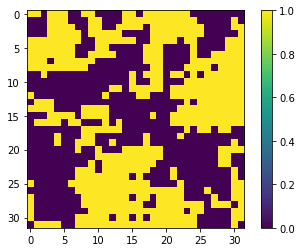

In [302]:
plt.imshow(y_testt_KPCA[350,:].detach().cpu().numpy().reshape([L,L]))
plt.colorbar()
plt.show()
plt.close()

In [303]:
calculate_energy(y_testt_KPCA[350,:].detach().cpu().numpy().reshape([L,L])*2-1)

-1064.0

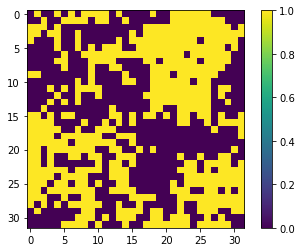

In [304]:
plt.imshow(y_predd_KPCA[350,:].detach().cpu().numpy().reshape([L,L]))
plt.colorbar()
plt.show()
plt.close()

In [305]:
calculate_energy(y_predd_KPCA[350,:].detach().cpu().numpy().astype(np.float32).reshape([L,L])*2-1)

-716.0

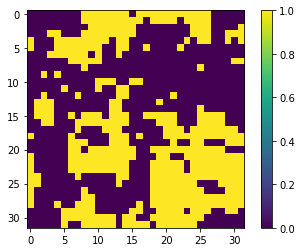

In [306]:
plt.imshow(y_test_KPCA[1000,:].detach().cpu().numpy().reshape([L,L]))
plt.colorbar()
plt.show()
plt.close()

In [307]:
calculate_energy(y_test_KPCA[1000,:].detach().cpu().numpy().reshape([L,L])*2-1)

-1172.0

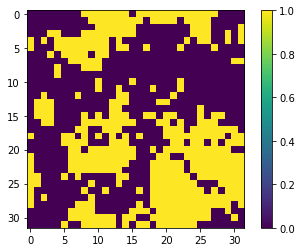

In [308]:
plt.imshow(y_pred_KPCA[1000,:].detach().cpu().numpy().reshape([L,L]))
plt.colorbar()
plt.show()
plt.close()

In [309]:
calculate_energy(y_pred_KPCA[1000,:].detach().cpu().numpy().astype(np.float32).reshape([L,L])*2-1)

-1044.0

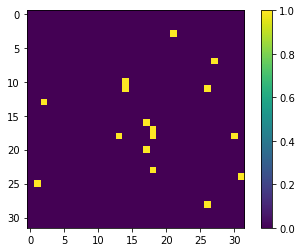

In [310]:
plt.imshow(y_train_KPCA[6,:].detach().cpu().numpy().reshape([L,L]))
plt.colorbar()
plt.show()
plt.close()

In [311]:
calculate_energy(y_train_KPCA[6,:].detach().cpu().numpy().reshape([L,L])*2-1)

-1928.0

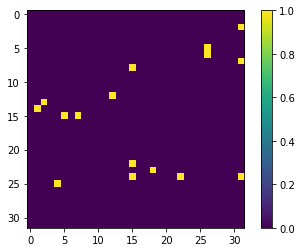

In [312]:
plt.imshow(y_pred_train_KPCA[6,:].detach().cpu().numpy().reshape([L,L]))
plt.colorbar()
plt.show()
plt.close()

In [313]:
calculate_energy(y_pred_train_KPCA[6,:].detach().cpu().numpy().astype(np.float32).reshape([L,L])*2-1)

-1924.0

In [774]:
colors = ["C0", "orange"]
from matplotlib.colors import LinearSegmentedColormap
n_bins = [1, 2]  # Discretizes the interpolation into bins
cmap_name = 'my_list'
cm = LinearSegmentedColormap.from_list(cmap_name, colors, N=2)

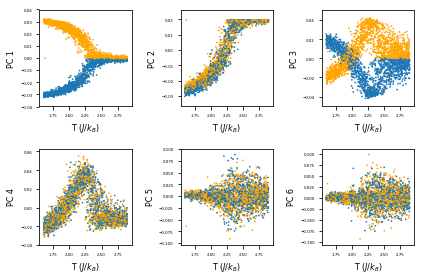

In [779]:
images = []
fig2, ax2 = plt.subplots(nrows=2, ncols=3)
images.append(ax2[0,0].scatter(temps_1, Y_KPCA[:,0], c=labels_test, s=0.5,cmap=cm))
ax2[0,0].set_xlabel(r'T ($J/k_B$)', fontsize=8)
ax2[0,0].set_ylabel('PC 1', fontsize=8)
ax2[0,0].tick_params(labelsize=4)
images.append(ax2[0,1].scatter(temps_1, Y_KPCA[:,1], c=labels_test, s=0.5,cmap=cm))
ax2[0,1].set_xlabel(r'T ($J/k_B$)', fontsize=8)
ax2[0,1].set_ylabel('PC 2', fontsize=8)
ax2[0,1].tick_params(labelsize=4)
images.append(ax2[0,2].scatter(temps_1, Y_KPCA[:,2], c=labels_test, s=0.5,cmap=cm))
ax2[0,2].set_xlabel(r'T ($J/k_B$)', fontsize=8)
ax2[0,2].set_ylabel('PC 3', fontsize=8)
ax2[0,2].tick_params(labelsize=4)
images.append(ax2[1,0].scatter(temps_1, Y_KPCA[:,3], c=labels_test, s=0.5,cmap=cm))
ax2[1,0].set_xlabel(r'T ($J/k_B$)', fontsize=8)
ax2[1,0].set_ylabel('PC 4', fontsize=8)
ax2[1,0].tick_params(labelsize=4)
images.append(ax2[1,1].scatter(temps_1, Y_KPCA[:,4], c=labels_test, s=0.5,cmap=cm))
ax2[1,1].set_xlabel(r'T ($J/k_B$)', fontsize=8)
ax2[1,1].set_ylabel('PC 5', fontsize=8)
ax2[1,1].tick_params(labelsize=4)
images.append(ax2[1,2].scatter(temps_1, Y_KPCA[:,5], c=labels_test, s=0.5,cmap=cm))
ax2[1,2].set_xlabel(r'T ($J/k_B$)', fontsize=8)
ax2[1,2].set_ylabel('PC 6', fontsize=8)
ax2[1,2].tick_params(labelsize=4)
# plt.gca().set_aspect('equal', adjustable='box')
fig2.tight_layout()
# fig2.colorbar(images[0], ax=ax2, orientation='vertical', fraction=.1)
plt.savefig('KPCs_vs_T_Ising.png',dpi=300)
plt.show()
plt.close()

# VAE analysis

In [120]:
t_VAE = 28
net_VAE = MLPVAE(1,L,t_VAE,mode='discrete')
losses_VAE = []
alpha_VAE = 0.125*1.0

In [69]:
net_VAE.optimizer = optim.SGD(net_VAE.parameters(), lr = 3e-3, momentum=0.9)
net_VAE.batch_size = 20
net_VAE.num_epochs = 1
for j in range(0, 40):
    print("Iter "+str(j+1))
    losses_VAE.append(net_VAE.train(dataset_torch, alpha=alpha_VAE))

Iter 1
[0/1][0/330]	Loss: 1.025511
[0/1][200/330]	Loss: 0.978545
Iter 2
[0/1][0/330]	Loss: 0.945511
[0/1][200/330]	Loss: 0.934337
Iter 3
[0/1][0/330]	Loss: 0.953116
[0/1][200/330]	Loss: 0.942880
Iter 4
[0/1][0/330]	Loss: 0.968557
[0/1][200/330]	Loss: 0.975870
Iter 5
[0/1][0/330]	Loss: 0.976901
[0/1][200/330]	Loss: 0.937201
Iter 6
[0/1][0/330]	Loss: 0.963781
[0/1][200/330]	Loss: 0.939399
Iter 7
[0/1][0/330]	Loss: 0.901676
[0/1][200/330]	Loss: 0.937948
Iter 8
[0/1][0/330]	Loss: 0.922078
[0/1][200/330]	Loss: 0.934154
Iter 9
[0/1][0/330]	Loss: 0.954403
[0/1][200/330]	Loss: 0.961287
Iter 10
[0/1][0/330]	Loss: 0.921106
[0/1][200/330]	Loss: 0.942113


KeyboardInterrupt: 

In [122]:
# torch.save(net_VAE.state_dict(), 'net_VAE_state_dict.pt')
# torch.save(net_VAE.optimizer.state_dict(), 'net_VAE_optimizer_state_dict.pt')
net_VAE.load_state_dict(torch.load('net_VAE_state_dict.pt'))
net_VAE.optimizer.load_state_dict(torch.load('net_VAE_optimizer_state_dict.pt'))
# net_VAE.eval()
# net_VAE.optimizer.eval()

In [123]:
z_noise, z, _ = net_VAE.forward_z(dataset_torch.cuda())
Y_VAE = z.cpu().detach().numpy()
Y_VAE_noise = z_noise.cpu().detach().numpy()
ordered_Y_VAE = Y_VAE[:,np.flip(np.argsort(Y_VAE.std(0)))]

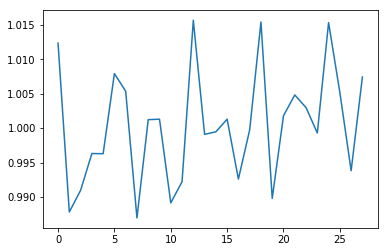

In [124]:
plt.plot(Y_VAE_noise.std(0))
plt.show()
plt.close()

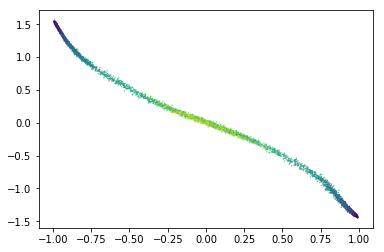

In [125]:
fig = plt.figure()
plt.scatter(magnetizations, ordered_Y_VAE[:,0], c = temps, s = 0.1)
plt.show()
plt.close()

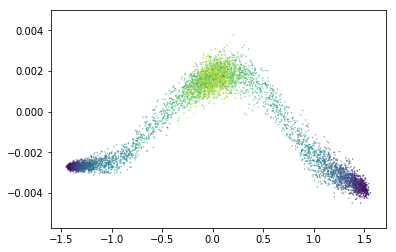

In [126]:
fig = plt.figure()
plt.scatter(ordered_Y_VAE[:nSamples,0], ordered_Y_VAE[:nSamples,12], c = temps, s = 0.1)
plt.show()
plt.close()

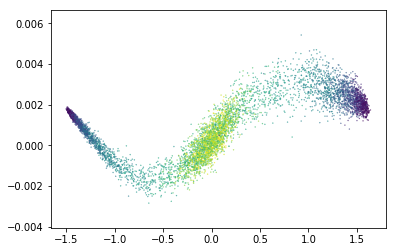

In [74]:
fig = plt.figure()
plt.scatter(ordered_Y_VAE[:nSamples,0], ordered_Y_VAE[:nSamples,26], c = temps, s = 0.1)
plt.show()
plt.close()

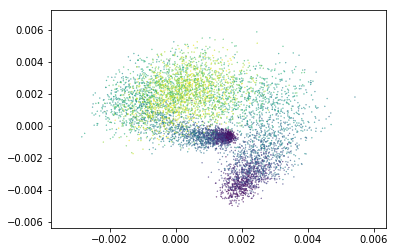

In [75]:
fig = plt.figure()
plt.scatter(ordered_Y_VAE[:nSamples,26], ordered_Y_VAE[:nSamples,21], c = temps, s = 0.1)
plt.show()
plt.close()

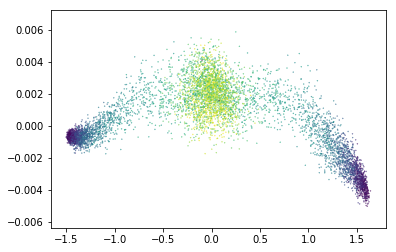

In [76]:
fig = plt.figure()
plt.scatter(ordered_Y_VAE[:nSamples,0], ordered_Y_VAE[:nSamples,21], c = temps, s = 0.1)
plt.show()
plt.close()

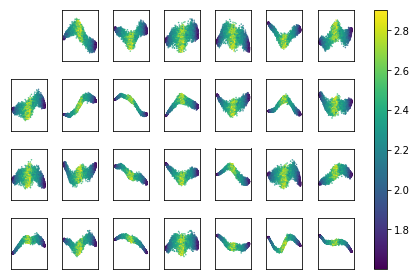

In [709]:
images = []
fig2, ax2 = plt.subplots(nrows=4, ncols=7)
for r in range(0,4):
    for c in range(0,7):
        if c+r != 0:
            images.append(ax2[r,c].scatter(ordered_Y_VAE[:,0], ordered_Y_VAE[:,r*7+c], c=temps, s=0.2))
#             ax2[r,c].set_xlabel('LV 1', fontsize=5)
#             ax2[r,c].set_ylabel('LV '+str(r*7+c+1), fontsize=5)
            ax2[r,c].tick_params(bottom=False, labelbottom=False, left=False, labelleft=False)
fig2.delaxes(ax2[0,0])
fig2.tight_layout()
fig2.colorbar(images[0], ax=ax2, orientation='vertical', fraction=.1)
plt.savefig('VAELVs_Ising_2.png',dpi=500)
plt.show()
plt.close()

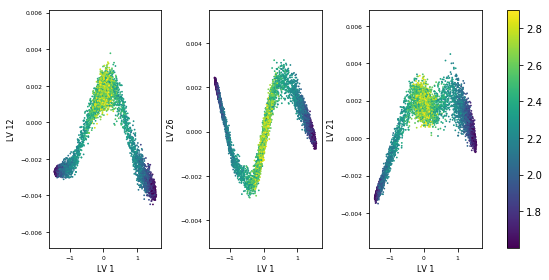

In [713]:
images = []
fig2, ax2 = plt.subplots(nrows=1, ncols=3, figsize=(8,4))
images.append(ax2[0].scatter(ordered_Y_VAE[:,0], ordered_Y_VAE[:,12], c=temps, s=0.6))
ax2[0].set_xlabel('LV 1', fontsize=8)
ax2[0].set_ylabel('LV 12', fontsize=8)
ax2[0].tick_params(labelsize=6)
images.append(ax2[1].scatter(ordered_Y_VAE[:,0], ordered_Y_VAE[:,26], c=temps, s=0.6))
ax2[1].set_xlabel('LV 1', fontsize=8)
ax2[1].set_ylabel('LV 26', fontsize=8)
ax2[1].tick_params(labelsize=6)
images.append(ax2[2].scatter(ordered_Y_VAE[:,0], ordered_Y_VAE[:,21], c=temps, s=0.6))
ax2[2].set_xlabel('LV 1', fontsize=8)
ax2[2].set_ylabel('LV 21', fontsize=8)
ax2[2].tick_params(labelsize=6)
# plt.gca().set_aspect('equal', adjustable='box')
fig2.tight_layout()
fig2.colorbar(images[0], ax=ax2, orientation='vertical', fraction=.1)
plt.savefig('VAELVs_Ising_selection.png',dpi=300)
plt.show()
plt.close()

In [127]:
Y_VAE_new = torch.randn([nSamples,t_VAE]).cuda()
X_VAE = net_VAE.decode(Y_VAE_new).detach().cpu().numpy()
r = np.random.rand(*X_VAE.shape)
X_VAE = X_VAE > r
X_VAE = 2*X_VAE - 1

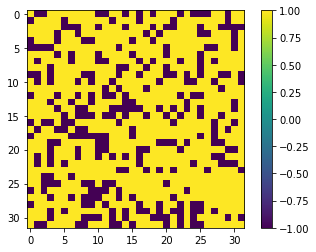

In [128]:
plt.imshow(X_VAE[1200,:].reshape([L,L]))
plt.colorbar()
plt.show()
plt.close()

In [129]:
energies_VAE = np.zeros([nSamples,1])
for sample in range(0,nSamples):
    configuration = X_VAE[sample,:].reshape([L,L])
    energies_VAE[sample,0] = calculate_energy(configuration)

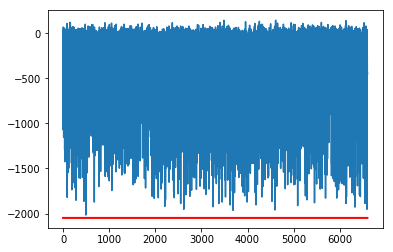

In [130]:
plt.plot(energies_VAE)
plt.plot(np.ones(nSamples)*min_energy,'r',linewidth=2)
plt.show()
plt.close()

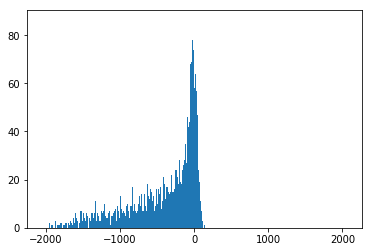

In [131]:
plt.hist(energies_VAE, bins=energy_bins)
plt.show()
plt.close()

In [68]:
conditional_loglikelihoods_VAE = logsumexp(-energies_VAE/sample_temps.reshape(-1) - sample_logZ, axis=1)
loglikelihood_VAE = (conditional_loglikelihoods_VAE + np.log(1/nTemps)).sum()

In [608]:
print("LogL VAE: %.6e" % loglikelihood_VAE)

LogL VAE: -3.563107e+06


In [10]:
fig, ax = plt.subplots((latent_vars+1)//2,2)
for i in range(0,latent_vars):
    if latent_vars > 2:
        im = ax[i%(latent_vars//2),0+2*(i//(latent_vars//2))].scatter(latents[:,i], 2*magnetisms-1, c = temps, s = 0.1)
        im = ax[i%(latent_vars//2),1+2*(i//(latent_vars//2))].scatter(latents[:,i], temps, c = temps, s = 0.1)
        ax[i%(latent_vars//2),0+2*(i//(latent_vars//2))].tick_params(labelsize = 3.5)
        ax[i%(latent_vars//2),1+2*(i//(latent_vars//2))].tick_params(labelsize = 3.5)
    elif latent_vars == 2:
        im = ax[0+2*(i//(latent_vars//2))].scatter(latents[:,i], 2*magnetisms-1, c = temps, s = 0.1)
        im = ax[1+2*(i//(latent_vars//2))].scatter(latents[:,i], temps, c = temps, s = 0.1)
        ax[0+2*(i//(latent_vars//2))].tick_params(labelsize = 3.5)
        ax[1+2*(i//(latent_vars//2))].tick_params(labelsize = 3.5)
    elif latent_vars == 1:
        im = ax[0].scatter(latents[:,i], 2*magnetisms-1, c = temps, s = 0.1)
        im = ax[1].scatter(latents[:,i], temps, c = temps, s = 0.1)
        ax[0].tick_params(labelsize = 3.5)
        ax[1].tick_params(labelsize = 3.5)
plt.tight_layout()
fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.9, 0.1, 0.02, 0.85]) # left, bottom, width, height
cb = fig.colorbar(im, cax=cbar_ax)
cb.ax.tick_params(labelsize = 5)
plt.savefig('VAE_latent_params_01.jpg', dpi = 500)
plt.close()

In [137]:
t_VAE_2 = 28
net_VAE_2 = MLPVAE(1,L,t_VAE_2,mode='discrete')
losses_VAE_2 = []
alpha_VAE_2 = 0.125*0.5

In [138]:
net_VAE_2.optimizer = optim.SGD(net_VAE_2.parameters(), lr = 5e-4, momentum=0.95)
# net_VAE_2.batch_size = 50
for j in range(0, 10):
    losses_VAE_2.append(net_VAE_2.train(dataset_torch, alpha=alpha_VAE_2))

[0/100][0/132]	Loss: 1.386292
[20/100][0/132]	Loss: 1.386274
[40/100][0/132]	Loss: 1.386231
[60/100][0/132]	Loss: 1.386280
[80/100][0/132]	Loss: 1.386242
[0/100][0/132]	Loss: 1.386241
[20/100][0/132]	Loss: 1.386245
[40/100][0/132]	Loss: 1.386203
[60/100][0/132]	Loss: 1.386174
[80/100][0/132]	Loss: 1.386203
[0/100][0/132]	Loss: 1.386210
[20/100][0/132]	Loss: 1.386188
[40/100][0/132]	Loss: 1.386212
[60/100][0/132]	Loss: 1.386132
[80/100][0/132]	Loss: 1.386161
[0/100][0/132]	Loss: 1.386160
[20/100][0/132]	Loss: 1.386195
[40/100][0/132]	Loss: 1.386127
[60/100][0/132]	Loss: 1.386130
[80/100][0/132]	Loss: 1.386153
[0/100][0/132]	Loss: 1.386185
[20/100][0/132]	Loss: 1.386173
[40/100][0/132]	Loss: 1.386149
[60/100][0/132]	Loss: 1.386174
[80/100][0/132]	Loss: 1.386137
[0/100][0/132]	Loss: 1.386180
[20/100][0/132]	Loss: 1.386127
[40/100][0/132]	Loss: 1.386058
[60/100][0/132]	Loss: 1.386106
[80/100][0/132]	Loss: 1.386068
[0/100][0/132]	Loss: 1.386211
[20/100][0/132]	Loss: 1.386153
[40/100][0/132]

In [139]:
z_noise_2, z_2, _ = net_VAE_2.forward_z(dataset_torch.cuda())
Y_VAE_2 = z_2.detach().cpu().numpy()
Y_VAE_noise_2 = z_noise_2.detach().cpu().numpy()
ordered_Y_VAE_2 = Y_VAE_2[:,np.flip(np.argsort(Y_VAE_2.std(0)))]

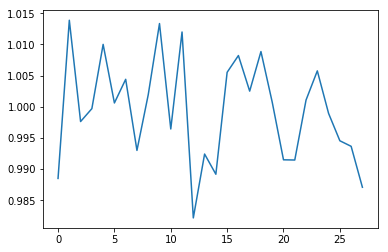

In [140]:
plt.plot(Y_VAE_noise_2.std(0))
plt.show()
plt.close()

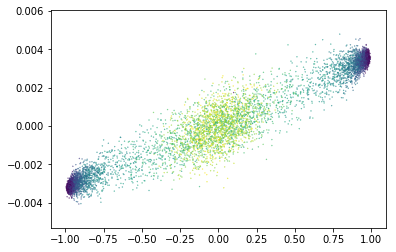

In [141]:
fig = plt.figure()
plt.scatter(magnetizations, ordered_Y_VAE_2[:,0], c = temps, s = 0.1)
plt.show()
plt.close()

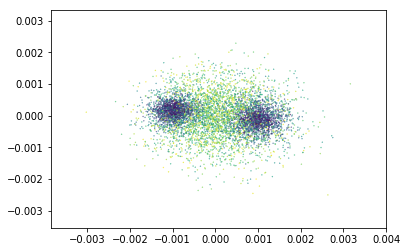

In [107]:
fig = plt.figure()
plt.scatter(ordered_Y_VAE_2[:,0], ordered_Y_VAE_2[:,19], c = temps, s = 0.1)
plt.show()
plt.close()

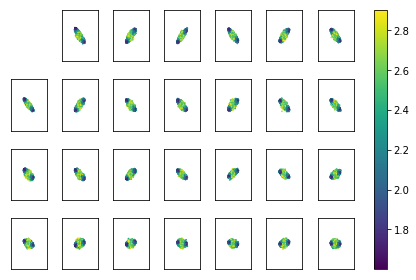

In [146]:
images = []
fig2, ax2 = plt.subplots(nrows=4, ncols=7)
for r in range(0,4):
    for c in range(0,7):
        if c+r != 0:
            images.append(ax2[r,c].scatter(ordered_Y_VAE_2[:,0], ordered_Y_VAE_2[:,r*7+c], c=temps, s=0.6))
#             ax2[r,c].set_xlabel('LV 1', fontsize=5)
#             ax2[r,c].set_ylabel('LV '+str(r*7+c+1), fontsize=5)
            ax2[r,c].tick_params(bottom=False, labelbottom=False, left=False, labelleft=False)
fig2.delaxes(ax2[0,0])
fig2.tight_layout()
fig2.colorbar(images[0], ax=ax2, orientation='vertical', fraction=.1)
# plt.savefig('VAELVs_Ising.png',dpi=500)
plt.show()
plt.close()

In [87]:
Y_VAE_new_2 = torch.randn([nSamples,t_VAE_2]).cuda()
X_VAE_2 = net_VAE_2.decode(Y_VAE_new_2).detach().cpu().numpy()
r = np.random.rand(*X_VAE_2.shape)
X_VAE_2 = X_VAE_2 > r
X_VAE_2 = 2*X_VAE_2 - 1

In [88]:
energies_VAE_2 = np.zeros([nSamples,1])
for sample in range(0,nSamples):
    configuration = X_VAE_2[sample,:].reshape([L,L])
    energies_VAE_2[sample,0] = calculate_energy(configuration)

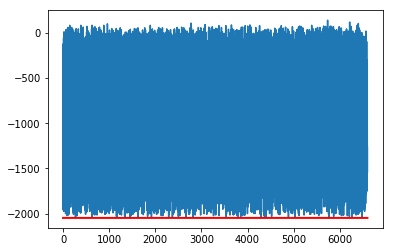

In [142]:
plt.plot(energies_VAE_2)
plt.plot(np.ones(nSamples)*min_energy,'r',linewidth=2)
plt.show()
plt.close()

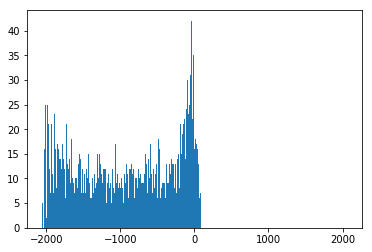

In [143]:
plt.hist(energies_VAE_2, bins=energy_bins)
plt.show()
plt.close()

In [170]:
conditional_loglikelihoods_VAE_2 = logsumexp(-energies_VAE_2/sample_temps.reshape(-1) - sample_logZ, axis=1)
loglikelihood_VAE_2 = (conditional_loglikelihoods_VAE_2 + np.log(1/nTemps)).sum()

In [171]:
print("LogL VAE: %.6e" % loglikelihood_VAE_2)

LogL VAE: -2.422165e+06


In [109]:
t_VAE_3 = 6
net_VAE_3 = MLPVAE(1,L,t_VAE_3,mode='discrete')
losses_VAE_3 = []
alpha_VAE_3 = 0.125*1.0

In [110]:
net_VAE_3.optimizer = optim.SGD(net_VAE_3.parameters(), lr = 5e-3, momentum=0.95)
net_VAE_3.batch_size = 40
for j in range(0, 2):
    losses_VAE_3.append(net_VAE_3.train(dataset_torch, alpha=alpha_VAE_3))

[0/100][0/165]	Loss: 1.386350
[20/100][0/165]	Loss: 1.386167
[40/100][0/165]	Loss: 1.386180
[60/100][0/165]	Loss: 1.386150
[80/100][0/165]	Loss: 1.386388
[0/100][0/165]	Loss: 1.386141
[20/100][0/165]	Loss: 1.383108
[40/100][0/165]	Loss: 1.148813
[60/100][0/165]	Loss: 1.023181
[80/100][0/165]	Loss: 1.034707


In [111]:
z_noise_3, z_3, _ = net_VAE_3.forward_z(dataset_torch.cuda())
Y_VAE_3 = z_3.detach().cpu().numpy()
Y_VAE_noise_3 = z_noise_3.detach().cpu().numpy()
ordered_Y_VAE_3 = Y_VAE_3[:,np.flip(np.argsort(Y_VAE_3.std(0)))]

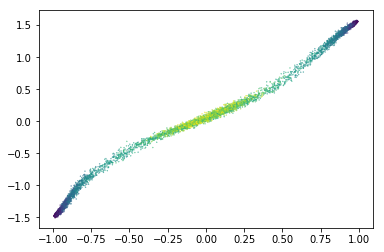

In [112]:
fig = plt.figure()
plt.scatter(magnetizations, ordered_Y_VAE_3[:,0], c = temps, s = 0.1)
plt.show()
plt.close()

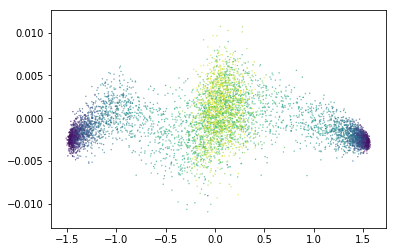

In [113]:
fig = plt.figure()
plt.scatter(ordered_Y_VAE_3[:,0], ordered_Y_VAE_3[:,5], c = temps, s = 0.1)
plt.show()
plt.close()

In [114]:
Y_VAE_new_3 = torch.randn([nSamples,t_VAE_3]).cuda()
X_VAE_3 = net_VAE_3.decode(Y_VAE_new_3).detach().cpu().numpy()
r = np.random.rand(*X_VAE_3.shape)
X_VAE_3 = X_VAE_3 > r
X_VAE_3 = 2*X_VAE_3 - 1

In [115]:
energies_VAE_3 = np.zeros([nSamples,1])
for sample in range(0,nSamples):
    configuration = X_VAE_3[sample,:].reshape([L,L])
    energies_VAE_3[sample,0] = calculate_energy(configuration)

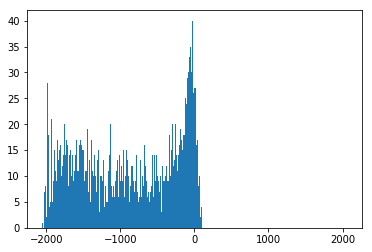

In [116]:
plt.hist(energies_VAE_3, bins=energy_bins)
plt.show()
plt.close()

In [144]:
pE_VAE_2 = np.histogram(energies_VAE_2, bins=energy_bins.reshape(-1))[0]/nSamples
KLdiv_VAE_2 = kl_div(pE_VAE_2, pE).sum()

pE_VAE_3 = np.histogram(energies_VAE_3, bins=energy_bins.reshape(-1))[0]/nSamples
KLdiv_VAE_3 = kl_div(pE_VAE_3, pE).sum()

In [145]:
print(KLdiv_VAE_2)
print(KLdiv_VAE_3)

34.55793907698766
35.29774453472857


In [ ]:
print(KLdiv_VAE_2)
print(KLdiv_VAE_3)

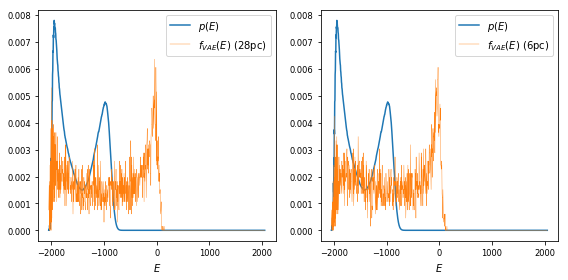

In [119]:
images = []
fig2, ax2 = plt.subplots(nrows=1, ncols=2, figsize=(8,4))
images.append(ax2[0].plot(energy_vector, pE, label='$p(E)$'))
images.append(ax2[0].plot(energy_vector, pE_VAE_2, linewidth=0.4, label=r'$f_{VAE}(E)$ (28pc)'))
ax2[0].set_xlabel('$E$')
# ax2[0].set_ylabel('$p(E)$')
ax2[0].legend()
ax2[0].tick_params(labelsize='small')
images.append(ax2[1].plot(energy_vector, pE, label='$p(E)$'))
images.append(ax2[1].plot(energy_vector, pE_VAE_3, linewidth=0.4, label=r'$f_{VAE}(E)$ (6pc)'))
ax2[1].set_xlabel('$E$')
# ax2[1].set_ylim(-0.0005,0.011)
# ax2[1].set_ylabel('$p(E)$')
ax2[1].legend()
ax2[1].tick_params(labelsize='small')
# plt.gca().set_aspect('equal', adjustable='box')
fig2.tight_layout()
plt.savefig('pE_VAE_2.png',dpi=500)
plt.show()
plt.close()

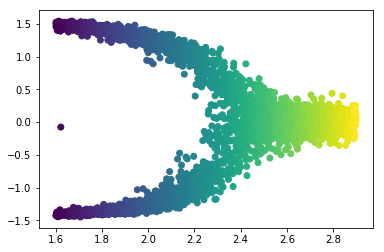

In [274]:
plt.scatter(temps, ordered_Y_VAE[:nSamples,0], c=temps)
plt.show()
plt.close()

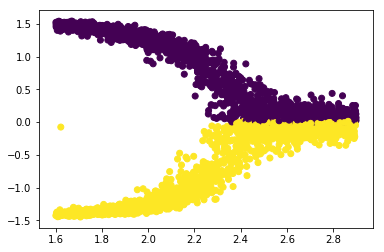

In [321]:
plt.scatter(temps, ordered_Y_VAE[:nSamples,0], c=labels_test)
plt.show()
plt.close()

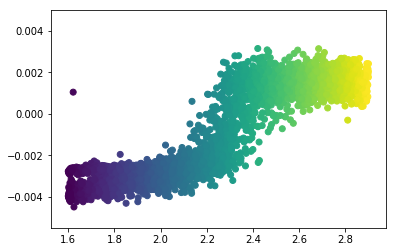

In [279]:
plt.scatter(temps, ordered_Y_VAE[:nSamples,12], c=temps)
plt.ylim(-0.0055,0.005)
plt.show()
plt.close()

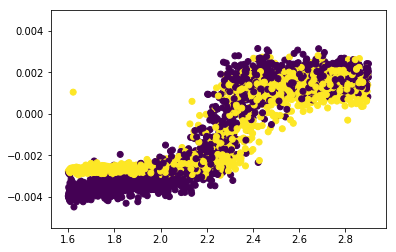

In [322]:
plt.scatter(temps, ordered_Y_VAE[:nSamples,12], c=labels_test)
plt.ylim(-0.0055,0.005)
plt.show()
plt.close()

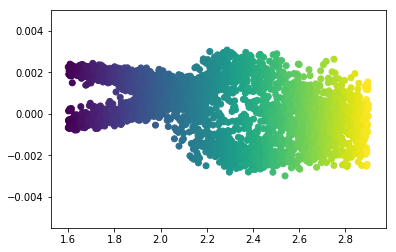

In [282]:
plt.scatter(temps, ordered_Y_VAE[:nSamples,26], c=temps)
plt.ylim(-0.0055,0.005)
plt.show()
plt.close()

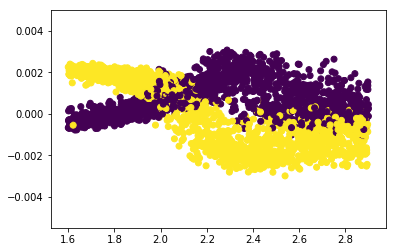

In [323]:
plt.scatter(temps, ordered_Y_VAE[:nSamples,26], c=labels_test)
plt.ylim(-0.0055,0.005)
plt.show()
plt.close()

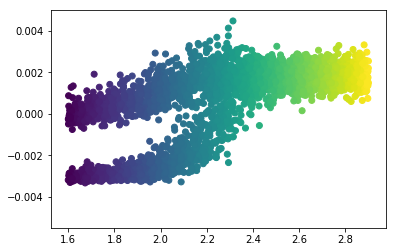

In [281]:
plt.scatter(temps, ordered_Y_VAE[:nSamples,21], c=temps)
plt.ylim(-0.0055,0.005)
plt.show()
plt.close()

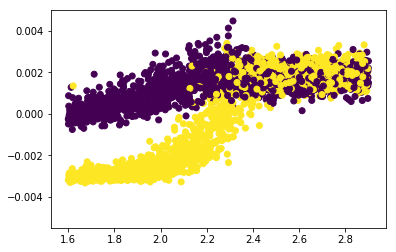

In [324]:
plt.scatter(temps, ordered_Y_VAE[:nSamples,21], c=labels_test)
plt.ylim(-0.0055,0.005)
plt.show()
plt.close()

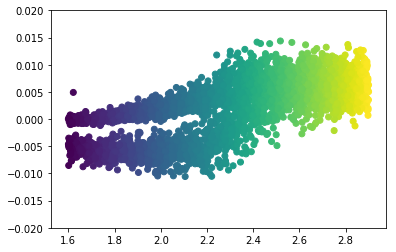

In [286]:
plt.scatter(temps, ordered_Y_VAE[:nSamples,1], c=temps)
plt.ylim(-0.02,0.02)
plt.show()
plt.close()

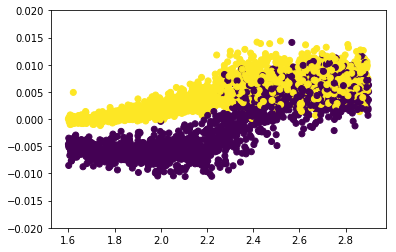

In [325]:
plt.scatter(temps, ordered_Y_VAE[:nSamples,1], c=labels_test)
plt.ylim(-0.02,0.02)
plt.show()
plt.close()

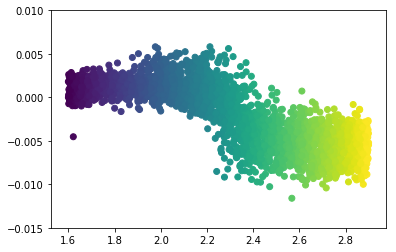

In [287]:
plt.scatter(temps, ordered_Y_VAE[:nSamples,2], c=temps)
plt.ylim(-0.015,0.01)
plt.show()
plt.close()

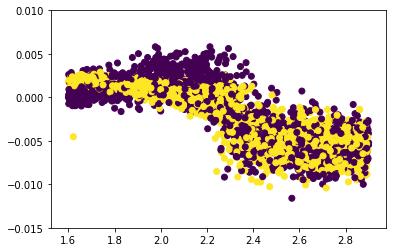

In [326]:
plt.scatter(temps, ordered_Y_VAE[:nSamples,2], c=labels_test)
plt.ylim(-0.015,0.01)
plt.show()
plt.close()

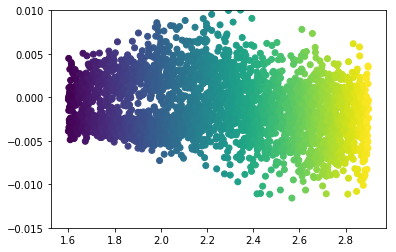

In [288]:
plt.scatter(temps, ordered_Y_VAE[:nSamples,3], c=temps)
plt.ylim(-0.015,0.01)
plt.show()
plt.close()

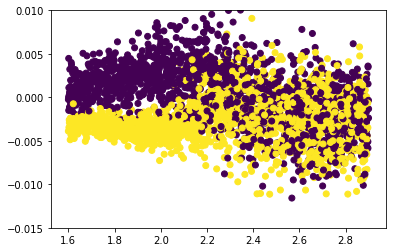

In [327]:
plt.scatter(temps, ordered_Y_VAE[:nSamples,3], c=labels_test)
plt.ylim(-0.015,0.01)
plt.show()
plt.close()

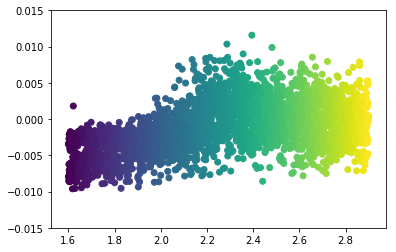

In [291]:
plt.scatter(temps, ordered_Y_VAE[:nSamples,4], c=temps)
plt.ylim(-0.015,0.015)
plt.show()
plt.close()

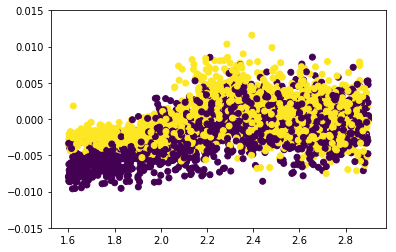

In [330]:
plt.scatter(temps, ordered_Y_VAE[:nSamples,4], c=labels_test)
plt.ylim(-0.015,0.015)
plt.show()
plt.close()

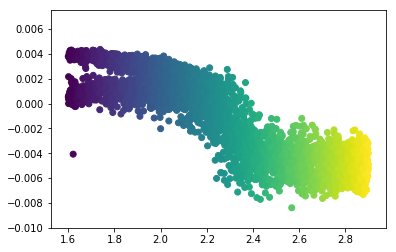

In [295]:
plt.scatter(temps, ordered_Y_VAE[:nSamples,5], c=temps)
plt.ylim(-0.01,0.0075)
plt.show()
plt.close()

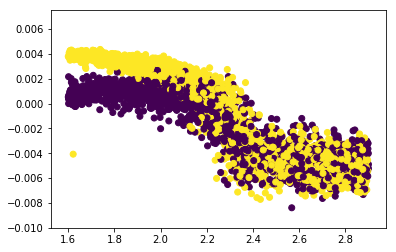

In [331]:
plt.scatter(temps, ordered_Y_VAE[:nSamples,5], c=labels_test)
plt.ylim(-0.01,0.0075)
plt.show()
plt.close()

# AE analysis

In [402]:
t_AE = 10
net_AE = MLPAE(1,L,t_AE,mode='discrete')
losses_AE = []

In [403]:
net_AE.optimizer = optim.SGD(net_AE.parameters(), lr=5e-4, momentum=0.9)
for j in range(0, 20):
    losses_AE.append(net_AE.train(dataset_torch))

[0/100][0/132]	Loss: 0.693650
[20/100][0/132]	Loss: 0.693541
[40/100][0/132]	Loss: 0.693449
[60/100][0/132]	Loss: 0.693338
[80/100][0/132]	Loss: 0.693187
[0/100][0/132]	Loss: 0.692977
[20/100][0/132]	Loss: 0.692651
[40/100][0/132]	Loss: 0.692119
[60/100][0/132]	Loss: 0.691120
[80/100][0/132]	Loss: 0.688184
[0/100][0/132]	Loss: 0.669871
[20/100][0/132]	Loss: 0.626109
[40/100][0/132]	Loss: 0.611370
[60/100][0/132]	Loss: 0.604156


KeyboardInterrupt: 

In [404]:
Y_AE = net_AE.encode(dataset_torch.cuda()).cpu().detach().numpy()
ordered_Y_AE = Y_AE[:,np.flip(np.argsort(Y_AE.std(0)))]

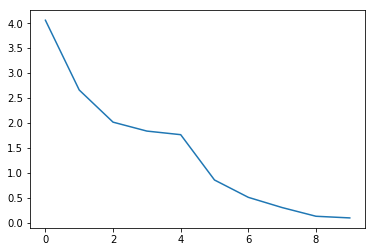

In [405]:
plt.plot(ordered_Y_AE.std(0))
plt.show()
plt.close()

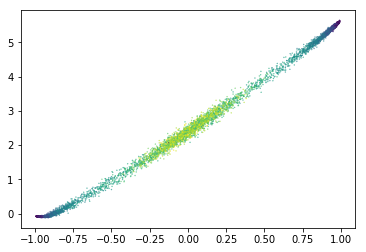

In [406]:
fig = plt.figure()
plt.scatter(magnetizations, ordered_Y_AE[:,2], c = temps, s = 0.1)
plt.show()
plt.close()

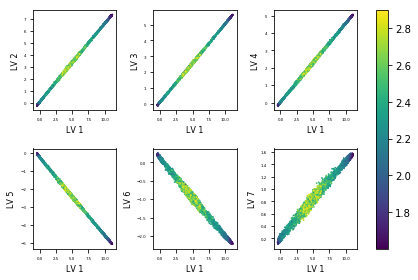

In [407]:
images = []
fig2, ax2 = plt.subplots(nrows=2, ncols=3)
images.append(ax2[0,0].scatter(ordered_Y_AE[:,0], ordered_Y_AE[:,1], c=temps, s=0.6))
ax2[0,0].set_xlabel('LV 1', fontsize=8)
ax2[0,0].set_ylabel('LV 2', fontsize=8)
ax2[0,0].tick_params(labelsize=4)
images.append(ax2[0,1].scatter(ordered_Y_AE[:,0], ordered_Y_AE[:,2], c=temps, s=0.6))
ax2[0,1].set_xlabel('LV 1', fontsize=8)
ax2[0,1].set_ylabel('LV 3', fontsize=8)
ax2[0,1].tick_params(labelsize=4)
images.append(ax2[0,2].scatter(ordered_Y_AE[:,0], ordered_Y_AE[:,3], c=temps, s=0.6))
ax2[0,2].set_xlabel('LV 1', fontsize=8)
ax2[0,2].set_ylabel('LV 4', fontsize=8)
ax2[0,2].tick_params(labelsize=4)
images.append(ax2[1,0].scatter(ordered_Y_AE[:,0], ordered_Y_AE[:,4], c=temps, s=0.6))
ax2[1,0].set_xlabel('LV 1', fontsize=8)
ax2[1,0].set_ylabel('LV 5', fontsize=8)
ax2[1,0].tick_params(labelsize=4)
images.append(ax2[1,1].scatter(ordered_Y_AE[:,0], ordered_Y_AE[:,5], c=temps, s=0.6))
ax2[1,1].set_xlabel('LV 1', fontsize=8)
ax2[1,1].set_ylabel('LV 6', fontsize=8)
ax2[1,1].tick_params(labelsize=4)
images.append(ax2[1,2].scatter(ordered_Y_AE[:,0], ordered_Y_AE[:,6], c=temps, s=0.6))
ax2[1,2].set_xlabel('LV 1', fontsize=8)
ax2[1,2].set_ylabel('LV 7', fontsize=8)
ax2[1,2].tick_params(labelsize=4)
# plt.gca().set_aspect('equal', adjustable='box')
fig2.tight_layout()
fig2.colorbar(images[0], ax=ax2, orientation='vertical', fraction=.1)
plt.savefig('AELVs_Ising.png',dpi=300)
plt.show()
plt.close()

In [526]:
# fig, ax = plt.subplots((latent_vars+1)//2,2)
# for i in range(0,latent_vars):
#     if latent_vars > 2:
#         im = ax[i%(latent_vars//2),0+2*(i//(latent_vars//2))].scatter(latents2[:,i], 2*magnetisms-1, c = temps, s = 0.1)
#         im = ax[i%(latent_vars//2),1+2*(i//(latent_vars//2))].scatter(latents2[:,i], temps, c = temps, s = 0.1)
#         ax[i%(latent_vars//2),0+2*(i//(latent_vars//2))].tick_params(labelsize = 3.5)
#         ax[i%(latent_vars//2),1+2*(i//(latent_vars//2))].tick_params(labelsize = 3.5)
#     elif latent_vars == 2:
#         im = ax[0+2*(i//(latent_vars//2))].scatter(latents2[:,i], 2*magnetisms-1, c = temps, s = 0.1)
#         im = ax[1+2*(i//(latent_vars//2))].scatter(latents2[:,i], temps, c = temps, s = 0.1)
#         ax[0+2*(i//(latent_vars//2))].tick_params(labelsize = 3.5)
#         ax[1+2*(i//(latent_vars//2))].tick_params(labelsize = 3.5)
#     elif latent_vars == 1:
#         im = ax[0].scatter(latents2[:,i], 2*magnetisms-1, c = temps, s = 0.1)
#         im = ax[1].scatter(latents2[:,i], temps, c = temps, s = 0.1)
#         ax[0].tick_params(labelsize = 3.5)
#         ax[1].tick_params(labelsize = 3.5)
# plt.tight_layout()
# fig.subplots_adjust(right=0.85)
# cbar_ax = fig.add_axes([0.9, 0.1, 0.02, 0.85]) # left, bottom, width, height
# cb = fig.colorbar(im, cax=cbar_ax)
# cb.ax.tick_params(labelsize = 5)
# plt.savefig('AE_latent_params_01.jpg', dpi = 500)
# plt.close()

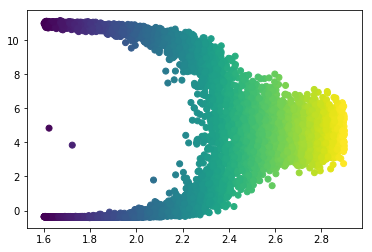

In [408]:
plt.scatter(temps, ordered_Y_AE[:nSamples,0], c=temps)
plt.show()
plt.close()

# Temperature analysis

In [211]:
class ExactGPModel(gpytorch.models.ExactGP):
    def __init__(self, train_x, train_y, likelihood):
        super(ExactGPModel, self).__init__(train_x, train_y, likelihood)
        self.mean_module = gpytorch.means.ConstantMean()
        self.covar_module = gpytorch.kernels.ScaleKernel(gpytorch.kernels.RBFKernel(eps=0.1), eps=0.1)

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)

## PCA

In [212]:
indices = np.arange(0,temps_1.shape[0])
indices_2 = np.arange(0,temps_2.shape[0])

class_1 = indices[labels_test > 0]
class_2 = indices[labels_test == 0]
class_1_2 = indices_2[labels_test_2 > 0]
class_2_2 = indices_2[labels_test_2 == 0]

In [213]:
order_train_1 = np.argsort(temps_1[class_1])
order_train_2 = np.argsort(temps_1[class_2])
# x_train_PCA_1 = torch.FloatTensor(np.sort(temps_1[class_1])).to(device)
# x_train_PCA_2 = torch.FloatTensor(np.sort(temps_1[class_2])).to(device)
x_train_PCA_1 = torch.FloatTensor(np.sort(temps_1[class_1]))
x_train_PCA_2 = torch.FloatTensor(np.sort(temps_1[class_2]))
order_test_1 = np.argsort(temps_2[class_1_2])
order_test_2 = np.argsort(temps_2[class_2_2])
# x_test_PCA_1 = torch.FloatTensor(np.sort(temps_2[class_1_2])).to(device)
# x_test_PCA_2 = torch.FloatTensor(np.sort(temps_2[class_2_2])).to(device)
x_test_PCA_1 = torch.FloatTensor(np.sort(temps_2[class_1_2]))
x_test_PCA_2 = torch.FloatTensor(np.sort(temps_2[class_2_2]))
y_train_PCA_1 = torch.FloatTensor(Y_PPCA[class_1[order_train_1],:]-Y_PPCA[class_1[order_train_1],:].mean(0))
y_train_PCA_2 = torch.FloatTensor(Y_PPCA[class_2[order_train_2],:]-Y_PPCA[class_2[order_train_2],:].mean(0))
y_test_PCA_1 = torch.FloatTensor(Y_PPCA_2[class_1_2[order_test_1],:]-Y_PPCA_2[class_1_2[order_test_1],:].mean(0))
y_test_PCA_2 = torch.FloatTensor(Y_PPCA_2[class_2_2[order_test_2],:]-Y_PPCA_2[class_2_2[order_test_2],:].mean(0))

In [214]:
likelihood_PCA_1 = gpytorch.likelihoods.GaussianLikelihood()
likelihood_PCA_2 = gpytorch.likelihoods.GaussianLikelihood()
model_PCA_1 = ExactGPModel(x_train_PCA_1, y_train_PCA_1[:,0], likelihood_PCA_1)
model_PCA_2 = ExactGPModel(x_train_PCA_2, y_train_PCA_2[:,0], likelihood_PCA_2)

In [215]:
model_PCA_1.train()
model_PCA_2.train()
likelihood_PCA_1.train()
likelihood_PCA_2.train()

optimizer_PCA_1 = torch.optim.Adam([{'params': model_PCA_1.parameters()},  # Includes GaussianLikelihood parameters
], lr=0.02)
optimizer_PCA_2 = torch.optim.Adam([{'params': model_PCA_2.parameters()},  # Includes GaussianLikelihood parameters
], lr=0.02)

mll_PCA_1 = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood_PCA_1, model_PCA_1)
mll_PCA_2 = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood_PCA_2, model_PCA_2)

for i in range(GP_training_iter_f_PCA):
    optimizer_PCA_1.zero_grad()
    optimizer_PCA_2.zero_grad()
    output_PCA_1 = model_PCA_1(x_train_PCA_1)
    output_PCA_2 = model_PCA_2(x_train_PCA_2)
    loss_PCA_1 = -mll_PCA_1(output_PCA_1, y_train_PCA_1[:,0])
    loss_PCA_2 = -mll_PCA_2(output_PCA_2, y_train_PCA_2[:,0])
    loss_PCA_1.backward()
    loss_PCA_2.backward()
    if (i+1) % 25 == 0:
        print('PCA1: Iter %d/%d - Loss: %.3f   lengthscale: %.3f   noise: %.3f' % (
            i + 1, GP_training_iter_f_PCA, loss_PCA_1.item(),
            model_PCA_1.covar_module.base_kernel.lengthscale.item(),
            model_PCA_1.likelihood.noise.item()
        ))
        print('PCA2: Iter %d/%d - Loss: %.3f   lengthscale: %.3f   noise: %.3f' % (
            i + 1, GP_training_iter_f_PCA, loss_PCA_2.item(),
            model_PCA_2.covar_module.base_kernel.lengthscale.item(),
            model_PCA_2.likelihood.noise.item()
        ))
    optimizer_PCA_1.step()
    optimizer_PCA_2.step()

PCA1: Iter 25/350 - Loss: 0.590   lengthscale: 0.504   noise: 0.481
PCA2: Iter 25/350 - Loss: 0.588   lengthscale: 0.505   noise: 0.481
PCA1: Iter 50/350 - Loss: 0.392   lengthscale: 0.371   noise: 0.314
PCA2: Iter 50/350 - Loss: 0.390   lengthscale: 0.381   noise: 0.315
PCA1: Iter 75/350 - Loss: 0.185   lengthscale: 0.277   noise: 0.198
PCA2: Iter 75/350 - Loss: 0.182   lengthscale: 0.308   noise: 0.199
PCA1: Iter 100/350 - Loss: -0.014   lengthscale: 0.259   noise: 0.123
PCA2: Iter 100/350 - Loss: -0.019   lengthscale: 0.285   noise: 0.124
PCA1: Iter 125/350 - Loss: -0.186   lengthscale: 0.229   noise: 0.078
PCA2: Iter 125/350 - Loss: -0.194   lengthscale: 0.267   noise: 0.078
PCA1: Iter 150/350 - Loss: -0.312   lengthscale: 0.223   noise: 0.052
PCA2: Iter 150/350 - Loss: -0.325   lengthscale: 0.253   noise: 0.051
PCA1: Iter 175/350 - Loss: -0.384   lengthscale: 0.212   noise: 0.037
PCA2: Iter 175/350 - Loss: -0.404   lengthscale: 0.254   noise: 0.036
PCA1: Iter 200/350 - Loss: -0.41

In [216]:
# Get into evaluation (predictive posterior) mode
model_PCA_1.eval()
model_PCA_2.eval()
likelihood_PCA_1.eval()
likelihood_PCA_2.eval()

# Make predictions by feeding model through likelihood
with torch.no_grad(), gpytorch.settings.fast_pred_var():
    observed_pred_PCA_1 = likelihood_PCA_1(model_PCA_1(x_test_PCA_1))
    observed_pred_PCA_2 = likelihood_PCA_2(model_PCA_2(x_test_PCA_2))

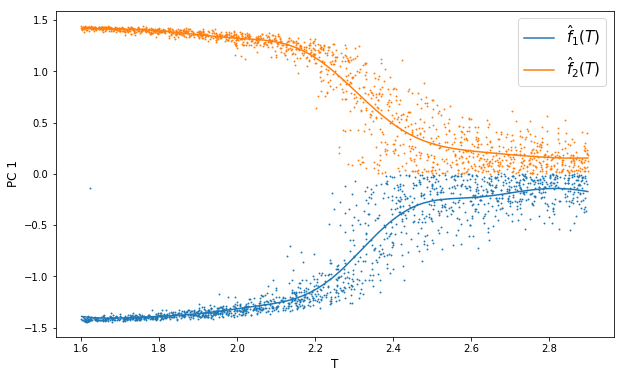

In [217]:
with torch.no_grad():
    f, ax = plt.subplots(1, 1, figsize=(10, 6))

#     # Get upper and lower confidence bounds
#     lower_PCA_1, upper_PCA_1 = observed_pred_PCA_1.confidence_region()
#     lower_PCA_2, upper_PCA_2 = observed_pred_PCA_2.confidence_region()
    
    ax.scatter(x_train_PCA_1.numpy(), y_train_PCA_1[:,0].numpy()+Y_PPCA[class_1,0].mean(0), s=0.8)
    ax.plot(x_test_PCA_1.numpy(), observed_pred_PCA_1.mean.numpy()+Y_PPCA[class_1,0].mean(0), label=r'$\hat{f}_1(T)$')
#     ax.fill_between(x_test_PCA_1.numpy(), lower_PCA_1.numpy()+P[class_1,0].mean(0), upper_PCA_1.numpy()+P[class_1,0].mean(0), alpha=0.5, label='Confidence 1')
    
    ax.scatter(x_train_PCA_2.numpy(), y_train_PCA_2[:,0].numpy()+Y_PPCA[class_2,0].mean(0), s=0.8)
    ax.plot(x_test_PCA_2.numpy(), observed_pred_PCA_2.mean.numpy()+Y_PPCA[class_2,0].mean(0), label=r'$\hat{f}_2(T)$')
#     ax.fill_between(x_test_PCA_2.numpy(), lower_PCA_2.numpy()+P[class_2,0].mean(0), upper_PCA_2.numpy()+P[class_2,0].mean(0), alpha=0.5, label='Confidence 2')    
    ax.set_xlabel('T', fontsize=12)
    ax.set_ylabel('PC 1', fontsize=12)
    ax.legend(fontsize=15)
    plt.savefig('Branch_Ising.png', dpi=300)
    plt.show()
    plt.close()

NameError: name 'curves_mu_PCA_1' is not defined

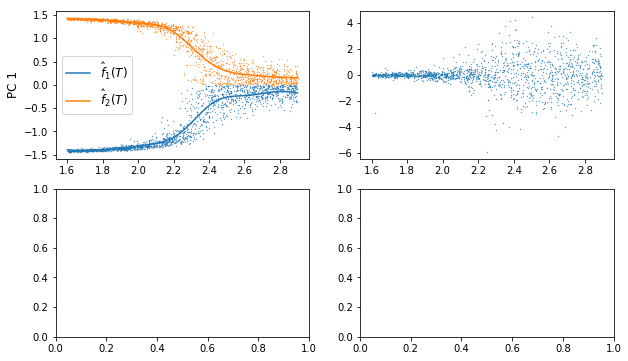

In [218]:
# images.append(ax2[0,0].scatter(Y_PPCA[:,0], Y_PPCA[:,1], c=temps_1, s=1))
# ax2[0,0].set_xlabel('PC 1')
# ax2[0,0].set_ylabel('PC 2')
# ax2[0,0].tick_params(labelsize='small')
# images.append(ax2[0,1].scatter(Y_PPCA[:,0], Y_PPCA[:,2], c=temps_1, s=1))
# ax2[0,1].set_xlabel('PC 1')
# ax2[0,1].set_ylabel('PC 3')
# ax2[0,1].tick_params(labelsize='small')
# images.append(ax2[1,0].scatter(Y_PPCA[:,0], Y_PPCA[:,3], c=temps_1, s=1))
# ax2[1,0].set_xlabel('PC 1')
# ax2[1,0].set_ylabel('PC 4')
# ax2[1,0].tick_params(labelsize='small')
# images.append(ax2[1,1].scatter(Y_PPCA[:,1], Y_PPCA[:,2], c=temps_1, s=1))
# ax2[1,1].set_xlabel('PC 2')
# ax2[1,1].set_ylabel('PC 3')
# ax2[1,1].tick_params(labelsize='small')


with torch.no_grad():
    f, ax = plt.subplots(2, 2, figsize=(10, 6))
    ax[0,0].scatter(x_train_PCA_1.numpy(), y_train_PCA_1[:,0].numpy()+Y_PPCA[class_1,0].mean(0), s=0.1)
    ax[0,0].plot(x_test_PCA_1.numpy(), observed_pred_PCA_1.mean.numpy()+Y_PPCA[class_1,0].mean(0), label=r'$\hat{f}_1(T)$')
    ax[0,0].scatter(x_train_PCA_2.numpy(), y_train_PCA_2[:,0].numpy()+Y_PPCA[class_2,0].mean(0), s=0.1)
    ax[0,0].plot(x_test_PCA_2.numpy(), observed_pred_PCA_2.mean.numpy()+Y_PPCA[class_2,0].mean(0), label=r'$\hat{f}_2(T)$')
    ax[0,0].set_ylabel('PC 1', fontsize=12)
    ax[0,0].legend(fontsize=12)
    
    ax[0,1].scatter(x_train_PCA_1.numpy(), y_train_PCA_1[:,1].numpy()+Y_PPCA[class_1,1].mean(0), s=0.1)
    ax[0,1].plot(x_test_PCA_1.numpy(), curves_mu_PCA_1[1].mean.numpy()+Y_PPCA[class_1,1].mean(0), label=r'$\hat{f}_1(T)$')
    ax[0,1].scatter(x_train_PCA_2.numpy(), y_train_PCA_2[:,1].numpy()+Y_PPCA[class_2,1].mean(0), s=0.1)
    ax[0,1].plot(x_test_PCA_2.numpy(), curves_mu_PCA_2[1].mean.numpy()+Y_PPCA[class_2,1].mean(0), label=r'$\hat{f}_2(T)$')
    ax[0,1].set_ylabel('PC 2', fontsize=12)
    ax[0,1].legend(fontsize=12)
    
   
    ax[1,0].scatter(x_test_PCA_1.numpy(), errors_PCA_1**2-errors_PCA_1.mean()**2, s=0.1)
    ax[1,0].plot(x_train_PCA_1.numpy(), observed_pred_PCA_1_error.mean.numpy(), label=r'$\hat{\sigma}_1^2(T)$')
    ax[1,0].scatter(clean_x_test_PCA_2.numpy(), clean_errors_PCA_2**2-clean_errors_PCA_2.mean()**2, s=0.1)
    ax[1,0].plot(clean_x_test_PCA_2.numpy(), clean_observed_pred_PCA_2_error_tr.mean.numpy(), label=r'$\hat{\sigma}_2^2(T)$')
    ax[1,0].set_xlabel('T', fontsize=12)
    ax[1,0].set_ylabel('$\epsilon^2$', fontsize=12)
    ax[1,0].legend(fontsize=12)
    
    ax[1,1].scatter(x_test_PCA_1.numpy(), e_PCA_1[1], s=0.1)
    ax[1,1].plot(x_train_PCA_1.numpy(), clean_PCA_1_error.mean.numpy(), label=r'$\hat{\sigma}_1^2(T)$')
    ax[1,1].scatter(clean_x_test_PCA_2.numpy(), e_PCA_2[1], s=0.1)
    ax[1,1].plot(clean_x_test_PCA_2.numpy(), clean_PCA_2_error.mean.numpy(), label=r'$\hat{\sigma}_2^2(T)$')
    ax[1,1].set_xlabel('T', fontsize=12)
    ax[1,1].set_ylabel('$\epsilon^2$', fontsize=12)
    ax[1,1].legend(fontsize=12)
    
    fig2.tight_layout()
    plt.savefig('Branch_Ising_PCA.png', dpi=300)
    plt.show()
    plt.close()

In [219]:
errors_PCA_1 = y_test_PCA_1[:,0] - observed_pred_PCA_1.mean
errors_PCA_2 = y_test_PCA_2[:,0] - observed_pred_PCA_2.mean

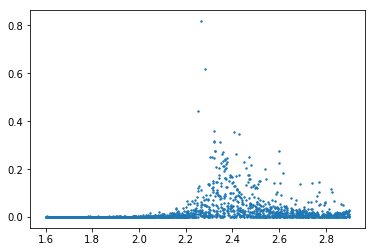

In [220]:
plt.scatter(temps_2[class_1_2[order_test_1]], errors_PCA_1**2-errors_PCA_1.mean()**2, s=2.0)
plt.show()
plt.close()

In [221]:
likelihood_PCA_1_error = gpytorch.likelihoods.GaussianLikelihood()
likelihood_PCA_2_error = gpytorch.likelihoods.GaussianLikelihood()
model_PCA_1_error = ExactGPModel(x_test_PCA_1, errors_PCA_1**2-errors_PCA_1.mean()**2, likelihood_PCA_1_error)
model_PCA_2_error = ExactGPModel(x_test_PCA_2, errors_PCA_2**2-errors_PCA_2.mean()**2, likelihood_PCA_2_error)

In [222]:
model_PCA_1_error.train()
model_PCA_2_error.train()
likelihood_PCA_1_error.train()
likelihood_PCA_2_error.train()

# Use the adam optimizer
optimizer_PCA_1_error = torch.optim.Adam([
    {'params': model_PCA_1_error.parameters()},  # Includes GaussianLikelihood parameters
], lr=0.1)
optimizer_PCA_2_error = torch.optim.Adam([
    {'params': model_PCA_2_error.parameters()},  # Includes GaussianLikelihood parameters
], lr=0.1)

# "Loss" for GPs - the marginal log likelihood
mll_PCA_1_error = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood_PCA_1_error, model_PCA_1_error)
mll_PCA_2_error = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood_PCA_2_error, model_PCA_2_error)

training_iter = 100
for i in range(training_iter):
    # Zero gradients from previous iteration
    optimizer_PCA_1_error.zero_grad()
    optimizer_PCA_2_error.zero_grad()
    # Output from model
    output_PCA_1_error = model_PCA_1_error(x_test_PCA_1)
    output_PCA_2_error = model_PCA_2_error(x_test_PCA_2)
    # Calc loss and backprop gradients
    loss_PCA_1_error = -mll_PCA_1_error(output_PCA_1_error, errors_PCA_1**2-errors_PCA_1.mean()**2)
    loss_PCA_2_error = -mll_PCA_2_error(output_PCA_2_error, errors_PCA_2**2-errors_PCA_2.mean()**2)
    loss_PCA_1_error.backward()
    loss_PCA_2_error.backward()
    if (i+1) % 20 == 0:
        print('PCA1: Iter %d/%d - Loss: %.3f   lengthscale: %.3f   noise: %.3f' % (
            i + 1, training_iter, loss_PCA_1_error.item(),
            model_PCA_1_error.covar_module.base_kernel.lengthscale.item(),
            model_PCA_1_error.likelihood.noise.item()
        ))
        print('PCA2: Iter %d/%d - Loss: %.3f   lengthscale: %.3f   noise: %.3f' % (
            i + 1, training_iter, loss_PCA_2_error.item(),
            model_PCA_2_error.covar_module.base_kernel.lengthscale.item(),
            model_PCA_2_error.likelihood.noise.item()
        ))
    optimizer_PCA_1_error.step()
    optimizer_PCA_2_error.step()

PCA1: Iter 20/100 - Loss: -0.067   lengthscale: 1.839   noise: 0.136
PCA2: Iter 20/100 - Loss: -0.056   lengthscale: 1.787   noise: 0.136
PCA1: Iter 40/100 - Loss: -1.014   lengthscale: 2.006   noise: 0.018
PCA2: Iter 40/100 - Loss: -0.933   lengthscale: 1.785   noise: 0.019
PCA1: Iter 60/100 - Loss: -1.627   lengthscale: 0.386   noise: 0.003
PCA2: Iter 60/100 - Loss: -1.261   lengthscale: 0.269   noise: 0.004
PCA1: Iter 80/100 - Loss: -1.671   lengthscale: 0.197   noise: 0.002
PCA2: Iter 80/100 - Loss: -1.265   lengthscale: 0.246   noise: 0.004
PCA1: Iter 100/100 - Loss: -1.689   lengthscale: 0.138   noise: 0.002
PCA2: Iter 100/100 - Loss: -1.270   lengthscale: 0.147   noise: 0.005


In [223]:
# Get into evaluation (predictive posterior) mode
model_PCA_1_error.eval()
model_PCA_2_error.eval()
likelihood_PCA_1_error.eval()
likelihood_PCA_2_error.eval()

# Test points are regularly spaced along [0,1]
# Make predictions by feeding model through likelihood
with torch.no_grad(), gpytorch.settings.fast_pred_var():
    observed_pred_PCA_1_error = likelihood_PCA_1_error(model_PCA_1_error(x_train_PCA_1))
    observed_pred_PCA_2_error = likelihood_PCA_2_error(model_PCA_2_error(x_train_PCA_2))

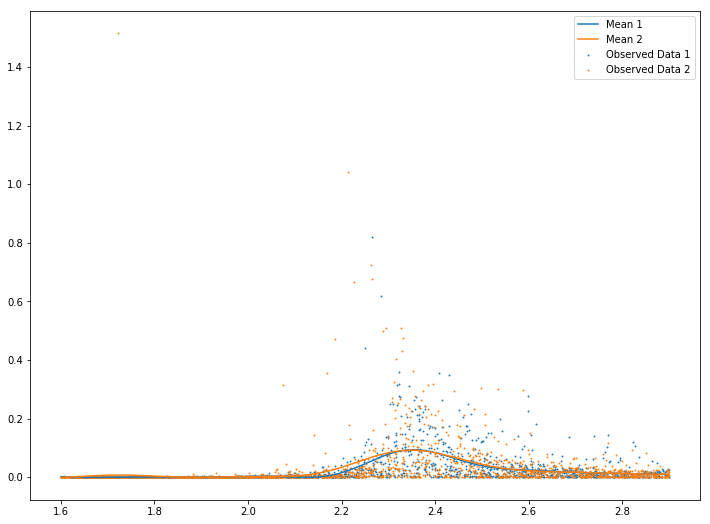

In [224]:
with torch.no_grad():
    # Initialize plot
    f, ax = plt.subplots(1, 1, figsize=(12, 9))

    # Get upper and lower confidence bounds
    lower_PCA_1_error, upper_PCA_1_error = observed_pred_PCA_1_error.confidence_region()
    lower_PCA_2_error, upper_PCA_2_error = observed_pred_PCA_2_error.confidence_region()
    ax.scatter(x_test_PCA_1.numpy(), errors_PCA_1**2-errors_PCA_1.mean()**2, s=0.8, label='Observed Data 1')
    ax.plot(x_train_PCA_1.numpy(), observed_pred_PCA_1_error.mean.numpy(), label='Mean 1')
#     ax.fill_between(x_train_PCA_1.numpy(), lower_PCA_1_error.numpy(), upper_PCA_1_error.numpy(), alpha=0.5, label='Confidence 1')
    
    ax.scatter(x_test_PCA_2.numpy(), errors_PCA_2**2-errors_PCA_2.mean()**2, s=0.8, label='Observed Data 2')
    ax.plot(x_train_PCA_2.numpy(), observed_pred_PCA_2_error.mean.numpy(), label='Mean 2')
#     ax.fill_between(x_train_PCA_2.numpy(), lower_PCA_2_error.numpy(), upper_PCA_2_error.numpy(), alpha=0.5, label='Confidence 2')    
    
    ax.legend()
    plt.show()
    plt.close()

In [225]:
outliers_PCA_2 = ((np.arange(0,class_2_2.shape[0]))[(errors_PCA_2**2--errors_PCA_2.mean()**2).numpy()>1.0]).astype(np.int32)

In [226]:
clean_x_test_PCA_2 = torch.cat([x_test_PCA_2[:outliers_PCA_2[0]], x_test_PCA_2[outliers_PCA_2[0]+1:outliers_PCA_2[1]], x_test_PCA_2[outliers_PCA_2[1]+1:]])
clean_y_test_PCA_2 = torch.cat([y_test_PCA_2[:outliers_PCA_2[0]], y_test_PCA_2[outliers_PCA_2[0]+1:outliers_PCA_2[1]], y_test_PCA_2[outliers_PCA_2[1]+1:]])

In [227]:
with torch.no_grad(), gpytorch.settings.fast_pred_var():
    clean_observed_pred_PCA_2 = likelihood_PCA_2(model_PCA_2(clean_x_test_PCA_2))

In [228]:
clean_errors_PCA_2 = (clean_y_test_PCA_2[:,0] - clean_observed_pred_PCA_2.mean)

In [229]:
clean_likelihood_PCA_2_error = gpytorch.likelihoods.GaussianLikelihood()
clean_model_PCA_2_error = ExactGPModel(clean_x_test_PCA_2, clean_errors_PCA_2**2-clean_errors_PCA_2.mean()**2, clean_likelihood_PCA_2_error)

In [230]:
clean_model_PCA_2_error.train()
clean_likelihood_PCA_2_error.train()

clean_optimizer_PCA_2_error = torch.optim.Adam([
    {'params': clean_model_PCA_2_error.parameters()},  # Includes GaussianLikelihood parameters
], lr=0.1)

# "Loss" for GPs - the marginal log likelihood
clean_mll_PCA_2_error = gpytorch.mlls.ExactMarginalLogLikelihood(clean_likelihood_PCA_2_error, clean_model_PCA_2_error)

training_iter = 100
for i in range(training_iter):
    # Zero gradients from previous iteration
    clean_optimizer_PCA_2_error.zero_grad()
    # Output from model
    clean_output_PCA_2_error = clean_model_PCA_2_error(clean_x_test_PCA_2)
    # Calc loss and backprop gradients
    clean_loss_PCA_2_error = -clean_mll_PCA_2_error(clean_output_PCA_2_error, clean_errors_PCA_2**2-clean_errors_PCA_2.mean()**2)
    clean_loss_PCA_2_error.backward()
    if (i+1) % 20 == 0:
        print('PCA2: Iter %d/%d - Loss: %.3f   lengthscale: %.3f   noise: %.3f' % (
            i + 1, training_iter, clean_loss_PCA_2_error.item(),
            clean_model_PCA_2_error.covar_module.base_kernel.lengthscale.item(),
            clean_model_PCA_2_error.likelihood.noise.item()
        ))
    clean_optimizer_PCA_2_error.step()

PCA2: Iter 20/100 - Loss: -0.063   lengthscale: 1.747   noise: 0.136
PCA2: Iter 40/100 - Loss: -0.990   lengthscale: 1.682   noise: 0.018
PCA2: Iter 60/100 - Loss: -1.507   lengthscale: 0.240   noise: 0.003
PCA2: Iter 80/100 - Loss: -1.513   lengthscale: 0.193   noise: 0.002
PCA2: Iter 100/100 - Loss: -1.524   lengthscale: 0.121   noise: 0.003


In [231]:
# Get into evaluation (predictive posterior) mode
clean_model_PCA_2_error.eval()
clean_likelihood_PCA_2_error.eval()

# Test points are regularly spaced along [0,1]
# Make predictions by feeding model through likelihood
with torch.no_grad(), gpytorch.settings.fast_pred_var():
    clean_observed_pred_PCA_2_error = clean_likelihood_PCA_2_error(clean_model_PCA_2_error(x_train_PCA_2))
    clean_observed_pred_PCA_2_error_tr = clean_likelihood_PCA_2_error(clean_model_PCA_2_error(clean_x_test_PCA_2))

/home/researcher/miniconda3/lib/python3.7/site-packages/gpytorch/models/exact_gp.py:221: UserWarning: The input matches the stored training data. Did you forget to call model.train()?
  "The input matches the stored training data. Did you forget to call model.train()?", UserWarning


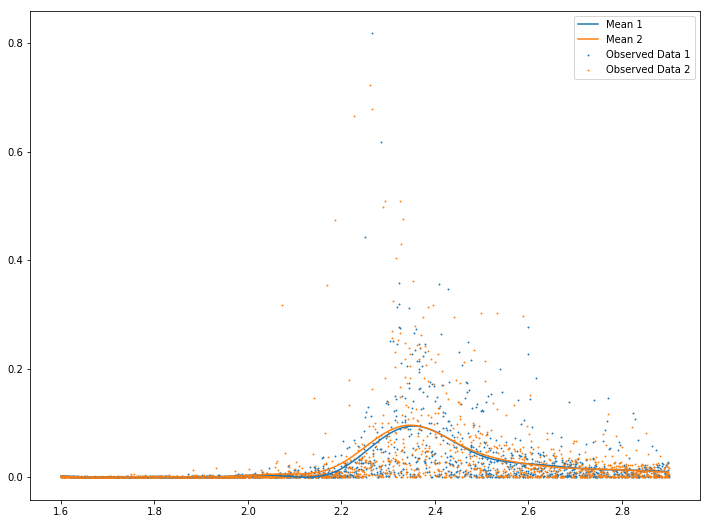

In [232]:
with torch.no_grad():
    # Initialize plot
    f, ax = plt.subplots(1, 1, figsize=(12, 9))

    # Get upper and lower confidence bounds
    lower_PCA_1_error, upper_PCA_1_error = observed_pred_PCA_1_error.confidence_region()
    clean_lower_PCA_2_error, clean_upper_PCA_2_error = clean_observed_pred_PCA_2_error.confidence_region()
    
    ax.scatter(x_test_PCA_1.numpy(), errors_PCA_1**2-errors_PCA_1.mean()**2, s=0.8, label='Observed Data 1')
    ax.plot(x_train_PCA_1.numpy(), observed_pred_PCA_1_error.mean.numpy(), label='Mean 1')
#     ax.fill_between(x_train_PCA_1.numpy(), lower_PCA_1_error.numpy(), upper_PCA_1_error.numpy(), alpha=0.5, label='Confidence 1')
    
    ax.scatter(clean_x_test_PCA_2.numpy(), clean_errors_PCA_2**2-clean_errors_PCA_2.mean()**2, s=0.8, label='Observed Data 2')
    ax.plot(clean_x_test_PCA_2.numpy(), clean_observed_pred_PCA_2_error_tr.mean.numpy(), label='Mean 2')
#     ax.fill_between(x_train_PCA_2.numpy(), clean_lower_PCA_2_error.numpy(), clean_upper_PCA_2_error.numpy(), alpha=0.5, label='Confidence 2')    
    
    ax.legend()
    plt.show()
    plt.close()

In [127]:
del model_PCA_1
del model_PCA_2
del model_PCA_1_error
del model_PCA_2_error
del clean_model_PCA_2_error
del likelihood_PCA_1
del likelihood_PCA_2
del likelihood_PCA_1_error
del likelihood_PCA_2_error
del clean_likelihood_PCA_2_error

In [233]:
Y_f_PCA_1 = []
Y_f_PCA_2 = []

curves_mu_PCA_1 = []
curves_mu_PCA_2 = []

likelihoods_PCA_1 = []
likelihoods_PCA_2 = []

In [234]:
for i in range(0, t_PCA - 18):
    # Initialize model
    likelihoods_PCA_1.append(gpytorch.likelihoods.GaussianLikelihood())
    likelihoods_PCA_2.append(gpytorch.likelihoods.GaussianLikelihood())
    Y_f_PCA_1.append(ExactGPModel(x_train_PCA_1, y_train_PCA_1[:,i], likelihoods_PCA_1[-1]))
    Y_f_PCA_2.append(ExactGPModel(x_train_PCA_2, y_train_PCA_2[:,i], likelihoods_PCA_2[-1]))
    
    # Train model
    Y_f_PCA_1[-1].train()
    Y_f_PCA_2[-1].train()
    likelihoods_PCA_1[-1].train()
    likelihoods_PCA_2[-1].train()

    optimizer_PCA_1 = torch.optim.Adam([{'params': Y_f_PCA_1[-1].parameters()},], lr=0.02)
    optimizer_PCA_2 = torch.optim.Adam([{'params': Y_f_PCA_2[-1].parameters()},], lr=0.02)
    mll_PCA_1 = gpytorch.mlls.ExactMarginalLogLikelihood(likelihoods_PCA_1[-1], Y_f_PCA_1[-1])
    mll_PCA_2 = gpytorch.mlls.ExactMarginalLogLikelihood(likelihoods_PCA_2[-1], Y_f_PCA_2[-1])
    
    iters = GP_training_iter_f_PCA + 0
    for j in range(iters):
        optimizer_PCA_1.zero_grad()
        optimizer_PCA_2.zero_grad()
        output_PCA_1 = Y_f_PCA_1[-1](x_train_PCA_1)
        output_PCA_2 = Y_f_PCA_2[-1](x_train_PCA_2)
        loss_PCA_1 = -mll_PCA_1(output_PCA_1, y_train_PCA_1[:,i])
        loss_PCA_2 = -mll_PCA_2(output_PCA_2, y_train_PCA_2[:,i])
        loss_PCA_1.backward()
        loss_PCA_2.backward()
        if (j+1) % 50 == 0:
            print('PCA1 (pc %d): Iter %d/%d - Loss: %.3f   lengthscale: %.3f   noise: %.3f' % (
                i + 1, j + 1, iters, loss_PCA_1.item(),
                Y_f_PCA_1[-1].covar_module.base_kernel.lengthscale.item(),
                Y_f_PCA_1[-1].likelihood.noise.item()
            ))
            print('PCA2 (pc %d): Iter %d/%d - Loss: %.3f   lengthscale: %.3f   noise: %.3f' % (
                i + 1, j + 1, iters, loss_PCA_2.item(),
                Y_f_PCA_2[-1].covar_module.base_kernel.lengthscale.item(),
                Y_f_PCA_2[-1].likelihood.noise.item()
            ))
        optimizer_PCA_1.step()
        optimizer_PCA_2.step()
    
    # Make predictions
    Y_f_PCA_1[-1].eval()
    Y_f_PCA_2[-1].eval()
    likelihoods_PCA_1[-1].eval()
    likelihoods_PCA_2[-1].eval()
    
    with torch.no_grad(), gpytorch.settings.fast_pred_var():
        curves_mu_PCA_1.append(likelihoods_PCA_1[-1](Y_f_PCA_1[-1](x_test_PCA_1)))
        curves_mu_PCA_2.append(likelihoods_PCA_2[-1](Y_f_PCA_2[-1](x_test_PCA_2)))

PCA1 (pc 1): Iter 50/350 - Loss: 0.391   lengthscale: 0.382   noise: 0.314
PCA2 (pc 1): Iter 50/350 - Loss: 0.390   lengthscale: 0.386   noise: 0.315
PCA1 (pc 1): Iter 100/350 - Loss: -0.014   lengthscale: 0.256   noise: 0.124
PCA2 (pc 1): Iter 100/350 - Loss: -0.020   lengthscale: 0.273   noise: 0.123
PCA1 (pc 1): Iter 150/350 - Loss: -0.312   lengthscale: 0.218   noise: 0.051
PCA2 (pc 1): Iter 150/350 - Loss: -0.326   lengthscale: 0.256   noise: 0.051
PCA1 (pc 1): Iter 200/350 - Loss: -0.414   lengthscale: 0.208   noise: 0.029
PCA2 (pc 1): Iter 200/350 - Loss: -0.437   lengthscale: 0.237   noise: 0.029
PCA1 (pc 1): Iter 250/350 - Loss: -0.422   lengthscale: 0.197   noise: 0.025
PCA2 (pc 1): Iter 250/350 - Loss: -0.448   lengthscale: 0.228   noise: 0.024
PCA1 (pc 1): Iter 300/350 - Loss: -0.423   lengthscale: 0.193   noise: 0.024
PCA2 (pc 1): Iter 300/350 - Loss: -0.448   lengthscale: 0.221   noise: 0.023
PCA1 (pc 1): Iter 350/350 - Loss: -0.423   lengthscale: 0.197   noise: 0.024
PCA

PCA1 (pc 8): Iter 300/350 - Loss: 1.435   lengthscale: 1.670   noise: 1.033
PCA2 (pc 8): Iter 300/350 - Loss: 1.449   lengthscale: 2.328   noise: 1.062
PCA1 (pc 8): Iter 350/350 - Loss: 1.435   lengthscale: 1.476   noise: 1.034
PCA2 (pc 8): Iter 350/350 - Loss: 1.449   lengthscale: 2.335   noise: 1.062


In [235]:
clean_curves_mu_PCA_2 = []

for i in range(0, t_PCA - 18):
    with torch.no_grad(), gpytorch.settings.fast_pred_var():
        clean_curves_mu_PCA_2.append(likelihoods_PCA_2[i](Y_f_PCA_2[i](clean_x_test_PCA_2)))

In [236]:
Y_epsilon_PCA_1 = []
Y_epsilon_PCA_2 = []

e_PCA_1 = []
e_PCA_2 = []

likelihoods_PCA_1_error = []
likelihoods_PCA_2_error = []

In [237]:
for i in range(0, t_PCA - 18):
    # Calculate errors
    e_PCA_1.append((y_test_PCA_1[:,i] - curves_mu_PCA_1[i].mean)**2 - (y_test_PCA_1[:,i] - curves_mu_PCA_1[i].mean).mean()**2)
    e_PCA_2.append((clean_y_test_PCA_2[:,i] - clean_curves_mu_PCA_2[i].mean)**2 - (clean_y_test_PCA_2[:,i] - clean_curves_mu_PCA_2[i].mean).mean()**2)
    
    # Model errors
    likelihoods_PCA_1_error.append(gpytorch.likelihoods.GaussianLikelihood())
    likelihoods_PCA_2_error.append(gpytorch.likelihoods.GaussianLikelihood())
    Y_epsilon_PCA_1.append(ExactGPModel(x_test_PCA_1, e_PCA_1[-1], likelihoods_PCA_1_error[-1]))
    Y_epsilon_PCA_2.append(ExactGPModel(clean_x_test_PCA_2, e_PCA_2[-1], likelihoods_PCA_2_error[-1]))
    
    # Train error models
    Y_epsilon_PCA_1[-1].train()
    Y_epsilon_PCA_1[-1].train()
    likelihoods_PCA_1_error[-1].train()
    likelihoods_PCA_2_error[-1].train()

    optimizer_PCA_1_error = torch.optim.Adam([{'params': Y_epsilon_PCA_1[-1].parameters()},], lr=0.1)
    optimizer_PCA_2_error = torch.optim.Adam([{'params': Y_epsilon_PCA_2[-1].parameters()}, ], lr=0.1)
    mll_PCA_1_error = gpytorch.mlls.ExactMarginalLogLikelihood(likelihoods_PCA_1_error[-1], Y_epsilon_PCA_1[-1])
    mll_PCA_2_error = gpytorch.mlls.ExactMarginalLogLikelihood(likelihoods_PCA_2_error[-1], Y_epsilon_PCA_2[-1])

    for j in range(GP_training_iter_e_PCA):
        optimizer_PCA_1_error.zero_grad()
        optimizer_PCA_2_error.zero_grad()
        output_PCA_1_error = Y_epsilon_PCA_1[-1](x_test_PCA_1)
        output_PCA_2_error = Y_epsilon_PCA_2[-1](clean_x_test_PCA_2)
        loss_PCA_1_error = -mll_PCA_1_error(output_PCA_1_error, e_PCA_1[-1])
        loss_PCA_2_error = -mll_PCA_2_error(output_PCA_2_error, e_PCA_2[-1])
        loss_PCA_1_error.backward()
        loss_PCA_2_error.backward()
        if (j+1) % 50 == 0:
            print('PCA1 (pc %d): Iter %d/%d - Loss: %.3f   lengthscale: %.3f   noise: %.3f' % (
                i+1, j + 1, GP_training_iter_e_PCA, loss_PCA_1_error.item(),
                Y_epsilon_PCA_1[-1].covar_module.base_kernel.lengthscale.item(),
                Y_epsilon_PCA_1[-1].likelihood.noise.item()
            ))
            print('PCA2 (pc %d): Iter %d/%d - Loss: %.3f   lengthscale: %.3f   noise: %.3f' % (
                i+1, j + 1, GP_training_iter_e_PCA, loss_PCA_2_error.item(),
                Y_epsilon_PCA_2[-1].covar_module.base_kernel.lengthscale.item(),
                Y_epsilon_PCA_2[-1].likelihood.noise.item()
            ))
        optimizer_PCA_1_error.step()
        optimizer_PCA_2_error.step()

PCA1 (pc 1): Iter 50/100 - Loss: -1.396   lengthscale: 1.044   noise: 0.007
PCA2 (pc 1): Iter 50/100 - Loss: -1.340   lengthscale: 0.795   noise: 0.007
PCA1 (pc 1): Iter 100/100 - Loss: -1.689   lengthscale: 0.130   noise: 0.002
PCA2 (pc 1): Iter 100/100 - Loss: -1.525   lengthscale: 0.116   noise: 0.003
PCA1 (pc 2): Iter 50/100 - Loss: 2.311   lengthscale: 0.129   noise: 2.878
PCA2 (pc 2): Iter 50/100 - Loss: 2.087   lengthscale: 0.105   noise: 2.724
PCA1 (pc 2): Iter 100/100 - Loss: 2.250   lengthscale: 0.175   noise: 3.604
PCA2 (pc 2): Iter 100/100 - Loss: 2.069   lengthscale: 0.144   noise: 3.203
PCA1 (pc 3): Iter 50/100 - Loss: 2.336   lengthscale: 0.115   noise: 2.888
PCA2 (pc 3): Iter 50/100 - Loss: 2.118   lengthscale: 0.090   noise: 2.771
PCA1 (pc 3): Iter 100/100 - Loss: 2.270   lengthscale: 0.150   noise: 3.635
PCA2 (pc 3): Iter 100/100 - Loss: 2.096   lengthscale: 0.101   noise: 3.292
PCA1 (pc 4): Iter 50/100 - Loss: 2.305   lengthscale: 0.176   noise: 2.893
PCA2 (pc 4): It

In [238]:
# Get into evaluation (predictive posterior) mode
Y_epsilon_PCA_1[1].eval()
Y_epsilon_PCA_2[1].eval()
likelihoods_PCA_1_error[1].eval()
likelihoods_PCA_2_error[1].eval()

# Test points are regularly spaced along [0,1]
# Make predictions by feeding model through likelihood
with torch.no_grad(), gpytorch.settings.fast_pred_var():
    clean_PCA_1_error = likelihoods_PCA_1_error[1](Y_epsilon_PCA_1[1](x_train_PCA_1))
    clean_PCA_2_error = likelihoods_PCA_2_error[1](Y_epsilon_PCA_2[1](clean_x_test_PCA_2))

In [239]:
temps_coarse = np.linspace(Tmin, Tmax-(Tmax-Tmin)/nTemps_coarse, nTemps_coarse)
temps_coarse_torch = torch.FloatTensor(temps_coarse)
temps_torch = torch.FloatTensor(np.sort(temps))
temps_coarse_rep = [[temps_coarse[i]]*nSamples_coarse for i in range(0,nTemps_coarse)]
temps_coarse_rep = np.array([temp for set_ in temps_coarse_rep for temp in set_])

In [240]:
Y_f_PCA_1_eval = []
Y_f_PCA_2_eval = []
Y_epsilon_PCA_1_eval = []
Y_epsilon_PCA_2_eval = []

for i in range(0, t_PCA - 18):
    # Make predictions
    Y_f_PCA_1[i].eval()
    Y_f_PCA_2[i].eval()
    likelihoods_PCA_1[i].eval()
    likelihoods_PCA_2[i].eval()
    Y_epsilon_PCA_1[i].eval()
    Y_epsilon_PCA_2[i].eval()
    likelihoods_PCA_1_error[i].eval()
    likelihoods_PCA_2_error[i].eval()
    
    with torch.no_grad(), gpytorch.settings.fast_pred_var():
        Y_f_PCA_1_eval.append(likelihoods_PCA_1[i](Y_f_PCA_1[i](temps_torch)))
        Y_f_PCA_2_eval.append(likelihoods_PCA_2[i](Y_f_PCA_2[i](temps_torch)))
        Y_epsilon_PCA_1_eval.append(likelihoods_PCA_1_error[i](Y_epsilon_PCA_1[i](temps_torch)))
        Y_epsilon_PCA_2_eval.append(likelihoods_PCA_2_error[i](Y_epsilon_PCA_2[i](temps_torch)))

In [241]:
Y_PCA_T = []
for i in range(0, t_PCA - 18):
    mean_1 = (Y_f_PCA_1_eval[i].mean + (y_test_PCA_1[:,i] - curves_mu_PCA_1[i].mean).mean()).numpy()
    variance_1 = Y_epsilon_PCA_1_eval[i].mean.numpy().clip(1e-20,1e20)
    mean_2 = (Y_f_PCA_2_eval[i].mean + (clean_y_test_PCA_2[:,i] - clean_curves_mu_PCA_2[i].mean).mean()).numpy()
    variance_2 = Y_epsilon_PCA_2_eval[i].mean.numpy().clip(1e-20,1e20)
    sample = []
    for temp in range(0, nTemps_coarse):
        id_ = temp*nSamples_coarse
        y_1 = 1*(Y_PPCA[class_1,i].mean(0) + mean_1[id_]) + np.random.randn(nSamples_coarse)*(variance_1[id_]**0.5) # + np.zeros(nSamples_coarse)#
        y_2 = 1*(Y_PPCA[class_2,i].mean(0) + mean_2[id_]) + np.random.randn(nSamples_coarse)*(variance_2[id_]**0.5)
        index = np.random.randint(2, size=(nSamples_coarse))
        y = np.concatenate([y_1.reshape([-1,1]),y_2.reshape([-1,1])], 1)[np.arange(nSamples_coarse), index]
        sample.append(y)
    Y_PCA_T.append(sample)
Y_PCA_T = np.array(Y_PCA_T).reshape([t_PCA-18,-1]).T

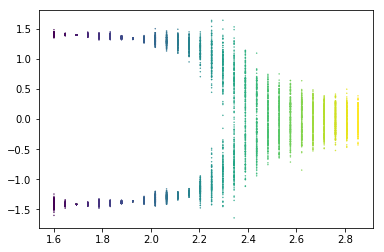

In [242]:
plt.scatter(temps_coarse_rep, Y_PCA_T[:,0], c=temps_coarse_rep, s=0.2)
plt.show()
plt.close()

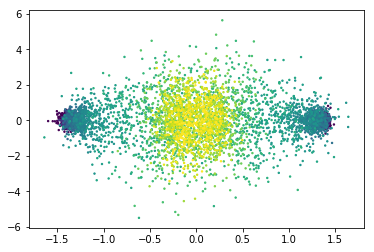

In [243]:
plt.scatter(Y_PCA_T[:,0], Y_PCA_T[:,1], c=temps_coarse_rep, s=2.0)
plt.show()
plt.close()

In [244]:
S_higher_8 = SV_PCA[:t_PCA-18]
sigma2_8 = SV_PCA[t_PCA-18:].mean()
W_8 = U_PCA[:,:t_PCA-18]@(np.diag(S_higher_8-sigma2_8)**0.5)

In [245]:
X_PCA_T = (Y_PCA_T @ W_8.T + mean.reshape(-1))
X_PCA_T = (X_PCA_T + 1)*0.5
r_PCA_T = np.random.rand(*X_PCA_T.shape)
X_PCA_T = X_PCA_T > r_PCA_T
X_PCA_T = 2*X_PCA_T - 1

In [246]:
coarse_logZ = logsumexp(-(energy_vector/temps_coarse_rep.reshape(-1)).T + log_density_of_states, axis=1)

In [247]:
energies_PCA_T = np.zeros([nSamples_coarse*nTemps_coarse,1])
for sample in range(0,nSamples_coarse*nTemps_coarse):
    configuration = X_PCA_T[sample,:].reshape([L,L])
    energies_PCA_T[sample,0] = calculate_energy(configuration)
    
conditional_llklhoods_PCA_T = -energies_PCA_T.reshape(-1)/temps_coarse_rep.reshape(-1) - coarse_logZ.reshape(-1)
llklhood_PCA_T = (conditional_llklhoods_PCA_T).sum()

pE_PCA_T = np.histogram(energies_PCA_T, bins=energy_bins.reshape(-1))[0]/nSamples
KLdiv_PCA_T = kl_div(pE_PCA_T, pE).sum()

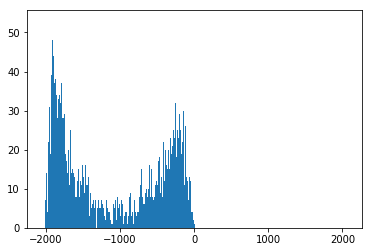

In [248]:
plt.hist(energies_PCA_T, bins=energy_bins)
plt.show()
plt.close()

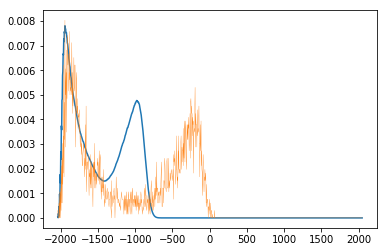

In [249]:
plt.plot(energy_vector[1:], pE[1:])
plt.plot(energy_vector[1:], pE_PCA_T[1:], linewidth=0.3)
plt.show()
plt.close()

In [250]:
X_PCA_T_1pc = (Y_PCA_T[:,0].reshape([-1,1]) @ W_1pc.T + mean.reshape(-1))
X_PCA_T_1pc = (X_PCA_T_1pc + 1)*0.5
X_PCA_T_1pc = X_PCA_T_1pc > r_PCA_T
X_PCA_T_1pc = 2*X_PCA_T_1pc - 1

In [251]:
energies_PCA_T_1pc = np.zeros([nSamples_coarse*nTemps_coarse,1])
for sample in range(0,nSamples_coarse*nTemps_coarse):
    configuration = X_PCA_T_1pc[sample,:].reshape([L,L])
    energies_PCA_T_1pc[sample,0] = calculate_energy(configuration)

conditional_llklhoods_PCA_T_1pc = -energies_PCA_T_1pc.reshape(-1)/temps_coarse_rep.reshape(-1) - coarse_logZ.reshape(-1)
llklhood_PCA_T_1pc = (conditional_llklhoods_PCA_T_1pc).sum()

pE_PCA_T_1pc = np.histogram(energies_PCA_T_1pc, bins=energy_bins.reshape(-1))[0]/nSamples
KLdiv_PCA_T_1pc = kl_div(pE_PCA_T_1pc, pE).sum()

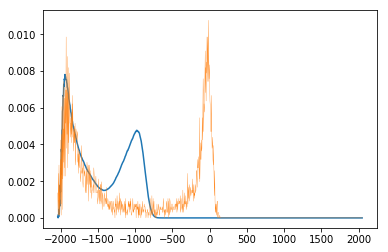

In [252]:
plt.plot(energy_vector[1:], pE[1:])
plt.plot(energy_vector[1:], pE_PCA_T_1pc[1:], linewidth=0.3)
plt.show()
plt.close()

In [253]:
print("LogL Met: %.6e" % llklhood_metropolis)
print("LogL PCA (29pc): %.6e" % llklhood_PCA)
print("LogL PCA (1pc): %.6e" % llklhood_PCA_1pc)
print("LogL PCA (1pc-wn): %.6e" % llklhood_PCA_1pc_no_noise)
print("LogL PCA (T-8pc-wn): %.6e" % llklhood_PCA_T)
print("LogL PCA (T-1pc-wn): %.6e" % llklhood_PCA_T_1pc)
# print("LogL VAE: %.6e" % loglikelihood_VAE_2)

LogL Met: -1.958874e+06
LogL PCA (29pc): -4.231167e+06
LogL PCA (1pc): -2.895459e+06
LogL PCA (1pc-wn): -5.612849e+06
LogL PCA (T-8pc-wn): -2.930885e+06
LogL PCA (T-1pc-wn): -3.162393e+06


In [254]:
print("KL-div Met: %.6e" % KLdiv_metropolis)
print("KL-div PCA (26pc): %.6e" % KLdiv_PCA)
print("KL-div PCA (1pc): %.6e" % KLdiv_PCA_1pc)
print("KL-div PCA (1pc-wn): %.6e" % KLdiv_PCA_1pc_no_noise)
print("KL-div PCA (T-8pc-wn): %.6e" % KLdiv_PCA_T)
print("KL-div PCA (T-1pc-wn): %.6e" % KLdiv_PCA_T_1pc)

KL-div Met: 2.067468e-02
KL-div PCA (26pc): 3.813381e+01
KL-div PCA (1pc): 3.995142e+01
KL-div PCA (1pc-wn): 1.406707e+02
KL-div PCA (T-8pc-wn): 2.318016e+01
KL-div PCA (T-1pc-wn): 4.557487e+01


## KPCA

In [314]:
x_train_KPCA_1 = torch.FloatTensor(temps_1[class_1]).to(device)
x_train_KPCA_2 = torch.FloatTensor(temps_1[class_2]).to(device)
x_test_KPCA_1 = torch.FloatTensor(temps_2[class_1_2]).to(device)
x_test_KPCA_2 = torch.FloatTensor(temps_2[class_2_2]).to(device)
y_train_KPCA_1 = torch.FloatTensor((Y_KPCA[class_1,:5] - Y_KPCA[:,:5].mean(0))/Y_KPCA[:,:5].std(0)).to(device)
y_train_KPCA_2 = torch.FloatTensor((Y_KPCA[class_2,:5] - Y_KPCA[:,:5].mean(0))/Y_KPCA[:,:5].std(0)).to(device)
y_test_KPCA_1 = torch.FloatTensor((Y_KPCA_2[class_1_2,:5] - Y_KPCA[:,:5].mean(0))/Y_KPCA[:,:5].std(0)).to(device)
y_test_KPCA_2 = torch.FloatTensor((Y_KPCA_2[class_2_2,:5] - Y_KPCA[:,:5].mean(0))/Y_KPCA[:,:5].std(0)).to(device)

In [361]:
Y_f_KPCA_1_1 = MLP(1, 1, 1, h1=20, h2=20).to(device)
Y_f_KPCA_1_2 = MLP(1, 1, 1, h1=20, h2=20).to(device)
Y_f_KPCA_234 = MLP(1, 1, 3, h1=20, h2=20).to(device)
Y_f_KPCA_5_1 = MLP(1, 1, 1, h1=20, h2=20).to(device)
Y_f_KPCA_5_2 = MLP(1, 1, 1, h1=20, h2=20).to(device)

In [316]:
Y_f_KPCA_1_1.optimizer = optim.Adam(Y_f_KPCA_1_mlp.parameters(), lr = 3e-6, weight_decay=0)
Y_f_KPCA_1_2.optimizer = optim.Adam(Y_f_KPCA_1_mlp.parameters(), lr = 3e-6, weight_decay=0)
# Y_f_KPCA_1_mlp.batch_size = 100
# Y_f_KPCA_1_mlp.num_epochs = 100
# Y_f_KPCA_2_mlp.optimizer = optim.Adam(Y_f_KPCA_2_mlp.parameters(), lr = 3e-3, weight_decay=0)
# Y_f_KPCA_2_mlp.batch_size = 100
# Y_f_KPCA_2_mlp.num_epochs = 100

NameError: name 'Y_f_KPCA_1_mlp' is not defined

In [362]:
for i in range(0,20): 
    print("Iteration "+str(i+1))
    Y_f_KPCA_1_1.train(x_train_KPCA_1.view([-1,1]), x_train_KPCA[class_1,0].view([-1,1]))
    Y_f_KPCA_1_2.train(x_train_KPCA_2.view([-1,1]), x_train_KPCA[class_2,0].view([-1,1]))
    Y_f_KPCA_234.train(x_train_KPCA[:,0].view([-1,1]), x_train_KPCA[:,1:4])
    Y_f_KPCA_5_1.train(x_train_KPCA_1.view([-1,1]), x_train_KPCA[class_1,4].view([-1,1]))
    Y_f_KPCA_5_2.train(x_train_KPCA_2.view([-1,1]), x_train_KPCA[class_1,4].view([-1,1]))

Iteration 1
[0/100][29/30]	Loss: 0.576091
[1/100][29/30]	Loss: 0.520813
[2/100][29/30]	Loss: 0.398290
[3/100][29/30]	Loss: 0.265941
[4/100][29/30]	Loss: 0.052417
[5/100][29/30]	Loss: 0.044480
[6/100][29/30]	Loss: 0.028720
[7/100][29/30]	Loss: 0.056965
[8/100][29/30]	Loss: 0.058782
[9/100][29/30]	Loss: 0.038680
[10/100][29/30]	Loss: 0.026201
[11/100][29/30]	Loss: 0.055828
[12/100][29/30]	Loss: 0.029193
[13/100][29/30]	Loss: 0.042041
[14/100][29/30]	Loss: 0.031329
[15/100][29/30]	Loss: 0.033149
[16/100][29/30]	Loss: 0.038726
[17/100][29/30]	Loss: 0.029016
[18/100][29/30]	Loss: 0.035687
[19/100][29/30]	Loss: 0.032508
[20/100][29/30]	Loss: 0.024592
[21/100][29/30]	Loss: 0.023583
[22/100][29/30]	Loss: 0.021633
[23/100][29/30]	Loss: 0.024634
[24/100][29/30]	Loss: 0.042882
[25/100][29/30]	Loss: 0.033011
[26/100][29/30]	Loss: 0.028933
[27/100][29/30]	Loss: 0.030025
[28/100][29/30]	Loss: 0.025669
[29/100][29/30]	Loss: 0.016791
[30/100][29/30]	Loss: 0.021335
[31/100][29/30]	Loss: 0.019560
[32/10

KeyboardInterrupt: 

In [318]:
# torch.save(Y_f_KPCA_1_1, 'Y_f_KPCA_1_1.pt')
# torch.save(Y_f_KPCA_1_2, 'Y_f_KPCA_1_2.pt')
# torch.save(Y_f_KPCA_234, 'Y_f_KPCA_234.pt')
# torch.save(Y_f_KPCA_5_1, 'Y_f_KPCA_5_1.pt')
# torch.save(Y_f_KPCA_5_2, 'Y_f_KPCA_5_2.pt')

/home/researcher/miniconda3/lib/python3.7/site-packages/torch/serialization.py:256: UserWarning: Couldn't retrieve source code for container of type MLP. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [363]:
Y_f_KPCA_1_1 = torch.load('Y_f_KPCA_1_1.pt')
Y_f_KPCA_1_2 = torch.load('Y_f_KPCA_1_2.pt')
Y_f_KPCA_5_1 = torch.load('Y_f_KPCA_5_1.pt')
Y_f_KPCA_5_2 = torch.load('Y_f_KPCA_5_2.pt')
Y_f_KPCA_234 = torch.load('Y_f_KPCA_234.pt')

/home/researcher/miniconda3/lib/python3.7/site-packages/torch/serialization.py:454: SourceChangeWarning: source code of class 'torch.nn.modules.loss.MSELoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)


In [364]:
Y_KPCA_1_1 = 1.03*Y_f_KPCA_1_1(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy()
Y_KPCA_5_1 = Y_f_KPCA_5_1(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy()
Y_KPCA_1_2 = 1.02*Y_f_KPCA_1_2(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy()
Y_KPCA_5_2 = Y_f_KPCA_5_2(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy()
# av = (Y_KPCA_1_mlp[:,[1,3,4]]+Y_KPCA_2_mlp[:,[1,3,4]])/2
# Y_KPCA_1_mlp[:,[1,3,4]] = np.copy(av)
# Y_KPCA_2_mlp[:,[1,3,4]] = np.copy(av)
index = np.random.randint(2, size=(temps_1.shape[0]))
Y_KPCA_1_ = np.concatenate([Y_KPCA_1_1.reshape([-1,1,1]),Y_KPCA_1_2.reshape([-1,1,1])], 2)[np.arange(temps_1.shape[0]),:,index].reshape([-1,1])
Y_KPCA_5_ = np.concatenate([Y_KPCA_5_1.reshape([-1,1,1]),Y_KPCA_5_2.reshape([-1,1,1])], 2)[np.arange(temps_1.shape[0]),:,index].reshape([-1,1])
Y_KPCA_234 = Y_f_KPCA_234(torch.FloatTensor(Y_KPCA_1_).to(device)).detach().cpu().numpy()
Y_KPCA_234_1 = Y_f_KPCA_234(torch.FloatTensor(Y_KPCA_1_1).to(device)).detach().cpu().numpy()
Y_KPCA_234_2 = Y_f_KPCA_234(torch.FloatTensor(Y_KPCA_1_2).to(device)).detach().cpu().numpy()
Y_KPCA_T = np.concatenate([Y_KPCA_1_, Y_KPCA_234, Y_KPCA_5_], 1)

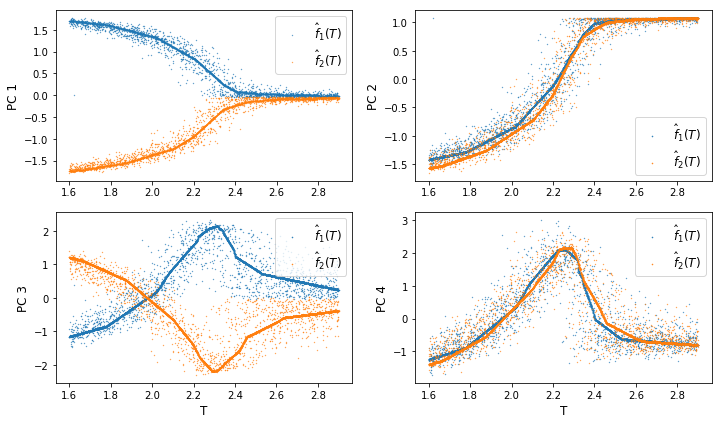

In [365]:
with torch.no_grad():
    f, ax = plt.subplots(2, 2, figsize=(10, 6))
    ax[0,0].scatter(temps_1[class_1], x_train_KPCA[class_1,0].cpu().numpy(), s=0.1)
    ax[0,0].scatter(temps_1, Y_KPCA_1_1, s=0.1, c='C0', label=r'$\hat{f}_1(T)$')
    ax[0,0].scatter(temps_1[class_2], x_train_KPCA[class_2,0].cpu().numpy(), s=0.1)
    ax[0,0].scatter(temps_1, Y_KPCA_1_2, s=0.1, c='C1', label=r'$\hat{f}_2(T)$')
    ax[0,0].set_ylabel('PC 1', fontsize=12)
    ax[0,0].legend(fontsize=12)
    
    ax[0,1].scatter(temps_1[class_1], x_train_KPCA[class_1,1].cpu().numpy(), s=0.1)
    ax[0,1].scatter(temps_1, Y_KPCA_234_1[:,0], s=0.3, c='C0', label=r'$\hat{f}_1(T)$')
    ax[0,1].scatter(temps_1[class_2], x_train_KPCA[class_2,1].cpu().numpy(), s=0.1)
    ax[0,1].scatter(temps_1, Y_KPCA_234_2[:,0], s=0.3, c='C1', label=r'$\hat{f}_2(T)$')
    ax[0,1].set_ylabel('PC 2', fontsize=12)
    ax[0,1].legend(fontsize=12)
    
    ax[1,0].scatter(temps_1[class_1], x_train_KPCA[class_1,2].cpu().numpy(), s=0.1)
    ax[1,0].scatter(temps_1, Y_KPCA_234_1[:,1], s=0.3, c='C0', label=r'$\hat{f}_1(T)$')
    ax[1,0].scatter(temps_1[class_2], x_train_KPCA[class_2,2].cpu().numpy(), s=0.1)
    ax[1,0].scatter(temps_1, Y_KPCA_234_2[:,1], s=0.3, c='C1', label=r'$\hat{f}_2(T)$')
    ax[1,0].set_ylabel('PC 3', fontsize=12)
    ax[1,0].set_xlabel('T', fontsize=12)
    ax[1,0].legend(fontsize=12)
    
    ax[1,1].scatter(temps_1[class_1], x_train_KPCA[class_1,3].cpu().numpy(), s=0.1)
    ax[1,1].scatter(temps_1, Y_KPCA_234_1[:,2], s=0.3, c='C0', label=r'$\hat{f}_1(T)$')
    ax[1,1].scatter(temps_1[class_2], x_train_KPCA[class_2,3].cpu().numpy(), s=0.1)
    ax[1,1].scatter(temps_1, Y_KPCA_234_2[:,2], s=0.3, c='C1', label=r'$\hat{f}_2(T)$')
    ax[1,1].set_ylabel('PC 4', fontsize=12)
    ax[1,1].set_xlabel('T', fontsize=12)
    ax[1,1].legend(fontsize=12)
    
    f.tight_layout()
    plt.savefig('Branch_Ising_KPCA.png', dpi=300)
    plt.show()
    plt.close()

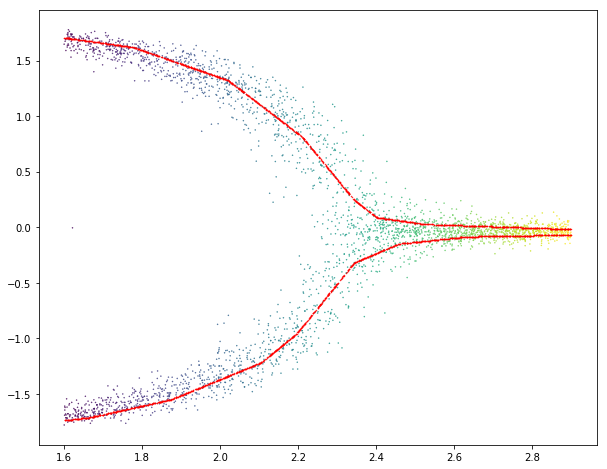

In [366]:
fig = plt.figure(figsize=(10,8))
plt.scatter(temps_1, x_train_KPCA[:,0].cpu().numpy(), c=temps_1, s=0.2)
plt.scatter(temps_1, Y_KPCA_T[:,0], s=0.2, c='r')
plt.show()
plt.close()

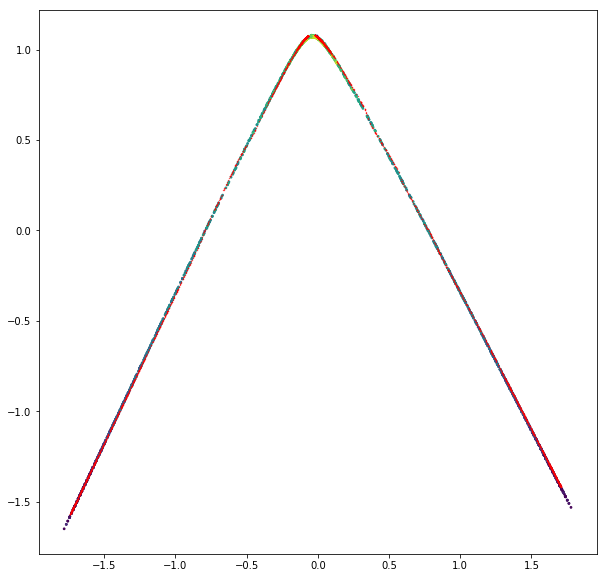

In [367]:
fig = plt.figure(figsize=(10,10))
plt.scatter(x_train_KPCA[:,0].cpu().numpy()+0.0, x_train_KPCA[:,1].cpu().numpy(), c=temps_1, s=3)
plt.scatter(Y_KPCA_T[:,0], Y_KPCA_T[:,1], c='r', s=0.1)
plt.show()
plt.close()

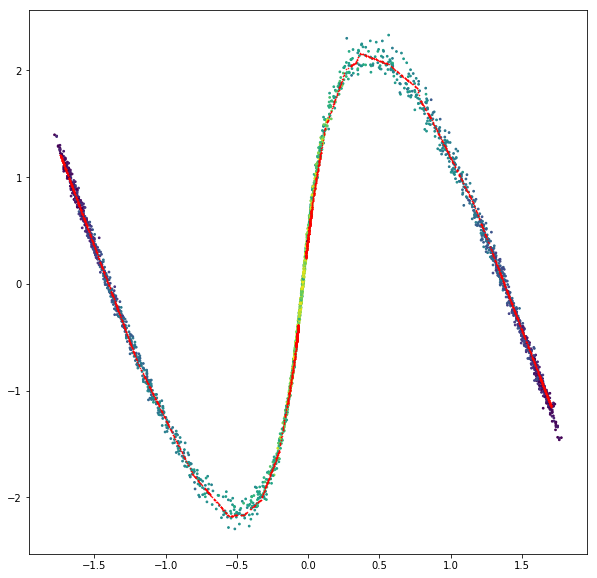

In [368]:
fig = plt.figure(figsize=(10,10))
plt.scatter(x_train_KPCA[:,0].cpu().numpy()+0.0, x_train_KPCA[:,2].cpu().numpy(), c=temps_1, s=3)
plt.scatter(Y_KPCA_T[:,0], Y_KPCA_T[:,2], c='r', s=0.3)
plt.show()
plt.close()

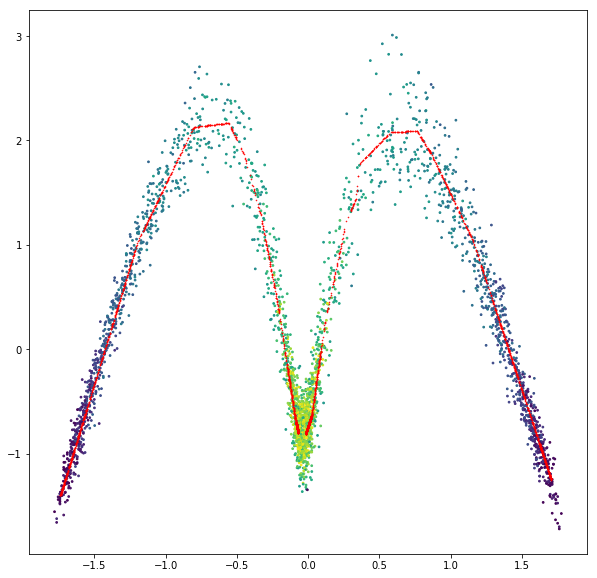

In [369]:
fig = plt.figure(figsize=(10,10))
plt.scatter(x_train_KPCA[:,0].cpu().numpy()+0.0, x_train_KPCA[:,3].cpu().numpy(), c=temps_1, s=3)
plt.scatter(Y_KPCA_T[:,0], Y_KPCA_T[:,3], c='r', s=0.3)
plt.show()
plt.close()

In [370]:
Y_KPCA_1_1_pred = 1.03*Y_f_KPCA_1_1(x_train_PCA_1.cuda().view([-1,1])).detach().cpu().numpy()
Y_KPCA_5_1_pred = Y_f_KPCA_5_1(x_train_PCA_1.cuda().view([-1,1])).detach().cpu().numpy()
Y_KPCA_1_2_pred = 1.02*Y_f_KPCA_1_2(x_train_PCA_2.cuda().view([-1,1])).detach().cpu().numpy()
Y_KPCA_5_2_pred = Y_f_KPCA_5_2(x_train_PCA_2.cuda().view([-1,1])).detach().cpu().numpy()
Y_KPCA_234_1_pred = Y_f_KPCA_234(torch.FloatTensor(Y_KPCA_1_1_pred).to(device)).detach().cpu().numpy()
Y_KPCA_234_2_pred = Y_f_KPCA_234(torch.FloatTensor(Y_KPCA_1_2_pred).to(device)).detach().cpu().numpy()
Y_KPCA_T_1_pred = np.concatenate([Y_KPCA_1_1_pred, Y_KPCA_234_1_pred, Y_KPCA_5_1_pred], 1)
Y_KPCA_T_2_pred = np.concatenate([Y_KPCA_1_2_pred, Y_KPCA_234_2_pred, Y_KPCA_5_2_pred], 1)
Y_KPCA_T_pred = np.concatenate([Y_KPCA_T_1_pred, Y_KPCA_T_2_pred], 0)

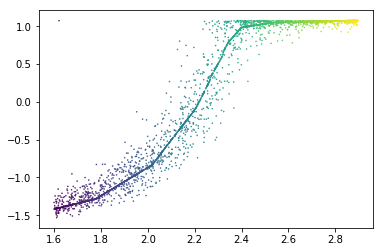

In [371]:
plt.scatter(temps_1[class_1[order_train_1]], Y_KPCA_T_1_pred[:,1], c=temps_1[class_1[order_train_1]], s=0.3)
plt.scatter(temps_1[class_1[order_train_1]], x_train_KPCA[class_1[order_train_1],1].cpu().numpy(), c=temps_1[class_1[order_train_1]], s=0.3)
plt.show()
plt.close()

In [372]:
ordered_classes = np.concatenate([class_1[order_train_1], class_2[order_train_2]])
e_KPCA_1_1 = Y_KPCA_T_1_pred[:,0] - x_train_KPCA[class_1[order_train_1],0].cpu().numpy()
e_KPCA_1_2 = Y_KPCA_T_2_pred[:,0] - x_train_KPCA[class_2[order_train_2],0].cpu().numpy()
e_KPCA_234 = Y_KPCA_T_pred[:,1:4] - x_train_KPCA[ordered_classes,1:4].cpu().numpy()
e_KPCA_5_1 = Y_KPCA_T_1_pred[:,4] - x_train_KPCA[class_1[order_train_1],4].cpu().numpy()
e_KPCA_5_2 = Y_KPCA_T_2_pred[:,4] - x_train_KPCA[class_2[order_train_2],4].cpu().numpy()

e_KPCA_1_1 = torch.FloatTensor(e_KPCA_1_1).view([-1,1]).to(device)
e_KPCA_1_2 = torch.FloatTensor(e_KPCA_1_2).view([-1,1]).to(device)
e_KPCA_234 = torch.FloatTensor(e_KPCA_234).to(device)
e_KPCA_5_1 = torch.FloatTensor(e_KPCA_5_1).view([-1,1]).to(device)
e_KPCA_5_2 = torch.FloatTensor(e_KPCA_5_2).view([-1,1]).to(device)

In [373]:
Y_eps_mean_KPCA_1_1 = MLP(1, 1, 1, h1=20, h2=20).to(device)
Y_eps_mean_KPCA_1_2 = MLP(1, 1, 1, h1=20, h2=20).to(device)
Y_eps_mean_KPCA_234 = MLP(1, 1, 3, h1=20, h2=20).to(device)
Y_eps_mean_KPCA_5_1 = MLP(1, 1, 1, h1=20, h2=20).to(device)
Y_eps_mean_KPCA_5_2 = MLP(1, 1, 1, h1=20, h2=20).to(device)

In [374]:
for i in range(0,10): 
    print("Iteration "+str(i+1))
    Y_eps_mean_KPCA_1_1.train(x_train_PCA_1.cuda().view([-1,1]), e_KPCA_1_1)
    Y_eps_mean_KPCA_1_2.train(x_train_PCA_2.cuda().view([-1,1]), e_KPCA_1_2)
    Y_eps_mean_KPCA_234.train(torch.FloatTensor(Y_KPCA_T_pred[:,0]).view([-1,1]).to(device), e_KPCA_234)
    Y_eps_mean_KPCA_5_1.train(x_train_PCA_1.cuda().view([-1,1]), e_KPCA_5_1)
    Y_eps_mean_KPCA_5_2.train(x_train_PCA_2.cuda().view([-1,1]), e_KPCA_5_2)

Iteration 1
[0/100][29/30]	Loss: 0.018288
[1/100][29/30]	Loss: 0.016626
[2/100][29/30]	Loss: 0.014220
[3/100][29/30]	Loss: 0.026242
[4/100][29/30]	Loss: 0.011745
[5/100][29/30]	Loss: 0.014653
[6/100][29/30]	Loss: 0.011178
[7/100][29/30]	Loss: 0.008160
[8/100][29/30]	Loss: 0.061411
[9/100][29/30]	Loss: 0.013692
[10/100][29/30]	Loss: 0.026508
[11/100][29/30]	Loss: 0.011624
[12/100][29/30]	Loss: 0.010793
[13/100][29/30]	Loss: 0.015045
[14/100][29/30]	Loss: 0.009714
[15/100][29/30]	Loss: 0.013394
[16/100][29/30]	Loss: 0.025665
[17/100][29/30]	Loss: 0.038421
[18/100][29/30]	Loss: 0.070806
[19/100][29/30]	Loss: 0.015393
[20/100][29/30]	Loss: 0.029893
[21/100][29/30]	Loss: 0.017567
[22/100][29/30]	Loss: 0.020211
[23/100][29/30]	Loss: 0.020723
[24/100][29/30]	Loss: 0.023548
[25/100][29/30]	Loss: 0.029353
[26/100][29/30]	Loss: 0.019633
[27/100][29/30]	Loss: 0.020118
[28/100][29/30]	Loss: 0.025242
[29/100][29/30]	Loss: 0.016721
[30/100][29/30]	Loss: 0.026056
[31/100][29/30]	Loss: 0.015123
[32/10

[65/100][59/60]	Loss: 0.206284
[66/100][59/60]	Loss: 0.205328
[67/100][59/60]	Loss: 0.221614
[68/100][59/60]	Loss: 0.159481
[69/100][59/60]	Loss: 0.208447
[70/100][59/60]	Loss: 0.201219
[71/100][59/60]	Loss: 0.166570
[72/100][59/60]	Loss: 0.230474
[73/100][59/60]	Loss: 0.140343
[74/100][59/60]	Loss: 0.171091
[75/100][59/60]	Loss: 0.232656
[76/100][59/60]	Loss: 0.231293
[77/100][59/60]	Loss: 0.164703
[78/100][59/60]	Loss: 0.215107
[79/100][59/60]	Loss: 0.110587
[80/100][59/60]	Loss: 0.099685
[81/100][59/60]	Loss: 0.215446
[82/100][59/60]	Loss: 0.247029
[83/100][59/60]	Loss: 0.133396
[84/100][59/60]	Loss: 0.106800
[85/100][59/60]	Loss: 0.182432
[86/100][59/60]	Loss: 0.121315
[87/100][59/60]	Loss: 0.131929
[88/100][59/60]	Loss: 0.236135
[89/100][59/60]	Loss: 0.179219
[90/100][59/60]	Loss: 0.136178
[91/100][59/60]	Loss: 0.140255
[92/100][59/60]	Loss: 0.221041
[93/100][59/60]	Loss: 0.234542
[94/100][59/60]	Loss: 0.129267
[95/100][59/60]	Loss: 0.176369
[96/100][59/60]	Loss: 0.113938
[97/100]

[32/100][29/30]	Loss: 0.026442
[33/100][29/30]	Loss: 0.014114
[34/100][29/30]	Loss: 0.011671
[35/100][29/30]	Loss: 0.014044
[36/100][29/30]	Loss: 0.014306
[37/100][29/30]	Loss: 0.017925
[38/100][29/30]	Loss: 0.021190
[39/100][29/30]	Loss: 0.023618
[40/100][29/30]	Loss: 0.041186
[41/100][29/30]	Loss: 0.016066
[42/100][29/30]	Loss: 0.015297
[43/100][29/30]	Loss: 0.015550
[44/100][29/30]	Loss: 0.015000
[45/100][29/30]	Loss: 0.032196
[46/100][29/30]	Loss: 0.011702
[47/100][29/30]	Loss: 0.030824
[48/100][29/30]	Loss: 0.041014
[49/100][29/30]	Loss: 0.022164
[50/100][29/30]	Loss: 0.012102
[51/100][29/30]	Loss: 0.028747
[52/100][29/30]	Loss: 0.023492
[53/100][29/30]	Loss: 0.008739
[54/100][29/30]	Loss: 0.033179
[55/100][29/30]	Loss: 0.031951
[56/100][29/30]	Loss: 0.016834
[57/100][29/30]	Loss: 0.014597
[58/100][29/30]	Loss: 0.013866
[59/100][29/30]	Loss: 0.016894
[60/100][29/30]	Loss: 0.022156
[61/100][29/30]	Loss: 0.011039
[62/100][29/30]	Loss: 0.014745
[63/100][29/30]	Loss: 0.050462
[64/100]

[98/100][59/60]	Loss: 0.161892
[99/100][59/60]	Loss: 0.239107
[0/100][29/30]	Loss: 0.976381
[1/100][29/30]	Loss: 0.678661
[2/100][29/30]	Loss: 1.055830
[3/100][29/30]	Loss: 1.107805
[4/100][29/30]	Loss: 0.749246
[5/100][29/30]	Loss: 0.835038
[6/100][29/30]	Loss: 0.625953
[7/100][29/30]	Loss: 0.669847
[8/100][29/30]	Loss: 0.853263
[9/100][29/30]	Loss: 1.337531
[10/100][29/30]	Loss: 1.130754
[11/100][29/30]	Loss: 0.552073
[12/100][29/30]	Loss: 0.792735
[13/100][29/30]	Loss: 0.803178
[14/100][29/30]	Loss: 0.836640
[15/100][29/30]	Loss: 0.949108
[16/100][29/30]	Loss: 0.674305
[17/100][29/30]	Loss: 0.893698
[18/100][29/30]	Loss: 1.819864
[19/100][29/30]	Loss: 0.492304
[20/100][29/30]	Loss: 1.196467
[21/100][29/30]	Loss: 1.564298
[22/100][29/30]	Loss: 1.084089
[23/100][29/30]	Loss: 1.147486
[24/100][29/30]	Loss: 0.683182
[25/100][29/30]	Loss: 0.835866
[26/100][29/30]	Loss: 0.631732
[27/100][29/30]	Loss: 1.312693
[28/100][29/30]	Loss: 1.195009
[29/100][29/30]	Loss: 1.417963
[30/100][29/30]	Lo

[66/100][29/30]	Loss: 0.069821
[67/100][29/30]	Loss: 0.018421
[68/100][29/30]	Loss: 0.037299
[69/100][29/30]	Loss: 0.017636
[70/100][29/30]	Loss: 0.015329
[71/100][29/30]	Loss: 0.013558
[72/100][29/30]	Loss: 0.030945
[73/100][29/30]	Loss: 0.009224
[74/100][29/30]	Loss: 0.024420
[75/100][29/30]	Loss: 0.025768
[76/100][29/30]	Loss: 0.025071
[77/100][29/30]	Loss: 0.015816
[78/100][29/30]	Loss: 0.020205
[79/100][29/30]	Loss: 0.011681
[80/100][29/30]	Loss: 0.022627
[81/100][29/30]	Loss: 0.025562
[82/100][29/30]	Loss: 0.028110
[83/100][29/30]	Loss: 0.016804
[84/100][29/30]	Loss: 0.012860
[85/100][29/30]	Loss: 0.015543
[86/100][29/30]	Loss: 0.007633
[87/100][29/30]	Loss: 0.022826
[88/100][29/30]	Loss: 0.027937
[89/100][29/30]	Loss: 0.015175
[90/100][29/30]	Loss: 0.035271
[91/100][29/30]	Loss: 0.013340
[92/100][29/30]	Loss: 0.011601
[93/100][29/30]	Loss: 0.014484
[94/100][29/30]	Loss: 0.013697
[95/100][29/30]	Loss: 0.029756
[96/100][29/30]	Loss: 0.024195
[97/100][29/30]	Loss: 0.016536
[98/100]

[35/100][29/30]	Loss: 0.938036
[36/100][29/30]	Loss: 0.714724
[37/100][29/30]	Loss: 0.987756
[38/100][29/30]	Loss: 0.767223
[39/100][29/30]	Loss: 1.012171
[40/100][29/30]	Loss: 0.738839
[41/100][29/30]	Loss: 0.952825
[42/100][29/30]	Loss: 1.037679
[43/100][29/30]	Loss: 1.448811
[44/100][29/30]	Loss: 0.862077
[45/100][29/30]	Loss: 1.244588
[46/100][29/30]	Loss: 0.841741
[47/100][29/30]	Loss: 0.530201
[48/100][29/30]	Loss: 0.919454
[49/100][29/30]	Loss: 0.859726
[50/100][29/30]	Loss: 0.658553
[51/100][29/30]	Loss: 0.638700
[52/100][29/30]	Loss: 0.897345
[53/100][29/30]	Loss: 0.705087
[54/100][29/30]	Loss: 1.375204
[55/100][29/30]	Loss: 1.135739
[56/100][29/30]	Loss: 0.655964
[57/100][29/30]	Loss: 0.706707
[58/100][29/30]	Loss: 1.189866
[59/100][29/30]	Loss: 0.526800
[60/100][29/30]	Loss: 0.647905
[61/100][29/30]	Loss: 0.863520
[62/100][29/30]	Loss: 0.725093
[63/100][29/30]	Loss: 1.363299
[64/100][29/30]	Loss: 0.659351
[65/100][29/30]	Loss: 1.304208
[66/100][29/30]	Loss: 1.265569
[67/100]

KeyboardInterrupt: 

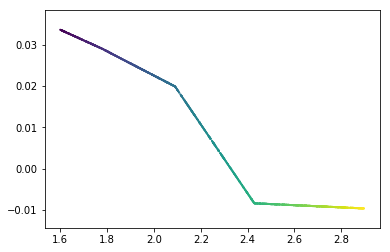

In [375]:
plt.scatter(x_train_PCA_1.cuda().view([-1,1]).detach().cpu().numpy(), Y_eps_mean_KPCA_1_1(x_train_PCA_1.cuda().view([-1,1])).detach().cpu().numpy(), c=x_train_PCA_1.cuda().view([-1,1]).detach().cpu().numpy(), s=1)
plt.show()
plt.close()

In [376]:
e_KPCA_1_1_mean = Y_eps_mean_KPCA_1_1(x_train_PCA_1.cuda().view([-1,1])).detach().cpu().numpy().reshape(-1)
e_KPCA_1_2_mean = Y_eps_mean_KPCA_1_2(x_train_PCA_2.cuda().view([-1,1])).detach().cpu().numpy().reshape(-1)
e_KPCA_234_mean = Y_eps_mean_KPCA_234(torch.FloatTensor(Y_KPCA_T_pred[:,0]).view([-1,1]).to(device)).detach().cpu().numpy()
e_KPCA_5_1_mean = Y_eps_mean_KPCA_5_1(x_train_PCA_1.cuda().view([-1,1])).detach().cpu().numpy().reshape(-1)
e_KPCA_5_2_mean = Y_eps_mean_KPCA_5_2(x_train_PCA_2.cuda().view([-1,1])).detach().cpu().numpy().reshape(-1)

e_KPCA_1_1_fix = Y_KPCA_T_1_pred[:,0] - x_train_KPCA[class_1[order_train_1],0].cpu().numpy() - e_KPCA_1_1_mean
e_KPCA_1_2_fix = Y_KPCA_T_2_pred[:,0] - x_train_KPCA[class_2[order_train_2],0].cpu().numpy() - e_KPCA_1_2_mean
e_KPCA_234_fix = Y_KPCA_T_pred[:,1:4] - x_train_KPCA[ordered_classes,1:4].cpu().numpy() - e_KPCA_234_mean
e_KPCA_5_1_fix = Y_KPCA_T_1_pred[:,4] - x_train_KPCA[class_1[order_train_1],4].cpu().numpy() - e_KPCA_5_1_mean
e_KPCA_5_2_fix = Y_KPCA_T_2_pred[:,4] - x_train_KPCA[class_2[order_train_2],4].cpu().numpy() - e_KPCA_5_2_mean

log_s_KPCA_1_1 = 0.5*np.log((e_KPCA_1_1_fix - e_KPCA_1_1_fix.mean(0))**2) 
log_s_KPCA_1_2 = 0.5*np.log((e_KPCA_1_2_fix - e_KPCA_1_2_fix.mean(0))**2)
log_s_KPCA_234 = 0.5*np.log((e_KPCA_234_fix - e_KPCA_234_fix.mean(0))**2)
log_s_KPCA_5_1 = 0.5*np.log((e_KPCA_5_1_fix - e_KPCA_5_1_fix.mean(0))**2) 
log_s_KPCA_5_2 = 0.5*np.log((e_KPCA_5_2_fix - e_KPCA_5_2_fix.mean(0))**2)

log_s_KPCA_1_1 = torch.FloatTensor(log_s_KPCA_1_1).view([-1,1]).to(device)
log_s_KPCA_1_2 = torch.FloatTensor(log_s_KPCA_1_2).view([-1,1]).to(device)
log_s_KPCA_234 = torch.FloatTensor(log_s_KPCA_234).to(device)
log_s_KPCA_5_1 = torch.FloatTensor(log_s_KPCA_5_1).view([-1,1]).to(device)
log_s_KPCA_5_2 = torch.FloatTensor(log_s_KPCA_5_2).view([-1,1]).to(device)

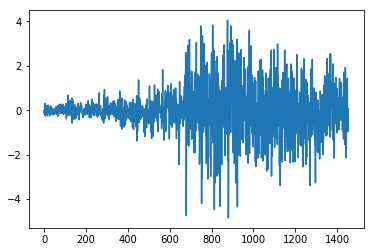

In [377]:
plt.plot(e_KPCA_5_2_fix)
plt.show()
plt.close()

In [378]:
print(e_KPCA_234_fix.mean(0))

[ 0.00702499 -0.00114279  0.01727322]


In [379]:
Y_eps_KPCA_1_1 = MLP(1, 1, 1, h1=20, h2=20).to(device)
Y_eps_KPCA_1_2 = MLP(1, 1, 1, h1=20, h2=20).to(device)
Y_eps_KPCA_234 = MLP(1, 1, 3, h1=20, h2=20).to(device)
Y_eps_KPCA_5_1 = MLP(1, 1, 1, h1=20, h2=20).to(device)
Y_eps_KPCA_5_2 = MLP(1, 1, 1, h1=20, h2=20).to(device)

In [ ]:
# Y_eps_KPCA_1_mlp.optimizer = optim.Adam(Y_eps_KPCA_1_mlp.parameters(), lr = 3e-4, weight_decay=0)
# Y_eps_KPCA_1_mlp.batch_size = 1000
# Y_eps_KPCA_1_mlp.num_epochs = 1
# Y_eps_KPCA_2_mlp.optimizer = optim.Adam(Y_eps_KPCA_2_mlp.parameters(), lr = 3e-4, weight_decay=0)
# Y_eps_KPCA_2_mlp.batch_size = 1000
# Y_eps_KPCA_2_mlp.num_epochs = 1

In [380]:
for i in range(0,10): 
    print("Iteration "+str(i+1))
    Y_eps_KPCA_1_1.train(x_train_PCA_1.cuda().view([-1,1]), log_s_KPCA_1_1)
    Y_eps_KPCA_1_2.train(x_train_PCA_2.cuda().view([-1,1]), log_s_KPCA_1_2)
    Y_eps_KPCA_234.train(torch.FloatTensor(Y_KPCA_T_1_pred[:,0]).view([-1,1]).to(device), log_s_KPCA_234)
    Y_eps_KPCA_5_1.train(x_train_PCA_1.cuda().view([-1,1]), log_s_KPCA_5_1)
    Y_eps_KPCA_5_2.train(x_train_PCA_2.cuda().view([-1,1]), log_s_KPCA_5_2)

Iteration 1
[0/100][29/30]	Loss: 1.725583
[1/100][29/30]	Loss: 0.809435
[2/100][29/30]	Loss: 1.185294
[3/100][29/30]	Loss: 1.146051
[4/100][29/30]	Loss: 2.053115
[5/100][29/30]	Loss: 2.093690
[6/100][29/30]	Loss: 1.171348
[7/100][29/30]	Loss: 1.195467
[8/100][29/30]	Loss: 1.642676
[9/100][29/30]	Loss: 1.537088
[10/100][29/30]	Loss: 1.973273
[11/100][29/30]	Loss: 0.921943
[12/100][29/30]	Loss: 1.448327
[13/100][29/30]	Loss: 1.298728
[14/100][29/30]	Loss: 1.591502
[15/100][29/30]	Loss: 1.294640
[16/100][29/30]	Loss: 1.983750
[17/100][29/30]	Loss: 1.645941
[18/100][29/30]	Loss: 1.479250
[19/100][29/30]	Loss: 2.495326
[20/100][29/30]	Loss: 0.987197
[21/100][29/30]	Loss: 1.713268
[22/100][29/30]	Loss: 2.141395
[23/100][29/30]	Loss: 2.004109
[24/100][29/30]	Loss: 0.787159
[25/100][29/30]	Loss: 1.634305
[26/100][29/30]	Loss: 1.572953
[27/100][29/30]	Loss: 1.250337
[28/100][29/30]	Loss: 1.916863
[29/100][29/30]	Loss: 1.501715
[30/100][29/30]	Loss: 2.248759
[31/100][29/30]	Loss: 1.568184
[32/10

[66/100][29/30]	Loss: 1.455489
[67/100][29/30]	Loss: 1.009655
[68/100][29/30]	Loss: 1.274027
[69/100][29/30]	Loss: 1.100751
[70/100][29/30]	Loss: 1.114415
[71/100][29/30]	Loss: 0.739832
[72/100][29/30]	Loss: 1.105658
[73/100][29/30]	Loss: 1.059686
[74/100][29/30]	Loss: 1.085156
[75/100][29/30]	Loss: 1.189723
[76/100][29/30]	Loss: 0.963477
[77/100][29/30]	Loss: 0.898111
[78/100][29/30]	Loss: 1.036765
[79/100][29/30]	Loss: 1.073720
[80/100][29/30]	Loss: 1.204376
[81/100][29/30]	Loss: 0.856716
[82/100][29/30]	Loss: 1.093558
[83/100][29/30]	Loss: 1.764994
[84/100][29/30]	Loss: 0.683910
[85/100][29/30]	Loss: 1.142729
[86/100][29/30]	Loss: 1.053766
[87/100][29/30]	Loss: 0.919270
[88/100][29/30]	Loss: 1.949753
[89/100][29/30]	Loss: 1.169266
[90/100][29/30]	Loss: 1.260723
[91/100][29/30]	Loss: 1.340687
[92/100][29/30]	Loss: 1.240926
[93/100][29/30]	Loss: 0.803990
[94/100][29/30]	Loss: 0.949562
[95/100][29/30]	Loss: 0.971632
[96/100][29/30]	Loss: 1.284086
[97/100][29/30]	Loss: 1.265329
[98/100]

[34/100][29/30]	Loss: 1.237322
[35/100][29/30]	Loss: 1.212487
[36/100][29/30]	Loss: 1.043624
[37/100][29/30]	Loss: 1.131803
[38/100][29/30]	Loss: 0.927674
[39/100][29/30]	Loss: 1.131053
[40/100][29/30]	Loss: 1.706268
[41/100][29/30]	Loss: 0.968502
[42/100][29/30]	Loss: 0.734900
[43/100][29/30]	Loss: 1.230853
[44/100][29/30]	Loss: 1.207939
[45/100][29/30]	Loss: 1.147628
[46/100][29/30]	Loss: 1.029126
[47/100][29/30]	Loss: 1.031669
[48/100][29/30]	Loss: 1.173166
[49/100][29/30]	Loss: 0.663720
[50/100][29/30]	Loss: 1.303466
[51/100][29/30]	Loss: 1.244611
[52/100][29/30]	Loss: 1.747869
[53/100][29/30]	Loss: 0.989674
[54/100][29/30]	Loss: 1.422690
[55/100][29/30]	Loss: 1.461335
[56/100][29/30]	Loss: 0.856844
[57/100][29/30]	Loss: 1.211211
[58/100][29/30]	Loss: 1.199684
[59/100][29/30]	Loss: 1.288183
[60/100][29/30]	Loss: 0.861852
[61/100][29/30]	Loss: 1.289847
[62/100][29/30]	Loss: 1.344086
[63/100][29/30]	Loss: 2.117046
[64/100][29/30]	Loss: 0.734534
[65/100][29/30]	Loss: 1.150640
[66/100]

KeyboardInterrupt: 

In [381]:
Y_var_KPCA_1_1 = np.exp(Y_eps_KPCA_1_1(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy())**2
Y_var_KPCA_1_2 = np.exp(Y_eps_KPCA_1_2(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy())**2
Y_var_KPCA_5_1 = np.exp(Y_eps_KPCA_5_1(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy())**2
Y_var_KPCA_5_2 = np.exp(Y_eps_KPCA_5_2(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy())**2

e_KPCA_1_1_mean_ = Y_eps_mean_KPCA_1_1(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy().reshape(-1)
e_KPCA_1_2_mean_ = Y_eps_mean_KPCA_1_2(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy().reshape(-1)
e_KPCA_5_1_mean_ = Y_eps_mean_KPCA_5_1(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy().reshape(-1)
e_KPCA_5_2_mean_ = Y_eps_mean_KPCA_5_2(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy().reshape(-1)

index = np.random.randint(2, size=(temps_1.shape[0]))
Y_KPCA_1_1_noise = Y_KPCA_1_1 + np.random.randn(*Y_KPCA_1_1.shape)*(Y_var_KPCA_1_1**0.5)# -  e_KPCA_1_1_mean_
Y_KPCA_1_2_noise = Y_KPCA_1_2 + np.random.randn(*Y_KPCA_1_2.shape)*(Y_var_KPCA_1_2**0.5)# -  e_KPCA_1_2_mean_
Y_KPCA_5_1_noise = Y_KPCA_5_1 + np.random.randn(*Y_KPCA_5_1.shape)*(Y_var_KPCA_5_1**0.5)# -  e_KPCA_5_1_mean_ 
Y_KPCA_5_2_noise = Y_KPCA_5_2 + np.random.randn(*Y_KPCA_5_2.shape)*(Y_var_KPCA_5_2**0.5)# -  e_KPCA_5_2_mean_ 
Y_KPCA_1_noise = np.concatenate([Y_KPCA_1_1_noise.reshape([-1,1,1]),Y_KPCA_1_2_noise.reshape([-1,1,1])], 2)[np.arange(temps_1.shape[0]),:,index].reshape([-1,1])
Y_KPCA_5_noise = np.concatenate([Y_KPCA_5_1_noise.reshape([-1,1,1]),Y_KPCA_5_2_noise.reshape([-1,1,1])], 2)[np.arange(temps_1.shape[0]),:,index].reshape([-1,1])

e_KPCA_234_mean_ = Y_eps_mean_KPCA_234(torch.FloatTensor(Y_KPCA_1_noise).view([-1,1]).to(device)).detach().cpu().numpy()
Y_KPCA_234 = Y_f_KPCA_234(torch.FloatTensor(Y_KPCA_1_noise).to(device)).detach().cpu().numpy()
Y_sigma_KPCA_234 = np.exp(Y_eps_KPCA_234(torch.FloatTensor(Y_KPCA_1_noise).to(device)).detach().cpu().numpy())
Y_KPCA_234_noise = Y_KPCA_234 + np.random.randn(*Y_KPCA_234.shape)*(Y_sigma_KPCA_234)# -  e_KPCA_234_mean_ 

Y_KPCA_T_noise = np.concatenate([Y_KPCA_1_noise, Y_KPCA_234_noise, Y_KPCA_5_noise], 1)

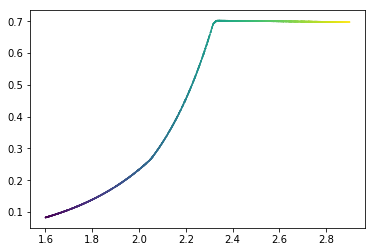

In [382]:
plt.scatter(temps_1, Y_var_KPCA_5_2[:,0]**0.5, c=temps_1, s=0.3)
plt.show()
plt.close()

In [383]:
Y_KPCA_T_torch = torch.FloatTensor(Y_KPCA_T_noise).to(device)
X_KPCA_T = pi_KPCA(Y_KPCA_T_torch)
r_KPCA = torch.rand_like(X_KPCA_T)
X_KPCA_T = (X_KPCA_T > r_KPCA)

In [384]:
c = X_KPCA_T[3,:].detach().cpu().numpy().reshape([L,L]).astype(np.float32)*2-1
calculate_energy(c)

-1200.0

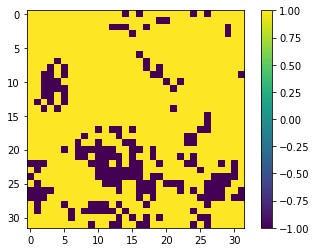

In [385]:
plt.imshow(c)
plt.colorbar()
plt.show()
plt.close()

In [386]:
temps_1_logZ = logsumexp(-(energy_vector/temps_1.reshape(-1)).T + log_density_of_states, axis=1)
temps_2_logZ = logsumexp(-(energy_vector/temps_2[-600:].reshape(-1)).T + log_density_of_states, axis=1)

In [387]:
energies_KPCA_T = np.zeros([X_KPCA_T.shape[0],1])
for sample in range(0,X_KPCA_T.shape[0]):
    configuration = X_KPCA_T[sample,:].reshape([L,L]).cpu().numpy().astype(np.float32)*2-1
    energies_KPCA_T[sample,0] = calculate_energy(configuration)
    
conditional_llklhoods_KPCA_T = -energies_KPCA_T.reshape(-1)/temps_1.reshape(-1) - temps_1_logZ.reshape(-1)
llklhood_KPCA_T = (conditional_llklhoods_KPCA_T).sum()

pE_KPCA_T = np.histogram(energies_KPCA_T, bins=energy_bins.reshape(-1))[0]/temps_1.shape[0]
KLdiv_KPCA_T = kl_div(pE_KPCA_T, pE).sum()

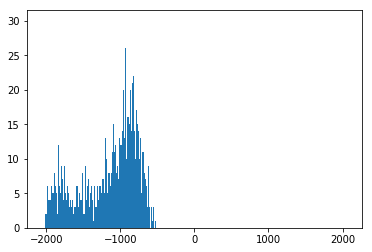

In [388]:
plt.hist(energies_KPCA_T, bins=energy_bins)
plt.show()
plt.close()

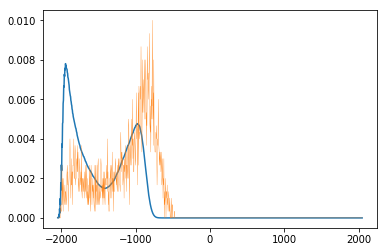

In [389]:
plt.plot(energy_vector, pE)
plt.plot(energy_vector, pE_KPCA_T, linewidth=0.3)
plt.show()
plt.close()

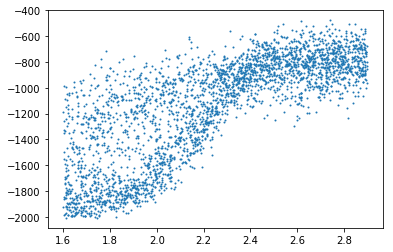

In [392]:
plt.scatter(temps_1, energies_KPCA_T, s=1)
plt.show()
plt.close()

In [393]:
energies_KPCA_T_mlp_map = np.zeros([600,1])
for sample in range(0,600):
    configuration = y_predd_KPCA[sample,:].reshape([L,L]).cpu().numpy().astype(np.float32)*2-1
    energies_KPCA_T_mlp_map[sample,0] = calculate_energy(configuration)
    
conditional_llklhoods_KPCA_T_mlp_map = -energies_KPCA_T_mlp_map.reshape(-1)/temps_2[-600:].reshape(-1) - temps_2_logZ.reshape(-1)
llklhood_KPCA_T_mlp_map = (conditional_llklhoods_KPCA_T_mlp_map).sum()

pE_KPCA_T_mlp_map = np.histogram(energies_KPCA_T_mlp_map, bins=energy_bins.reshape(-1))[0]/600
KLdiv_KPCA_T_mlp_map = kl_div(pE_KPCA_T_mlp_map, pE).sum()

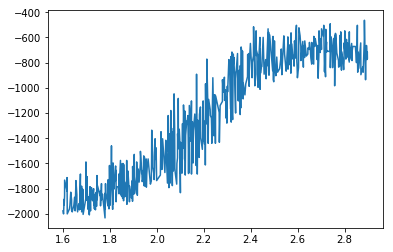

In [394]:
plt.plot(np.sort(temps_2[-600:]), energies_KPCA_T_mlp_map[np.argsort(temps_2[-600:])])
plt.show()
plt.close()

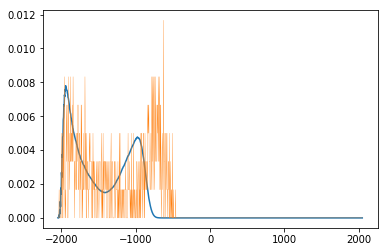

In [395]:
plt.plot(energy_vector, pE)
plt.plot(energy_vector, pE_KPCA_T_mlp_map, linewidth=0.3)
plt.show()
plt.close()

In [396]:
print("KL-div Met: %.6e" % KLdiv_metropolis)
print("KL-div PCA: %.6e" % KLdiv_PCA_T)
print("KL-div KPCA: %.6e" % KLdiv_KPCA_T)
print("KL-div AE: %.6e" % KLdiv_AE_T)
print("KL-div VAE: %.6e" % KLdiv_VAE_T)

KL-div Met: 2.067468e-02
KL-div PCA: 2.318016e+01
KL-div KPCA: 1.299794e+00


NameError: name 'KLdiv_AE_T' is not defined

In [553]:
def jsdiv(P, Q):
    """Compute the Jensen-Shannon divergence between two probability distributions.

    Input
    -----
    P, Q : array-like
        Probability distributions of equal length that sum to 1
    """

    def _kldiv(A, B):
        return np.sum([v for v in A * np.log(A/B) if not np.isnan(v)])

    P = np.array(P)
    Q = np.array(Q)

    M = 0.5 * (P + Q)

    return 0.5 * (_kldiv(P, M) +_kldiv(Q, M))

In [554]:
jsdiv(pE,pE_KPCA_T)

/home/dg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()
/home/dg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/dg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in multiply
  # This is added back by InteractiveShellApp.init_path()


0.13550378946614877

## AE

In [497]:
x_train_AE_1 = torch.FloatTensor(temps_1[class_1]).to(device)
x_train_AE_2 = torch.FloatTensor(temps_1[class_2]).to(device)
x_test_AE_1 = torch.FloatTensor(temps_2[class_1_2]).to(device)
x_test_AE_2 = torch.FloatTensor(temps_2[class_2_2]).to(device)
y_train_AE_1 = torch.FloatTensor((Y_AE[class_1, :]-Y_AE[class_1, :].mean(0))/Y_AE[class_1, :].std(0)).to(device)
y_train_AE_2 = torch.FloatTensor((Y_AE[class_2, :]-Y_AE[class_2, :].mean(0))/Y_AE[class_2, :].std(0)).to(device)
y_test_AE_1 = torch.FloatTensor((Y_AE[class_1_2, :]-Y_AE[class_1_2, :].mean(0))/Y_AE[class_1_2, :].std(0)).to(device)
y_test_AE_2 = torch.FloatTensor((Y_AE[class_2_2, :]-Y_AE[class_2_2, :].mean(0))/Y_AE[class_2_2, :].std(0)).to(device)

In [498]:
Y_f_AE_1 = MLP(1, 1, t_AE, h1=50, h2=50).to(device)
Y_f_AE_2 = MLP(1, 1, t_AE, h1=50, h2=50).to(device)

In [499]:
for i in range(0,20): 
    print("Iteration "+str(i+1))
    Y_f_AE_1.train(x_train_AE_1.view([-1,1]), y_train_AE_1)
    Y_f_AE_2.train(x_train_AE_2.view([-1,1]), y_train_AE_2)

Iteration 1
[0/100][29/30]	Loss: 0.861876
[1/100][29/30]	Loss: 0.252781
[2/100][29/30]	Loss: 0.213143
[3/100][29/30]	Loss: 0.195389
[4/100][29/30]	Loss: 0.312144
[5/100][29/30]	Loss: 0.136713
[6/100][29/30]	Loss: 0.186734
[7/100][29/30]	Loss: 0.214783
[8/100][29/30]	Loss: 0.187474
[9/100][29/30]	Loss: 0.149825
[10/100][29/30]	Loss: 0.211103
[11/100][29/30]	Loss: 0.157198
[12/100][29/30]	Loss: 0.175891
[13/100][29/30]	Loss: 0.190918
[14/100][29/30]	Loss: 0.175953
[15/100][29/30]	Loss: 0.116516
[16/100][29/30]	Loss: 0.164056
[17/100][29/30]	Loss: 0.251186
[18/100][29/30]	Loss: 0.197296
[19/100][29/30]	Loss: 0.169674
[20/100][29/30]	Loss: 0.156103
[21/100][29/30]	Loss: 0.193653
[22/100][29/30]	Loss: 0.162459
[23/100][29/30]	Loss: 0.177472
[24/100][29/30]	Loss: 0.141249
[25/100][29/30]	Loss: 0.161128
[26/100][29/30]	Loss: 0.173022
[27/100][29/30]	Loss: 0.209209
[28/100][29/30]	Loss: 0.134421
[29/100][29/30]	Loss: 0.172457
[30/100][29/30]	Loss: 0.154209
[31/100][29/30]	Loss: 0.188150
[32/10

[66/100][29/30]	Loss: 0.121138
[67/100][29/30]	Loss: 0.119206
[68/100][29/30]	Loss: 0.182832
[69/100][29/30]	Loss: 0.183639
[70/100][29/30]	Loss: 0.126848
[71/100][29/30]	Loss: 0.140166
[72/100][29/30]	Loss: 0.177495
[73/100][29/30]	Loss: 0.130402
[74/100][29/30]	Loss: 0.125010
[75/100][29/30]	Loss: 0.187132
[76/100][29/30]	Loss: 0.149283
[77/100][29/30]	Loss: 0.125856
[78/100][29/30]	Loss: 0.126437
[79/100][29/30]	Loss: 0.144347
[80/100][29/30]	Loss: 0.104186
[81/100][29/30]	Loss: 0.122979
[82/100][29/30]	Loss: 0.106133
[83/100][29/30]	Loss: 0.124534
[84/100][29/30]	Loss: 0.096277
[85/100][29/30]	Loss: 0.099733
[86/100][29/30]	Loss: 0.151275
[87/100][29/30]	Loss: 0.186408
[88/100][29/30]	Loss: 0.145361
[89/100][29/30]	Loss: 0.135729
[90/100][29/30]	Loss: 0.196193
[91/100][29/30]	Loss: 0.149312
[92/100][29/30]	Loss: 0.176210
[93/100][29/30]	Loss: 0.281602
[94/100][29/30]	Loss: 0.125808
[95/100][29/30]	Loss: 0.142237
[96/100][29/30]	Loss: 0.291722
[97/100][29/30]	Loss: 0.149715
[98/100]

[31/100][28/29]	Loss: 0.170765
[32/100][28/29]	Loss: 0.198709
[33/100][28/29]	Loss: 0.150335
[34/100][28/29]	Loss: 0.203752
[35/100][28/29]	Loss: 0.170486
[36/100][28/29]	Loss: 0.160570
[37/100][28/29]	Loss: 0.123090
[38/100][28/29]	Loss: 0.161350
[39/100][28/29]	Loss: 0.188819
[40/100][28/29]	Loss: 0.114084
[41/100][28/29]	Loss: 0.205328
[42/100][28/29]	Loss: 0.128673
[43/100][28/29]	Loss: 0.089893
[44/100][28/29]	Loss: 0.178134
[45/100][28/29]	Loss: 0.142494
[46/100][28/29]	Loss: 0.118864
[47/100][28/29]	Loss: 0.258298
[48/100][28/29]	Loss: 0.109582
[49/100][28/29]	Loss: 0.156476
[50/100][28/29]	Loss: 0.181810
[51/100][28/29]	Loss: 0.156682
[52/100][28/29]	Loss: 0.236655
[53/100][28/29]	Loss: 0.114652
[54/100][28/29]	Loss: 0.136866
[55/100][28/29]	Loss: 0.176545
[56/100][28/29]	Loss: 0.177222
[57/100][28/29]	Loss: 0.125099
[58/100][28/29]	Loss: 0.116191
[59/100][28/29]	Loss: 0.189701
[60/100][28/29]	Loss: 0.208524
[61/100][28/29]	Loss: 0.179751
[62/100][28/29]	Loss: 0.186435
[63/100]

KeyboardInterrupt: 

In [500]:
Y_AE_1 = Y_f_AE_1(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy()*Y_AE[class_1, :].std(0) + Y_AE[class_1, :].mean(0)
Y_AE_2 = Y_f_AE_2(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy()*Y_AE[class_2, :].std(0) + Y_AE[class_2, :].mean(0)

index = np.random.randint(2, size=(temps_1.shape[0]))
Y_AE_T = np.concatenate([Y_AE_1.reshape([-1,t_AE,1]),Y_AE_2.reshape([-1,t_AE,1])], 2)[np.arange(temps_1.shape[0]),:,index]

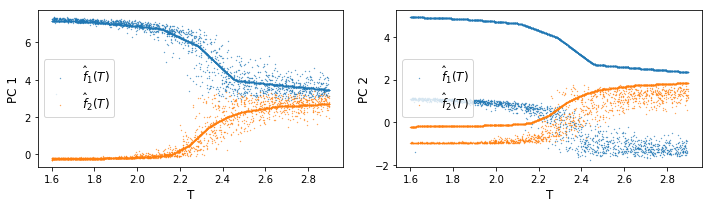

In [503]:
with torch.no_grad():
    f, ax = plt.subplots(1, 2, figsize=(10, 3))
    ax[0].scatter(temps_1[class_1], y_train_AE_1[:,0].cpu().numpy()*Y_AE[class_1,0].std(0) + Y_AE[class_1,0].mean(0), s=0.1)
    ax[0].scatter(temps_1, Y_AE_1[:,0], s=0.1, c='C0', label=r'$\hat{f}_1(T)$')
    ax[0].scatter(temps_1[class_2], y_train_AE_2[:,0].cpu().numpy()*Y_AE[class_2,0].std(0) + Y_AE[class_2,0].mean(0), s=0.1)
    ax[0].scatter(temps_1, Y_AE_2[:,0], s=0.1, c='C1', label=r'$\hat{f}_2(T)$')
    ax[0].set_ylabel('PC 1', fontsize=12)
    ax[0].set_xlabel('T', fontsize=12)
    ax[0].legend(fontsize=12)
    
    ax[1].scatter(temps_1[class_1], y_train_AE_1[:,1].cpu().numpy(), s=0.1)
    ax[1].scatter(temps_1, Y_AE_1[:,1], s=0.1, c='C0', label=r'$\hat{f}_1(T)$')
    ax[1].scatter(temps_1[class_2], y_train_AE_2[:,1].cpu().numpy(), s=0.1)
    ax[1].scatter(temps_1, Y_AE_2[:,1], s=0.1, c='C1', label=r'$\hat{f}_2(T)$')
    ax[1].set_ylabel('PC 2', fontsize=12)
    ax[1].set_xlabel('T', fontsize=12)
    ax[1].legend(fontsize=12)
    

    f.tight_layout()
    plt.savefig('Branch_Ising_AE.png', dpi=300)
    plt.show()
    plt.close()

In [504]:
Y_AE_1_pred = Y_f_AE_1(x_train_AE_1.view([-1,1])).detach().cpu().numpy()
Y_AE_2_pred = Y_f_AE_2(x_train_AE_2.view([-1,1])).detach().cpu().numpy()
Y_AE_T_pred = np.concatenate([Y_AE_1_pred, Y_AE_2_pred], 0)

In [505]:
e_AE_1 = Y_AE_1_pred - y_train_AE_1.cpu().numpy()
e_AE_2 = Y_AE_2_pred - y_train_AE_2.cpu().numpy()

e_AE_1 = torch.FloatTensor(e_AE_1).to(device)
e_AE_2 = torch.FloatTensor(e_AE_2).to(device)

In [506]:
Y_eps_mean_AE_1 = MLP(1, 1, t_AE, h1=50, h2=50).to(device)
Y_eps_mean_AE_2 = MLP(1, 1, t_AE, h1=50, h2=50).to(device)

In [507]:
for i in range(0,10): 
    print("Iteration "+str(i+1))
    Y_eps_mean_AE_1.train(x_train_AE_1.view([-1,1]), e_AE_1)
    Y_eps_mean_AE_2.train(x_train_AE_2.view([-1,1]), e_AE_2)

Iteration 1
[0/100][29/30]	Loss: 0.123949
[1/100][29/30]	Loss: 0.072909
[2/100][29/30]	Loss: 0.132159
[3/100][29/30]	Loss: 0.104678
[4/100][29/30]	Loss: 0.230772
[5/100][29/30]	Loss: 0.200781
[6/100][29/30]	Loss: 0.133735
[7/100][29/30]	Loss: 0.200170
[8/100][29/30]	Loss: 0.159172
[9/100][29/30]	Loss: 0.088325
[10/100][29/30]	Loss: 0.120618
[11/100][29/30]	Loss: 0.158952
[12/100][29/30]	Loss: 0.147153
[13/100][29/30]	Loss: 0.126622
[14/100][29/30]	Loss: 0.180247
[15/100][29/30]	Loss: 0.146989
[16/100][29/30]	Loss: 0.138167
[17/100][29/30]	Loss: 0.094822
[18/100][29/30]	Loss: 0.152176
[19/100][29/30]	Loss: 0.090087
[20/100][29/30]	Loss: 0.133765
[21/100][29/30]	Loss: 0.177763
[22/100][29/30]	Loss: 0.156319
[23/100][29/30]	Loss: 0.172354
[24/100][29/30]	Loss: 0.156234
[25/100][29/30]	Loss: 0.089819
[26/100][29/30]	Loss: 0.108126
[27/100][29/30]	Loss: 0.101928
[28/100][29/30]	Loss: 0.094544
[29/100][29/30]	Loss: 0.169485
[30/100][29/30]	Loss: 0.136725
[31/100][29/30]	Loss: 0.176821
[32/10

KeyboardInterrupt: 

In [508]:
e_AE_1_mean = Y_eps_mean_AE_1(x_train_AE_1.view([-1,1])).detach().cpu().numpy()
e_AE_2_mean = Y_eps_mean_AE_2(x_train_AE_2.view([-1,1])).detach().cpu().numpy()

e_AE_1_fix = Y_AE_1_pred - y_train_AE_1.cpu().numpy() - e_AE_1_mean
e_AE_2_fix = Y_AE_2_pred - y_train_AE_2.cpu().numpy() - e_AE_2_mean

log_s_AE_1 = 0.5*np.log((e_AE_1_fix - e_AE_1_fix.mean(0))**2) 
log_s_AE_2 = 0.5*np.log((e_AE_2_fix - e_AE_2_fix.mean(0))**2)

log_s_AE_1 = torch.FloatTensor(log_s_AE_1).to(device)
log_s_AE_2 = torch.FloatTensor(log_s_AE_2).to(device)

In [509]:
Y_eps_AE_1 = MLP(1, 1, t_AE, h1=50, h2=50).to(device)
Y_eps_AE_2 = MLP(1, 1, t_AE, h1=50, h2=50).to(device)

In [510]:
for i in range(0,10): 
    print("Iteration "+str(i+1))
    Y_eps_AE_1.train(x_train_AE_1.view([-1,1]), log_s_AE_1)
    Y_eps_AE_2.train(x_train_AE_2.view([-1,1]), log_s_AE_2)

Iteration 1
[0/100][29/30]	Loss: 2.786339
[1/100][29/30]	Loss: 1.913546
[2/100][29/30]	Loss: 1.814627
[3/100][29/30]	Loss: 1.812134
[4/100][29/30]	Loss: 1.611922
[5/100][29/30]	Loss: 1.010270
[6/100][29/30]	Loss: 1.090765
[7/100][29/30]	Loss: 1.278639
[8/100][29/30]	Loss: 1.407114
[9/100][29/30]	Loss: 1.526618
[10/100][29/30]	Loss: 1.952892
[11/100][29/30]	Loss: 1.308951
[12/100][29/30]	Loss: 1.359158
[13/100][29/30]	Loss: 1.178235
[14/100][29/30]	Loss: 1.044600
[15/100][29/30]	Loss: 1.411583
[16/100][29/30]	Loss: 1.371964
[17/100][29/30]	Loss: 1.444489
[18/100][29/30]	Loss: 0.960810
[19/100][29/30]	Loss: 1.367571
[20/100][29/30]	Loss: 1.300841
[21/100][29/30]	Loss: 1.143212
[22/100][29/30]	Loss: 1.190500
[23/100][29/30]	Loss: 1.067327
[24/100][29/30]	Loss: 1.440393
[25/100][29/30]	Loss: 1.189979
[26/100][29/30]	Loss: 1.292368
[27/100][29/30]	Loss: 1.316932
[28/100][29/30]	Loss: 1.279704
[29/100][29/30]	Loss: 1.718143
[30/100][29/30]	Loss: 1.523270
[31/100][29/30]	Loss: 1.191323
[32/10

[68/100][29/30]	Loss: 1.122776
[69/100][29/30]	Loss: 1.141767
[70/100][29/30]	Loss: 1.151289
[71/100][29/30]	Loss: 1.166033
[72/100][29/30]	Loss: 1.146633
[73/100][29/30]	Loss: 1.161463
[74/100][29/30]	Loss: 0.979670
[75/100][29/30]	Loss: 1.184233
[76/100][29/30]	Loss: 1.466008
[77/100][29/30]	Loss: 1.080609
[78/100][29/30]	Loss: 1.192789
[79/100][29/30]	Loss: 1.169182
[80/100][29/30]	Loss: 1.191706
[81/100][29/30]	Loss: 1.093943
[82/100][29/30]	Loss: 0.924440
[83/100][29/30]	Loss: 0.953529
[84/100][29/30]	Loss: 1.262268
[85/100][29/30]	Loss: 1.373431
[86/100][29/30]	Loss: 1.215147
[87/100][29/30]	Loss: 0.789137
[88/100][29/30]	Loss: 1.585377
[89/100][29/30]	Loss: 1.083991
[90/100][29/30]	Loss: 1.223514
[91/100][29/30]	Loss: 1.266821
[92/100][29/30]	Loss: 1.302706
[93/100][29/30]	Loss: 0.955928
[94/100][29/30]	Loss: 1.515725
[95/100][29/30]	Loss: 1.050388
[96/100][29/30]	Loss: 1.178666
[97/100][29/30]	Loss: 1.220588
[98/100][29/30]	Loss: 1.314906
[99/100][29/30]	Loss: 1.093316
[0/100][

[35/100][28/29]	Loss: 0.976626
[36/100][28/29]	Loss: 0.960677
[37/100][28/29]	Loss: 1.392097
[38/100][28/29]	Loss: 0.888799
[39/100][28/29]	Loss: 1.439866
[40/100][28/29]	Loss: 1.253567
[41/100][28/29]	Loss: 1.268358
[42/100][28/29]	Loss: 1.091300
[43/100][28/29]	Loss: 1.323359
[44/100][28/29]	Loss: 1.143808
[45/100][28/29]	Loss: 1.044324
[46/100][28/29]	Loss: 1.354233
[47/100][28/29]	Loss: 1.093698
[48/100][28/29]	Loss: 1.117016
[49/100][28/29]	Loss: 1.238133
[50/100][28/29]	Loss: 0.966307
[51/100][28/29]	Loss: 1.308310
[52/100][28/29]	Loss: 1.044563
[53/100][28/29]	Loss: 1.061946
[54/100][28/29]	Loss: 0.897084
[55/100][28/29]	Loss: 1.184109
[56/100][28/29]	Loss: 1.251583
[57/100][28/29]	Loss: 1.143673
[58/100][28/29]	Loss: 1.148206
[59/100][28/29]	Loss: 1.190827
[60/100][28/29]	Loss: 0.990483
[61/100][28/29]	Loss: 1.238461
[62/100][28/29]	Loss: 1.210542
[63/100][28/29]	Loss: 1.557408
[64/100][28/29]	Loss: 1.187364


KeyboardInterrupt: 

In [511]:
Y_var_AE_1 = np.exp(Y_eps_AE_1(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy())**2
Y_var_AE_2 = np.exp(Y_eps_AE_2(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy())**2

e_AE_1_mean_ = Y_eps_mean_AE_1(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy()
e_AE_2_mean_ = Y_eps_mean_AE_2(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy()

index = np.random.randint(2, size=(temps_1.shape[0]))
Y_AE_1_noise = Y_AE_1 + np.random.randn(*Y_AE_1.shape)*(Y_var_AE_1**0.5)# -  e_KPCA_1_1_mean_
Y_AE_2_noise = Y_AE_2 + np.random.randn(*Y_AE_2.shape)*(Y_var_AE_2**0.5)# -  e_KPCA_1_2_mean_
Y_AE_1_noise_scaled = Y_AE_1_noise*Y_AE[class_1,0].std(0) + Y_AE[class_1,0].mean(0)
Y_AE_2_noise_scaled = Y_AE_2_noise*Y_AE[class_2,0].std(0) + Y_AE[class_2,0].mean(0)
Y_AE_noise = np.concatenate([Y_AE_1_noise_scaled.reshape([-1,t_AE,1]),Y_AE_2_noise_scaled.reshape([-1,t_AE,1])], 2)[np.arange(temps_1.shape[0]),:,index]

In [512]:
Y_AE_T_torch = torch.FloatTensor(Y_AE_noise).to(device)
X_AE_T = net_AE.forward_x(Y_AE_T_torch)
r_AE = torch.rand_like(X_AE_T)
X_AE_T = (X_AE_T > r_AE)

In [515]:
energies_AE_T = np.zeros([X_AE_T.shape[0],1])
for sample in range(0,X_AE_T.shape[0]):
    configuration = X_AE_T[sample,:].reshape([L,L]).cpu().numpy().astype(np.float32)*2-1
    energies_AE_T[sample,0] = calculate_energy(configuration)
    
conditional_llklhoods_AE_T = -energies_AE_T.reshape(-1)/temps_1.reshape(-1) - temps_1_logZ.reshape(-1)
llklhood_AE_T = (conditional_llklhoods_AE_T).sum()

pE_AE_T = np.histogram(energies_AE_T, bins=energy_bins.reshape(-1))[0]/temps_1.shape[0]
KLdiv_AE_T = kl_div(pE_AE_T, pE).sum()

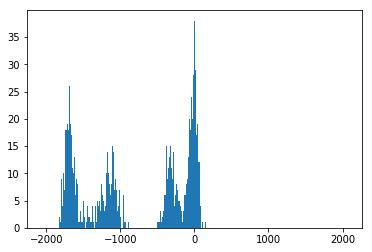

In [516]:
plt.hist(energies_AE_T, bins=energy_bins)
plt.show()
plt.close()

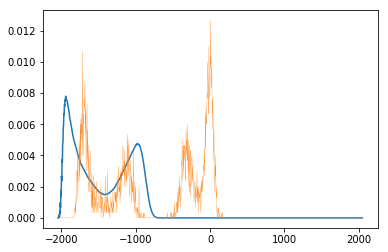

In [517]:
plt.plot(energy_vector, pE)
plt.plot(energy_vector, pE_AE_T, linewidth=0.3)
plt.show()
plt.close()

## VAE

In [453]:
x_train_VAE_1 = torch.FloatTensor(temps_1[class_1]).to(device)
x_train_VAE_2 = torch.FloatTensor(temps_1[class_2]).to(device)
x_test_VAE_1 = torch.FloatTensor(temps_2[class_1_2]).to(device)
x_test_VAE_2 = torch.FloatTensor(temps_2[class_2_2]).to(device)
y_train_VAE_1 = torch.FloatTensor(Y_VAE[class_1, :]).to(device)
y_train_VAE_2 = torch.FloatTensor(Y_VAE[class_2, :]).to(device)
y_test_VAE_1 = torch.FloatTensor(Y_VAE[class_1_2, :]).to(device)
y_test_VAE_2 = torch.FloatTensor(Y_VAE[class_2_2, :]).to(device)

In [454]:
Y_f_VAE_1 = MLP(1, 1, t_VAE, h1=100, h2=100).to(device)
Y_f_VAE_2 = MLP(1, 1, t_VAE, h1=100, h2=100).to(device)

In [475]:
Y_f_VAE_1.optimizer = optim.Adam(Y_f_VAE_1.parameters(), lr=3e-5)
Y_f_VAE_2.optimizer = optim.Adam(Y_f_VAE_2.parameters(), lr=3e-5)

In [476]:
for i in range(0,20): 
    print("Iteration "+str(i+1))
    Y_f_VAE_1.train(x_train_VAE_1.view([-1,1]), y_train_VAE_1)
    Y_f_VAE_2.train(x_train_VAE_2.view([-1,1]), y_train_VAE_2)

Iteration 1
[0/100][29/30]	Loss: 0.000697
[1/100][29/30]	Loss: 0.000817
[2/100][29/30]	Loss: 0.000388
[3/100][29/30]	Loss: 0.000557
[4/100][29/30]	Loss: 0.000601
[5/100][29/30]	Loss: 0.000248
[6/100][29/30]	Loss: 0.000322
[7/100][29/30]	Loss: 0.000514
[8/100][29/30]	Loss: 0.001484
[9/100][29/30]	Loss: 0.000763
[10/100][29/30]	Loss: 0.000563
[11/100][29/30]	Loss: 0.000631
[12/100][29/30]	Loss: 0.000467
[13/100][29/30]	Loss: 0.000494
[14/100][29/30]	Loss: 0.000370
[15/100][29/30]	Loss: 0.000645
[16/100][29/30]	Loss: 0.000838
[17/100][29/30]	Loss: 0.000264
[18/100][29/30]	Loss: 0.000685
[19/100][29/30]	Loss: 0.000924
[20/100][29/30]	Loss: 0.000750
[21/100][29/30]	Loss: 0.002044
[22/100][29/30]	Loss: 0.000656
[23/100][29/30]	Loss: 0.000796
[24/100][29/30]	Loss: 0.000653
[25/100][29/30]	Loss: 0.000548
[26/100][29/30]	Loss: 0.000577
[27/100][29/30]	Loss: 0.000416
[28/100][29/30]	Loss: 0.000616
[29/100][29/30]	Loss: 0.002131
[30/100][29/30]	Loss: 0.000465
[31/100][29/30]	Loss: 0.000665
[32/10

KeyboardInterrupt: 

In [477]:
Y_VAE_1 = Y_f_VAE_1(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy()
Y_VAE_2 = Y_f_VAE_2(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy()

index = np.random.randint(2, size=(temps_1.shape[0]))
Y_VAE_T = np.concatenate([Y_VAE_1.reshape([-1,t_VAE,1]),Y_VAE_2.reshape([-1,t_VAE,1])], 2)[np.arange(temps_1.shape[0]),:,index]

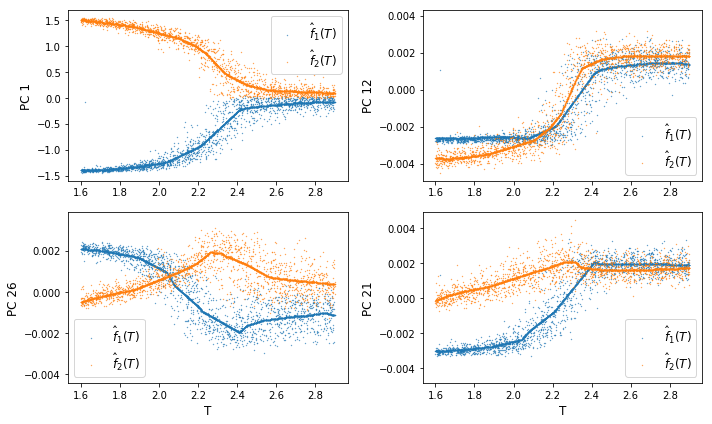

In [478]:
with torch.no_grad():
    f, ax = plt.subplots(2, 2, figsize=(10, 6))
    ax[0,0].scatter(temps_1[class_1], y_train_VAE_1[:,np.flip(np.argsort(Y_VAE.std(0)))[0]].cpu().numpy(), s=0.1)
    ax[0,0].scatter(temps_1, Y_VAE_1[:,np.flip(np.argsort(Y_VAE.std(0)))[0]], s=0.1, c='C0', label=r'$\hat{f}_1(T)$')
    ax[0,0].scatter(temps_1[class_2], y_train_VAE_2[:,np.flip(np.argsort(Y_VAE.std(0)))[0]].cpu().numpy(), s=0.1)
    ax[0,0].scatter(temps_1, Y_VAE_2[:,np.flip(np.argsort(Y_VAE.std(0)))[0]], s=0.1, c='C1', label=r'$\hat{f}_2(T)$')
    ax[0,0].set_ylabel('PC 1', fontsize=12)
    ax[0,0].legend(fontsize=12)
    
    ax[0,1].scatter(temps_1[class_1], y_train_VAE_1[:,np.flip(np.argsort(Y_VAE.std(0)))[12]].cpu().numpy(), s=0.1)
    ax[0,1].scatter(temps_1, Y_VAE_1[:,np.flip(np.argsort(Y_VAE.std(0)))[12]], s=0.1, c='C0', label=r'$\hat{f}_1(T)$')
    ax[0,1].scatter(temps_1[class_2], y_train_VAE_2[:,np.flip(np.argsort(Y_VAE.std(0)))[12]].cpu().numpy(), s=0.1)
    ax[0,1].scatter(temps_1, Y_VAE_2[:,np.flip(np.argsort(Y_VAE.std(0)))[12]], s=0.1, c='C1', label=r'$\hat{f}_2(T)$')
    ax[0,1].set_ylabel('PC 12', fontsize=12)
    ax[0,1].legend(fontsize=12)
    
    ax[1,0].scatter(temps_1[class_1], y_train_VAE_1[:,np.flip(np.argsort(Y_VAE.std(0)))[26]].cpu().numpy(), s=0.1)
    ax[1,0].scatter(temps_1, Y_VAE_1[:,np.flip(np.argsort(Y_VAE.std(0)))[26]], s=0.1, c='C0', label=r'$\hat{f}_1(T)$')
    ax[1,0].scatter(temps_1[class_2], y_train_VAE_2[:,np.flip(np.argsort(Y_VAE.std(0)))[26]].cpu().numpy(), s=0.1)
    ax[1,0].scatter(temps_1, Y_VAE_2[:,np.flip(np.argsort(Y_VAE.std(0)))[26]], s=0.1, c='C1', label=r'$\hat{f}_2(T)$')
    ax[1,0].set_ylabel('PC 26', fontsize=12)
    ax[1,0].set_xlabel('T', fontsize=12)
    ax[1,0].legend(fontsize=12)
    
    ax[1,1].scatter(temps_1[class_1], y_train_VAE_1[:,np.flip(np.argsort(Y_VAE.std(0)))[21]].cpu().numpy(), s=0.1)
    ax[1,1].scatter(temps_1, Y_VAE_1[:,np.flip(np.argsort(Y_VAE.std(0)))[21]], s=0.1, c='C0', label=r'$\hat{f}_1(T)$')
    ax[1,1].scatter(temps_1[class_2], y_train_VAE_2[:,np.flip(np.argsort(Y_VAE.std(0)))[21]].cpu().numpy(), s=0.1)
    ax[1,1].scatter(temps_1, Y_VAE_2[:,np.flip(np.argsort(Y_VAE.std(0)))[21]], s=0.1, c='C1', label=r'$\hat{f}_2(T)$')
    ax[1,1].set_ylabel('PC 21', fontsize=12)
    ax[1,1].set_xlabel('T', fontsize=12)
    ax[1,1].legend(fontsize=12)
    

    f.tight_layout()
    plt.savefig('Branch_Ising_VAE.png', dpi=300)
    plt.show()
    plt.close()

In [479]:
Y_VAE_1_pred = Y_f_VAE_1(x_train_VAE_1.view([-1,1])).detach().cpu().numpy()
Y_VAE_2_pred = Y_f_VAE_2(x_train_VAE_2.view([-1,1])).detach().cpu().numpy()
Y_VAE_T_pred = np.concatenate([Y_VAE_1_pred, Y_VAE_2_pred], 0)

In [480]:
e_VAE_1 = Y_VAE_1_pred - y_train_VAE_1.cpu().numpy()
e_VAE_2 = Y_VAE_2_pred - y_train_VAE_2.cpu().numpy()

e_VAE_1 = torch.FloatTensor(e_VAE_1).to(device)
e_VAE_2 = torch.FloatTensor(e_VAE_2).to(device)

In [481]:
Y_eps_mean_VAE_1 = MLP(1, 1, t_VAE, h1=100, h2=100).to(device)
Y_eps_mean_VAE_2 = MLP(1, 1, t_VAE, h1=100, h2=100).to(device)

In [482]:
Y_eps_mean_VAE_1.optimizer = optim.Adam(Y_eps_mean_VAE_1.parameters(), lr=3e-4)
Y_eps_mean_VAE_1.optimizer = optim.Adam(Y_eps_mean_VAE_1.parameters(), lr=3e-4)

In [483]:
for i in range(0,10): 
    print("Iteration "+str(i+1))
    Y_eps_mean_VAE_1.train(x_train_VAE_1.view([-1,1]), e_VAE_1)
    Y_eps_mean_VAE_2.train(x_train_VAE_2.view([-1,1]), e_VAE_2)

Iteration 1
[0/100][29/30]	Loss: 0.001118
[1/100][29/30]	Loss: 0.000553
[2/100][29/30]	Loss: 0.000489
[3/100][29/30]	Loss: 0.000209
[4/100][29/30]	Loss: 0.000763
[5/100][29/30]	Loss: 0.000923
[6/100][29/30]	Loss: 0.000686
[7/100][29/30]	Loss: 0.000557
[8/100][29/30]	Loss: 0.000333
[9/100][29/30]	Loss: 0.000614
[10/100][29/30]	Loss: 0.000547
[11/100][29/30]	Loss: 0.001059
[12/100][29/30]	Loss: 0.000578
[13/100][29/30]	Loss: 0.000877
[14/100][29/30]	Loss: 0.000752
[15/100][29/30]	Loss: 0.000587
[16/100][29/30]	Loss: 0.000971
[17/100][29/30]	Loss: 0.000475
[18/100][29/30]	Loss: 0.000742
[19/100][29/30]	Loss: 0.000681
[20/100][29/30]	Loss: 0.000951
[21/100][29/30]	Loss: 0.001056
[22/100][29/30]	Loss: 0.000863
[23/100][29/30]	Loss: 0.000629
[24/100][29/30]	Loss: 0.001082
[25/100][29/30]	Loss: 0.000638
[26/100][29/30]	Loss: 0.000837
[27/100][29/30]	Loss: 0.000904
[28/100][29/30]	Loss: 0.000708
[29/100][29/30]	Loss: 0.000509
[30/100][29/30]	Loss: 0.000610
[31/100][29/30]	Loss: 0.000320
[32/10

[68/100][29/30]	Loss: 0.000550
[69/100][29/30]	Loss: 0.000388
[70/100][29/30]	Loss: 0.001049
[71/100][29/30]	Loss: 0.000911
[72/100][29/30]	Loss: 0.000489
[73/100][29/30]	Loss: 0.000641
[74/100][29/30]	Loss: 0.001784
[75/100][29/30]	Loss: 0.000496
[76/100][29/30]	Loss: 0.000520
[77/100][29/30]	Loss: 0.000586
[78/100][29/30]	Loss: 0.000377
[79/100][29/30]	Loss: 0.000714
[80/100][29/30]	Loss: 0.000442
[81/100][29/30]	Loss: 0.001310
[82/100][29/30]	Loss: 0.000760
[83/100][29/30]	Loss: 0.000356
[84/100][29/30]	Loss: 0.000493
[85/100][29/30]	Loss: 0.000276
[86/100][29/30]	Loss: 0.000914
[87/100][29/30]	Loss: 0.000710
[88/100][29/30]	Loss: 0.000577
[89/100][29/30]	Loss: 0.000960
[90/100][29/30]	Loss: 0.000473
[91/100][29/30]	Loss: 0.000514
[92/100][29/30]	Loss: 0.000425
[93/100][29/30]	Loss: 0.000492
[94/100][29/30]	Loss: 0.000786
[95/100][29/30]	Loss: 0.000793
[96/100][29/30]	Loss: 0.000342
[97/100][29/30]	Loss: 0.000584
[98/100][29/30]	Loss: 0.000683
[99/100][29/30]	Loss: 0.000425
[0/100][

KeyboardInterrupt: 

In [484]:
e_VAE_1_mean = Y_eps_mean_VAE_1(x_train_VAE_1.view([-1,1])).detach().cpu().numpy()
e_VAE_2_mean = Y_eps_mean_VAE_2(x_train_VAE_2.view([-1,1])).detach().cpu().numpy()

e_VAE_1_fix = Y_VAE_1_pred - y_train_VAE_1.cpu().numpy() - e_VAE_1_mean
e_VAE_2_fix = Y_VAE_2_pred - y_train_VAE_2.cpu().numpy() - e_VAE_2_mean

log_s_VAE_1 = 0.5*np.log((e_VAE_1_fix - e_VAE_1_fix.mean(0))**2) 
log_s_VAE_2 = 0.5*np.log((e_VAE_2_fix - e_VAE_2_fix.mean(0))**2)

log_s_VAE_1 = torch.FloatTensor(log_s_VAE_1).to(device)
log_s_VAE_2 = torch.FloatTensor(log_s_VAE_2).to(device)

In [485]:
Y_eps_VAE_1 = MLP(1, 1, t_VAE, h1=100, h2=100).to(device)
Y_eps_VAE_2 = MLP(1, 1, t_VAE, h1=100, h2=100).to(device)

In [491]:
Y_eps_VAE_1.optimizer = optim.Adam(Y_eps_VAE_1.parameters(), lr=3e-5)
Y_eps_VAE_2.optimizer = optim.Adam(Y_eps_VAE_2.parameters(), lr=3e-5)

In [492]:
for i in range(0,10): 
    print("Iteration "+str(i+1))
    Y_eps_VAE_1.train(x_train_VAE_1.view([-1,1]), log_s_VAE_1)
    Y_eps_VAE_2.train(x_train_VAE_2.view([-1,1]), log_s_VAE_2)

Iteration 1
[0/100][29/30]	Loss: 1.247365
[1/100][29/30]	Loss: 1.054944
[2/100][29/30]	Loss: 1.125264
[3/100][29/30]	Loss: 1.184388
[4/100][29/30]	Loss: 1.534599
[5/100][29/30]	Loss: 1.216021
[6/100][29/30]	Loss: 1.326381
[7/100][29/30]	Loss: 1.310563
[8/100][29/30]	Loss: 1.222177
[9/100][29/30]	Loss: 1.267297
[10/100][29/30]	Loss: 1.154972
[11/100][29/30]	Loss: 1.072961
[12/100][29/30]	Loss: 1.256393
[13/100][29/30]	Loss: 1.486125
[14/100][29/30]	Loss: 1.244658
[15/100][29/30]	Loss: 1.257581
[16/100][29/30]	Loss: 1.316237
[17/100][29/30]	Loss: 1.243941
[18/100][29/30]	Loss: 1.259864
[19/100][29/30]	Loss: 1.332159
[20/100][29/30]	Loss: 1.367103
[21/100][29/30]	Loss: 1.341725
[22/100][29/30]	Loss: 1.098117
[23/100][29/30]	Loss: 1.454281
[24/100][29/30]	Loss: 1.213737
[25/100][29/30]	Loss: 1.187486
[26/100][29/30]	Loss: 1.194695
[27/100][29/30]	Loss: 1.380852
[28/100][29/30]	Loss: 1.132605
[29/100][29/30]	Loss: 1.341488
[30/100][29/30]	Loss: 1.021844
[31/100][29/30]	Loss: 1.217347
[32/10

KeyboardInterrupt: 

In [493]:
Y_var_VAE_1 = np.exp(Y_eps_VAE_1(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy())**2
Y_var_VAE_2 = np.exp(Y_eps_VAE_2(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy())**2

e_VAE_1_mean_ = Y_eps_mean_VAE_1(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy()
e_VAE_2_mean_ = Y_eps_mean_VAE_2(torch.FloatTensor(temps_1).to(device).view([-1,1])).detach().cpu().numpy()

index = np.random.randint(2, size=(temps_1.shape[0]))
Y_VAE_1_noise = Y_VAE_1 + np.random.randn(*Y_VAE_1.shape)*(Y_var_VAE_1**0.5)# -  e_KPCA_1_1_mean_
Y_VAE_2_noise = Y_VAE_2 + np.random.randn(*Y_VAE_2.shape)*(Y_var_VAE_2**0.5)# -  e_KPCA_1_2_mean_
Y_VAE_noise_T = np.concatenate([Y_VAE_1_noise.reshape([-1,t_VAE,1]),Y_VAE_2_noise.reshape([-1,t_VAE,1])], 2)[np.arange(temps_1.shape[0]),:,index]

In [494]:
Y_VAE_T_torch = torch.FloatTensor(Y_VAE_noise_T).to(device)
X_VAE_T = net_VAE.forward_x(Y_VAE_T_torch)
r_VAE = torch.rand_like(X_VAE_T)
X_VAE_T = (X_VAE_T > r_VAE)

In [495]:
energies_VAE_T = np.zeros([X_VAE_T.shape[0],1])
for sample in range(0,X_VAE_T.shape[0]):
    configuration = X_VAE_T[sample,:].reshape([L,L]).cpu().numpy().astype(np.float32)*2-1
    energies_VAE_T[sample,0] = calculate_energy(configuration)
    
conditional_llklhoods_VAE_T = -energies_VAE_T.reshape(-1)/temps_1.reshape(-1) - temps_1_logZ.reshape(-1)
llklhood_VAE_T = (conditional_llklhoods_VAE_T).sum()

pE_VAE_T = np.histogram(energies_VAE_T, bins=energy_bins.reshape(-1))[0]/temps_1.shape[0]
KLdiv_VAE_T = kl_div(pE_VAE_T, pE).sum()

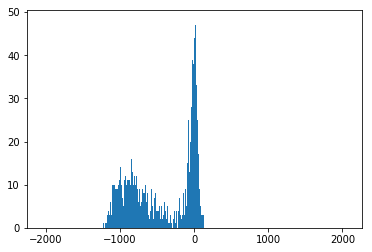

In [496]:
plt.hist(energies_VAE_T, bins=energy_bins)
plt.show()
plt.close()

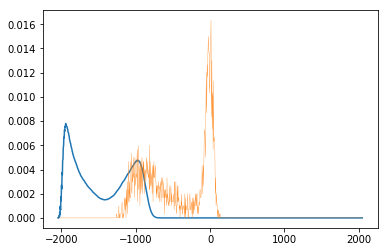

In [988]:
plt.plot(energy_vector, pE)
plt.plot(energy_vector, pE_VAE_T, linewidth=0.3)
plt.show()
plt.close()

# PCA noise analysis

In [61]:
I = np.dot(u.T,vt.T)

In [58]:
T = PCA_dataset.shape[0]**0.5 * projected_samples_PCA * (s**(-0.5))

In [65]:
T.shape

(3000, 1024)

In [59]:
print(T[:,0].mean())
print(T[:,0].std())

-7.875181988007777e-17
0.9996911886851537


In [78]:
Xrecon = PCA_dataset.shape[0]**(-0.5) * T@((u* (s**0.5)).T) + pca.mean_

In [80]:
E = PCA_dataset - Xrecon
e = ((E**2).sum(1))**0.5

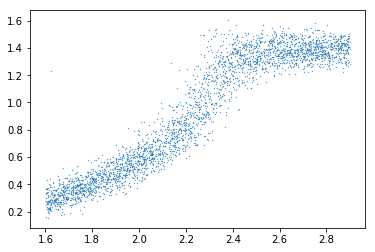

In [84]:
fig = plt.figure()
plt.scatter(temps[:3000], E.std(1), s = 0.1)
plt.show()
plt.close()

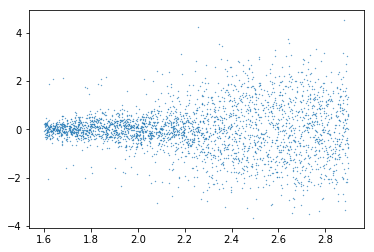

In [86]:
fig = plt.figure()
plt.scatter(temps[:3000], E[:,0], s = 0.1)
plt.show()
plt.close()

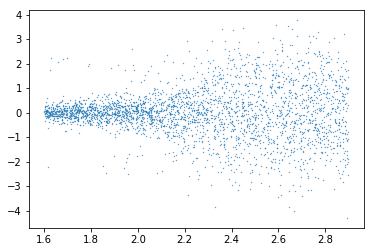

In [90]:
fig = plt.figure()
plt.scatter(temps[:3000], E[:,1023], s = 0.1)
plt.show()
plt.close()

In [93]:
correlation_0_1 = ((E[:,0]*E[:,1]).mean() - E[:,0].mean()*E[:,1].mean())/(E[:,0].std()*E[:,1].std())

In [94]:
print(E.mean())
print(E.std())
print(pca.noise_variance_)
print(correlation_0_1)

-5.792415158634156e-17
1.016216615021946
0.0
0.4574446772174336


In [36]:
print(projected_samples_PCA[:,6].mean())
print(projected_samples_PCA[:,6].std())

6.394884621840901e-17
2.7794100583335557


# Comparison latent variables

In [ ]:
images = []
fig2, ax2 = plt.subplots(nrows=2, ncols=3)
images.append(ax2[0,0].scatter(ordered_Y_AE[:,0], ordered_Y_AE[:,1], c=temps, s=0.6))
ax2[0,0].set_xlabel('LV 1', fontsize=8)
ax2[0,0].set_ylabel('LV 2', fontsize=8)
ax2[0,0].tick_params(labelsize=4)
images.append(ax2[0,1].scatter(ordered_Y_AE[:,0], ordered_Y_AE[:,2], c=temps, s=0.6))
ax2[0,1].set_xlabel('LV 1', fontsize=8)
ax2[0,1].set_ylabel('LV 3', fontsize=8)
ax2[0,1].tick_params(labelsize=4)
images.append(ax2[0,2].scatter(ordered_Y_AE[:,0], ordered_Y_AE[:,3], c=temps, s=0.6))
ax2[0,2].set_xlabel('LV 1', fontsize=8)
ax2[0,2].set_ylabel('LV 4', fontsize=8)
ax2[0,2].tick_params(labelsize=4)
images.append(ax2[1,0].scatter(ordered_Y_AE[:,0], ordered_Y_AE[:,4], c=temps, s=0.6))
ax2[1,0].set_xlabel('LV 1', fontsize=8)
ax2[1,0].set_ylabel('LV 5', fontsize=8)
ax2[1,0].tick_params(labelsize=4)
images.append(ax2[1,1].scatter(ordered_Y_AE[:,0], ordered_Y_AE[:,5], c=temps, s=0.6))
ax2[1,1].set_xlabel('LV 1', fontsize=8)
ax2[1,1].set_ylabel('LV 6', fontsize=8)
ax2[1,1].tick_params(labelsize=4)
images.append(ax2[1,2].scatter(ordered_Y_AE[:,0], ordered_Y_AE[:,6], c=temps, s=0.6))
ax2[1,2].set_xlabel('LV 1', fontsize=8)
ax2[1,2].set_ylabel('LV 7', fontsize=8)
ax2[1,2].tick_params(labelsize=4)
# plt.gca().set_aspect('equal', adjustable='box')
fig2.tight_layout()
fig2.colorbar(images[0], ax=ax2, orientation='vertical', fraction=.1)
plt.savefig('AELVs_Ising.png',dpi=300)
plt.show()
plt.close()

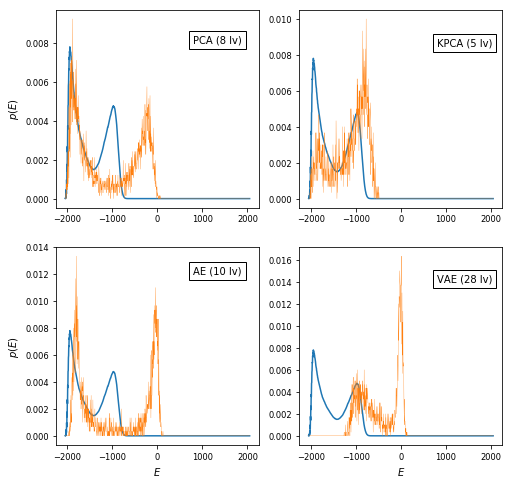

In [995]:
g2, ax2 = plt.subplots(nrows=2, ncols=2, figsize=(8,8))
ax2[0,0].plot(energy_vector, pE)
ax2[0,0].plot(energy_vector, pE_PCA_T, linewidth=0.3)
ax2[0,0].set_ylabel('$p(E)$')
ax2[0,0].tick_params(labelsize='small')

ax2[0,1].plot(energy_vector, pE)
ax2[0,1].plot(energy_vector, pE_KPCA_T, linewidth=0.3)
ax2[0,1].tick_params(labelsize='small')

ax2[1,0].plot(energy_vector, pE)
ax2[1,0].plot(energy_vector, pE_AE_T, linewidth=0.3)
ax2[1,0].set_xlabel('$E$')
ax2[1,0].set_ylabel('$p(E)$')
ax2[1,0].tick_params(labelsize='small')

ax2[1,1].plot(energy_vector, pE)
ax2[1,1].plot(energy_vector, pE_VAE_T, linewidth=0.3)
ax2[1,1].set_xlabel('$E$')
ax2[1,1].tick_params(labelsize='small')

ax2[0,0].text(800, 0.008, r'PCA (8 lv)', fontsize=10, bbox=dict(fc="none"))
ax2[0,1].text(800, 0.0085, r'KPCA (5 lv)', fontsize=10, bbox=dict(fc="none"))
ax2[1,0].text(800, 0.012, r'AE (10 lv)', fontsize=10, bbox=dict(fc="none"))
ax2[1,1].text(800, 0.014, r'VAE (28 lv)', fontsize=10, bbox=dict(fc="none"))
fig2.tight_layout()
plt.savefig('pE_comparison.png',dpi=500)
plt.show()
plt.close()

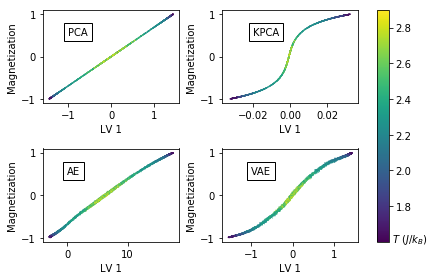

In [745]:
images = []
fig, ax = plt.subplots(2,2)
images.append(ax[0,0].scatter(-Y_PPCA[:,0], magnetizations[:batch_1_size], c = temps_1, s = 0.1))
images.append(ax[0,1].scatter(Y_KPCA[:,0], magnetizations[:batch_1_size], c = temps_1, s = 0.1))
images.append(ax[1,0].scatter(-ordered_Y_AE[:,0], magnetizations, c = temps, s = 0.1))
images.append(ax[1,1].scatter(-ordered_Y_VAE[:,0], magnetizations, c = temps, s = 0.1))
ax[0,0].text(-1, 0.5, r'PCA', fontsize=10, bbox=dict(fc="none"))
ax[0,1].text(-0.02, 0.5, r'KPCA', fontsize=10, bbox=dict(fc="none"))
ax[1,0].text(0, 0.5, r'AE', fontsize=10, bbox=dict(fc="none"))
ax[1,1].text(-1, 0.5, r'VAE', fontsize=10, bbox=dict(fc="none"))
ax[0,0].set_ylabel(r'Magnetization')
ax[0,0].set_xlabel(r'LV 1')
ax[0,1].set_ylabel(r'Magnetization')
ax[0,1].set_xlabel(r'LV 1')
ax[1,0].set_ylabel(r'Magnetization')
ax[1,0].set_xlabel(r'LV 1')
ax[1,1].set_ylabel(r'Magnetization')
ax[1,1].set_xlabel(r'LV 1')
plt.tight_layout()
cbar = fig2.colorbar(images[0], ax=ax, orientation='vertical', fraction=.1)
cbar.ax.text(1.3,0.0,r'$T$ ($J/k_B$)',rotation=0)
plt.savefig('comparison_2.jpg', dpi = 500)
plt.show()
plt.close()

In [98]:
net4 = MLPAE(1,latent_vars2)

In [99]:
for j in range(0, 10):
    losses = net4.train(dataset)

[0/100][0/66]	Loss: 0.694355
[20/100][0/66]	Loss: 0.611258
[40/100][0/66]	Loss: 0.557830
[60/100][0/66]	Loss: 0.444802
[80/100][0/66]	Loss: 0.429944
[0/100][0/66]	Loss: 0.428106
[20/100][0/66]	Loss: 0.427240
[40/100][0/66]	Loss: 0.426617
[60/100][0/66]	Loss: 0.426098
[80/100][0/66]	Loss: 0.425633
[0/100][0/66]	Loss: 0.425197
[20/100][0/66]	Loss: 0.424779
[40/100][0/66]	Loss: 0.424362
[60/100][0/66]	Loss: 0.423921
[80/100][0/66]	Loss: 0.423431
[0/100][0/66]	Loss: 0.422852
[20/100][0/66]	Loss: 0.422137
[40/100][0/66]	Loss: 0.421214
[60/100][0/66]	Loss: 0.420014
[80/100][0/66]	Loss: 0.418460
[0/100][0/66]	Loss: 0.416502
[20/100][0/66]	Loss: 0.414214
[40/100][0/66]	Loss: 0.411778
[60/100][0/66]	Loss: 0.409464
[80/100][0/66]	Loss: 0.407314
[0/100][0/66]	Loss: 0.405186
[20/100][0/66]	Loss: 0.402897
[40/100][0/66]	Loss: 0.400437
[60/100][0/66]	Loss: 0.397932
[80/100][0/66]	Loss: 0.395627
[0/100][0/66]	Loss: 0.393623
[20/100][0/66]	Loss: 0.391904
[40/100][0/66]	Loss: 0.390450
[60/100][0/66]	Lo

In [100]:
z4 = net4.forward_z(dataset.float().cuda())

In [101]:
latents4 = z4.cpu().detach().numpy()

In [102]:
fig, ax = plt.subplots(np.min([2,latent_vars2]),(latent_vars2+1)//2)
for i in range(0,latent_vars2):
    if latent_vars2 > 2:
        im = ax[i//(latent_vars2//2),i%(latent_vars2//2)].scatter(latents4[:,i], 2*magnetisms-1, c = temps, s = 0.1)
        ax[i//(latent_vars2//2),i%(latent_vars2//2)].tick_params(labelsize = 3.5)
    elif latent_vars2 == 2:
        im = ax[i//(latent_vars2//2)].scatter(latents4[:,i], 2*magnetisms-1, c = temps, s = 0.1)
        ax[i//(latent_vars2//2)].tick_params(labelsize = 3.5)
    elif latent_vars2 == 1:
        im = ax.scatter(latents4[:,i], 2*magnetisms-1, c = temps, s = 0.1)
        ax.tick_params(labelsize = 3.5)
plt.tight_layout()
fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.9, 0.1, 0.02, 0.85]) # left, bottom, width, height
cb = fig.colorbar(im, cax=cbar_ax)
cb.ax.tick_params(labelsize = 5)
plt.savefig('AE_latent_params_'+str(latent_vars2)+'_wt.jpg', dpi = 500)
plt.close()

# Representative samples

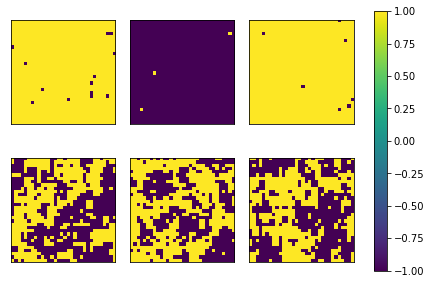

In [543]:
images = []
fig2, ax2 = plt.subplots(nrows=2, ncols=3)
images.append(ax2[0,0].imshow(dataset[np.argsort(temps),:][0,:].reshape([L,L])))
images.append(ax2[0,1].imshow(dataset[np.argsort(temps),:][2,:].reshape([L,L])))
images.append(ax2[0,2].imshow(dataset[np.argsort(temps),:][4,:].reshape([L,L])))
images.append(ax2[1,0].imshow(dataset[np.argsort(temps),:][-6,:].reshape([L,L])))
images.append(ax2[1,1].imshow(dataset[np.argsort(temps),:][-3,:].reshape([L,L])))
images.append(ax2[1,2].imshow(dataset[np.argsort(temps),:][-1,:].reshape([L,L])))

for i in range(0,2):
    for j in range(0,3):
        ax2[i,j].set_xticks([])
        ax2[i,j].set_yticks([])

fig2.tight_layout()
fig2.colorbar(images[0], ax=ax2, orientation='vertical', fraction=.1)
plt.savefig('MCMC_representative_samples.png',dpi=300)
plt.show()
plt.close()

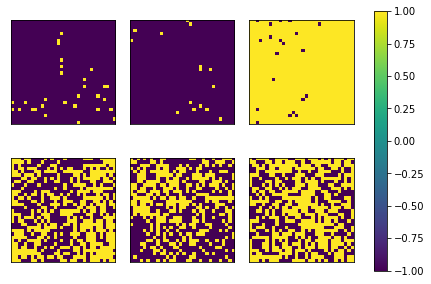

In [265]:
images = []
fig2, ax2 = plt.subplots(nrows=2, ncols=3)
images.append(ax2[0,0].imshow(X_PCA_T[5,:].reshape([L,L])))
images.append(ax2[0,1].imshow(X_PCA_T[10,:].reshape([L,L])))
images.append(ax2[0,2].imshow(X_PCA_T[20,:].reshape([L,L])))
images.append(ax2[1,0].imshow(X_PCA_T[-27,:].reshape([L,L])))
images.append(ax2[1,1].imshow(X_PCA_T[-22,:].reshape([L,L])))
images.append(ax2[1,2].imshow(X_PCA_T[-14,:].reshape([L,L])))

for i in range(0,2):
    for j in range(0,3):
        ax2[i,j].set_xticks([])
        ax2[i,j].set_yticks([])

fig2.tight_layout()
fig2.colorbar(images[0], ax=ax2, orientation='vertical', fraction=.1)
plt.savefig('PCA_representative_samples.png',dpi=300)
plt.show()
plt.close()

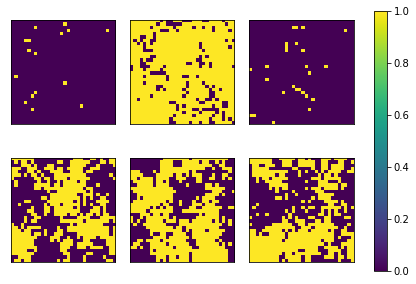

In [401]:
images = []
fig2, ax2 = plt.subplots(nrows=2, ncols=3)
images.append(ax2[0,0].imshow(X_KPCA_T[np.argsort(temps_1),:][0,:].detach().cpu().numpy().reshape([L,L])))
images.append(ax2[0,1].imshow(X_KPCA_T[np.argsort(temps_1),:][1,:].detach().cpu().numpy().reshape([L,L])))
images.append(ax2[0,2].imshow(X_KPCA_T[np.argsort(temps_1),:][2,:].detach().cpu().numpy().reshape([L,L])))
images.append(ax2[1,0].imshow(X_KPCA_T[np.argsort(temps_1),:][-3,:].detach().cpu().numpy().reshape([L,L])))
images.append(ax2[1,1].imshow(X_KPCA_T[np.argsort(temps_1),:][-2,:].detach().cpu().numpy().reshape([L,L])))
images.append(ax2[1,2].imshow(X_KPCA_T[np.argsort(temps_1),:][-1,:].detach().cpu().numpy().reshape([L,L])))

for i in range(0,2):
    for j in range(0,3):
        ax2[i,j].set_xticks([])
        ax2[i,j].set_yticks([])

fig2.tight_layout()
fig2.colorbar(images[0], ax=ax2, orientation='vertical', fraction=.1)
plt.savefig('KPCA_representative_samples.png',dpi=300)
plt.show()
plt.close()

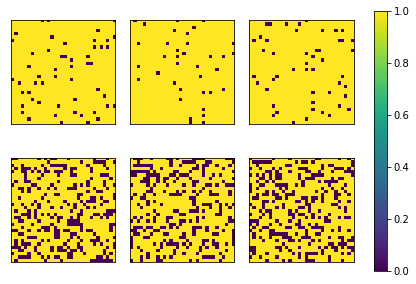

In [541]:
images = []
fig2, ax2 = plt.subplots(nrows=2, ncols=3)
images.append(ax2[0,0].imshow(X_AE_T[np.argsort(temps_1),:][0,:].detach().cpu().numpy().reshape([L,L])))
images.append(ax2[0,1].imshow(X_AE_T[np.argsort(temps_1),:][36,:].detach().cpu().numpy().reshape([L,L])))
images.append(ax2[0,2].imshow(X_AE_T[np.argsort(temps_1),:][2,:].detach().cpu().numpy().reshape([L,L])))
images.append(ax2[1,0].imshow(X_AE_T[np.argsort(temps_1),:][-29,:].detach().cpu().numpy().reshape([L,L])))
images.append(ax2[1,1].imshow(X_AE_T[np.argsort(temps_1),:][-4,:].detach().cpu().numpy().reshape([L,L])))
images.append(ax2[1,2].imshow(X_AE_T[np.argsort(temps_1),:][-1,:].detach().cpu().numpy().reshape([L,L])))

for i in range(0,2):
    for j in range(0,3):
        ax2[i,j].set_xticks([])
        ax2[i,j].set_yticks([])

fig2.tight_layout()
fig2.colorbar(images[0], ax=ax2, orientation='vertical', fraction=.1)
plt.savefig('AE_representative_samples.png',dpi=300)
plt.show()
plt.close()

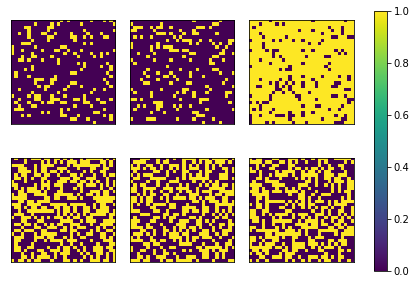

In [544]:
images = []
fig2, ax2 = plt.subplots(nrows=2, ncols=3)
images.append(ax2[0,0].imshow(X_VAE_T[np.argsort(temps_1),:][0,:].detach().cpu().numpy().reshape([L,L])))
images.append(ax2[0,1].imshow(X_VAE_T[np.argsort(temps_1),:][1,:].detach().cpu().numpy().reshape([L,L])))
images.append(ax2[0,2].imshow(X_VAE_T[np.argsort(temps_1),:][2,:].detach().cpu().numpy().reshape([L,L])))
images.append(ax2[1,0].imshow(X_VAE_T[np.argsort(temps_1),:][-3,:].detach().cpu().numpy().reshape([L,L])))
images.append(ax2[1,1].imshow(X_VAE_T[np.argsort(temps_1),:][-2,:].detach().cpu().numpy().reshape([L,L])))
images.append(ax2[1,2].imshow(X_VAE_T[np.argsort(temps_1),:][-1,:].detach().cpu().numpy().reshape([L,L])))

for i in range(0,2):
    for j in range(0,3):
        ax2[i,j].set_xticks([])
        ax2[i,j].set_yticks([])

fig2.tight_layout()
fig2.colorbar(images[0], ax=ax2, orientation='vertical', fraction=.1)
plt.savefig('VAE_representative_samples.png',dpi=300)
plt.show()
plt.close()

# t-SNE analysis

In [ ]:
tSNE_image = tsne(PCA_dataset)

Computing pairwise distances...
Computing P-values for point 0 of 6600...
Computing P-values for point 500 of 6600...
Computing P-values for point 1000 of 6600...
Computing P-values for point 1500 of 6600...
Computing P-values for point 2000 of 6600...
Computing P-values for point 2500 of 6600...
Computing P-values for point 3000 of 6600...
Computing P-values for point 3500 of 6600...
Computing P-values for point 4000 of 6600...
Computing P-values for point 4500 of 6600...
Computing P-values for point 5000 of 6600...
Computing P-values for point 5500 of 6600...
Computing P-values for point 6000 of 6600...
Computing P-values for point 6500 of 6600...
Mean value of sigma: 0.764931
Iteration 10: error is 12.622934
Iteration 20: error is 12.371069
Iteration 30: error is 13.175469
Iteration 40: error is 13.558801
Iteration 50: error is 14.037723
Iteration 60: error is 14.455455
Iteration 70: error is 14.501662
Iteration 80: error is 14.336043
Iteration 90: error is 13.586416
Iteration 100: 

In [7]:
X_embedded = TSNE(n_components=2, verbose=1, n_iter=10000, perplexity=100).fit_transform(PCA_dataset)

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.133s...
[t-SNE] Computed neighbors for 3000 samples in 11.607s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 3.791892
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.271751
[t-SNE] Error after 1900 iterations: 1.896002


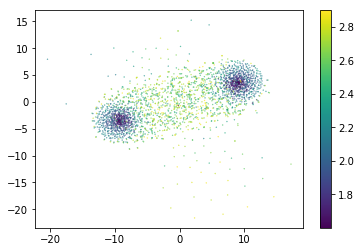

In [10]:
plt.scatter(X_embedded[:,0], X_embedded[:,1], c=temps[:3000], s=0.1)
# plt.xlim(-100,100)
# plt.ylim(-100,100)
plt.colorbar()
plt.savefig('tsne-try-sklearn-ising_1900.jpg', dpi=300)
plt.show()
plt.close()

In [5]:
tSNE_image, p, q = tSNE(PCA_dataset)

/home/dg/Documents/VAE/tSNE.py:17: RuntimeWarning: invalid value encountered in true_divide
  p_ji = p_ji/p_ji_sum
/home/dg/Documents/VAE/tSNE.py:18: RuntimeWarning: divide by zero encountered in log
  entropy = -np.dot(p_ji, exponent) + np.log(p_ji_sum)


Step 10: loss 0.088346
Step 20: loss 0.088345
Step 30: loss 0.088345
Step 40: loss 0.088344
Step 50: loss 0.088346
Step 60: loss 0.088374
Step 70: loss 0.088489
Step 80: loss 0.088728
Step 90: loss 0.089304
Step 100: loss 0.089464
Step 110: loss 0.088954
Step 120: loss 0.088682
Step 130: loss 0.089592
Step 140: loss 0.088747
Step 150: loss 0.089443
Step 160: loss 0.089212
Step 170: loss 0.089207
Step 180: loss 0.089020
Step 190: loss 0.089069
Step 200: loss 0.089115
Step 210: loss 0.089023
Step 220: loss 0.088754
Step 230: loss 0.089125
Step 240: loss 0.089055
Step 250: loss 0.088992
Step 260: loss 0.089013


KeyboardInterrupt: 